In [ ]:
!conda install -c plotly plotly-orca
!pip install distvis

In [1]:
import numpy as np

from sklearn.preprocessing import LabelEncoder
from category_encoders.ordinal import OrdinalEncoder
from sklearn.preprocessing import StandardScaler

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer

import pandas as pd
import lightgbm as lgbm
import optuna
from matplotlib import pyplot as plt

from distvis import plots as dplot

In [42]:
import chart_studio.plotly as py
import chart_studio



username='miloiturra'
api_key='CrY0Z3dZVv539AVcBAcW'

chart_studio.tools.set_credentials_file(username=username,
                                        api_key=api_key)

In [2]:
numerical_features = [
    'edad', 'meses_empleo'
]

categorical_features = [
    'sexo', 'rol_hogar', 'tipo_zona', 
    'termino_nivel', 'cine', 'est_conyugal', 'region', 'comuna', 'provincia',
    'est_subcontratado', 'categoria_empleo', 'grupo_ocupacion', 'nacionalidad'
]

features = categorical_features + numerical_features
target = "sueldo_neto"

In [3]:
datos = pd.read_csv('../datos/datos_procesados.csv').iloc[:, 1:]

test_index = datos.sample(frac=.1, random_state=1312).index
datos['is_test'] = 0 
datos.loc[test_index, 'is_test'] = 1

mean = np.log(datos.query('is_test == 0')[target]).mean()
std = np.log(datos.query('is_test == 0')[target]).std()

def transform(x):
    return (np.log(x) - mean)/std

def inv_transf(x):
    return np.exp(std*x + mean)

datos[target+'_transf'] = transform(datos[target])
datos[target+'_transf'].min(), datos[target+'_transf'].max()

df_train = datos.query('is_test == 0')
df_test = datos.query('is_test == 1')

df_test.loc[:, categorical_features] = df_test.loc[:, categorical_features].astype('category')
df_train.loc[:, categorical_features] = df_train.loc[:, categorical_features].astype('category')

/opt/conda/lib/python3.7/site-packages/pandas/core/indexing.py:1786: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, val, pi)


In [4]:
def get_categ_index_mapping(df_train, categ_feature):
    base_mapping = dict(zip(df_train[categ_feature], df_train[categ_feature].cat.codes + 1))
    return {**{"N/A": 0}, **base_mapping}

def get_categs_mappings(df_train, categs):
    mappings_list = []
    for i, c in enumerate(categs):
        map_dict = get_categ_index_mapping(df_train, c)
        mappings_list.append({'col': i, 'mapping': map_dict})
    return mappings_list

In [5]:
categs_mappings = get_categs_mappings(df_train, categorical_features)

In [6]:
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler()),
    ('imputer', SimpleImputer(strategy='median', fill_value=np.NaN)), 
    ])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value="N/A")),
    ('label', OrdinalEncoder(handle_unknown="value", mapping=categs_mappings)), #uknown values goes to -1
    ('imputer_uknow', SimpleImputer(missing_values=-1, strategy='constant', fill_value=0)), #uknown values go to 0, the index for NaN
    ])

preprocessor = ColumnTransformer(               #preprocessor rearenge columns
    transformers=[
        ('cat', categorical_transformer, categorical_features),
        ('num', numeric_transformer, numerical_features)]
)


In [7]:
model_params = {
    "objective": "regression",
    "metric": ["mape", "mae"],
    "boosting": "gbdt",
    "learning_rate": 0.01,
    "num_leaves": 31,
    "max_depth": -1,
    "min_data_in_leaf": 20,
    "bagging_fraction": 0.9,
    "feature_fraction": 0.7,
    "lambda_l2": 0.,
    "seed": 1312,
    "deterministic": True,
}

regressor = lgbm.LGBMRegressor(**model_params)

pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                           ('classifier', regressor)])


In [8]:
pipeline.fit(X=df_train[features], 
             y=df_train[target+'_transf'],
             classifier__categorical_feature=[i for i in range(len(categorical_features))],
             classifier__feature_name=features,
)

/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning: Using categorical_feature in Dataset.
  warnings.warn('Using categorical_feature in Dataset.')


[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(fill_value='N/A',
                                                                                 strategy='constant')),
                                                                  ('label',
                                                                   OrdinalEncoder(mapping=[{'col': 0,
                                                                                            'mapping': {'Hombre': 1,
                                                                                                        'Mujer': 2,
                                                                                                        'N/A': 0}},
                                                                                           {'col': 1,


In [9]:
datos['sueldo_predicho'] = inv_transf(pipeline.predict(datos[features]))
datos['error'] = datos.eval('sueldo_predicho - sueldo_neto')
datos['error_porcentual'] = datos.eval('error/sueldo_neto')
datos['error_porcentual_abs'] = datos.eval('abs(error_porcentual)')

In [10]:
datos.query('is_test == 1')['error_porcentual_abs'].mean()

0.48292520456922156

In [43]:
datos.query('is_test == 1')['error_porcentual_abs'].median()

0.261068842786369

In [44]:
datos.query('is_test == 1')['error_porcentual_abs'].quantile(0.75)

0.4777681599895259

<AxesSubplot:>

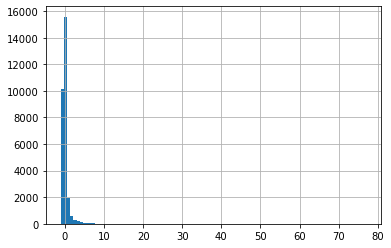

In [13]:
datos['error_porcentual'].hist(bins=100)

<AxesSubplot:>

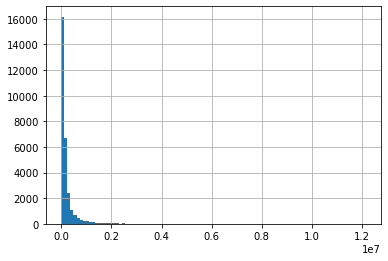

In [14]:
abs(datos['error']).hist(bins=100)

<AxesSubplot:>

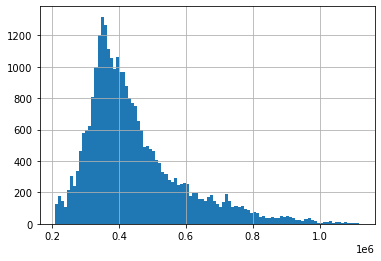

In [45]:
datos['sueldo_predicho'].hist(bins=100)

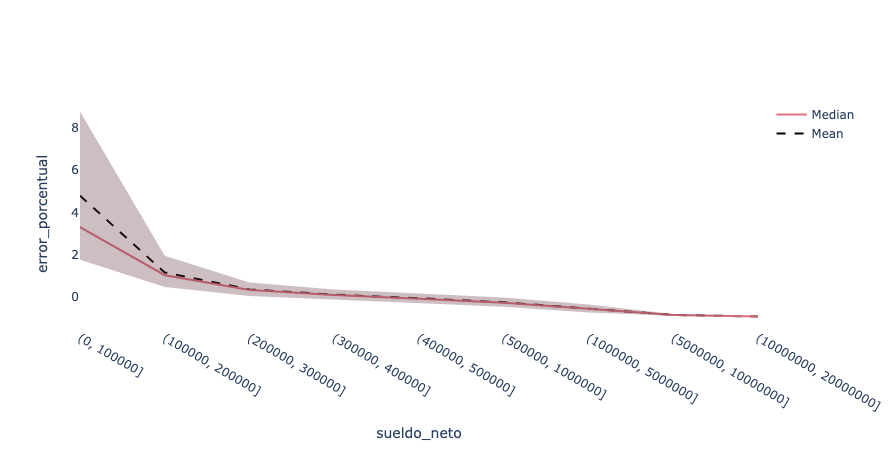

In [13]:
bins = [0, 100_000, 200_000, 300_000, 400_000, 500_000, 1_000_000, 5_000_000, 10_000_000, 20_000_000]
dplot.marginal_dependency_plot(datos, 'error_porcentual', target, bins=bins)

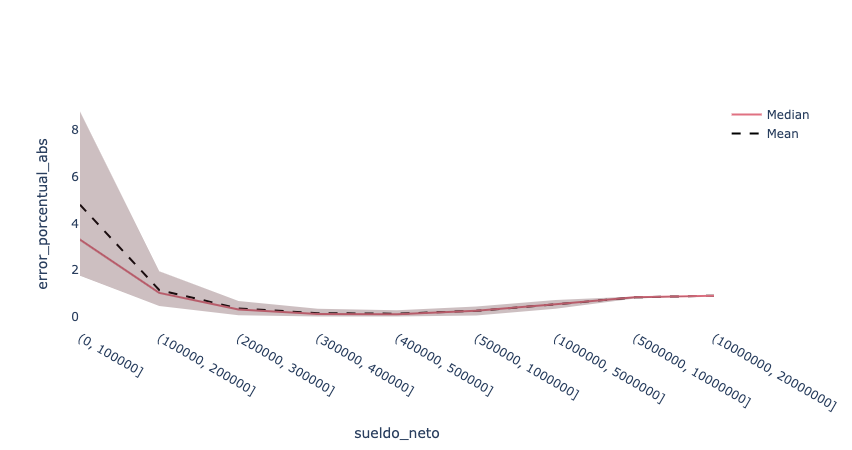

In [14]:
dplot.marginal_dependency_plot(datos, 'error_porcentual_abs', target, bins=bins)

# Análisis contrafactual de fairness

- Feature sensible $s$ y el resto de features $x$. Ejemplo: $s=$ sexo 
- El feature $s$ toma valores en el conjunto $S$. Ejemplo: para $s=$ sexo, $S=$ {Mujer, Mujer}
- Para un modelo predictivo $F$ y una persona con features no sensibles $x$ definimos la métrica de fairness que mide cuanto más porcentualmente ganaría la persona $(x, s^*)= \text{argmax}_{s \in S}F(x, s)$ por sobre $(x, s_*)= \text{argmin}_{s \in S}F(x, s)$, es decir:
$$\phi(x) = \frac{\max_sF(x, s)-\min_sF(x, s)}{\max_sF(x, s)}$$
- Luego para cada persona en la base test $z_i = (x_i, s_i)$ calculamos este indicador y luego promediamos:
$$\frac{1}{|\text{Test}|}\sum_{i}\phi(x_i)$$


In [16]:
def calc_dif_porcentual_max(df):
    sueldo_max = df['sueldo_predicho'].max()
    sueldo_min = df['sueldo_predicho'].min()
    
    return (sueldo_max - sueldo_min)/sueldo_min


def calc_dpc_persona(datos_test, feature, sample_frac=1, merge=False):
    valores = datos_test[feature].unique()
    otros_features = [f for f in features if f != feature]
    datos_contraf = (
        datos_test[otros_features]
        .sample(frac=sample_frac, random_state=1312)
        .copy()
    )
    datos_contraf['id_persona'] = datos_contraf.index
    datos_contraf['dummy'] = 1
    valores_df = pd.DataFrame({feature: valores, 'dummy': 1})
    datos_contraf = pd.merge(datos_contraf, valores_df, on='dummy')
    datos_contraf['sueldo_predicho'] = inv_transf(pipeline.predict(datos_contraf[features]))
    dif_pct_persona = datos_contraf.groupby('id_persona').apply(calc_dif_porcentual_max)
    del datos_contraf
    if merge:
        datos_test = pd.merge(datos_test, dif_pct_persona.to_frame(f'dpc_{feature}'), 
                         left_index=True, right_index=True,
                         how='left')
    return datos_test, dif_pct_persona

def calc_dpc(datos_test, feature, sample_frac=1, merge=False):
    dif_pct_persona = calc_dpc_persona(datos_test, feature, sample_frac=sample_frac, merge=merge)
    return dif_pct_persona.mean()

def calc_dpm(datos_test, feature):
    sueldo_pred_mediano = datos_test.groupby(feature).sueldo_predicho.median()
    sueldo_max = sueldo_pred_mediano.max()
    sueldo_min = sueldo_pred_mediano.min()
    
    return (sueldo_max - sueldo_min)/sueldo_min

In [39]:
features_sensibles = ['sexo', 'nacionalidad']

dpc_dict = {}
for feature in features_sensibles:
    df_test, dpc_dict[feature] = calc_dpc_persona(df_test, feature, sample_frac=1, merge=True)

DPC = 0.10175051688073738
DPM = 0.10365971081776132


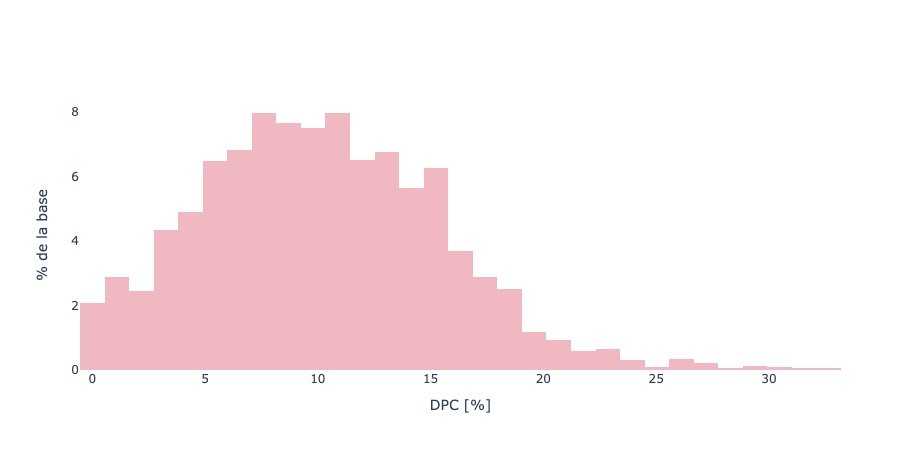

'https://plotly.com/~miloiturra/15/'

In [33]:
var = 'sexo'
print('DPC =', dpc_dict[var].mean())
print('DPM =', calc_dpm(datos.query('is_test == 1'), var))

fig = dplot.plot_histograms({'dpc': 100*dpc_dict[var]}, xaxis_title='DPC [%]', yaxis_title='% de la base', nbins=30)
fig.show()
py.plot(fig, filename=f"dpc_hist_modelo1", auto_open=True)

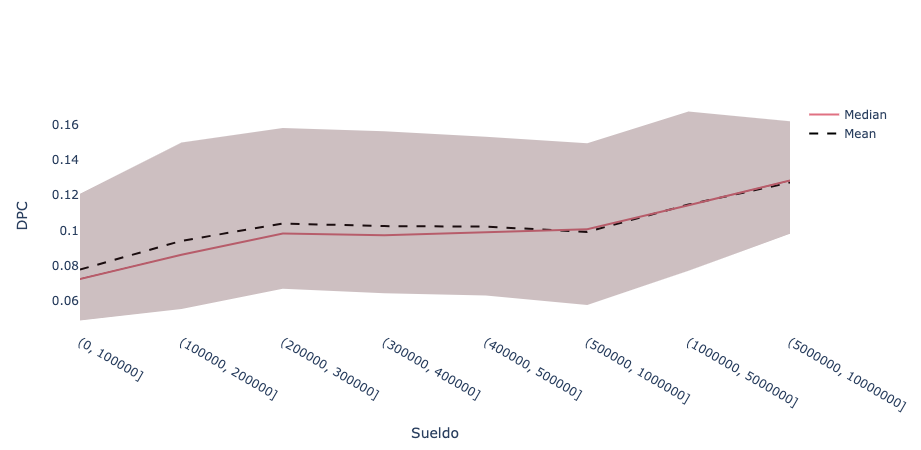

'https://plotly.com/~miloiturra/17/'

In [41]:
bins = [0, 100_000, 200_000, 300_000, 400_000, 500_000, 1_000_000, 5_000_000, 10_000_000]
fig = dplot.marginal_dependency_plot(df_test, 'dpc_sexo', target, bins=bins, lower_q=0.25, upper_q=0.85, xaxis_title='Sueldo', yaxis_title="DPC", show_global_metric=False)
fig.show()
py.plot(fig, filename=f"dpc_dependence_modelo1", auto_open=True)

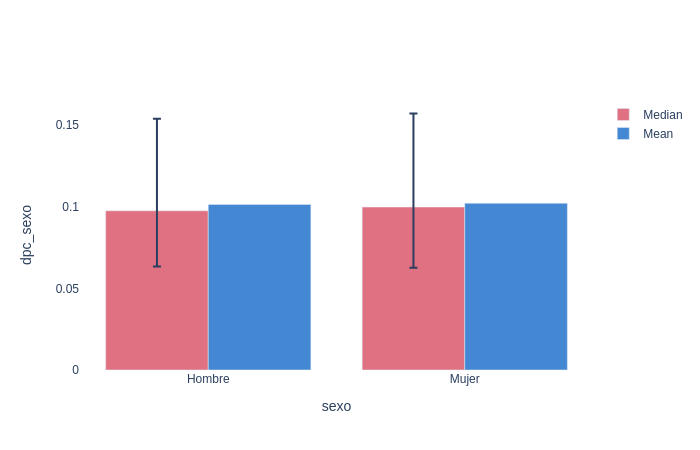

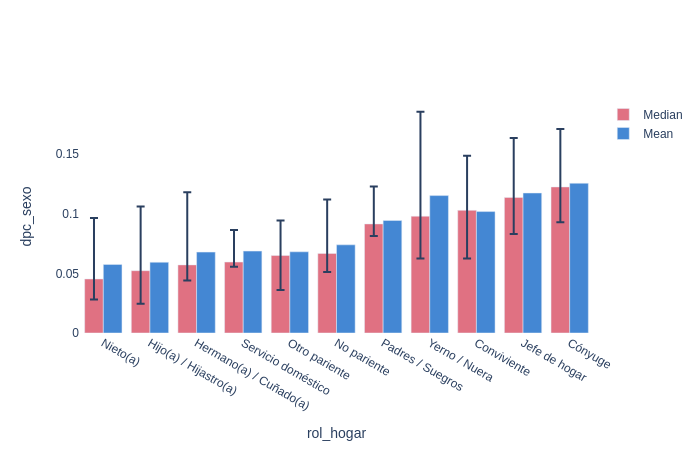

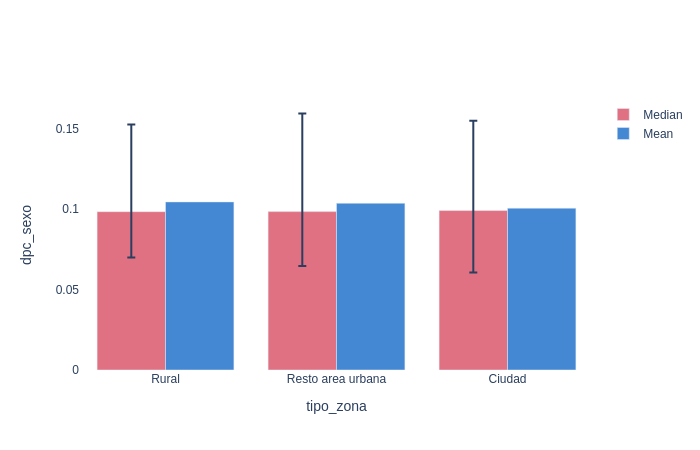

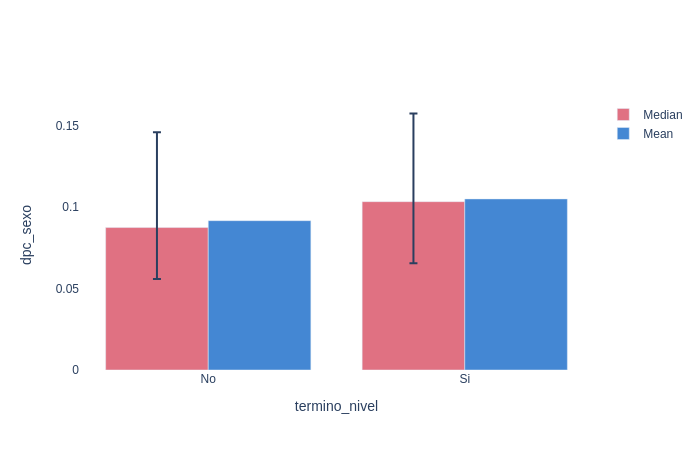

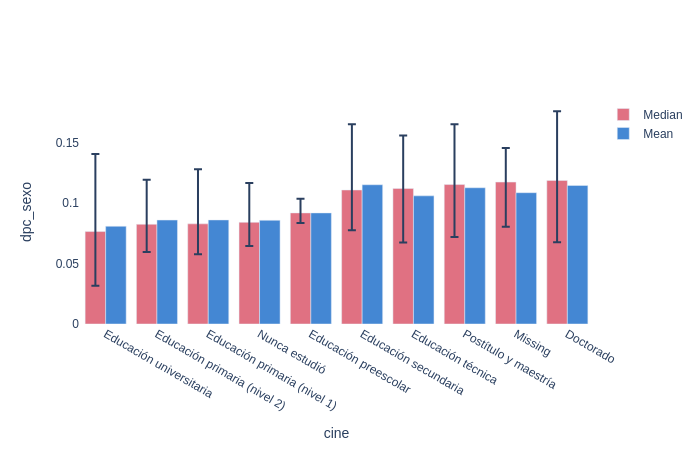

...

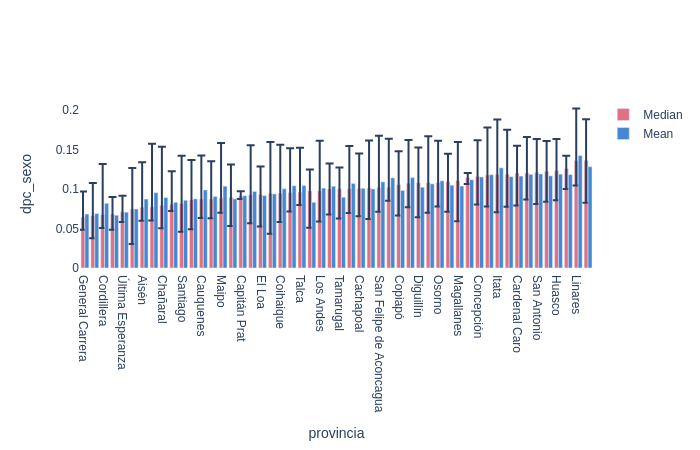

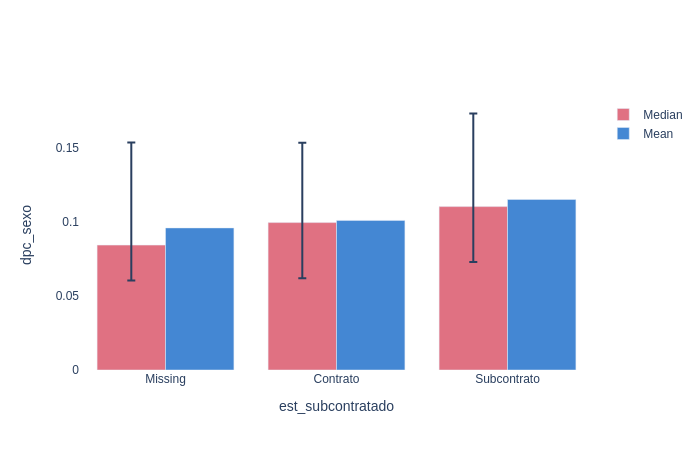

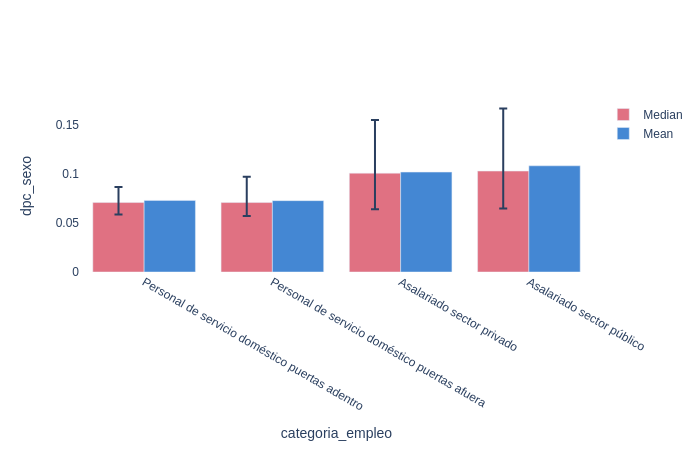

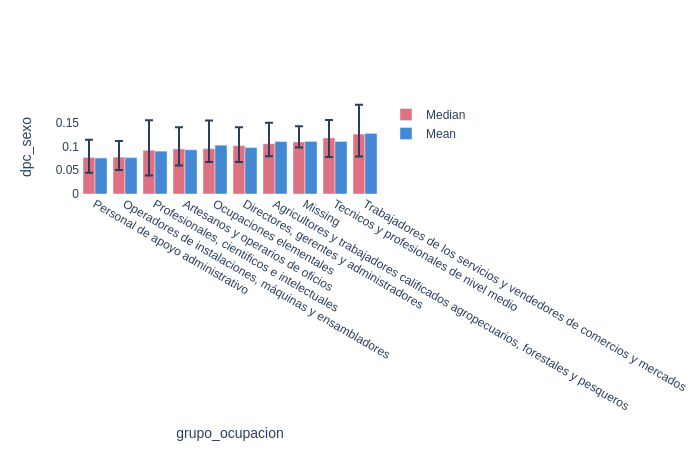

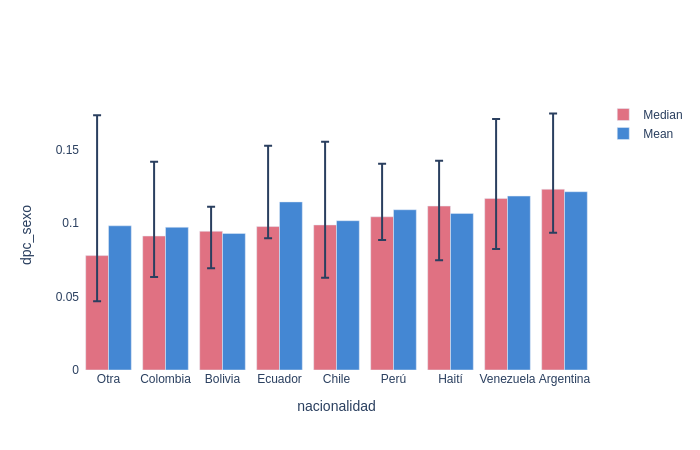

In [70]:
for f in categorical_features:
    fig = dplot.marginal_dependency_plot(df_test, 'dpc_sexo', f, categorical_feature=True, lower_q=0.25, upper_q=0.85)
    fig.show('png')

DPC = 0.0055585780602082045
DPM = 0.403995687977753


Text(0, 0.5, 'Frecuencia')

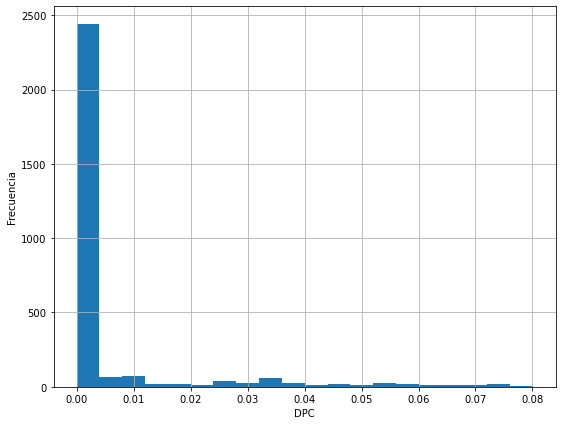

In [40]:
var = 'nacionalidad'
print('DPC =', dpc_dict[var].mean())
print('DPM =',calc_dpm(datos.query('is_test == 1'), var))

fig, ax = plt.subplots(figsize=(9, 7))
dpc_dict[var].hist(bins=20)
ax.set_xlabel('DPC');
ax.set_ylabel('Frecuencia')

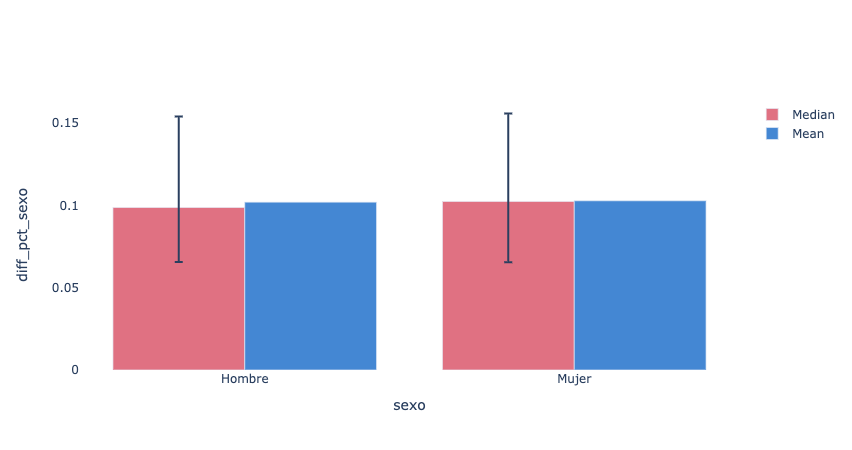

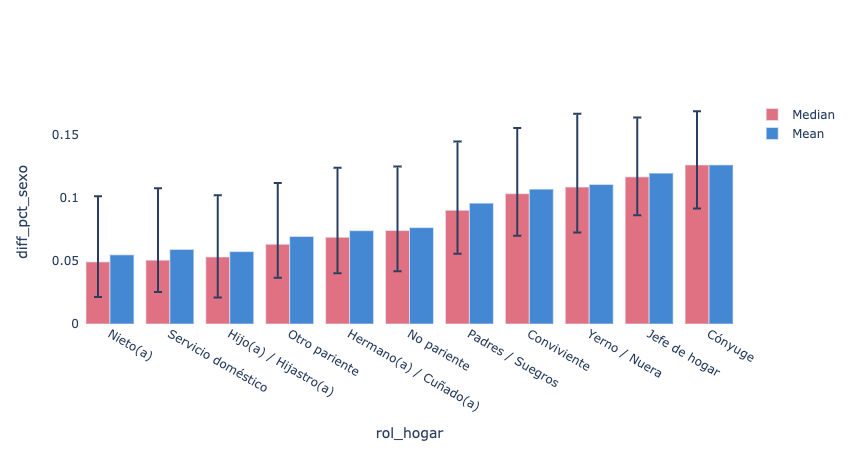

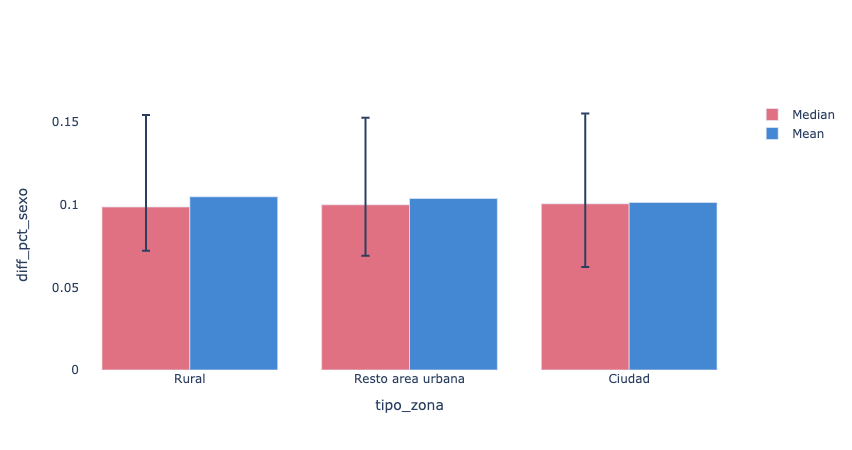

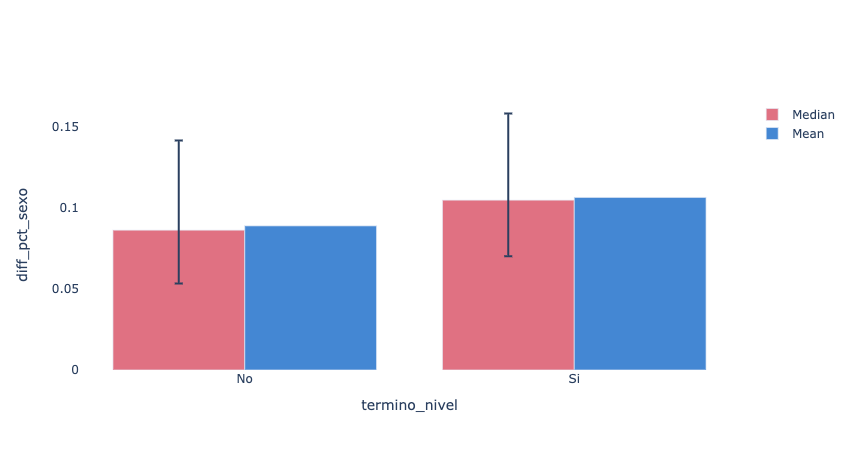

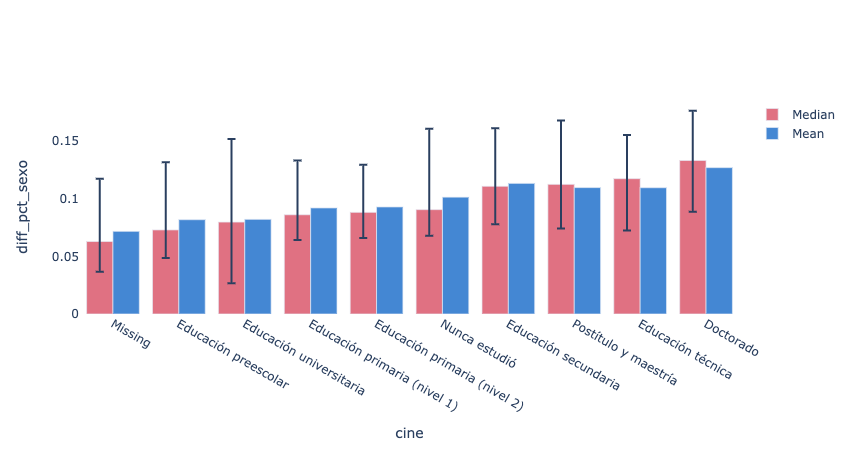

...

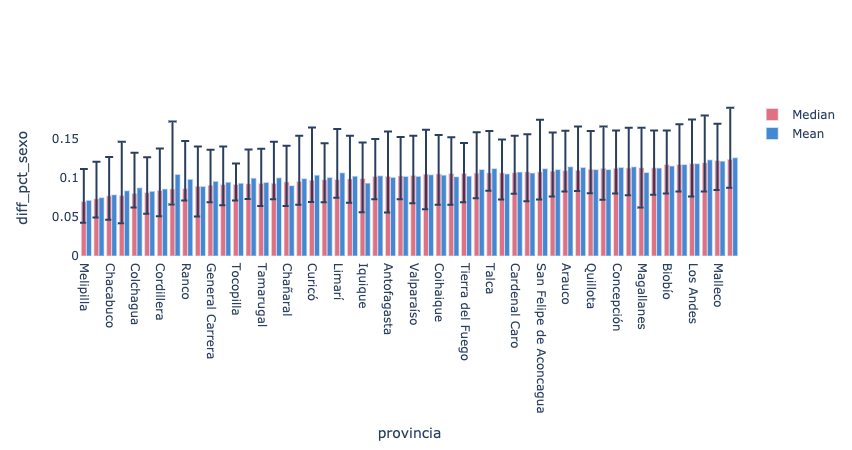

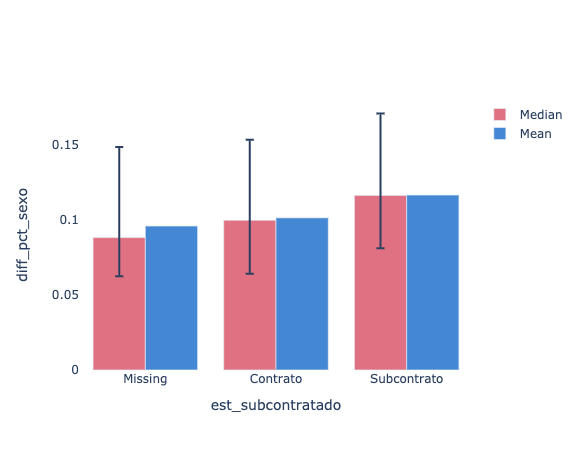

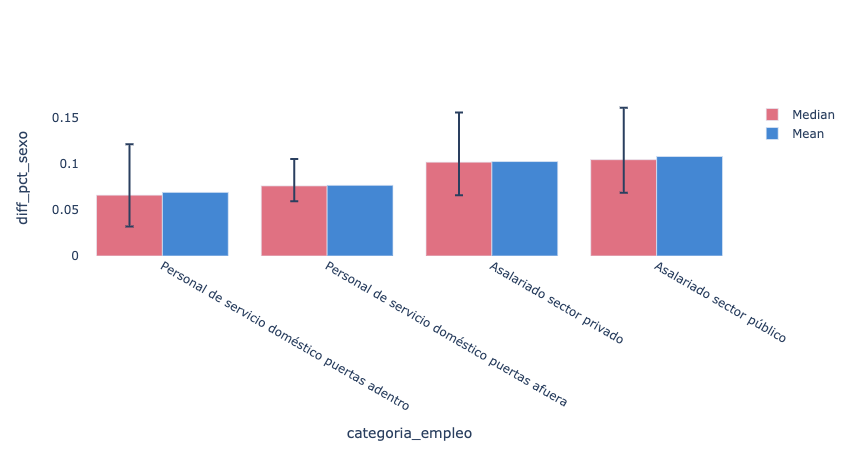

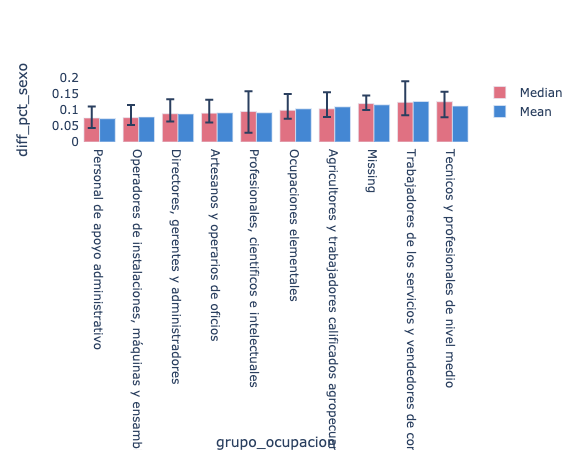

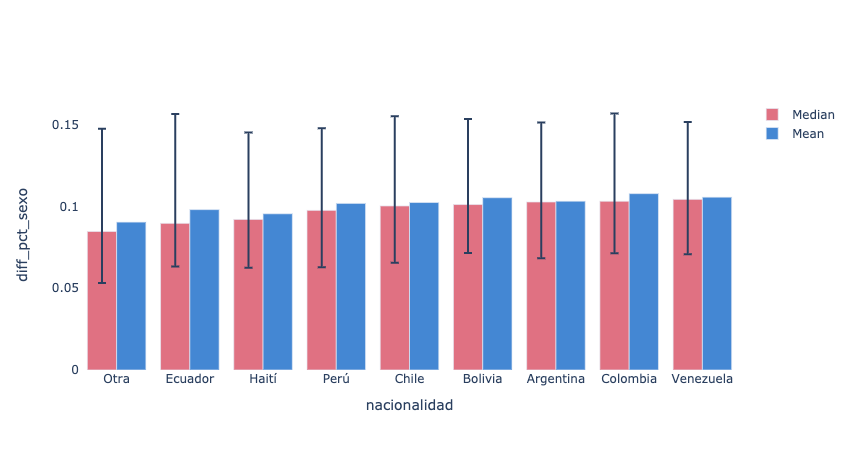

In [22]:
for f in categorical_features:
    fig = dplot.marginal_dependency_plot(df_test, 'dpc_sexo', f, categorical_feature=True, lower_q=0.25, upper_q=0.85)
    fig.show()

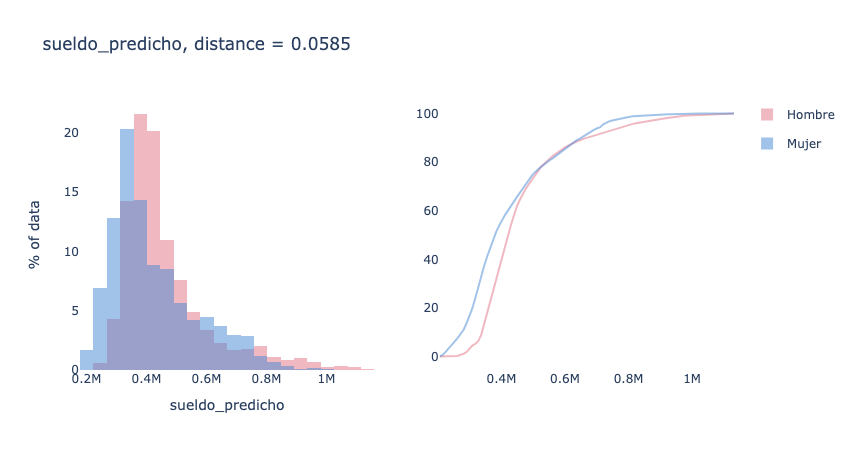

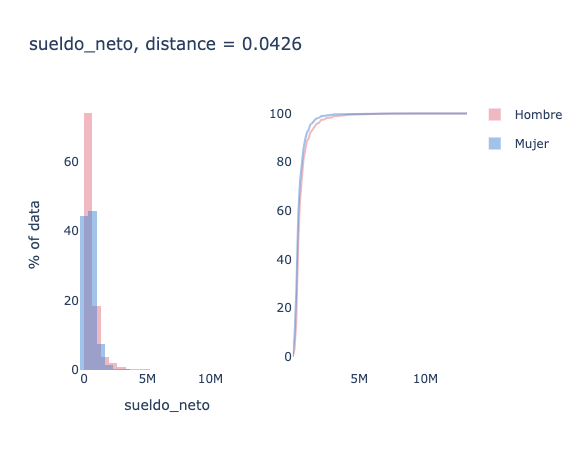

,distance
feature,
sueldo_predicho,0.058478
sueldo_neto,0.042558


In [23]:
dplot.compare_numerical_features(datos, ['sueldo_neto', 'sueldo_predicho'], groupby='sexo', nbins=20)

In [24]:
m_h = datos.query('sexo == "Hombre"').sueldo_neto.median()
m_m = datos.query('sexo == "Mujer"').sueldo_neto.median()
round(100 * (m_h - m_m)/m_m)

19

# Optimización multiobjetivo con optuna 
(MAPE y Fairness)

In [25]:
datos_test = datos.query('is_test == 1').reset_index(drop=True)

In [29]:
#se entrena el modelo y se retorna Mape y métrica de fairness 
def multi_obj(model_params):
    regressor = lgbm.LGBMRegressor(**model_params)
    pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                               ('classifier', regressor)])
    pipeline.fit(X=datos.query('is_test == 0')[features], 
                 y=datos.query('is_test == 0')[target+'_transf'],
                 classifier__categorical_feature=[i for i in range(len(categorical_features))],
                 classifier__feature_name=features,
    )
    
    
    datos_test['sueldo_predicho'] = inv_transf(pipeline.predict(datos_test[features]))
    
    mape = datos_test.eval(f"abs(sueldo_predicho - {target})/{target}").mean()
    
    #metrica de fairness
    feature = 'sexo'
    particion = dict_particion[feature]
    valores = particion['privilegiado'] + particion['desprotegido']
    otros_features = [f for f in features if f != feature]
    datos_contraf = datos_test[otros_features].sample(frac=0.1, random_state=1312).copy(deep=True)
    datos_contraf['dummy'] = 1
    datos_contraf['id_persona'] = datos_contraf.index
    valores_df = pd.DataFrame({feature: valores, 'dummy': 1})
    datos_contraf = pd.merge(datos_contraf, valores_df, on='dummy')
    datos_contraf['sueldo_predicho'] = inv_transf(pipeline.predict(datos_contraf[features]))
    diff_pct = datos_contraf.groupby('id_persona').apply(diferencia_porcentual, feature=feature)
    mean_diff_pct = diff_pct.mean()
    del datos_contraf
    
    
    
    return mape, mean_diff_pct

In [52]:
default_params = {
    'lambda_l1': 0,
    'lambda_l2': 0,
    'num_leaves': 31,
    'feature_fraction': 0.7,
    'bagging_fraction': 0.9,
    'bagging_freq': -1,
    'min_child_samples': -1,
    'feature_contri': None
}

In [55]:
%%time
def objective(trial):
    
    model_params = {
        "objective": "regression",
        "metric": ["mape", "mae"],
        "verbosity": -1,
        "boosting_type": "gbdt",   
        'learning_rate': 0.01,
        'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
        'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
        'num_leaves': trial.suggest_int('num_leaves', 2, 512),
        'feature_fraction': trial.suggest_uniform('feature_fraction', 0.1, 1.0),
        'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.1, 1.0),
        'bagging_freq': trial.suggest_int('bagging_freq', 0, 15),
        'min_child_samples': trial.suggest_int('min_child_samples', 1, 100),
        'max_depth': -1,
        'min_data_in_leaf': 20,
        'seed': 1312
    }
    
    return multi_obj(model_params)


study = optuna.create_study(directions=['minimize', 'minimize'])
study.enqueue_trial(default_params)
study.optimize(objective, n_trials=1000)

[I 2021-08-01 01:40:27,019] A new study created in memory with name: no-name-113b1c22-2482-4f59-9796-220ba654cc15
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:25: ExperimentalWarning:

enqueue_trial is experimental (supported from v1.2.0). The interface can change in the future.

/opt/conda/lib/python3.7/site-packages/optuna/study.py:783: ExperimentalWarning:

create_trial is experimental (supported from v2.0.0). The interface can change in the future.

/opt/conda/lib/python3.7/site-packages/optuna/study.py:783: ExperimentalWarning:

add_trial is experimental (supported from v2.0.0). The interface can change in the future.

/opt/conda/lib/python3.7/site-packages/optuna/trial/_trial.py:741: UserWarning:

Fixed parameter 'lambda_l1' with value 0 is out of range for distribution LogUniformDistribution(high=10.0, low=1e-08).

/opt/conda/lib/python3.7/site-packages/optuna/trial/_trial.py:741: UserWarning:

Fixed parameter 'lambda_l2' with value 0 is out of range for distribu

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.033770261018134164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.033770261018134164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011342502286657173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011342502286657173
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=36 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:40:28,266] Trial 0 finished with values: [0.48242994403879264, 0.10042105577461691] and parameters: {'lambda_l1': 0.033770261018134164, 'lambda_l2': 0.011342502286657173, 'num_leaves': 31, 'feature_fraction': 0.7, 'bagging_fraction': 0.9, 'bagging_freq': 4, 'min_child_samples': 36}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.2159162907093225, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2159162907093225
[LightGBM] [Warning] lambda_l1 is set=4.0651259830157574e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0651259830157574e-05
[LightGBM] [Warning] bagging_fraction is set=0.38666591848979337, subsample=1.0 will be ignored. Current value: bagging_fraction=0.38666591848979337
[LightGBM] [Warning] lambda_l2 is set=4.084822966831887e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.084822966831887e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=8 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6


[I 2021-08-01 01:40:29,376] Trial 1 finished with values: [0.5418093516845125, 0.048294546237857804] and parameters: {'lambda_l1': 4.0651259830157574e-05, 'lambda_l2': 4.084822966831887e-06, 'num_leaves': 37, 'feature_fraction': 0.2159162907093225, 'bagging_fraction': 0.38666591848979337, 'bagging_freq': 6, 'min_child_samples': 8}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.35590709278663357, subsample=1.0 will be ignored. Current value: bagging_fraction=0.35590709278663357
[LightGBM] [Warning] lambda_l2 is set=0.0008308839511049644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0008308839511049644
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=31 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:40:30,606] Trial 2 finished with values: [0.5412853029629133, 0.04786087078056725] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.0008308839511049644, 'num_leaves': 424, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.35590709278663357, 'bagging_freq': 4, 'min_child_samples': 31}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.4261587224129997, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4261587224129997
[LightGBM] [Warning] lambda_l1 is set=0.05895411085190947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05895411085190947
[LightGBM] [Warning] bagging_fraction is set=0.7736541984296373, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7736541984296373
[LightGBM] [Warning] lambda_l2 is set=0.8247489155281111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8247489155281111
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=8 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6


[I 2021-08-01 01:40:32,362] Trial 3 finished with values: [0.49805007709973614, 0.08779956765061625] and parameters: {'lambda_l1': 0.05895411085190947, 'lambda_l2': 0.8247489155281111, 'num_leaves': 220, 'feature_fraction': 0.4261587224129997, 'bagging_fraction': 0.7736541984296373, 'bagging_freq': 6, 'min_child_samples': 8}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9846002624731931, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9846002624731931
[LightGBM] [Warning] lambda_l1 is set=0.2412393838417289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2412393838417289
[LightGBM] [Warning] bagging_fraction is set=0.4945894507052543, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4945894507052543
[LightGBM] [Warning] lambda_l2 is set=0.03218523232141557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03218523232141557
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=81 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11


[I 2021-08-01 01:40:34,583] Trial 4 finished with values: [0.4638864703821345, 0.14607607795869357] and parameters: {'lambda_l1': 0.2412393838417289, 'lambda_l2': 0.03218523232141557, 'num_leaves': 354, 'feature_fraction': 0.9846002624731931, 'bagging_fraction': 0.4945894507052543, 'bagging_freq': 11, 'min_child_samples': 81}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.33484870597423466, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.33484870597423466
[LightGBM] [Warning] lambda_l1 is set=0.08017206979194894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08017206979194894
[LightGBM] [Warning] bagging_fraction is set=0.8460553852484319, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8460553852484319
[LightGBM] [Warning] lambda_l2 is set=1.939466772093116e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.939466772093116e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:40:36,409] Trial 5 finished with values: [0.5098009167399419, 0.09071354628239472] and parameters: {'lambda_l1': 0.08017206979194894, 'lambda_l2': 1.939466772093116e-06, 'num_leaves': 340, 'feature_fraction': 0.33484870597423466, 'bagging_fraction': 0.8460553852484319, 'bagging_freq': 7, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.3262730023998345, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3262730023998345
[LightGBM] [Warning] lambda_l1 is set=0.00022001640525753246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00022001640525753246
[LightGBM] [Warning] bagging_fraction is set=0.3282724888906845, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3282724888906845
[LightGBM] [Warning] lambda_l2 is set=1.554041721261327e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.554041721261327e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=28 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 01:40:37,982] Trial 6 finished with values: [0.5125554735390292, 0.08614619510561719] and parameters: {'lambda_l1': 0.00022001640525753246, 'lambda_l2': 1.554041721261327e-06, 'num_leaves': 450, 'feature_fraction': 0.3262730023998345, 'bagging_fraction': 0.3282724888906845, 'bagging_freq': 9, 'min_child_samples': 28}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.32730295050877667, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.32730295050877667
[LightGBM] [Warning] lambda_l1 is set=0.08427265567099713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08427265567099713
[LightGBM] [Warning] bagging_fraction is set=0.3521101102990788, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3521101102990788
[LightGBM] [Warning] lambda_l2 is set=7.70040007197638e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.70040007197638e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0


[I 2021-08-01 01:40:39,908] Trial 7 finished with values: [0.5098303085085284, 0.08974567368526808] and parameters: {'lambda_l1': 0.08427265567099713, 'lambda_l2': 7.70040007197638e-06, 'num_leaves': 451, 'feature_fraction': 0.32730295050877667, 'bagging_fraction': 0.3521101102990788, 'bagging_freq': 0, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5045302960785152, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5045302960785152
[LightGBM] [Warning] lambda_l1 is set=0.0003531758992543749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0003531758992543749
[LightGBM] [Warning] bagging_fraction is set=0.8007108628748564, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8007108628748564
[LightGBM] [Warning] lambda_l2 is set=4.439248598757809e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.439248598757809e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=65 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0


[I 2021-08-01 01:40:41,909] Trial 8 finished with values: [0.4794921321563076, 0.10287179757734435] and parameters: {'lambda_l1': 0.0003531758992543749, 'lambda_l2': 4.439248598757809e-08, 'num_leaves': 280, 'feature_fraction': 0.5045302960785152, 'bagging_fraction': 0.8007108628748564, 'bagging_freq': 0, 'min_child_samples': 65}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.2403343769967769, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2403343769967769
[LightGBM] [Warning] lambda_l1 is set=9.492094360821552e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.492094360821552e-06
[LightGBM] [Warning] bagging_fraction is set=0.7691536082426468, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7691536082426468
[LightGBM] [Warning] lambda_l2 is set=1.8398537850973486e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8398537850973486e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=17 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:40:43,514] Trial 9 finished with values: [0.5438639821130198, 0.07153267559713754] and parameters: {'lambda_l1': 9.492094360821552e-06, 'lambda_l2': 1.8398537850973486e-07, 'num_leaves': 434, 'feature_fraction': 0.2403343769967769, 'bagging_fraction': 0.7691536082426468, 'bagging_freq': 8, 'min_child_samples': 17}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.37684773556837037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.37684773556837037
[LightGBM] [Warning] lambda_l1 is set=0.0012318705001242959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0012318705001242959
[LightGBM] [Warning] bagging_fraction is set=0.46682624670322725, subsample=1.0 will be ignored. Current value: bagging_fraction=0.46682624670322725
[LightGBM] [Warning] lambda_l2 is set=0.0169483787272163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0169483787272163
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=38 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0


[I 2021-08-01 01:40:45,524] Trial 10 finished with values: [0.4967781898952487, 0.08935012949130935] and parameters: {'lambda_l1': 0.0012318705001242959, 'lambda_l2': 0.0169483787272163, 'num_leaves': 354, 'feature_fraction': 0.37684773556837037, 'bagging_fraction': 0.46682624670322725, 'bagging_freq': 0, 'min_child_samples': 38}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.15097241845765114, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.15097241845765114
[LightGBM] [Warning] lambda_l1 is set=0.018447447366547028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.018447447366547028
[LightGBM] [Warning] bagging_fraction is set=0.6963200288074336, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6963200288074336
[LightGBM] [Warning] lambda_l2 is set=0.2087986347291432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2087986347291432
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=59 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:40:46,694] Trial 11 finished with values: [0.5957716160009392, 0.0614370954016227] and parameters: {'lambda_l1': 0.018447447366547028, 'lambda_l2': 0.2087986347291432, 'num_leaves': 448, 'feature_fraction': 0.15097241845765114, 'bagging_fraction': 0.6963200288074336, 'bagging_freq': 13, 'min_child_samples': 59}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1479623517101152, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1479623517101152
[LightGBM] [Warning] lambda_l1 is set=0.0066836258801757295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0066836258801757295
[LightGBM] [Warning] bagging_fraction is set=0.37985475353254006, subsample=1.0 will be ignored. Current value: bagging_fraction=0.37985475353254006
[LightGBM] [Warning] lambda_l2 is set=2.426898823748139e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.426898823748139e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=41 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-08-01 01:40:47,841] Trial 12 finished with values: [0.5968729544326717, 0.06022668175664464] and parameters: {'lambda_l1': 0.0066836258801757295, 'lambda_l2': 2.426898823748139e-05, 'num_leaves': 484, 'feature_fraction': 0.1479623517101152, 'bagging_fraction': 0.37985475353254006, 'bagging_freq': 1, 'min_child_samples': 41}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=7.459413489165031e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.459413489165031e-08
[LightGBM] [Warning] bagging_fraction is set=0.6281621526155958, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6281621526155958
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:40:49,587] Trial 13 finished with values: [0.4640883342911672, 0.13153438147933003] and parameters: {'lambda_l1': 7.459413489165031e-08, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 176, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.6281621526155958, 'bagging_freq': 8, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.28204498327670724, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.28204498327670724
[LightGBM] [Warning] lambda_l1 is set=1.980276457917155e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.980276457917155e-05
[LightGBM] [Warning] bagging_fraction is set=0.13269227118341467, subsample=1.0 will be ignored. Current value: bagging_fraction=0.13269227118341467
[LightGBM] [Warning] lambda_l2 is set=0.348573990896213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.348573990896213
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=53 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=15, subsample_freq=0 will be ignored. Current value: bagging_freq=15


[I 2021-08-01 01:40:50,737] Trial 14 finished with values: [0.5500179808905681, 0.07083832010678674] and parameters: {'lambda_l1': 1.980276457917155e-05, 'lambda_l2': 0.348573990896213, 'num_leaves': 459, 'feature_fraction': 0.28204498327670724, 'bagging_fraction': 0.13269227118341467, 'bagging_freq': 15, 'min_child_samples': 53}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5298754133700085, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5298754133700085
[LightGBM] [Warning] lambda_l1 is set=2.2342598175669113e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2342598175669113e-06
[LightGBM] [Warning] bagging_fraction is set=0.6962897153822178, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6962897153822178
[LightGBM] [Warning] lambda_l2 is set=2.7621023444516446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7621023444516446
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=63 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10


[I 2021-08-01 01:40:52,822] Trial 15 finished with values: [0.4828917896079467, 0.09826949501908645] and parameters: {'lambda_l1': 2.2342598175669113e-06, 'lambda_l2': 2.7621023444516446, 'num_leaves': 339, 'feature_fraction': 0.5298754133700085, 'bagging_fraction': 0.6962897153822178, 'bagging_freq': 10, 'min_child_samples': 63}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=2.6935370957182603e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6935370957182603e-07
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=0.0054803842683392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0054803842683392
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=34 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12


[I 2021-08-01 01:40:54,310] Trial 16 finished with values: [0.47305451918147184, 0.11710684472090682] and parameters: {'lambda_l1': 2.6935370957182603e-07, 'lambda_l2': 0.0054803842683392, 'num_leaves': 94, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 12, 'min_child_samples': 34}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:40:56,356] Trial 17 finished with values: [0.4631092024055913, 0.14080053904850476] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 249, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 8, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9561588452325668, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9561588452325668
[LightGBM] [Warning] lambda_l1 is set=8.78195064973554e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.78195064973554e-05
[LightGBM] [Warning] bagging_fraction is set=0.8073635055873694, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8073635055873694
[LightGBM] [Warning] lambda_l2 is set=1.2088478379808767e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2088478379808767e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=71 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:40:57,611] Trial 18 finished with values: [0.47967951290445804, 0.10786632319145933] and parameters: {'lambda_l1': 8.78195064973554e-05, 'lambda_l2': 1.2088478379808767e-08, 'num_leaves': 37, 'feature_fraction': 0.9561588452325668, 'bagging_fraction': 0.8073635055873694, 'bagging_freq': 3, 'min_child_samples': 71}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5254714568962806, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5254714568962806
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.7119635985081141, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7119635985081141
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=30 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:40:58,714] Trial 19 finished with values: [0.5002511256707907, 0.06942532108933314] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.5254714568962806, 'bagging_fraction': 0.7119635985081141, 'bagging_freq': 8, 'min_child_samples': 30}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5615303735906708, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5615303735906708
[LightGBM] [Warning] lambda_l1 is set=3.5075136380126586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5075136380126586
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=0.06664063688983556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06664063688983556
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:41:00,148] Trial 20 finished with values: [0.48844420129920996, 0.09020223574437138] and parameters: {'lambda_l1': 3.5075136380126586, 'lambda_l2': 0.06664063688983556, 'num_leaves': 271, 'feature_fraction': 0.5615303735906708, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 5, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.3779813411184805, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3779813411184805
[LightGBM] [Warning] lambda_l1 is set=0.9071290898300609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9071290898300609
[LightGBM] [Warning] bagging_fraction is set=0.6035004507747904, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6035004507747904
[LightGBM] [Warning] lambda_l2 is set=5.342254686724768e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.342254686724768e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=21 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 01:41:01,906] Trial 21 finished with values: [0.49897479358340957, 0.08526896211703722] and parameters: {'lambda_l1': 0.9071290898300609, 'lambda_l2': 5.342254686724768e-07, 'num_leaves': 316, 'feature_fraction': 0.3779813411184805, 'bagging_fraction': 0.6035004507747904, 'bagging_freq': 14, 'min_child_samples': 21}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8793930604858761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8793930604858761
[LightGBM] [Warning] lambda_l1 is set=1.9326045805836575e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9326045805836575e-08
[LightGBM] [Warning] bagging_fraction is set=0.5114097045340414, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5114097045340414
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:41:03,526] Trial 22 finished with values: [0.4658690231107956, 0.12955121439190612] and parameters: {'lambda_l1': 1.9326045805836575e-08, 'lambda_l2': 0.069657123645118, 'num_leaves': 149, 'feature_fraction': 0.8793930604858761, 'bagging_fraction': 0.5114097045340414, 'bagging_freq': 4, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.28551322085261355, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.28551322085261355
[LightGBM] [Warning] lambda_l1 is set=0.012098867697657454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012098867697657454
[LightGBM] [Warning] bagging_fraction is set=0.67704622033813, subsample=1.0 will be ignored. Current value: bagging_fraction=0.67704622033813
[LightGBM] [Warning] lambda_l2 is set=0.8052076499506255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8052076499506255
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=25 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:41:05,143] Trial 23 finished with values: [0.544439840512772, 0.07033455316720943] and parameters: {'lambda_l1': 0.012098867697657454, 'lambda_l2': 0.8052076499506255, 'num_leaves': 417, 'feature_fraction': 0.28551322085261355, 'bagging_fraction': 0.67704622033813, 'bagging_freq': 13, 'min_child_samples': 25}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.30078783364357503, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30078783364357503
[LightGBM] [Warning] lambda_l1 is set=0.038517003432906705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.038517003432906705
[LightGBM] [Warning] bagging_fraction is set=0.9299029087643547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9299029087643547
[LightGBM] [Warning] lambda_l2 is set=0.010331031680189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010331031680189
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=25 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:41:06,495] Trial 24 finished with values: [0.5098943910104059, 0.08827029147695316] and parameters: {'lambda_l1': 0.038517003432906705, 'lambda_l2': 0.010331031680189, 'num_leaves': 79, 'feature_fraction': 0.30078783364357503, 'bagging_fraction': 0.9299029087643547, 'bagging_freq': 3, 'min_child_samples': 25}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8863126694078708, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8863126694078708
[LightGBM] [Warning] lambda_l1 is set=1.0074957752627545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0074957752627545
[LightGBM] [Warning] bagging_fraction is set=0.22117958829370066, subsample=1.0 will be ignored. Current value: bagging_fraction=0.22117958829370066
[LightGBM] [Warning] lambda_l2 is set=5.950207817612061e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.950207817612061e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=36 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10


[I 2021-08-01 01:41:07,961] Trial 25 finished with values: [0.4740446275779853, 0.12668735630354055] and parameters: {'lambda_l1': 1.0074957752627545, 'lambda_l2': 5.950207817612061e-08, 'num_leaves': 432, 'feature_fraction': 0.8863126694078708, 'bagging_fraction': 0.22117958829370066, 'bagging_freq': 10, 'min_child_samples': 36}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.32218307851263506, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.32218307851263506
[LightGBM] [Warning] lambda_l1 is set=3.9307760554358315e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9307760554358315e-08
[LightGBM] [Warning] bagging_fraction is set=0.33077789506104466, subsample=1.0 will be ignored. Current value: bagging_fraction=0.33077789506104466
[LightGBM] [Warning] lambda_l2 is set=0.35498759324880613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.35498759324880613
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=88 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:41:09,484] Trial 26 finished with values: [0.5135892172190061, 0.08688530503598989] and parameters: {'lambda_l1': 3.9307760554358315e-08, 'lambda_l2': 0.35498759324880613, 'num_leaves': 455, 'feature_fraction': 0.32218307851263506, 'bagging_fraction': 0.33077789506104466, 'bagging_freq': 13, 'min_child_samples': 88}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8331628551719967, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8331628551719967
[LightGBM] [Warning] lambda_l1 is set=0.17676024994636394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17676024994636394
[LightGBM] [Warning] bagging_fraction is set=0.67377880153364, subsample=1.0 will be ignored. Current value: bagging_fraction=0.67377880153364
[LightGBM] [Warning] lambda_l2 is set=5.8389186074363186e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8389186074363186e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6


[I 2021-08-01 01:41:11,589] Trial 27 finished with values: [0.46620803609943806, 0.13146136038882847] and parameters: {'lambda_l1': 0.17676024994636394, 'lambda_l2': 5.8389186074363186e-05, 'num_leaves': 300, 'feature_fraction': 0.8331628551719967, 'bagging_fraction': 0.67377880153364, 'bagging_freq': 6, 'min_child_samples': 15}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.35441186890099874, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.35441186890099874
[LightGBM] [Warning] lambda_l1 is set=0.0016745046237708677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016745046237708677
[LightGBM] [Warning] bagging_fraction is set=0.14145160949923358, subsample=1.0 will be ignored. Current value: bagging_fraction=0.14145160949923358
[LightGBM] [Warning] lambda_l2 is set=4.892064995155715e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.892064995155715e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=54 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:41:12,826] Trial 28 finished with values: [0.5167067284956799, 0.08544076556700644] and parameters: {'lambda_l1': 0.0016745046237708677, 'lambda_l2': 4.892064995155715e-08, 'num_leaves': 160, 'feature_fraction': 0.35441186890099874, 'bagging_fraction': 0.14145160949923358, 'bagging_freq': 7, 'min_child_samples': 54}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.2606601910487279, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2606601910487279
[LightGBM] [Warning] lambda_l1 is set=2.0988445885895324e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0988445885895324e-07
[LightGBM] [Warning] bagging_fraction is set=0.8629893158330866, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8629893158330866
[LightGBM] [Warning] lambda_l2 is set=0.015827678966214554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015827678966214554
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=24 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


[I 2021-08-01 01:41:14,476] Trial 29 finished with values: [0.5434943613109204, 0.0706272136302911] and parameters: {'lambda_l1': 2.0988445885895324e-07, 'lambda_l2': 0.015827678966214554, 'num_leaves': 352, 'feature_fraction': 0.2606601910487279, 'bagging_fraction': 0.8629893158330866, 'bagging_freq': 2, 'min_child_samples': 24}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8842072246000104, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8842072246000104
[LightGBM] [Warning] lambda_l1 is set=1.5253251074284904e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5253251074284904e-08
[LightGBM] [Warning] bagging_fraction is set=0.2368067102433421, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2368067102433421
[LightGBM] [Warning] lambda_l2 is set=0.0014211304121930716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0014211304121930716
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=98 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=15, subsample_freq=0 will be ignored. Current value: bagging_freq=15


[I 2021-08-01 01:41:16,172] Trial 30 finished with values: [0.4710950125383542, 0.13546106126263896] and parameters: {'lambda_l1': 1.5253251074284904e-08, 'lambda_l2': 0.0014211304121930716, 'num_leaves': 363, 'feature_fraction': 0.8842072246000104, 'bagging_fraction': 0.2368067102433421, 'bagging_freq': 15, 'min_child_samples': 98}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16096640415232455, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16096640415232455
[LightGBM] [Warning] lambda_l1 is set=9.67720907995842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.67720907995842
[LightGBM] [Warning] bagging_fraction is set=0.9284830824625199, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9284830824625199
[LightGBM] [Warning] lambda_l2 is set=1.6473531268312643e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6473531268312643e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=19 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:41:17,245] Trial 31 finished with values: [0.5971678961057012, 0.059763781112569296] and parameters: {'lambda_l1': 9.67720907995842, 'lambda_l2': 1.6473531268312643e-08, 'num_leaves': 490, 'feature_fraction': 0.16096640415232455, 'bagging_fraction': 0.9284830824625199, 'bagging_freq': 7, 'min_child_samples': 19}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9036932524480883, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9036932524480883
[LightGBM] [Warning] lambda_l1 is set=3.156129242616916e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.156129242616916e-05
[LightGBM] [Warning] bagging_fraction is set=0.3993015342827011, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3993015342827011
[LightGBM] [Warning] lambda_l2 is set=0.008790094600491535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008790094600491535
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=68 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-08-01 01:41:19,493] Trial 32 finished with values: [0.46509143856940915, 0.13662008242623158] and parameters: {'lambda_l1': 3.156129242616916e-05, 'lambda_l2': 0.008790094600491535, 'num_leaves': 434, 'feature_fraction': 0.9036932524480883, 'bagging_fraction': 0.3993015342827011, 'bagging_freq': 1, 'min_child_samples': 68}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7463817549164208, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7463817549164208
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.18804777922735322, subsample=1.0 will be ignored. Current value: bagging_fraction=0.18804777922735322
[LightGBM] [Warning] lambda_l2 is set=1.1527067668932288e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1527067668932288e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=89 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:41:20,954] Trial 33 finished with values: [0.47537786464150944, 0.12160837697478871] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 1.1527067668932288e-07, 'num_leaves': 150, 'feature_fraction': 0.7463817549164208, 'bagging_fraction': 0.18804777922735322, 'bagging_freq': 13, 'min_child_samples': 89}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9265014214959435, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9265014214959435
[LightGBM] [Warning] lambda_l1 is set=0.046303997928206504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.046303997928206504
[LightGBM] [Warning] bagging_fraction is set=0.49940155763362726, subsample=1.0 will be ignored. Current value: bagging_fraction=0.49940155763362726
[LightGBM] [Warning] lambda_l2 is set=0.003144294072957168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003144294072957168
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=18 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:41:23,359] Trial 34 finished with values: [0.4628161572885193, 0.13997303064579744] and parameters: {'lambda_l1': 0.046303997928206504, 'lambda_l2': 0.003144294072957168, 'num_leaves': 442, 'feature_fraction': 0.9265014214959435, 'bagging_fraction': 0.49940155763362726, 'bagging_freq': 3, 'min_child_samples': 18}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.4727746587944164, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4727746587944164
[LightGBM] [Warning] lambda_l1 is set=8.847898259495587e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.847898259495587e-06
[LightGBM] [Warning] bagging_fraction is set=0.178373672741833, subsample=1.0 will be ignored. Current value: bagging_fraction=0.178373672741833
[LightGBM] [Warning] lambda_l2 is set=0.06496305641345895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06496305641345895
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=74 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 01:41:24,766] Trial 35 finished with values: [0.49457010694806197, 0.08952008940564399] and parameters: {'lambda_l1': 8.847898259495587e-06, 'lambda_l2': 0.06496305641345895, 'num_leaves': 137, 'feature_fraction': 0.4727746587944164, 'bagging_fraction': 0.178373672741833, 'bagging_freq': 9, 'min_child_samples': 74}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.33545656446679767, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.33545656446679767
[LightGBM] [Warning] lambda_l1 is set=2.8635727311709775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8635727311709775
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11


[I 2021-08-01 01:41:26,076] Trial 36 finished with values: [0.5158933649271743, 0.08319992587152758] and parameters: {'lambda_l1': 2.8635727311709775, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 466, 'feature_fraction': 0.33545656446679767, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 11, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1790089018486245, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1790089018486245
[LightGBM] [Warning] lambda_l1 is set=0.052727829916709955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.052727829916709955
[LightGBM] [Warning] bagging_fraction is set=0.4952415398183192, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952415398183192
[LightGBM] [Warning] lambda_l2 is set=0.14769618681135177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14769618681135177
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=74 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11


[I 2021-08-01 01:41:27,351] Trial 37 finished with values: [0.541360471388517, 0.04854377214428199] and parameters: {'lambda_l1': 0.052727829916709955, 'lambda_l2': 0.14769618681135177, 'num_leaves': 371, 'feature_fraction': 0.1790089018486245, 'bagging_fraction': 0.4952415398183192, 'bagging_freq': 11, 'min_child_samples': 74}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5662096212528336, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5662096212528336
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.6612499207693852, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6612499207693852
[LightGBM] [Warning] lambda_l2 is set=4.9649566357593534e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9649566357593534e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=62 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:41:29,560] Trial 38 finished with values: [0.4801251915875012, 0.1001984210011369] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 4.9649566357593534e-06, 'num_leaves': 360, 'feature_fraction': 0.5662096212528336, 'bagging_fraction': 0.6612499207693852, 'bagging_freq': 3, 'min_child_samples': 62}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.3451726563230372, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3451726563230372
[LightGBM] [Warning] lambda_l1 is set=2.3421217603481654e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3421217603481654e-08
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=1.3308115539991399e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3308115539991399e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=54 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-08-01 01:41:31,169] Trial 39 finished with values: [0.5107522885758708, 0.0887776085613284] and parameters: {'lambda_l1': 2.3421217603481654e-08, 'lambda_l2': 1.3308115539991399e-06, 'num_leaves': 251, 'feature_fraction': 0.3451726563230372, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 1, 'min_child_samples': 54}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.27121100802621456, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.27121100802621456
[LightGBM] [Warning] lambda_l1 is set=4.498413860448796e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.498413860448796e-07
[LightGBM] [Warning] bagging_fraction is set=0.1763712844178471, subsample=1.0 will be ignored. Current value: bagging_fraction=0.1763712844178471
[LightGBM] [Warning] lambda_l2 is set=0.08066385634300978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08066385634300978
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11


[I 2021-08-01 01:41:32,368] Trial 40 finished with values: [0.5483275130053988, 0.06862517020630325] and parameters: {'lambda_l1': 4.498413860448796e-07, 'lambda_l2': 0.08066385634300978, 'num_leaves': 214, 'feature_fraction': 0.27121100802621456, 'bagging_fraction': 0.1763712844178471, 'bagging_freq': 11, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.951142627666475, subsample=1.0 will be ignored. Current value: bagging_fraction=0.951142627666475
[LightGBM] [Warning] lambda_l2 is set=4.791935860070514e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791935860070514e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:41:34,492] Trial 41 finished with values: [0.47924207841072186, 0.1012569636377123] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 4.791935860070514e-05, 'num_leaves': 271, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.951142627666475, 'bagging_freq': 13, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6594368127689193, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6594368127689193
[LightGBM] [Warning] lambda_l1 is set=0.47331108056805443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47331108056805443
[LightGBM] [Warning] bagging_fraction is set=0.5577060331341203, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5577060331341203
[LightGBM] [Warning] lambda_l2 is set=1.085992410529116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.085992410529116
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=55 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:41:36,182] Trial 42 finished with values: [0.47394498725630363, 0.11392094025740618] and parameters: {'lambda_l1': 0.47331108056805443, 'lambda_l2': 1.085992410529116, 'num_leaves': 176, 'feature_fraction': 0.6594368127689193, 'bagging_fraction': 0.5577060331341203, 'bagging_freq': 13, 'min_child_samples': 55}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8626162868870332, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8626162868870332
[LightGBM] [Warning] lambda_l1 is set=9.301598554846187e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.301598554846187e-08
[LightGBM] [Warning] bagging_fraction is set=0.10397838519423999, subsample=1.0 will be ignored. Current value: bagging_fraction=0.10397838519423999
[LightGBM] [Warning] lambda_l2 is set=2.6499594541503176e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6499594541503176e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=21 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0


[I 2021-08-01 01:41:38,833] Trial 43 finished with values: [0.4618433611540709, 0.14489882667589718] and parameters: {'lambda_l1': 9.301598554846187e-08, 'lambda_l2': 2.6499594541503176e-07, 'num_leaves': 463, 'feature_fraction': 0.8626162868870332, 'bagging_fraction': 0.10397838519423999, 'bagging_freq': 0, 'min_child_samples': 21}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5652349073410061, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5652349073410061
[LightGBM] [Warning] lambda_l1 is set=2.3711236963287814e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3711236963287814e-08
[LightGBM] [Warning] bagging_fraction is set=0.861766043753209, subsample=1.0 will be ignored. Current value: bagging_fraction=0.861766043753209
[LightGBM] [Warning] lambda_l2 is set=1.1132960029736323e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1132960029736323e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=19 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 01:41:40,515] Trial 44 finished with values: [0.48071498904141724, 0.10086700933962936] and parameters: {'lambda_l1': 2.3711236963287814e-08, 'lambda_l2': 1.1132960029736323e-07, 'num_leaves': 145, 'feature_fraction': 0.5652349073410061, 'bagging_fraction': 0.861766043753209, 'bagging_freq': 9, 'min_child_samples': 19}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6206383781282022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6206383781282022
[LightGBM] [Warning] lambda_l1 is set=0.12112805900493209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12112805900493209
[LightGBM] [Warning] bagging_fraction is set=0.3019401072615736, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3019401072615736
[LightGBM] [Warning] lambda_l2 is set=0.00018837824424293645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00018837824424293645
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=89 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:41:42,309] Trial 45 finished with values: [0.4784489783559314, 0.11001415750400298] and parameters: {'lambda_l1': 0.12112805900493209, 'lambda_l2': 0.00018837824424293645, 'num_leaves': 511, 'feature_fraction': 0.6206383781282022, 'bagging_fraction': 0.3019401072615736, 'bagging_freq': 5, 'min_child_samples': 89}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.990371545999953, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.990371545999953
[LightGBM] [Warning] lambda_l1 is set=0.21621357540920527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21621357540920527
[LightGBM] [Warning] bagging_fraction is set=0.303880447822362, subsample=1.0 will be ignored. Current value: bagging_fraction=0.303880447822362
[LightGBM] [Warning] lambda_l2 is set=7.823657280425659e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.823657280425659e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-08-01 01:41:44,223] Trial 46 finished with values: [0.46672367190403935, 0.1400099716571116] and parameters: {'lambda_l1': 0.21621357540920527, 'lambda_l2': 7.823657280425659e-08, 'num_leaves': 420, 'feature_fraction': 0.990371545999953, 'bagging_fraction': 0.303880447822362, 'bagging_freq': 1, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.27804006448753393, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.27804006448753393
[LightGBM] [Warning] lambda_l1 is set=5.668566094626879e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.668566094626879e-07
[LightGBM] [Warning] bagging_fraction is set=0.32223624771180437, subsample=1.0 will be ignored. Current value: bagging_fraction=0.32223624771180437
[LightGBM] [Warning] lambda_l2 is set=1.9453304811239452e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9453304811239452e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=31 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


[I 2021-08-01 01:41:45,606] Trial 47 finished with values: [0.5448695620835261, 0.06946125485652595] and parameters: {'lambda_l1': 5.668566094626879e-07, 'lambda_l2': 1.9453304811239452e-05, 'num_leaves': 393, 'feature_fraction': 0.27804006448753393, 'bagging_fraction': 0.32223624771180437, 'bagging_freq': 2, 'min_child_samples': 31}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=2.7051664575774734e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7051664575774734e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:41:47,595] Trial 48 finished with values: [0.4637583981682138, 0.13104871835869172] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 2.7051664575774734e-08, 'num_leaves': 275, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 5, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.629630622148183, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.629630622148183
[LightGBM] [Warning] lambda_l1 is set=0.68053857363696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.68053857363696
[LightGBM] [Warning] bagging_fraction is set=0.1261361315690739, subsample=1.0 will be ignored. Current value: bagging_fraction=0.1261361315690739
[LightGBM] [Warning] lambda_l2 is set=0.02432922737209645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02432922737209645
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=30 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=15, subsample_freq=0 will be ignored. Current value: bagging_freq=15


[I 2021-08-01 01:41:48,882] Trial 49 finished with values: [0.4890666146014165, 0.10020137651278413] and parameters: {'lambda_l1': 0.68053857363696, 'lambda_l2': 0.02432922737209645, 'num_leaves': 333, 'feature_fraction': 0.629630622148183, 'bagging_fraction': 0.1261361315690739, 'bagging_freq': 15, 'min_child_samples': 30}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8863126694078708, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8863126694078708
[LightGBM] [Warning] lambda_l1 is set=8.847898259495587e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.847898259495587e-06
[LightGBM] [Warning] bagging_fraction is set=0.178373672741833, subsample=1.0 will be ignored. Current value: bagging_fraction=0.178373672741833
[LightGBM] [Warning] lambda_l2 is set=0.06496305641345895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06496305641345895
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=36 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10


[I 2021-08-01 01:41:50,415] Trial 50 finished with values: [0.47284966770172, 0.13279522806542848] and parameters: {'lambda_l1': 8.847898259495587e-06, 'lambda_l2': 0.06496305641345895, 'num_leaves': 432, 'feature_fraction': 0.8863126694078708, 'bagging_fraction': 0.178373672741833, 'bagging_freq': 10, 'min_child_samples': 36}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.32730295050877667, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.32730295050877667
[LightGBM] [Warning] lambda_l1 is set=9.67720907995842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.67720907995842
[LightGBM] [Warning] bagging_fraction is set=0.25057408712262064, subsample=1.0 will be ignored. Current value: bagging_fraction=0.25057408712262064
[LightGBM] [Warning] lambda_l2 is set=7.70040007197638e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.70040007197638e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:41:51,523] Trial 51 finished with values: [0.5258995360619201, 0.0745837433543167] and parameters: {'lambda_l1': 9.67720907995842, 'lambda_l2': 7.70040007197638e-06, 'num_leaves': 451, 'feature_fraction': 0.32730295050877667, 'bagging_fraction': 0.25057408712262064, 'bagging_freq': 13, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6594368127689193, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6594368127689193
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.5577060331341203, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5577060331341203
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:41:53,750] Trial 52 finished with values: [0.4715235199274196, 0.12020606006534346] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 400, 'feature_fraction': 0.6594368127689193, 'bagging_fraction': 0.5577060331341203, 'bagging_freq': 8, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.629630622148183, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.629630622148183
[LightGBM] [Warning] lambda_l1 is set=0.68053857363696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.68053857363696
[LightGBM] [Warning] bagging_fraction is set=0.35590709278663357, subsample=1.0 will be ignored. Current value: bagging_fraction=0.35590709278663357
[LightGBM] [Warning] lambda_l2 is set=2.1519692170089247e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1519692170089247e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=67 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=15, subsample_freq=0 will be ignored. Current value: bagging_freq=15


[I 2021-08-01 01:41:55,470] Trial 53 finished with values: [0.48017444978603385, 0.10656743565598628] and parameters: {'lambda_l1': 0.68053857363696, 'lambda_l2': 2.1519692170089247e-06, 'num_leaves': 424, 'feature_fraction': 0.629630622148183, 'bagging_fraction': 0.35590709278663357, 'bagging_freq': 15, 'min_child_samples': 67}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.33484870597423466, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.33484870597423466
[LightGBM] [Warning] lambda_l1 is set=6.216460538407731e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.216460538407731e-08
[LightGBM] [Warning] bagging_fraction is set=0.13269227118341467, subsample=1.0 will be ignored. Current value: bagging_fraction=0.13269227118341467
[LightGBM] [Warning] lambda_l2 is set=1.939466772093116e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.939466772093116e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=53 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:41:56,703] Trial 54 finished with values: [0.5166000304871244, 0.08509778649092499] and parameters: {'lambda_l1': 6.216460538407731e-08, 'lambda_l2': 1.939466772093116e-06, 'num_leaves': 340, 'feature_fraction': 0.33484870597423466, 'bagging_fraction': 0.13269227118341467, 'bagging_freq': 7, 'min_child_samples': 53}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5045302960785152, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5045302960785152
[LightGBM] [Warning] lambda_l1 is set=0.0003531758992543749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0003531758992543749
[LightGBM] [Warning] bagging_fraction is set=0.7736541984296373, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7736541984296373
[LightGBM] [Warning] lambda_l2 is set=4.439248598757809e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.439248598757809e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=65 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6


[I 2021-08-01 01:41:58,575] Trial 55 finished with values: [0.4810008226387217, 0.10104837161944648] and parameters: {'lambda_l1': 0.0003531758992543749, 'lambda_l2': 4.439248598757809e-08, 'num_leaves': 220, 'feature_fraction': 0.5045302960785152, 'bagging_fraction': 0.7736541984296373, 'bagging_freq': 6, 'min_child_samples': 65}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.4261587224129997, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4261587224129997
[LightGBM] [Warning] lambda_l1 is set=0.05895411085190947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05895411085190947
[LightGBM] [Warning] bagging_fraction is set=0.7736541984296373, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7736541984296373
[LightGBM] [Warning] lambda_l2 is set=0.8247489155281111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8247489155281111
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=51 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6


[I 2021-08-01 01:42:00,299] Trial 56 finished with values: [0.49805007709973614, 0.08779956765061625] and parameters: {'lambda_l1': 0.05895411085190947, 'lambda_l2': 0.8247489155281111, 'num_leaves': 220, 'feature_fraction': 0.4261587224129997, 'bagging_fraction': 0.7736541984296373, 'bagging_freq': 6, 'min_child_samples': 51}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9846002624731931, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9846002624731931
[LightGBM] [Warning] lambda_l1 is set=3.5075136380126586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5075136380126586
[LightGBM] [Warning] bagging_fraction is set=0.38542642202174404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.38542642202174404
[LightGBM] [Warning] lambda_l2 is set=0.06664063688983556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06664063688983556
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=81 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:42:01,781] Trial 57 finished with values: [0.47547499489253536, 0.11257519249088688] and parameters: {'lambda_l1': 3.5075136380126586, 'lambda_l2': 0.06664063688983556, 'num_leaves': 354, 'feature_fraction': 0.9846002624731931, 'bagging_fraction': 0.38542642202174404, 'bagging_freq': 5, 'min_child_samples': 81}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.27121100802621456, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.27121100802621456
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.1763712844178471, subsample=1.0 will be ignored. Current value: bagging_fraction=0.1763712844178471
[LightGBM] [Warning] lambda_l2 is set=1.0085456556311007e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0085456556311007e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=40 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11


[I 2021-08-01 01:42:02,972] Trial 58 finished with values: [0.5481994145529595, 0.06869411113257497] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 1.0085456556311007e-05, 'num_leaves': 275, 'feature_fraction': 0.27121100802621456, 'bagging_fraction': 0.1763712844178471, 'bagging_freq': 11, 'min_child_samples': 40}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.4261587224129997, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4261587224129997
[LightGBM] [Warning] lambda_l1 is set=0.05895411085190947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05895411085190947
[LightGBM] [Warning] bagging_fraction is set=0.7736541984296373, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7736541984296373
[LightGBM] [Warning] lambda_l2 is set=0.8247489155281111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8247489155281111
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=8 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 01:42:04,708] Trial 59 finished with values: [0.4977772584669126, 0.08927807725005447] and parameters: {'lambda_l1': 0.05895411085190947, 'lambda_l2': 0.8247489155281111, 'num_leaves': 220, 'feature_fraction': 0.4261587224129997, 'bagging_fraction': 0.7736541984296373, 'bagging_freq': 9, 'min_child_samples': 8}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.3779813411184805, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3779813411184805
[LightGBM] [Warning] lambda_l1 is set=0.9071290898300609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9071290898300609
[LightGBM] [Warning] bagging_fraction is set=0.29798478887921465, subsample=1.0 will be ignored. Current value: bagging_fraction=0.29798478887921465
[LightGBM] [Warning] lambda_l2 is set=0.08066385634300978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08066385634300978
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 01:42:06,072] Trial 60 finished with values: [0.5044636791905897, 0.08113263122773962] and parameters: {'lambda_l1': 0.9071290898300609, 'lambda_l2': 0.08066385634300978, 'num_leaves': 132, 'feature_fraction': 0.3779813411184805, 'bagging_fraction': 0.29798478887921465, 'bagging_freq': 14, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.37684773556837037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.37684773556837037
[LightGBM] [Warning] lambda_l1 is set=1.980276457917155e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.980276457917155e-05
[LightGBM] [Warning] bagging_fraction is set=0.46682624670322725, subsample=1.0 will be ignored. Current value: bagging_fraction=0.46682624670322725
[LightGBM] [Warning] lambda_l2 is set=0.0169483787272163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0169483787272163
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=53 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0


[I 2021-08-01 01:42:08,301] Trial 61 finished with values: [0.49673846906943764, 0.08966416570650552] and parameters: {'lambda_l1': 1.980276457917155e-05, 'lambda_l2': 0.0169483787272163, 'num_leaves': 459, 'feature_fraction': 0.37684773556837037, 'bagging_fraction': 0.46682624670322725, 'bagging_freq': 0, 'min_child_samples': 53}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.033770261018134164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.033770261018134164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011342502286657173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011342502286657173
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=36 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:42:09,511] Trial 62 finished with values: [0.48242994403879264, 0.10042105577461691] and parameters: {'lambda_l1': 0.033770261018134164, 'lambda_l2': 0.011342502286657173, 'num_leaves': 31, 'feature_fraction': 0.7, 'bagging_fraction': 0.9, 'bagging_freq': 4, 'min_child_samples': 36}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.32218307851263506, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.32218307851263506
[LightGBM] [Warning] lambda_l1 is set=3.9307760554358315e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9307760554358315e-08
[LightGBM] [Warning] bagging_fraction is set=0.33077789506104466, subsample=1.0 will be ignored. Current value: bagging_fraction=0.33077789506104466
[LightGBM] [Warning] lambda_l2 is set=7.823657280425659e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.823657280425659e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=53 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:42:11,074] Trial 63 finished with values: [0.512955850054421, 0.08706245189971895] and parameters: {'lambda_l1': 3.9307760554358315e-08, 'lambda_l2': 7.823657280425659e-08, 'num_leaves': 420, 'feature_fraction': 0.32218307851263506, 'bagging_fraction': 0.33077789506104466, 'bagging_freq': 13, 'min_child_samples': 53}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8331628551719967, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8331628551719967
[LightGBM] [Warning] lambda_l1 is set=4.103798345689894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.103798345689894
[LightGBM] [Warning] bagging_fraction is set=0.67377880153364, subsample=1.0 will be ignored. Current value: bagging_fraction=0.67377880153364
[LightGBM] [Warning] lambda_l2 is set=2.7621023444516446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7621023444516446
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=68 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10


[I 2021-08-01 01:42:12,727] Trial 64 finished with values: [0.4741848459499244, 0.11874177202810363] and parameters: {'lambda_l1': 4.103798345689894, 'lambda_l2': 2.7621023444516446, 'num_leaves': 339, 'feature_fraction': 0.8331628551719967, 'bagging_fraction': 0.67377880153364, 'bagging_freq': 10, 'min_child_samples': 68}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7463817549164208, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7463817549164208
[LightGBM] [Warning] lambda_l1 is set=0.12112805900493209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12112805900493209
[LightGBM] [Warning] bagging_fraction is set=0.3019401072615736, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3019401072615736
[LightGBM] [Warning] lambda_l2 is set=0.00018837824424293645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00018837824424293645
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=89 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10


[I 2021-08-01 01:42:14,556] Trial 65 finished with values: [0.47294361205313595, 0.12352861121709317] and parameters: {'lambda_l1': 0.12112805900493209, 'lambda_l2': 0.00018837824424293645, 'num_leaves': 511, 'feature_fraction': 0.7463817549164208, 'bagging_fraction': 0.3019401072615736, 'bagging_freq': 10, 'min_child_samples': 89}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5574269388675398, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5574269388675398
[LightGBM] [Warning] lambda_l1 is set=2.3421217603481654e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3421217603481654e-08
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=1.3308115539991399e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3308115539991399e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-08-01 01:42:15,832] Trial 66 finished with values: [0.48566736153945017, 0.09199792543144526] and parameters: {'lambda_l1': 2.3421217603481654e-08, 'lambda_l2': 1.3308115539991399e-06, 'num_leaves': 52, 'feature_fraction': 0.5574269388675398, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 1, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:42:17,695] Trial 67 finished with values: [0.4818941426269741, 0.0966517330424758] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 271, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 13, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5652349073410061, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5652349073410061
[LightGBM] [Warning] lambda_l1 is set=2.3711236963287814e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3711236963287814e-08
[LightGBM] [Warning] bagging_fraction is set=0.3664721315472589, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3664721315472589
[LightGBM] [Warning] lambda_l2 is set=1.1132960029736323e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1132960029736323e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=81 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:42:19,663] Trial 68 finished with values: [0.4822817268701354, 0.097803761084182] and parameters: {'lambda_l1': 2.3711236963287814e-08, 'lambda_l2': 1.1132960029736323e-07, 'num_leaves': 354, 'feature_fraction': 0.5652349073410061, 'bagging_fraction': 0.3664721315472589, 'bagging_freq': 8, 'min_child_samples': 81}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.28551322085261355, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.28551322085261355
[LightGBM] [Warning] lambda_l1 is set=0.012098867697657454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012098867697657454
[LightGBM] [Warning] bagging_fraction is set=0.3521101102990788, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3521101102990788
[LightGBM] [Warning] lambda_l2 is set=7.70040007197638e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.70040007197638e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0


[I 2021-08-01 01:42:21,232] Trial 69 finished with values: [0.5434318563450504, 0.07060226219565795] and parameters: {'lambda_l1': 0.012098867697657454, 'lambda_l2': 7.70040007197638e-06, 'num_leaves': 451, 'feature_fraction': 0.28551322085261355, 'bagging_fraction': 0.3521101102990788, 'bagging_freq': 0, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.27121100802621456, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.27121100802621456
[LightGBM] [Warning] lambda_l1 is set=1.0074957752627545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0074957752627545
[LightGBM] [Warning] bagging_fraction is set=0.1763712844178471, subsample=1.0 will be ignored. Current value: bagging_fraction=0.1763712844178471
[LightGBM] [Warning] lambda_l2 is set=0.08066385634300978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08066385634300978
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=36 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10


[I 2021-08-01 01:42:22,374] Trial 70 finished with values: [0.5499833552785947, 0.06897053514814593] and parameters: {'lambda_l1': 1.0074957752627545, 'lambda_l2': 0.08066385634300978, 'num_leaves': 432, 'feature_fraction': 0.27121100802621456, 'bagging_fraction': 0.1763712844178471, 'bagging_freq': 10, 'min_child_samples': 36}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.33545656446679767, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.33545656446679767
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=30 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:42:23,452] Trial 71 finished with values: [0.5205994510935106, 0.07553848353891085] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.33545656446679767, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 8, 'min_child_samples': 30}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9265014214959435, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9265014214959435
[LightGBM] [Warning] lambda_l1 is set=0.046303997928206504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.046303997928206504
[LightGBM] [Warning] bagging_fraction is set=0.42023616450738555, subsample=1.0 will be ignored. Current value: bagging_fraction=0.42023616450738555
[LightGBM] [Warning] lambda_l2 is set=0.8052076499506255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8052076499506255
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=18 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:42:25,628] Trial 72 finished with values: [0.46783519313049066, 0.13814282329988073] and parameters: {'lambda_l1': 0.046303997928206504, 'lambda_l2': 0.8052076499506255, 'num_leaves': 442, 'feature_fraction': 0.9265014214959435, 'bagging_fraction': 0.42023616450738555, 'bagging_freq': 13, 'min_child_samples': 18}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=2.6935370957182603e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6935370957182603e-07
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=0.0054803842683392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0054803842683392
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=34 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12


[I 2021-08-01 01:42:27,150] Trial 73 finished with values: [0.47305451918147184, 0.11710684472090682] and parameters: {'lambda_l1': 2.6935370957182603e-07, 'lambda_l2': 0.0054803842683392, 'num_leaves': 94, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 12, 'min_child_samples': 34}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.28204498327670724, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.28204498327670724
[LightGBM] [Warning] lambda_l1 is set=1.980276457917155e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.980276457917155e-05
[LightGBM] [Warning] bagging_fraction is set=0.6288194988491973, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6288194988491973
[LightGBM] [Warning] lambda_l2 is set=0.348573990896213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.348573990896213
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=53 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=15, subsample_freq=0 will be ignored. Current value: bagging_freq=15


[I 2021-08-01 01:42:28,439] Trial 74 finished with values: [0.5442856402707406, 0.07055156832559802] and parameters: {'lambda_l1': 1.980276457917155e-05, 'lambda_l2': 0.348573990896213, 'num_leaves': 139, 'feature_fraction': 0.28204498327670724, 'bagging_fraction': 0.6288194988491973, 'bagging_freq': 15, 'min_child_samples': 53}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.32730295050877667, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.32730295050877667
[LightGBM] [Warning] lambda_l1 is set=0.08427265567099713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08427265567099713
[LightGBM] [Warning] bagging_fraction is set=0.3521101102990788, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3521101102990788
[LightGBM] [Warning] lambda_l2 is set=0.8052076499506255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8052076499506255
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=25 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:42:29,946] Trial 75 finished with values: [0.5134846481661899, 0.08676427462930211] and parameters: {'lambda_l1': 0.08427265567099713, 'lambda_l2': 0.8052076499506255, 'num_leaves': 284, 'feature_fraction': 0.32730295050877667, 'bagging_fraction': 0.3521101102990788, 'bagging_freq': 13, 'min_child_samples': 25}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6206383781282022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6206383781282022
[LightGBM] [Warning] lambda_l1 is set=0.12112805900493209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12112805900493209
[LightGBM] [Warning] bagging_fraction is set=0.3019401072615736, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3019401072615736
[LightGBM] [Warning] lambda_l2 is set=0.00018837824424293645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00018837824424293645
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=21 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 01:42:31,714] Trial 76 finished with values: [0.4799052838438402, 0.10841810113448028] and parameters: {'lambda_l1': 0.12112805900493209, 'lambda_l2': 0.00018837824424293645, 'num_leaves': 316, 'feature_fraction': 0.6206383781282022, 'bagging_fraction': 0.3019401072615736, 'bagging_freq': 14, 'min_child_samples': 21}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.6962897153822178, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6962897153822178
[LightGBM] [Warning] lambda_l2 is set=2.7621023444516446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7621023444516446
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:42:33,661] Trial 77 finished with values: [0.4828425702932287, 0.09838463220077175] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 2.7621023444516446, 'num_leaves': 271, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.6962897153822178, 'bagging_freq': 13, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.28204498327670724, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.28204498327670724
[LightGBM] [Warning] lambda_l1 is set=4.58615930467713e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.58615930467713e-05
[LightGBM] [Warning] bagging_fraction is set=0.13269227118341467, subsample=1.0 will be ignored. Current value: bagging_fraction=0.13269227118341467
[LightGBM] [Warning] lambda_l2 is set=0.015827678966214554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015827678966214554
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=24 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11


[I 2021-08-01 01:42:34,845] Trial 78 finished with values: [0.5486415033342193, 0.06686101283807722] and parameters: {'lambda_l1': 4.58615930467713e-05, 'lambda_l2': 0.015827678966214554, 'num_leaves': 459, 'feature_fraction': 0.28204498327670724, 'bagging_fraction': 0.13269227118341467, 'bagging_freq': 11, 'min_child_samples': 24}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.28204498327670724, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.28204498327670724
[LightGBM] [Warning] lambda_l1 is set=1.980276457917155e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.980276457917155e-05
[LightGBM] [Warning] bagging_fraction is set=0.13269227118341467, subsample=1.0 will be ignored. Current value: bagging_fraction=0.13269227118341467
[LightGBM] [Warning] lambda_l2 is set=0.348573990896213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.348573990896213
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=53 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


[I 2021-08-01 01:42:36,015] Trial 79 finished with values: [0.5478527921097235, 0.07034789447614605] and parameters: {'lambda_l1': 1.980276457917155e-05, 'lambda_l2': 0.348573990896213, 'num_leaves': 393, 'feature_fraction': 0.28204498327670724, 'bagging_fraction': 0.13269227118341467, 'bagging_freq': 2, 'min_child_samples': 53}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.990371545999953, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.990371545999953
[LightGBM] [Warning] lambda_l1 is set=9.301598554846187e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.301598554846187e-08
[LightGBM] [Warning] bagging_fraction is set=0.303880447822362, subsample=1.0 will be ignored. Current value: bagging_fraction=0.303880447822362
[LightGBM] [Warning] lambda_l2 is set=7.823657280425659e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.823657280425659e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-08-01 01:42:37,976] Trial 80 finished with values: [0.4650221096573309, 0.14187072017119723] and parameters: {'lambda_l1': 9.301598554846187e-08, 'lambda_l2': 7.823657280425659e-08, 'num_leaves': 420, 'feature_fraction': 0.990371545999953, 'bagging_fraction': 0.303880447822362, 'bagging_freq': 1, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.4261587224129997, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4261587224129997
[LightGBM] [Warning] lambda_l1 is set=2.2342598175669113e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2342598175669113e-06
[LightGBM] [Warning] bagging_fraction is set=0.7736541984296373, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7736541984296373
[LightGBM] [Warning] lambda_l2 is set=2.7621023444516446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7621023444516446
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=63 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6


[I 2021-08-01 01:42:39,946] Trial 81 finished with values: [0.4993546901981285, 0.08723488287886026] and parameters: {'lambda_l1': 2.2342598175669113e-06, 'lambda_l2': 2.7621023444516446, 'num_leaves': 339, 'feature_fraction': 0.4261587224129997, 'bagging_fraction': 0.7736541984296373, 'bagging_freq': 6, 'min_child_samples': 63}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5045302960785152, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5045302960785152
[LightGBM] [Warning] lambda_l1 is set=0.0003531758992543749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0003531758992543749
[LightGBM] [Warning] bagging_fraction is set=0.35590709278663357, subsample=1.0 will be ignored. Current value: bagging_fraction=0.35590709278663357
[LightGBM] [Warning] lambda_l2 is set=4.439248598757809e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.439248598757809e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=65 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0


[I 2021-08-01 01:42:42,317] Trial 82 finished with values: [0.4798007935333716, 0.10302593637481368] and parameters: {'lambda_l1': 0.0003531758992543749, 'lambda_l2': 4.439248598757809e-08, 'num_leaves': 424, 'feature_fraction': 0.5045302960785152, 'bagging_fraction': 0.35590709278663357, 'bagging_freq': 0, 'min_child_samples': 65}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.33545656446679767, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.33545656446679767
[LightGBM] [Warning] lambda_l1 is set=0.0012318705001242959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0012318705001242959
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=0.0049029398074557405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0049029398074557405
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=38 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11


[I 2021-08-01 01:42:44,041] Trial 83 finished with values: [0.512281860186032, 0.0879965426936063] and parameters: {'lambda_l1': 0.0012318705001242959, 'lambda_l2': 0.0049029398074557405, 'num_leaves': 354, 'feature_fraction': 0.33545656446679767, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 11, 'min_child_samples': 38}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6206383781282022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6206383781282022
[LightGBM] [Warning] lambda_l1 is set=0.08017206979194894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08017206979194894
[LightGBM] [Warning] bagging_fraction is set=0.8460553852484319, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8460553852484319
[LightGBM] [Warning] lambda_l2 is set=1.939466772093116e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.939466772093116e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=89 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:42:46,718] Trial 84 finished with values: [0.47286759296246755, 0.1171389984553969] and parameters: {'lambda_l1': 0.08017206979194894, 'lambda_l2': 1.939466772093116e-06, 'num_leaves': 511, 'feature_fraction': 0.6206383781282022, 'bagging_fraction': 0.8460553852484319, 'bagging_freq': 5, 'min_child_samples': 89}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.033770261018134164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.033770261018134164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8331151971905638e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8331151971905638e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=36 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12


[I 2021-08-01 01:42:49,313] Trial 85 finished with values: [0.4657356645467168, 0.13334748486823753] and parameters: {'lambda_l1': 0.033770261018134164, 'lambda_l2': 1.8331151971905638e-07, 'num_leaves': 434, 'feature_fraction': 0.7, 'bagging_fraction': 0.9, 'bagging_freq': 12, 'min_child_samples': 36}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.28204498327670724, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.28204498327670724
[LightGBM] [Warning] lambda_l1 is set=1.980276457917155e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.980276457917155e-05
[LightGBM] [Warning] bagging_fraction is set=0.303880447822362, subsample=1.0 will be ignored. Current value: bagging_fraction=0.303880447822362
[LightGBM] [Warning] lambda_l2 is set=0.348573990896213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.348573990896213
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=53 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=15, subsample_freq=0 will be ignored. Current value: bagging_freq=15


[I 2021-08-01 01:42:50,631] Trial 86 finished with values: [0.5471487685464602, 0.06823839042608937] and parameters: {'lambda_l1': 1.980276457917155e-05, 'lambda_l2': 0.348573990896213, 'num_leaves': 459, 'feature_fraction': 0.28204498327670724, 'bagging_fraction': 0.303880447822362, 'bagging_freq': 15, 'min_child_samples': 53}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.006411527200050925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006411527200050925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:42:51,859] Trial 87 finished with values: [0.48123195072960145, 0.09578919284333282] and parameters: {'lambda_l1': 0.006411527200050925, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 31, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 4, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.2159162907093225, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2159162907093225
[LightGBM] [Warning] lambda_l1 is set=8.78195064973554e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.78195064973554e-05
[LightGBM] [Warning] bagging_fraction is set=0.3525716142890938, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3525716142890938
[LightGBM] [Warning] lambda_l2 is set=4.084822966831887e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.084822966831887e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=71 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:42:53,126] Trial 88 finished with values: [0.5413461470281086, 0.049460012694814794] and parameters: {'lambda_l1': 8.78195064973554e-05, 'lambda_l2': 4.084822966831887e-06, 'num_leaves': 319, 'feature_fraction': 0.2159162907093225, 'bagging_fraction': 0.3525716142890938, 'bagging_freq': 3, 'min_child_samples': 71}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7463817549164208, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7463817549164208
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.18804777922735322, subsample=1.0 will be ignored. Current value: bagging_fraction=0.18804777922735322
[LightGBM] [Warning] lambda_l2 is set=1.1527067668932288e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1527067668932288e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=89 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:42:54,589] Trial 89 finished with values: [0.47537786464150944, 0.12160837697478871] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 1.1527067668932288e-07, 'num_leaves': 150, 'feature_fraction': 0.7463817549164208, 'bagging_fraction': 0.18804777922735322, 'bagging_freq': 13, 'min_child_samples': 89}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.2403343769967769, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2403343769967769
[LightGBM] [Warning] lambda_l1 is set=9.492094360821552e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.492094360821552e-06
[LightGBM] [Warning] bagging_fraction is set=0.7691536082426468, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7691536082426468
[LightGBM] [Warning] lambda_l2 is set=1.939466772093116e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.939466772093116e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=17 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:42:56,284] Trial 90 finished with values: [0.5437632645027357, 0.07133267844689474] and parameters: {'lambda_l1': 9.492094360821552e-06, 'lambda_l2': 1.939466772093116e-06, 'num_leaves': 434, 'feature_fraction': 0.2403343769967769, 'bagging_fraction': 0.7691536082426468, 'bagging_freq': 7, 'min_child_samples': 17}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.35441186890099874, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.35441186890099874
[LightGBM] [Warning] lambda_l1 is set=0.0016745046237708677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016745046237708677
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=4.892064995155715e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.892064995155715e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=34 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12


[I 2021-08-01 01:42:57,690] Trial 91 finished with values: [0.5095621163260732, 0.08909196786017094] and parameters: {'lambda_l1': 0.0016745046237708677, 'lambda_l2': 4.892064995155715e-08, 'num_leaves': 94, 'feature_fraction': 0.35441186890099874, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 12, 'min_child_samples': 34}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5384927387806289, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5384927387806289
[LightGBM] [Warning] lambda_l1 is set=1.2921489422771748e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2921489422771748e-05
[LightGBM] [Warning] bagging_fraction is set=0.6815294312187974, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6815294312187974
[LightGBM] [Warning] lambda_l2 is set=4.439248598757809e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.439248598757809e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=83 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0


[I 2021-08-01 01:43:00,256] Trial 92 finished with values: [0.47979803717275565, 0.1033995615359206] and parameters: {'lambda_l1': 1.2921489422771748e-05, 'lambda_l2': 4.439248598757809e-08, 'num_leaves': 511, 'feature_fraction': 0.5384927387806289, 'bagging_fraction': 0.6815294312187974, 'bagging_freq': 0, 'min_child_samples': 83}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.28204498327670724, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.28204498327670724
[LightGBM] [Warning] lambda_l1 is set=1.980276457917155e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.980276457917155e-05
[LightGBM] [Warning] bagging_fraction is set=0.13269227118341467, subsample=1.0 will be ignored. Current value: bagging_fraction=0.13269227118341467
[LightGBM] [Warning] lambda_l2 is set=0.348573990896213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.348573990896213
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=53 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=15, subsample_freq=0 will be ignored. Current value: bagging_freq=15


[I 2021-08-01 01:43:01,432] Trial 93 finished with values: [0.5500179808905681, 0.07083832010678674] and parameters: {'lambda_l1': 1.980276457917155e-05, 'lambda_l2': 0.348573990896213, 'num_leaves': 459, 'feature_fraction': 0.28204498327670724, 'bagging_fraction': 0.13269227118341467, 'bagging_freq': 15, 'min_child_samples': 53}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5615303735906708, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5615303735906708
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.18804777922735322, subsample=1.0 will be ignored. Current value: bagging_fraction=0.18804777922735322
[LightGBM] [Warning] lambda_l2 is set=0.0005391948680648774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0005391948680648774
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 01:43:02,887] Trial 94 finished with values: [0.48644093475192196, 0.09658603873049164] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.0005391948680648774, 'num_leaves': 150, 'feature_fraction': 0.5615303735906708, 'bagging_fraction': 0.18804777922735322, 'bagging_freq': 14, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.35441186890099874, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.35441186890099874
[LightGBM] [Warning] lambda_l1 is set=0.0016745046237708677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016745046237708677
[LightGBM] [Warning] bagging_fraction is set=0.14145160949923358, subsample=1.0 will be ignored. Current value: bagging_fraction=0.14145160949923358
[LightGBM] [Warning] lambda_l2 is set=4.892064995155715e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.892064995155715e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=54 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:43:04,134] Trial 95 finished with values: [0.5167067284956799, 0.08544076556700644] and parameters: {'lambda_l1': 0.0016745046237708677, 'lambda_l2': 4.892064995155715e-08, 'num_leaves': 160, 'feature_fraction': 0.35441186890099874, 'bagging_fraction': 0.14145160949923358, 'bagging_freq': 7, 'min_child_samples': 54}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.33545656446679767, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.33545656446679767
[LightGBM] [Warning] lambda_l1 is set=7.459413489165031e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.459413489165031e-08
[LightGBM] [Warning] bagging_fraction is set=0.6281621526155958, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6281621526155958
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:43:05,661] Trial 96 finished with values: [0.5104211414201298, 0.08871863223695249] and parameters: {'lambda_l1': 7.459413489165031e-08, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 176, 'feature_fraction': 0.33545656446679767, 'bagging_fraction': 0.6281621526155958, 'bagging_freq': 3, 'min_child_samples': 20}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8793930604858761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8793930604858761
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.5114097045340414, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5114097045340414
[LightGBM] [Warning] lambda_l2 is set=4.9649566357593534e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9649566357593534e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=62 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:43:07,287] Trial 97 finished with values: [0.4654647483442711, 0.13205940924741116] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 4.9649566357593534e-06, 'num_leaves': 149, 'feature_fraction': 0.8793930604858761, 'bagging_fraction': 0.5114097045340414, 'bagging_freq': 3, 'min_child_samples': 62}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5652349073410061, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5652349073410061
[LightGBM] [Warning] lambda_l1 is set=9.67720907995842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.67720907995842
[LightGBM] [Warning] bagging_fraction is set=0.9284830824625199, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9284830824625199
[LightGBM] [Warning] lambda_l2 is set=1.1132960029736323e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1132960029736323e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=19 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 01:43:08,756] Trial 98 finished with values: [0.48892244641099275, 0.09098793089974326] and parameters: {'lambda_l1': 9.67720907995842, 'lambda_l2': 1.1132960029736323e-07, 'num_leaves': 145, 'feature_fraction': 0.5652349073410061, 'bagging_fraction': 0.9284830824625199, 'bagging_freq': 9, 'min_child_samples': 19}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.2606601910487279, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2606601910487279
[LightGBM] [Warning] lambda_l1 is set=0.47331108056805443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47331108056805443
[LightGBM] [Warning] bagging_fraction is set=0.8629893158330866, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8629893158330866
[LightGBM] [Warning] lambda_l2 is set=0.015827678966214554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015827678966214554
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=24 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


[I 2021-08-01 01:43:10,350] Trial 99 finished with values: [0.5438886392671313, 0.07028343171008913] and parameters: {'lambda_l1': 0.47331108056805443, 'lambda_l2': 0.015827678966214554, 'num_leaves': 352, 'feature_fraction': 0.2606601910487279, 'bagging_fraction': 0.8629893158330866, 'bagging_freq': 2, 'min_child_samples': 24}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6206383781282022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6206383781282022
[LightGBM] [Warning] lambda_l1 is set=0.08017206979194894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08017206979194894
[LightGBM] [Warning] bagging_fraction is set=0.8460553852484319, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8460553852484319
[LightGBM] [Warning] lambda_l2 is set=0.0019384526809926603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019384526809926603
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=9 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:43:12,843] Trial 100 finished with values: [0.4728710682363076, 0.11696254459451978] and parameters: {'lambda_l1': 0.08017206979194894, 'lambda_l2': 0.0019384526809926603, 'num_leaves': 511, 'feature_fraction': 0.6206383781282022, 'bagging_fraction': 0.8460553852484319, 'bagging_freq': 5, 'min_child_samples': 9}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.4261587224129997, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4261587224129997
[LightGBM] [Warning] lambda_l1 is set=0.05895411085190947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05895411085190947
[LightGBM] [Warning] bagging_fraction is set=0.46450018466974463, subsample=1.0 will be ignored. Current value: bagging_fraction=0.46450018466974463
[LightGBM] [Warning] lambda_l2 is set=0.8247489155281111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8247489155281111
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 01:43:14,605] Trial 101 finished with values: [0.5002162888481997, 0.08360311012913704] and parameters: {'lambda_l1': 0.05895411085190947, 'lambda_l2': 0.8247489155281111, 'num_leaves': 271, 'feature_fraction': 0.4261587224129997, 'bagging_fraction': 0.46450018466974463, 'bagging_freq': 9, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.33545656446679767, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.33545656446679767
[LightGBM] [Warning] lambda_l1 is set=0.052727829916709955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.052727829916709955
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=69 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11


[I 2021-08-01 01:43:15,915] Trial 102 finished with values: [0.5127761852456333, 0.08584579187539836] and parameters: {'lambda_l1': 0.052727829916709955, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 85, 'feature_fraction': 0.33545656446679767, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 11, 'min_child_samples': 69}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=0.0005391948680648774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0005391948680648774
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 01:43:17,337] Trial 103 finished with values: [0.4744438467560436, 0.11324995081495275] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.0005391948680648774, 'num_leaves': 94, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 14, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.33545656446679767, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.33545656446679767
[LightGBM] [Warning] lambda_l1 is set=2.8635727311709775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8635727311709775
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11


[I 2021-08-01 01:43:18,657] Trial 104 finished with values: [0.5158933649271743, 0.08319992587152758] and parameters: {'lambda_l1': 2.8635727311709775, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 447, 'feature_fraction': 0.33545656446679767, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 11, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5652349073410061, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5652349073410061
[LightGBM] [Warning] lambda_l1 is set=0.47331108056805443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47331108056805443
[LightGBM] [Warning] bagging_fraction is set=0.5577060331341203, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5577060331341203
[LightGBM] [Warning] lambda_l2 is set=1.1132960029736323e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1132960029736323e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=55 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:43:20,412] Trial 105 finished with values: [0.48189244302482115, 0.09724885101932876] and parameters: {'lambda_l1': 0.47331108056805443, 'lambda_l2': 1.1132960029736323e-07, 'num_leaves': 218, 'feature_fraction': 0.5652349073410061, 'bagging_fraction': 0.5577060331341203, 'bagging_freq': 13, 'min_child_samples': 55}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=2.6291821221164624e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6291821221164624e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:43:22,401] Trial 106 finished with values: [0.46375839816660824, 0.13104871836066181] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 2.6291821221164624e-08, 'num_leaves': 275, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 5, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=0.9071290898300609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9071290898300609
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.08066385634300978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08066385634300978
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 01:43:24,045] Trial 107 finished with values: [0.4671858158642644, 0.12992318973050193] and parameters: {'lambda_l1': 0.9071290898300609, 'lambda_l2': 0.08066385634300978, 'num_leaves': 132, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 14, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.37684773556837037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.37684773556837037
[LightGBM] [Warning] lambda_l1 is set=1.980276457917155e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.980276457917155e-05
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0


[I 2021-08-01 01:43:25,846] Trial 108 finished with values: [0.4968204175516363, 0.08974268097976518] and parameters: {'lambda_l1': 1.980276457917155e-05, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 249, 'feature_fraction': 0.37684773556837037, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 0, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.4261587224129997, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4261587224129997
[LightGBM] [Warning] lambda_l1 is set=0.05895411085190947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05895411085190947
[LightGBM] [Warning] bagging_fraction is set=0.6755390161933014, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6755390161933014
[LightGBM] [Warning] lambda_l2 is set=1.1132960029736323e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1132960029736323e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=19 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 01:43:27,400] Trial 109 finished with values: [0.49775243059799007, 0.08691385482566026] and parameters: {'lambda_l1': 0.05895411085190947, 'lambda_l2': 1.1132960029736323e-07, 'num_leaves': 145, 'feature_fraction': 0.4261587224129997, 'bagging_fraction': 0.6755390161933014, 'bagging_freq': 9, 'min_child_samples': 19}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=2.6935370957182603e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6935370957182603e-07
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=0.0054803842683392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0054803842683392
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=34 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:43:28,480] Trial 110 finished with values: [0.49520407091446234, 0.07628685055547325] and parameters: {'lambda_l1': 2.6935370957182603e-07, 'lambda_l2': 0.0054803842683392, 'num_leaves': 16, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 8, 'min_child_samples': 34}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.35590709278663357, subsample=1.0 will be ignored. Current value: bagging_fraction=0.35590709278663357
[LightGBM] [Warning] lambda_l2 is set=0.0008308839511049644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0008308839511049644
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=89 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:43:29,711] Trial 111 finished with values: [0.5418100452149889, 0.04727747876996185] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.0008308839511049644, 'num_leaves': 508, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.35590709278663357, 'bagging_freq': 5, 'min_child_samples': 89}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6784850204146445, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6784850204146445
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:43:30,835] Trial 112 finished with values: [0.49411404925647834, 0.0750046117188425] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.6784850204146445, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 8, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.006411527200050925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006411527200050925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:43:32,079] Trial 113 finished with values: [0.4792812837844531, 0.10356783884917414] and parameters: {'lambda_l1': 0.006411527200050925, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 37, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 5, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.10786707898932867, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.10786707898932867
[LightGBM] [Warning] lambda_l1 is set=7.459413489165031e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.459413489165031e-08
[LightGBM] [Warning] bagging_fraction is set=0.6035004507747904, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6035004507747904
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:43:33,196] Trial 114 finished with values: [0.5962053939909046, 0.06178357167517953] and parameters: {'lambda_l1': 7.459413489165031e-08, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 176, 'feature_fraction': 0.10786707898932867, 'bagging_fraction': 0.6035004507747904, 'bagging_freq': 8, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5652349073410061, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5652349073410061
[LightGBM] [Warning] lambda_l1 is set=2.3711236963287814e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3711236963287814e-08
[LightGBM] [Warning] bagging_fraction is set=0.861766043753209, subsample=1.0 will be ignored. Current value: bagging_fraction=0.861766043753209
[LightGBM] [Warning] lambda_l2 is set=1.1132960029736323e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1132960029736323e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=19 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 01:43:34,848] Trial 115 finished with values: [0.48071498904141724, 0.10086700933962936] and parameters: {'lambda_l1': 2.3711236963287814e-08, 'lambda_l2': 1.1132960029736323e-07, 'num_leaves': 145, 'feature_fraction': 0.5652349073410061, 'bagging_fraction': 0.861766043753209, 'bagging_freq': 9, 'min_child_samples': 19}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5652349073410061, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5652349073410061
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.9284830824625199, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9284830824625199
[LightGBM] [Warning] lambda_l2 is set=1.1132960029736323e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1132960029736323e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=19 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:43:36,533] Trial 116 finished with values: [0.48084129064291176, 0.10032266260462934] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 1.1132960029736323e-07, 'num_leaves': 145, 'feature_fraction': 0.5652349073410061, 'bagging_fraction': 0.9284830824625199, 'bagging_freq': 4, 'min_child_samples': 19}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9846002624731931, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9846002624731931
[LightGBM] [Warning] lambda_l1 is set=3.5075136380126586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5075136380126586
[LightGBM] [Warning] bagging_fraction is set=0.38542642202174404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.38542642202174404
[LightGBM] [Warning] lambda_l2 is set=0.06664063688983556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06664063688983556
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=81 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:43:38,030] Trial 117 finished with values: [0.47547499489253536, 0.11257519249088688] and parameters: {'lambda_l1': 3.5075136380126586, 'lambda_l2': 0.06664063688983556, 'num_leaves': 451, 'feature_fraction': 0.9846002624731931, 'bagging_fraction': 0.38542642202174404, 'bagging_freq': 5, 'min_child_samples': 81}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=1.887846703794212e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.887846703794212e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=18 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:43:39,904] Trial 118 finished with values: [0.48191029405233116, 0.09676210380311139] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 1.887846703794212e-05, 'num_leaves': 271, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 13, 'min_child_samples': 18}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5254714568962806, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5254714568962806
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=30 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:43:41,172] Trial 119 finished with values: [0.48536868645325054, 0.09165641404679646] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.5254714568962806, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 8, 'min_child_samples': 30}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.4261587224129997, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4261587224129997
[LightGBM] [Warning] lambda_l1 is set=0.0012318705001242959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0012318705001242959
[LightGBM] [Warning] bagging_fraction is set=0.46682624670322725, subsample=1.0 will be ignored. Current value: bagging_fraction=0.46682624670322725
[LightGBM] [Warning] lambda_l2 is set=0.0169483787272163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0169483787272163
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=8 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0


[I 2021-08-01 01:43:42,890] Trial 120 finished with values: [0.4966994168309668, 0.08960095390963227] and parameters: {'lambda_l1': 0.0012318705001242959, 'lambda_l2': 0.0169483787272163, 'num_leaves': 220, 'feature_fraction': 0.4261587224129997, 'bagging_fraction': 0.46682624670322725, 'bagging_freq': 0, 'min_child_samples': 8}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9947276067088027, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9947276067088027
[LightGBM] [Warning] lambda_l1 is set=0.006411527200050925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006411527200050925
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=50 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12


[I 2021-08-01 01:43:44,394] Trial 121 finished with values: [0.47070527291756387, 0.1223053392028029] and parameters: {'lambda_l1': 0.006411527200050925, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 94, 'feature_fraction': 0.9947276067088027, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 12, 'min_child_samples': 50}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.4261587224129997, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4261587224129997
[LightGBM] [Warning] lambda_l1 is set=2.2342598175669113e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2342598175669113e-06
[LightGBM] [Warning] bagging_fraction is set=0.7736541984296373, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7736541984296373
[LightGBM] [Warning] lambda_l2 is set=2.7621023444516446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7621023444516446
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=63 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:43:46,351] Trial 122 finished with values: [0.49931723684941604, 0.08597846281976478] and parameters: {'lambda_l1': 2.2342598175669113e-06, 'lambda_l2': 2.7621023444516446, 'num_leaves': 339, 'feature_fraction': 0.4261587224129997, 'bagging_fraction': 0.7736541984296373, 'bagging_freq': 4, 'min_child_samples': 63}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1790089018486245, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1790089018486245
[LightGBM] [Warning] lambda_l1 is set=0.052727829916709955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.052727829916709955
[LightGBM] [Warning] bagging_fraction is set=0.4952415398183192, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952415398183192
[LightGBM] [Warning] lambda_l2 is set=7.70040007197638e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.70040007197638e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11


[I 2021-08-01 01:43:47,663] Trial 123 finished with values: [0.5413144116421164, 0.04852012505252549] and parameters: {'lambda_l1': 0.052727829916709955, 'lambda_l2': 7.70040007197638e-06, 'num_leaves': 451, 'feature_fraction': 0.1790089018486245, 'bagging_fraction': 0.4952415398183192, 'bagging_freq': 11, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5717579854696326, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5717579854696326
[LightGBM] [Warning] lambda_l1 is set=0.0008665904463508873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008665904463508873
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=1.3308115539991399e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3308115539991399e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=21 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-08-01 01:43:49,718] Trial 124 finished with values: [0.4734855658441139, 0.11537570786433843] and parameters: {'lambda_l1': 0.0008665904463508873, 'lambda_l2': 1.3308115539991399e-06, 'num_leaves': 316, 'feature_fraction': 0.5717579854696326, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 1, 'min_child_samples': 21}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.28204498327670724, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.28204498327670724
[LightGBM] [Warning] lambda_l1 is set=4.58615930467713e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.58615930467713e-05
[LightGBM] [Warning] bagging_fraction is set=0.35590709278663357, subsample=1.0 will be ignored. Current value: bagging_fraction=0.35590709278663357
[LightGBM] [Warning] lambda_l2 is set=0.0008308839511049644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0008308839511049644
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=31 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11


[I 2021-08-01 01:43:51,152] Trial 125 finished with values: [0.5460911219436746, 0.06839894446398745] and parameters: {'lambda_l1': 4.58615930467713e-05, 'lambda_l2': 0.0008308839511049644, 'num_leaves': 424, 'feature_fraction': 0.28204498327670724, 'bagging_fraction': 0.35590709278663357, 'bagging_freq': 11, 'min_child_samples': 31}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=7.459413489165031e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.459413489165031e-08
[LightGBM] [Warning] bagging_fraction is set=0.6161961175760783, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6161961175760783
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:43:52,866] Trial 126 finished with values: [0.46496333778914134, 0.13641367787328817] and parameters: {'lambda_l1': 7.459413489165031e-08, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 176, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.6161961175760783, 'bagging_freq': 13, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.35441186890099874, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.35441186890099874
[LightGBM] [Warning] lambda_l1 is set=0.0016745046237708677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016745046237708677
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=4.084822966831887e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.084822966831887e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=34 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6


[I 2021-08-01 01:43:54,246] Trial 127 finished with values: [0.5096374914974369, 0.08952905117301925] and parameters: {'lambda_l1': 0.0016745046237708677, 'lambda_l2': 4.084822966831887e-06, 'num_leaves': 94, 'feature_fraction': 0.35441186890099874, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 6, 'min_child_samples': 34}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9846002624731931, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9846002624731931
[LightGBM] [Warning] lambda_l1 is set=3.5075136380126586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5075136380126586
[LightGBM] [Warning] bagging_fraction is set=0.40255059186492115, subsample=1.0 will be ignored. Current value: bagging_fraction=0.40255059186492115
[LightGBM] [Warning] lambda_l2 is set=0.0169483787272163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0169483787272163
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=38 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 01:43:55,749] Trial 128 finished with values: [0.4758256897301783, 0.12022908318179547] and parameters: {'lambda_l1': 3.5075136380126586, 'lambda_l2': 0.0169483787272163, 'num_leaves': 354, 'feature_fraction': 0.9846002624731931, 'bagging_fraction': 0.40255059186492115, 'bagging_freq': 9, 'min_child_samples': 38}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.6612499207693852, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6612499207693852
[LightGBM] [Warning] lambda_l2 is set=2.4824736648419288e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4824736648419288e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=100 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:43:58,022] Trial 129 finished with values: [0.46300717768742694, 0.1427455427382103] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 2.4824736648419288e-05, 'num_leaves': 360, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.6612499207693852, 'bagging_freq': 3, 'min_child_samples': 100}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.4261587224129997, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4261587224129997
[LightGBM] [Warning] lambda_l1 is set=0.018447447366547028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.018447447366547028
[LightGBM] [Warning] bagging_fraction is set=0.6963200288074336, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6963200288074336
[LightGBM] [Warning] lambda_l2 is set=0.0003308045678353003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0003308045678353003
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=8 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:44:00,217] Trial 130 finished with values: [0.49669243847302963, 0.0878627678800745] and parameters: {'lambda_l1': 0.018447447366547028, 'lambda_l2': 0.0003308045678353003, 'num_leaves': 448, 'feature_fraction': 0.4261587224129997, 'bagging_fraction': 0.6963200288074336, 'bagging_freq': 13, 'min_child_samples': 8}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.37684773556837037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.37684773556837037
[LightGBM] [Warning] lambda_l1 is set=0.05895411085190947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05895411085190947
[LightGBM] [Warning] bagging_fraction is set=0.46682624670322725, subsample=1.0 will be ignored. Current value: bagging_fraction=0.46682624670322725
[LightGBM] [Warning] lambda_l2 is set=0.8247489155281111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8247489155281111
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=8 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 01:44:02,115] Trial 131 finished with values: [0.500244937217037, 0.08333121787769068] and parameters: {'lambda_l1': 0.05895411085190947, 'lambda_l2': 0.8247489155281111, 'num_leaves': 459, 'feature_fraction': 0.37684773556837037, 'bagging_fraction': 0.46682624670322725, 'bagging_freq': 9, 'min_child_samples': 8}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.951142627666475, subsample=1.0 will be ignored. Current value: bagging_fraction=0.951142627666475
[LightGBM] [Warning] lambda_l2 is set=4.791935860070514e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791935860070514e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:44:04,199] Trial 132 finished with values: [0.47924207841072186, 0.1012569636377123] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 4.791935860070514e-05, 'num_leaves': 271, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.951142627666475, 'bagging_freq': 13, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.33545656446679767, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.33545656446679767
[LightGBM] [Warning] lambda_l1 is set=1.2809545858003537e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2809545858003537e-08
[LightGBM] [Warning] bagging_fraction is set=0.5577060331341203, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5577060331341203
[LightGBM] [Warning] lambda_l2 is set=6.881861193297981e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.881861193297981e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=88 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11


[I 2021-08-01 01:44:06,090] Trial 133 finished with values: [0.5113019989447974, 0.08800197659059135] and parameters: {'lambda_l1': 1.2809545858003537e-08, 'lambda_l2': 6.881861193297981e-08, 'num_leaves': 466, 'feature_fraction': 0.33545656446679767, 'bagging_fraction': 0.5577060331341203, 'bagging_freq': 11, 'min_child_samples': 88}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=2.6935370957182603e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6935370957182603e-07
[LightGBM] [Warning] bagging_fraction is set=0.9929178601654411, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9929178601654411
[LightGBM] [Warning] lambda_l2 is set=0.0054803842683392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0054803842683392
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=63 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12


[I 2021-08-01 01:44:07,585] Trial 134 finished with values: [0.47307685126625115, 0.11778928885664758] and parameters: {'lambda_l1': 2.6935370957182603e-07, 'lambda_l2': 0.0054803842683392, 'num_leaves': 94, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.9929178601654411, 'bagging_freq': 12, 'min_child_samples': 63}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.35590709278663357, subsample=1.0 will be ignored. Current value: bagging_fraction=0.35590709278663357
[LightGBM] [Warning] lambda_l2 is set=0.004496614682542951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004496614682542951
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=31 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:44:08,812] Trial 135 finished with values: [0.5412892255752758, 0.04786038266985329] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.004496614682542951, 'num_leaves': 424, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.35590709278663357, 'bagging_freq': 4, 'min_child_samples': 31}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=2.6935370957182603e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6935370957182603e-07
[LightGBM] [Warning] bagging_fraction is set=0.9759934265070136, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9759934265070136
[LightGBM] [Warning] lambda_l2 is set=0.0054803842683392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0054803842683392
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=34 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12


[I 2021-08-01 01:44:10,318] Trial 136 finished with values: [0.47340922604291447, 0.11709353980060917] and parameters: {'lambda_l1': 2.6935370957182603e-07, 'lambda_l2': 0.0054803842683392, 'num_leaves': 94, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.9759934265070136, 'bagging_freq': 12, 'min_child_samples': 34}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9980872546812055, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9980872546812055
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=2.7051664575774734e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7051664575774734e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12


[I 2021-08-01 01:44:12,314] Trial 137 finished with values: [0.46302158210646693, 0.14248859980436912] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 2.7051664575774734e-08, 'num_leaves': 275, 'feature_fraction': 0.9980872546812055, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 12, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.28551322085261355, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.28551322085261355
[LightGBM] [Warning] lambda_l1 is set=0.012098867697657454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012098867697657454
[LightGBM] [Warning] bagging_fraction is set=0.3521101102990788, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3521101102990788
[LightGBM] [Warning] lambda_l2 is set=7.70040007197638e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.70040007197638e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0


[I 2021-08-01 01:44:13,883] Trial 138 finished with values: [0.5434318563450504, 0.07060226219565795] and parameters: {'lambda_l1': 0.012098867697657454, 'lambda_l2': 7.70040007197638e-06, 'num_leaves': 451, 'feature_fraction': 0.28551322085261355, 'bagging_fraction': 0.3521101102990788, 'bagging_freq': 0, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:44:15,943] Trial 139 finished with values: [0.46258796495427007, 0.13918817477529527] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 249, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 13, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.3779813411184805, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3779813411184805
[LightGBM] [Warning] lambda_l1 is set=6.175097662864337e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.175097662864337e-08
[LightGBM] [Warning] bagging_fraction is set=0.6035004507747904, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6035004507747904
[LightGBM] [Warning] lambda_l2 is set=0.00035454937559893483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00035454937559893483
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=21 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 01:44:17,864] Trial 140 finished with values: [0.49693327642589885, 0.08695126004417948] and parameters: {'lambda_l1': 6.175097662864337e-08, 'lambda_l2': 0.00035454937559893483, 'num_leaves': 316, 'feature_fraction': 0.3779813411184805, 'bagging_fraction': 0.6035004507747904, 'bagging_freq': 14, 'min_child_samples': 21}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5045302960785152, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5045302960785152
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.8007108628748564, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8007108628748564
[LightGBM] [Warning] lambda_l2 is set=4.439248598757809e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.439248598757809e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:44:20,020] Trial 141 finished with values: [0.4796684094882872, 0.10142885367775034] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 4.439248598757809e-08, 'num_leaves': 271, 'feature_fraction': 0.5045302960785152, 'bagging_fraction': 0.8007108628748564, 'bagging_freq': 13, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6594368127689193, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6594368127689193
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:44:21,301] Trial 142 finished with values: [0.4783461655890443, 0.10427791662819652] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.6594368127689193, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 5, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.15097241845765114, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.15097241845765114
[LightGBM] [Warning] lambda_l1 is set=9.301598554846187e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.301598554846187e-08
[LightGBM] [Warning] bagging_fraction is set=0.6963200288074336, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6963200288074336
[LightGBM] [Warning] lambda_l2 is set=2.6499594541503176e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6499594541503176e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=21 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:44:22,399] Trial 143 finished with values: [0.5957578970701796, 0.061507125526652356] and parameters: {'lambda_l1': 9.301598554846187e-08, 'lambda_l2': 2.6499594541503176e-07, 'num_leaves': 102, 'feature_fraction': 0.15097241845765114, 'bagging_fraction': 0.6963200288074336, 'bagging_freq': 13, 'min_child_samples': 21}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9846002624731931, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9846002624731931
[LightGBM] [Warning] lambda_l1 is set=0.2412393838417289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2412393838417289
[LightGBM] [Warning] bagging_fraction is set=0.5577060331341203, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5577060331341203
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=6 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11


[I 2021-08-01 01:44:24,736] Trial 144 finished with values: [0.46512100712500143, 0.14313318265787595] and parameters: {'lambda_l1': 0.2412393838417289, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 400, 'feature_fraction': 0.9846002624731931, 'bagging_fraction': 0.5577060331341203, 'bagging_freq': 11, 'min_child_samples': 6}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.4261587224129997, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4261587224129997
[LightGBM] [Warning] lambda_l1 is set=3.5075136380126586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5075136380126586
[LightGBM] [Warning] bagging_fraction is set=0.38542642202174404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.38542642202174404
[LightGBM] [Warning] lambda_l2 is set=0.8247489155281111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8247489155281111
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=81 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:44:26,078] Trial 145 finished with values: [0.505926530837679, 0.07789182493346852] and parameters: {'lambda_l1': 3.5075136380126586, 'lambda_l2': 0.8247489155281111, 'num_leaves': 220, 'feature_fraction': 0.4261587224129997, 'bagging_fraction': 0.38542642202174404, 'bagging_freq': 5, 'min_child_samples': 81}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:44:28,513] Trial 146 finished with values: [0.464730024573334, 0.13151664827690196] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 468, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 5, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8331628551719967, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8331628551719967
[LightGBM] [Warning] lambda_l1 is set=2.6935370957182603e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6935370957182603e-07
[LightGBM] [Warning] bagging_fraction is set=0.726174578671313, subsample=1.0 will be ignored. Current value: bagging_fraction=0.726174578671313
[LightGBM] [Warning] lambda_l2 is set=2.7621023444516446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7621023444516446
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=34 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12


[I 2021-08-01 01:44:30,724] Trial 147 finished with values: [0.46858122656566187, 0.1303350351147206] and parameters: {'lambda_l1': 2.6935370957182603e-07, 'lambda_l2': 2.7621023444516446, 'num_leaves': 339, 'feature_fraction': 0.8331628551719967, 'bagging_fraction': 0.726174578671313, 'bagging_freq': 12, 'min_child_samples': 34}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8808026981480844, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8808026981480844
[LightGBM] [Warning] lambda_l1 is set=0.006411527200050925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006411527200050925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:44:32,833] Trial 148 finished with values: [0.4630513920234749, 0.13991644899999164] and parameters: {'lambda_l1': 0.006411527200050925, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 271, 'feature_fraction': 0.8808026981480844, 'bagging_fraction': 0.9, 'bagging_freq': 5, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=1.980276457917155e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.980276457917155e-05
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=0.0054803842683392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0054803842683392
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=34 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0


[I 2021-08-01 01:44:35,370] Trial 149 finished with values: [0.4685882852432504, 0.12649530687196794] and parameters: {'lambda_l1': 1.980276457917155e-05, 'lambda_l2': 0.0054803842683392, 'num_leaves': 459, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 0, 'min_child_samples': 34}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 01:44:37,414] Trial 150 finished with values: [0.4710757283195472, 0.11756052910153854] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 271, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 14, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1451308618328561, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1451308618328561
[LightGBM] [Warning] lambda_l1 is set=2.6935370957182603e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6935370957182603e-07
[LightGBM] [Warning] bagging_fraction is set=0.8211103779535777, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8211103779535777
[LightGBM] [Warning] lambda_l2 is set=0.0054803842683392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0054803842683392
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=34 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12


[I 2021-08-01 01:44:38,512] Trial 151 finished with values: [0.5955835741883831, 0.06146318867941251] and parameters: {'lambda_l1': 2.6935370957182603e-07, 'lambda_l2': 0.0054803842683392, 'num_leaves': 94, 'feature_fraction': 0.1451308618328561, 'bagging_fraction': 0.8211103779535777, 'bagging_freq': 12, 'min_child_samples': 34}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9515943815232678, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9515943815232678
[LightGBM] [Warning] lambda_l1 is set=1.9278210572908786e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9278210572908786e-08
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=0.0054803842683392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0054803842683392
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=34 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12


[I 2021-08-01 01:44:40,491] Trial 152 finished with values: [0.46328077079695285, 0.13951594504989245] and parameters: {'lambda_l1': 1.9278210572908786e-08, 'lambda_l2': 0.0054803842683392, 'num_leaves': 275, 'feature_fraction': 0.9515943815232678, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 12, 'min_child_samples': 34}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.47331108056805443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47331108056805443
[LightGBM] [Warning] bagging_fraction is set=0.634927312823028, subsample=1.0 will be ignored. Current value: bagging_fraction=0.634927312823028
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=55 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:44:42,358] Trial 153 finished with values: [0.4662222624615857, 0.13272457050384054] and parameters: {'lambda_l1': 0.47331108056805443, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 218, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.634927312823028, 'bagging_freq': 5, 'min_child_samples': 55}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.33545656446679767, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.33545656446679767
[LightGBM] [Warning] lambda_l1 is set=0.00013215965089481382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00013215965089481382
[LightGBM] [Warning] bagging_fraction is set=0.8222596572910545, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8222596572910545
[LightGBM] [Warning] lambda_l2 is set=7.70040007197638e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.70040007197638e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=33 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:44:43,440] Trial 154 finished with values: [0.5199769937346721, 0.07644569313232484] and parameters: {'lambda_l1': 0.00013215965089481382, 'lambda_l2': 7.70040007197638e-06, 'num_leaves': 16, 'feature_fraction': 0.33545656446679767, 'bagging_fraction': 0.8222596572910545, 'bagging_freq': 8, 'min_child_samples': 33}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1790089018486245, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1790089018486245
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.4952415398183192, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952415398183192
[LightGBM] [Warning] lambda_l2 is set=7.70040007197638e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.70040007197638e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=19 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:44:44,731] Trial 155 finished with values: [0.5410963510871849, 0.04891058731926775] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 7.70040007197638e-06, 'num_leaves': 451, 'feature_fraction': 0.1790089018486245, 'bagging_fraction': 0.4952415398183192, 'bagging_freq': 4, 'min_child_samples': 19}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=0.0005298741400793803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005298741400793803
[LightGBM] [Warning] bagging_fraction is set=0.6281621526155958, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6281621526155958
[LightGBM] [Warning] lambda_l2 is set=4.791935860070514e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791935860070514e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:44:46,415] Trial 156 finished with values: [0.4805197474190238, 0.09881627648664573] and parameters: {'lambda_l1': 0.0005298741400793803, 'lambda_l2': 4.791935860070514e-05, 'num_leaves': 176, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.6281621526155958, 'bagging_freq': 13, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6594368127689193, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6594368127689193
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 01:44:47,672] Trial 157 finished with values: [0.47784809061840283, 0.10644785164893883] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.6594368127689193, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 9, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5483465735572776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5483465735572776
[LightGBM] [Warning] lambda_l1 is set=8.847898259495587e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.847898259495587e-06
[LightGBM] [Warning] bagging_fraction is set=0.178373672741833, subsample=1.0 will be ignored. Current value: bagging_fraction=0.178373672741833
[LightGBM] [Warning] lambda_l2 is set=0.06496305641345895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06496305641345895
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 01:44:49,103] Trial 158 finished with values: [0.4872389080399855, 0.09643597976155321] and parameters: {'lambda_l1': 8.847898259495587e-06, 'lambda_l2': 0.06496305641345895, 'num_leaves': 137, 'feature_fraction': 0.5483465735572776, 'bagging_fraction': 0.178373672741833, 'bagging_freq': 9, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.14678948862648605, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.14678948862648605
[LightGBM] [Warning] lambda_l1 is set=7.459413489165031e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.459413489165031e-08
[LightGBM] [Warning] bagging_fraction is set=0.3019401072615736, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3019401072615736
[LightGBM] [Warning] lambda_l2 is set=0.00018837824424293645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00018837824424293645
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:44:50,200] Trial 159 finished with values: [0.5971615364878663, 0.059778010551048956] and parameters: {'lambda_l1': 7.459413489165031e-08, 'lambda_l2': 0.00018837824424293645, 'num_leaves': 511, 'feature_fraction': 0.14678948862648605, 'bagging_fraction': 0.3019401072615736, 'bagging_freq': 8, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6594368127689193, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6594368127689193
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.5577060331341203, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5577060331341203
[LightGBM] [Warning] lambda_l2 is set=4.9649566357593534e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9649566357593534e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:44:52,407] Trial 160 finished with values: [0.4709808318482924, 0.11883316158924984] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 4.9649566357593534e-06, 'num_leaves': 360, 'feature_fraction': 0.6594368127689193, 'bagging_fraction': 0.5577060331341203, 'bagging_freq': 3, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5615303735906708, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5615303735906708
[LightGBM] [Warning] lambda_l1 is set=3.5075136380126586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5075136380126586
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=2.6291821221164624e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6291821221164624e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:44:53,885] Trial 161 finished with values: [0.4876825596137012, 0.09209408517349357] and parameters: {'lambda_l1': 3.5075136380126586, 'lambda_l2': 2.6291821221164624e-08, 'num_leaves': 275, 'feature_fraction': 0.5615303735906708, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 5, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=0.052727829916709955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.052727829916709955
[LightGBM] [Warning] bagging_fraction is set=0.4952415398183192, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952415398183192
[LightGBM] [Warning] lambda_l2 is set=0.000263779494443417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.000263779494443417
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:44:56,076] Trial 162 finished with values: [0.4813502457957285, 0.09689669291157138] and parameters: {'lambda_l1': 0.052727829916709955, 'lambda_l2': 0.000263779494443417, 'num_leaves': 451, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.4952415398183192, 'bagging_freq': 13, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=5.625552948173662e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.625552948173662e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:44:58,131] Trial 163 finished with values: [0.46258796498337845, 0.13918817473478887] and parameters: {'lambda_l1': 5.625552948173662e-08, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 249, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 13, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6784850204146445, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6784850204146445
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.08066385634300978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08066385634300978
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 01:44:59,759] Trial 164 finished with values: [0.4708956894029121, 0.1198749581833331] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.08066385634300978, 'num_leaves': 132, 'feature_fraction': 0.6784850204146445, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 14, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.33545656446679767, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.33545656446679767
[LightGBM] [Warning] lambda_l1 is set=0.006411527200050925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006411527200050925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.807387274916987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.807387274916987
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:45:00,843] Trial 165 finished with values: [0.5200035740802871, 0.07639243638948753] and parameters: {'lambda_l1': 0.006411527200050925, 'lambda_l2': 4.807387274916987, 'num_leaves': 16, 'feature_fraction': 0.33545656446679767, 'bagging_fraction': 0.9, 'bagging_freq': 8, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1278303760688957, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1278303760688957
[LightGBM] [Warning] lambda_l1 is set=9.67720907995842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.67720907995842
[LightGBM] [Warning] bagging_fraction is set=0.25057408712262064, subsample=1.0 will be ignored. Current value: bagging_fraction=0.25057408712262064
[LightGBM] [Warning] lambda_l2 is set=7.70040007197638e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.70040007197638e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:45:01,875] Trial 166 finished with values: [0.6022201614693103, 0.05555148648061984] and parameters: {'lambda_l1': 9.67720907995842, 'lambda_l2': 7.70040007197638e-06, 'num_leaves': 451, 'feature_fraction': 0.1278303760688957, 'bagging_fraction': 0.25057408712262064, 'bagging_freq': 5, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0002838763936868624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002838763936868624
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:45:04,282] Trial 167 finished with values: [0.46274064232487483, 0.14250466929345285] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0002838763936868624, 'num_leaves': 354, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 5, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7922141492703098, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7922141492703098
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.4952415398183192, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952415398183192
[LightGBM] [Warning] lambda_l2 is set=0.3470250835027305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3470250835027305
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11


[I 2021-08-01 01:45:06,640] Trial 168 finished with values: [0.46761121600900546, 0.12852601044308098] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 0.3470250835027305, 'num_leaves': 451, 'feature_fraction': 0.7922141492703098, 'bagging_fraction': 0.4952415398183192, 'bagging_freq': 11, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.6281621526155958, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6281621526155958
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:45:08,390] Trial 169 finished with values: [0.46389559268174474, 0.13172271628285406] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 176, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.6281621526155958, 'bagging_freq': 8, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1525111430385606, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1525111430385606
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5577060331341203, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5577060331341203
[LightGBM] [Warning] lambda_l2 is set=7.09214811939726e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.09214811939726e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:45:09,525] Trial 170 finished with values: [0.5965461422331071, 0.06127737059611913] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 7.09214811939726e-07, 'num_leaves': 230, 'feature_fraction': 0.1525111430385606, 'bagging_fraction': 0.5577060331341203, 'bagging_freq': 5, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9846002624731931, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9846002624731931
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.35590709278663357, subsample=1.0 will be ignored. Current value: bagging_fraction=0.35590709278663357
[LightGBM] [Warning] lambda_l2 is set=0.0008308839511049644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0008308839511049644
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=31 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:45:11,541] Trial 171 finished with values: [0.46588360715179267, 0.1406349459605826] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.0008308839511049644, 'num_leaves': 451, 'feature_fraction': 0.9846002624731931, 'bagging_fraction': 0.35590709278663357, 'bagging_freq': 4, 'min_child_samples': 31}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9947276067088027, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9947276067088027
[LightGBM] [Warning] lambda_l1 is set=0.006411527200050925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006411527200050925
[LightGBM] [Warning] bagging_fraction is set=0.35590709278663357, subsample=1.0 will be ignored. Current value: bagging_fraction=0.35590709278663357
[LightGBM] [Warning] lambda_l2 is set=2.716109576773036e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.716109576773036e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12


[I 2021-08-01 01:45:13,581] Trial 172 finished with values: [0.4657442740536915, 0.15048483795029385] and parameters: {'lambda_l1': 0.006411527200050925, 'lambda_l2': 2.716109576773036e-08, 'num_leaves': 508, 'feature_fraction': 0.9947276067088027, 'bagging_fraction': 0.35590709278663357, 'bagging_freq': 12, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1731448715604158, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1731448715604158
[LightGBM] [Warning] lambda_l1 is set=9.67720907995842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.67720907995842
[LightGBM] [Warning] bagging_fraction is set=0.5577060331341203, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5577060331341203
[LightGBM] [Warning] lambda_l2 is set=1.085992410529116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.085992410529116
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:45:14,669] Trial 173 finished with values: [0.5450391748366136, 0.04662702437892356] and parameters: {'lambda_l1': 9.67720907995842, 'lambda_l2': 1.085992410529116, 'num_leaves': 176, 'feature_fraction': 0.1731448715604158, 'bagging_fraction': 0.5577060331341203, 'bagging_freq': 13, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5717579854696326, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5717579854696326
[LightGBM] [Warning] lambda_l1 is set=0.47331108056805443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47331108056805443
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=1.1132960029736323e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1132960029736323e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=21 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:45:16,456] Trial 174 finished with values: [0.4754815469529726, 0.11041927507761215] and parameters: {'lambda_l1': 0.47331108056805443, 'lambda_l2': 1.1132960029736323e-07, 'num_leaves': 218, 'feature_fraction': 0.5717579854696326, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 13, 'min_child_samples': 21}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.4727746587944164, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4727746587944164
[LightGBM] [Warning] lambda_l1 is set=9.67720907995842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.67720907995842
[LightGBM] [Warning] bagging_fraction is set=0.9284830824625199, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9284830824625199
[LightGBM] [Warning] lambda_l2 is set=0.06496305641345895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06496305641345895
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=19 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 01:45:17,892] Trial 175 finished with values: [0.4955380234194332, 0.08574577079035775] and parameters: {'lambda_l1': 9.67720907995842, 'lambda_l2': 0.06496305641345895, 'num_leaves': 137, 'feature_fraction': 0.4727746587944164, 'bagging_fraction': 0.9284830824625199, 'bagging_freq': 9, 'min_child_samples': 19}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5254714568962806, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5254714568962806
[LightGBM] [Warning] lambda_l1 is set=7.459413489165031e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.459413489165031e-08
[LightGBM] [Warning] bagging_fraction is set=0.6281621526155958, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6281621526155958
[LightGBM] [Warning] lambda_l2 is set=1.2330224411624298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2330224411624298
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:45:19,009] Trial 176 finished with values: [0.5007307627619763, 0.06889577693187526] and parameters: {'lambda_l1': 7.459413489165031e-08, 'lambda_l2': 1.2330224411624298, 'num_leaves': 16, 'feature_fraction': 0.5254714568962806, 'bagging_fraction': 0.6281621526155958, 'bagging_freq': 8, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.006411527200050925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006411527200050925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:45:20,826] Trial 177 finished with values: [0.46503133185924206, 0.13822155467196864] and parameters: {'lambda_l1': 0.006411527200050925, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 176, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 8, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6594368127689193, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6594368127689193
[LightGBM] [Warning] lambda_l1 is set=2.398945367465045e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.398945367465045e-06
[LightGBM] [Warning] bagging_fraction is set=0.8460553852484319, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8460553852484319
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:45:22,141] Trial 178 finished with values: [0.47849166236211793, 0.10829664055878753] and parameters: {'lambda_l1': 2.398945367465045e-06, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.6594368127689193, 'bagging_fraction': 0.8460553852484319, 'bagging_freq': 5, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.35590709278663357, subsample=1.0 will be ignored. Current value: bagging_fraction=0.35590709278663357
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=96 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:45:23,192] Trial 179 finished with values: [0.5424459184609157, 0.04698455086022421] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.35590709278663357, 'bagging_freq': 8, 'min_child_samples': 96}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6206383781282022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6206383781282022
[LightGBM] [Warning] lambda_l1 is set=0.006411527200050925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006411527200050925
[LightGBM] [Warning] bagging_fraction is set=0.8212983894597156, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8212983894597156
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=89 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:45:24,434] Trial 180 finished with values: [0.4843989160664314, 0.09759706824117989] and parameters: {'lambda_l1': 0.006411527200050925, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 37, 'feature_fraction': 0.6206383781282022, 'bagging_fraction': 0.8212983894597156, 'bagging_freq': 5, 'min_child_samples': 89}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1790089018486245, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1790089018486245
[LightGBM] [Warning] lambda_l1 is set=1.6961728918838265e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6961728918838265e-05
[LightGBM] [Warning] bagging_fraction is set=0.8007108628748564, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8007108628748564
[LightGBM] [Warning] lambda_l2 is set=4.439248598757809e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.439248598757809e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11


[I 2021-08-01 01:45:25,778] Trial 181 finished with values: [0.5401684279167751, 0.049844616663929406] and parameters: {'lambda_l1': 1.6961728918838265e-05, 'lambda_l2': 4.439248598757809e-08, 'num_leaves': 271, 'feature_fraction': 0.1790089018486245, 'bagging_fraction': 0.8007108628748564, 'bagging_freq': 11, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.006411527200050925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006411527200050925
[LightGBM] [Warning] bagging_fraction is set=0.7119635985081141, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7119635985081141
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=30 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:45:27,019] Trial 182 finished with values: [0.4789322596193098, 0.10584131171359983] and parameters: {'lambda_l1': 0.006411527200050925, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 37, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.7119635985081141, 'bagging_freq': 8, 'min_child_samples': 30}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=0.12112805900493209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12112805900493209
[LightGBM] [Warning] bagging_fraction is set=0.3019401072615736, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3019401072615736
[LightGBM] [Warning] lambda_l2 is set=0.0054803842683392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0054803842683392
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=89 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:45:28,088] Trial 183 finished with values: [0.49448744653986765, 0.07825813938655593] and parameters: {'lambda_l1': 0.12112805900493209, 'lambda_l2': 0.0054803842683392, 'num_leaves': 16, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.3019401072615736, 'bagging_freq': 8, 'min_child_samples': 89}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6155900060379758, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6155900060379758
[LightGBM] [Warning] lambda_l1 is set=0.47331108056805443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47331108056805443
[LightGBM] [Warning] bagging_fraction is set=0.5577060331341203, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5577060331341203
[LightGBM] [Warning] lambda_l2 is set=1.1132960029736323e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1132960029736323e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:45:30,016] Trial 184 finished with values: [0.4757141593867147, 0.11034836426499908] and parameters: {'lambda_l1': 0.47331108056805443, 'lambda_l2': 1.1132960029736323e-07, 'num_leaves': 360, 'feature_fraction': 0.6155900060379758, 'bagging_fraction': 0.5577060331341203, 'bagging_freq': 13, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5652349073410061, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5652349073410061
[LightGBM] [Warning] lambda_l1 is set=2.137382940029817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.137382940029817
[LightGBM] [Warning] bagging_fraction is set=0.9284830824625199, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9284830824625199
[LightGBM] [Warning] lambda_l2 is set=0.08066385634300978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08066385634300978
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 01:45:31,619] Trial 185 finished with values: [0.4831240969253593, 0.09790117161501743] and parameters: {'lambda_l1': 2.137382940029817, 'lambda_l2': 0.08066385634300978, 'num_leaves': 132, 'feature_fraction': 0.5652349073410061, 'bagging_fraction': 0.9284830824625199, 'bagging_freq': 14, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6206383781282022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6206383781282022
[LightGBM] [Warning] lambda_l1 is set=2.6935370957182603e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6935370957182603e-07
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=0.0019384526809926603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019384526809926603
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=100 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:45:34,414] Trial 186 finished with values: [0.47228890369861093, 0.11729296339427642] and parameters: {'lambda_l1': 2.6935370957182603e-07, 'lambda_l2': 0.0019384526809926603, 'num_leaves': 511, 'feature_fraction': 0.6206383781282022, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 5, 'min_child_samples': 100}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.4727746587944164, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4727746587944164
[LightGBM] [Warning] lambda_l1 is set=8.847898259495587e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.847898259495587e-06
[LightGBM] [Warning] bagging_fraction is set=0.178373672741833, subsample=1.0 will be ignored. Current value: bagging_fraction=0.178373672741833
[LightGBM] [Warning] lambda_l2 is set=0.0035665556128961456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0035665556128961456
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=50 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 01:45:35,726] Trial 187 finished with values: [0.4944248316795019, 0.08915045214786207] and parameters: {'lambda_l1': 8.847898259495587e-06, 'lambda_l2': 0.0035665556128961456, 'num_leaves': 94, 'feature_fraction': 0.4727746587944164, 'bagging_fraction': 0.178373672741833, 'bagging_freq': 9, 'min_child_samples': 50}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9027689579742434, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9027689579742434
[LightGBM] [Warning] lambda_l1 is set=0.9071290898300609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9071290898300609
[LightGBM] [Warning] bagging_fraction is set=0.8266034266415121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8266034266415121
[LightGBM] [Warning] lambda_l2 is set=1.4950489085706957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4950489085706957
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:45:37,047] Trial 188 finished with values: [0.47561816087558056, 0.11631134669082008] and parameters: {'lambda_l1': 0.9071290898300609, 'lambda_l2': 1.4950489085706957, 'num_leaves': 52, 'feature_fraction': 0.9027689579742434, 'bagging_fraction': 0.8266034266415121, 'bagging_freq': 13, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5662096212528336, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5662096212528336
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.9347523689784549, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9347523689784549
[LightGBM] [Warning] lambda_l2 is set=4.9649566357593534e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9649566357593534e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=62 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:45:39,351] Trial 189 finished with values: [0.4798942433788051, 0.10215673078770925] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 4.9649566357593534e-06, 'num_leaves': 360, 'feature_fraction': 0.5662096212528336, 'bagging_fraction': 0.9347523689784549, 'bagging_freq': 3, 'min_child_samples': 62}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5045302960785152, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5045302960785152
[LightGBM] [Warning] lambda_l1 is set=0.0003531758992543749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0003531758992543749
[LightGBM] [Warning] bagging_fraction is set=0.8007108628748564, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8007108628748564
[LightGBM] [Warning] lambda_l2 is set=2.6499594541503176e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6499594541503176e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=21 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0


[I 2021-08-01 01:45:41,340] Trial 190 finished with values: [0.4794921324012169, 0.10287179734611361] and parameters: {'lambda_l1': 0.0003531758992543749, 'lambda_l2': 2.6499594541503176e-07, 'num_leaves': 280, 'feature_fraction': 0.5045302960785152, 'bagging_fraction': 0.8007108628748564, 'bagging_freq': 0, 'min_child_samples': 21}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8808026981480844, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8808026981480844
[LightGBM] [Warning] lambda_l1 is set=0.006411527200050925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006411527200050925
[LightGBM] [Warning] bagging_fraction is set=0.412844628232071, subsample=1.0 will be ignored. Current value: bagging_fraction=0.412844628232071
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 01:45:43,241] Trial 191 finished with values: [0.46632039890025345, 0.1353959493533686] and parameters: {'lambda_l1': 0.006411527200050925, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 271, 'feature_fraction': 0.8808026981480844, 'bagging_fraction': 0.412844628232071, 'bagging_freq': 9, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.6612499207693852, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6612499207693852
[LightGBM] [Warning] lambda_l2 is set=4.9649566357593534e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9649566357593534e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=62 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:45:44,588] Trial 192 finished with values: [0.5406084497206988, 0.04963435329363161] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 4.9649566357593534e-06, 'num_leaves': 360, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.6612499207693852, 'bagging_freq': 5, 'min_child_samples': 62}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8808026981480844, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8808026981480844
[LightGBM] [Warning] lambda_l1 is set=0.0003531758992543749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0003531758992543749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=65 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0


[I 2021-08-01 01:45:46,635] Trial 193 finished with values: [0.4631708778722202, 0.14032375304097813] and parameters: {'lambda_l1': 0.0003531758992543749, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 280, 'feature_fraction': 0.8808026981480844, 'bagging_fraction': 0.9, 'bagging_freq': 0, 'min_child_samples': 65}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=74 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0


[I 2021-08-01 01:45:47,695] Trial 194 finished with values: [0.49452280915924973, 0.07456061706305239] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 0, 'min_child_samples': 74}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:45:48,930] Trial 195 finished with values: [0.4767746525728437, 0.10493296903801838] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 43, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 4, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=1.980276457917155e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.980276457917155e-05
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=0.0019384526809926603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019384526809926603
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=34 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:45:51,684] Trial 196 finished with values: [0.4688636388031893, 0.1246619035434395] and parameters: {'lambda_l1': 1.980276457917155e-05, 'lambda_l2': 0.0019384526809926603, 'num_leaves': 499, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 5, 'min_child_samples': 34}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9947276067088027, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9947276067088027
[LightGBM] [Warning] lambda_l1 is set=1.9326045805836575e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9326045805836575e-08
[LightGBM] [Warning] bagging_fraction is set=0.5114097045340414, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5114097045340414
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=60 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:45:54,013] Trial 197 finished with values: [0.4650794477349874, 0.13503665448844288] and parameters: {'lambda_l1': 1.9326045805836575e-08, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 407, 'feature_fraction': 0.9947276067088027, 'bagging_fraction': 0.5114097045340414, 'bagging_freq': 7, 'min_child_samples': 60}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.4727746587944164, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4727746587944164
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:45:55,637] Trial 198 finished with values: [0.48814124319939356, 0.09440673553786118] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 137, 'feature_fraction': 0.4727746587944164, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 8, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1790089018486245, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1790089018486245
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.6612499207693852, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6612499207693852
[LightGBM] [Warning] lambda_l2 is set=7.70040007197638e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.70040007197638e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:45:57,047] Trial 199 finished with values: [0.5404804592828568, 0.04983751370735202] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 7.70040007197638e-06, 'num_leaves': 451, 'feature_fraction': 0.1790089018486245, 'bagging_fraction': 0.6612499207693852, 'bagging_freq': 3, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5615303735906708, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5615303735906708
[LightGBM] [Warning] lambda_l1 is set=3.5075136380126586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5075136380126586
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=0.06664063688983556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06664063688983556
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:45:58,534] Trial 200 finished with values: [0.48844420129920996, 0.09020223574437138] and parameters: {'lambda_l1': 3.5075136380126586, 'lambda_l2': 0.06664063688983556, 'num_leaves': 271, 'feature_fraction': 0.5615303735906708, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 5, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6594368127689193, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6594368127689193
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.5577060331341203, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5577060331341203
[LightGBM] [Warning] lambda_l2 is set=4.9649566357593534e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9649566357593534e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:46:00,688] Trial 201 finished with values: [0.47093936993234564, 0.11697226535880757] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 4.9649566357593534e-06, 'num_leaves': 360, 'feature_fraction': 0.6594368127689193, 'bagging_fraction': 0.5577060331341203, 'bagging_freq': 13, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=5.625552948173662e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.625552948173662e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:46:02,760] Trial 202 finished with values: [0.463439189062617, 0.14078602491388015] and parameters: {'lambda_l1': 5.625552948173662e-08, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 249, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 5, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.3307071738469269, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3307071738469269
[LightGBM] [Warning] lambda_l1 is set=1.980276457917155e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.980276457917155e-05
[LightGBM] [Warning] bagging_fraction is set=0.8378607554339355, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8378607554339355
[LightGBM] [Warning] lambda_l2 is set=6.425236082979231e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.425236082979231e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=81 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:46:04,830] Trial 203 finished with values: [0.5092156172081552, 0.08950329371166972] and parameters: {'lambda_l1': 1.980276457917155e-05, 'lambda_l2': 6.425236082979231e-08, 'num_leaves': 499, 'feature_fraction': 0.3307071738469269, 'bagging_fraction': 0.8378607554339355, 'bagging_freq': 5, 'min_child_samples': 81}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=5.625552948173662e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.625552948173662e-08
[LightGBM] [Warning] bagging_fraction is set=0.5577060331341203, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5577060331341203
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=55 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:46:06,541] Trial 204 finished with values: [0.4656163481994772, 0.13436518358169489] and parameters: {'lambda_l1': 5.625552948173662e-08, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 176, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.5577060331341203, 'bagging_freq': 13, 'min_child_samples': 55}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6594368127689193, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6594368127689193
[LightGBM] [Warning] lambda_l1 is set=0.47331108056805443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47331108056805443
[LightGBM] [Warning] bagging_fraction is set=0.5577060331341203, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5577060331341203
[LightGBM] [Warning] lambda_l2 is set=1.1132960029736323e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1132960029736323e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:46:08,667] Trial 205 finished with values: [0.4723406714706972, 0.11728725080060191] and parameters: {'lambda_l1': 0.47331108056805443, 'lambda_l2': 1.1132960029736323e-07, 'num_leaves': 360, 'feature_fraction': 0.6594368127689193, 'bagging_fraction': 0.5577060331341203, 'bagging_freq': 7, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.2580111301137025, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2580111301137025
[LightGBM] [Warning] lambda_l1 is set=1.9326045805836575e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9326045805836575e-08
[LightGBM] [Warning] bagging_fraction is set=0.5114097045340414, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5114097045340414
[LightGBM] [Warning] lambda_l2 is set=7.70040007197638e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.70040007197638e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:46:09,961] Trial 206 finished with values: [0.5450661296778011, 0.06887473286521638] and parameters: {'lambda_l1': 1.9326045805836575e-08, 'lambda_l2': 7.70040007197638e-06, 'num_leaves': 149, 'feature_fraction': 0.2580111301137025, 'bagging_fraction': 0.5114097045340414, 'bagging_freq': 13, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9846002624731931, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9846002624731931
[LightGBM] [Warning] lambda_l1 is set=3.5075136380126586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5075136380126586
[LightGBM] [Warning] bagging_fraction is set=0.38542642202174404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.38542642202174404
[LightGBM] [Warning] lambda_l2 is set=0.06664063688983556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06664063688983556
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=81 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:46:11,451] Trial 207 finished with values: [0.47547499489253536, 0.11257519249088688] and parameters: {'lambda_l1': 3.5075136380126586, 'lambda_l2': 0.06664063688983556, 'num_leaves': 451, 'feature_fraction': 0.9846002624731931, 'bagging_fraction': 0.38542642202174404, 'bagging_freq': 5, 'min_child_samples': 81}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5717579854696326, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5717579854696326
[LightGBM] [Warning] lambda_l1 is set=0.0008665904463508873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008665904463508873
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=4.0561486290589665e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.0561486290589665e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=21 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-08-01 01:46:13,601] Trial 208 finished with values: [0.47261039404110217, 0.1173153986253413] and parameters: {'lambda_l1': 0.0008665904463508873, 'lambda_l2': 4.0561486290589665e-05, 'num_leaves': 316, 'feature_fraction': 0.5717579854696326, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 1, 'min_child_samples': 21}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6206383781282022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6206383781282022
[LightGBM] [Warning] lambda_l1 is set=0.08017206979194894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08017206979194894
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019384526809926603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019384526809926603
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=21 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:46:16,015] Trial 209 finished with values: [0.47417535144415246, 0.11192245699978742] and parameters: {'lambda_l1': 0.08017206979194894, 'lambda_l2': 0.0019384526809926603, 'num_leaves': 511, 'feature_fraction': 0.6206383781282022, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 5, 'min_child_samples': 21}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5254714568962806, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5254714568962806
[LightGBM] [Warning] lambda_l1 is set=0.052727829916709955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.052727829916709955
[LightGBM] [Warning] bagging_fraction is set=0.4952415398183192, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952415398183192
[LightGBM] [Warning] lambda_l2 is set=7.70040007197638e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.70040007197638e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=30 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=15, subsample_freq=0 will be ignored. Current value: bagging_freq=15


[I 2021-08-01 01:46:18,243] Trial 210 finished with values: [0.481712899071345, 0.09851570736325486] and parameters: {'lambda_l1': 0.052727829916709955, 'lambda_l2': 7.70040007197638e-06, 'num_leaves': 451, 'feature_fraction': 0.5254714568962806, 'bagging_fraction': 0.4952415398183192, 'bagging_freq': 15, 'min_child_samples': 30}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.34377574194128263, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.34377574194128263
[LightGBM] [Warning] lambda_l1 is set=0.052727829916709955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.052727829916709955
[LightGBM] [Warning] bagging_fraction is set=0.22781761137959838, subsample=1.0 will be ignored. Current value: bagging_fraction=0.22781761137959838
[LightGBM] [Warning] lambda_l2 is set=7.70040007197638e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.70040007197638e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:46:19,668] Trial 211 finished with values: [0.5135950379284626, 0.0863103270850682] and parameters: {'lambda_l1': 0.052727829916709955, 'lambda_l2': 7.70040007197638e-06, 'num_leaves': 451, 'feature_fraction': 0.34377574194128263, 'bagging_fraction': 0.22781761137959838, 'bagging_freq': 8, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0002838763936868624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002838763936868624
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:46:21,168] Trial 212 finished with values: [0.4730972716297547, 0.11643495069116098] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.0002838763936868624, 'num_leaves': 94, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 5, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.5577060331341203, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5577060331341203
[LightGBM] [Warning] lambda_l2 is set=0.0002838763936868624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002838763936868624
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:46:23,385] Trial 213 finished with values: [0.4657850891760245, 0.13422786433688805] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0002838763936868624, 'num_leaves': 354, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.5577060331341203, 'bagging_freq': 5, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7922141492703098, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7922141492703098
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.4952415398183192, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952415398183192
[LightGBM] [Warning] lambda_l2 is set=0.3470250835027305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3470250835027305
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=55 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:46:25,085] Trial 214 finished with values: [0.46731973356783185, 0.12504516417422876] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 0.3470250835027305, 'num_leaves': 176, 'feature_fraction': 0.7922141492703098, 'bagging_fraction': 0.4952415398183192, 'bagging_freq': 13, 'min_child_samples': 55}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=0.006411527200050925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006411527200050925
[LightGBM] [Warning] bagging_fraction is set=0.834366209524377, subsample=1.0 will be ignored. Current value: bagging_fraction=0.834366209524377
[LightGBM] [Warning] lambda_l2 is set=4.791935860070514e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791935860070514e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:46:27,114] Trial 215 finished with values: [0.4799418747255576, 0.10166104601566935] and parameters: {'lambda_l1': 0.006411527200050925, 'lambda_l2': 4.791935860070514e-05, 'num_leaves': 271, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.834366209524377, 'bagging_freq': 4, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8793930604858761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8793930604858761
[LightGBM] [Warning] lambda_l1 is set=1.9326045805836575e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9326045805836575e-08
[LightGBM] [Warning] bagging_fraction is set=0.5114097045340414, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5114097045340414
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:46:28,732] Trial 216 finished with values: [0.4658690231107956, 0.12955121439190612] and parameters: {'lambda_l1': 1.9326045805836575e-08, 'lambda_l2': 0.069657123645118, 'num_leaves': 149, 'feature_fraction': 0.8793930604858761, 'bagging_fraction': 0.5114097045340414, 'bagging_freq': 4, 'min_child_samples': 20}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=1.5067551574649742e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5067551574649742e-07
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:46:30,783] Trial 217 finished with values: [0.4625879651416126, 0.13918817451387464] and parameters: {'lambda_l1': 1.5067551574649742e-07, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 249, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 13, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=0.47331108056805443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47331108056805443
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=1.1132960029736323e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1132960029736323e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=21 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:46:32,843] Trial 218 finished with values: [0.46369572826595484, 0.13902590319957842] and parameters: {'lambda_l1': 0.47331108056805443, 'lambda_l2': 1.1132960029736323e-07, 'num_leaves': 249, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 13, 'min_child_samples': 21}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5186296445536421, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5186296445536421
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.951142627666475, subsample=1.0 will be ignored. Current value: bagging_fraction=0.951142627666475
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:46:33,964] Trial 219 finished with values: [0.5001137606994978, 0.06928422735865208] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.5186296445536421, 'bagging_fraction': 0.951142627666475, 'bagging_freq': 13, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.38542642202174404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.38542642202174404
[LightGBM] [Warning] lambda_l2 is set=0.2720089508965081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2720089508965081
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:46:35,971] Trial 220 finished with values: [0.4732721839606738, 0.11452708226291212] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.2720089508965081, 'num_leaves': 354, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.38542642202174404, 'bagging_freq': 5, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5254714568962806, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5254714568962806
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=48 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:46:37,247] Trial 221 finished with values: [0.48536868645325054, 0.09165641404679646] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.5254714568962806, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 8, 'min_child_samples': 48}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9947276067088027, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9947276067088027
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.2406194662802306, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2406194662802306
[LightGBM] [Warning] lambda_l2 is set=0.2494672151835125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2494672151835125
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=46 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:46:38,956] Trial 222 finished with values: [0.47149078439869563, 0.14432438524023655] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.2494672151835125, 'num_leaves': 249, 'feature_fraction': 0.9947276067088027, 'bagging_fraction': 0.2406194662802306, 'bagging_freq': 13, 'min_child_samples': 46}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.26699398511824607, subsample=1.0 will be ignored. Current value: bagging_fraction=0.26699398511824607
[LightGBM] [Warning] lambda_l2 is set=7.70040007197638e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.70040007197638e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:46:40,118] Trial 223 finished with values: [0.5431212099134041, 0.0465321693155775] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 7.70040007197638e-06, 'num_leaves': 508, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.26699398511824607, 'bagging_freq': 5, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6784850204146445, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6784850204146445
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.3470250835027305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3470250835027305
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-08-01 01:46:41,199] Trial 224 finished with values: [0.49458032749557623, 0.0776791269750367] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.3470250835027305, 'num_leaves': 16, 'feature_fraction': 0.6784850204146445, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 1, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=9.301598554846187e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.301598554846187e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10


[I 2021-08-01 01:46:43,252] Trial 225 finished with values: [0.4629117653341896, 0.13748205713966238] and parameters: {'lambda_l1': 9.301598554846187e-08, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 249, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 10, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1790089018486245, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1790089018486245
[LightGBM] [Warning] lambda_l1 is set=0.9408560394905384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9408560394905384
[LightGBM] [Warning] bagging_fraction is set=0.6612499207693852, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6612499207693852
[LightGBM] [Warning] lambda_l2 is set=7.70040007197638e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.70040007197638e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=19 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:46:44,532] Trial 226 finished with values: [0.5410985078271252, 0.049287854020120696] and parameters: {'lambda_l1': 0.9408560394905384, 'lambda_l2': 7.70040007197638e-06, 'num_leaves': 451, 'feature_fraction': 0.1790089018486245, 'bagging_fraction': 0.6612499207693852, 'bagging_freq': 3, 'min_child_samples': 19}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.827148627553661, subsample=1.0 will be ignored. Current value: bagging_fraction=0.827148627553661
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=31 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:46:45,695] Trial 227 finished with values: [0.540097114557956, 0.049295187048618114] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 43, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.827148627553661, 'bagging_freq': 4, 'min_child_samples': 31}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.00993122409528258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00993122409528258
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6


[I 2021-08-01 01:46:47,776] Trial 228 finished with values: [0.4632468169575976, 0.1406215126197808] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.00993122409528258, 'num_leaves': 249, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 6, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1790089018486245, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1790089018486245
[LightGBM] [Warning] lambda_l1 is set=0.052727829916709955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.052727829916709955
[LightGBM] [Warning] bagging_fraction is set=0.4952415398183192, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952415398183192
[LightGBM] [Warning] lambda_l2 is set=7.70040007197638e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.70040007197638e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:46:49,125] Trial 229 finished with values: [0.5407998009566237, 0.048882111919973444] and parameters: {'lambda_l1': 0.052727829916709955, 'lambda_l2': 7.70040007197638e-06, 'num_leaves': 424, 'feature_fraction': 0.1790089018486245, 'bagging_fraction': 0.4952415398183192, 'bagging_freq': 4, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=0.0005391948680648774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0005391948680648774
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:46:50,939] Trial 230 finished with values: [0.47081892753013627, 0.1180654552685929] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.0005391948680648774, 'num_leaves': 215, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 5, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5662096212528336, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5662096212528336
[LightGBM] [Warning] lambda_l1 is set=0.5395463348849209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5395463348849209
[LightGBM] [Warning] bagging_fraction is set=0.6612499207693852, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6612499207693852
[LightGBM] [Warning] lambda_l2 is set=0.2796221930215955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2796221930215955
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=62 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:46:53,047] Trial 231 finished with values: [0.4821182159442508, 0.09844682594093136] and parameters: {'lambda_l1': 0.5395463348849209, 'lambda_l2': 0.2796221930215955, 'num_leaves': 360, 'feature_fraction': 0.5662096212528336, 'bagging_fraction': 0.6612499207693852, 'bagging_freq': 3, 'min_child_samples': 62}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9947276067088027, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9947276067088027
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.5577060331341203, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5577060331341203
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=50 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:46:54,504] Trial 232 finished with values: [0.46875830324151063, 0.12765263018335904] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 94, 'feature_fraction': 0.9947276067088027, 'bagging_fraction': 0.5577060331341203, 'bagging_freq': 3, 'min_child_samples': 50}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5254714568962806, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5254714568962806
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.9134504053715727, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9134504053715727
[LightGBM] [Warning] lambda_l2 is set=4.9649566357593534e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9649566357593534e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:46:55,644] Trial 233 finished with values: [0.5002245433990506, 0.07015527670284048] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 4.9649566357593534e-06, 'num_leaves': 16, 'feature_fraction': 0.5254714568962806, 'bagging_fraction': 0.9134504053715727, 'bagging_freq': 3, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9846002624731931, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9846002624731931
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.4952415398183192, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952415398183192
[LightGBM] [Warning] lambda_l2 is set=0.07590211859435539, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07590211859435539
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=81 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:46:58,030] Trial 234 finished with values: [0.4648881250793564, 0.13684742979074865] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.07590211859435539, 'num_leaves': 451, 'feature_fraction': 0.9846002624731931, 'bagging_fraction': 0.4952415398183192, 'bagging_freq': 5, 'min_child_samples': 81}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 01:47:00,386] Trial 235 finished with values: [0.4708100250122109, 0.11754993379991835] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 440, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 14, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.19015094875775793, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.19015094875775793
[LightGBM] [Warning] lambda_l1 is set=0.010812767276152381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010812767276152381
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:47:01,619] Trial 236 finished with values: [0.5405423375754931, 0.049907040856113596] and parameters: {'lambda_l1': 0.010812767276152381, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 149, 'feature_fraction': 0.19015094875775793, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 5, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1790089018486245, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1790089018486245
[LightGBM] [Warning] lambda_l1 is set=3.5075136380126586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5075136380126586
[LightGBM] [Warning] bagging_fraction is set=0.4952415398183192, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952415398183192
[LightGBM] [Warning] lambda_l2 is set=0.06664063688983556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06664063688983556
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=81 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:47:02,756] Trial 237 finished with values: [0.5429885069211746, 0.04777594004371009] and parameters: {'lambda_l1': 3.5075136380126586, 'lambda_l2': 0.06664063688983556, 'num_leaves': 332, 'feature_fraction': 0.1790089018486245, 'bagging_fraction': 0.4952415398183192, 'bagging_freq': 4, 'min_child_samples': 81}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=0.00018063303530998953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00018063303530998953
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0002838763936868624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002838763936868624
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:47:05,228] Trial 238 finished with values: [0.46110929277409185, 0.1459307889944681] and parameters: {'lambda_l1': 0.00018063303530998953, 'lambda_l2': 0.0002838763936868624, 'num_leaves': 360, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 3, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6206383781282022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6206383781282022
[LightGBM] [Warning] lambda_l1 is set=0.08017206979194894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08017206979194894
[LightGBM] [Warning] bagging_fraction is set=0.5530654996153506, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5530654996153506
[LightGBM] [Warning] lambda_l2 is set=0.31768488381677445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.31768488381677445
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=89 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:47:07,609] Trial 239 finished with values: [0.47448592204502915, 0.11103814090512006] and parameters: {'lambda_l1': 0.08017206979194894, 'lambda_l2': 0.31768488381677445, 'num_leaves': 511, 'feature_fraction': 0.6206383781282022, 'bagging_fraction': 0.5530654996153506, 'bagging_freq': 5, 'min_child_samples': 89}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.951142627666475, subsample=1.0 will be ignored. Current value: bagging_fraction=0.951142627666475
[LightGBM] [Warning] lambda_l2 is set=0.01152725862042965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01152725862042965
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=31 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0


[I 2021-08-01 01:47:09,609] Trial 240 finished with values: [0.47967445675346815, 0.10247248816063254] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 0.01152725862042965, 'num_leaves': 271, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.951142627666475, 'bagging_freq': 0, 'min_child_samples': 31}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.33545656446679767, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.33545656446679767
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=30 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:47:10,699] Trial 241 finished with values: [0.5196198259324827, 0.07646236968400934] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 16, 'feature_fraction': 0.33545656446679767, 'bagging_fraction': 0.9, 'bagging_freq': 8, 'min_child_samples': 30}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.33545656446679767, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.33545656446679767
[LightGBM] [Warning] lambda_l1 is set=1.651063859628687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.651063859628687
[LightGBM] [Warning] bagging_fraction is set=0.5577060331341203, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5577060331341203
[LightGBM] [Warning] lambda_l2 is set=4.9649566357593534e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9649566357593534e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=30 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:47:11,793] Trial 242 finished with values: [0.5209179618242951, 0.07618923113570025] and parameters: {'lambda_l1': 1.651063859628687, 'lambda_l2': 4.9649566357593534e-06, 'num_leaves': 16, 'feature_fraction': 0.33545656446679767, 'bagging_fraction': 0.5577060331341203, 'bagging_freq': 3, 'min_child_samples': 30}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1790089018486245, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1790089018486245
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=7.70040007197638e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.70040007197638e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 01:47:13,092] Trial 243 finished with values: [0.540834093049343, 0.04876687778328962] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 7.70040007197638e-06, 'num_leaves': 275, 'feature_fraction': 0.1790089018486245, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 9, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.0008665904463508873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008665904463508873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3308115539991399e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3308115539991399e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:47:14,315] Trial 244 finished with values: [0.48123054161139883, 0.09579001721216789] and parameters: {'lambda_l1': 0.0008665904463508873, 'lambda_l2': 1.3308115539991399e-06, 'num_leaves': 31, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 4, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=9.67720907995842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.67720907995842
[LightGBM] [Warning] bagging_fraction is set=0.25057408712262064, subsample=1.0 will be ignored. Current value: bagging_fraction=0.25057408712262064
[LightGBM] [Warning] lambda_l2 is set=0.001394969141713364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001394969141713364
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0


[I 2021-08-01 01:47:15,803] Trial 245 finished with values: [0.47948130055674215, 0.1102527592700773] and parameters: {'lambda_l1': 9.67720907995842, 'lambda_l2': 0.001394969141713364, 'num_leaves': 451, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.25057408712262064, 'bagging_freq': 0, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=0.0005298741400793803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005298741400793803
[LightGBM] [Warning] bagging_fraction is set=0.6281621526155958, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6281621526155958
[LightGBM] [Warning] lambda_l2 is set=4.791935860070514e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791935860070514e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:47:17,500] Trial 246 finished with values: [0.4805197474190238, 0.09881627648664573] and parameters: {'lambda_l1': 0.0005298741400793803, 'lambda_l2': 4.791935860070514e-05, 'num_leaves': 176, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.6281621526155958, 'bagging_freq': 13, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5851672528226801, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5851672528226801
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0002838763936868624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002838763936868624
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:47:20,283] Trial 247 finished with values: [0.4725632149126314, 0.11688710082188165] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0002838763936868624, 'num_leaves': 508, 'feature_fraction': 0.5851672528226801, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 5, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6206383781282022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6206383781282022
[LightGBM] [Warning] lambda_l1 is set=0.006411527200050925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006411527200050925
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=50 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:47:21,790] Trial 248 finished with values: [0.4754374902232859, 0.1112430111723232] and parameters: {'lambda_l1': 0.006411527200050925, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 94, 'feature_fraction': 0.6206383781282022, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 5, 'min_child_samples': 50}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=1.1880358975199084e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1880358975199084e-08
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=15, subsample_freq=0 will be ignored. Current value: bagging_freq=15


[I 2021-08-01 01:47:22,999] Trial 249 finished with values: [0.4813752857336279, 0.0986281008558018] and parameters: {'lambda_l1': 1.1880358975199084e-08, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 31, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 15, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5674586822557757, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5674586822557757
[LightGBM] [Warning] lambda_l1 is set=1.5067551574649742e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5067551574649742e-07
[LightGBM] [Warning] bagging_fraction is set=0.15494191827727416, subsample=1.0 will be ignored. Current value: bagging_fraction=0.15494191827727416
[LightGBM] [Warning] lambda_l2 is set=2.6291821221164624e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6291821221164624e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:47:24,497] Trial 250 finished with values: [0.4828760312976254, 0.10601504411987109] and parameters: {'lambda_l1': 1.5067551574649742e-07, 'lambda_l2': 2.6291821221164624e-08, 'num_leaves': 503, 'feature_fraction': 0.5674586822557757, 'bagging_fraction': 0.15494191827727416, 'bagging_freq': 13, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1731448715604158, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1731448715604158
[LightGBM] [Warning] lambda_l1 is set=9.67720907995842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.67720907995842
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=1.085992410529116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.085992410529116
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:47:25,578] Trial 251 finished with values: [0.5462089778437715, 0.046056985914988045] and parameters: {'lambda_l1': 9.67720907995842, 'lambda_l2': 1.085992410529116, 'num_leaves': 271, 'feature_fraction': 0.1731448715604158, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 13, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=74 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0


[I 2021-08-01 01:47:28,044] Trial 252 finished with values: [0.469369214827028, 0.12286363305705046] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 440, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 0, 'min_child_samples': 74}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6594368127689193, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6594368127689193
[LightGBM] [Warning] lambda_l1 is set=0.47331108056805443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47331108056805443
[LightGBM] [Warning] bagging_fraction is set=0.5577060331341203, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5577060331341203
[LightGBM] [Warning] lambda_l2 is set=1.085992410529116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.085992410529116
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:47:30,121] Trial 253 finished with values: [0.47438787645415037, 0.11271703160463388] and parameters: {'lambda_l1': 0.47331108056805443, 'lambda_l2': 1.085992410529116, 'num_leaves': 360, 'feature_fraction': 0.6594368127689193, 'bagging_fraction': 0.5577060331341203, 'bagging_freq': 13, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5851672528226801, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5851672528226801
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:47:32,874] Trial 254 finished with values: [0.4721606503387758, 0.1182835584432552] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 508, 'feature_fraction': 0.5851672528226801, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 4, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1438583072519048, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1438583072519048
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.5114097045340414, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5114097045340414
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:47:33,934] Trial 255 finished with values: [0.5970048192314757, 0.06081107202867901] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 0.069657123645118, 'num_leaves': 16, 'feature_fraction': 0.1438583072519048, 'bagging_fraction': 0.5114097045340414, 'bagging_freq': 4, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5615303735906708, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5615303735906708
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=0.06664063688983556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06664063688983556
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 01:47:35,955] Trial 256 finished with values: [0.48179208793402345, 0.09876920994928146] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 0.06664063688983556, 'num_leaves': 327, 'feature_fraction': 0.5615303735906708, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 9, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5186296445536421, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5186296445536421
[LightGBM] [Warning] lambda_l1 is set=6.069694720220524e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.069694720220524e-07
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:47:37,093] Trial 257 finished with values: [0.49982232587154696, 0.0682712736169648] and parameters: {'lambda_l1': 6.069694720220524e-07, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.5186296445536421, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 3, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6206383781282022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6206383781282022
[LightGBM] [Warning] lambda_l1 is set=0.08017206979194894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08017206979194894
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.31768488381677445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.31768488381677445
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:47:39,813] Trial 258 finished with values: [0.4735511774650196, 0.11551647609130213] and parameters: {'lambda_l1': 0.08017206979194894, 'lambda_l2': 0.31768488381677445, 'num_leaves': 508, 'feature_fraction': 0.6206383781282022, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 5, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.951142627666475, subsample=1.0 will be ignored. Current value: bagging_fraction=0.951142627666475
[LightGBM] [Warning] lambda_l2 is set=4.791935860070514e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791935860070514e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:47:41,882] Trial 259 finished with values: [0.47924207841072186, 0.1012569636377123] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 4.791935860070514e-05, 'num_leaves': 271, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.951142627666475, 'bagging_freq': 13, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=9.301598554846187e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.301598554846187e-08
[LightGBM] [Warning] bagging_fraction is set=0.5577060331341203, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5577060331341203
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10


[I 2021-08-01 01:47:43,795] Trial 260 finished with values: [0.46527125757168736, 0.13621918841268002] and parameters: {'lambda_l1': 9.301598554846187e-08, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 249, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.5577060331341203, 'bagging_freq': 10, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5186296445536421, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5186296445536421
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.34111396844836256, subsample=1.0 will be ignored. Current value: bagging_fraction=0.34111396844836256
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:47:45,534] Trial 261 finished with values: [0.4840232442609881, 0.09569871272483536] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 249, 'feature_fraction': 0.5186296445536421, 'bagging_fraction': 0.34111396844836256, 'bagging_freq': 13, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=0.0001962546235970584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0001962546235970584
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=0.2720089508965081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2720089508965081
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=34 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:47:47,878] Trial 262 finished with values: [0.4693769121755227, 0.12334568868524518] and parameters: {'lambda_l1': 0.0001962546235970584, 'lambda_l2': 0.2720089508965081, 'num_leaves': 354, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 5, 'min_child_samples': 34}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.38542642202174404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.38542642202174404
[LightGBM] [Warning] lambda_l2 is set=3.0302063816435714e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0302063816435714e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:47:49,837] Trial 263 finished with values: [0.4739267575879868, 0.11380359773735366] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 3.0302063816435714e-08, 'num_leaves': 354, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.38542642202174404, 'bagging_freq': 5, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9840913002670286, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9840913002670286
[LightGBM] [Warning] lambda_l1 is set=7.459413489165031e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.459413489165031e-08
[LightGBM] [Warning] bagging_fraction is set=0.8663437528416638, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8663437528416638
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=50 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12


[I 2021-08-01 01:47:51,333] Trial 264 finished with values: [0.4686922241134034, 0.1294450956142011] and parameters: {'lambda_l1': 7.459413489165031e-08, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 94, 'feature_fraction': 0.9840913002670286, 'bagging_fraction': 0.8663437528416638, 'bagging_freq': 12, 'min_child_samples': 50}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=7.248651733811886e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.248651733811886e-08
[LightGBM] [Warning] bagging_fraction is set=0.951142627666475, subsample=1.0 will be ignored. Current value: bagging_fraction=0.951142627666475
[LightGBM] [Warning] lambda_l2 is set=4.791935860070514e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791935860070514e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:47:53,392] Trial 265 finished with values: [0.47924207409655273, 0.10125696768191125] and parameters: {'lambda_l1': 7.248651733811886e-08, 'lambda_l2': 4.791935860070514e-05, 'num_leaves': 271, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.951142627666475, 'bagging_freq': 13, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=5.625552948173662e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.625552948173662e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.31768488381677445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.31768488381677445
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=62 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:47:56,248] Trial 266 finished with values: [0.46219762203414666, 0.14148961703154433] and parameters: {'lambda_l1': 5.625552948173662e-08, 'lambda_l2': 0.31768488381677445, 'num_leaves': 511, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 5, 'min_child_samples': 62}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6499069133790502, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6499069133790502
[LightGBM] [Warning] lambda_l1 is set=9.67720907995842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.67720907995842
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=1.085992410529116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.085992410529116
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=37 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:47:57,805] Trial 267 finished with values: [0.4793449372184474, 0.10806332829941902] and parameters: {'lambda_l1': 9.67720907995842, 'lambda_l2': 1.085992410529116, 'num_leaves': 360, 'feature_fraction': 0.6499069133790502, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 13, 'min_child_samples': 37}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=1.3882894520267009e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3882894520267009e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:47:59,448] Trial 268 finished with values: [0.4646458210162047, 0.13146213902120715] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 1.3882894520267009e-08, 'num_leaves': 153, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 8, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.4850621267332851, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4850621267332851
[LightGBM] [Warning] lambda_l1 is set=0.08017206979194894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08017206979194894
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=0.0019384526809926603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019384526809926603
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=50 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:48:02,022] Trial 269 finished with values: [0.48785938558611536, 0.0948687054571022] and parameters: {'lambda_l1': 0.08017206979194894, 'lambda_l2': 0.0019384526809926603, 'num_leaves': 511, 'feature_fraction': 0.4850621267332851, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 5, 'min_child_samples': 50}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.004496614682542951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004496614682542951
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=31 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:48:03,411] Trial 270 finished with values: [0.4731169129704671, 0.1175716164974096] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.004496614682542951, 'num_leaves': 63, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 4, 'min_child_samples': 31}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5615303735906708, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5615303735906708
[LightGBM] [Warning] lambda_l1 is set=1.9326045805836575e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9326045805836575e-08
[LightGBM] [Warning] bagging_fraction is set=0.4186765692245016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4186765692245016
[LightGBM] [Warning] lambda_l2 is set=0.06664063688983556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06664063688983556
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:48:04,960] Trial 271 finished with values: [0.48272278926831635, 0.09708091998680425] and parameters: {'lambda_l1': 1.9326045805836575e-08, 'lambda_l2': 0.06664063688983556, 'num_leaves': 149, 'feature_fraction': 0.5615303735906708, 'bagging_fraction': 0.4186765692245016, 'bagging_freq': 5, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=1.980276457917155e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.980276457917155e-05
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=7.70040007197638e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.70040007197638e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:48:07,732] Trial 272 finished with values: [0.46872288978011456, 0.12474259386093116] and parameters: {'lambda_l1': 1.980276457917155e-05, 'lambda_l2': 7.70040007197638e-06, 'num_leaves': 499, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 5, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1790089018486245, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1790089018486245
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 01:48:08,832] Trial 273 finished with values: [0.5427347910809193, 0.047361540350304716] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.1790089018486245, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 9, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5186296445536421, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5186296445536421
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.10404803435059101, subsample=1.0 will be ignored. Current value: bagging_fraction=0.10404803435059101
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:48:09,879] Trial 274 finished with values: [0.5008051956028248, 0.07819168339653577] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 0.069657123645118, 'num_leaves': 16, 'feature_fraction': 0.5186296445536421, 'bagging_fraction': 0.10404803435059101, 'bagging_freq': 13, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5186296445536421, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5186296445536421
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0002838763936868624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002838763936868624
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:48:12,529] Trial 275 finished with values: [0.47961580759128164, 0.10127691843852941] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0002838763936868624, 'num_leaves': 494, 'feature_fraction': 0.5186296445536421, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 13, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=5.625552948173662e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.625552948173662e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:48:14,629] Trial 276 finished with values: [0.46299743808259664, 0.1437176299472849] and parameters: {'lambda_l1': 5.625552948173662e-08, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 249, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 5, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.6612499207693852, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6612499207693852
[LightGBM] [Warning] lambda_l2 is set=4.9649566357593534e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9649566357593534e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=62 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:48:16,703] Trial 277 finished with values: [0.46325121886832493, 0.13505254581636494] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 4.9649566357593534e-06, 'num_leaves': 275, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.6612499207693852, 'bagging_freq': 5, 'min_child_samples': 62}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=1.1359682264202528e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1359682264202528e-07
[LightGBM] [Warning] bagging_fraction is set=0.10397838519423999, subsample=1.0 will be ignored. Current value: bagging_fraction=0.10397838519423999
[LightGBM] [Warning] lambda_l2 is set=2.6499594541503176e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6499594541503176e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6


[I 2021-08-01 01:48:18,017] Trial 278 finished with values: [0.4762629377148217, 0.12119352159217091] and parameters: {'lambda_l1': 1.1359682264202528e-07, 'lambda_l2': 2.6499594541503176e-07, 'num_leaves': 463, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.10397838519423999, 'bagging_freq': 6, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5254714568962806, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5254714568962806
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=30 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:48:19,303] Trial 279 finished with values: [0.48536868645325054, 0.09165641404679646] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.5254714568962806, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 8, 'min_child_samples': 30}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=0.049781152465182395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049781152465182395
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:48:21,784] Trial 280 finished with values: [0.46471508741546197, 0.13176974047409157] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.049781152465182395, 'num_leaves': 508, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 5, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6155900060379758, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6155900060379758
[LightGBM] [Warning] lambda_l1 is set=0.47331108056805443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47331108056805443
[LightGBM] [Warning] bagging_fraction is set=0.765507016995432, subsample=1.0 will be ignored. Current value: bagging_fraction=0.765507016995432
[LightGBM] [Warning] lambda_l2 is set=1.1132960029736323e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1132960029736323e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:48:23,843] Trial 281 finished with values: [0.47413813156106455, 0.11517949952366421] and parameters: {'lambda_l1': 0.47331108056805443, 'lambda_l2': 1.1132960029736323e-07, 'num_leaves': 360, 'feature_fraction': 0.6155900060379758, 'bagging_fraction': 0.765507016995432, 'bagging_freq': 13, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6594368127689193, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6594368127689193
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.35590709278663357, subsample=1.0 will be ignored. Current value: bagging_fraction=0.35590709278663357
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:48:25,781] Trial 282 finished with values: [0.4742510517618048, 0.11420149033724027] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 508, 'feature_fraction': 0.6594368127689193, 'bagging_fraction': 0.35590709278663357, 'bagging_freq': 5, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1790089018486245, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1790089018486245
[LightGBM] [Warning] lambda_l1 is set=0.052727829916709955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.052727829916709955
[LightGBM] [Warning] bagging_fraction is set=0.4952415398183192, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952415398183192
[LightGBM] [Warning] lambda_l2 is set=7.70040007197638e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.70040007197638e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:48:27,107] Trial 283 finished with values: [0.5407998009566237, 0.048882111919973444] and parameters: {'lambda_l1': 0.052727829916709955, 'lambda_l2': 7.70040007197638e-06, 'num_leaves': 424, 'feature_fraction': 0.1790089018486245, 'bagging_fraction': 0.4952415398183192, 'bagging_freq': 4, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.583787031311364, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.583787031311364
[LightGBM] [Warning] lambda_l1 is set=1.6850571273659933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6850571273659933
[LightGBM] [Warning] bagging_fraction is set=0.4952415398183192, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952415398183192
[LightGBM] [Warning] lambda_l2 is set=1.4195310933162308e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4195310933162308e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=55 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:48:28,812] Trial 284 finished with values: [0.47905566679669803, 0.10774590562853249] and parameters: {'lambda_l1': 1.6850571273659933, 'lambda_l2': 1.4195310933162308e-06, 'num_leaves': 508, 'feature_fraction': 0.583787031311364, 'bagging_fraction': 0.4952415398183192, 'bagging_freq': 5, 'min_child_samples': 55}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6206383781282022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6206383781282022
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.31768488381677445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.31768488381677445
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=89 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:48:31,417] Trial 285 finished with values: [0.4730005628496681, 0.11633848169665252] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.31768488381677445, 'num_leaves': 449, 'feature_fraction': 0.6206383781282022, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 5, 'min_child_samples': 89}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6206383781282022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6206383781282022
[LightGBM] [Warning] lambda_l1 is set=0.08017206979194894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08017206979194894
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=7.70040007197638e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.70040007197638e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=89 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 01:48:33,830] Trial 286 finished with values: [0.47628622642835244, 0.1117860184335678] and parameters: {'lambda_l1': 0.08017206979194894, 'lambda_l2': 7.70040007197638e-06, 'num_leaves': 511, 'feature_fraction': 0.6206383781282022, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 9, 'min_child_samples': 89}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=0.0005298741400793803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005298741400793803
[LightGBM] [Warning] bagging_fraction is set=0.4952415398183192, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952415398183192
[LightGBM] [Warning] lambda_l2 is set=4.791935860070514e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791935860070514e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:48:35,512] Trial 287 finished with values: [0.48086542750860345, 0.0978964025521145] and parameters: {'lambda_l1': 0.0005298741400793803, 'lambda_l2': 4.791935860070514e-05, 'num_leaves': 176, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.4952415398183192, 'bagging_freq': 4, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5186296445536421, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5186296445536421
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.951142627666475, subsample=1.0 will be ignored. Current value: bagging_fraction=0.951142627666475
[LightGBM] [Warning] lambda_l2 is set=0.00023231264752710903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00023231264752710903
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:48:36,650] Trial 288 finished with values: [0.5001136167153285, 0.06928428265667765] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 0.00023231264752710903, 'num_leaves': 16, 'feature_fraction': 0.5186296445536421, 'bagging_fraction': 0.951142627666475, 'bagging_freq': 13, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=4.6118727096190405e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6118727096190405e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:48:38,667] Trial 289 finished with values: [0.4630364684780582, 0.1349736360698769] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 4.6118727096190405e-08, 'num_leaves': 275, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 8, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9947276067088027, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9947276067088027
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.951142627666475, subsample=1.0 will be ignored. Current value: bagging_fraction=0.951142627666475
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=50 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12


[I 2021-08-01 01:48:40,830] Trial 290 finished with values: [0.46151973262909624, 0.14353654870366417] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 271, 'feature_fraction': 0.9947276067088027, 'bagging_fraction': 0.951142627666475, 'bagging_freq': 12, 'min_child_samples': 50}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5254714568962806, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5254714568962806
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0


[I 2021-08-01 01:48:42,762] Trial 291 finished with values: [0.4798740412429379, 0.10255849987507877] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 249, 'feature_fraction': 0.5254714568962806, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 0, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.951142627666475, subsample=1.0 will be ignored. Current value: bagging_fraction=0.951142627666475
[LightGBM] [Warning] lambda_l2 is set=6.020064527557504e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.020064527557504e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:48:44,854] Trial 292 finished with values: [0.4792429347084696, 0.10137527017260452] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 6.020064527557504e-06, 'num_leaves': 271, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.951142627666475, 'bagging_freq': 13, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=9.67720907995842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.67720907995842
[LightGBM] [Warning] bagging_fraction is set=0.5577060331341203, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5577060331341203
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=50 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:48:46,258] Trial 293 finished with values: [0.48056559228038365, 0.10981978502851336] and parameters: {'lambda_l1': 9.67720907995842, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 249, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.5577060331341203, 'bagging_freq': 13, 'min_child_samples': 50}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.006411527200050925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006411527200050925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:48:48,220] Trial 294 finished with values: [0.46282418121165225, 0.13757064743117853] and parameters: {'lambda_l1': 0.006411527200050925, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 218, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 13, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=0.00018063303530998953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00018063303530998953
[LightGBM] [Warning] bagging_fraction is set=0.827148627553661, subsample=1.0 will be ignored. Current value: bagging_fraction=0.827148627553661
[LightGBM] [Warning] lambda_l2 is set=0.0002838763936868624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002838763936868624
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:48:49,395] Trial 295 finished with values: [0.5402618766920672, 0.04980066389678538] and parameters: {'lambda_l1': 0.00018063303530998953, 'lambda_l2': 0.0002838763936868624, 'num_leaves': 43, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.827148627553661, 'bagging_freq': 3, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=1.980276457917155e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.980276457917155e-05
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=0.0019384526809926603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019384526809926603
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=34 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0


[I 2021-08-01 01:48:50,804] Trial 296 finished with values: [0.4735336459951828, 0.11797556460199465] and parameters: {'lambda_l1': 1.980276457917155e-05, 'lambda_l2': 0.0019384526809926603, 'num_leaves': 94, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 0, 'min_child_samples': 34}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5615303735906708, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5615303735906708
[LightGBM] [Warning] lambda_l1 is set=3.5075136380126586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5075136380126586
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=0.06664063688983556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06664063688983556
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:48:52,250] Trial 297 finished with values: [0.48844420129920996, 0.09020223574437138] and parameters: {'lambda_l1': 3.5075136380126586, 'lambda_l2': 0.06664063688983556, 'num_leaves': 271, 'feature_fraction': 0.5615303735906708, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 5, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6206383781282022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6206383781282022
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:48:54,733] Trial 298 finished with values: [0.47381170379959064, 0.11262489572303813] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 511, 'feature_fraction': 0.6206383781282022, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 5, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7918855912023309, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7918855912023309
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.827148627553661, subsample=1.0 will be ignored. Current value: bagging_fraction=0.827148627553661
[LightGBM] [Warning] lambda_l2 is set=4.791935860070514e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791935860070514e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:48:56,010] Trial 299 finished with values: [0.47773474782160064, 0.10716486203471015] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 4.791935860070514e-05, 'num_leaves': 43, 'feature_fraction': 0.7918855912023309, 'bagging_fraction': 0.827148627553661, 'bagging_freq': 13, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.951142627666475, subsample=1.0 will be ignored. Current value: bagging_fraction=0.951142627666475
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12


[I 2021-08-01 01:48:58,634] Trial 300 finished with values: [0.4791054288046096, 0.10218364153444916] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 457, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.951142627666475, 'bagging_freq': 12, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6594368127689193, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6594368127689193
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.5577060331341203, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5577060331341203
[LightGBM] [Warning] lambda_l2 is set=4.9649566357593534e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9649566357593534e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=37 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:49:00,671] Trial 301 finished with values: [0.471142216237194, 0.11695756655363941] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 4.9649566357593534e-06, 'num_leaves': 294, 'feature_fraction': 0.6594368127689193, 'bagging_fraction': 0.5577060331341203, 'bagging_freq': 13, 'min_child_samples': 37}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8793930604858761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8793930604858761
[LightGBM] [Warning] lambda_l1 is set=8.489853417020464e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.489853417020464e-07
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:49:01,963] Trial 302 finished with values: [0.47460763442771525, 0.10797839873986269] and parameters: {'lambda_l1': 8.489853417020464e-07, 'lambda_l2': 0.069657123645118, 'num_leaves': 52, 'feature_fraction': 0.8793930604858761, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 5, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6240785269615345, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6240785269615345
[LightGBM] [Warning] lambda_l1 is set=3.5075136380126586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5075136380126586
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.06664063688983556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06664063688983556
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:49:03,837] Trial 303 finished with values: [0.4783758053079475, 0.11042091738197292] and parameters: {'lambda_l1': 3.5075136380126586, 'lambda_l2': 0.06664063688983556, 'num_leaves': 360, 'feature_fraction': 0.6240785269615345, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 5, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.0008665904463508873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008665904463508873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:49:04,962] Trial 304 finished with values: [0.4923685068115215, 0.08265503482054923] and parameters: {'lambda_l1': 0.0008665904463508873, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 8, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6206383781282022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6206383781282022
[LightGBM] [Warning] lambda_l1 is set=0.08017206979194894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08017206979194894
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019384526809926603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019384526809926603
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:49:06,666] Trial 305 finished with values: [0.47440437565793686, 0.11116887759707711] and parameters: {'lambda_l1': 0.08017206979194894, 'lambda_l2': 0.0019384526809926603, 'num_leaves': 176, 'feature_fraction': 0.6206383781282022, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 4, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.712813072309784, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.712813072309784
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.35590709278663357, subsample=1.0 will be ignored. Current value: bagging_fraction=0.35590709278663357
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=96 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:49:08,628] Trial 306 finished with values: [0.4719225554781502, 0.12695464603397985] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 360, 'feature_fraction': 0.712813072309784, 'bagging_fraction': 0.35590709278663357, 'bagging_freq': 3, 'min_child_samples': 96}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5851672528226801, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5851672528226801
[LightGBM] [Warning] lambda_l1 is set=0.0011806284570824702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011806284570824702
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0002838763936868624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002838763936868624
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:49:11,388] Trial 307 finished with values: [0.4726737660685399, 0.11733867582288526] and parameters: {'lambda_l1': 0.0011806284570824702, 'lambda_l2': 0.0002838763936868624, 'num_leaves': 508, 'feature_fraction': 0.5851672528226801, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 5, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=1.980276457917155e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.980276457917155e-05
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=0.0002782003856469269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002782003856469269
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=87 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:49:12,638] Trial 308 finished with values: [0.48295151853343526, 0.10006558927893451] and parameters: {'lambda_l1': 1.980276457917155e-05, 'lambda_l2': 0.0002782003856469269, 'num_leaves': 35, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 5, 'min_child_samples': 87}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5186296445536421, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5186296445536421
[LightGBM] [Warning] lambda_l1 is set=6.069694720220524e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.069694720220524e-07
[LightGBM] [Warning] bagging_fraction is set=0.38542642202174404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.38542642202174404
[LightGBM] [Warning] lambda_l2 is set=5.6860807762745754e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.6860807762745754e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:49:14,621] Trial 309 finished with values: [0.48166348378114227, 0.09753359387132168] and parameters: {'lambda_l1': 6.069694720220524e-07, 'lambda_l2': 5.6860807762745754e-08, 'num_leaves': 354, 'feature_fraction': 0.5186296445536421, 'bagging_fraction': 0.38542642202174404, 'bagging_freq': 3, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=1.980276457917155e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.980276457917155e-05
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=50 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12


[I 2021-08-01 01:49:16,756] Trial 310 finished with values: [0.46894332764081026, 0.12371196196754336] and parameters: {'lambda_l1': 1.980276457917155e-05, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 271, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 12, 'min_child_samples': 50}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7922141492703098, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7922141492703098
[LightGBM] [Warning] lambda_l1 is set=3.5075136380126586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5075136380126586
[LightGBM] [Warning] bagging_fraction is set=0.4952415398183192, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952415398183192
[LightGBM] [Warning] lambda_l2 is set=0.3470250835027305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3470250835027305
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=55 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:49:18,320] Trial 311 finished with values: [0.4751549625311505, 0.11681648121203393] and parameters: {'lambda_l1': 3.5075136380126586, 'lambda_l2': 0.3470250835027305, 'num_leaves': 176, 'feature_fraction': 0.7922141492703098, 'bagging_fraction': 0.4952415398183192, 'bagging_freq': 13, 'min_child_samples': 55}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9947276067088027, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9947276067088027
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=50 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:49:20,399] Trial 312 finished with values: [0.46345605602125267, 0.1433065373448409] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 234, 'feature_fraction': 0.9947276067088027, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 3, 'min_child_samples': 50}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=7.106639105237537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.106639105237537
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


[I 2021-08-01 01:49:22,319] Trial 313 finished with values: [0.47770842056475216, 0.11261056018603703] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 7.106639105237537, 'num_leaves': 440, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 2, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.6612499207693852, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6612499207693852
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:49:24,583] Trial 314 finished with values: [0.4633057041205098, 0.14173844184786372] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 360, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.6612499207693852, 'bagging_freq': 13, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5254714568962806, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5254714568962806
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=30 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 01:49:25,836] Trial 315 finished with values: [0.4856252236184587, 0.09087984747622777] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.5254714568962806, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 9, 'min_child_samples': 30}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.29951009385884286, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.29951009385884286
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.39209550168204144, subsample=1.0 will be ignored. Current value: bagging_fraction=0.39209550168204144
[LightGBM] [Warning] lambda_l2 is set=0.2720089508965081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2720089508965081
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:49:27,296] Trial 316 finished with values: [0.5456654113591701, 0.06776884178855073] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.2720089508965081, 'num_leaves': 354, 'feature_fraction': 0.29951009385884286, 'bagging_fraction': 0.39209550168204144, 'bagging_freq': 5, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5662096212528336, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5662096212528336
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.8736445673739067, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8736445673739067
[LightGBM] [Warning] lambda_l2 is set=7.70040007197638e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.70040007197638e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:49:29,894] Trial 317 finished with values: [0.4794933315264968, 0.10205788079404608] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 7.70040007197638e-06, 'num_leaves': 499, 'feature_fraction': 0.5662096212528336, 'bagging_fraction': 0.8736445673739067, 'bagging_freq': 3, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6784850204146445, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6784850204146445
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:49:31,058] Trial 318 finished with values: [0.49415983854747325, 0.07451830031335814] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 16, 'feature_fraction': 0.6784850204146445, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 3, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.4952415398183192, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952415398183192
[LightGBM] [Warning] lambda_l2 is set=0.0008308839511049644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0008308839511049644
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=75 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:49:32,292] Trial 319 finished with values: [0.5410401762559465, 0.048785740400567865] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.0008308839511049644, 'num_leaves': 176, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.4952415398183192, 'bagging_freq': 4, 'min_child_samples': 75}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8793930604858761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8793930604858761
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.5114097045340414, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5114097045340414
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=96 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:49:33,379] Trial 320 finished with values: [0.4931477034566289, 0.08319814851711851] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.8793930604858761, 'bagging_fraction': 0.5114097045340414, 'bagging_freq': 8, 'min_child_samples': 96}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=0.0005298741400793803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005298741400793803
[LightGBM] [Warning] bagging_fraction is set=0.9295073642471283, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9295073642471283
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:49:35,060] Trial 321 finished with values: [0.48060069567129915, 0.10042219769313995] and parameters: {'lambda_l1': 0.0005298741400793803, 'lambda_l2': 0.069657123645118, 'num_leaves': 149, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.9295073642471283, 'bagging_freq': 4, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6206383781282022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6206383781282022
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3308115539991399e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3308115539991399e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:49:36,280] Trial 322 finished with values: [0.4862226338368328, 0.09463076221493354] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 1.3308115539991399e-06, 'num_leaves': 31, 'feature_fraction': 0.6206383781282022, 'bagging_fraction': 0.9, 'bagging_freq': 4, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=0.0019384526809926603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019384526809926603
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=56 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:49:39,068] Trial 323 finished with values: [0.4687106366542063, 0.1249552546193333] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 0.0019384526809926603, 'num_leaves': 499, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 5, 'min_child_samples': 56}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=0.001916512178058225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001916512178058225
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:49:40,914] Trial 324 finished with values: [0.46411389188907204, 0.12975812938996142] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 0.001916512178058225, 'num_leaves': 193, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 5, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=1.4466129210646858e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4466129210646858e-05
[LightGBM] [Warning] bagging_fraction is set=0.4952415398183192, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952415398183192
[LightGBM] [Warning] lambda_l2 is set=4.6118727096190405e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6118727096190405e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 01:49:42,610] Trial 325 finished with values: [0.46427947762040844, 0.13606782256925476] and parameters: {'lambda_l1': 1.4466129210646858e-05, 'lambda_l2': 4.6118727096190405e-08, 'num_leaves': 176, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.4952415398183192, 'bagging_freq': 9, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9947276067088027, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9947276067088027
[LightGBM] [Warning] lambda_l1 is set=0.006411527200050925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006411527200050925
[LightGBM] [Warning] bagging_fraction is set=0.22810257107275428, subsample=1.0 will be ignored. Current value: bagging_fraction=0.22810257107275428
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=50 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12


[I 2021-08-01 01:49:44,328] Trial 326 finished with values: [0.4711429357036887, 0.14763846808180167] and parameters: {'lambda_l1': 0.006411527200050925, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 271, 'feature_fraction': 0.9947276067088027, 'bagging_fraction': 0.22810257107275428, 'bagging_freq': 12, 'min_child_samples': 50}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.827148627553661, subsample=1.0 will be ignored. Current value: bagging_fraction=0.827148627553661
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=31 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:49:45,484] Trial 327 finished with values: [0.540097114557956, 0.049295187048618114] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 43, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.827148627553661, 'bagging_freq': 4, 'min_child_samples': 31}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=0.08017206979194894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08017206979194894
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.31768488381677445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.31768488381677445
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=89 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:49:48,407] Trial 328 finished with values: [0.4622272757620255, 0.1417059379578377] and parameters: {'lambda_l1': 0.08017206979194894, 'lambda_l2': 0.31768488381677445, 'num_leaves': 511, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 13, 'min_child_samples': 89}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5615303735906708, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5615303735906708
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=48 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:49:49,689] Trial 329 finished with values: [0.4858525889589925, 0.0894221315512326] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.5615303735906708, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 7, 'min_child_samples': 48}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=7.248651733811886e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.248651733811886e-08
[LightGBM] [Warning] bagging_fraction is set=0.951142627666475, subsample=1.0 will be ignored. Current value: bagging_fraction=0.951142627666475
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:49:51,836] Trial 330 finished with values: [0.4633447875706013, 0.1399557056785074] and parameters: {'lambda_l1': 7.248651733811886e-08, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 271, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.951142627666475, 'bagging_freq': 4, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.6612499207693852, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6612499207693852
[LightGBM] [Warning] lambda_l2 is set=0.31768488381677445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.31768488381677445
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=62 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:49:54,534] Trial 331 finished with values: [0.46395061695375045, 0.14010296541497005] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 0.31768488381677445, 'num_leaves': 511, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.6612499207693852, 'bagging_freq': 3, 'min_child_samples': 62}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9612316498894061, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9612316498894061
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.35590709278663357, subsample=1.0 will be ignored. Current value: bagging_fraction=0.35590709278663357
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:49:56,303] Trial 332 finished with values: [0.4657275370811321, 0.13299688766170653] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 218, 'feature_fraction': 0.9612316498894061, 'bagging_fraction': 0.35590709278663357, 'bagging_freq': 8, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.0005298741400793803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005298741400793803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.791935860070514e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791935860070514e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:49:58,107] Trial 333 finished with values: [0.46345296009787035, 0.13577183807264653] and parameters: {'lambda_l1': 0.0005298741400793803, 'lambda_l2': 4.791935860070514e-05, 'num_leaves': 176, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 13, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.35590709278663357, subsample=1.0 will be ignored. Current value: bagging_fraction=0.35590709278663357
[LightGBM] [Warning] lambda_l2 is set=8.100355989648051e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.100355989648051e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=31 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:49:59,231] Trial 334 finished with values: [0.5414726844337839, 0.04769468739435198] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 8.100355989648051e-05, 'num_leaves': 43, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.35590709278663357, 'bagging_freq': 4, 'min_child_samples': 31}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=34 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:50:00,368] Trial 335 finished with values: [0.4945612184178512, 0.07529314688907918] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 8, 'min_child_samples': 34}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5662096212528336, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5662096212528336
[LightGBM] [Warning] lambda_l1 is set=5.625552948173662e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.625552948173662e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=4.9649566357593534e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9649566357593534e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=62 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:50:02,468] Trial 336 finished with values: [0.47994587243442227, 0.10148069724897384] and parameters: {'lambda_l1': 5.625552948173662e-08, 'lambda_l2': 4.9649566357593534e-06, 'num_leaves': 273, 'feature_fraction': 0.5662096212528336, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 3, 'min_child_samples': 62}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6206383781282022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6206383781282022
[LightGBM] [Warning] lambda_l1 is set=0.08017206979194894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08017206979194894
[LightGBM] [Warning] bagging_fraction is set=0.5530654996153506, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5530654996153506
[LightGBM] [Warning] lambda_l2 is set=0.31768488381677445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.31768488381677445
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:50:03,722] Trial 337 finished with values: [0.48282823929557817, 0.09812068960121083] and parameters: {'lambda_l1': 0.08017206979194894, 'lambda_l2': 0.31768488381677445, 'num_leaves': 43, 'feature_fraction': 0.6206383781282022, 'bagging_fraction': 0.5530654996153506, 'bagging_freq': 5, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9371527124966142, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9371527124966142
[LightGBM] [Warning] lambda_l1 is set=0.006411527200050925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006411527200050925
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=50 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6


[I 2021-08-01 01:50:04,863] Trial 338 finished with values: [0.49285085897269487, 0.0826682468362409] and parameters: {'lambda_l1': 0.006411527200050925, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.9371527124966142, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 6, 'min_child_samples': 50}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.2598101581619981, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2598101581619981
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.2830078568287091, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2830078568287091
[LightGBM] [Warning] lambda_l2 is set=2.1966035768202838e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1966035768202838e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=30 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:50:06,028] Trial 339 finished with values: [0.5475937978193759, 0.06677765079566492] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 2.1966035768202838e-08, 'num_leaves': 52, 'feature_fraction': 0.2598101581619981, 'bagging_fraction': 0.2830078568287091, 'bagging_freq': 5, 'min_child_samples': 30}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5717579854696326, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5717579854696326
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=1.1132960029736323e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1132960029736323e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=21 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 01:50:08,387] Trial 340 finished with values: [0.4744659359202187, 0.11158237338425295] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 1.1132960029736323e-07, 'num_leaves': 440, 'feature_fraction': 0.5717579854696326, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 14, 'min_child_samples': 21}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.7983171485760795, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7983171485760795
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=74 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0


[I 2021-08-01 01:50:09,477] Trial 341 finished with values: [0.49452280915924973, 0.07456061706305239] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.7983171485760795, 'bagging_freq': 0, 'min_child_samples': 74}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5717579854696326, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5717579854696326
[LightGBM] [Warning] lambda_l1 is set=0.0006038136278266031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006038136278266031
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=1.1132960029736323e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1132960029736323e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:50:11,427] Trial 342 finished with values: [0.47262333697979425, 0.11665689455136807] and parameters: {'lambda_l1': 0.0006038136278266031, 'lambda_l2': 1.1132960029736323e-07, 'num_leaves': 218, 'feature_fraction': 0.5717579854696326, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 3, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=9.301598554846187e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.301598554846187e-08
[LightGBM] [Warning] bagging_fraction is set=0.5114097045340414, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5114097045340414
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:50:13,354] Trial 343 finished with values: [0.4641653740958017, 0.13464369444089513] and parameters: {'lambda_l1': 9.301598554846187e-08, 'lambda_l2': 0.069657123645118, 'num_leaves': 249, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.5114097045340414, 'bagging_freq': 4, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=0.00018063303530998953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00018063303530998953
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:50:14,501] Trial 344 finished with values: [0.4930922522094981, 0.08151519103673771] and parameters: {'lambda_l1': 0.00018063303530998953, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 8, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=1.980276457917155e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.980276457917155e-05
[LightGBM] [Warning] bagging_fraction is set=0.7797996051247058, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7797996051247058
[LightGBM] [Warning] lambda_l2 is set=7.70040007197638e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.70040007197638e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:50:17,214] Trial 345 finished with values: [0.46978625544327685, 0.12371068157960359] and parameters: {'lambda_l1': 1.980276457917155e-05, 'lambda_l2': 7.70040007197638e-06, 'num_leaves': 499, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.7797996051247058, 'bagging_freq': 5, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8203875818679416, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8203875818679416
[LightGBM] [Warning] lambda_l1 is set=0.47331108056805443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47331108056805443
[LightGBM] [Warning] bagging_fraction is set=0.34111396844836256, subsample=1.0 will be ignored. Current value: bagging_fraction=0.34111396844836256
[LightGBM] [Warning] lambda_l2 is set=1.1132960029736323e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1132960029736323e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10


[I 2021-08-01 01:50:18,991] Trial 346 finished with values: [0.47141297699925033, 0.12265050723554813] and parameters: {'lambda_l1': 0.47331108056805443, 'lambda_l2': 1.1132960029736323e-07, 'num_leaves': 218, 'feature_fraction': 0.8203875818679416, 'bagging_fraction': 0.34111396844836256, 'bagging_freq': 10, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=6.069694720220524e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.069694720220524e-07
[LightGBM] [Warning] bagging_fraction is set=0.33023701855655896, subsample=1.0 will be ignored. Current value: bagging_fraction=0.33023701855655896
[LightGBM] [Warning] lambda_l2 is set=7.70040007197638e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.70040007197638e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:50:20,928] Trial 347 finished with values: [0.47378164475367274, 0.11487247959918363] and parameters: {'lambda_l1': 6.069694720220524e-07, 'lambda_l2': 7.70040007197638e-06, 'num_leaves': 499, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.33023701855655896, 'bagging_freq': 5, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=1.5067551574649742e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5067551574649742e-07
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=4.791935860070514e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791935860070514e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:50:22,936] Trial 348 finished with values: [0.47944360991092044, 0.10047947577225223] and parameters: {'lambda_l1': 1.5067551574649742e-07, 'lambda_l2': 4.791935860070514e-05, 'num_leaves': 249, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 13, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5717579854696326, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5717579854696326
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.3470250835027305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3470250835027305
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=21 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:50:24,633] Trial 349 finished with values: [0.47391994072635735, 0.11126535713313815] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 0.3470250835027305, 'num_leaves': 176, 'feature_fraction': 0.5717579854696326, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 13, 'min_child_samples': 21}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.3319324669749107, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3319324669749107
[LightGBM] [Warning] lambda_l1 is set=5.912743084393999e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.912743084393999e-05
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 01:50:26,719] Trial 350 finished with values: [0.5091161511516366, 0.08966165409904434] and parameters: {'lambda_l1': 5.912743084393999e-05, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 440, 'feature_fraction': 0.3319324669749107, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 14, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8793930604858761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8793930604858761
[LightGBM] [Warning] lambda_l1 is set=1.9326045805836575e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9326045805836575e-08
[LightGBM] [Warning] bagging_fraction is set=0.5114097045340414, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5114097045340414
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11


[I 2021-08-01 01:50:28,335] Trial 351 finished with values: [0.4674226582700367, 0.13151849762636403] and parameters: {'lambda_l1': 1.9326045805836575e-08, 'lambda_l2': 0.069657123645118, 'num_leaves': 149, 'feature_fraction': 0.8793930604858761, 'bagging_fraction': 0.5114097045340414, 'bagging_freq': 11, 'min_child_samples': 20}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6482412656628727, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6482412656628727
[LightGBM] [Warning] lambda_l1 is set=0.0008665904463508873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008665904463508873
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:50:29,551] Trial 352 finished with values: [0.48395608350680014, 0.09611595061098527] and parameters: {'lambda_l1': 0.0008665904463508873, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 31, 'feature_fraction': 0.6482412656628727, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 13, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9947276067088027, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9947276067088027
[LightGBM] [Warning] lambda_l1 is set=0.006411527200050925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006411527200050925
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:50:30,791] Trial 353 finished with values: [0.4827774347568525, 0.0965462880526835] and parameters: {'lambda_l1': 0.006411527200050925, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 31, 'feature_fraction': 0.9947276067088027, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 4, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8793930604858761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8793930604858761
[LightGBM] [Warning] lambda_l1 is set=8.489853417020464e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.489853417020464e-07
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:50:32,794] Trial 354 finished with values: [0.4653840703719958, 0.13601860790442022] and parameters: {'lambda_l1': 8.489853417020464e-07, 'lambda_l2': 0.069657123645118, 'num_leaves': 275, 'feature_fraction': 0.8793930604858761, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 5, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.26699398511824607, subsample=1.0 will be ignored. Current value: bagging_fraction=0.26699398511824607
[LightGBM] [Warning] lambda_l2 is set=1.3308115539991399e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3308115539991399e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:50:33,899] Trial 355 finished with values: [0.543248336391151, 0.046455771675209784] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 1.3308115539991399e-06, 'num_leaves': 31, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.26699398511824607, 'bagging_freq': 5, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6784850204146445, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6784850204146445
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=0.0019384526809926603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019384526809926603
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=56 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 01:50:36,697] Trial 356 finished with values: [0.467739973004509, 0.12653224311389832] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 0.0019384526809926603, 'num_leaves': 499, 'feature_fraction': 0.6784850204146445, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 14, 'min_child_samples': 56}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5662096212528336, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5662096212528336
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=1.085992410529116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.085992410529116
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:50:38,582] Trial 357 finished with values: [0.4828001556401214, 0.09857406302610452] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 1.085992410529116, 'num_leaves': 271, 'feature_fraction': 0.5662096212528336, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 3, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.25221796150910064, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.25221796150910064
[LightGBM] [Warning] lambda_l1 is set=3.676439665537133e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.676439665537133e-05
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:50:39,755] Trial 358 finished with values: [0.5453762024688497, 0.06891631919632954] and parameters: {'lambda_l1': 3.676439665537133e-05, 'lambda_l2': 0.069657123645118, 'num_leaves': 52, 'feature_fraction': 0.25221796150910064, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 5, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:50:41,085] Trial 359 finished with values: [0.4748168185125199, 0.1100844987485264] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 8, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.827148627553661, subsample=1.0 will be ignored. Current value: bagging_fraction=0.827148627553661
[LightGBM] [Warning] lambda_l2 is set=0.0002838763936868624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002838763936868624
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:50:42,354] Trial 360 finished with values: [0.4779737489470088, 0.1064956902827564] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.0002838763936868624, 'num_leaves': 43, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.827148627553661, 'bagging_freq': 4, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.3678879126075485, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3678879126075485
[LightGBM] [Warning] lambda_l1 is set=0.0011484843555972046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011484843555972046
[LightGBM] [Warning] bagging_fraction is set=0.996070186980338, subsample=1.0 will be ignored. Current value: bagging_fraction=0.996070186980338
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:50:43,464] Trial 361 finished with values: [0.5115081064960769, 0.06666299319303973] and parameters: {'lambda_l1': 0.0011484843555972046, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.3678879126075485, 'bagging_fraction': 0.996070186980338, 'bagging_freq': 8, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6784850204146445, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6784850204146445
[LightGBM] [Warning] lambda_l1 is set=0.07848078301952945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07848078301952945
[LightGBM] [Warning] bagging_fraction is set=0.4729014650587724, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4729014650587724
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:50:44,541] Trial 362 finished with values: [0.4951336238692933, 0.07430470056436962] and parameters: {'lambda_l1': 0.07848078301952945, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.6784850204146445, 'bagging_fraction': 0.4729014650587724, 'bagging_freq': 8, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:50:47,392] Trial 363 finished with values: [0.4620831399777989, 0.1413629406050862] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 499, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 5, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5851672528226801, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5851672528226801
[LightGBM] [Warning] lambda_l1 is set=0.07724718357447038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07724718357447038
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=5.317342509691586e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.317342509691586e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:50:50,170] Trial 364 finished with values: [0.47301026968812976, 0.11588867430370972] and parameters: {'lambda_l1': 0.07724718357447038, 'lambda_l2': 5.317342509691586e-05, 'num_leaves': 508, 'feature_fraction': 0.5851672528226801, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 5, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=0.0005298741400793803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005298741400793803
[LightGBM] [Warning] bagging_fraction is set=0.5821336018333497, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5821336018333497
[LightGBM] [Warning] lambda_l2 is set=0.3470250835027305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3470250835027305
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:50:52,553] Trial 365 finished with values: [0.48147852657332957, 0.09923198318468467] and parameters: {'lambda_l1': 0.0005298741400793803, 'lambda_l2': 0.3470250835027305, 'num_leaves': 494, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.5821336018333497, 'bagging_freq': 13, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6206383781282022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6206383781282022
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=4.9649566357593534e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9649566357593534e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=89 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:50:54,910] Trial 366 finished with values: [0.4726284733742798, 0.11637061082091969] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 4.9649566357593534e-06, 'num_leaves': 360, 'feature_fraction': 0.6206383781282022, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 5, 'min_child_samples': 89}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9728401826538462, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9728401826538462
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


[I 2021-08-01 01:50:56,157] Trial 367 finished with values: [0.47664722326286574, 0.11382161565482903] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 43, 'feature_fraction': 0.9728401826538462, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 2, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6206383781282022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6206383781282022
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.2720089508965081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2720089508965081
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:50:58,289] Trial 368 finished with values: [0.4744467993439788, 0.11165251427455215] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.2720089508965081, 'num_leaves': 354, 'feature_fraction': 0.6206383781282022, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 5, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5186296445536421, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5186296445536421
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.34111396844836256, subsample=1.0 will be ignored. Current value: bagging_fraction=0.34111396844836256
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:51:00,036] Trial 369 finished with values: [0.4840232442609881, 0.09569871272483536] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 249, 'feature_fraction': 0.5186296445536421, 'bagging_fraction': 0.34111396844836256, 'bagging_freq': 13, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=0.004484596470203161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004484596470203161
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=49 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:51:01,358] Trial 370 finished with values: [0.4752469885364574, 0.11072636859599008] and parameters: {'lambda_l1': 0.004484596470203161, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 5, 'min_child_samples': 49}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5254714568962806, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5254714568962806
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=48 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11


[I 2021-08-01 01:51:02,624] Trial 371 finished with values: [0.4859969376758632, 0.08979717435866161] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.5254714568962806, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 11, 'min_child_samples': 48}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=74 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0


[I 2021-08-01 01:51:04,491] Trial 372 finished with values: [0.4700976886420533, 0.12225967678202813] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 224, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 0, 'min_child_samples': 74}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.27805192446432736, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.27805192446432736
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.03976872868409964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03976872868409964
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:51:05,704] Trial 373 finished with values: [0.5451936539822244, 0.06949734089281101] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 0.03976872868409964, 'num_leaves': 65, 'feature_fraction': 0.27805192446432736, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 13, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6594368127689193, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6594368127689193
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.7198683518754311, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7198683518754311
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:51:08,383] Trial 374 finished with values: [0.47032714520343966, 0.12263484964508055] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 508, 'feature_fraction': 0.6594368127689193, 'bagging_fraction': 0.7198683518754311, 'bagging_freq': 5, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8793930604858761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8793930604858761
[LightGBM] [Warning] lambda_l1 is set=1.9326045805836575e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9326045805836575e-08
[LightGBM] [Warning] bagging_fraction is set=0.38542642202174404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.38542642202174404
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=40 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:51:10,508] Trial 375 finished with values: [0.46592397270164304, 0.13069944968857217] and parameters: {'lambda_l1': 1.9326045805836575e-08, 'lambda_l2': 0.069657123645118, 'num_leaves': 354, 'feature_fraction': 0.8793930604858761, 'bagging_fraction': 0.38542642202174404, 'bagging_freq': 5, 'min_child_samples': 40}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6206383781282022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6206383781282022
[LightGBM] [Warning] lambda_l1 is set=9.118930398377178e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.118930398377178e-07
[LightGBM] [Warning] bagging_fraction is set=0.5530654996153506, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5530654996153506
[LightGBM] [Warning] lambda_l2 is set=0.31768488381677445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.31768488381677445
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=89 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:51:12,933] Trial 376 finished with values: [0.47423090819580427, 0.11117927041477732] and parameters: {'lambda_l1': 9.118930398377178e-07, 'lambda_l2': 0.31768488381677445, 'num_leaves': 511, 'feature_fraction': 0.6206383781282022, 'bagging_fraction': 0.5530654996153506, 'bagging_freq': 5, 'min_child_samples': 89}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5851672528226801, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5851672528226801
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0002838763936868624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002838763936868624
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:51:15,733] Trial 377 finished with values: [0.47214851000381086, 0.11830121853212845] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0002838763936868624, 'num_leaves': 508, 'feature_fraction': 0.5851672528226801, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 4, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5851672528226801, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5851672528226801
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=1.5000386681631495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5000386681631495
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 01:51:18,497] Trial 378 finished with values: [0.47415706048556555, 0.11636563500872141] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 1.5000386681631495, 'num_leaves': 508, 'feature_fraction': 0.5851672528226801, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 14, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=1.2707922374675557e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2707922374675557e-08
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=4.6118727096190405e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6118727096190405e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:51:20,726] Trial 379 finished with values: [0.46317634082943193, 0.13591010354520108] and parameters: {'lambda_l1': 1.2707922374675557e-08, 'lambda_l2': 4.6118727096190405e-08, 'num_leaves': 342, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 8, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.0008665904463508873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008665904463508873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:51:21,943] Trial 380 finished with values: [0.4814304979600544, 0.10121652858197275] and parameters: {'lambda_l1': 0.0008665904463508873, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 31, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 13, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.006411527200050925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006411527200050925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-08-01 01:51:23,819] Trial 381 finished with values: [0.4635973221977279, 0.13724608405791594] and parameters: {'lambda_l1': 0.006411527200050925, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 218, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.951142627666475, subsample=1.0 will be ignored. Current value: bagging_fraction=0.951142627666475
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=43 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 01:51:26,425] Trial 382 finished with values: [0.468473671975797, 0.12552986894727672] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 512, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.951142627666475, 'bagging_freq': 14, 'min_child_samples': 43}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8793930604858761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8793930604858761
[LightGBM] [Warning] lambda_l1 is set=0.0005298741400793803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005298741400793803
[LightGBM] [Warning] bagging_fraction is set=0.5114097045340414, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5114097045340414
[LightGBM] [Warning] lambda_l2 is set=4.791935860070514e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791935860070514e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:51:28,053] Trial 383 finished with values: [0.4656222883534081, 0.12985131925607998] and parameters: {'lambda_l1': 0.0005298741400793803, 'lambda_l2': 4.791935860070514e-05, 'num_leaves': 149, 'feature_fraction': 0.8793930604858761, 'bagging_fraction': 0.5114097045340414, 'bagging_freq': 4, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0019384526809926603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019384526809926603
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:51:29,913] Trial 384 finished with values: [0.4691118328961585, 0.1225782722999072] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 0.0019384526809926603, 'num_leaves': 218, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.9, 'bagging_freq': 13, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5186296445536421, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5186296445536421
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10


[I 2021-08-01 01:51:31,924] Trial 385 finished with values: [0.4795448356197178, 0.10179021111797883] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 249, 'feature_fraction': 0.5186296445536421, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 10, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1731448715604158, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1731448715604158
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=1.085992410529116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.085992410529116
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=30 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:51:33,069] Trial 386 finished with values: [0.5413396552368336, 0.04944088555280065] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 1.085992410529116, 'num_leaves': 52, 'feature_fraction': 0.1731448715604158, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 8, 'min_child_samples': 30}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9947276067088027, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9947276067088027
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=50 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12


[I 2021-08-01 01:51:35,765] Trial 387 finished with values: [0.461700862910004, 0.14943156668401456] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 440, 'feature_fraction': 0.9947276067088027, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 12, 'min_child_samples': 50}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.4952415398183192, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952415398183192
[LightGBM] [Warning] lambda_l2 is set=4.791935860070514e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791935860070514e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=42 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:51:36,885] Trial 388 finished with values: [0.5008132079548773, 0.06871346768422917] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 4.791935860070514e-05, 'num_leaves': 16, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.4952415398183192, 'bagging_freq': 8, 'min_child_samples': 42}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.25382218721054217, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.25382218721054217
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=0.0004624768703563868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0004624768703563868
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12


[I 2021-08-01 01:51:38,394] Trial 389 finished with values: [0.5448919391041146, 0.06902674442643766] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 0.0004624768703563868, 'num_leaves': 457, 'feature_fraction': 0.25382218721054217, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 12, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6206383781282022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6206383781282022
[LightGBM] [Warning] lambda_l1 is set=6.14987988531119e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.14987988531119e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=34 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:51:40,970] Trial 390 finished with values: [0.47251041879280375, 0.11632703582969992] and parameters: {'lambda_l1': 6.14987988531119e-08, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 449, 'feature_fraction': 0.6206383781282022, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 5, 'min_child_samples': 34}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=0.00018063303530998953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00018063303530998953
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:51:42,233] Trial 391 finished with values: [0.476057722670931, 0.1084360407018733] and parameters: {'lambda_l1': 0.00018063303530998953, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 43, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 4, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5254714568962806, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5254714568962806
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=48 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6


[I 2021-08-01 01:51:43,506] Trial 392 finished with values: [0.48608708827904284, 0.08995288924462264] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.5254714568962806, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 6, 'min_child_samples': 48}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=1.922445367909053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.922445367909053
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:51:45,837] Trial 393 finished with values: [0.4676769880101146, 0.13131833033621002] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 1.922445367909053, 'num_leaves': 440, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 4, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5254714568962806, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5254714568962806
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=0.001214841444253375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001214841444253375
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=56 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12


[I 2021-08-01 01:51:47,164] Trial 394 finished with values: [0.48584022811281014, 0.09346272194754618] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.001214841444253375, 'num_leaves': 52, 'feature_fraction': 0.5254714568962806, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 12, 'min_child_samples': 56}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=1.980276457917155e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.980276457917155e-05
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=74 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0


[I 2021-08-01 01:51:49,211] Trial 395 finished with values: [0.4692823519259134, 0.12426127883084638] and parameters: {'lambda_l1': 1.980276457917155e-05, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 271, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 0, 'min_child_samples': 74}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5851672528226801, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5851672528226801
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0002838763936868624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002838763936868624
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:51:51,975] Trial 396 finished with values: [0.4725632149126314, 0.11688710082188165] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0002838763936868624, 'num_leaves': 508, 'feature_fraction': 0.5851672528226801, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 5, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=9.301598554846187e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.301598554846187e-08
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=90 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:51:53,881] Trial 397 finished with values: [0.4664960707593545, 0.13475811270964727] and parameters: {'lambda_l1': 9.301598554846187e-08, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 249, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 7, 'min_child_samples': 90}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:51:55,254] Trial 398 finished with values: [0.540422868874297, 0.04996199901351101] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 511, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 5, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9947276067088027, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9947276067088027
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.951142627666475, subsample=1.0 will be ignored. Current value: bagging_fraction=0.951142627666475
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=50 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12


[I 2021-08-01 01:51:56,404] Trial 399 finished with values: [0.4946168069086282, 0.08219282136260744] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.9947276067088027, 'bagging_fraction': 0.951142627666475, 'bagging_freq': 12, 'min_child_samples': 50}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=0.0009986922394770944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009986922394770944
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10


[I 2021-08-01 01:51:58,528] Trial 400 finished with values: [0.4631115247400897, 0.13866570894669145] and parameters: {'lambda_l1': 0.0009986922394770944, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 249, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 10, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:52:00,472] Trial 401 finished with values: [0.4629593823810313, 0.13686919199856692] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 218, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 13, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=1.5067551574649742e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5067551574649742e-07
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=4.791935860070514e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791935860070514e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:52:02,505] Trial 402 finished with values: [0.47944360991092044, 0.10047947577225223] and parameters: {'lambda_l1': 1.5067551574649742e-07, 'lambda_l2': 4.791935860070514e-05, 'num_leaves': 249, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 13, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=0.0006216323442407708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006216323442407708
[LightGBM] [Warning] bagging_fraction is set=0.6281621526155958, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6281621526155958
[LightGBM] [Warning] lambda_l2 is set=4.791935860070514e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791935860070514e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0


[I 2021-08-01 01:52:03,780] Trial 403 finished with values: [0.48586999112887835, 0.09372288702391524] and parameters: {'lambda_l1': 0.0006216323442407708, 'lambda_l2': 4.791935860070514e-05, 'num_leaves': 52, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.6281621526155958, 'bagging_freq': 0, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5662096212528336, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5662096212528336
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.6612499207693852, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6612499207693852
[LightGBM] [Warning] lambda_l2 is set=4.9649566357593534e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9649566357593534e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=33 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:52:05,985] Trial 404 finished with values: [0.4801251915875012, 0.1001984210011369] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 4.9649566357593534e-06, 'num_leaves': 360, 'feature_fraction': 0.5662096212528336, 'bagging_fraction': 0.6612499207693852, 'bagging_freq': 3, 'min_child_samples': 33}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5662096212528336, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5662096212528336
[LightGBM] [Warning] lambda_l1 is set=9.301598554846187e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.301598554846187e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=62 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10


[I 2021-08-01 01:52:08,132] Trial 405 finished with values: [0.4795518126777645, 0.10220937552290754] and parameters: {'lambda_l1': 9.301598554846187e-08, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 360, 'feature_fraction': 0.5662096212528336, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 10, 'min_child_samples': 62}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8793930604858761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8793930604858761
[LightGBM] [Warning] lambda_l1 is set=0.6302575765261228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6302575765261228
[LightGBM] [Warning] bagging_fraction is set=0.5114097045340414, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5114097045340414
[LightGBM] [Warning] lambda_l2 is set=2.1692414522714666e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1692414522714666e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11


[I 2021-08-01 01:52:09,818] Trial 406 finished with values: [0.4683592944387334, 0.13032156922702817] and parameters: {'lambda_l1': 0.6302575765261228, 'lambda_l2': 2.1692414522714666e-08, 'num_leaves': 176, 'feature_fraction': 0.8793930604858761, 'bagging_fraction': 0.5114097045340414, 'bagging_freq': 11, 'min_child_samples': 20}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=0.0005298741400793803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005298741400793803
[LightGBM] [Warning] bagging_fraction is set=0.4952415398183192, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952415398183192
[LightGBM] [Warning] lambda_l2 is set=4.791935860070514e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791935860070514e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=62 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:52:12,053] Trial 407 finished with values: [0.48035490604197434, 0.0992865807377579] and parameters: {'lambda_l1': 0.0005298741400793803, 'lambda_l2': 4.791935860070514e-05, 'num_leaves': 445, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.4952415398183192, 'bagging_freq': 3, 'min_child_samples': 62}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.827148627553661, subsample=1.0 will be ignored. Current value: bagging_fraction=0.827148627553661
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=31 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:52:13,474] Trial 408 finished with values: [0.5404113945542329, 0.05000487234284582] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 499, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.827148627553661, 'bagging_freq': 5, 'min_child_samples': 31}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5615303735906708, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5615303735906708
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.2107416006091507, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2107416006091507
[LightGBM] [Warning] lambda_l2 is set=4.791935860070514e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791935860070514e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:52:14,688] Trial 409 finished with values: [0.48776032851764595, 0.09092095416132283] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 4.791935860070514e-05, 'num_leaves': 52, 'feature_fraction': 0.5615303735906708, 'bagging_fraction': 0.2107416006091507, 'bagging_freq': 7, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5615303735906708, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5615303735906708
[LightGBM] [Warning] lambda_l1 is set=9.67720907995842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.67720907995842
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:52:15,933] Trial 410 finished with values: [0.4958346916583355, 0.08096031230924289] and parameters: {'lambda_l1': 9.67720907995842, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.5615303735906708, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 13, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.10736176556930621, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.10736176556930621
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.35590709278663357, subsample=1.0 will be ignored. Current value: bagging_fraction=0.35590709278663357
[LightGBM] [Warning] lambda_l2 is set=1.859712278065284e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.859712278065284e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=96 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:52:16,987] Trial 411 finished with values: [0.5971118735124613, 0.06066581008743261] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 1.859712278065284e-06, 'num_leaves': 43, 'feature_fraction': 0.10736176556930621, 'bagging_fraction': 0.35590709278663357, 'bagging_freq': 4, 'min_child_samples': 96}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5254714568962806, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5254714568962806
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=58 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:52:18,285] Trial 412 finished with values: [0.4855325334808246, 0.09019705854548778] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.5254714568962806, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 7, 'min_child_samples': 58}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.996070186980338, subsample=1.0 will be ignored. Current value: bagging_fraction=0.996070186980338
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:52:20,266] Trial 413 finished with values: [0.4700770521147911, 0.12241704388081774] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 224, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.996070186980338, 'bagging_freq': 8, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.006411527200050925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006411527200050925
[LightGBM] [Warning] bagging_fraction is set=0.4623135807547232, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4623135807547232
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:52:22,092] Trial 414 finished with values: [0.4662234445340053, 0.1299822410552955] and parameters: {'lambda_l1': 0.006411527200050925, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 218, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.4623135807547232, 'bagging_freq': 13, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7445133620177073, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7445133620177073
[LightGBM] [Warning] lambda_l1 is set=0.0011484843555972046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011484843555972046
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=4.791935860070514e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791935860070514e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:52:23,246] Trial 415 finished with values: [0.49284087251946423, 0.07950713610278928] and parameters: {'lambda_l1': 0.0011484843555972046, 'lambda_l2': 4.791935860070514e-05, 'num_leaves': 16, 'feature_fraction': 0.7445133620177073, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 13, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.5577060331341203, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5577060331341203
[LightGBM] [Warning] lambda_l2 is set=4.9649566357593534e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9649566357593534e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:52:25,182] Trial 416 finished with values: [0.4712837859092682, 0.11738680802048784] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 4.9649566357593534e-06, 'num_leaves': 294, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.5577060331341203, 'bagging_freq': 13, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6206383781282022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6206383781282022
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=56 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:52:27,888] Trial 417 finished with values: [0.47282676842538124, 0.1163727700703895] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 499, 'feature_fraction': 0.6206383781282022, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 5, 'min_child_samples': 56}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7795058222250438, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7795058222250438
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.34111396844836256, subsample=1.0 will be ignored. Current value: bagging_fraction=0.34111396844836256
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:52:29,061] Trial 418 finished with values: [0.4817960263429623, 0.09516347031860316] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 31, 'feature_fraction': 0.7795058222250438, 'bagging_fraction': 0.34111396844836256, 'bagging_freq': 5, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9884758295608423, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9884758295608423
[LightGBM] [Warning] lambda_l1 is set=1.5067551574649742e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5067551574649742e-07
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=2.1851685868173775e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1851685868173775e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:52:30,403] Trial 419 finished with values: [0.47681633289045466, 0.11101258513079697] and parameters: {'lambda_l1': 1.5067551574649742e-07, 'lambda_l2': 2.1851685868173775e-06, 'num_leaves': 52, 'feature_fraction': 0.9884758295608423, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 5, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5801206425900223, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5801206425900223
[LightGBM] [Warning] lambda_l1 is set=4.737305447040304e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.737305447040304e-06
[LightGBM] [Warning] bagging_fraction is set=0.4952415398183192, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952415398183192
[LightGBM] [Warning] lambda_l2 is set=4.6548035826917557e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6548035826917557e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:52:32,075] Trial 420 finished with values: [0.47533422178016005, 0.1097562729956793] and parameters: {'lambda_l1': 4.737305447040304e-06, 'lambda_l2': 4.6548035826917557e-07, 'num_leaves': 176, 'feature_fraction': 0.5801206425900223, 'bagging_fraction': 0.4952415398183192, 'bagging_freq': 13, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1731448715604158, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1731448715604158
[LightGBM] [Warning] lambda_l1 is set=9.67720907995842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.67720907995842
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.008513649800331289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008513649800331289
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:52:33,185] Trial 421 finished with values: [0.5450280673987136, 0.04697066871660588] and parameters: {'lambda_l1': 9.67720907995842, 'lambda_l2': 0.008513649800331289, 'num_leaves': 505, 'feature_fraction': 0.1731448715604158, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 7, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5186296445536421, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5186296445536421
[LightGBM] [Warning] lambda_l1 is set=6.069694720220524e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.069694720220524e-07
[LightGBM] [Warning] bagging_fraction is set=0.5530654996153506, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5530654996153506
[LightGBM] [Warning] lambda_l2 is set=0.31768488381677445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.31768488381677445
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:52:34,293] Trial 422 finished with values: [0.501003488479291, 0.06896586401137737] and parameters: {'lambda_l1': 6.069694720220524e-07, 'lambda_l2': 0.31768488381677445, 'num_leaves': 16, 'feature_fraction': 0.5186296445536421, 'bagging_fraction': 0.5530654996153506, 'bagging_freq': 3, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:52:35,578] Trial 423 finished with values: [0.4741943334566622, 0.10977179557234974] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 7, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.0008665904463508873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008665904463508873
[LightGBM] [Warning] bagging_fraction is set=0.6551452735484338, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6551452735484338
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=30 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


[I 2021-08-01 01:52:36,724] Trial 424 finished with values: [0.49246444963829966, 0.08270597210115382] and parameters: {'lambda_l1': 0.0008665904463508873, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.6551452735484338, 'bagging_freq': 2, 'min_child_samples': 30}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5186296445536421, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5186296445536421
[LightGBM] [Warning] lambda_l1 is set=6.069694720220524e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.069694720220524e-07
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:52:37,855] Trial 425 finished with values: [0.49982232587154696, 0.0682712736169648] and parameters: {'lambda_l1': 6.069694720220524e-07, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.5186296445536421, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 3, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6594368127689193, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6594368127689193
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.5577060331341203, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5577060331341203
[LightGBM] [Warning] lambda_l2 is set=4.9649566357593534e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9649566357593534e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=37 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:52:39,872] Trial 426 finished with values: [0.471142216237194, 0.11695756655363941] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 4.9649566357593534e-06, 'num_leaves': 294, 'feature_fraction': 0.6594368127689193, 'bagging_fraction': 0.5577060331341203, 'bagging_freq': 13, 'min_child_samples': 37}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6815565828964628, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6815565828964628
[LightGBM] [Warning] lambda_l1 is set=0.07848078301952945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07848078301952945
[LightGBM] [Warning] bagging_fraction is set=0.4729014650587724, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4729014650587724
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:52:40,962] Trial 427 finished with values: [0.4951336238692933, 0.07430470056436962] and parameters: {'lambda_l1': 0.07848078301952945, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.6815565828964628, 'bagging_fraction': 0.4729014650587724, 'bagging_freq': 8, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=0.0005298741400793803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005298741400793803
[LightGBM] [Warning] bagging_fraction is set=0.6281621526155958, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6281621526155958
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:52:42,660] Trial 428 finished with values: [0.4805191758432074, 0.09881553116919087] and parameters: {'lambda_l1': 0.0005298741400793803, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 176, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.6281621526155958, 'bagging_freq': 13, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=96 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:52:43,713] Trial 429 finished with values: [0.5431267467926958, 0.04694260164684776] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 16, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 8, 'min_child_samples': 96}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0019384526809926603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019384526809926603
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=47 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:52:45,675] Trial 430 finished with values: [0.46294435328263445, 0.14118581894492985] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 0.0019384526809926603, 'num_leaves': 218, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.9, 'bagging_freq': 8, 'min_child_samples': 47}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.47369466637238256, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.47369466637238256
[LightGBM] [Warning] lambda_l1 is set=9.301598554846187e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.301598554846187e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=7.70040007197638e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.70040007197638e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10


[I 2021-08-01 01:52:47,708] Trial 431 finished with values: [0.48729161546063265, 0.096544203153798] and parameters: {'lambda_l1': 9.301598554846187e-08, 'lambda_l2': 7.70040007197638e-06, 'num_leaves': 275, 'feature_fraction': 0.47369466637238256, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 10, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


[I 2021-08-01 01:52:50,144] Trial 432 finished with values: [0.4704815004690025, 0.12074571154982669] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 440, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 2, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=3.6653304283929795e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6653304283929795e-05
[LightGBM] [Warning] bagging_fraction is set=0.6902242062248705, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6902242062248705
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=64 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:52:52,670] Trial 433 finished with values: [0.4635785193825707, 0.1390782794175185] and parameters: {'lambda_l1': 3.6653304283929795e-05, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 427, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.6902242062248705, 'bagging_freq': 5, 'min_child_samples': 64}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6594368127689193, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6594368127689193
[LightGBM] [Warning] lambda_l1 is set=0.0008665904463508873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008665904463508873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:52:55,123] Trial 434 finished with values: [0.468906480583525, 0.12491297117560106] and parameters: {'lambda_l1': 0.0008665904463508873, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 396, 'feature_fraction': 0.6594368127689193, 'bagging_fraction': 0.9, 'bagging_freq': 13, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.827148627553661, subsample=1.0 will be ignored. Current value: bagging_fraction=0.827148627553661
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=38 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-08-01 01:52:56,523] Trial 435 finished with values: [0.5398407282017956, 0.04967870935027912] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 511, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.827148627553661, 'bagging_freq': 1, 'min_child_samples': 38}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5254714568962806, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5254714568962806
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.2765922499788437, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2765922499788437
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=30 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 01:52:57,749] Trial 436 finished with values: [0.48753989079891236, 0.0905529902622525] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.5254714568962806, 'bagging_fraction': 0.2765922499788437, 'bagging_freq': 9, 'min_child_samples': 30}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5254714568962806, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5254714568962806
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=30 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:52:59,007] Trial 437 finished with values: [0.48585258797339176, 0.08942213234543489] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.5254714568962806, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 7, 'min_child_samples': 30}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1731448715604158, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1731448715604158
[LightGBM] [Warning] lambda_l1 is set=3.969843876129748e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.969843876129748e-06
[LightGBM] [Warning] bagging_fraction is set=0.26699398511824607, subsample=1.0 will be ignored. Current value: bagging_fraction=0.26699398511824607
[LightGBM] [Warning] lambda_l2 is set=1.3308115539991399e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3308115539991399e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:53:00,221] Trial 438 finished with values: [0.5425918995672921, 0.04670980754053239] and parameters: {'lambda_l1': 3.969843876129748e-06, 'lambda_l2': 1.3308115539991399e-06, 'num_leaves': 271, 'feature_fraction': 0.1731448715604158, 'bagging_fraction': 0.26699398511824607, 'bagging_freq': 5, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:53:02,101] Trial 439 finished with values: [0.4801824158216313, 0.09775023565373038] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 249, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 13, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=9.301598554846187e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.301598554846187e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:53:04,178] Trial 440 finished with values: [0.4625879655658875, 0.13918817395603567] and parameters: {'lambda_l1': 9.301598554846187e-08, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 249, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 13, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5186296445536421, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5186296445536421
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.986973886477265, subsample=1.0 will be ignored. Current value: bagging_fraction=0.986973886477265
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:53:06,214] Trial 441 finished with values: [0.47967939643681556, 0.10247263365787374] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 249, 'feature_fraction': 0.5186296445536421, 'bagging_fraction': 0.986973886477265, 'bagging_freq': 5, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.24963783201944933, subsample=1.0 will be ignored. Current value: bagging_fraction=0.24963783201944933
[LightGBM] [Warning] lambda_l2 is set=0.001916512178058225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001916512178058225
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:53:07,444] Trial 442 finished with values: [0.47297084398529987, 0.11574638970425981] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 0.001916512178058225, 'num_leaves': 52, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.24963783201944933, 'bagging_freq': 7, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5662096212528336, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5662096212528336
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.35590709278663357, subsample=1.0 will be ignored. Current value: bagging_fraction=0.35590709278663357
[LightGBM] [Warning] lambda_l2 is set=4.9649566357593534e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9649566357593534e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=62 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:53:08,545] Trial 443 finished with values: [0.5002789312432827, 0.07111235366876645] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 4.9649566357593534e-06, 'num_leaves': 16, 'feature_fraction': 0.5662096212528336, 'bagging_fraction': 0.35590709278663357, 'bagging_freq': 3, 'min_child_samples': 62}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5254714568962806, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5254714568962806
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.6209690041326319, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6209690041326319
[LightGBM] [Warning] lambda_l2 is set=2.6291821221164624e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6291821221164624e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=30 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:53:09,820] Trial 444 finished with values: [0.48540026084502785, 0.09241923161573413] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 2.6291821221164624e-08, 'num_leaves': 52, 'feature_fraction': 0.5254714568962806, 'bagging_fraction': 0.6209690041326319, 'bagging_freq': 5, 'min_child_samples': 30}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6594368127689193, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6594368127689193
[LightGBM] [Warning] lambda_l1 is set=8.489853417020464e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.489853417020464e-07
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=1.5453973065460564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5453973065460564
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0


[I 2021-08-01 01:53:11,071] Trial 445 finished with values: [0.4791628994330578, 0.10673684954158592] and parameters: {'lambda_l1': 8.489853417020464e-07, 'lambda_l2': 1.5453973065460564, 'num_leaves': 52, 'feature_fraction': 0.6594368127689193, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 0, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1790089018486245, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1790089018486245
[LightGBM] [Warning] lambda_l1 is set=2.7340354286476623e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7340354286476623e-05
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=30 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 01:53:12,299] Trial 446 finished with values: [0.539652525773198, 0.04956681188344517] and parameters: {'lambda_l1': 2.7340354286476623e-05, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 80, 'feature_fraction': 0.1790089018486245, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 9, 'min_child_samples': 30}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1790089018486245, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1790089018486245
[LightGBM] [Warning] lambda_l1 is set=8.489853417020464e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.489853417020464e-07
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10


[I 2021-08-01 01:53:13,612] Trial 447 finished with values: [0.5404922647229264, 0.04949567792274447] and parameters: {'lambda_l1': 8.489853417020464e-07, 'lambda_l2': 0.069657123645118, 'num_leaves': 290, 'feature_fraction': 0.1790089018486245, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 10, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=0.08748706026939113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08748706026939113
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:53:15,687] Trial 448 finished with values: [0.46341187279189555, 0.1384242257659059] and parameters: {'lambda_l1': 0.08748706026939113, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 249, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 3, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=0.00018063303530998953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00018063303530998953
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=4.791935860070514e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791935860070514e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:53:17,709] Trial 449 finished with values: [0.47996955277436365, 0.10112978318489071] and parameters: {'lambda_l1': 0.00018063303530998953, 'lambda_l2': 4.791935860070514e-05, 'num_leaves': 249, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 3, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5615303735906708, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5615303735906708
[LightGBM] [Warning] lambda_l1 is set=6.14987988531119e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.14987988531119e-08
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=0.002555810448907628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002555810448907628
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=48 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:53:19,668] Trial 450 finished with values: [0.4814072220373179, 0.09934677066414811] and parameters: {'lambda_l1': 6.14987988531119e-08, 'lambda_l2': 0.002555810448907628, 'num_leaves': 268, 'feature_fraction': 0.5615303735906708, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 5, 'min_child_samples': 48}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.35590709278663357, subsample=1.0 will be ignored. Current value: bagging_fraction=0.35590709278663357
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=96 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:53:20,715] Trial 451 finished with values: [0.5424459184609157, 0.04698455086022421] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.35590709278663357, 'bagging_freq': 8, 'min_child_samples': 96}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9947276067088027, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9947276067088027
[LightGBM] [Warning] lambda_l1 is set=6.069694720220524e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.069694720220524e-07
[LightGBM] [Warning] bagging_fraction is set=0.951142627666475, subsample=1.0 will be ignored. Current value: bagging_fraction=0.951142627666475
[LightGBM] [Warning] lambda_l2 is set=8.2716056386694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.2716056386694
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=50 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12


[I 2021-08-01 01:53:22,030] Trial 452 finished with values: [0.47891101960866467, 0.10613837624263524] and parameters: {'lambda_l1': 6.069694720220524e-07, 'lambda_l2': 8.2716056386694, 'num_leaves': 46, 'feature_fraction': 0.9947276067088027, 'bagging_fraction': 0.951142627666475, 'bagging_freq': 12, 'min_child_samples': 50}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=6.069694720220524e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.069694720220524e-07
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:53:24,293] Trial 453 finished with values: [0.4649466186003713, 0.13818441188928648] and parameters: {'lambda_l1': 6.069694720220524e-07, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 397, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 3, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6206383781282022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6206383781282022
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:53:26,781] Trial 454 finished with values: [0.47381170379959064, 0.11262489572303813] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 511, 'feature_fraction': 0.6206383781282022, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 5, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7922141492703098, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7922141492703098
[LightGBM] [Warning] lambda_l1 is set=0.043580961512603995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.043580961512603995
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=0.0019384526809926603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019384526809926603
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=56 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:53:28,616] Trial 455 finished with values: [0.4668104445479208, 0.1303223967819055] and parameters: {'lambda_l1': 0.043580961512603995, 'lambda_l2': 0.0019384526809926603, 'num_leaves': 176, 'feature_fraction': 0.7922141492703098, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 13, 'min_child_samples': 56}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6206383781282022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6206383781282022
[LightGBM] [Warning] lambda_l1 is set=8.489853417020464e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.489853417020464e-07
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:53:31,072] Trial 456 finished with values: [0.4739104545883021, 0.11215468044048368] and parameters: {'lambda_l1': 8.489853417020464e-07, 'lambda_l2': 0.069657123645118, 'num_leaves': 511, 'feature_fraction': 0.6206383781282022, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 5, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=1.9051708752257995e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9051708752257995e-05
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-08-01 01:53:33,243] Trial 457 finished with values: [0.4628959062806599, 0.14117068057648502] and parameters: {'lambda_l1': 1.9051708752257995e-05, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 296, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7643627854378721, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7643627854378721
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.996070186980338, subsample=1.0 will be ignored. Current value: bagging_fraction=0.996070186980338
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:53:34,387] Trial 458 finished with values: [0.49317879277511095, 0.08022375828767296] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.7643627854378721, 'bagging_fraction': 0.996070186980338, 'bagging_freq': 8, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6815565828964628, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6815565828964628
[LightGBM] [Warning] lambda_l1 is set=0.07848078301952945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07848078301952945
[LightGBM] [Warning] bagging_fraction is set=0.4729014650587724, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4729014650587724
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:53:35,479] Trial 459 finished with values: [0.4951332680737309, 0.074304847705645] and parameters: {'lambda_l1': 0.07848078301952945, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 16, 'feature_fraction': 0.6815565828964628, 'bagging_fraction': 0.4729014650587724, 'bagging_freq': 8, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6206383781282022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6206383781282022
[LightGBM] [Warning] lambda_l1 is set=2.7340354286476623e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7340354286476623e-05
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=30 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:53:38,008] Trial 460 finished with values: [0.4726455607441178, 0.11637020135513704] and parameters: {'lambda_l1': 2.7340354286476623e-05, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 419, 'feature_fraction': 0.6206383781282022, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 5, 'min_child_samples': 30}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8552570893435635, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8552570893435635
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.35590709278663357, subsample=1.0 will be ignored. Current value: bagging_fraction=0.35590709278663357
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:53:39,110] Trial 461 finished with values: [0.49251281466290864, 0.08323518693710315] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 16, 'feature_fraction': 0.8552570893435635, 'bagging_fraction': 0.35590709278663357, 'bagging_freq': 4, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.5119378921948231, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5119378921948231
[LightGBM] [Warning] lambda_l2 is set=0.001916512178058225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001916512178058225
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12


[I 2021-08-01 01:53:41,062] Trial 462 finished with values: [0.4722310107723131, 0.11762398125167234] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 0.001916512178058225, 'num_leaves': 271, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.5119378921948231, 'bagging_freq': 12, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.38542642202174404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.38542642202174404
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:53:43,037] Trial 463 finished with values: [0.4739271118965928, 0.11380322426605208] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 354, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.38542642202174404, 'bagging_freq': 5, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.9152371336180609, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9152371336180609
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=48 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:53:44,375] Trial 464 finished with values: [0.4744057930346956, 0.11152391818320317] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9152371336180609, 'bagging_freq': 7, 'min_child_samples': 48}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=2.3244544495266867e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3244544495266867e-05
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=4.6118727096190405e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6118727096190405e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=72 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:53:46,430] Trial 465 finished with values: [0.4624328434694019, 0.1402329124248165] and parameters: {'lambda_l1': 2.3244544495266867e-05, 'lambda_l2': 4.6118727096190405e-08, 'num_leaves': 249, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 13, 'min_child_samples': 72}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1159381051645046, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1159381051645046
[LightGBM] [Warning] lambda_l1 is set=0.03694617237996048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03694617237996048
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=48 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:53:47,468] Trial 466 finished with values: [0.5966767026102849, 0.06126271651695417] and parameters: {'lambda_l1': 0.03694617237996048, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.1159381051645046, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 7, 'min_child_samples': 48}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=1.980276457917155e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.980276457917155e-05
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=50 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12


[I 2021-08-01 01:53:49,597] Trial 467 finished with values: [0.46894332764081026, 0.12371196196754336] and parameters: {'lambda_l1': 1.980276457917155e-05, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 271, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 12, 'min_child_samples': 50}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5254714568962806, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5254714568962806
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=58 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:53:50,858] Trial 468 finished with values: [0.4855325334808246, 0.09019705854548778] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.5254714568962806, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 7, 'min_child_samples': 58}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9947276067088027, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9947276067088027
[LightGBM] [Warning] lambda_l1 is set=9.67720907995842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.67720907995842
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=0.2596502330407613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2596502330407613
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12


[I 2021-08-01 01:53:52,224] Trial 469 finished with values: [0.48245466872306275, 0.10521352953353277] and parameters: {'lambda_l1': 9.67720907995842, 'lambda_l2': 0.2596502330407613, 'num_leaves': 271, 'feature_fraction': 0.9947276067088027, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 12, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7026213246025964, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7026213246025964
[LightGBM] [Warning] lambda_l1 is set=0.002607904003639301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002607904003639301
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=4.6118727096190405e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6118727096190405e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:53:54,342] Trial 470 finished with values: [0.46607423103010165, 0.13228020389073641] and parameters: {'lambda_l1': 0.002607904003639301, 'lambda_l2': 4.6118727096190405e-08, 'num_leaves': 275, 'feature_fraction': 0.7026213246025964, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 8, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=7.248651733811886e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.248651733811886e-08
[LightGBM] [Warning] bagging_fraction is set=0.26437876017568285, subsample=1.0 will be ignored. Current value: bagging_fraction=0.26437876017568285
[LightGBM] [Warning] lambda_l2 is set=0.12189223264570047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12189223264570047
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:53:55,966] Trial 471 finished with values: [0.4689094639692408, 0.13187367458842877] and parameters: {'lambda_l1': 7.248651733811886e-08, 'lambda_l2': 0.12189223264570047, 'num_leaves': 193, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.26437876017568285, 'bagging_freq': 5, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:53:57,065] Trial 472 finished with values: [0.493353338637884, 0.09048944310962447] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 8, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6594368127689193, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6594368127689193
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:53:58,819] Trial 473 finished with values: [0.4718741146579982, 0.11582680932587966] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 202, 'feature_fraction': 0.6594368127689193, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 5, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=9.301598554846187e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.301598554846187e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:54:00,966] Trial 474 finished with values: [0.4612946253865992, 0.14063181032663413] and parameters: {'lambda_l1': 9.301598554846187e-08, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 275, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 13, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.3678879126075485, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3678879126075485
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.996070186980338, subsample=1.0 will be ignored. Current value: bagging_fraction=0.996070186980338
[LightGBM] [Warning] lambda_l2 is set=0.0019384526809926603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019384526809926603
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:54:02,083] Trial 475 finished with values: [0.5112811410091956, 0.0674749905263498] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 0.0019384526809926603, 'num_leaves': 16, 'feature_fraction': 0.3678879126075485, 'bagging_fraction': 0.996070186980338, 'bagging_freq': 5, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:54:04,296] Trial 476 finished with values: [0.46362268134245554, 0.14097969786738196] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 286, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 8, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1731448715604158, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1731448715604158
[LightGBM] [Warning] lambda_l1 is set=9.67720907995842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.67720907995842
[LightGBM] [Warning] bagging_fraction is set=0.4289876107618863, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4289876107618863
[LightGBM] [Warning] lambda_l2 is set=1.085992410529116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.085992410529116
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:54:05,364] Trial 477 finished with values: [0.5466176472272021, 0.046628136868990824] and parameters: {'lambda_l1': 9.67720907995842, 'lambda_l2': 1.085992410529116, 'num_leaves': 271, 'feature_fraction': 0.1731448715604158, 'bagging_fraction': 0.4289876107618863, 'bagging_freq': 13, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8793930604858761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8793930604858761
[LightGBM] [Warning] lambda_l1 is set=8.489853417020464e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.489853417020464e-07
[LightGBM] [Warning] bagging_fraction is set=0.951142627666475, subsample=1.0 will be ignored. Current value: bagging_fraction=0.951142627666475
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=3 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:54:06,691] Trial 478 finished with values: [0.4750731701397618, 0.11256534915138167] and parameters: {'lambda_l1': 8.489853417020464e-07, 'lambda_l2': 0.069657123645118, 'num_leaves': 52, 'feature_fraction': 0.8793930604858761, 'bagging_fraction': 0.951142627666475, 'bagging_freq': 5, 'min_child_samples': 3}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8793930604858761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8793930604858761
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=1.7123764950682372e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7123764950682372e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:54:08,319] Trial 479 finished with values: [0.46701098570118027, 0.13190387343761245] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 1.7123764950682372e-05, 'num_leaves': 149, 'feature_fraction': 0.8793930604858761, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 13, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


[I 2021-08-01 01:54:10,333] Trial 480 finished with values: [0.4633485849168156, 0.14098193153953303] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 275, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 2, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.26699398511824607, subsample=1.0 will be ignored. Current value: bagging_fraction=0.26699398511824607
[LightGBM] [Warning] lambda_l2 is set=1.199186849729788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.199186849729788
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:54:11,398] Trial 481 finished with values: [0.5437665863581701, 0.04626020030827037] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 1.199186849729788, 'num_leaves': 31, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.26699398511824607, 'bagging_freq': 5, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=4.472230882361024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.472230882361024
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:54:12,712] Trial 482 finished with values: [0.4796804158700325, 0.10717506971070415] and parameters: {'lambda_l1': 4.472230882361024, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 5, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=0.001916512178058225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001916512178058225
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:54:14,556] Trial 483 finished with values: [0.4814567502604176, 0.09647736885127234] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 0.001916512178058225, 'num_leaves': 249, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 13, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.47907978529773176, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.47907978529773176
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:54:16,434] Trial 484 finished with values: [0.489696955576764, 0.09347185924277909] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 275, 'feature_fraction': 0.47907978529773176, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 5, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.2702950937672225, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2702950937672225
[LightGBM] [Warning] lambda_l1 is set=0.0011484843555972046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011484843555972046
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=4.791935860070514e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791935860070514e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:54:17,528] Trial 485 finished with values: [0.5488138759601948, 0.06396865746764945] and parameters: {'lambda_l1': 0.0011484843555972046, 'lambda_l2': 4.791935860070514e-05, 'num_leaves': 16, 'feature_fraction': 0.2702950937672225, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 13, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6206383781282022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6206383781282022
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0002838763936868624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002838763936868624
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=8 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 01:54:20,327] Trial 486 finished with values: [0.47167948327097686, 0.1176312617142943] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0002838763936868624, 'num_leaves': 511, 'feature_fraction': 0.6206383781282022, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 14, 'min_child_samples': 8}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=8.489853417020464e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.489853417020464e-07
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:54:22,391] Trial 487 finished with values: [0.4637923879749236, 0.13229491757198888] and parameters: {'lambda_l1': 8.489853417020464e-07, 'lambda_l2': 0.069657123645118, 'num_leaves': 296, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 5, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.4223181489278821, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4223181489278821
[LightGBM] [Warning] lambda_l1 is set=0.00018063303530998953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00018063303530998953
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=7.70040007197638e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.70040007197638e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 01:54:24,504] Trial 488 finished with values: [0.49691979372789963, 0.08894437254490799] and parameters: {'lambda_l1': 0.00018063303530998953, 'lambda_l2': 7.70040007197638e-06, 'num_leaves': 360, 'feature_fraction': 0.4223181489278821, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 9, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6594368127689193, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6594368127689193
[LightGBM] [Warning] lambda_l1 is set=3.8526146703677324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8526146703677324
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:54:26,056] Trial 489 finished with values: [0.47881781116054545, 0.11013457698951147] and parameters: {'lambda_l1': 3.8526146703677324, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 240, 'feature_fraction': 0.6594368127689193, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 3, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7639307716536873, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7639307716536873
[LightGBM] [Warning] lambda_l1 is set=0.07848078301952945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07848078301952945
[LightGBM] [Warning] bagging_fraction is set=0.4729014650587724, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4729014650587724
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:54:27,143] Trial 490 finished with values: [0.49393068804186746, 0.07804862950383794] and parameters: {'lambda_l1': 0.07848078301952945, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.7639307716536873, 'bagging_fraction': 0.4729014650587724, 'bagging_freq': 8, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.4070590883095331, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4070590883095331
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.34070403746737893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.34070403746737893
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=14 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:54:28,898] Trial 491 finished with values: [0.4973137224671477, 0.08805338198458218] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.34070403746737893, 'num_leaves': 218, 'feature_fraction': 0.4070590883095331, 'bagging_fraction': 0.9, 'bagging_freq': 13, 'min_child_samples': 14}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7445133620177073, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7445133620177073
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=58 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:54:30,172] Trial 492 finished with values: [0.47680692311136935, 0.11006689054287305] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.7445133620177073, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 7, 'min_child_samples': 58}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:54:31,509] Trial 493 finished with values: [0.4749540250930952, 0.11178193383013367] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 53, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 5, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5662096212528336, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5662096212528336
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=4.9649566357593534e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9649566357593534e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:54:33,417] Trial 494 finished with values: [0.48125626906095503, 0.09704940001826293] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 4.9649566357593534e-06, 'num_leaves': 275, 'feature_fraction': 0.5662096212528336, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 13, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.951142627666475, subsample=1.0 will be ignored. Current value: bagging_fraction=0.951142627666475
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=48 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:54:34,722] Trial 495 finished with values: [0.48651031796657146, 0.09333149848644735] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.951142627666475, 'bagging_freq': 8, 'min_child_samples': 48}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.3713237191765023, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3713237191765023
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:54:36,914] Trial 496 finished with values: [0.49746839439192464, 0.08555629203145537] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 511, 'feature_fraction': 0.3713237191765023, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 5, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.26699398511824607, subsample=1.0 will be ignored. Current value: bagging_fraction=0.26699398511824607
[LightGBM] [Warning] lambda_l2 is set=1.3308115539991399e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3308115539991399e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12


[I 2021-08-01 01:54:38,671] Trial 497 finished with values: [0.4718089647230369, 0.1392844978403704] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 1.3308115539991399e-06, 'num_leaves': 499, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.26699398511824607, 'bagging_freq': 12, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8793930604858761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8793930604858761
[LightGBM] [Warning] lambda_l1 is set=8.489853417020464e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.489853417020464e-07
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=56 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:54:41,503] Trial 498 finished with values: [0.462797413066591, 0.14107052289381491] and parameters: {'lambda_l1': 8.489853417020464e-07, 'lambda_l2': 0.069657123645118, 'num_leaves': 499, 'feature_fraction': 0.8793930604858761, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 5, 'min_child_samples': 56}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8793930604858761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8793930604858761
[LightGBM] [Warning] lambda_l1 is set=1.9326045805836575e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9326045805836575e-08
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:54:43,481] Trial 499 finished with values: [0.46402220155229057, 0.13492972727960587] and parameters: {'lambda_l1': 1.9326045805836575e-08, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 249, 'feature_fraction': 0.8793930604858761, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 4, 'min_child_samples': 20}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.0011184037125748175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011184037125748175
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:54:44,872] Trial 500 finished with values: [0.47504794994883826, 0.11137173413946325] and parameters: {'lambda_l1': 0.0011184037125748175, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 7, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6815565828964628, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6815565828964628
[LightGBM] [Warning] lambda_l1 is set=0.07848078301952945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07848078301952945
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=1.085992410529116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.085992410529116
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:54:46,763] Trial 501 finished with values: [0.474854174270406, 0.11536034976650461] and parameters: {'lambda_l1': 0.07848078301952945, 'lambda_l2': 1.085992410529116, 'num_leaves': 271, 'feature_fraction': 0.6815565828964628, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 13, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=28 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


[I 2021-08-01 01:54:48,747] Trial 502 finished with values: [0.4708664564684559, 0.11950769626571038] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 275, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 2, 'min_child_samples': 28}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6594368127689193, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6594368127689193
[LightGBM] [Warning] lambda_l1 is set=9.301598554846187e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.301598554846187e-08
[LightGBM] [Warning] bagging_fraction is set=0.460511849395407, subsample=1.0 will be ignored. Current value: bagging_fraction=0.460511849395407
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 01:54:50,668] Trial 503 finished with values: [0.4721918294145581, 0.11838945925835909] and parameters: {'lambda_l1': 9.301598554846187e-08, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 275, 'feature_fraction': 0.6594368127689193, 'bagging_fraction': 0.460511849395407, 'bagging_freq': 14, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5186296445536421, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5186296445536421
[LightGBM] [Warning] lambda_l1 is set=6.069694720220524e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.069694720220524e-07
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:54:52,013] Trial 504 finished with values: [0.4861511385435918, 0.09262407908200537] and parameters: {'lambda_l1': 6.069694720220524e-07, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.5186296445536421, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 7, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00011421116185097607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00011421116185097607
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:54:53,150] Trial 505 finished with values: [0.49301011680770795, 0.08634029170860473] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.00011421116185097607, 'num_leaves': 16, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 13, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.951142627666475, subsample=1.0 will be ignored. Current value: bagging_fraction=0.951142627666475
[LightGBM] [Warning] lambda_l2 is set=0.001916512178058225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001916512178058225
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:54:55,354] Trial 506 finished with values: [0.46117208370765606, 0.14222176769670095] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 0.001916512178058225, 'num_leaves': 271, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.951142627666475, 'bagging_freq': 13, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7639307716536873, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7639307716536873
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.4729014650587724, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4729014650587724
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


[I 2021-08-01 01:54:56,478] Trial 507 finished with values: [0.49268338495915376, 0.08452689825620324] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.7639307716536873, 'bagging_fraction': 0.4729014650587724, 'bagging_freq': 2, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=58 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 01:54:57,760] Trial 508 finished with values: [0.4779351195638117, 0.10404328023668397] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 52, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 14, 'min_child_samples': 58}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1731448715604158, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1731448715604158
[LightGBM] [Warning] lambda_l1 is set=9.67720907995842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.67720907995842
[LightGBM] [Warning] bagging_fraction is set=0.951142627666475, subsample=1.0 will be ignored. Current value: bagging_fraction=0.951142627666475
[LightGBM] [Warning] lambda_l2 is set=4.791935860070514e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791935860070514e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:54:58,920] Trial 509 finished with values: [0.543005765923952, 0.04749532321295464] and parameters: {'lambda_l1': 9.67720907995842, 'lambda_l2': 4.791935860070514e-05, 'num_leaves': 271, 'feature_fraction': 0.1731448715604158, 'bagging_fraction': 0.951142627666475, 'bagging_freq': 13, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 01:55:01,242] Trial 510 finished with values: [0.4715661157014137, 0.1198018183985522] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 440, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 14, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.951142627666475, subsample=1.0 will be ignored. Current value: bagging_fraction=0.951142627666475
[LightGBM] [Warning] lambda_l2 is set=4.791935860070514e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791935860070514e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:55:03,832] Trial 511 finished with values: [0.4788852395239883, 0.10198756629278731] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 4.791935860070514e-05, 'num_leaves': 449, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.951142627666475, 'bagging_freq': 13, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6594368127689193, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6594368127689193
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.5577060331341203, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5577060331341203
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:55:06,213] Trial 512 finished with values: [0.4704422235975672, 0.12094240422695532] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 431, 'feature_fraction': 0.6594368127689193, 'bagging_fraction': 0.5577060331341203, 'bagging_freq': 8, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=1.9326045805836575e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9326045805836575e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0002838763936868624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002838763936868624
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:55:08,690] Trial 513 finished with values: [0.461109752188512, 0.14585248852344876] and parameters: {'lambda_l1': 1.9326045805836575e-08, 'lambda_l2': 0.0002838763936868624, 'num_leaves': 360, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 3, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=1.3308115539991399e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3308115539991399e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:55:09,819] Trial 514 finished with values: [0.5409585012136966, 0.04964472216409338] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 1.3308115539991399e-06, 'num_leaves': 31, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 5, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=9.845224852760175e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.845224852760175e-07
[LightGBM] [Warning] bagging_fraction is set=0.26699398511824607, subsample=1.0 will be ignored. Current value: bagging_fraction=0.26699398511824607
[LightGBM] [Warning] lambda_l2 is set=1.697009547922059e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.697009547922059e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=96 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10


[I 2021-08-01 01:55:10,915] Trial 515 finished with values: [0.5427096142070317, 0.04685758086885886] and parameters: {'lambda_l1': 9.845224852760175e-07, 'lambda_l2': 1.697009547922059e-05, 'num_leaves': 31, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.26699398511824607, 'bagging_freq': 10, 'min_child_samples': 96}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8793930604858761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8793930604858761
[LightGBM] [Warning] lambda_l1 is set=1.9326045805836575e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9326045805836575e-08
[LightGBM] [Warning] bagging_fraction is set=0.5114097045340414, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5114097045340414
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:55:13,307] Trial 516 finished with values: [0.463964488834464, 0.13745551220407745] and parameters: {'lambda_l1': 1.9326045805836575e-08, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 440, 'feature_fraction': 0.8793930604858761, 'bagging_fraction': 0.5114097045340414, 'bagging_freq': 4, 'min_child_samples': 20}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=7.904735377328289e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.904735377328289e-05
[LightGBM] [Warning] bagging_fraction is set=0.35590709278663357, subsample=1.0 will be ignored. Current value: bagging_fraction=0.35590709278663357
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=96 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:55:14,384] Trial 517 finished with values: [0.5422317850808035, 0.047017848551932556] and parameters: {'lambda_l1': 7.904735377328289e-05, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.35590709278663357, 'bagging_freq': 8, 'min_child_samples': 96}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.26699398511824607, subsample=1.0 will be ignored. Current value: bagging_fraction=0.26699398511824607
[LightGBM] [Warning] lambda_l2 is set=0.000413059089849415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.000413059089849415
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:55:15,554] Trial 518 finished with values: [0.5431464901325007, 0.046501410298682364] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.000413059089849415, 'num_leaves': 153, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.26699398511824607, 'bagging_freq': 5, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5254714568962806, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5254714568962806
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.6575753167711106, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6575753167711106
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=48 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:55:16,848] Trial 519 finished with values: [0.48545443727017373, 0.09109655189711698] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.5254714568962806, 'bagging_fraction': 0.6575753167711106, 'bagging_freq': 7, 'min_child_samples': 48}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5662096212528336, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5662096212528336
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.6612499207693852, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6612499207693852
[LightGBM] [Warning] lambda_l2 is set=0.0005953664915304932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0005953664915304932
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=33 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:55:19,076] Trial 520 finished with values: [0.4802640130687637, 0.10019539257562704] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 0.0005953664915304932, 'num_leaves': 360, 'feature_fraction': 0.5662096212528336, 'bagging_fraction': 0.6612499207693852, 'bagging_freq': 3, 'min_child_samples': 33}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8793930604858761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8793930604858761
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.5114097045340414, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5114097045340414
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:55:20,724] Trial 521 finished with values: [0.4658690323588317, 0.12955120411739893] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.069657123645118, 'num_leaves': 149, 'feature_fraction': 0.8793930604858761, 'bagging_fraction': 0.5114097045340414, 'bagging_freq': 4, 'min_child_samples': 20}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.996070186980338, subsample=1.0 will be ignored. Current value: bagging_fraction=0.996070186980338
[LightGBM] [Warning] lambda_l2 is set=4.791935860070514e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791935860070514e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:55:22,121] Trial 522 finished with values: [0.4835700844375469, 0.09533862423129892] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 4.791935860070514e-05, 'num_leaves': 70, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.996070186980338, 'bagging_freq': 13, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1731448715604158, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1731448715604158
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=1.085992410529116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.085992410529116
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:55:23,268] Trial 523 finished with values: [0.5414085204673306, 0.04846949182009257] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 1.085992410529116, 'num_leaves': 52, 'feature_fraction': 0.1731448715604158, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 7, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0002838763936868624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002838763936868624
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:55:25,716] Trial 524 finished with values: [0.4608296741493514, 0.14400872131407746] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 0.0002838763936868624, 'num_leaves': 360, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 5, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.35590709278663357, subsample=1.0 will be ignored. Current value: bagging_fraction=0.35590709278663357
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=99 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:55:26,778] Trial 525 finished with values: [0.5424459184609157, 0.04698455086022421] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.35590709278663357, 'bagging_freq': 8, 'min_child_samples': 99}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=0.0015200105816686334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0015200105816686334
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=74 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=15, subsample_freq=0 will be ignored. Current value: bagging_freq=15


[I 2021-08-01 01:55:28,651] Trial 526 finished with values: [0.4703258691677814, 0.12151175226277075] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0015200105816686334, 'num_leaves': 224, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 15, 'min_child_samples': 74}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=0.0019384526809926603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019384526809926603
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=56 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:55:30,498] Trial 527 finished with values: [0.47024473762890473, 0.12155770723981382] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0019384526809926603, 'num_leaves': 193, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 5, 'min_child_samples': 56}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.6612499207693852, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6612499207693852
[LightGBM] [Warning] lambda_l2 is set=4.9649566357593534e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9649566357593534e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=50 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:55:31,561] Trial 528 finished with values: [0.5422954671644488, 0.04816113950535292] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 4.9649566357593534e-06, 'num_leaves': 16, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.6612499207693852, 'bagging_freq': 8, 'min_child_samples': 50}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=40 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:55:32,830] Trial 529 finished with values: [0.4770142819517001, 0.11086194799168687] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 43, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 13, 'min_child_samples': 40}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1790089018486245, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1790089018486245
[LightGBM] [Warning] lambda_l1 is set=2.9112934012848233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9112934012848233
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=7.70040007197638e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.70040007197638e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 01:55:33,949] Trial 530 finished with values: [0.5424948800804495, 0.04861562007459698] and parameters: {'lambda_l1': 2.9112934012848233, 'lambda_l2': 7.70040007197638e-06, 'num_leaves': 52, 'feature_fraction': 0.1790089018486245, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 9, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.75660717837013, subsample=1.0 will be ignored. Current value: bagging_fraction=0.75660717837013
[LightGBM] [Warning] lambda_l2 is set=0.0019384526809926603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019384526809926603
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=78 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:55:36,402] Trial 531 finished with values: [0.4798634019919365, 0.10036837825132973] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 0.0019384526809926603, 'num_leaves': 457, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.75660717837013, 'bagging_freq': 5, 'min_child_samples': 78}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:55:38,640] Trial 532 finished with values: [0.47087670188791175, 0.12161984278431609] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 440, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 4, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=60 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0


[I 2021-08-01 01:55:41,128] Trial 533 finished with values: [0.4688794258245812, 0.12573521400557006] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 440, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 0, 'min_child_samples': 60}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.10206187510398881, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10206187510398881
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=48 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:55:42,399] Trial 534 finished with values: [0.4856306905319711, 0.08980421196530777] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.10206187510398881, 'num_leaves': 52, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 13, 'min_child_samples': 48}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7922141492703098, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7922141492703098
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.4952415398183192, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952415398183192
[LightGBM] [Warning] lambda_l2 is set=0.3470250835027305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3470250835027305
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=55 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:55:44,080] Trial 535 finished with values: [0.46731973356783185, 0.12504516417422876] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 0.3470250835027305, 'num_leaves': 176, 'feature_fraction': 0.7922141492703098, 'bagging_fraction': 0.4952415398183192, 'bagging_freq': 13, 'min_child_samples': 55}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1790089018486245, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1790089018486245
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=5.8470010126701495e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8470010126701495e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=56 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 01:55:45,381] Trial 536 finished with values: [0.5408363363997667, 0.048779887378088] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 5.8470010126701495e-06, 'num_leaves': 275, 'feature_fraction': 0.1790089018486245, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 9, 'min_child_samples': 56}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5254714568962806, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5254714568962806
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=30 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:55:46,649] Trial 537 finished with values: [0.4852030712851317, 0.09181245778632975] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.5254714568962806, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 8, 'min_child_samples': 30}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7378820270708476, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7378820270708476
[LightGBM] [Warning] lambda_l1 is set=0.07848078301952945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07848078301952945
[LightGBM] [Warning] bagging_fraction is set=0.4729014650587724, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4729014650587724
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:55:47,736] Trial 538 finished with values: [0.49393068804186746, 0.07804862950383794] and parameters: {'lambda_l1': 0.07848078301952945, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.7378820270708476, 'bagging_fraction': 0.4729014650587724, 'bagging_freq': 8, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=31 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11


[I 2021-08-01 01:55:49,654] Trial 539 finished with values: [0.4802259112465921, 0.09824531643762582] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 249, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 11, 'min_child_samples': 31}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.3678879126075485, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3678879126075485
[LightGBM] [Warning] lambda_l1 is set=0.0011484843555972046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011484843555972046
[LightGBM] [Warning] bagging_fraction is set=0.996070186980338, subsample=1.0 will be ignored. Current value: bagging_fraction=0.996070186980338
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:55:50,760] Trial 540 finished with values: [0.5115081064960769, 0.06666299319303973] and parameters: {'lambda_l1': 0.0011484843555972046, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.3678879126075485, 'bagging_fraction': 0.996070186980338, 'bagging_freq': 8, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6594368127689193, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6594368127689193
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.5250032047204869, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5250032047204869
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


[I 2021-08-01 01:55:52,526] Trial 541 finished with values: [0.4718407395054122, 0.11698785656151782] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 202, 'feature_fraction': 0.6594368127689193, 'bagging_fraction': 0.5250032047204869, 'bagging_freq': 2, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5662096212528336, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5662096212528336
[LightGBM] [Warning] lambda_l1 is set=1.9326045805836575e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9326045805836575e-08
[LightGBM] [Warning] bagging_fraction is set=0.5114097045340414, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5114097045340414
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=33 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:55:54,121] Trial 542 finished with values: [0.48160002826134723, 0.09709054842784824] and parameters: {'lambda_l1': 1.9326045805836575e-08, 'lambda_l2': 0.069657123645118, 'num_leaves': 149, 'feature_fraction': 0.5662096212528336, 'bagging_fraction': 0.5114097045340414, 'bagging_freq': 4, 'min_child_samples': 33}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=6.202311359049462e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.202311359049462e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:55:56,551] Trial 543 finished with values: [0.4628779891243962, 0.14158539041555634] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 6.202311359049462e-05, 'num_leaves': 360, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 8, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=1.199186849729788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.199186849729788
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:55:57,728] Trial 544 finished with values: [0.4850109426609122, 0.09277678649842742] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 1.199186849729788, 'num_leaves': 31, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 5, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.4952415398183192, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952415398183192
[LightGBM] [Warning] lambda_l2 is set=0.3470250835027305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3470250835027305
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=96 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:55:58,795] Trial 545 finished with values: [0.5429690491529113, 0.047211085392002736] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 0.3470250835027305, 'num_leaves': 16, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.4952415398183192, 'bagging_freq': 8, 'min_child_samples': 96}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6594368127689193, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6594368127689193
[LightGBM] [Warning] lambda_l1 is set=8.462527846468642e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.462527846468642e-06
[LightGBM] [Warning] bagging_fraction is set=0.8349449399087149, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8349449399087149
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:56:00,645] Trial 546 finished with values: [0.47042767178395317, 0.1227241772786427] and parameters: {'lambda_l1': 8.462527846468642e-06, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 202, 'feature_fraction': 0.6594368127689193, 'bagging_fraction': 0.8349449399087149, 'bagging_freq': 5, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=3.932511277164682e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.932511277164682e-05
[LightGBM] [Warning] bagging_fraction is set=0.26699398511824607, subsample=1.0 will be ignored. Current value: bagging_fraction=0.26699398511824607
[LightGBM] [Warning] lambda_l2 is set=1.3308115539991399e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3308115539991399e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:56:01,725] Trial 547 finished with values: [0.5433511176716798, 0.047863417724009885] and parameters: {'lambda_l1': 3.932511277164682e-05, 'lambda_l2': 1.3308115539991399e-06, 'num_leaves': 31, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.26699398511824607, 'bagging_freq': 13, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5615303735906708, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5615303735906708
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:56:02,996] Trial 548 finished with values: [0.4854566898339197, 0.09092180528068518] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.5615303735906708, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 7, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.35661259042059557, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.35661259042059557
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.951142627666475, subsample=1.0 will be ignored. Current value: bagging_fraction=0.951142627666475
[LightGBM] [Warning] lambda_l2 is set=2.8293790576965074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8293790576965074
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12


[I 2021-08-01 01:56:04,097] Trial 549 finished with values: [0.5197468684122811, 0.07595581481144513] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 2.8293790576965074, 'num_leaves': 16, 'feature_fraction': 0.35661259042059557, 'bagging_fraction': 0.951142627666475, 'bagging_freq': 12, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1790089018486245, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1790089018486245
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:56:05,467] Trial 550 finished with values: [0.5404647916591132, 0.0499807894851989] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 275, 'feature_fraction': 0.1790089018486245, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 5, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=7.904735377328289e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.904735377328289e-05
[LightGBM] [Warning] bagging_fraction is set=0.35590709278663357, subsample=1.0 will be ignored. Current value: bagging_fraction=0.35590709278663357
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=82 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:56:06,527] Trial 551 finished with values: [0.5431916670965858, 0.04645384116711492] and parameters: {'lambda_l1': 7.904735377328289e-05, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.35590709278663357, 'bagging_freq': 5, 'min_child_samples': 82}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0002838763936868624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002838763936868624
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:56:08,955] Trial 552 finished with values: [0.46038811317722306, 0.14120536044000043] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 0.0002838763936868624, 'num_leaves': 360, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 13, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5186296445536421, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5186296445536421
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:56:10,102] Trial 553 finished with values: [0.49982232578544716, 0.06827127364557874] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.5186296445536421, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 3, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=74 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:56:12,128] Trial 554 finished with values: [0.47942397783488033, 0.10048663929956748] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 249, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 13, 'min_child_samples': 74}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=0.07848078301952945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07848078301952945
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=4.6118727096190405e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6118727096190405e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:56:14,118] Trial 555 finished with values: [0.4633234187703259, 0.1353081579173027] and parameters: {'lambda_l1': 0.07848078301952945, 'lambda_l2': 4.6118727096190405e-08, 'num_leaves': 275, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 8, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.19365968839616135, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.19365968839616135
[LightGBM] [Warning] lambda_l1 is set=0.0011484843555972046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011484843555972046
[LightGBM] [Warning] bagging_fraction is set=0.4952415398183192, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952415398183192
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:56:15,366] Trial 556 finished with values: [0.5407925789182825, 0.04853163583040302] and parameters: {'lambda_l1': 0.0011484843555972046, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 176, 'feature_fraction': 0.19365968839616135, 'bagging_fraction': 0.4952415398183192, 'bagging_freq': 8, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.9652739178156245, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9652739178156245
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:56:16,509] Trial 557 finished with values: [0.4924716848132425, 0.08465958117324138] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9652739178156245, 'bagging_freq': 7, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=2 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:56:17,650] Trial 558 finished with values: [0.49301026041742513, 0.08634020707429248] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 13, 'min_child_samples': 2}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6206383781282022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6206383781282022
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.21078073472243772, subsample=1.0 will be ignored. Current value: bagging_fraction=0.21078073472243772
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:56:19,199] Trial 559 finished with values: [0.4810910023353557, 0.10723631273648045] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.069657123645118, 'num_leaves': 218, 'feature_fraction': 0.6206383781282022, 'bagging_fraction': 0.21078073472243772, 'bagging_freq': 5, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.0024687284276365337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024687284276365337
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:56:21,159] Trial 560 finished with values: [0.4658762598336893, 0.13111165562959112] and parameters: {'lambda_l1': 0.0024687284276365337, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 271, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 13, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.21266810762653, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.21266810762653
[LightGBM] [Warning] lambda_l1 is set=0.00021384572797198694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00021384572797198694
[LightGBM] [Warning] bagging_fraction is set=0.996070186980338, subsample=1.0 will be ignored. Current value: bagging_fraction=0.996070186980338
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:56:22,302] Trial 561 finished with values: [0.5400620104251804, 0.04956174015567854] and parameters: {'lambda_l1': 0.00021384572797198694, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 31, 'feature_fraction': 0.21266810762653, 'bagging_fraction': 0.996070186980338, 'bagging_freq': 8, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6206383781282022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6206383781282022
[LightGBM] [Warning] lambda_l1 is set=0.001394076067385662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001394076067385662
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.26408262515370423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.26408262515370423
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:56:25,069] Trial 562 finished with values: [0.47319516711479376, 0.115736717900819] and parameters: {'lambda_l1': 0.001394076067385662, 'lambda_l2': 0.26408262515370423, 'num_leaves': 511, 'feature_fraction': 0.6206383781282022, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 5, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5615303735906708, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5615303735906708
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.7958626712739916, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7958626712739916
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:56:26,390] Trial 563 finished with values: [0.48579663798467954, 0.09340268289740704] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.5615303735906708, 'bagging_fraction': 0.7958626712739916, 'bagging_freq': 7, 'min_child_samples': 20}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5186296445536421, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5186296445536421
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 01:56:27,707] Trial 564 finished with values: [0.48596270875308123, 0.09277524799360183] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 52, 'feature_fraction': 0.5186296445536421, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 14, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=0.0011484843555972046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011484843555972046
[LightGBM] [Warning] bagging_fraction is set=0.24963783201944933, subsample=1.0 will be ignored. Current value: bagging_fraction=0.24963783201944933
[LightGBM] [Warning] lambda_l2 is set=0.001916512178058225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001916512178058225
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:56:28,786] Trial 565 finished with values: [0.4920508666573238, 0.08769013715340875] and parameters: {'lambda_l1': 0.0011484843555972046, 'lambda_l2': 0.001916512178058225, 'num_leaves': 16, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.24963783201944933, 'bagging_freq': 8, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.433283924939905, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.433283924939905
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=1.085992410529116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.085992410529116
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:56:29,872] Trial 566 finished with values: [0.5120250103531814, 0.06538311902820156] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 1.085992410529116, 'num_leaves': 16, 'feature_fraction': 0.433283924939905, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 7, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6784850204146445, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6784850204146445
[LightGBM] [Warning] lambda_l1 is set=0.0004723358054471615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0004723358054471615
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0


[I 2021-08-01 01:56:30,947] Trial 567 finished with values: [0.4946775999237976, 0.07493320311858499] and parameters: {'lambda_l1': 0.0004723358054471615, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.6784850204146445, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 0, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=0.0019384526809926603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019384526809926603
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=56 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 01:56:33,743] Trial 568 finished with values: [0.4684671408225668, 0.12430042722722395] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 0.0019384526809926603, 'num_leaves': 499, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 9, 'min_child_samples': 56}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:56:35,545] Trial 569 finished with values: [0.4669744413113933, 0.13068845008396493] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 202, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 5, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7639307716536873, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7639307716536873
[LightGBM] [Warning] lambda_l1 is set=2.503159229418417e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.503159229418417e-06
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 01:56:36,642] Trial 570 finished with values: [0.49407783362561025, 0.0786449102960243] and parameters: {'lambda_l1': 2.503159229418417e-06, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.7639307716536873, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 9, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.951142627666475, subsample=1.0 will be ignored. Current value: bagging_fraction=0.951142627666475
[LightGBM] [Warning] lambda_l2 is set=4.791935860070514e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791935860070514e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:56:37,788] Trial 571 finished with values: [0.500090191005198, 0.06861263406328363] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 4.791935860070514e-05, 'num_leaves': 16, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.951142627666475, 'bagging_freq': 8, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.3678879126075485, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3678879126075485
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.26390460040727043, subsample=1.0 will be ignored. Current value: bagging_fraction=0.26390460040727043
[LightGBM] [Warning] lambda_l2 is set=2.977828532000819e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.977828532000819e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=58 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:56:38,992] Trial 572 finished with values: [0.5032383627106498, 0.0805816446583103] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 2.977828532000819e-07, 'num_leaves': 52, 'feature_fraction': 0.3678879126075485, 'bagging_fraction': 0.26390460040727043, 'bagging_freq': 5, 'min_child_samples': 58}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.3678879126075485, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3678879126075485
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:56:40,082] Trial 573 finished with values: [0.5117464982827831, 0.0650778929231915] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 16, 'feature_fraction': 0.3678879126075485, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 13, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1731448715604158, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1731448715604158
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=5.103882016542596e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.103882016542596e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:56:41,194] Trial 574 finished with values: [0.5410498078606696, 0.048382802701338164] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 5.103882016542596e-06, 'num_leaves': 31, 'feature_fraction': 0.1731448715604158, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 5, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.0008665904463508873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008665904463508873
[LightGBM] [Warning] bagging_fraction is set=0.996070186980338, subsample=1.0 will be ignored. Current value: bagging_fraction=0.996070186980338
[LightGBM] [Warning] lambda_l2 is set=0.0019384526809926603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019384526809926603
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=46 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:56:42,341] Trial 575 finished with values: [0.4924243411710482, 0.08248871560282296] and parameters: {'lambda_l1': 0.0008665904463508873, 'lambda_l2': 0.0019384526809926603, 'num_leaves': 16, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.996070186980338, 'bagging_freq': 5, 'min_child_samples': 46}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.10803141782268841, subsample=1.0 will be ignored. Current value: bagging_fraction=0.10803141782268841
[LightGBM] [Warning] lambda_l2 is set=0.2720089508965081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2720089508965081
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:56:43,668] Trial 576 finished with values: [0.47611795101915233, 0.12900893603051491] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.2720089508965081, 'num_leaves': 354, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.10803141782268841, 'bagging_freq': 13, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.3230261088518403, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3230261088518403
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:56:44,833] Trial 577 finished with values: [0.48212471087901954, 0.10142401532576341] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 31, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.3230261088518403, 'bagging_freq': 3, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.46897747730897776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.46897747730897776
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0024902566032317807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0024902566032317807
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:56:46,915] Trial 578 finished with values: [0.48913572234097413, 0.09261039768916315] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0024902566032317807, 'num_leaves': 405, 'feature_fraction': 0.46897747730897776, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 8, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.15678110814672228, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.15678110814672228
[LightGBM] [Warning] lambda_l1 is set=0.0008665904463508873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008665904463508873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:56:47,998] Trial 579 finished with values: [0.5957633785029217, 0.06122377327808147] and parameters: {'lambda_l1': 0.0008665904463508873, 'lambda_l2': 0.069657123645118, 'num_leaves': 52, 'feature_fraction': 0.15678110814672228, 'bagging_fraction': 0.9, 'bagging_freq': 8, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5615303735906708, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5615303735906708
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.996070186980338, subsample=1.0 will be ignored. Current value: bagging_fraction=0.996070186980338
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=48 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:56:49,322] Trial 580 finished with values: [0.48607459296943417, 0.09306837143368886] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.5615303735906708, 'bagging_fraction': 0.996070186980338, 'bagging_freq': 8, 'min_child_samples': 48}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.521638085961971, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.521638085961971
[LightGBM] [Warning] lambda_l1 is set=0.0008665904463508873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008665904463508873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:56:51,361] Trial 581 finished with values: [0.4797725261483024, 0.10297358333339997] and parameters: {'lambda_l1': 0.0008665904463508873, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 271, 'feature_fraction': 0.521638085961971, 'bagging_fraction': 0.9, 'bagging_freq': 8, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:56:53,480] Trial 582 finished with values: [0.4618042197553564, 0.14013696671752707] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 275, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 13, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8793930604858761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8793930604858761
[LightGBM] [Warning] lambda_l1 is set=7.272951449872483e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.272951449872483e-05
[LightGBM] [Warning] bagging_fraction is set=0.4729014650587724, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4729014650587724
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:56:54,569] Trial 583 finished with values: [0.4928508291454098, 0.0814774909547758] and parameters: {'lambda_l1': 7.272951449872483e-05, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.8793930604858761, 'bagging_fraction': 0.4729014650587724, 'bagging_freq': 8, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=8.489853417020464e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.489853417020464e-07
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=40 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:56:55,873] Trial 584 finished with values: [0.47369682832947524, 0.11544734591972333] and parameters: {'lambda_l1': 8.489853417020464e-07, 'lambda_l2': 0.069657123645118, 'num_leaves': 52, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 8, 'min_child_samples': 40}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.24963783201944933, subsample=1.0 will be ignored. Current value: bagging_fraction=0.24963783201944933
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:56:57,110] Trial 585 finished with values: [0.47427708045839345, 0.12843317515649694] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.24963783201944933, 'bagging_freq': 13, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=2.3244544495266867e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3244544495266867e-05
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3308115539991399e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3308115539991399e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=72 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:56:59,176] Trial 586 finished with values: [0.46326418255270163, 0.14077927613887598] and parameters: {'lambda_l1': 2.3244544495266867e-05, 'lambda_l2': 1.3308115539991399e-06, 'num_leaves': 249, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 8, 'min_child_samples': 72}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=2.2893225528097512e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2893225528097512e-05
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=74 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0


[I 2021-08-01 01:57:01,066] Trial 587 finished with values: [0.46400015200026395, 0.13812346350138277] and parameters: {'lambda_l1': 2.2893225528097512e-05, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 224, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 0, 'min_child_samples': 74}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=2.5586090722949297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5586090722949297
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:57:02,165] Trial 588 finished with values: [0.49322623171340846, 0.08012862131605622] and parameters: {'lambda_l1': 2.5586090722949297, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 16, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 8, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3308115539991399e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3308115539991399e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:57:03,399] Trial 589 finished with values: [0.4812454825437026, 0.09652599432674172] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 1.3308115539991399e-06, 'num_leaves': 31, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 4, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6206383781282022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6206383781282022
[LightGBM] [Warning] lambda_l1 is set=0.0008665904463508873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008665904463508873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:57:06,136] Trial 590 finished with values: [0.4733335713758805, 0.11834110070643569] and parameters: {'lambda_l1': 0.0008665904463508873, 'lambda_l2': 0.069657123645118, 'num_leaves': 511, 'feature_fraction': 0.6206383781282022, 'bagging_fraction': 0.9, 'bagging_freq': 8, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.4307588778396573, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4307588778396573
[LightGBM] [Warning] lambda_l2 is set=0.0013232216176846856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013232216176846856
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:57:07,263] Trial 591 finished with values: [0.4926703726215067, 0.07433969023423342] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0013232216176846856, 'num_leaves': 16, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.4307588778396573, 'bagging_freq': 8, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


[I 2021-08-01 01:57:08,420] Trial 592 finished with values: [0.49415284606173343, 0.07609095123077267] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 16, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 2, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.951142627666475, subsample=1.0 will be ignored. Current value: bagging_fraction=0.951142627666475
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=70 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:57:10,428] Trial 593 finished with values: [0.4792728585245021, 0.10117223456660554] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 249, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.951142627666475, 'bagging_freq': 13, 'min_child_samples': 70}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:57:12,996] Trial 594 finished with values: [0.4684563778572904, 0.12437492988084085] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 440, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 13, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=2.3244544495266867e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3244544495266867e-05
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=4.6118727096190405e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6118727096190405e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=72 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:57:14,132] Trial 595 finished with values: [0.49584370555873253, 0.08456536806585298] and parameters: {'lambda_l1': 2.3244544495266867e-05, 'lambda_l2': 4.6118727096190405e-08, 'num_leaves': 14, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 13, 'min_child_samples': 72}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7728410953200188, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7728410953200188
[LightGBM] [Warning] lambda_l1 is set=8.489853417020464e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.489853417020464e-07
[LightGBM] [Warning] bagging_fraction is set=0.47109103542631736, subsample=1.0 will be ignored. Current value: bagging_fraction=0.47109103542631736
[LightGBM] [Warning] lambda_l2 is set=4.791935860070514e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791935860070514e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=14 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:57:16,499] Trial 596 finished with values: [0.46621354530338316, 0.12816772369704002] and parameters: {'lambda_l1': 8.489853417020464e-07, 'lambda_l2': 4.791935860070514e-05, 'num_leaves': 449, 'feature_fraction': 0.7728410953200188, 'bagging_fraction': 0.47109103542631736, 'bagging_freq': 13, 'min_child_samples': 14}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5186296445536421, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5186296445536421
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:57:17,656] Trial 597 finished with values: [0.5004407514768654, 0.06830857445975663] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.5186296445536421, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 8, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1790089018486245, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1790089018486245
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=1.05278740260282e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.05278740260282e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=35 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 01:57:18,975] Trial 598 finished with values: [0.5405337006699016, 0.049240248923332654] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 1.05278740260282e-07, 'num_leaves': 275, 'feature_fraction': 0.1790089018486245, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 9, 'min_child_samples': 35}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.1863790289829097, subsample=1.0 will be ignored. Current value: bagging_fraction=0.1863790289829097
[LightGBM] [Warning] lambda_l2 is set=2.6291821221164624e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6291821221164624e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 01:57:20,504] Trial 599 finished with values: [0.4787726160697204, 0.11807861609109803] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 2.6291821221164624e-08, 'num_leaves': 275, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.1863790289829097, 'bagging_freq': 14, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=4.6118727096190405e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6118727096190405e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=46 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:57:22,267] Trial 600 finished with values: [0.463637289899793, 0.1365461121289705] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 4.6118727096190405e-08, 'num_leaves': 176, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 13, 'min_child_samples': 46}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6815565828964628, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6815565828964628
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.4729014650587724, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4729014650587724
[LightGBM] [Warning] lambda_l2 is set=2.6291821221164624e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6291821221164624e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:57:23,353] Trial 601 finished with values: [0.4951352646982864, 0.0747592585012003] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 2.6291821221164624e-08, 'num_leaves': 16, 'feature_fraction': 0.6815565828964628, 'bagging_fraction': 0.4729014650587724, 'bagging_freq': 8, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.0008665904463508873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008665904463508873
[LightGBM] [Warning] bagging_fraction is set=0.3109101308434766, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3109101308434766
[LightGBM] [Warning] lambda_l2 is set=0.005525381023226123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005525381023226123
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11


[I 2021-08-01 01:57:24,509] Trial 602 finished with values: [0.4818911191300566, 0.10022146528254175] and parameters: {'lambda_l1': 0.0008665904463508873, 'lambda_l2': 0.005525381023226123, 'num_leaves': 31, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.3109101308434766, 'bagging_freq': 11, 'min_child_samples': 20}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.3678879126075485, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3678879126075485
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=1.199186849729788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.199186849729788
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:57:25,596] Trial 603 finished with values: [0.5128517530794086, 0.0643290463265185] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 1.199186849729788, 'num_leaves': 16, 'feature_fraction': 0.3678879126075485, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 5, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5186296445536421, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5186296445536421
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=74 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:57:27,624] Trial 604 finished with values: [0.4795063451149232, 0.10029612156751735] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 249, 'feature_fraction': 0.5186296445536421, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 13, 'min_child_samples': 74}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.07848078301952945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07848078301952945
[LightGBM] [Warning] bagging_fraction is set=0.7233820210313694, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7233820210313694
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:57:28,743] Trial 605 finished with values: [0.49242584049531196, 0.08402149699319285] and parameters: {'lambda_l1': 0.07848078301952945, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.7233820210313694, 'bagging_freq': 8, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=7.904735377328289e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.904735377328289e-05
[LightGBM] [Warning] bagging_fraction is set=0.3409209293942929, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3409209293942929
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:57:30,635] Trial 606 finished with values: [0.4656785315997942, 0.1324338770838533] and parameters: {'lambda_l1': 7.904735377328289e-05, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 280, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.3409209293942929, 'bagging_freq': 5, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.23202061983220545, subsample=1.0 will be ignored. Current value: bagging_fraction=0.23202061983220545
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=29 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:57:32,294] Trial 607 finished with values: [0.4766414639365375, 0.11178043403697667] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 440, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.23202061983220545, 'bagging_freq': 4, 'min_child_samples': 29}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7473766155535244, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7473766155535244
[LightGBM] [Warning] lambda_l1 is set=0.01873364853830797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01873364853830797
[LightGBM] [Warning] bagging_fraction is set=0.20268201824013374, subsample=1.0 will be ignored. Current value: bagging_fraction=0.20268201824013374
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:57:33,366] Trial 608 finished with values: [0.4936265251267401, 0.08947213070398145] and parameters: {'lambda_l1': 0.01873364853830797, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 16, 'feature_fraction': 0.7473766155535244, 'bagging_fraction': 0.20268201824013374, 'bagging_freq': 13, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=2.7340354286476623e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7340354286476623e-05
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=1.1772612580930784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1772612580930784
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=85 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 01:57:34,794] Trial 609 finished with values: [0.4746532387412036, 0.11416152949455183] and parameters: {'lambda_l1': 2.7340354286476623e-05, 'lambda_l2': 1.1772612580930784, 'num_leaves': 80, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 9, 'min_child_samples': 85}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6784850204146445, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6784850204146445
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.4307588778396573, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4307588778396573
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:57:35,874] Trial 610 finished with values: [0.49547341778673104, 0.07606250252420486] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.6784850204146445, 'bagging_fraction': 0.4307588778396573, 'bagging_freq': 8, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5186296445536421, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5186296445536421
[LightGBM] [Warning] lambda_l1 is set=6.069694720220524e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.069694720220524e-07
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=5.103882016542596e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.103882016542596e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:57:37,079] Trial 611 finished with values: [0.4907301458650188, 0.08435596871062197] and parameters: {'lambda_l1': 6.069694720220524e-07, 'lambda_l2': 5.103882016542596e-06, 'num_leaves': 31, 'feature_fraction': 0.5186296445536421, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 13, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=74 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:57:38,940] Trial 612 finished with values: [0.4803059242015609, 0.09793359994341873] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 249, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 13, 'min_child_samples': 74}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.863717352841738, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.863717352841738
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:57:40,912] Trial 613 finished with values: [0.46470594014748323, 0.13944245140931688] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 224, 'feature_fraction': 0.863717352841738, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 7, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.7501545696455546, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7501545696455546
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


[I 2021-08-01 01:57:42,968] Trial 614 finished with values: [0.47002403810211146, 0.12160516931297032] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 275, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.7501545696455546, 'bagging_freq': 2, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.103882016542596e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.103882016542596e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:57:44,877] Trial 615 finished with values: [0.4696847472059102, 0.12348742836276268] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 5.103882016542596e-06, 'num_leaves': 218, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.9, 'bagging_freq': 5, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1731448715604158, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1731448715604158
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.4307588778396573, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4307588778396573
[LightGBM] [Warning] lambda_l2 is set=0.0001024570624027338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001024570624027338
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=58 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:57:46,180] Trial 616 finished with values: [0.5409620656929323, 0.048672047306099434] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 0.0001024570624027338, 'num_leaves': 456, 'feature_fraction': 0.1731448715604158, 'bagging_fraction': 0.4307588778396573, 'bagging_freq': 8, 'min_child_samples': 58}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.103882016542596e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.103882016542596e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:57:47,397] Trial 617 finished with values: [0.48382586021999563, 0.09494306847535716] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 5.103882016542596e-06, 'num_leaves': 31, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.9, 'bagging_freq': 13, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.05235457685585958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05235457685585958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3308115539991399e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3308115539991399e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=24 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:57:48,626] Trial 618 finished with values: [0.48118341889710664, 0.0959084459900599] and parameters: {'lambda_l1': 0.05235457685585958, 'lambda_l2': 1.3308115539991399e-06, 'num_leaves': 31, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 4, 'min_child_samples': 24}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:57:50,480] Trial 619 finished with values: [0.4801824158216313, 0.09775023565373038] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 249, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 13, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=0.032082734427641015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.032082734427641015
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=4.791935860070514e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791935860070514e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 01:57:52,635] Trial 620 finished with values: [0.4813717678666452, 0.09864323296471546] and parameters: {'lambda_l1': 0.032082734427641015, 'lambda_l2': 4.791935860070514e-05, 'num_leaves': 449, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 14, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.9069367321053248, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9069367321053248
[LightGBM] [Warning] lambda_l2 is set=0.001916512178058225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001916512178058225
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=56 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:57:55,365] Trial 621 finished with values: [0.46847807417607396, 0.12461046564785999] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 0.001916512178058225, 'num_leaves': 506, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.9069367321053248, 'bagging_freq': 5, 'min_child_samples': 56}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.34111396844836256, subsample=1.0 will be ignored. Current value: bagging_fraction=0.34111396844836256
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:57:56,524] Trial 622 finished with values: [0.4844290662650944, 0.09248544325545305] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 31, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.34111396844836256, 'bagging_freq': 5, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=0.03282480861294153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03282480861294153
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:57:57,613] Trial 623 finished with values: [0.4917710985626924, 0.0828775811870846] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 0.03282480861294153, 'num_leaves': 17, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 13, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.4998132369065912, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4998132369065912
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:57:59,286] Trial 624 finished with values: [0.4891240130715462, 0.09221650959966261] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 202, 'feature_fraction': 0.4998132369065912, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 5, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.0008665904463508873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008665904463508873
[LightGBM] [Warning] bagging_fraction is set=0.4307588778396573, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4307588778396573
[LightGBM] [Warning] lambda_l2 is set=1.3308115539991399e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3308115539991399e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:58:00,373] Trial 625 finished with values: [0.49284394164571627, 0.08325632504065533] and parameters: {'lambda_l1': 0.0008665904463508873, 'lambda_l2': 1.3308115539991399e-06, 'num_leaves': 16, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.4307588778396573, 'bagging_freq': 4, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9410251829714673, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9410251829714673
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.26699398511824607, subsample=1.0 will be ignored. Current value: bagging_fraction=0.26699398511824607
[LightGBM] [Warning] lambda_l2 is set=1.199186849729788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.199186849729788
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


[I 2021-08-01 01:58:01,534] Trial 626 finished with values: [0.48113483606324353, 0.10024003288647983] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 1.199186849729788, 'num_leaves': 31, 'feature_fraction': 0.9410251829714673, 'bagging_fraction': 0.26699398511824607, 'bagging_freq': 2, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=4.0481554532837185e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.0481554532837185e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=93 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 01:58:04,127] Trial 627 finished with values: [0.46789558828338, 0.12580053418048245] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 4.0481554532837185e-06, 'num_leaves': 440, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 14, 'min_child_samples': 93}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.0008665904463508873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008665904463508873
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=0.0005176258087417726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0005176258087417726
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=56 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 01:58:05,279] Trial 628 finished with values: [0.49243068127057393, 0.08112520616149183] and parameters: {'lambda_l1': 0.0008665904463508873, 'lambda_l2': 0.0005176258087417726, 'num_leaves': 16, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 9, 'min_child_samples': 56}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6815565828964628, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6815565828964628
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.4729014650587724, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4729014650587724
[LightGBM] [Warning] lambda_l2 is set=2.4966280989384194e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4966280989384194e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:58:07,223] Trial 629 finished with values: [0.47305351679178087, 0.11725209818680697] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 2.4966280989384194e-06, 'num_leaves': 275, 'feature_fraction': 0.6815565828964628, 'bagging_fraction': 0.4729014650587724, 'bagging_freq': 13, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:58:08,359] Trial 630 finished with values: [0.4924153666818206, 0.08516804603554771] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 13, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=9.67720907995842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.67720907995842
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=1.085992410529116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.085992410529116
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:58:09,690] Trial 631 finished with values: [0.48325590207265956, 0.10294849596665548] and parameters: {'lambda_l1': 9.67720907995842, 'lambda_l2': 1.085992410529116, 'num_leaves': 271, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 8, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1731448715604158, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1731448715604158
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=5.103882016542596e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.103882016542596e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=42 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 01:58:10,803] Trial 632 finished with values: [0.5410497451771334, 0.04974168504231607] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 5.103882016542596e-06, 'num_leaves': 31, 'feature_fraction': 0.1731448715604158, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 14, 'min_child_samples': 42}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=4.9649566357593534e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9649566357593534e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=67 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:58:12,030] Trial 633 finished with values: [0.4766372838500812, 0.1052034012144988] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 4.9649566357593534e-06, 'num_leaves': 43, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 13, 'min_child_samples': 67}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1731448715604158, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1731448715604158
[LightGBM] [Warning] lambda_l1 is set=0.0008665904463508873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008665904463508873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6815137259734602e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6815137259734602e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:58:13,193] Trial 634 finished with values: [0.5401308314824578, 0.04947108904850994] and parameters: {'lambda_l1': 0.0008665904463508873, 'lambda_l2': 1.6815137259734602e-05, 'num_leaves': 39, 'feature_fraction': 0.1731448715604158, 'bagging_fraction': 0.9, 'bagging_freq': 4, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:58:14,463] Trial 635 finished with values: [0.4741943334566622, 0.10977179557234974] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 7, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1731448715604158, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1731448715604158
[LightGBM] [Warning] lambda_l1 is set=9.67720907995842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.67720907995842
[LightGBM] [Warning] bagging_fraction is set=0.24963783201944933, subsample=1.0 will be ignored. Current value: bagging_fraction=0.24963783201944933
[LightGBM] [Warning] lambda_l2 is set=0.001916512178058225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001916512178058225
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:58:15,496] Trial 636 finished with values: [0.5487447819433033, 0.044050245692675585] and parameters: {'lambda_l1': 9.67720907995842, 'lambda_l2': 0.001916512178058225, 'num_leaves': 16, 'feature_fraction': 0.1731448715604158, 'bagging_fraction': 0.24963783201944933, 'bagging_freq': 8, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.755699489030435, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.755699489030435
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.24963783201944933, subsample=1.0 will be ignored. Current value: bagging_fraction=0.24963783201944933
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:58:16,665] Trial 637 finished with values: [0.48311110377899574, 0.09963012552156086] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 31, 'feature_fraction': 0.755699489030435, 'bagging_fraction': 0.24963783201944933, 'bagging_freq': 5, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6595770554749552, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6595770554749552
[LightGBM] [Warning] lambda_l1 is set=0.00015133150177597197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00015133150177597197
[LightGBM] [Warning] bagging_fraction is set=0.2051035905343997, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2051035905343997
[LightGBM] [Warning] lambda_l2 is set=2.454425043776656e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.454425043776656e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=30 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 01:58:17,730] Trial 638 finished with values: [0.49414874129266695, 0.08416950576393545] and parameters: {'lambda_l1': 0.00015133150177597197, 'lambda_l2': 2.454425043776656e-06, 'num_leaves': 16, 'feature_fraction': 0.6595770554749552, 'bagging_fraction': 0.2051035905343997, 'bagging_freq': 9, 'min_child_samples': 30}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6784850204146445, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6784850204146445
[LightGBM] [Warning] lambda_l1 is set=0.07848078301952945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07848078301952945
[LightGBM] [Warning] bagging_fraction is set=0.4729014650587724, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4729014650587724
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=61 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:58:19,543] Trial 639 finished with values: [0.47326033906655934, 0.11596561066659809] and parameters: {'lambda_l1': 0.07848078301952945, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 218, 'feature_fraction': 0.6784850204146445, 'bagging_fraction': 0.4729014650587724, 'bagging_freq': 13, 'min_child_samples': 61}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=2.60661071443739e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.60661071443739e-05
[LightGBM] [Warning] bagging_fraction is set=0.24963783201944933, subsample=1.0 will be ignored. Current value: bagging_fraction=0.24963783201944933
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:58:21,228] Trial 640 finished with values: [0.46945867408256453, 0.14194244345762438] and parameters: {'lambda_l1': 2.60661071443739e-05, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 218, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.24963783201944933, 'bagging_freq': 13, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1731448715604158, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1731448715604158
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=2.4562097432528123e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4562097432528123e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:58:22,539] Trial 641 finished with values: [0.5409482391512684, 0.04927099474186904] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 2.4562097432528123e-05, 'num_leaves': 271, 'feature_fraction': 0.1731448715604158, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 13, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=5.479505004175646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.479505004175646
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=0.0019384526809926603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019384526809926603
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:58:23,949] Trial 642 finished with values: [0.48289430768746333, 0.10195657140237986] and parameters: {'lambda_l1': 5.479505004175646, 'lambda_l2': 0.0019384526809926603, 'num_leaves': 218, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 13, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5662096212528336, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5662096212528336
[LightGBM] [Warning] lambda_l1 is set=0.0011484843555972046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011484843555972046
[LightGBM] [Warning] bagging_fraction is set=0.24963783201944933, subsample=1.0 will be ignored. Current value: bagging_fraction=0.24963783201944933
[LightGBM] [Warning] lambda_l2 is set=0.001916512178058225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001916512178058225
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=33 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:58:25,622] Trial 643 finished with values: [0.4849524661522214, 0.09736316492052531] and parameters: {'lambda_l1': 0.0011484843555972046, 'lambda_l2': 0.001916512178058225, 'num_leaves': 498, 'feature_fraction': 0.5662096212528336, 'bagging_fraction': 0.24963783201944933, 'bagging_freq': 3, 'min_child_samples': 33}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=6.0152184366335035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.0152184366335035
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=56 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:58:28,323] Trial 644 finished with values: [0.4691423209070894, 0.1348744481677846] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 6.0152184366335035, 'num_leaves': 499, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 5, 'min_child_samples': 56}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8793930604858761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8793930604858761
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:58:29,622] Trial 645 finished with values: [0.47455326751310034, 0.11477888654181302] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 52, 'feature_fraction': 0.8793930604858761, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 13, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.0008665904463508873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008665904463508873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3308115539991399e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3308115539991399e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=48 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:58:30,856] Trial 646 finished with values: [0.48123054161139883, 0.09579001721216789] and parameters: {'lambda_l1': 0.0008665904463508873, 'lambda_l2': 1.3308115539991399e-06, 'num_leaves': 31, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 4, 'min_child_samples': 48}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6206383781282022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6206383781282022
[LightGBM] [Warning] lambda_l1 is set=5.9447448618911015e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.9447448618911015e-06
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:58:33,095] Trial 647 finished with values: [0.47479007836932885, 0.11386661200465964] and parameters: {'lambda_l1': 5.9447448618911015e-06, 'lambda_l2': 0.069657123645118, 'num_leaves': 511, 'feature_fraction': 0.6206383781282022, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 5, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=2.887235933285378e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.887235933285378e-08
[LightGBM] [Warning] bagging_fraction is set=0.6612499207693852, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6612499207693852
[LightGBM] [Warning] lambda_l2 is set=0.0019384526809926603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019384526809926603
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=33 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:58:34,249] Trial 648 finished with values: [0.4928389417768521, 0.08393284243866814] and parameters: {'lambda_l1': 2.887235933285378e-08, 'lambda_l2': 0.0019384526809926603, 'num_leaves': 16, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.6612499207693852, 'bagging_freq': 3, 'min_child_samples': 33}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=54 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:58:35,446] Trial 649 finished with values: [0.48441057117118536, 0.09276053198354461] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 31, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 5, 'min_child_samples': 54}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5615303735906708, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5615303735906708
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=3.669923411106559e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.669923411106559e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=86 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:58:36,688] Trial 650 finished with values: [0.4905111156728485, 0.0822400363105982] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 3.669923411106559e-05, 'num_leaves': 31, 'feature_fraction': 0.5615303735906708, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 7, 'min_child_samples': 86}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:58:37,792] Trial 651 finished with values: [0.4927270571617489, 0.08325404968996271] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 16, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 13, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6206383781282022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6206383781282022
[LightGBM] [Warning] lambda_l1 is set=8.489853417020464e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.489853417020464e-07
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 01:58:40,243] Trial 652 finished with values: [0.4745096433492225, 0.11045290434589525] and parameters: {'lambda_l1': 8.489853417020464e-07, 'lambda_l2': 0.069657123645118, 'num_leaves': 511, 'feature_fraction': 0.6206383781282022, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 14, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=4.6118727096190405e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6118727096190405e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:58:42,214] Trial 653 finished with values: [0.4718128482694456, 0.12057850045886302] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 4.6118727096190405e-08, 'num_leaves': 275, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 8, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.17552104621560122, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.17552104621560122
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:58:43,264] Trial 654 finished with values: [0.542972792886369, 0.048002494338724506] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.17552104621560122, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 13, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=3.768421700175195e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.768421700175195e-05
[LightGBM] [Warning] bagging_fraction is set=0.4307588778396573, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4307588778396573
[LightGBM] [Warning] lambda_l2 is set=9.647097110813617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.647097110813617
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:58:44,440] Trial 655 finished with values: [0.4841891839992132, 0.09522538704919542] and parameters: {'lambda_l1': 3.768421700175195e-05, 'lambda_l2': 9.647097110813617, 'num_leaves': 31, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.4307588778396573, 'bagging_freq': 4, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5186296445536421, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5186296445536421
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:58:46,338] Trial 656 finished with values: [0.48031939004239904, 0.10078280609074158] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 218, 'feature_fraction': 0.5186296445536421, 'bagging_fraction': 0.9, 'bagging_freq': 13, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.39182273364484366, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.39182273364484366
[LightGBM] [Warning] lambda_l1 is set=4.029869410066829e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.029869410066829e-08
[LightGBM] [Warning] bagging_fraction is set=0.24963783201944933, subsample=1.0 will be ignored. Current value: bagging_fraction=0.24963783201944933
[LightGBM] [Warning] lambda_l2 is set=0.001916512178058225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001916512178058225
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:58:47,397] Trial 657 finished with values: [0.5120215148220306, 0.07004927025008957] and parameters: {'lambda_l1': 4.029869410066829e-08, 'lambda_l2': 0.001916512178058225, 'num_leaves': 16, 'feature_fraction': 0.39182273364484366, 'bagging_fraction': 0.24963783201944933, 'bagging_freq': 8, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=2.637694592888286e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.637694592888286e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:58:49,590] Trial 658 finished with values: [0.46263271326915156, 0.14335184718038826] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 2.637694592888286e-05, 'num_leaves': 275, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 8, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.34111396844836256, subsample=1.0 will be ignored. Current value: bagging_fraction=0.34111396844836256
[LightGBM] [Warning] lambda_l2 is set=0.21321420288724727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21321420288724727
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=50 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:58:50,748] Trial 659 finished with values: [0.4819127984432132, 0.09610681500477433] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 0.21321420288724727, 'num_leaves': 31, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.34111396844836256, 'bagging_freq': 7, 'min_child_samples': 50}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8793930604858761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8793930604858761
[LightGBM] [Warning] lambda_l1 is set=4.057701056683878e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.057701056683878e-08
[LightGBM] [Warning] bagging_fraction is set=0.5114097045340414, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5114097045340414
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:58:52,385] Trial 660 finished with values: [0.4656271604865706, 0.12979774953230558] and parameters: {'lambda_l1': 4.057701056683878e-08, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 149, 'feature_fraction': 0.8793930604858761, 'bagging_fraction': 0.5114097045340414, 'bagging_freq': 4, 'min_child_samples': 20}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5615303735906708, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5615303735906708
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=48 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:58:53,640] Trial 661 finished with values: [0.4858525889589925, 0.0894221315512326] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.5615303735906708, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 7, 'min_child_samples': 48}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=24 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:58:54,939] Trial 662 finished with values: [0.4770902951478165, 0.10662840046861151] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 43, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.9, 'bagging_freq': 4, 'min_child_samples': 24}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5186296445536421, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5186296445536421
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=5.103882016542596e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.103882016542596e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=83 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 01:58:57,055] Trial 663 finished with values: [0.48052216184430563, 0.09785581785114492] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 5.103882016542596e-06, 'num_leaves': 364, 'feature_fraction': 0.5186296445536421, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 14, 'min_child_samples': 83}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=58 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 01:58:58,320] Trial 664 finished with values: [0.4779351195638117, 0.10404328023668397] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 52, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 14, 'min_child_samples': 58}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


[I 2021-08-01 01:59:00,310] Trial 665 finished with values: [0.47084623779337836, 0.11952829859401698] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 275, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 2, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7728410953200188, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7728410953200188
[LightGBM] [Warning] lambda_l1 is set=1.0148843264273151e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0148843264273151e-08
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=14 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:59:01,920] Trial 666 finished with values: [0.46762553303180504, 0.1263038358016225] and parameters: {'lambda_l1': 1.0148843264273151e-08, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 152, 'feature_fraction': 0.7728410953200188, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 4, 'min_child_samples': 14}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=7.904735377328289e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.904735377328289e-05
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=1.199186849729788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.199186849729788
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=96 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:59:02,985] Trial 667 finished with values: [0.5427908946434956, 0.04819199098707982] and parameters: {'lambda_l1': 7.904735377328289e-05, 'lambda_l2': 1.199186849729788, 'num_leaves': 16, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 5, 'min_child_samples': 96}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.3678879126075485, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3678879126075485
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.4307588778396573, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4307588778396573
[LightGBM] [Warning] lambda_l2 is set=0.0013232216176846856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013232216176846856
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:59:04,071] Trial 668 finished with values: [0.5119921112052412, 0.06518352241034481] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.0013232216176846856, 'num_leaves': 16, 'feature_fraction': 0.3678879126075485, 'bagging_fraction': 0.4307588778396573, 'bagging_freq': 8, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.41620885055997753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41620885055997753
[LightGBM] [Warning] bagging_fraction is set=0.8047938926797534, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8047938926797534
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:59:05,986] Trial 669 finished with values: [0.4636715317060436, 0.1401790093806023] and parameters: {'lambda_l1': 0.41620885055997753, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 218, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.8047938926797534, 'bagging_freq': 13, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8965833188163358, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8965833188163358
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.2687533707843497, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2687533707843497
[LightGBM] [Warning] lambda_l2 is set=4.6118727096190405e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6118727096190405e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=66 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 01:59:07,744] Trial 670 finished with values: [0.4704923946110539, 0.13630302147122395] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 4.6118727096190405e-08, 'num_leaves': 275, 'feature_fraction': 0.8965833188163358, 'bagging_fraction': 0.2687533707843497, 'bagging_freq': 14, 'min_child_samples': 66}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5662096212528336, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5662096212528336
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.6612499207693852, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6612499207693852
[LightGBM] [Warning] lambda_l2 is set=0.00010191567346743316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00010191567346743316
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=33 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:59:09,932] Trial 671 finished with values: [0.4798123701336212, 0.10062866657188033] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 0.00010191567346743316, 'num_leaves': 360, 'feature_fraction': 0.5662096212528336, 'bagging_fraction': 0.6612499207693852, 'bagging_freq': 5, 'min_child_samples': 33}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=0.6502384319719455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6502384319719455
[LightGBM] [Warning] bagging_fraction is set=0.34111396844836256, subsample=1.0 will be ignored. Current value: bagging_fraction=0.34111396844836256
[LightGBM] [Warning] lambda_l2 is set=0.002046835611902225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002046835611902225
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:59:11,009] Trial 672 finished with values: [0.49518562432931, 0.07456454098351277] and parameters: {'lambda_l1': 0.6502384319719455, 'lambda_l2': 0.002046835611902225, 'num_leaves': 16, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.34111396844836256, 'bagging_freq': 5, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=8.489853417020464e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.489853417020464e-07
[LightGBM] [Warning] bagging_fraction is set=0.632273964814009, subsample=1.0 will be ignored. Current value: bagging_fraction=0.632273964814009
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:59:13,591] Trial 673 finished with values: [0.4698716152453191, 0.12087708443003055] and parameters: {'lambda_l1': 8.489853417020464e-07, 'lambda_l2': 0.069657123645118, 'num_leaves': 511, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.632273964814009, 'bagging_freq': 13, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.996070186980338, subsample=1.0 will be ignored. Current value: bagging_fraction=0.996070186980338
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:59:14,755] Trial 674 finished with values: [0.4924610076129908, 0.08514994267178617] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.996070186980338, 'bagging_freq': 13, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=67 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:59:16,006] Trial 675 finished with values: [0.48000701547792807, 0.1024709710765015] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 43, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 8, 'min_child_samples': 67}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=1.6506757340922501e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6506757340922501e-06
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2909187567307945e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2909187567307945e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:59:17,910] Trial 676 finished with values: [0.46271705537223407, 0.1372474387541686] and parameters: {'lambda_l1': 1.6506757340922501e-06, 'lambda_l2': 2.2909187567307945e-07, 'num_leaves': 206, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 13, 'min_child_samples': 20}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=0.006411527200050925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006411527200050925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:59:19,869] Trial 677 finished with values: [0.46922023272220575, 0.12259717981889101] and parameters: {'lambda_l1': 0.006411527200050925, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 218, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.9, 'bagging_freq': 13, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=6.069694720220524e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.069694720220524e-07
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:59:21,407] Trial 678 finished with values: [0.46813285246851416, 0.12849223953887795] and parameters: {'lambda_l1': 6.069694720220524e-07, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 104, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 7, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=1.578902378121789e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.578902378121789e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:59:23,335] Trial 679 finished with values: [0.4692119070547759, 0.12242044301213316] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 1.578902378121789e-08, 'num_leaves': 218, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 13, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:59:24,554] Trial 680 finished with values: [0.47663771467718985, 0.10520685115853809] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 43, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 13, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=54 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:59:26,731] Trial 681 finished with values: [0.46547682119318656, 0.13420922280247896] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 333, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 5, 'min_child_samples': 54}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9533562459181063, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9533562459181063
[LightGBM] [Warning] lambda_l1 is set=1.8791099484863263e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8791099484863263e-06
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=4.9649566357593534e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9649566357593534e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=67 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:59:27,977] Trial 682 finished with values: [0.47674189034448744, 0.11167819914449799] and parameters: {'lambda_l1': 1.8791099484863263e-06, 'lambda_l2': 4.9649566357593534e-06, 'num_leaves': 43, 'feature_fraction': 0.9533562459181063, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 13, 'min_child_samples': 67}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5135601056814744, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5135601056814744
[LightGBM] [Warning] lambda_l1 is set=8.938831529018333e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.938831529018333e-07
[LightGBM] [Warning] bagging_fraction is set=0.5577060331341203, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5577060331341203
[LightGBM] [Warning] lambda_l2 is set=4.9649566357593534e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9649566357593534e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=37 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:59:29,990] Trial 683 finished with values: [0.48004367419624416, 0.09873034829967547] and parameters: {'lambda_l1': 8.938831529018333e-07, 'lambda_l2': 4.9649566357593534e-06, 'num_leaves': 294, 'feature_fraction': 0.5135601056814744, 'bagging_fraction': 0.5577060331341203, 'bagging_freq': 13, 'min_child_samples': 37}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.07848078301952945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07848078301952945
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=12 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 01:59:31,136] Trial 684 finished with values: [0.4924066663200553, 0.08074637936355404] and parameters: {'lambda_l1': 0.07848078301952945, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 8, 'min_child_samples': 12}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8512305991412972, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8512305991412972
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.5416561478986961, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5416561478986961
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 01:59:33,606] Trial 685 finished with values: [0.464624245566095, 0.1385585746695578] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 440, 'feature_fraction': 0.8512305991412972, 'bagging_fraction': 0.5416561478986961, 'bagging_freq': 14, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6210634806260523, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6210634806260523
[LightGBM] [Warning] lambda_l1 is set=8.489853417020464e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.489853417020464e-07
[LightGBM] [Warning] bagging_fraction is set=0.24993587597715666, subsample=1.0 will be ignored. Current value: bagging_fraction=0.24993587597715666
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=54 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:59:34,766] Trial 686 finished with values: [0.48579870674873465, 0.09160765009869884] and parameters: {'lambda_l1': 8.489853417020464e-07, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 31, 'feature_fraction': 0.6210634806260523, 'bagging_fraction': 0.24993587597715666, 'bagging_freq': 5, 'min_child_samples': 54}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=0.03282480861294153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03282480861294153
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:59:36,588] Trial 687 finished with values: [0.46558442350741397, 0.12866458759119215] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 0.03282480861294153, 'num_leaves': 218, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 13, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8793930604858761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8793930604858761
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.5114097045340414, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5114097045340414
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 01:59:38,791] Trial 688 finished with values: [0.4640584239658337, 0.13796136638469517] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.069657123645118, 'num_leaves': 360, 'feature_fraction': 0.8793930604858761, 'bagging_fraction': 0.5114097045340414, 'bagging_freq': 4, 'min_child_samples': 20}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.0008665904463508873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008665904463508873
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=4.413772547746366e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.413772547746366e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=56 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:59:40,865] Trial 689 finished with values: [0.46595314792859677, 0.13384929654186373] and parameters: {'lambda_l1': 0.0008665904463508873, 'lambda_l2': 4.413772547746366e-08, 'num_leaves': 324, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 7, 'min_child_samples': 56}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8149951750168828, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8149951750168828
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.996308953120788, subsample=1.0 will be ignored. Current value: bagging_fraction=0.996308953120788
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:59:42,098] Trial 690 finished with values: [0.4819679562590482, 0.09815431199103605] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 31, 'feature_fraction': 0.8149951750168828, 'bagging_fraction': 0.996308953120788, 'bagging_freq': 5, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=2.7340354286476623e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7340354286476623e-05
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:59:44,042] Trial 691 finished with values: [0.46279611053448566, 0.13722699018063297] and parameters: {'lambda_l1': 2.7340354286476623e-05, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 218, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 13, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=0.03282480861294153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03282480861294153
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 01:59:45,146] Trial 692 finished with values: [0.49290120218155226, 0.08513755222508089] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 0.03282480861294153, 'num_leaves': 16, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 3, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 01:59:46,278] Trial 693 finished with values: [0.4939850467420064, 0.07540508970307866] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 14, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=1.722655270524712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.722655270524712
[LightGBM] [Warning] bagging_fraction is set=0.38542642202174404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.38542642202174404
[LightGBM] [Warning] lambda_l2 is set=1.085992410529116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.085992410529116
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:59:47,826] Trial 694 finished with values: [0.479994227780766, 0.10844155033534517] and parameters: {'lambda_l1': 1.722655270524712, 'lambda_l2': 1.085992410529116, 'num_leaves': 354, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.38542642202174404, 'bagging_freq': 13, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:59:48,991] Trial 695 finished with values: [0.5404617579422435, 0.049622888513184714] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 52, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 5, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5615303735906708, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5615303735906708
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:59:50,161] Trial 696 finished with values: [0.4907376712885742, 0.0827959507183393] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 31, 'feature_fraction': 0.5615303735906708, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 5, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.5712341303385752, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5712341303385752
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


[I 2021-08-01 01:59:52,555] Trial 697 finished with values: [0.4705634959850607, 0.12074062616567367] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 440, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.5712341303385752, 'bagging_freq': 2, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=45 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 01:59:54,433] Trial 698 finished with values: [0.4808604589207159, 0.09909151824187819] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 249, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 9, 'min_child_samples': 45}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8793930604858761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8793930604858761
[LightGBM] [Warning] lambda_l1 is set=0.006169422073639534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006169422073639534
[LightGBM] [Warning] bagging_fraction is set=0.4952415398183192, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952415398183192
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 01:59:56,027] Trial 699 finished with values: [0.4666678376407815, 0.1274985073442739] and parameters: {'lambda_l1': 0.006169422073639534, 'lambda_l2': 0.069657123645118, 'num_leaves': 149, 'feature_fraction': 0.8793930604858761, 'bagging_fraction': 0.4952415398183192, 'bagging_freq': 13, 'min_child_samples': 20}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.694207766197765, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.694207766197765
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=6.674846869379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.674846869379
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 01:59:57,839] Trial 700 finished with values: [0.4794865080410271, 0.10979489005807026] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 6.674846869379, 'num_leaves': 354, 'feature_fraction': 0.694207766197765, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 5, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 01:59:59,114] Trial 701 finished with values: [0.4743267396644929, 0.10854867381529247] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 7, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.4063567749979865, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4063567749979865
[LightGBM] [Warning] lambda_l1 is set=9.301598554846187e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.301598554846187e-08
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=1.085992410529116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.085992410529116
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:00:00,868] Trial 702 finished with values: [0.5004187148653676, 0.08510131797389209] and parameters: {'lambda_l1': 9.301598554846187e-08, 'lambda_l2': 1.085992410529116, 'num_leaves': 275, 'feature_fraction': 0.4063567749979865, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 13, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=5.139506064974884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.139506064974884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2909187567307945e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2909187567307945e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 02:00:02,705] Trial 703 finished with values: [0.4715612391498598, 0.12502811279730514] and parameters: {'lambda_l1': 5.139506064974884, 'lambda_l2': 2.2909187567307945e-07, 'num_leaves': 206, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 14, 'min_child_samples': 20}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=4.079187789133968e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.079187789133968e-08
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=54 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:00:04,575] Trial 704 finished with values: [0.4709968728587852, 0.11740562143125972] and parameters: {'lambda_l1': 4.079187789133968e-08, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 202, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 5, 'min_child_samples': 54}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.3678879126075485, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3678879126075485
[LightGBM] [Warning] lambda_l1 is set=8.938831529018333e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.938831529018333e-07
[LightGBM] [Warning] bagging_fraction is set=0.996070186980338, subsample=1.0 will be ignored. Current value: bagging_fraction=0.996070186980338
[LightGBM] [Warning] lambda_l2 is set=4.9649566357593534e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9649566357593534e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=2 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:00:06,637] Trial 705 finished with values: [0.4970472952495651, 0.08941421625456406] and parameters: {'lambda_l1': 8.938831529018333e-07, 'lambda_l2': 4.9649566357593534e-06, 'num_leaves': 294, 'feature_fraction': 0.3678879126075485, 'bagging_fraction': 0.996070186980338, 'bagging_freq': 13, 'min_child_samples': 2}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1731448715604158, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1731448715604158
[LightGBM] [Warning] lambda_l1 is set=0.7462972445298539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7462972445298539
[LightGBM] [Warning] bagging_fraction is set=0.951142627666475, subsample=1.0 will be ignored. Current value: bagging_fraction=0.951142627666475
[LightGBM] [Warning] lambda_l2 is set=4.791935860070514e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791935860070514e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:00:07,776] Trial 706 finished with values: [0.5403859004226003, 0.04952220766307512] and parameters: {'lambda_l1': 0.7462972445298539, 'lambda_l2': 4.791935860070514e-05, 'num_leaves': 31, 'feature_fraction': 0.1731448715604158, 'bagging_fraction': 0.951142627666475, 'bagging_freq': 13, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.008806460859919303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008806460859919303
[LightGBM] [Warning] bagging_fraction is set=0.26699398511824607, subsample=1.0 will be ignored. Current value: bagging_fraction=0.26699398511824607
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 02:00:09,571] Trial 707 finished with values: [0.47007063805291815, 0.13093261092057598] and parameters: {'lambda_l1': 0.008806460859919303, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 321, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.26699398511824607, 'bagging_freq': 7, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5186296445536421, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5186296445536421
[LightGBM] [Warning] lambda_l1 is set=6.069694720220524e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.069694720220524e-07
[LightGBM] [Warning] bagging_fraction is set=0.5577060331341203, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5577060331341203
[LightGBM] [Warning] lambda_l2 is set=4.9649566357593534e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9649566357593534e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=37 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:00:10,681] Trial 708 finished with values: [0.5000988144305802, 0.0683643883337357] and parameters: {'lambda_l1': 6.069694720220524e-07, 'lambda_l2': 4.9649566357593534e-06, 'num_leaves': 16, 'feature_fraction': 0.5186296445536421, 'bagging_fraction': 0.5577060331341203, 'bagging_freq': 13, 'min_child_samples': 37}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1731448715604158, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1731448715604158
[LightGBM] [Warning] lambda_l1 is set=1.657517880671996e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.657517880671996e-07
[LightGBM] [Warning] bagging_fraction is set=0.632273964814009, subsample=1.0 will be ignored. Current value: bagging_fraction=0.632273964814009
[LightGBM] [Warning] lambda_l2 is set=0.001916512178058225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001916512178058225
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0


[I 2021-08-01 02:00:11,717] Trial 709 finished with values: [0.5424749461595915, 0.04762363143643955] and parameters: {'lambda_l1': 1.657517880671996e-07, 'lambda_l2': 0.001916512178058225, 'num_leaves': 16, 'feature_fraction': 0.1731448715604158, 'bagging_fraction': 0.632273964814009, 'bagging_freq': 0, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.35114066270283084, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.35114066270283084
[LightGBM] [Warning] lambda_l1 is set=1.0953686411689104e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0953686411689104e-07
[LightGBM] [Warning] bagging_fraction is set=0.49760952185652385, subsample=1.0 will be ignored. Current value: bagging_fraction=0.49760952185652385
[LightGBM] [Warning] lambda_l2 is set=4.9649566357593534e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9649566357593534e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=37 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:00:13,072] Trial 710 finished with values: [0.5118716288288543, 0.0873795872015078] and parameters: {'lambda_l1': 1.0953686411689104e-07, 'lambda_l2': 4.9649566357593534e-06, 'num_leaves': 110, 'feature_fraction': 0.35114066270283084, 'bagging_fraction': 0.49760952185652385, 'bagging_freq': 13, 'min_child_samples': 37}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0019384526809926603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019384526809926603
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:00:14,931] Trial 711 finished with values: [0.46311374061783894, 0.13460721048926247] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 0.0019384526809926603, 'num_leaves': 189, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 13, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7695600602098897, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7695600602098897
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=5.103882016542596e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.103882016542596e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:00:17,092] Trial 712 finished with values: [0.46608405607286774, 0.13207931702970707] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 5.103882016542596e-06, 'num_leaves': 329, 'feature_fraction': 0.7695600602098897, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 13, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0002838763936868624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002838763936868624
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=7 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:00:19,036] Trial 713 finished with values: [0.4627402417288132, 0.13747074578725094] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 0.0002838763936868624, 'num_leaves': 206, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 13, 'min_child_samples': 7}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=9.67720907995842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.67720907995842
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=0.001916512178058225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001916512178058225
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:00:20,412] Trial 714 finished with values: [0.4807834015829294, 0.10856617224790184] and parameters: {'lambda_l1': 9.67720907995842, 'lambda_l2': 0.001916512178058225, 'num_leaves': 193, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 8, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5186296445536421, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5186296445536421
[LightGBM] [Warning] lambda_l1 is set=6.069694720220524e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.069694720220524e-07
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 02:00:21,554] Trial 715 finished with values: [0.49982232587154696, 0.0682712736169648] and parameters: {'lambda_l1': 6.069694720220524e-07, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.5186296445536421, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 3, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=0.07848078301952945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07848078301952945
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:00:22,650] Trial 716 finished with values: [0.4928270797812706, 0.07988446980753798] and parameters: {'lambda_l1': 0.07848078301952945, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 8, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=8.489853417020464e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.489853417020464e-07
[LightGBM] [Warning] bagging_fraction is set=0.35590709278663357, subsample=1.0 will be ignored. Current value: bagging_fraction=0.35590709278663357
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=62 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:00:23,919] Trial 717 finished with values: [0.5416702326907394, 0.04867794195922737] and parameters: {'lambda_l1': 8.489853417020464e-07, 'lambda_l2': 0.069657123645118, 'num_leaves': 511, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.35590709278663357, 'bagging_freq': 13, 'min_child_samples': 62}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=2.7340354286476623e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7340354286476623e-05
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=5.042163553843282e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.042163553843282e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 02:00:25,393] Trial 718 finished with values: [0.4706757064637026, 0.11933598591431162] and parameters: {'lambda_l1': 2.7340354286476623e-05, 'lambda_l2': 5.042163553843282e-08, 'num_leaves': 80, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 9, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=0.2720089508965081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2720089508965081
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:00:26,631] Trial 719 finished with values: [0.4766704874594412, 0.10539250354374224] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.2720089508965081, 'num_leaves': 43, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 13, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5615303735906708, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5615303735906708
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=3.669923411106559e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.669923411106559e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=90 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 02:00:27,799] Trial 720 finished with values: [0.4905111156728485, 0.0822400363105982] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 3.669923411106559e-05, 'num_leaves': 31, 'feature_fraction': 0.5615303735906708, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 7, 'min_child_samples': 90}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=1.6506757340922501e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6506757340922501e-06
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2909187567307945e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2909187567307945e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:00:29,692] Trial 721 finished with values: [0.46271705537223407, 0.1372474387541686] and parameters: {'lambda_l1': 1.6506757340922501e-06, 'lambda_l2': 2.2909187567307945e-07, 'num_leaves': 206, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 13, 'min_child_samples': 20}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5928109982766095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5928109982766095
[LightGBM] [Warning] lambda_l1 is set=8.938831529018333e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.938831529018333e-07
[LightGBM] [Warning] bagging_fraction is set=0.5577060331341203, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5577060331341203
[LightGBM] [Warning] lambda_l2 is set=4.9649566357593534e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9649566357593534e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=37 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:00:30,968] Trial 722 finished with values: [0.48042997503747076, 0.09966438020558953] and parameters: {'lambda_l1': 8.938831529018333e-07, 'lambda_l2': 4.9649566357593534e-06, 'num_leaves': 52, 'feature_fraction': 0.5928109982766095, 'bagging_fraction': 0.5577060331341203, 'bagging_freq': 13, 'min_child_samples': 37}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=5.69621356185259e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.69621356185259e-05
[LightGBM] [Warning] bagging_fraction is set=0.23674941145429204, subsample=1.0 will be ignored. Current value: bagging_fraction=0.23674941145429204
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=48 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12


[I 2021-08-01 02:00:32,183] Trial 723 finished with values: [0.4793681193724481, 0.10547553835327303] and parameters: {'lambda_l1': 5.69621356185259e-05, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.23674941145429204, 'bagging_freq': 12, 'min_child_samples': 48}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5186296445536421, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5186296445536421
[LightGBM] [Warning] lambda_l1 is set=6.069694720220524e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.069694720220524e-07
[LightGBM] [Warning] bagging_fraction is set=0.2566819425732936, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2566819425732936
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 02:00:33,269] Trial 724 finished with values: [0.5009923765550769, 0.07098593874934261] and parameters: {'lambda_l1': 6.069694720220524e-07, 'lambda_l2': 0.069657123645118, 'num_leaves': 16, 'feature_fraction': 0.5186296445536421, 'bagging_fraction': 0.2566819425732936, 'bagging_freq': 3, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6594368127689193, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6594368127689193
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=54 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:00:34,892] Trial 725 finished with values: [0.47142252352965325, 0.11600280058894283] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 156, 'feature_fraction': 0.6594368127689193, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 5, 'min_child_samples': 54}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9800504906688509, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9800504906688509
[LightGBM] [Warning] lambda_l1 is set=0.0026045958081878408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026045958081878408
[LightGBM] [Warning] bagging_fraction is set=0.4729014650587724, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4729014650587724
[LightGBM] [Warning] lambda_l2 is set=5.103882016542596e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.103882016542596e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:00:36,696] Trial 726 finished with values: [0.4633695956801942, 0.1400821957108316] and parameters: {'lambda_l1': 0.0026045958081878408, 'lambda_l2': 5.103882016542596e-06, 'num_leaves': 218, 'feature_fraction': 0.9800504906688509, 'bagging_fraction': 0.4729014650587724, 'bagging_freq': 13, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.82487433463654, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.82487433463654
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11


[I 2021-08-01 02:00:37,950] Trial 727 finished with values: [0.47471288361007197, 0.10974170438137311] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 52, 'feature_fraction': 0.82487433463654, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 11, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=0.011998830572183925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011998830572183925
[LightGBM] [Warning] bagging_fraction is set=0.995684355206143, subsample=1.0 will be ignored. Current value: bagging_fraction=0.995684355206143
[LightGBM] [Warning] lambda_l2 is set=0.0002838763936868624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002838763936868624
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=96 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:00:40,387] Trial 728 finished with values: [0.46115897503336684, 0.14387577408482943] and parameters: {'lambda_l1': 0.011998830572183925, 'lambda_l2': 0.0002838763936868624, 'num_leaves': 360, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.995684355206143, 'bagging_freq': 13, 'min_child_samples': 96}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=89 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:00:42,760] Trial 729 finished with values: [0.47091851894159187, 0.11991803944042558] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 443, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 5, 'min_child_samples': 89}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.07848078301952945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07848078301952945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3308115539991399e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3308115539991399e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=12 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0


[I 2021-08-01 02:00:43,928] Trial 730 finished with values: [0.4816198088064667, 0.09968487699137608] and parameters: {'lambda_l1': 0.07848078301952945, 'lambda_l2': 1.3308115539991399e-06, 'num_leaves': 31, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 0, 'min_child_samples': 12}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=1.036809171099293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.036809171099293
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=2.6291821221164624e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6291821221164624e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:00:45,872] Trial 731 finished with values: [0.4672818416101582, 0.12749379715582154] and parameters: {'lambda_l1': 1.036809171099293, 'lambda_l2': 2.6291821221164624e-08, 'num_leaves': 275, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 5, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=1.6506757340922501e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6506757340922501e-06
[LightGBM] [Warning] bagging_fraction is set=0.2019327521126293, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2019327521126293
[LightGBM] [Warning] lambda_l2 is set=2.2909187567307945e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2909187567307945e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:00:47,017] Trial 732 finished with values: [0.481177530869748, 0.11652427661591858] and parameters: {'lambda_l1': 1.6506757340922501e-06, 'lambda_l2': 2.2909187567307945e-07, 'num_leaves': 31, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.2019327521126293, 'bagging_freq': 13, 'min_child_samples': 20}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0002838763936868624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002838763936868624
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:00:49,471] Trial 733 finished with values: [0.46038811317722306, 0.14120536044000043] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 0.0002838763936868624, 'num_leaves': 360, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 13, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7795058222250438, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7795058222250438
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.863378204014917, subsample=1.0 will be ignored. Current value: bagging_fraction=0.863378204014917
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:00:50,696] Trial 734 finished with values: [0.4820978900988626, 0.09784821803037475] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 31, 'feature_fraction': 0.7795058222250438, 'bagging_fraction': 0.863378204014917, 'bagging_freq': 5, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=0.0004920004361298916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0004920004361298916
[LightGBM] [Warning] bagging_fraction is set=0.26699398511824607, subsample=1.0 will be ignored. Current value: bagging_fraction=0.26699398511824607
[LightGBM] [Warning] lambda_l2 is set=1.199186849729788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.199186849729788
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:00:51,879] Trial 735 finished with values: [0.543554609346185, 0.04647899088625265] and parameters: {'lambda_l1': 0.0004920004361298916, 'lambda_l2': 1.199186849729788, 'num_leaves': 218, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.26699398511824607, 'bagging_freq': 5, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=1.6506757340922501e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6506757340922501e-06
[LightGBM] [Warning] bagging_fraction is set=0.4952415398183192, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952415398183192
[LightGBM] [Warning] lambda_l2 is set=2.2909187567307945e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2909187567307945e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=55 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:00:53,253] Trial 736 finished with values: [0.46933099987098514, 0.1220060414006396] and parameters: {'lambda_l1': 1.6506757340922501e-06, 'lambda_l2': 2.2909187567307945e-07, 'num_leaves': 85, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.4952415398183192, 'bagging_freq': 13, 'min_child_samples': 55}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:00:54,431] Trial 737 finished with values: [0.4842747330805845, 0.09163875957263332] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 31, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 5, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=3.321748347893995e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.321748347893995e-08
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=2.4918639423125895e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4918639423125895e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 02:00:56,759] Trial 738 finished with values: [0.47159111719719005, 0.11959532408537286] and parameters: {'lambda_l1': 3.321748347893995e-08, 'lambda_l2': 2.4918639423125895e-06, 'num_leaves': 440, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 14, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.3678879126075485, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3678879126075485
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.9137801616298765, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9137801616298765
[LightGBM] [Warning] lambda_l2 is set=4.9649566357593534e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9649566357593534e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=37 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:00:58,745] Trial 739 finished with values: [0.4967525270216788, 0.08834249126221957] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 4.9649566357593534e-06, 'num_leaves': 294, 'feature_fraction': 0.3678879126075485, 'bagging_fraction': 0.9137801616298765, 'bagging_freq': 13, 'min_child_samples': 37}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8793930604858761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8793930604858761
[LightGBM] [Warning] lambda_l1 is set=0.07848078301952945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07848078301952945
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0


[I 2021-08-01 02:00:59,821] Trial 740 finished with values: [0.49273164270064973, 0.0810660101223477] and parameters: {'lambda_l1': 0.07848078301952945, 'lambda_l2': 0.069657123645118, 'num_leaves': 16, 'feature_fraction': 0.8793930604858761, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 0, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.21804286452387045, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.21804286452387045
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=54 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 02:01:00,969] Trial 741 finished with values: [0.5407346892766746, 0.049109687274593875] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 52, 'feature_fraction': 0.21804286452387045, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 7, 'min_child_samples': 54}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.38542642202174404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.38542642202174404
[LightGBM] [Warning] lambda_l2 is set=0.2720089508965081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2720089508965081
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 02:01:03,005] Trial 742 finished with values: [0.47384080755202074, 0.11538884393573969] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.2720089508965081, 'num_leaves': 354, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.38542642202174404, 'bagging_freq': 14, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8793930604858761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8793930604858761
[LightGBM] [Warning] lambda_l1 is set=8.489853417020464e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.489853417020464e-07
[LightGBM] [Warning] bagging_fraction is set=0.7265387887775353, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7265387887775353
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=68 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:01:04,324] Trial 743 finished with values: [0.4750430864819022, 0.11303458002270998] and parameters: {'lambda_l1': 8.489853417020464e-07, 'lambda_l2': 0.069657123645118, 'num_leaves': 52, 'feature_fraction': 0.8793930604858761, 'bagging_fraction': 0.7265387887775353, 'bagging_freq': 5, 'min_child_samples': 68}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1790089018486245, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1790089018486245
[LightGBM] [Warning] lambda_l1 is set=2.7340354286476623e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7340354286476623e-05
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=30 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:01:05,701] Trial 744 finished with values: [0.53962270101432, 0.04975020806076273] and parameters: {'lambda_l1': 2.7340354286476623e-05, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 275, 'feature_fraction': 0.1790089018486245, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 5, 'min_child_samples': 30}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6815565828964628, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6815565828964628
[LightGBM] [Warning] lambda_l1 is set=0.07848078301952945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07848078301952945
[LightGBM] [Warning] bagging_fraction is set=0.996070186980338, subsample=1.0 will be ignored. Current value: bagging_fraction=0.996070186980338
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:01:06,843] Trial 745 finished with values: [0.4947361466444634, 0.0759248331466415] and parameters: {'lambda_l1': 0.07848078301952945, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.6815565828964628, 'bagging_fraction': 0.996070186980338, 'bagging_freq': 8, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7776742920704697, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7776742920704697
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.4952415398183192, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952415398183192
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=58 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 02:01:08,113] Trial 746 finished with values: [0.4745152404556341, 0.11022972968743752] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 52, 'feature_fraction': 0.7776742920704697, 'bagging_fraction': 0.4952415398183192, 'bagging_freq': 14, 'min_child_samples': 58}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7705991013703173, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7705991013703173
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=0.001916512178058225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001916512178058225
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=29 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:01:10,108] Trial 747 finished with values: [0.466306633150602, 0.12763900313577756] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 0.001916512178058225, 'num_leaves': 275, 'feature_fraction': 0.7705991013703173, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 5, 'min_child_samples': 29}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1731448715604158, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1731448715604158
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=5.103882016542596e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.103882016542596e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:01:11,395] Trial 748 finished with values: [0.5412410762963705, 0.0490088346398616] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 5.103882016542596e-06, 'num_leaves': 275, 'feature_fraction': 0.1731448715604158, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 13, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1731448715604158, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1731448715604158
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=5.103882016542596e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.103882016542596e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10


[I 2021-08-01 02:01:12,456] Trial 749 finished with values: [0.5431142917277061, 0.0476161498165807] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 5.103882016542596e-06, 'num_leaves': 16, 'feature_fraction': 0.1731448715604158, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 10, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.07848078301952945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07848078301952945
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=12 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:01:13,655] Trial 750 finished with values: [0.4924066663200553, 0.08074637936355404] and parameters: {'lambda_l1': 0.07848078301952945, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 8, 'min_child_samples': 12}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.33207828497204267, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.33207828497204267
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.6612499207693852, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6612499207693852
[LightGBM] [Warning] lambda_l2 is set=0.010757150189501064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010757150189501064
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=33 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10


[I 2021-08-01 02:01:15,465] Trial 751 finished with values: [0.5096945665707787, 0.08961417720925613] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 0.010757150189501064, 'num_leaves': 360, 'feature_fraction': 0.33207828497204267, 'bagging_fraction': 0.6612499207693852, 'bagging_freq': 10, 'min_child_samples': 33}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6301881465487195, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6301881465487195
[LightGBM] [Warning] lambda_l1 is set=1.034339639184514e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.034339639184514e-05
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2909187567307945e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2909187567307945e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=65 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:01:17,274] Trial 752 finished with values: [0.47292964581177693, 0.11618879859646696] and parameters: {'lambda_l1': 1.034339639184514e-05, 'lambda_l2': 2.2909187567307945e-07, 'num_leaves': 206, 'feature_fraction': 0.6301881465487195, 'bagging_fraction': 0.9, 'bagging_freq': 13, 'min_child_samples': 65}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.31063068975326613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31063068975326613
[LightGBM] [Warning] bagging_fraction is set=0.996070186980338, subsample=1.0 will be ignored. Current value: bagging_fraction=0.996070186980338
[LightGBM] [Warning] lambda_l2 is set=3.728674581295924e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.728674581295924e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=2 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 02:01:18,426] Trial 753 finished with values: [0.4924234540763857, 0.08283506070506895] and parameters: {'lambda_l1': 0.31063068975326613, 'lambda_l2': 3.728674581295924e-05, 'num_leaves': 16, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.996070186980338, 'bagging_freq': 4, 'min_child_samples': 2}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5615303735906708, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5615303735906708
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=86 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 02:01:19,682] Trial 754 finished with values: [0.48667195865124635, 0.08855233983798255] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 47, 'feature_fraction': 0.5615303735906708, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 7, 'min_child_samples': 86}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=0.001916512178058225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001916512178058225
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:01:21,713] Trial 755 finished with values: [0.4636201267826286, 0.13215582502192852] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 0.001916512178058225, 'num_leaves': 275, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 5, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0019384526809926603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019384526809926603
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6


[I 2021-08-01 02:01:23,577] Trial 756 finished with values: [0.4644934170394982, 0.13638788000779437] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 0.0019384526809926603, 'num_leaves': 189, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 6, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.4468109550524695, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4468109550524695
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=0.2720089508965081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2720089508965081
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=48 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 02:01:25,573] Trial 757 finished with values: [0.4889990574489657, 0.09130702746833361] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.2720089508965081, 'num_leaves': 354, 'feature_fraction': 0.4468109550524695, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 7, 'min_child_samples': 48}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=0.17783645407870707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17783645407870707
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=32 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2021-08-01 02:01:27,939] Trial 758 finished with values: [0.46159603075915734, 0.1436749968766374] and parameters: {'lambda_l1': 0.17783645407870707, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 360, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 1, 'min_child_samples': 32}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0013232216176846856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013232216176846856
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:01:29,087] Trial 759 finished with values: [0.4923683312153068, 0.08265513386475931] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 0.0013232216176846856, 'num_leaves': 16, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 8, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9863541216307042, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9863541216307042
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:01:31,099] Trial 760 finished with values: [0.4798356645345047, 0.10099767856991188] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 249, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.9863541216307042, 'bagging_freq': 8, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6815565828964628, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6815565828964628
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.4729014650587724, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4729014650587724
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:01:33,035] Trial 761 finished with values: [0.47182198985828566, 0.11765560483662063] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 275, 'feature_fraction': 0.6815565828964628, 'bagging_fraction': 0.4729014650587724, 'bagging_freq': 8, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.49551394849245733, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.49551394849245733
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=5.103882016542596e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.103882016542596e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=26 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:01:34,294] Trial 762 finished with values: [0.49319550629070635, 0.08671781861176787] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 5.103882016542596e-06, 'num_leaves': 52, 'feature_fraction': 0.49551394849245733, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 5, 'min_child_samples': 26}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6815565828964628, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6815565828964628
[LightGBM] [Warning] lambda_l1 is set=8.489853417020464e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.489853417020464e-07
[LightGBM] [Warning] bagging_fraction is set=0.4729014650587724, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4729014650587724
[LightGBM] [Warning] lambda_l2 is set=0.009187934821532476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009187934821532476
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:01:35,388] Trial 763 finished with values: [0.4951369144079932, 0.07475857081906062] and parameters: {'lambda_l1': 8.489853417020464e-07, 'lambda_l2': 0.009187934821532476, 'num_leaves': 16, 'feature_fraction': 0.6815565828964628, 'bagging_fraction': 0.4729014650587724, 'bagging_freq': 8, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6784850204146445, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6784850204146445
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.9352207647929168, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9352207647929168
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=48 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:01:36,535] Trial 764 finished with values: [0.4939525211286439, 0.07639095025236836] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.6784850204146445, 'bagging_fraction': 0.9352207647929168, 'bagging_freq': 8, 'min_child_samples': 48}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=1.199186849729788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.199186849729788
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:01:37,717] Trial 765 finished with values: [0.48480349956537455, 0.09139015599039468] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 1.199186849729788, 'num_leaves': 31, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 5, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6815565828964628, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6815565828964628
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.4729014650587724, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4729014650587724
[LightGBM] [Warning] lambda_l2 is set=0.00010191567346743316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00010191567346743316
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:01:39,849] Trial 766 finished with values: [0.4718315825157607, 0.117562823374281] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 0.00010191567346743316, 'num_leaves': 360, 'feature_fraction': 0.6815565828964628, 'bagging_fraction': 0.4729014650587724, 'bagging_freq': 5, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=1.6506757340922501e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6506757340922501e-06
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6291821221164624e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6291821221164624e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:01:41,973] Trial 767 finished with values: [0.46204971204658657, 0.13997541698042396] and parameters: {'lambda_l1': 1.6506757340922501e-06, 'lambda_l2': 2.6291821221164624e-08, 'num_leaves': 273, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 13, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.38542642202174404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.38542642202174404
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:01:44,015] Trial 768 finished with values: [0.472568445848449, 0.11613286088278718] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 354, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.38542642202174404, 'bagging_freq': 5, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6815565828964628, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6815565828964628
[LightGBM] [Warning] lambda_l1 is set=0.2529694354424958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2529694354424958
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:01:45,124] Trial 769 finished with values: [0.4949907125990912, 0.07943526184786696] and parameters: {'lambda_l1': 0.2529694354424958, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.6815565828964628, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 8, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:01:46,304] Trial 770 finished with values: [0.4842747330805845, 0.09163875957263332] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 31, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 5, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=78 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:01:48,304] Trial 771 finished with values: [0.4626873742177274, 0.1393705879774528] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 275, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 13, 'min_child_samples': 78}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=2.2909187567307945e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2909187567307945e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:01:50,107] Trial 772 finished with values: [0.46522441886506005, 0.12968585386620013] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 2.2909187567307945e-07, 'num_leaves': 206, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 13, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.3823457901152614, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3823457901152614
[LightGBM] [Warning] lambda_l1 is set=9.67720907995842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.67720907995842
[LightGBM] [Warning] bagging_fraction is set=0.24963783201944933, subsample=1.0 will be ignored. Current value: bagging_fraction=0.24963783201944933
[LightGBM] [Warning] lambda_l2 is set=0.001916512178058225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001916512178058225
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=30 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:01:51,174] Trial 773 finished with values: [0.5183187223867758, 0.06795706027144954] and parameters: {'lambda_l1': 9.67720907995842, 'lambda_l2': 0.001916512178058225, 'num_leaves': 16, 'feature_fraction': 0.3823457901152614, 'bagging_fraction': 0.24963783201944933, 'bagging_freq': 8, 'min_child_samples': 30}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1823310718582282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1823310718582282
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:01:53,285] Trial 774 finished with values: [0.4621341506249572, 0.14013753926414893] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 0.1823310718582282, 'num_leaves': 275, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 13, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.3678879126075485, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3678879126075485
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.996070186980338, subsample=1.0 will be ignored. Current value: bagging_fraction=0.996070186980338
[LightGBM] [Warning] lambda_l2 is set=5.103882016542596e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.103882016542596e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:01:54,389] Trial 775 finished with values: [0.5114034362135998, 0.06617346947554187] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 5.103882016542596e-06, 'num_leaves': 16, 'feature_fraction': 0.3678879126075485, 'bagging_fraction': 0.996070186980338, 'bagging_freq': 13, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7844935443520928, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7844935443520928
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.4307588778396573, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4307588778396573
[LightGBM] [Warning] lambda_l2 is set=0.0013232216176846856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013232216176846856
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:01:55,488] Trial 776 finished with values: [0.49259893738459753, 0.07572667316257786] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0013232216176846856, 'num_leaves': 16, 'feature_fraction': 0.7844935443520928, 'bagging_fraction': 0.4307588778396573, 'bagging_freq': 8, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5615303735906708, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5615303735906708
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 02:01:56,737] Trial 777 finished with values: [0.48578648638585925, 0.08931538439434214] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 0.069657123645118, 'num_leaves': 52, 'feature_fraction': 0.5615303735906708, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 7, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.4307588778396573, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4307588778396573
[LightGBM] [Warning] lambda_l2 is set=0.0013232216176846856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013232216176846856
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:01:57,867] Trial 778 finished with values: [0.48574338820483653, 0.0849416246826113] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0013232216176846856, 'num_leaves': 23, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.4307588778396573, 'bagging_freq': 8, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5186296445536421, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5186296445536421
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:02:00,251] Trial 779 finished with values: [0.4800341300743733, 0.09965808337215755] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 511, 'feature_fraction': 0.5186296445536421, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 5, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.3298183656817189, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3298183656817189
[LightGBM] [Warning] lambda_l1 is set=0.2505700208557806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2505700208557806
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:02:01,833] Trial 780 finished with values: [0.5110608025098977, 0.0875112471806503] and parameters: {'lambda_l1': 0.2505700208557806, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 249, 'feature_fraction': 0.3298183656817189, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 13, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.3678879126075485, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3678879126075485
[LightGBM] [Warning] lambda_l1 is set=9.301598554846187e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.301598554846187e-08
[LightGBM] [Warning] bagging_fraction is set=0.31122171686032796, subsample=1.0 will be ignored. Current value: bagging_fraction=0.31122171686032796
[LightGBM] [Warning] lambda_l2 is set=0.0019384526809926603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019384526809926603
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:02:02,900] Trial 781 finished with values: [0.5121553326368851, 0.06587524742895691] and parameters: {'lambda_l1': 9.301598554846187e-08, 'lambda_l2': 0.0019384526809926603, 'num_leaves': 16, 'feature_fraction': 0.3678879126075485, 'bagging_fraction': 0.31122171686032796, 'bagging_freq': 5, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=1.036809171099293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.036809171099293
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=2.6291821221164624e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6291821221164624e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:02:04,885] Trial 782 finished with values: [0.4672818416101582, 0.12749379715582154] and parameters: {'lambda_l1': 1.036809171099293, 'lambda_l2': 2.6291821221164624e-08, 'num_leaves': 275, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 5, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=2.7340354286476623e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7340354286476623e-05
[LightGBM] [Warning] bagging_fraction is set=0.9621445345702455, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9621445345702455
[LightGBM] [Warning] lambda_l2 is set=2.9045634276715808e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9045634276715808e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 02:02:06,341] Trial 783 finished with values: [0.47085349087775974, 0.1191495504961357] and parameters: {'lambda_l1': 2.7340354286476623e-05, 'lambda_l2': 2.9045634276715808e-06, 'num_leaves': 80, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.9621445345702455, 'bagging_freq': 9, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=8.489853417020464e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.489853417020464e-07
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:02:07,614] Trial 784 finished with values: [0.48603230048909174, 0.09107380070084112] and parameters: {'lambda_l1': 8.489853417020464e-07, 'lambda_l2': 0.069657123645118, 'num_leaves': 52, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 5, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.29848473904990835, subsample=1.0 will be ignored. Current value: bagging_fraction=0.29848473904990835
[LightGBM] [Warning] lambda_l2 is set=4.791935860070514e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791935860070514e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=58 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 02:02:09,389] Trial 785 finished with values: [0.48518725960036296, 0.09671433435629037] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 4.791935860070514e-05, 'num_leaves': 449, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.29848473904990835, 'bagging_freq': 14, 'min_child_samples': 58}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.18393104184387338, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.18393104184387338
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.26699398511824607, subsample=1.0 will be ignored. Current value: bagging_fraction=0.26699398511824607
[LightGBM] [Warning] lambda_l2 is set=0.5237593762887777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5237593762887777
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=96 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:02:10,458] Trial 786 finished with values: [0.5446152449171134, 0.04572078088274837] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.5237593762887777, 'num_leaves': 16, 'feature_fraction': 0.18393104184387338, 'bagging_fraction': 0.26699398511824607, 'bagging_freq': 5, 'min_child_samples': 96}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=1.6506757340922501e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6506757340922501e-06
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.001916512178058225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001916512178058225
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:02:12,709] Trial 787 finished with values: [0.46124320809216157, 0.1408923380825572] and parameters: {'lambda_l1': 1.6506757340922501e-06, 'lambda_l2': 0.001916512178058225, 'num_leaves': 311, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 13, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.001916512178058225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001916512178058225
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:02:13,922] Trial 788 finished with values: [0.48203221978354105, 0.10151274332531958] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 0.001916512178058225, 'num_leaves': 31, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.9, 'bagging_freq': 13, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.05235457685585958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05235457685585958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3308115539991399e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3308115539991399e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=24 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0


[I 2021-08-01 02:02:15,081] Trial 789 finished with values: [0.48156050221828545, 0.09751245430729015] and parameters: {'lambda_l1': 0.05235457685585958, 'lambda_l2': 1.3308115539991399e-06, 'num_leaves': 31, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 0, 'min_child_samples': 24}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6594368127689193, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6594368127689193
[LightGBM] [Warning] lambda_l1 is set=0.27207995063113294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27207995063113294
[LightGBM] [Warning] bagging_fraction is set=0.26699398511824607, subsample=1.0 will be ignored. Current value: bagging_fraction=0.26699398511824607
[LightGBM] [Warning] lambda_l2 is set=1.199186849729788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.199186849729788
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:02:16,220] Trial 790 finished with values: [0.4858074598780667, 0.09495235784868382] and parameters: {'lambda_l1': 0.27207995063113294, 'lambda_l2': 1.199186849729788, 'num_leaves': 31, 'feature_fraction': 0.6594368127689193, 'bagging_fraction': 0.26699398511824607, 'bagging_freq': 5, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5135601056814744, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5135601056814744
[LightGBM] [Warning] lambda_l1 is set=4.730014836752205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.730014836752205
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=9.590905566827584e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590905566827584e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=37 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:02:17,951] Trial 791 finished with values: [0.4854728668890217, 0.09520045488991113] and parameters: {'lambda_l1': 4.730014836752205, 'lambda_l2': 9.590905566827584e-07, 'num_leaves': 294, 'feature_fraction': 0.5135601056814744, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 13, 'min_child_samples': 37}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.791935860070514e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791935860070514e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:02:20,718] Trial 792 finished with values: [0.46099748443248073, 0.1428155669548297] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 4.791935860070514e-05, 'num_leaves': 471, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 13, 'min_child_samples': 20}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7216449631048695, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7216449631048695
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=48 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 02:02:21,997] Trial 793 finished with values: [0.47577881261812704, 0.10820018562945448] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.7216449631048695, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 7, 'min_child_samples': 48}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=0.0009074755413268009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009074755413268009
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=5.042163553843282e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.042163553843282e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 02:02:23,386] Trial 794 finished with values: [0.4696313501577963, 0.12158908298102275] and parameters: {'lambda_l1': 0.0009074755413268009, 'lambda_l2': 5.042163553843282e-08, 'num_leaves': 80, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 9, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5615303735906708, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5615303735906708
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=4.77864675428718e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.77864675428718e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 02:02:25,734] Trial 795 finished with values: [0.47991440366296406, 0.10187348311517536] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 4.77864675428718e-05, 'num_leaves': 360, 'feature_fraction': 0.5615303735906708, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 7, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5186296445536421, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5186296445536421
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=71 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:02:27,333] Trial 796 finished with values: [0.48119798079226683, 0.09843482640603059] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 116, 'feature_fraction': 0.5186296445536421, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 13, 'min_child_samples': 71}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7922141492703098, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7922141492703098
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.4952415398183192, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952415398183192
[LightGBM] [Warning] lambda_l2 is set=0.3470250835027305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3470250835027305
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=55 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:02:29,037] Trial 797 finished with values: [0.46731973356783185, 0.12504516417422876] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 0.3470250835027305, 'num_leaves': 176, 'feature_fraction': 0.7922141492703098, 'bagging_fraction': 0.4952415398183192, 'bagging_freq': 13, 'min_child_samples': 55}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1790089018486245, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1790089018486245
[LightGBM] [Warning] lambda_l1 is set=1.6506757340922501e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6506757340922501e-06
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=82 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:02:30,425] Trial 798 finished with values: [0.5396563679651636, 0.04973701757890028] and parameters: {'lambda_l1': 1.6506757340922501e-06, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 275, 'feature_fraction': 0.1790089018486245, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 13, 'min_child_samples': 82}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.3678879126075485, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3678879126075485
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=0.008628310834282442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008628310834282442
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:02:31,512] Trial 799 finished with values: [0.5128452692069939, 0.06497322843825362] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.008628310834282442, 'num_leaves': 16, 'feature_fraction': 0.3678879126075485, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 5, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.03433767950229003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03433767950229003
[LightGBM] [Warning] bagging_fraction is set=0.4307588778396573, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4307588778396573
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=30 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:02:32,710] Trial 800 finished with values: [0.48592153446635994, 0.08837887978885411] and parameters: {'lambda_l1': 0.03433767950229003, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 23, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.4307588778396573, 'bagging_freq': 5, 'min_child_samples': 30}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5615303735906708, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5615303735906708
[LightGBM] [Warning] lambda_l1 is set=9.67720907995842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.67720907995842
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=3.669923411106559e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.669923411106559e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:02:33,905] Trial 801 finished with values: [0.49690703807490355, 0.07816805373071671] and parameters: {'lambda_l1': 9.67720907995842, 'lambda_l2': 3.669923411106559e-05, 'num_leaves': 31, 'feature_fraction': 0.5615303735906708, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 8, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=0.0009074755413268009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009074755413268009
[LightGBM] [Warning] bagging_fraction is set=0.4729014650587724, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4729014650587724
[LightGBM] [Warning] lambda_l2 is set=5.042163553843282e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.042163553843282e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 02:02:35,286] Trial 802 finished with values: [0.46779985560218706, 0.123058427860147] and parameters: {'lambda_l1': 0.0009074755413268009, 'lambda_l2': 5.042163553843282e-08, 'num_leaves': 80, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.4729014650587724, 'bagging_freq': 9, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.3678879126075485, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3678879126075485
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.996070186980338, subsample=1.0 will be ignored. Current value: bagging_fraction=0.996070186980338
[LightGBM] [Warning] lambda_l2 is set=0.0019384526809926603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019384526809926603
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 02:02:36,676] Trial 803 finished with values: [0.49851454746708257, 0.08670078629534957] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 0.0019384526809926603, 'num_leaves': 80, 'feature_fraction': 0.3678879126075485, 'bagging_fraction': 0.996070186980338, 'bagging_freq': 9, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6815565828964628, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6815565828964628
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=0.015792980693647273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015792980693647273
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:02:37,769] Trial 804 finished with values: [0.4949745739801366, 0.07199210464596018] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.015792980693647273, 'num_leaves': 16, 'feature_fraction': 0.6815565828964628, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 5, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=0.07848078301952945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07848078301952945
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=9.232034510421224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.232034510421224
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:02:38,896] Trial 805 finished with values: [0.4935542053054555, 0.08141515414032723] and parameters: {'lambda_l1': 0.07848078301952945, 'lambda_l2': 9.232034510421224, 'num_leaves': 16, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 8, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7922141492703098, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7922141492703098
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.9009855058233596, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9009855058233596
[LightGBM] [Warning] lambda_l2 is set=0.3470250835027305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3470250835027305
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=55 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:02:40,115] Trial 806 finished with values: [0.48213441334876445, 0.09726597020172299] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.3470250835027305, 'num_leaves': 31, 'feature_fraction': 0.7922141492703098, 'bagging_fraction': 0.9009855058233596, 'bagging_freq': 5, 'min_child_samples': 55}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8793930604858761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8793930604858761
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0001292358483117642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001292358483117642
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=55 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:02:41,389] Trial 807 finished with values: [0.47448586722677805, 0.10863721383988352] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 0.0001292358483117642, 'num_leaves': 52, 'feature_fraction': 0.8793930604858761, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 5, 'min_child_samples': 55}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1790089018486245, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1790089018486245
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.26699398511824607, subsample=1.0 will be ignored. Current value: bagging_fraction=0.26699398511824607
[LightGBM] [Warning] lambda_l2 is set=0.6533264388874368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6533264388874368
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=30 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:02:42,427] Trial 808 finished with values: [0.5446537329620239, 0.04570875313976905] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.6533264388874368, 'num_leaves': 16, 'feature_fraction': 0.1790089018486245, 'bagging_fraction': 0.26699398511824607, 'bagging_freq': 5, 'min_child_samples': 30}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1790089018486245, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1790089018486245
[LightGBM] [Warning] lambda_l1 is set=1.6506757340922501e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6506757340922501e-06
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=82 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:02:43,650] Trial 809 finished with values: [0.5396788567352113, 0.04980921053746345] and parameters: {'lambda_l1': 1.6506757340922501e-06, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 81, 'feature_fraction': 0.1790089018486245, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 13, 'min_child_samples': 82}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=0.05235457685585958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05235457685585958
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=1.1903046147168252e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1903046147168252e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=24 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 02:02:44,879] Trial 810 finished with values: [0.4822213166173368, 0.09541505575019216] and parameters: {'lambda_l1': 0.05235457685585958, 'lambda_l2': 1.1903046147168252e-07, 'num_leaves': 31, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 14, 'min_child_samples': 24}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.950942919487382, subsample=1.0 will be ignored. Current value: bagging_fraction=0.950942919487382
[LightGBM] [Warning] lambda_l2 is set=1.199186849729788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.199186849729788
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:02:47,407] Trial 811 finished with values: [0.48081416254822973, 0.10133458564370777] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 1.199186849729788, 'num_leaves': 449, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.950942919487382, 'bagging_freq': 13, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1731448715604158, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1731448715604158
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=5.103882016542596e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.103882016542596e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=12 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:02:48,768] Trial 812 finished with values: [0.5407722896734315, 0.04840965945978274] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 5.103882016542596e-06, 'num_leaves': 489, 'feature_fraction': 0.1731448715604158, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 5, 'min_child_samples': 12}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.14830490541080685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14830490541080685
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=0.2665001362040114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2665001362040114
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:02:49,958] Trial 813 finished with values: [0.481322343865104, 0.0985443338427109] and parameters: {'lambda_l1': 0.14830490541080685, 'lambda_l2': 0.2665001362040114, 'num_leaves': 31, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 8, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7795058222250438, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7795058222250438
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.34111396844836256, subsample=1.0 will be ignored. Current value: bagging_fraction=0.34111396844836256
[LightGBM] [Warning] lambda_l2 is set=6.008580449957262e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.008580449957262e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:02:51,119] Trial 814 finished with values: [0.481796026141758, 0.09516347043540095] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 6.008580449957262e-08, 'num_leaves': 31, 'feature_fraction': 0.7795058222250438, 'bagging_fraction': 0.34111396844836256, 'bagging_freq': 5, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=0.001916512178058225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001916512178058225
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:02:52,845] Trial 815 finished with values: [0.46384847042543825, 0.13445705911139655] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 0.001916512178058225, 'num_leaves': 176, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 13, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.951142627666475, subsample=1.0 will be ignored. Current value: bagging_fraction=0.951142627666475
[LightGBM] [Warning] lambda_l2 is set=4.791935860070514e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791935860070514e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


[I 2021-08-01 02:02:55,572] Trial 816 finished with values: [0.47948002925045846, 0.10238683541661175] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 4.791935860070514e-05, 'num_leaves': 511, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.951142627666475, 'bagging_freq': 2, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6815565828964628, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6815565828964628
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.8919566111541853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8919566111541853
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:02:56,800] Trial 817 finished with values: [0.4839215123371668, 0.09698399689403524] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 0.8919566111541853, 'num_leaves': 31, 'feature_fraction': 0.6815565828964628, 'bagging_fraction': 0.9, 'bagging_freq': 13, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8432472384514579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8432472384514579
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.4307588778396573, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4307588778396573
[LightGBM] [Warning] lambda_l2 is set=0.0013232216176846856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013232216176846856
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 02:02:57,940] Trial 818 finished with values: [0.4863235490881878, 0.08851685112936482] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0013232216176846856, 'num_leaves': 23, 'feature_fraction': 0.8432472384514579, 'bagging_fraction': 0.4307588778396573, 'bagging_freq': 9, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=5.103882016542596e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.103882016542596e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:02:59,117] Trial 819 finished with values: [0.4841408563333745, 0.09451394772719153] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 5.103882016542596e-06, 'num_leaves': 31, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 13, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1790089018486245, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1790089018486245
[LightGBM] [Warning] lambda_l1 is set=0.07848078301952945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07848078301952945
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=12 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:03:00,474] Trial 820 finished with values: [0.5397062398186262, 0.049740181210605736] and parameters: {'lambda_l1': 0.07848078301952945, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 275, 'feature_fraction': 0.1790089018486245, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 13, 'min_child_samples': 12}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=2.0690121309691032e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0690121309691032e-05
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:03:01,694] Trial 821 finished with values: [0.48472836572817624, 0.09479706168291036] and parameters: {'lambda_l1': 2.0690121309691032e-05, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 31, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 5, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=7.904735377328289e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.904735377328289e-05
[LightGBM] [Warning] bagging_fraction is set=0.35590709278663357, subsample=1.0 will be ignored. Current value: bagging_fraction=0.35590709278663357
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=96 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:03:02,761] Trial 822 finished with values: [0.5422317850808035, 0.047017848551932556] and parameters: {'lambda_l1': 7.904735377328289e-05, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.35590709278663357, 'bagging_freq': 8, 'min_child_samples': 96}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6206383781282022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6206383781282022
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:03:04,579] Trial 823 finished with values: [0.47408527446940235, 0.11184315188936313] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 0.069657123645118, 'num_leaves': 218, 'feature_fraction': 0.6206383781282022, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 5, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.05235457685585958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05235457685585958
[LightGBM] [Warning] bagging_fraction is set=0.2887542515143339, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2887542515143339
[LightGBM] [Warning] lambda_l2 is set=1.3308115539991399e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3308115539991399e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=24 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:03:05,658] Trial 824 finished with values: [0.4920634753341094, 0.0754624936589175] and parameters: {'lambda_l1': 0.05235457685585958, 'lambda_l2': 1.3308115539991399e-06, 'num_leaves': 16, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.2887542515143339, 'bagging_freq': 5, 'min_child_samples': 24}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:03:06,757] Trial 825 finished with values: [0.500901508533465, 0.06817725636350991] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 5, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=5.28261861067319e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.28261861067319e-06
[LightGBM] [Warning] bagging_fraction is set=0.9621445345702455, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9621445345702455
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=45 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 02:03:08,200] Trial 826 finished with values: [0.4741283286473672, 0.11391313206022191] and parameters: {'lambda_l1': 5.28261861067319e-06, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 80, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.9621445345702455, 'bagging_freq': 14, 'min_child_samples': 45}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8793930604858761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8793930604858761
[LightGBM] [Warning] lambda_l1 is set=8.489853417020464e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.489853417020464e-07
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:03:11,008] Trial 827 finished with values: [0.46211469827457935, 0.14199467840527755] and parameters: {'lambda_l1': 8.489853417020464e-07, 'lambda_l2': 0.069657123645118, 'num_leaves': 494, 'feature_fraction': 0.8793930604858761, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 5, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=0.001916512178058225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001916512178058225
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:03:13,011] Trial 828 finished with values: [0.4636201267826286, 0.13215582502192852] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 0.001916512178058225, 'num_leaves': 275, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 5, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.6612499207693852, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6612499207693852
[LightGBM] [Warning] lambda_l2 is set=0.00010191567346743316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00010191567346743316
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=74 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 02:03:15,078] Trial 829 finished with values: [0.46293779713623456, 0.1385531909920476] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 0.00010191567346743316, 'num_leaves': 275, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.6612499207693852, 'bagging_freq': 9, 'min_child_samples': 74}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.19174066465544737, subsample=1.0 will be ignored. Current value: bagging_fraction=0.19174066465544737
[LightGBM] [Warning] lambda_l2 is set=0.0002838763936868624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002838763936868624
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:03:16,654] Trial 830 finished with values: [0.4704806410750592, 0.14764331827896154] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 0.0002838763936868624, 'num_leaves': 204, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.19174066465544737, 'bagging_freq': 13, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.14014378792722218, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.14014378792722218
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=2.6291821221164624e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6291821221164624e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:03:17,722] Trial 831 finished with values: [0.5971202132576815, 0.0605953037903089] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 2.6291821221164624e-08, 'num_leaves': 31, 'feature_fraction': 0.14014378792722218, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 5, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.10823959877821174, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.10823959877821174
[LightGBM] [Warning] lambda_l1 is set=2.7340354286476623e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7340354286476623e-05
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.27634744201096273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.27634744201096273
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 02:03:18,862] Trial 832 finished with values: [0.5969612858333023, 0.0617464344301333] and parameters: {'lambda_l1': 2.7340354286476623e-05, 'lambda_l2': 0.27634744201096273, 'num_leaves': 275, 'feature_fraction': 0.10823959877821174, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 9, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6815565828964628, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6815565828964628
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=4.9649566357593534e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9649566357593534e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 02:03:19,973] Trial 833 finished with values: [0.4947481621788394, 0.07738655069523316] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 4.9649566357593534e-06, 'num_leaves': 16, 'feature_fraction': 0.6815565828964628, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 14, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.35590709278663357, subsample=1.0 will be ignored. Current value: bagging_fraction=0.35590709278663357
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=96 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 02:03:21,256] Trial 834 finished with values: [0.5408583703982065, 0.04830594286572668] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 386, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.35590709278663357, 'bagging_freq': 7, 'min_child_samples': 96}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.7349749559330747, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7349749559330747
[LightGBM] [Warning] lambda_l2 is set=4.791935860070514e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791935860070514e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=33 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 02:03:23,507] Trial 835 finished with values: [0.4791326015297004, 0.10173487914825126] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 4.791935860070514e-05, 'num_leaves': 360, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.7349749559330747, 'bagging_freq': 14, 'min_child_samples': 33}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7795058222250438, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7795058222250438
[LightGBM] [Warning] lambda_l1 is set=3.4700272998501024e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4700272998501024e-06
[LightGBM] [Warning] bagging_fraction is set=0.34111396844836256, subsample=1.0 will be ignored. Current value: bagging_fraction=0.34111396844836256
[LightGBM] [Warning] lambda_l2 is set=0.0013232216176846856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013232216176846856
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:03:24,677] Trial 836 finished with values: [0.48142601086985287, 0.09506163237804369] and parameters: {'lambda_l1': 3.4700272998501024e-06, 'lambda_l2': 0.0013232216176846856, 'num_leaves': 31, 'feature_fraction': 0.7795058222250438, 'bagging_fraction': 0.34111396844836256, 'bagging_freq': 8, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=1.199186849729788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.199186849729788
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:03:25,858] Trial 837 finished with values: [0.4823057022817248, 0.09769356163679448] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 1.199186849729788, 'num_leaves': 31, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 13, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0019384526809926603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019384526809926603
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:03:27,003] Trial 838 finished with values: [0.4947816014720845, 0.07404195270832094] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 0.0019384526809926603, 'num_leaves': 16, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.9, 'bagging_freq': 5, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.46694905983662305, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.46694905983662305
[LightGBM] [Warning] lambda_l1 is set=6.069694720220524e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.069694720220524e-07
[LightGBM] [Warning] bagging_fraction is set=0.424695462092601, subsample=1.0 will be ignored. Current value: bagging_fraction=0.424695462092601
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 02:03:28,837] Trial 839 finished with values: [0.4891638920017084, 0.09191678545823848] and parameters: {'lambda_l1': 6.069694720220524e-07, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 275, 'feature_fraction': 0.46694905983662305, 'bagging_fraction': 0.424695462092601, 'bagging_freq': 3, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.4307588778396573, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4307588778396573
[LightGBM] [Warning] lambda_l2 is set=4.791935860070514e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791935860070514e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:03:30,847] Trial 840 finished with values: [0.4844154936647519, 0.09753383620935323] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 4.791935860070514e-05, 'num_leaves': 449, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.4307588778396573, 'bagging_freq': 13, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7795058222250438, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7795058222250438
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.34111396844836256, subsample=1.0 will be ignored. Current value: bagging_fraction=0.34111396844836256
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:03:32,797] Trial 841 finished with values: [0.470685574275634, 0.1229504139444331] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 455, 'feature_fraction': 0.7795058222250438, 'bagging_fraction': 0.34111396844836256, 'bagging_freq': 5, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.3678879126075485, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3678879126075485
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.38542642202174404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.38542642202174404
[LightGBM] [Warning] lambda_l2 is set=0.04010508673062891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04010508673062891
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:03:33,918] Trial 842 finished with values: [0.5107309776731067, 0.06806602839560034] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.04010508673062891, 'num_leaves': 18, 'feature_fraction': 0.3678879126075485, 'bagging_fraction': 0.38542642202174404, 'bagging_freq': 5, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6425964137199927, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6425964137199927
[LightGBM] [Warning] lambda_l1 is set=0.0009074755413268009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009074755413268009
[LightGBM] [Warning] bagging_fraction is set=0.3397781960475766, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3397781960475766
[LightGBM] [Warning] lambda_l2 is set=5.042163553843282e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.042163553843282e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=30 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:03:35,879] Trial 843 finished with values: [0.4737720051748468, 0.11472666771468164] and parameters: {'lambda_l1': 0.0009074755413268009, 'lambda_l2': 5.042163553843282e-08, 'num_leaves': 431, 'feature_fraction': 0.6425964137199927, 'bagging_fraction': 0.3397781960475766, 'bagging_freq': 5, 'min_child_samples': 30}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.05235457685585958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05235457685585958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3308115539991399e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3308115539991399e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=24 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 02:03:37,117] Trial 844 finished with values: [0.48118341889710664, 0.0959084459900599] and parameters: {'lambda_l1': 0.05235457685585958, 'lambda_l2': 1.3308115539991399e-06, 'num_leaves': 31, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 4, 'min_child_samples': 24}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6594368127689193, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6594368127689193
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.38542642202174404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.38542642202174404
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:03:39,087] Trial 845 finished with values: [0.47385469771228195, 0.1136958880597953] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 354, 'feature_fraction': 0.6594368127689193, 'bagging_fraction': 0.38542642202174404, 'bagging_freq': 5, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.6612499207693852, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6612499207693852
[LightGBM] [Warning] lambda_l2 is set=4.791935860070514e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791935860070514e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=19 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:03:41,462] Trial 846 finished with values: [0.4797383430785866, 0.1006388149625627] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 4.791935860070514e-05, 'num_leaves': 449, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.6612499207693852, 'bagging_freq': 5, 'min_child_samples': 19}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.3678879126075485, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3678879126075485
[LightGBM] [Warning] lambda_l1 is set=0.07848078301952945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07848078301952945
[LightGBM] [Warning] bagging_fraction is set=0.4729014650587724, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4729014650587724
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:03:42,544] Trial 847 finished with values: [0.5122698300515428, 0.06579942860481734] and parameters: {'lambda_l1': 0.07848078301952945, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.3678879126075485, 'bagging_fraction': 0.4729014650587724, 'bagging_freq': 8, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=7.904735377328289e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.904735377328289e-05
[LightGBM] [Warning] bagging_fraction is set=0.35590709278663357, subsample=1.0 will be ignored. Current value: bagging_fraction=0.35590709278663357
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=96 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 02:03:43,601] Trial 848 finished with values: [0.5421333601424987, 0.0474048373054604] and parameters: {'lambda_l1': 7.904735377328289e-05, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 19, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.35590709278663357, 'bagging_freq': 7, 'min_child_samples': 96}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=6.069694720220524e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.069694720220524e-07
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.00010445258694201521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00010445258694201521
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 02:03:45,571] Trial 849 finished with values: [0.4694094291576357, 0.12253034470245348] and parameters: {'lambda_l1': 6.069694720220524e-07, 'lambda_l2': 0.00010445258694201521, 'num_leaves': 218, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 3, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.26493339774834396, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.26493339774834396
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.38542642202174404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.38542642202174404
[LightGBM] [Warning] lambda_l2 is set=0.6533264388874368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6533264388874368
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=99 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:03:46,952] Trial 850 finished with values: [0.546650710415874, 0.06838848970202278] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.6533264388874368, 'num_leaves': 354, 'feature_fraction': 0.26493339774834396, 'bagging_fraction': 0.38542642202174404, 'bagging_freq': 13, 'min_child_samples': 99}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5186296445536421, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5186296445536421
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.38542642202174404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.38542642202174404
[LightGBM] [Warning] lambda_l2 is set=0.2720089508965081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2720089508965081
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 02:03:48,055] Trial 851 finished with values: [0.5008507958071237, 0.07028753093666044] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.2720089508965081, 'num_leaves': 16, 'feature_fraction': 0.5186296445536421, 'bagging_fraction': 0.38542642202174404, 'bagging_freq': 3, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.38542642202174404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.38542642202174404
[LightGBM] [Warning] lambda_l2 is set=0.2720089508965081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2720089508965081
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:03:50,191] Trial 852 finished with values: [0.47325342028974887, 0.11490673663711229] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.2720089508965081, 'num_leaves': 442, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.38542642202174404, 'bagging_freq': 5, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=78 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:03:52,215] Trial 853 finished with values: [0.4629469571157818, 0.13793692826918671] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 275, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 8, 'min_child_samples': 78}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5223982400679957, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5223982400679957
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.4307588778396573, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4307588778396573
[LightGBM] [Warning] lambda_l2 is set=0.00010191567346743316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00010191567346743316
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=33 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:03:54,248] Trial 854 finished with values: [0.48202213749619005, 0.09890341967928352] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 0.00010191567346743316, 'num_leaves': 360, 'feature_fraction': 0.5223982400679957, 'bagging_fraction': 0.4307588778396573, 'bagging_freq': 8, 'min_child_samples': 33}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=0.016854286902691404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016854286902691404
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 02:03:56,113] Trial 855 finished with values: [0.48030705916504585, 0.09793180460067137] and parameters: {'lambda_l1': 0.016854286902691404, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 249, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 14, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.38542642202174404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.38542642202174404
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 02:03:57,507] Trial 856 finished with values: [0.4689776846845768, 0.12150774581426767] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 95, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.38542642202174404, 'bagging_freq': 7, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.3678879126075485, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3678879126075485
[LightGBM] [Warning] lambda_l1 is set=3.4700272998501024e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4700272998501024e-06
[LightGBM] [Warning] bagging_fraction is set=0.4729014650587724, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4729014650587724
[LightGBM] [Warning] lambda_l2 is set=0.0013232216176846856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013232216176846856
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:03:59,291] Trial 857 finished with values: [0.49799926850991855, 0.08698788879318656] and parameters: {'lambda_l1': 3.4700272998501024e-06, 'lambda_l2': 0.0013232216176846856, 'num_leaves': 274, 'feature_fraction': 0.3678879126075485, 'bagging_fraction': 0.4729014650587724, 'bagging_freq': 8, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=6.120940594175175e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.120940594175175e-06
[LightGBM] [Warning] bagging_fraction is set=0.38542642202174404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.38542642202174404
[LightGBM] [Warning] lambda_l2 is set=0.0013232216176846856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013232216176846856
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:04:01,323] Trial 858 finished with values: [0.47270730118753185, 0.1153296402491806] and parameters: {'lambda_l1': 6.120940594175175e-06, 'lambda_l2': 0.0013232216176846856, 'num_leaves': 354, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.38542642202174404, 'bagging_freq': 5, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6815565828964628, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6815565828964628
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.4307588778396573, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4307588778396573
[LightGBM] [Warning] lambda_l2 is set=0.0013232216176846856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013232216176846856
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=98 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:04:02,461] Trial 859 finished with values: [0.4888666819988353, 0.08349406276010418] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.0013232216176846856, 'num_leaves': 23, 'feature_fraction': 0.6815565828964628, 'bagging_fraction': 0.4307588778396573, 'bagging_freq': 5, 'min_child_samples': 98}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=2.7340354286476623e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7340354286476623e-05
[LightGBM] [Warning] bagging_fraction is set=0.9621445345702455, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9621445345702455
[LightGBM] [Warning] lambda_l2 is set=0.03282480861294153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03282480861294153
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:04:04,427] Trial 860 finished with values: [0.4619687943074899, 0.13979303602016335] and parameters: {'lambda_l1': 2.7340354286476623e-05, 'lambda_l2': 0.03282480861294153, 'num_leaves': 218, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.9621445345702455, 'bagging_freq': 13, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.14404174789559812, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.14404174789559812
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=3.669923411106559e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.669923411106559e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=86 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 02:04:05,476] Trial 861 finished with values: [0.5964770393215099, 0.061246010318907376] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 3.669923411106559e-05, 'num_leaves': 31, 'feature_fraction': 0.14404174789559812, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 7, 'min_child_samples': 86}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5615303735906708, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5615303735906708
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=3.669923411106559e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.669923411106559e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=90 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:04:06,641] Trial 862 finished with values: [0.4905166423492688, 0.08349877304969049] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 3.669923411106559e-05, 'num_leaves': 31, 'feature_fraction': 0.5615303735906708, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 8, 'min_child_samples': 90}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.38542642202174404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.38542642202174404
[LightGBM] [Warning] lambda_l2 is set=0.00010275888688869097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00010275888688869097
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:04:07,799] Trial 863 finished with values: [0.48475222324606576, 0.0909289664865087] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.00010275888688869097, 'num_leaves': 31, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.38542642202174404, 'bagging_freq': 5, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=3.669923411106559e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.669923411106559e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 02:04:09,653] Trial 864 finished with values: [0.48041217645467194, 0.09696915411014873] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 3.669923411106559e-05, 'num_leaves': 249, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 7, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6594368127689193, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6594368127689193
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.7027983546955353, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7027983546955353
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:04:11,707] Trial 865 finished with values: [0.4716135798577882, 0.12088249461932238] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 354, 'feature_fraction': 0.6594368127689193, 'bagging_fraction': 0.7027983546955353, 'bagging_freq': 5, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.4952415398183192, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952415398183192
[LightGBM] [Warning] lambda_l2 is set=0.3470250835027305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3470250835027305
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 02:04:13,877] Trial 866 finished with values: [0.4817168152858084, 0.09666283591102383] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 0.3470250835027305, 'num_leaves': 449, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.4952415398183192, 'bagging_freq': 7, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6815565828964628, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6815565828964628
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=1.876594571760526e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.876594571760526e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:04:14,981] Trial 867 finished with values: [0.4954524436479347, 0.0721193747158289] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 1.876594571760526e-08, 'num_leaves': 16, 'feature_fraction': 0.6815565828964628, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 5, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.26699398511824607, subsample=1.0 will be ignored. Current value: bagging_fraction=0.26699398511824607
[LightGBM] [Warning] lambda_l2 is set=0.0014946588320469533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0014946588320469533
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:04:16,059] Trial 868 finished with values: [0.5432825643437621, 0.04650030089015727] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.0014946588320469533, 'num_leaves': 31, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.26699398511824607, 'bagging_freq': 5, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.2456642510826867, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2456642510826867
[LightGBM] [Warning] lambda_l1 is set=7.904735377328289e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.904735377328289e-05
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=0.015792980693647273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015792980693647273
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=96 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:04:17,146] Trial 869 finished with values: [0.5486971301531118, 0.06524187585553035] and parameters: {'lambda_l1': 7.904735377328289e-05, 'lambda_l2': 0.015792980693647273, 'num_leaves': 19, 'feature_fraction': 0.2456642510826867, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 5, 'min_child_samples': 96}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.4307588778396573, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4307588778396573
[LightGBM] [Warning] lambda_l2 is set=0.0013232216176846856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013232216176846856
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 02:04:18,235] Trial 870 finished with values: [0.4927193820136741, 0.07881999879145409] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 0.0013232216176846856, 'num_leaves': 16, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.4307588778396573, 'bagging_freq': 9, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=5.103882016542596e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.103882016542596e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=29 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:04:19,414] Trial 871 finished with values: [0.4843526746988574, 0.09634814657603041] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 5.103882016542596e-06, 'num_leaves': 31, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 8, 'min_child_samples': 29}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5662096212528336, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5662096212528336
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.6612499207693852, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6612499207693852
[LightGBM] [Warning] lambda_l2 is set=4.120319388118043e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.120319388118043e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=33 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:04:21,582] Trial 872 finished with values: [0.4798856759581896, 0.10060053617841157] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 4.120319388118043e-06, 'num_leaves': 360, 'feature_fraction': 0.5662096212528336, 'bagging_fraction': 0.6612499207693852, 'bagging_freq': 5, 'min_child_samples': 33}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=4.6118727096190405e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6118727096190405e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:04:22,692] Trial 873 finished with values: [0.4933530687798236, 0.09048958589058202] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 4.6118727096190405e-08, 'num_leaves': 16, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 8, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=2.7340354286476623e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7340354286476623e-05
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:04:24,097] Trial 874 finished with values: [0.468914358970546, 0.11905735796496209] and parameters: {'lambda_l1': 2.7340354286476623e-05, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 80, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 5, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.24963783201944933, subsample=1.0 will be ignored. Current value: bagging_fraction=0.24963783201944933
[LightGBM] [Warning] lambda_l2 is set=0.001916512178058225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001916512178058225
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:04:25,205] Trial 875 finished with values: [0.492050262510623, 0.08769051654252097] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 0.001916512178058225, 'num_leaves': 16, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.24963783201944933, 'bagging_freq': 8, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=0.0019384526809926603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019384526809926603
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:04:26,893] Trial 876 finished with values: [0.46655082243865015, 0.12737581559305686] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.0019384526809926603, 'num_leaves': 158, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 13, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.05235457685585958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05235457685585958
[LightGBM] [Warning] bagging_fraction is set=0.26699398511824607, subsample=1.0 will be ignored. Current value: bagging_fraction=0.26699398511824607
[LightGBM] [Warning] lambda_l2 is set=0.014315185044471547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014315185044471547
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=66 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:04:27,985] Trial 877 finished with values: [0.49220587991648557, 0.07799853489573357] and parameters: {'lambda_l1': 0.05235457685585958, 'lambda_l2': 0.014315185044471547, 'num_leaves': 16, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.26699398511824607, 'bagging_freq': 5, 'min_child_samples': 66}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5615303735906708, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5615303735906708
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=0.0019384526809926603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019384526809926603
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 02:04:29,092] Trial 878 finished with values: [0.4999445225321378, 0.06812994317136874] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 0.0019384526809926603, 'num_leaves': 16, 'feature_fraction': 0.5615303735906708, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 7, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6815565828964628, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6815565828964628
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=0.39147420321331244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.39147420321331244
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:04:30,258] Trial 879 finished with values: [0.49480761821922103, 0.07399678942391588] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.39147420321331244, 'num_leaves': 16, 'feature_fraction': 0.6815565828964628, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 13, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=0.0060513661542600196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0060513661542600196
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=0.03282480861294153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03282480861294153
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=63 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:04:32,062] Trial 880 finished with values: [0.4655169470488481, 0.128669802689238] and parameters: {'lambda_l1': 0.0060513661542600196, 'lambda_l2': 0.03282480861294153, 'num_leaves': 193, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 13, 'min_child_samples': 63}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=3.370794714383422e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.370794714383422e-07
[LightGBM] [Warning] bagging_fraction is set=0.9621445345702455, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9621445345702455
[LightGBM] [Warning] lambda_l2 is set=2.9045634276715808e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9045634276715808e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=86 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 02:04:33,344] Trial 881 finished with values: [0.48206759162191215, 0.09718672451549246] and parameters: {'lambda_l1': 3.370794714383422e-07, 'lambda_l2': 2.9045634276715808e-06, 'num_leaves': 31, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.9621445345702455, 'bagging_freq': 9, 'min_child_samples': 86}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.3678879126075485, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3678879126075485
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=0.04010508673062891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04010508673062891
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=64 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:04:34,488] Trial 882 finished with values: [0.5107661388159805, 0.06838384645710037] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 0.04010508673062891, 'num_leaves': 18, 'feature_fraction': 0.3678879126075485, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 5, 'min_child_samples': 64}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:04:36,514] Trial 883 finished with values: [0.4721853541478868, 0.11789136535801265] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 275, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 8, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.951142627666475, subsample=1.0 will be ignored. Current value: bagging_fraction=0.951142627666475
[LightGBM] [Warning] lambda_l2 is set=1.199186849729788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.199186849729788
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=69 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:04:37,853] Trial 884 finished with values: [0.5400035298201552, 0.0497359554911427] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 1.199186849729788, 'num_leaves': 199, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.951142627666475, 'bagging_freq': 5, 'min_child_samples': 69}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6856263946787011, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6856263946787011
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.4952415398183192, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952415398183192
[LightGBM] [Warning] lambda_l2 is set=0.3470250835027305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3470250835027305
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:04:39,545] Trial 885 finished with values: [0.47303473561904086, 0.11523350433623061] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 0.3470250835027305, 'num_leaves': 176, 'feature_fraction': 0.6856263946787011, 'bagging_fraction': 0.4952415398183192, 'bagging_freq': 5, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.22408969738720996, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.22408969738720996
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=0.03282480861294153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03282480861294153
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=78 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:04:40,846] Trial 886 finished with values: [0.5410516192486142, 0.04918820088686758] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 0.03282480861294153, 'num_leaves': 275, 'feature_fraction': 0.22408969738720996, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 13, 'min_child_samples': 78}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1731448715604158, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1731448715604158
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.364275184530514, subsample=1.0 will be ignored. Current value: bagging_fraction=0.364275184530514
[LightGBM] [Warning] lambda_l2 is set=5.103882016542596e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.103882016542596e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=12 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:04:41,953] Trial 887 finished with values: [0.5417169702006024, 0.04789087981164164] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 5.103882016542596e-06, 'num_leaves': 31, 'feature_fraction': 0.1731448715604158, 'bagging_fraction': 0.364275184530514, 'bagging_freq': 5, 'min_child_samples': 12}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=2.9144477223280174e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9144477223280174e-08
[LightGBM] [Warning] bagging_fraction is set=0.4307588778396573, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4307588778396573
[LightGBM] [Warning] lambda_l2 is set=0.0013232216176846856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013232216176846856
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:04:43,051] Trial 888 finished with values: [0.492476853309542, 0.07464416504886251] and parameters: {'lambda_l1': 2.9144477223280174e-08, 'lambda_l2': 0.0013232216176846856, 'num_leaves': 16, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.4307588778396573, 'bagging_freq': 8, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=2.6291821221164624e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6291821221164624e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:04:44,211] Trial 889 finished with values: [0.48663598717357054, 0.08972502328187174] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 2.6291821221164624e-08, 'num_leaves': 23, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 5, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1790089018486245, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1790089018486245
[LightGBM] [Warning] lambda_l1 is set=1.924562064153434e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.924562064153434e-05
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=1.7839526850590107e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7839526850590107e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=33 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:04:45,626] Trial 890 finished with values: [0.5396102293060738, 0.049761969482200456] and parameters: {'lambda_l1': 1.924562064153434e-05, 'lambda_l2': 1.7839526850590107e-07, 'num_leaves': 275, 'feature_fraction': 0.1790089018486245, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 5, 'min_child_samples': 33}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=33 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:04:47,908] Trial 891 finished with values: [0.4729081131873893, 0.11585823190605292] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 360, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 5, 'min_child_samples': 33}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5615303735906708, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5615303735906708
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.19251489951254072, subsample=1.0 will be ignored. Current value: bagging_fraction=0.19251489951254072
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=86 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6


[I 2021-08-01 02:04:49,103] Trial 892 finished with values: [0.49265799202984484, 0.08390056718971796] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 31, 'feature_fraction': 0.5615303735906708, 'bagging_fraction': 0.19251489951254072, 'bagging_freq': 6, 'min_child_samples': 86}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=0.4916615671176018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4916615671176018
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:04:50,500] Trial 893 finished with values: [0.4696435589625094, 0.12354411428749087] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.4916615671176018, 'num_leaves': 80, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 8, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9621445345702455, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9621445345702455
[LightGBM] [Warning] lambda_l2 is set=2.9045634276715808e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9045634276715808e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=74 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 02:04:51,649] Trial 894 finished with values: [0.4931777581854946, 0.08154786657099475] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 2.9045634276715808e-06, 'num_leaves': 16, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.9621445345702455, 'bagging_freq': 9, 'min_child_samples': 74}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=5.042163553843282e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.042163553843282e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 02:04:53,066] Trial 895 finished with values: [0.46971194924290594, 0.12087668471970793] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 5.042163553843282e-08, 'num_leaves': 80, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 9, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.34111396844836256, subsample=1.0 will be ignored. Current value: bagging_fraction=0.34111396844836256
[LightGBM] [Warning] lambda_l2 is set=0.0002838763936868624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002838763936868624
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:04:55,083] Trial 896 finished with values: [0.46573950754689586, 0.13355019974748325] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 0.0002838763936868624, 'num_leaves': 360, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.34111396844836256, 'bagging_freq': 8, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.38542642202174404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.38542642202174404
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:04:57,043] Trial 897 finished with values: [0.4724726833023608, 0.11538340713719464] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 281, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.38542642202174404, 'bagging_freq': 5, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=5.042163553843282e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.042163553843282e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 02:04:59,055] Trial 898 finished with values: [0.4628594384618373, 0.13727061163180357] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 5.042163553843282e-08, 'num_leaves': 275, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 9, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6815565828964628, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6815565828964628
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.7138514284118092, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7138514284118092
[LightGBM] [Warning] lambda_l2 is set=0.015792980693647273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015792980693647273
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:05:00,917] Trial 899 finished with values: [0.4700117074687278, 0.12103446440346569] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.015792980693647273, 'num_leaves': 249, 'feature_fraction': 0.6815565828964628, 'bagging_fraction': 0.7138514284118092, 'bagging_freq': 13, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1731448715604158, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1731448715604158
[LightGBM] [Warning] lambda_l1 is set=9.67720907995842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.67720907995842
[LightGBM] [Warning] bagging_fraction is set=0.24963783201944933, subsample=1.0 will be ignored. Current value: bagging_fraction=0.24963783201944933
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:05:02,013] Trial 900 finished with values: [0.5487447937217634, 0.04405024170735572] and parameters: {'lambda_l1': 9.67720907995842, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.1731448715604158, 'bagging_fraction': 0.24963783201944933, 'bagging_freq': 8, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6594368127689193, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6594368127689193
[LightGBM] [Warning] lambda_l1 is set=7.904735377328289e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.904735377328289e-05
[LightGBM] [Warning] bagging_fraction is set=0.35590709278663357, subsample=1.0 will be ignored. Current value: bagging_fraction=0.35590709278663357
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=96 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


[I 2021-08-01 02:05:03,134] Trial 901 finished with values: [0.49154863333158694, 0.07876135121309512] and parameters: {'lambda_l1': 7.904735377328289e-05, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 19, 'feature_fraction': 0.6594368127689193, 'bagging_fraction': 0.35590709278663357, 'bagging_freq': 4, 'min_child_samples': 96}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:05:04,444] Trial 902 finished with values: [0.47448674640743194, 0.1086364790177352] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 52, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 5, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=3.669923411106559e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.669923411106559e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:05:06,342] Trial 903 finished with values: [0.4799110479295936, 0.09865887272882508] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 3.669923411106559e-05, 'num_leaves': 249, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 5, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5615303735906708, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5615303735906708
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.38542642202174404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.38542642202174404
[LightGBM] [Warning] lambda_l2 is set=0.0019384526809926603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019384526809926603
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:05:07,442] Trial 904 finished with values: [0.5007726991054177, 0.06876915887059273] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.0019384526809926603, 'num_leaves': 16, 'feature_fraction': 0.5615303735906708, 'bagging_fraction': 0.38542642202174404, 'bagging_freq': 5, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=2.7340354286476623e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7340354286476623e-05
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=4.9649566357593534e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9649566357593534e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:05:08,698] Trial 905 finished with values: [0.47592924880435616, 0.10973026371699778] and parameters: {'lambda_l1': 2.7340354286476623e-05, 'lambda_l2': 4.9649566357593534e-06, 'num_leaves': 43, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 5, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.103882016542596e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.103882016542596e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0


[I 2021-08-01 02:05:09,854] Trial 906 finished with values: [0.4848503004069504, 0.0960884488742474] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 5.103882016542596e-06, 'num_leaves': 31, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.9, 'bagging_freq': 0, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=5.103882016542596e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.103882016542596e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=61 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:05:11,052] Trial 907 finished with values: [0.4841408563063751, 0.0945139477444667] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 5.103882016542596e-06, 'num_leaves': 31, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 13, 'min_child_samples': 61}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=3.4700272998501024e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4700272998501024e-06
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0013232216176846856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013232216176846856
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:05:12,303] Trial 908 finished with values: [0.4814304863774457, 0.10121652598877807] and parameters: {'lambda_l1': 3.4700272998501024e-06, 'lambda_l2': 0.0013232216176846856, 'num_leaves': 31, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 13, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.45068998411786676, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.45068998411786676
[LightGBM] [Warning] lambda_l1 is set=0.05235457685585958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05235457685585958
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=4.6118727096190405e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6118727096190405e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:05:14,202] Trial 909 finished with values: [0.489182931620885, 0.09304989203504609] and parameters: {'lambda_l1': 0.05235457685585958, 'lambda_l2': 4.6118727096190405e-08, 'num_leaves': 275, 'feature_fraction': 0.45068998411786676, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 8, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.26699398511824607, subsample=1.0 will be ignored. Current value: bagging_fraction=0.26699398511824607
[LightGBM] [Warning] lambda_l2 is set=0.6533264388874368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6533264388874368
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=64 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:05:15,296] Trial 910 finished with values: [0.4954518809826928, 0.08443248701393273] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.6533264388874368, 'num_leaves': 16, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.26699398511824607, 'bagging_freq': 13, 'min_child_samples': 64}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=26 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:05:16,613] Trial 911 finished with values: [0.4742180730503994, 0.11309470194686852] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 52, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 8, 'min_child_samples': 26}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7795058222250438, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7795058222250438
[LightGBM] [Warning] lambda_l1 is set=3.4700272998501024e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4700272998501024e-06
[LightGBM] [Warning] bagging_fraction is set=0.34111396844836256, subsample=1.0 will be ignored. Current value: bagging_fraction=0.34111396844836256
[LightGBM] [Warning] lambda_l2 is set=4.103497511132021e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.103497511132021e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=78 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 02:05:18,529] Trial 912 finished with values: [0.4696808306836149, 0.12839447953785055] and parameters: {'lambda_l1': 3.4700272998501024e-06, 'lambda_l2': 4.103497511132021e-08, 'num_leaves': 275, 'feature_fraction': 0.7795058222250438, 'bagging_fraction': 0.34111396844836256, 'bagging_freq': 9, 'min_child_samples': 78}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.47298075435505527, subsample=1.0 will be ignored. Current value: bagging_fraction=0.47298075435505527
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:05:20,457] Trial 913 finished with values: [0.4816310457270259, 0.09802036410555202] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 275, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.47298075435505527, 'bagging_freq': 8, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=1.5060296584288313e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5060296584288313e-06
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:05:22,323] Trial 914 finished with values: [0.46316272829186905, 0.13590922196621538] and parameters: {'lambda_l1': 1.5060296584288313e-06, 'lambda_l2': 0.069657123645118, 'num_leaves': 189, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 13, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8078652803062861, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8078652803062861
[LightGBM] [Warning] lambda_l1 is set=0.0009074755413268009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009074755413268009
[LightGBM] [Warning] bagging_fraction is set=0.24963783201944933, subsample=1.0 will be ignored. Current value: bagging_fraction=0.24963783201944933
[LightGBM] [Warning] lambda_l2 is set=0.001916512178058225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001916512178058225
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:05:23,643] Trial 915 finished with values: [0.4718228609140322, 0.11841470321336765] and parameters: {'lambda_l1': 0.0009074755413268009, 'lambda_l2': 0.001916512178058225, 'num_leaves': 80, 'feature_fraction': 0.8078652803062861, 'bagging_fraction': 0.24963783201944933, 'bagging_freq': 8, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.38542642202174404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.38542642202174404
[LightGBM] [Warning] lambda_l2 is set=0.6533264388874368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6533264388874368
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=30 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:05:24,722] Trial 916 finished with values: [0.49516397525890127, 0.07470155081129147] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.6533264388874368, 'num_leaves': 16, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.38542642202174404, 'bagging_freq': 5, 'min_child_samples': 30}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8740384062428748, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8740384062428748
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.26699398511824607, subsample=1.0 will be ignored. Current value: bagging_fraction=0.26699398511824607
[LightGBM] [Warning] lambda_l2 is set=0.0014946588320469533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0014946588320469533
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:05:25,877] Trial 917 finished with values: [0.4814246889879005, 0.09588600283443072] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.0014946588320469533, 'num_leaves': 31, 'feature_fraction': 0.8740384062428748, 'bagging_fraction': 0.26699398511824607, 'bagging_freq': 5, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=0.07848078301952945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07848078301952945
[LightGBM] [Warning] bagging_fraction is set=0.9298562418084683, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9298562418084683
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:05:28,321] Trial 918 finished with values: [0.4603974774810462, 0.14389866636951104] and parameters: {'lambda_l1': 0.07848078301952945, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 360, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.9298562418084683, 'bagging_freq': 13, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=2.7340354286476623e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7340354286476623e-05
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=0.0019384526809926603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019384526809926603
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:05:30,167] Trial 919 finished with values: [0.46513672799891215, 0.1302073947085045] and parameters: {'lambda_l1': 2.7340354286476623e-05, 'lambda_l2': 0.0019384526809926603, 'num_leaves': 218, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 13, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.6612499207693852, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6612499207693852
[LightGBM] [Warning] lambda_l2 is set=4.120319388118043e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.120319388118043e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:05:31,288] Trial 920 finished with values: [0.4921001999046501, 0.08263641289606068] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 4.120319388118043e-06, 'num_leaves': 16, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.6612499207693852, 'bagging_freq': 5, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8533281645004457, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8533281645004457
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9621445345702455, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9621445345702455
[LightGBM] [Warning] lambda_l2 is set=0.03282480861294153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03282480861294153
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=88 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:05:33,279] Trial 921 finished with values: [0.46399169762408876, 0.1366417453095776] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.03282480861294153, 'num_leaves': 218, 'feature_fraction': 0.8533281645004457, 'bagging_fraction': 0.9621445345702455, 'bagging_freq': 5, 'min_child_samples': 88}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.46296008890916385, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.46296008890916385
[LightGBM] [Warning] lambda_l1 is set=0.3384637597547091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3384637597547091
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=5.042163553843282e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.042163553843282e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 02:05:34,995] Trial 922 finished with values: [0.4895113889540225, 0.0913624200491451] and parameters: {'lambda_l1': 0.3384637597547091, 'lambda_l2': 5.042163553843282e-08, 'num_leaves': 202, 'feature_fraction': 0.46296008890916385, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 9, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=0.00037343565196566275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00037343565196566275
[LightGBM] [Warning] bagging_fraction is set=0.35590709278663357, subsample=1.0 will be ignored. Current value: bagging_fraction=0.35590709278663357
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=96 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 02:05:36,061] Trial 923 finished with values: [0.5421334922209246, 0.04740478851835702] and parameters: {'lambda_l1': 0.00037343565196566275, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 19, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.35590709278663357, 'bagging_freq': 7, 'min_child_samples': 96}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=0.0060513661542600196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0060513661542600196
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=0.7148015066720121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7148015066720121
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:05:37,877] Trial 924 finished with values: [0.465403232231152, 0.13373837565415206] and parameters: {'lambda_l1': 0.0060513661542600196, 'lambda_l2': 0.7148015066720121, 'num_leaves': 218, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 13, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=48 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 02:05:40,066] Trial 925 finished with values: [0.47063918353723033, 0.11740407619540795] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 360, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 14, 'min_child_samples': 48}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8793930604858761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8793930604858761
[LightGBM] [Warning] lambda_l1 is set=8.489853417020464e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.489853417020464e-07
[LightGBM] [Warning] bagging_fraction is set=0.26699398511824607, subsample=1.0 will be ignored. Current value: bagging_fraction=0.26699398511824607
[LightGBM] [Warning] lambda_l2 is set=0.0014946588320469533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0014946588320469533
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:05:41,297] Trial 926 finished with values: [0.4750396979739169, 0.11140136104021568] and parameters: {'lambda_l1': 8.489853417020464e-07, 'lambda_l2': 0.0014946588320469533, 'num_leaves': 52, 'feature_fraction': 0.8793930604858761, 'bagging_fraction': 0.26699398511824607, 'bagging_freq': 5, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=0.46039185704842506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46039185704842506
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=4.817404119562774e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.817404119562774e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:05:42,479] Trial 927 finished with values: [0.48452766030402755, 0.0917446976574203] and parameters: {'lambda_l1': 0.46039185704842506, 'lambda_l2': 4.817404119562774e-07, 'num_leaves': 31, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 5, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.4041448954802881, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4041448954802881
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 02:05:43,637] Trial 928 finished with values: [0.48566912752633024, 0.09422038909892426] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 31, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.4041448954802881, 'bagging_freq': 14, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6815565828964628, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6815565828964628
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=0.015792980693647273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015792980693647273
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=12 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:05:45,908] Trial 929 finished with values: [0.4734332281226596, 0.11533306030998809] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.015792980693647273, 'num_leaves': 430, 'feature_fraction': 0.6815565828964628, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 5, 'min_child_samples': 12}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5865843942841379, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5865843942841379
[LightGBM] [Warning] lambda_l1 is set=0.00973985541237662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00973985541237662
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=5.103882016542596e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.103882016542596e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:05:48,275] Trial 930 finished with values: [0.4720440526397223, 0.11639889798974343] and parameters: {'lambda_l1': 0.00973985541237662, 'lambda_l2': 5.103882016542596e-06, 'num_leaves': 360, 'feature_fraction': 0.5865843942841379, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 13, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.2887542515143339, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2887542515143339
[LightGBM] [Warning] lambda_l2 is set=0.0013232216176846856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013232216176846856
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=24 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:05:49,358] Trial 931 finished with values: [0.4920066933700477, 0.07529632563404602] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.0013232216176846856, 'num_leaves': 16, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.2887542515143339, 'bagging_freq': 5, 'min_child_samples': 24}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6006402417974056, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6006402417974056
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.0013232216176846856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013232216176846856
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:05:50,500] Trial 932 finished with values: [0.49618579223292414, 0.07332700152417966] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0013232216176846856, 'num_leaves': 16, 'feature_fraction': 0.6006402417974056, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 5, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.28900717650271796, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.28900717650271796
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.5826321716652819, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5826321716652819
[LightGBM] [Warning] lambda_l2 is set=0.015792980693647273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015792980693647273
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=90 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:05:51,644] Trial 933 finished with values: [0.5462697541932687, 0.06845988686019816] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 0.015792980693647273, 'num_leaves': 31, 'feature_fraction': 0.28900717650271796, 'bagging_fraction': 0.5826321716652819, 'bagging_freq': 5, 'min_child_samples': 90}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6594368127689193, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6594368127689193
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:05:54,048] Trial 934 finished with values: [0.47059850619521276, 0.11808776590610674] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 449, 'feature_fraction': 0.6594368127689193, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 5, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.996070186980338, subsample=1.0 will be ignored. Current value: bagging_fraction=0.996070186980338
[LightGBM] [Warning] lambda_l2 is set=0.015413872783510469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015413872783510469
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=4 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:05:55,207] Trial 935 finished with values: [0.49211731345469795, 0.08396454449049869] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 0.015413872783510469, 'num_leaves': 16, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.996070186980338, 'bagging_freq': 13, 'min_child_samples': 4}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1731448715604158, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1731448715604158
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.24963783201944933, subsample=1.0 will be ignored. Current value: bagging_fraction=0.24963783201944933
[LightGBM] [Warning] lambda_l2 is set=1.199186849729788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.199186849729788
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:05:56,245] Trial 936 finished with values: [0.5436604213668793, 0.04679343763730559] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 1.199186849729788, 'num_leaves': 16, 'feature_fraction': 0.1731448715604158, 'bagging_fraction': 0.24963783201944933, 'bagging_freq': 8, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.7673445536522321, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7673445536522321
[LightGBM] [Warning] lambda_l2 is set=2.6291821221164624e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6291821221164624e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=24 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:05:58,345] Trial 937 finished with values: [0.46246425269223546, 0.14145430212361146] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 2.6291821221164624e-08, 'num_leaves': 275, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.7673445536522321, 'bagging_freq': 5, 'min_child_samples': 24}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1731448715604158, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1731448715604158
[LightGBM] [Warning] lambda_l1 is set=6.454005900098672e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.454005900098672e-05
[LightGBM] [Warning] bagging_fraction is set=0.24963783201944933, subsample=1.0 will be ignored. Current value: bagging_fraction=0.24963783201944933
[LightGBM] [Warning] lambda_l2 is set=0.001916512178058225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001916512178058225
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:05:59,381] Trial 938 finished with values: [0.5432640242477595, 0.04707005266009085] and parameters: {'lambda_l1': 6.454005900098672e-05, 'lambda_l2': 0.001916512178058225, 'num_leaves': 16, 'feature_fraction': 0.1731448715604158, 'bagging_fraction': 0.24963783201944933, 'bagging_freq': 8, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5615303735906708, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5615303735906708
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=0.0014946588320469533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0014946588320469533
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=15, subsample_freq=0 will be ignored. Current value: bagging_freq=15


[I 2021-08-01 02:06:00,457] Trial 939 finished with values: [0.500323255421593, 0.06932155145135906] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.0014946588320469533, 'num_leaves': 16, 'feature_fraction': 0.5615303735906708, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 15, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.3678879126075485, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3678879126075485
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.34111396844836256, subsample=1.0 will be ignored. Current value: bagging_fraction=0.34111396844836256
[LightGBM] [Warning] lambda_l2 is set=0.0013232216176846856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013232216176846856
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:06:01,527] Trial 940 finished with values: [0.511970549603027, 0.06800887831881097] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 0.0013232216176846856, 'num_leaves': 16, 'feature_fraction': 0.3678879126075485, 'bagging_fraction': 0.34111396844836256, 'bagging_freq': 8, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.16743773710798082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16743773710798082
[LightGBM] [Warning] lambda_l1 is set=7.904735377328289e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.904735377328289e-05
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.103882016542596e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.103882016542596e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=96 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 02:06:02,665] Trial 941 finished with values: [0.5405321382177978, 0.04950884979382802] and parameters: {'lambda_l1': 7.904735377328289e-05, 'lambda_l2': 5.103882016542596e-06, 'num_leaves': 31, 'feature_fraction': 0.16743773710798082, 'bagging_fraction': 0.9, 'bagging_freq': 7, 'min_child_samples': 96}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1731448715604158, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1731448715604158
[LightGBM] [Warning] lambda_l1 is set=9.67720907995842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.67720907995842
[LightGBM] [Warning] bagging_fraction is set=0.8867573244744605, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8867573244744605
[LightGBM] [Warning] lambda_l2 is set=0.001916512178058225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001916512178058225
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:06:03,834] Trial 942 finished with values: [0.5431641404125187, 0.047489089840775996] and parameters: {'lambda_l1': 9.67720907995842, 'lambda_l2': 0.001916512178058225, 'num_leaves': 158, 'feature_fraction': 0.1731448715604158, 'bagging_fraction': 0.8867573244744605, 'bagging_freq': 8, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=0.03282480861294153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03282480861294153
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=63 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:06:04,930] Trial 943 finished with values: [0.4932524761398717, 0.08312735773301577] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.03282480861294153, 'num_leaves': 16, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 13, 'min_child_samples': 63}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1790089018486245, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1790089018486245
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.21403902162967495, subsample=1.0 will be ignored. Current value: bagging_fraction=0.21403902162967495
[LightGBM] [Warning] lambda_l2 is set=6.372916549744542e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.372916549744542e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:06:05,989] Trial 944 finished with values: [0.5448497702990868, 0.045348445139644644] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 6.372916549744542e-07, 'num_leaves': 16, 'feature_fraction': 0.1790089018486245, 'bagging_fraction': 0.21403902162967495, 'bagging_freq': 5, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.3678879126075485, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3678879126075485
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=0.04010508673062891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04010508673062891
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=74 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:06:07,101] Trial 945 finished with values: [0.5104827468913444, 0.0684874078957434] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.04010508673062891, 'num_leaves': 18, 'feature_fraction': 0.3678879126075485, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 13, 'min_child_samples': 74}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=1.0668541451754739e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0668541451754739e-07
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=85 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:06:09,325] Trial 946 finished with values: [0.46601842533068394, 0.1317618033225157] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 1.0668541451754739e-07, 'num_leaves': 354, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 13, 'min_child_samples': 85}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=0.0002808997142077665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002808997142077665
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=12 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:06:11,923] Trial 947 finished with values: [0.4628861100929445, 0.13477058484187074] and parameters: {'lambda_l1': 0.0002808997142077665, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 489, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 5, 'min_child_samples': 12}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=2.7340354286476623e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7340354286476623e-05
[LightGBM] [Warning] bagging_fraction is set=0.7100772696229825, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7100772696229825
[LightGBM] [Warning] lambda_l2 is set=2.897284299290848e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.897284299290848e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:06:13,279] Trial 948 finished with values: [0.47120019241291755, 0.1212293856322164] and parameters: {'lambda_l1': 2.7340354286476623e-05, 'lambda_l2': 2.897284299290848e-08, 'num_leaves': 63, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.7100772696229825, 'bagging_freq': 13, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7296707530753892, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7296707530753892
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.4729014650587724, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4729014650587724
[LightGBM] [Warning] lambda_l2 is set=5.042163553843282e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.042163553843282e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:06:14,645] Trial 949 finished with values: [0.4732536754573296, 0.1169381923945264] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 5.042163553843282e-08, 'num_leaves': 80, 'feature_fraction': 0.7296707530753892, 'bagging_fraction': 0.4729014650587724, 'bagging_freq': 13, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.2887542515143339, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2887542515143339
[LightGBM] [Warning] lambda_l2 is set=0.0013232216176846856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013232216176846856
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=89 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:06:15,809] Trial 950 finished with values: [0.49259448721036203, 0.08153801484256212] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0013232216176846856, 'num_leaves': 16, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.2887542515143339, 'bagging_freq': 8, 'min_child_samples': 89}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=1.2736854310134743e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2736854310134743e-07
[LightGBM] [Warning] bagging_fraction is set=0.4729014650587724, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4729014650587724
[LightGBM] [Warning] lambda_l2 is set=0.0013232216176846856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013232216176846856
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:06:16,965] Trial 951 finished with values: [0.48688040832078955, 0.08692020113323304] and parameters: {'lambda_l1': 1.2736854310134743e-07, 'lambda_l2': 0.0013232216176846856, 'num_leaves': 23, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.4729014650587724, 'bagging_freq': 8, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5186296445536421, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5186296445536421
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.996070186980338, subsample=1.0 will be ignored. Current value: bagging_fraction=0.996070186980338
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:06:18,147] Trial 952 finished with values: [0.5005874158122553, 0.06994764338775807] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.5186296445536421, 'bagging_fraction': 0.996070186980338, 'bagging_freq': 13, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.3508199116236935, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3508199116236935
[LightGBM] [Warning] lambda_l1 is set=1.0527479808899624e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0527479808899624e-06
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 02:06:19,788] Trial 953 finished with values: [0.5112473861220954, 0.08830410291937221] and parameters: {'lambda_l1': 1.0527479808899624e-06, 'lambda_l2': 0.069657123645118, 'num_leaves': 247, 'feature_fraction': 0.3508199116236935, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 7, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1731448715604158, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1731448715604158
[LightGBM] [Warning] lambda_l1 is set=0.03539458613738391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03539458613738391
[LightGBM] [Warning] bagging_fraction is set=0.24963783201944933, subsample=1.0 will be ignored. Current value: bagging_fraction=0.24963783201944933
[LightGBM] [Warning] lambda_l2 is set=0.001916512178058225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001916512178058225
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=78 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:06:20,990] Trial 954 finished with values: [0.5429473034725114, 0.04828795498285292] and parameters: {'lambda_l1': 0.03539458613738391, 'lambda_l2': 0.001916512178058225, 'num_leaves': 275, 'feature_fraction': 0.1731448715604158, 'bagging_fraction': 0.24963783201944933, 'bagging_freq': 13, 'min_child_samples': 78}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8793930604858761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8793930604858761
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0019384526809926603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019384526809926603
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:06:22,128] Trial 955 finished with values: [0.49290017734204894, 0.08276953102497082] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 0.0019384526809926603, 'num_leaves': 16, 'feature_fraction': 0.8793930604858761, 'bagging_fraction': 0.9, 'bagging_freq': 5, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5186296445536421, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5186296445536421
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=3.6263129964501863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6263129964501863
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=12 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 02:06:24,642] Trial 956 finished with values: [0.4830495649464624, 0.0998173288310032] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 3.6263129964501863, 'num_leaves': 489, 'feature_fraction': 0.5186296445536421, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 3, 'min_child_samples': 12}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6815565828964628, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6815565828964628
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:06:25,936] Trial 957 finished with values: [0.47852396725604013, 0.10420011397167984] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.069657123645118, 'num_leaves': 52, 'feature_fraction': 0.6815565828964628, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 5, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6206383781282022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6206383781282022
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.23219104846395527, subsample=1.0 will be ignored. Current value: bagging_fraction=0.23219104846395527
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:06:27,256] Trial 958 finished with values: [0.47978440820978624, 0.1044399720012131] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 80, 'feature_fraction': 0.6206383781282022, 'bagging_fraction': 0.23219104846395527, 'bagging_freq': 5, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=0.2114356556676593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2114356556676593
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=0.0002838763936868624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002838763936868624
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=23 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:06:29,497] Trial 959 finished with values: [0.46417254737027264, 0.13769729863469504] and parameters: {'lambda_l1': 0.2114356556676593, 'lambda_l2': 0.0002838763936868624, 'num_leaves': 360, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 13, 'min_child_samples': 23}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=0.0019384526809926603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019384526809926603
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 02:06:30,614] Trial 960 finished with values: [0.49339057328948244, 0.08295963582195369] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 0.0019384526809926603, 'num_leaves': 16, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 7, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=5.042163553843282e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.042163553843282e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 02:06:32,616] Trial 961 finished with values: [0.4628594384618373, 0.13727061163180357] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 5.042163553843282e-08, 'num_leaves': 275, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 9, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.2758285022549916, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2758285022549916
[LightGBM] [Warning] lambda_l2 is set=0.001916512178058225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.001916512178058225
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:06:33,705] Trial 962 finished with values: [0.49497896596698765, 0.07543538799275479] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 0.001916512178058225, 'num_leaves': 16, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.2758285022549916, 'bagging_freq': 5, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6815565828964628, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6815565828964628
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=0.03282480861294153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03282480861294153
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=12 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:06:35,984] Trial 963 finished with values: [0.4725849141773034, 0.11562882772961386] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.03282480861294153, 'num_leaves': 430, 'feature_fraction': 0.6815565828964628, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 13, 'min_child_samples': 12}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6206383781282022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6206383781282022
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=76 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:06:37,754] Trial 964 finished with values: [0.4742144428169009, 0.11158740261151708] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.069657123645118, 'num_leaves': 218, 'feature_fraction': 0.6206383781282022, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 5, 'min_child_samples': 76}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5421837460900776, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5421837460900776
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.996070186980338, subsample=1.0 will be ignored. Current value: bagging_fraction=0.996070186980338
[LightGBM] [Warning] lambda_l2 is set=3.669923411106559e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.669923411106559e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=16 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:06:39,927] Trial 965 finished with values: [0.4797319827656477, 0.10180783483924541] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 3.669923411106559e-05, 'num_leaves': 249, 'feature_fraction': 0.5421837460900776, 'bagging_fraction': 0.996070186980338, 'bagging_freq': 13, 'min_child_samples': 16}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5979649360640015, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5979649360640015
[LightGBM] [Warning] lambda_l1 is set=5.674157029427983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.674157029427983
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=0.0001473411081718293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001473411081718293
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=56 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 02:06:41,396] Trial 966 finished with values: [0.4833398058263856, 0.0998011156622997] and parameters: {'lambda_l1': 5.674157029427983, 'lambda_l2': 0.0001473411081718293, 'num_leaves': 360, 'feature_fraction': 0.5979649360640015, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 14, 'min_child_samples': 56}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=5.042163553843282e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.042163553843282e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 02:06:42,826] Trial 967 finished with values: [0.46971174003835264, 0.12087688447963206] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 5.042163553843282e-08, 'num_leaves': 80, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 9, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6815565828964628, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6815565828964628
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=0.015792980693647273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015792980693647273
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=12 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:06:44,895] Trial 968 finished with values: [0.47228270126956123, 0.11607383184430989] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.015792980693647273, 'num_leaves': 301, 'feature_fraction': 0.6815565828964628, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 13, 'min_child_samples': 12}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.38542642202174404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.38542642202174404
[LightGBM] [Warning] lambda_l2 is set=0.4687673124556919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4687673124556919
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 02:06:46,164] Trial 969 finished with values: [0.4785353639735788, 0.1025271069348675] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 0.4687673124556919, 'num_leaves': 52, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.38542642202174404, 'bagging_freq': 7, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1731448715604158, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1731448715604158
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=5.042163553843282e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.042163553843282e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 02:06:47,521] Trial 970 finished with values: [0.5407321118167533, 0.04889994291461439] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 5.042163553843282e-08, 'num_leaves': 398, 'feature_fraction': 0.1731448715604158, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 9, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1731448715604158, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1731448715604158
[LightGBM] [Warning] lambda_l1 is set=9.67720907995842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.67720907995842
[LightGBM] [Warning] bagging_fraction is set=0.24963783201944933, subsample=1.0 will be ignored. Current value: bagging_fraction=0.24963783201944933
[LightGBM] [Warning] lambda_l2 is set=2.4242775592294567e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4242775592294567e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=69 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:06:48,589] Trial 971 finished with values: [0.5499680169012758, 0.04295350341111443] and parameters: {'lambda_l1': 9.67720907995842, 'lambda_l2': 2.4242775592294567e-05, 'num_leaves': 16, 'feature_fraction': 0.1731448715604158, 'bagging_fraction': 0.24963783201944933, 'bagging_freq': 13, 'min_child_samples': 69}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5300601511107458, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5300601511107458
[LightGBM] [Warning] lambda_l1 is set=0.00397290756256904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00397290756256904
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=5.042163553843282e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.042163553843282e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=78 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 02:06:50,426] Trial 972 finished with values: [0.4809694980380968, 0.09870817773869811] and parameters: {'lambda_l1': 0.00397290756256904, 'lambda_l2': 5.042163553843282e-08, 'num_leaves': 215, 'feature_fraction': 0.5300601511107458, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 9, 'min_child_samples': 78}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6815565828964628, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6815565828964628
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.069657123645118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.069657123645118
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=12 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:06:52,267] Trial 973 finished with values: [0.4719617041732897, 0.11538510082462669] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.069657123645118, 'num_leaves': 218, 'feature_fraction': 0.6815565828964628, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 5, 'min_child_samples': 12}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8634205681839592, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8634205681839592
[LightGBM] [Warning] lambda_l1 is set=0.0060513661542600196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0060513661542600196
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=0.03282480861294153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03282480861294153
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=63 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:06:53,852] Trial 974 finished with values: [0.4662668996269662, 0.12440568307681979] and parameters: {'lambda_l1': 0.0060513661542600196, 'lambda_l2': 0.03282480861294153, 'num_leaves': 143, 'feature_fraction': 0.8634205681839592, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 13, 'min_child_samples': 63}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.927594002775429, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.927594002775429
[LightGBM] [Warning] lambda_l1 is set=0.292564843545286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.292564843545286
[LightGBM] [Warning] bagging_fraction is set=0.4952415398183192, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952415398183192
[LightGBM] [Warning] lambda_l2 is set=0.3470250835027305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3470250835027305
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11


[I 2021-08-01 02:06:55,611] Trial 975 finished with values: [0.4646521959041676, 0.13633639029403474] and parameters: {'lambda_l1': 0.292564843545286, 'lambda_l2': 0.3470250835027305, 'num_leaves': 193, 'feature_fraction': 0.927594002775429, 'bagging_fraction': 0.4952415398183192, 'bagging_freq': 11, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6699705273886704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6699705273886704
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=0.0019384526809926603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019384526809926603
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=67 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:06:56,843] Trial 976 finished with values: [0.47988052960873856, 0.09961107011351507] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 0.0019384526809926603, 'num_leaves': 43, 'feature_fraction': 0.6699705273886704, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 5, 'min_child_samples': 67}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.7922141492703098, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7922141492703098
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0019384526809926603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019384526809926603
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=22 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:06:58,659] Trial 977 finished with values: [0.46651931629736737, 0.1317918785575917] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 0.0019384526809926603, 'num_leaves': 176, 'feature_fraction': 0.7922141492703098, 'bagging_fraction': 0.9, 'bagging_freq': 5, 'min_child_samples': 22}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6206383781282022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6206383781282022
[LightGBM] [Warning] lambda_l1 is set=0.0002036909497298002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002036909497298002
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=5.103882016542596e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.103882016542596e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:06:59,851] Trial 978 finished with values: [0.48626824183144673, 0.09131862949641376] and parameters: {'lambda_l1': 0.0002036909497298002, 'lambda_l2': 5.103882016542596e-06, 'num_leaves': 31, 'feature_fraction': 0.6206383781282022, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 5, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=1.0859955303895026e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0859955303895026e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=0.00010275888688869097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00010275888688869097
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=44 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:07:02,264] Trial 979 finished with values: [0.46881731105166935, 0.12237189839859543] and parameters: {'lambda_l1': 1.0859955303895026e-08, 'lambda_l2': 0.00010275888688869097, 'num_leaves': 360, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 5, 'min_child_samples': 44}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.3678879126075485, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3678879126075485
[LightGBM] [Warning] lambda_l1 is set=0.24618056120091036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24618056120091036
[LightGBM] [Warning] bagging_fraction is set=0.46480718083876194, subsample=1.0 will be ignored. Current value: bagging_fraction=0.46480718083876194
[LightGBM] [Warning] lambda_l2 is set=0.0013232216176846856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013232216176846856
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2


[I 2021-08-01 02:07:03,414] Trial 980 finished with values: [0.5065733061644292, 0.07429589255414432] and parameters: {'lambda_l1': 0.24618056120091036, 'lambda_l2': 0.0013232216176846856, 'num_leaves': 23, 'feature_fraction': 0.3678879126075485, 'bagging_fraction': 0.46480718083876194, 'bagging_freq': 2, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.3678879126075485, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3678879126075485
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.2887542515143339, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2887542515143339
[LightGBM] [Warning] lambda_l2 is set=0.0013232216176846856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013232216176846856
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:07:04,499] Trial 981 finished with values: [0.5130250463913865, 0.06548298469876467] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.0013232216176846856, 'num_leaves': 16, 'feature_fraction': 0.3678879126075485, 'bagging_fraction': 0.2887542515143339, 'bagging_freq': 5, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.2887542515143339, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2887542515143339
[LightGBM] [Warning] lambda_l2 is set=0.0013232216176846856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013232216176846856
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=24 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:07:05,596] Trial 982 finished with values: [0.4925636316008126, 0.08113474701668498] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.0013232216176846856, 'num_leaves': 16, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.2887542515143339, 'bagging_freq': 8, 'min_child_samples': 24}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=0.011739202692696819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011739202692696819
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=5.042163553843282e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.042163553843282e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9


[I 2021-08-01 02:07:07,632] Trial 983 finished with values: [0.463378389284171, 0.13883290366730505] and parameters: {'lambda_l1': 0.011739202692696819, 'lambda_l2': 5.042163553843282e-08, 'num_leaves': 275, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 9, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6815565828964628, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6815565828964628
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.520900870684838, subsample=1.0 will be ignored. Current value: bagging_fraction=0.520900870684838
[LightGBM] [Warning] lambda_l2 is set=0.015792980693647273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015792980693647273
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=48 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 02:07:10,036] Trial 984 finished with values: [0.47144447056232636, 0.11827050724713173] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 0.015792980693647273, 'num_leaves': 430, 'feature_fraction': 0.6815565828964628, 'bagging_fraction': 0.520900870684838, 'bagging_freq': 14, 'min_child_samples': 48}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.1731448715604158, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1731448715604158
[LightGBM] [Warning] lambda_l1 is set=1.7510883338310636e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7510883338310636e-06
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=5.042163553843282e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.042163553843282e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=12 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:07:11,360] Trial 985 finished with values: [0.5407804914379444, 0.04841433054074696] and parameters: {'lambda_l1': 1.7510883338310636e-06, 'lambda_l2': 5.042163553843282e-08, 'num_leaves': 314, 'feature_fraction': 0.1731448715604158, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 5, 'min_child_samples': 12}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6594368127689193, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6594368127689193
[LightGBM] [Warning] lambda_l1 is set=0.008654846902095609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008654846902095609
[LightGBM] [Warning] bagging_fraction is set=0.8515957435074506, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8515957435074506
[LightGBM] [Warning] lambda_l2 is set=0.0002838763936868624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002838763936868624
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:07:13,972] Trial 986 finished with values: [0.46917368888545574, 0.12307662257910236] and parameters: {'lambda_l1': 0.008654846902095609, 'lambda_l2': 0.0002838763936868624, 'num_leaves': 449, 'feature_fraction': 0.6594368127689193, 'bagging_fraction': 0.8515957435074506, 'bagging_freq': 13, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6815565828964628, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6815565828964628
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.5599631474371103, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5599631474371103
[LightGBM] [Warning] lambda_l2 is set=0.0013232216176846856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013232216176846856
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=98 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:07:15,917] Trial 987 finished with values: [0.4710469766114876, 0.11953796224540165] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 0.0013232216176846856, 'num_leaves': 249, 'feature_fraction': 0.6815565828964628, 'bagging_fraction': 0.5599631474371103, 'bagging_freq': 8, 'min_child_samples': 98}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6781418725630417, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6781418725630417
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=5.103882016542596e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.103882016542596e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14


[I 2021-08-01 02:07:17,041] Trial 988 finished with values: [0.49393544664302436, 0.07444541838308863] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 5.103882016542596e-06, 'num_leaves': 16, 'feature_fraction': 0.6781418725630417, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 14, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.3678879126075485, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3678879126075485
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.554958865722121, subsample=1.0 will be ignored. Current value: bagging_fraction=0.554958865722121
[LightGBM] [Warning] lambda_l2 is set=1.199186849729788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.199186849729788
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=79 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:07:18,158] Trial 989 finished with values: [0.5128517530794086, 0.0643290463265185] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 1.199186849729788, 'num_leaves': 16, 'feature_fraction': 0.3678879126075485, 'bagging_fraction': 0.554958865722121, 'bagging_freq': 5, 'min_child_samples': 79}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.36747138231730825, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.36747138231730825
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.9731563120469541, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9731563120469541
[LightGBM] [Warning] lambda_l2 is set=0.03282480861294153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03282480861294153
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=10 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:07:19,811] Trial 990 finished with values: [0.4973026123011951, 0.08823486706198165] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.03282480861294153, 'num_leaves': 158, 'feature_fraction': 0.36747138231730825, 'bagging_fraction': 0.9731563120469541, 'bagging_freq': 13, 'min_child_samples': 10}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.8523504946310596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8523504946310596
[LightGBM] [Warning] lambda_l1 is set=9.375324888740721e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.375324888740721e-08
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0019384526809926603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019384526809926603
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=57 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:07:21,658] Trial 991 finished with values: [0.46311374061783894, 0.13460721048926247] and parameters: {'lambda_l1': 9.375324888740721e-08, 'lambda_l2': 0.0019384526809926603, 'num_leaves': 189, 'feature_fraction': 0.8523504946310596, 'bagging_fraction': 0.9, 'bagging_freq': 13, 'min_child_samples': 57}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.3678879126075485, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3678879126075485
[LightGBM] [Warning] lambda_l1 is set=4.736780993371646e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736780993371646e-06
[LightGBM] [Warning] bagging_fraction is set=0.38542642202174404, subsample=1.0 will be ignored. Current value: bagging_fraction=0.38542642202174404
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=77 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:07:22,732] Trial 992 finished with values: [0.5125347644112411, 0.06566968022763742] and parameters: {'lambda_l1': 4.736780993371646e-06, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 16, 'feature_fraction': 0.3678879126075485, 'bagging_fraction': 0.38542642202174404, 'bagging_freq': 5, 'min_child_samples': 77}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.580011609008378, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.580011609008378
[LightGBM] [Warning] lambda_l1 is set=9.67720907995842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.67720907995842
[LightGBM] [Warning] bagging_fraction is set=0.48139081917059, subsample=1.0 will be ignored. Current value: bagging_fraction=0.48139081917059
[LightGBM] [Warning] lambda_l2 is set=0.0019835488638498024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019835488638498024
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=1 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8


[I 2021-08-01 02:07:23,871] Trial 993 finished with values: [0.49449033071518067, 0.08259100232311606] and parameters: {'lambda_l1': 9.67720907995842, 'lambda_l2': 0.0019835488638498024, 'num_leaves': 23, 'feature_fraction': 0.580011609008378, 'bagging_fraction': 0.48139081917059, 'bagging_freq': 8, 'min_child_samples': 1}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6594368127689193, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6594368127689193
[LightGBM] [Warning] lambda_l1 is set=3.8382924433242036e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8382924433242036e-08
[LightGBM] [Warning] bagging_fraction is set=0.9565373699231448, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9565373699231448
[LightGBM] [Warning] lambda_l2 is set=2.8457522741804094e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8457522741804094e-06
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=84 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


[I 2021-08-01 02:07:25,015] Trial 994 finished with values: [0.4944906796200274, 0.07460443749947156] and parameters: {'lambda_l1': 3.8382924433242036e-08, 'lambda_l2': 2.8457522741804094e-06, 'num_leaves': 16, 'feature_fraction': 0.6594368127689193, 'bagging_fraction': 0.9565373699231448, 'bagging_freq': 3, 'min_child_samples': 84}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5615303735906708, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5615303735906708
[LightGBM] [Warning] lambda_l1 is set=2.3453991769166332e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3453991769166332e-06
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=1.552142799391541e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.552142799391541e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=90 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7


[I 2021-08-01 02:07:26,236] Trial 995 finished with values: [0.4872354208784335, 0.08675896045551588] and parameters: {'lambda_l1': 2.3453991769166332e-06, 'lambda_l2': 1.552142799391541e-05, 'num_leaves': 43, 'feature_fraction': 0.5615303735906708, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 7, 'min_child_samples': 90}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.9365497090885037, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9365497090885037
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=2.6291821221164624e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6291821221164624e-08
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=11 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:07:28,236] Trial 996 finished with values: [0.46375839816660824, 0.13104871836066181] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 2.6291821221164624e-08, 'num_leaves': 275, 'feature_fraction': 0.9365497090885037, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 5, 'min_child_samples': 11}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.17582382859004053, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.17582382859004053
[LightGBM] [Warning] lambda_l1 is set=0.0060513661542600196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0060513661542600196
[LightGBM] [Warning] bagging_fraction is set=0.4661889997243016, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4661889997243016
[LightGBM] [Warning] lambda_l2 is set=0.03282480861294153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03282480861294153
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=78 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:07:29,418] Trial 997 finished with values: [0.5413131499758458, 0.04906059222878088] and parameters: {'lambda_l1': 0.0060513661542600196, 'lambda_l2': 0.03282480861294153, 'num_leaves': 94, 'feature_fraction': 0.17582382859004053, 'bagging_fraction': 0.4661889997243016, 'bagging_freq': 13, 'min_child_samples': 78}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.5615303735906708, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5615303735906708
[LightGBM] [Warning] lambda_l1 is set=6.406983238784426e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.406983238784426e-07
[LightGBM] [Warning] bagging_fraction is set=0.4579857646601595, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4579857646601595
[LightGBM] [Warning] lambda_l2 is set=3.669923411106559e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.669923411106559e-05
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=90 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13


[I 2021-08-01 02:07:31,321] Trial 998 finished with values: [0.48233878563218063, 0.09713777680634182] and parameters: {'lambda_l1': 6.406983238784426e-07, 'lambda_l2': 3.669923411106559e-05, 'num_leaves': 275, 'feature_fraction': 0.5615303735906708, 'bagging_fraction': 0.4579857646601595, 'bagging_freq': 13, 'min_child_samples': 90}. 
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] feature_fraction is set=0.6815565828964628, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6815565828964628
[LightGBM] [Warning] lambda_l1 is set=0.22306651424105664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22306651424105664
[LightGBM] [Warning] bagging_fraction is set=0.5241137971704379, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5241137971704379
[LightGBM] [Warning] lambda_l2 is set=0.015792980693647273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015792980693647273
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=12 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


[I 2021-08-01 02:07:33,601] Trial 999 finished with values: [0.4734332281226596, 0.11533306030998809] and parameters: {'lambda_l1': 0.22306651424105664, 'lambda_l2': 0.015792980693647273, 'num_leaves': 430, 'feature_fraction': 0.6815565828964628, 'bagging_fraction': 0.5241137971704379, 'bagging_freq': 5, 'min_child_samples': 12}. 


CPU times: user 1h 56min 16s, sys: 1min 33s, total: 1h 57min 50s
Wall time: 27min 6s


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: ExperimentalWarning:

plot_pareto_front is experimental (supported from v2.4.0). The interface can change in the future.



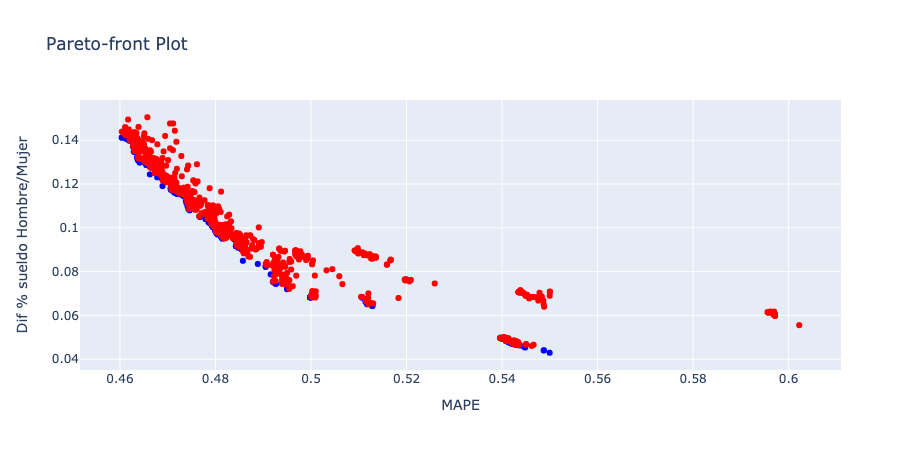

In [56]:
fig = optuna.visualization.plot_pareto_front(study, target_names=["MAPE", "Dif % sueldo Hombre/Mujer"])
fig.show()

In [62]:
%%time
def objective(trial):
    
    sexo_feature_contri = trial.suggest_uniform('sexo_feature_contri', 1e-8, 1.1)
    feature_contri = np.ones(len(features))
    feature_contri[features.index('sexo')] = sexo_feature_contri
    
    model_params = {
        "objective": "regression",
        "metric": ["mape", "mae"],
        "verbosity": -1,
        "boosting_type": "gbdt",                
        'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
        'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
        'num_leaves': trial.suggest_int('num_leaves', 2, 512),
        'feature_fraction': trial.suggest_uniform('feature_fraction', 0.1, 1.0),
        'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.1, 1.0),
        'bagging_freq': trial.suggest_int('bagging_freq', 0, 15),
        'min_child_samples': trial.suggest_int('min_child_samples', 1, 100),
        'seed': 1312,
        'feature_contri': feature_contri
    }
    
    return multi_obj(model_params)


study = optuna.create_study(directions=['minimize', 'minimize'])
study.optimize(objective, n_trials=2000)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:24: FutureWarning:

create_study has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:26:17,420] A new study created in memory with name: no-name-f44efea1-0819-4431-a0ed-2da421905e78
/opt/conda/lib/python3.7/site-packages/lightgbm/basic.py:1551: UserWarning:

Using categorical_feature in Dataset.



[LightGBM] [Warning] lambda_l1 is set=0.2959171188549083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2959171188549083
[LightGBM] [Warning] bagging_fraction is set=0.507492158974513, subsample=1.0 will be ignored. Current value: bagging_fraction=0.507492158974513
[LightGBM] [Warning] lambda_l2 is set=0.0009123007492473633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0009123007492473633
[LightGBM] [Warning] bagging_freq is set=15, subsample_freq=0 will be ignored. Current value: bagging_freq=15
[LightGBM] [Warning] feature_fraction is set=0.5050672037946474, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5050672037946474


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:26:19,217] Trial 0 finished with values: [0.44925724020293384, 0.23748888613753866] with parameters: {'sexo_feature_contri': 0.5721085861384175, 'lambda_l1': 0.2959171188549083, 'lambda_l2': 0.0009123007492473633, 'num_leaves': 303, 'feature_fraction': 0.5050672037946474, 'bagging_fraction': 0.507492158974513, 'bagging_freq': 15, 'min_child_samples': 47}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=2.957653920119223e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.957653920119223e-05
[LightGBM] [Warning] bagging_fraction is set=0.543588977540614, subsample=1.0 will be ignored. Current value: bagging_fraction=0.543588977540614
[LightGBM] [Warning] lambda_l2 is set=0.007252027155001774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007252027155001774
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.32668524682233263, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.32668524682233263


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:26:21,026] Trial 1 finished with values: [0.4503346018619832, 0.2526058069729676] with parameters: {'sexo_feature_contri': 0.21990854871075952, 'lambda_l1': 2.957653920119223e-05, 'lambda_l2': 0.007252027155001774, 'num_leaves': 214, 'feature_fraction': 0.32668524682233263, 'bagging_fraction': 0.543588977540614, 'bagging_freq': 0, 'min_child_samples': 87}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=4.677202835298686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.677202835298686
[LightGBM] [Warning] bagging_fraction is set=0.98440524413558, subsample=1.0 will be ignored. Current value: bagging_fraction=0.98440524413558
[LightGBM] [Warning] lambda_l2 is set=1.1367669311963242e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1367669311963242e-07
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13
[LightGBM] [Warning] feature_fraction is set=0.3009753729072032, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3009753729072032


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:26:22,839] Trial 2 finished with values: [0.4497209121796861, 0.265004407405629] with parameters: {'sexo_feature_contri': 0.7868237028776908, 'lambda_l1': 4.677202835298686, 'lambda_l2': 1.1367669311963242e-07, 'num_leaves': 313, 'feature_fraction': 0.3009753729072032, 'bagging_fraction': 0.98440524413558, 'bagging_freq': 13, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sampl

[LightGBM] [Warning] lambda_l1 is set=0.005521310232248456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005521310232248456
[LightGBM] [Warning] bagging_fraction is set=0.17943422881311197, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17943422881311197
[LightGBM] [Warning] lambda_l2 is set=0.009094629543531713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009094629543531713
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.38319877206496844, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.38319877206496844


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:26:24,277] Trial 3 finished with values: [0.45948605419171806, 0.14949779147456793] with parameters: {'sexo_feature_contri': 0.10654343046911453, 'lambda_l1': 0.005521310232248456, 'lambda_l2': 0.009094629543531713, 'num_leaves': 262, 'feature_fraction': 0.38319877206496844, 'bagging_fraction': 0.17943422881311197, 'bagging_freq': 3, 'min_child_samples': 79}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=6.661037854750442e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.661037854750442e-07
[LightGBM] [Warning] bagging_fraction is set=0.251020865610601, subsample=1.0 will be ignored. Current value: bagging_fraction=0.251020865610601
[LightGBM] [Warning] lambda_l2 is set=0.170604912614771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.170604912614771
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.2953828526083713, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2953828526083713


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:26:25,752] Trial 4 finished with values: [0.4630638214803237, 0.2714558138270693] with parameters: {'sexo_feature_contri': 0.13489803896868424, 'lambda_l1': 6.661037854750442e-07, 'lambda_l2': 0.170604912614771, 'num_leaves': 86, 'feature_fraction': 0.2953828526083713, 'bagging_fraction': 0.251020865610601, 'bagging_freq': 5, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sample

[LightGBM] [Warning] lambda_l1 is set=6.045938235099005e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.045938235099005e-08
[LightGBM] [Warning] bagging_fraction is set=0.6555310528690007, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6555310528690007
[LightGBM] [Warning] lambda_l2 is set=0.00012263110041530232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00012263110041530232
[LightGBM] [Warning] bagging_freq is set=15, subsample_freq=0 will be ignored. Current value: bagging_freq=15
[LightGBM] [Warning] feature_fraction is set=0.5170321038882362, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5170321038882362


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:26:27,767] Trial 5 finished with values: [0.4489652112081346, 0.25921759634624686] with parameters: {'sexo_feature_contri': 0.9401686219133059, 'lambda_l1': 6.045938235099005e-08, 'lambda_l2': 0.00012263110041530232, 'num_leaves': 499, 'feature_fraction': 0.5170321038882362, 'bagging_fraction': 0.6555310528690007, 'bagging_freq': 15, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.00022575135642433856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00022575135642433856
[LightGBM] [Warning] bagging_fraction is set=0.5503876172224297, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5503876172224297
[LightGBM] [Warning] lambda_l2 is set=4.6987849107262164e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6987849107262164e-07
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.6752141023442424, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6752141023442424


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:26:29,416] Trial 6 finished with values: [0.44911706948826435, 0.25589997945048665] with parameters: {'sexo_feature_contri': 0.7384664104323907, 'lambda_l1': 0.00022575135642433856, 'lambda_l2': 4.6987849107262164e-07, 'num_leaves': 71, 'feature_fraction': 0.6752141023442424, 'bagging_fraction': 0.5503876172224297, 'bagging_freq': 5, 'min_child_samples': 64}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=1.7270173722467056e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7270173722467056e-06
[LightGBM] [Warning] bagging_fraction is set=0.3026931054742369, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3026931054742369
[LightGBM] [Warning] lambda_l2 is set=5.5429102780164445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5429102780164445
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.1178883646112213, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1178883646112213


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:26:30,790] Trial 7 finished with values: [0.48555094913972763, 0.2690728662182655] with parameters: {'sexo_feature_contri': 0.7547433330903563, 'lambda_l1': 1.7270173722467056e-06, 'lambda_l2': 5.5429102780164445, 'num_leaves': 468, 'feature_fraction': 0.1178883646112213, 'bagging_fraction': 0.3026931054742369, 'bagging_freq': 0, 'min_child_samples': 63}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=0.14394396110407642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14394396110407642
[LightGBM] [Warning] bagging_fraction is set=0.5698470774178109, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5698470774178109
[LightGBM] [Warning] lambda_l2 is set=2.7219852923916937e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7219852923916937e-05
[LightGBM] [Warning] bagging_freq is set=15, subsample_freq=0 will be ignored. Current value: bagging_freq=15
[LightGBM] [Warning] feature_fraction is set=0.1517814524678187, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1517814524678187


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:26:32,212] Trial 8 finished with values: [0.4869228573678719, 0.2689644045305805] with parameters: {'sexo_feature_contri': 0.569618604716396, 'lambda_l1': 0.14394396110407642, 'lambda_l2': 2.7219852923916937e-05, 'num_leaves': 370, 'feature_fraction': 0.1517814524678187, 'bagging_fraction': 0.5698470774178109, 'bagging_freq': 15, 'min_child_samples': 1}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=2.333920461087599e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.333920461087599e-06
[LightGBM] [Warning] bagging_fraction is set=0.34847946410026553, subsample=1.0 will be ignored. Current value: bagging_fraction=0.34847946410026553
[LightGBM] [Warning] lambda_l2 is set=5.157606949706867e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.157606949706867e-07
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:26:34,398] Trial 9 finished with values: [0.4733759446998112, 0.16440636913438003] with parameters: {'sexo_feature_contri': 0.17369972515477805, 'lambda_l1': 2.333920461087599e-06, 'lambda_l2': 5.157606949706867e-07, 'num_leaves': 292, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.34847946410026553, 'bagging_freq': 13, 'min_child_samples': 24}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=8.296311165558636e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.296311165558636e-07
[LightGBM] [Warning] bagging_fraction is set=0.6434370269297347, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6434370269297347
[LightGBM] [Warning] lambda_l2 is set=1.9539576838206537e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9539576838206537e-07
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.5573116485503233, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5573116485503233


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:26:36,332] Trial 10 finished with values: [0.4486417067673754, 0.2621381677935865] with parameters: {'sexo_feature_contri': 0.8433225894163685, 'lambda_l1': 8.296311165558636e-07, 'lambda_l2': 1.9539576838206537e-07, 'num_leaves': 214, 'feature_fraction': 0.5573116485503233, 'bagging_fraction': 0.6434370269297347, 'bagging_freq': 10, 'min_child_samples': 67}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.0008315529293280822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008315529293280822
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=0.20304014914490212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20304014914490212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.40845067156343107, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.40845067156343107


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:26:38,550] Trial 11 finished with values: [0.44220160942737324, 0.2571430886361114] with parameters: {'sexo_feature_contri': 0.8386121947414877, 'lambda_l1': 0.0008315529293280822, 'lambda_l2': 0.20304014914490212, 'num_leaves': 306, 'feature_fraction': 0.40845067156343107, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 1, 'min_child_samples': 39}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:26:41,086] Trial 12 finished with values: [0.4556472421652215, 0.08065332841507894] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 344, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 7, 'min_child_samples': 12}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=2.7682411466839993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7682411466839993
[LightGBM] [Warning] bagging_fraction is set=0.36650197768648307, subsample=1.0 will be ignored. Current value: bagging_fraction=0.36650197768648307
[LightGBM] [Warning] lambda_l2 is set=5.603583274761786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.603583274761786
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.8632289595652713, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8632289595652713


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:26:42,741] Trial 13 finished with values: [0.4539556756437422, 0.19537986721060355] with parameters: {'sexo_feature_contri': 0.19020441580168312, 'lambda_l1': 2.7682411466839993, 'lambda_l2': 5.603583274761786, 'num_leaves': 96, 'feature_fraction': 0.8632289595652713, 'bagging_fraction': 0.36650197768648307, 'bagging_freq': 11, 'min_child_samples': 27}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sam

[LightGBM] [Warning] lambda_l1 is set=0.10681239132050939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10681239132050939
[LightGBM] [Warning] bagging_fraction is set=0.753884958707944, subsample=1.0 will be ignored. Current value: bagging_fraction=0.753884958707944
[LightGBM] [Warning] lambda_l2 is set=6.06456497485561e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.06456497485561e-05
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.5425801342585658, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5425801342585658


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:26:45,584] Trial 14 finished with values: [0.44473056584955384, 0.263393360893511] with parameters: {'sexo_feature_contri': 0.7646514609125301, 'lambda_l1': 0.10681239132050939, 'lambda_l2': 6.06456497485561e-05, 'num_leaves': 509, 'feature_fraction': 0.5425801342585658, 'bagging_fraction': 0.753884958707944, 'bagging_freq': 9, 'min_child_samples': 27}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sam

[LightGBM] [Warning] lambda_l1 is set=1.1333291610314018e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1333291610314018e-07
[LightGBM] [Warning] bagging_fraction is set=0.38749908289359947, subsample=1.0 will be ignored. Current value: bagging_fraction=0.38749908289359947
[LightGBM] [Warning] lambda_l2 is set=2.228308425294425e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.228308425294425e-08
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.16976321813518802, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16976321813518802


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:26:47,051] Trial 15 finished with values: [0.47032612206823515, 0.22897336125988574] with parameters: {'sexo_feature_contri': 0.5182219564200733, 'lambda_l1': 1.1333291610314018e-07, 'lambda_l2': 2.228308425294425e-08, 'num_leaves': 367, 'feature_fraction': 0.16976321813518802, 'bagging_fraction': 0.38749908289359947, 'bagging_freq': 5, 'min_child_samples': 40}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.7833101621076477, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7833101621076477
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:26:49,343] Trial 16 finished with values: [0.44078471020022375, 0.13949270914285553] with parameters: {'sexo_feature_contri': 0.028550146381394557, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 8.01674427602107, 'num_leaves': 265, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.7833101621076477, 'bagging_freq': 9, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.5267886349561329, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5267886349561329
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.7082273803224489, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7082273803224489


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:26:51,325] Trial 17 finished with values: [0.45702451503974223, 0.003668430087344314] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 0.049612105286993134, 'num_leaves': 177, 'feature_fraction': 0.7082273803224489, 'bagging_fraction': 0.5267886349561329, 'bagging_freq': 2, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=6.006739226702004e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.006739226702004e-08
[LightGBM] [Warning] bagging_fraction is set=0.826391205793929, subsample=1.0 will be ignored. Current value: bagging_fraction=0.826391205793929
[LightGBM] [Warning] lambda_l2 is set=0.00014570092474035408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00014570092474035408
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.9274756188390662, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9274756188390662


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:26:53,351] Trial 18 finished with values: [0.4456824625934678, 0.26866672374306566] with parameters: {'sexo_feature_contri': 0.9752635111731184, 'lambda_l1': 6.006739226702004e-08, 'lambda_l2': 0.00014570092474035408, 'num_leaves': 155, 'feature_fraction': 0.9274756188390662, 'bagging_fraction': 0.826391205793929, 'bagging_freq': 3, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=1.3441621712832372e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3441621712832372e-05
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=2.6735312549083752e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6735312549083752e-05
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.8304571960843513, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8304571960843513


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:26:54,950] Trial 19 finished with values: [0.443028380348968, 0.22275033506440886] with parameters: {'sexo_feature_contri': 0.329654483691133, 'lambda_l1': 1.3441621712832372e-05, 'lambda_l2': 2.6735312549083752e-05, 'num_leaves': 64, 'feature_fraction': 0.8304571960843513, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 7, 'min_child_samples': 22}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.00011032151298036847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00011032151298036847
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=0.0001680920532587289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001680920532587289
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.949624517982365, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.949624517982365


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:26:57,783] Trial 20 finished with values: [0.44018829561319467, 0.18597068113683485] with parameters: {'sexo_feature_contri': 0.08475805805503962, 'lambda_l1': 0.00011032151298036847, 'lambda_l2': 0.0001680920532587289, 'num_leaves': 438, 'feature_fraction': 0.949624517982365, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 0, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=2.857351222268565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.857351222268565
[LightGBM] [Warning] bagging_fraction is set=0.49829111133895376, subsample=1.0 will be ignored. Current value: bagging_fraction=0.49829111133895376
[LightGBM] [Warning] lambda_l2 is set=0.5283273836698494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5283273836698494
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.9114113385913853, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9114113385913853


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:26:59,472] Trial 21 finished with values: [0.4605860160449857, 0.24042349895330054] with parameters: {'sexo_feature_contri': 0.7292480145315069, 'lambda_l1': 2.857351222268565, 'lambda_l2': 0.5283273836698494, 'num_leaves': 281, 'feature_fraction': 0.9114113385913853, 'bagging_fraction': 0.49829111133895376, 'bagging_freq': 2, 'min_child_samples': 77}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samp

[LightGBM] [Warning] lambda_l1 is set=6.325550927574677e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.325550927574677e-05
[LightGBM] [Warning] bagging_fraction is set=0.181167761117763, subsample=1.0 will be ignored. Current value: bagging_fraction=0.181167761117763
[LightGBM] [Warning] lambda_l2 is set=0.5557302978498686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5557302978498686
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13
[LightGBM] [Warning] feature_fraction is set=0.9475696488941813, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9475696488941813


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:27:00,838] Trial 22 finished with values: [0.4736222807565814, 0.1990493356606829] with parameters: {'sexo_feature_contri': 0.568821052824179, 'lambda_l1': 6.325550927574677e-05, 'lambda_l2': 0.5557302978498686, 'num_leaves': 176, 'feature_fraction': 0.9475696488941813, 'bagging_fraction': 0.181167761117763, 'bagging_freq': 13, 'min_child_samples': 80}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sam

[LightGBM] [Warning] lambda_l1 is set=1.989344769991182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.989344769991182
[LightGBM] [Warning] bagging_fraction is set=0.8376973614610738, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8376973614610738
[LightGBM] [Warning] lambda_l2 is set=1.4330404031908685e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4330404031908685e-06
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.9077024243276303, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9077024243276303


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:27:03,002] Trial 23 finished with values: [0.4433455175097122, 0.17998764165887082] with parameters: {'sexo_feature_contri': 0.09473566282845142, 'lambda_l1': 1.989344769991182, 'lambda_l2': 1.4330404031908685e-06, 'num_leaves': 280, 'feature_fraction': 0.9077024243276303, 'bagging_fraction': 0.8376973614610738, 'bagging_freq': 9, 'min_child_samples': 61}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=0.9926423437856157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9926423437856157
[LightGBM] [Warning] bagging_fraction is set=0.4980646102786951, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4980646102786951
[LightGBM] [Warning] lambda_l2 is set=9.21643346103061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.21643346103061
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.1056296129147102, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1056296129147102


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:27:04,279] Trial 24 finished with values: [0.4862827523783306, 0.269350919332757] with parameters: {'sexo_feature_contri': 0.6309044268523986, 'lambda_l1': 0.9926423437856157, 'lambda_l2': 9.21643346103061, 'num_leaves': 108, 'feature_fraction': 0.1056296129147102, 'bagging_fraction': 0.4980646102786951, 'bagging_freq': 0, 'min_child_samples': 88}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers

[LightGBM] [Warning] lambda_l1 is set=1.5677418183774316e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5677418183774316e-08
[LightGBM] [Warning] bagging_fraction is set=0.8897025438496167, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8897025438496167
[LightGBM] [Warning] lambda_l2 is set=0.07658673560398044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07658673560398044
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.5044503058731574, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5044503058731574


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:27:06,083] Trial 25 finished with values: [0.4411730944252314, 0.235365666117801] with parameters: {'sexo_feature_contri': 0.41666765587956284, 'lambda_l1': 1.5677418183774316e-08, 'lambda_l2': 0.07658673560398044, 'num_leaves': 108, 'feature_fraction': 0.5044503058731574, 'bagging_fraction': 0.8897025438496167, 'bagging_freq': 11, 'min_child_samples': 66}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=1.0646900781628087e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0646900781628087e-07
[LightGBM] [Warning] bagging_fraction is set=0.2614394472030954, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2614394472030954
[LightGBM] [Warning] lambda_l2 is set=3.3158519415583583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3158519415583583
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.7132723545016554, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7132723545016554


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:27:08,273] Trial 26 finished with values: [0.477609050143347, 0.2726863087520657] with parameters: {'sexo_feature_contri': 1.057951563817578, 'lambda_l1': 1.0646900781628087e-07, 'lambda_l2': 3.3158519415583583, 'num_leaves': 267, 'feature_fraction': 0.7132723545016554, 'bagging_fraction': 0.2614394472030954, 'bagging_freq': 4, 'min_child_samples': 6}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samp

[LightGBM] [Warning] lambda_l1 is set=0.0012141800989041672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0012141800989041672
[LightGBM] [Warning] bagging_fraction is set=0.891326795383772, subsample=1.0 will be ignored. Current value: bagging_fraction=0.891326795383772
[LightGBM] [Warning] lambda_l2 is set=8.785746383181356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.785746383181356
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12
[LightGBM] [Warning] feature_fraction is set=0.19530497192892732, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.19530497192892732


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:27:09,832] Trial 27 finished with values: [0.46347111238023214, 0.22327340590104322] with parameters: {'sexo_feature_contri': 0.31086056911727517, 'lambda_l1': 0.0012141800989041672, 'lambda_l2': 8.785746383181356, 'num_leaves': 301, 'feature_fraction': 0.19530497192892732, 'bagging_fraction': 0.891326795383772, 'bagging_freq': 12, 'min_child_samples': 60}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=1.300394164785371e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.300394164785371e-07
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.0007172890248954677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0007172890248954677
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.20034471784151875, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.20034471784151875


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:27:11,569] Trial 28 finished with values: [0.4632906956521532, 0.22531797314390725] with parameters: {'sexo_feature_contri': 0.3018904981193102, 'lambda_l1': 1.300394164785371e-07, 'lambda_l2': 0.0007172890248954677, 'num_leaves': 383, 'feature_fraction': 0.20034471784151875, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 11, 'min_child_samples': 36}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.018122354065810413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.018122354065810413
[LightGBM] [Warning] bagging_fraction is set=0.7292105269977187, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7292105269977187
[LightGBM] [Warning] lambda_l2 is set=0.010665423638649932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010665423638649932
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.4122634005549217, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4122634005549217


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:27:13,735] Trial 29 finished with values: [0.4493258166846486, 0.2494009164654326] with parameters: {'sexo_feature_contri': 0.6356732883389742, 'lambda_l1': 0.018122354065810413, 'lambda_l2': 0.010665423638649932, 'num_leaves': 480, 'feature_fraction': 0.4122634005549217, 'bagging_fraction': 0.7292105269977187, 'bagging_freq': 6, 'min_child_samples': 48}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=9.402773382270913e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.402773382270913e-06
[LightGBM] [Warning] bagging_fraction is set=0.1961180653804256, subsample=1.0 will be ignored. Current value: bagging_fraction=0.1961180653804256
[LightGBM] [Warning] lambda_l2 is set=7.92070798937595e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.92070798937595e-06
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.19877445953472117, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.19877445953472117


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:27:15,192] Trial 30 finished with values: [0.46922290977348297, 0.22246514408090212] with parameters: {'sexo_feature_contri': 0.26018475804535585, 'lambda_l1': 9.402773382270913e-06, 'lambda_l2': 7.92070798937595e-06, 'num_leaves': 235, 'feature_fraction': 0.19877445953472117, 'bagging_fraction': 0.1961180653804256, 'bagging_freq': 11, 'min_child_samples': 11}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6022979016453692, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6022979016453692


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:27:17,184] Trial 31 finished with values: [0.43864546200051807, 0.28517203846707] with parameters: {'sexo_feature_contri': 0.9720264971036892, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 208, 'feature_fraction': 0.6022979016453692, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.9735361945305094, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9735361945305094
[LightGBM] [Warning] lambda_l2 is set=3.0827460712719285e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0827460712719285e-05
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14
[LightGBM] [Warning] feature_fraction is set=0.8139711838474556, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8139711838474556


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:27:19,578] Trial 32 finished with values: [0.44257226525642507, 0.2734297671431877] with parameters: {'sexo_feature_contri': 0.812218870243645, 'lambda_l1': 0.561864402610361, 'lambda_l2': 3.0827460712719285e-05, 'num_leaves': 261, 'feature_fraction': 0.8139711838474556, 'bagging_fraction': 0.9735361945305094, 'bagging_freq': 14, 'min_child_samples': 31}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=1.3057706495169434e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3057706495169434e-06
[LightGBM] [Warning] bagging_fraction is set=0.3972488246971143, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3972488246971143
[LightGBM] [Warning] lambda_l2 is set=1.8892026367938493e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8892026367938493e-08
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12
[LightGBM] [Warning] feature_fraction is set=0.20080081797162774, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.20080081797162774


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:27:20,989] Trial 33 finished with values: [0.46494730581222604, 0.2349345712183217] with parameters: {'sexo_feature_contri': 0.7522707640743365, 'lambda_l1': 1.3057706495169434e-06, 'lambda_l2': 1.8892026367938493e-08, 'num_leaves': 310, 'feature_fraction': 0.20080081797162774, 'bagging_fraction': 0.3972488246971143, 'bagging_freq': 12, 'min_child_samples': 61}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=2.85827545485448e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.85827545485448e-08
[LightGBM] [Warning] bagging_fraction is set=0.15156232885267987, subsample=1.0 will be ignored. Current value: bagging_fraction=0.15156232885267987
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:27:22,291] Trial 34 finished with values: [0.4478637450105148, 0.24960700172340375] with parameters: {'sexo_feature_contri': 0.4932263979174713, 'lambda_l1': 2.85827545485448e-08, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 18, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.15156232885267987, 'bagging_freq': 0, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=3.594955743263553e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.594955743263553e-06
[LightGBM] [Warning] bagging_fraction is set=0.3060872846189369, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3060872846189369
[LightGBM] [Warning] lambda_l2 is set=2.1470519979944336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1470519979944336
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.31549179170867125, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.31549179170867125


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:27:23,792] Trial 35 finished with values: [0.45729088340894436, 0.20923854099213243] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 3.594955743263553e-06, 'lambda_l2': 2.1470519979944336, 'num_leaves': 131, 'feature_fraction': 0.31549179170867125, 'bagging_fraction': 0.3060872846189369, 'bagging_freq': 3, 'min_child_samples': 61}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.0005602212249559743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005602212249559743
[LightGBM] [Warning] bagging_fraction is set=0.28836031130817885, subsample=1.0 will be ignored. Current value: bagging_fraction=0.28836031130817885
[LightGBM] [Warning] lambda_l2 is set=8.361851463147779e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.361851463147779e-08
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6527245194714782, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6527245194714782


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:27:25,383] Trial 36 finished with values: [0.4594508475020499, 0.2564185127649857] with parameters: {'sexo_feature_contri': 1.0676995598059313, 'lambda_l1': 0.0005602212249559743, 'lambda_l2': 8.361851463147779e-08, 'num_leaves': 235, 'feature_fraction': 0.6527245194714782, 'bagging_fraction': 0.28836031130817885, 'bagging_freq': 4, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.568670264580888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.568670264580888
[LightGBM] [Warning] bagging_fraction is set=0.4064897128584778, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4064897128584778
[LightGBM] [Warning] lambda_l2 is set=1.8970359647690542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8970359647690542
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.7781869559538585, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7781869559538585


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:27:28,244] Trial 37 finished with values: [0.4718397086113618, 0.26330229954987294] with parameters: {'sexo_feature_contri': 0.7685157094895944, 'lambda_l1': 0.568670264580888, 'lambda_l2': 1.8970359647690542, 'num_leaves': 510, 'feature_fraction': 0.7781869559538585, 'bagging_fraction': 0.4064897128584778, 'bagging_freq': 4, 'min_child_samples': 11}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sampl

[LightGBM] [Warning] lambda_l1 is set=0.00038818773730742493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00038818773730742493
[LightGBM] [Warning] bagging_fraction is set=0.2706192517873808, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2706192517873808
[LightGBM] [Warning] lambda_l2 is set=1.4731319137322907e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4731319137322907e-05
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12
[LightGBM] [Warning] feature_fraction is set=0.5181518603358978, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5181518603358978


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:27:31,073] Trial 38 finished with values: [0.4743144452879434, 0.28090472649413667] with parameters: {'sexo_feature_contri': 0.8668536071896352, 'lambda_l1': 0.00038818773730742493, 'lambda_l2': 1.4731319137322907e-05, 'num_leaves': 498, 'feature_fraction': 0.5181518603358978, 'bagging_fraction': 0.2706192517873808, 'bagging_freq': 12, 'min_child_samples': 2}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=5.090049078865125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.090049078865125
[LightGBM] [Warning] bagging_fraction is set=0.28489163261979955, subsample=1.0 will be ignored. Current value: bagging_fraction=0.28489163261979955
[LightGBM] [Warning] lambda_l2 is set=0.0002032281566688383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002032281566688383
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.2312422767328657, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2312422767328657


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:27:32,374] Trial 39 finished with values: [0.4663490783079948, 0.21495687035737254] with parameters: {'sexo_feature_contri': 0.10646412700151416, 'lambda_l1': 5.090049078865125, 'lambda_l2': 0.0002032281566688383, 'num_leaves': 43, 'feature_fraction': 0.2312422767328657, 'bagging_fraction': 0.28489163261979955, 'bagging_freq': 3, 'min_child_samples': 2}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=0.18693928763870807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18693928763870807
[LightGBM] [Warning] bagging_fraction is set=0.6306686956660137, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6306686956660137
[LightGBM] [Warning] lambda_l2 is set=2.0931637906064035e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0931637906064035e-05
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12
[LightGBM] [Warning] feature_fraction is set=0.8786630113869713, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8786630113869713


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:27:34,494] Trial 40 finished with values: [0.45837966472854547, 0.19935363115807928] with parameters: {'sexo_feature_contri': 0.19894864393471628, 'lambda_l1': 0.18693928763870807, 'lambda_l2': 2.0931637906064035e-05, 'num_leaves': 493, 'feature_fraction': 0.8786630113869713, 'bagging_fraction': 0.6306686956660137, 'bagging_freq': 12, 'min_child_samples': 52}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=7.429547688090153e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.429547688090153e-07
[LightGBM] [Warning] bagging_fraction is set=0.735734553574509, subsample=1.0 will be ignored. Current value: bagging_fraction=0.735734553574509
[LightGBM] [Warning] lambda_l2 is set=4.956755978057736e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.956755978057736e-07
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.7312088666561607, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7312088666561607


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:27:37,144] Trial 41 finished with values: [0.44246152412373063, 0.2663864297869097] with parameters: {'sexo_feature_contri': 0.7862713536665028, 'lambda_l1': 7.429547688090153e-07, 'lambda_l2': 4.956755978057736e-07, 'num_leaves': 480, 'feature_fraction': 0.7312088666561607, 'bagging_fraction': 0.735734553574509, 'bagging_freq': 6, 'min_child_samples': 35}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.011085929670729862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011085929670729862
[LightGBM] [Warning] bagging_fraction is set=0.2014102450793433, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2014102450793433
[LightGBM] [Warning] lambda_l2 is set=0.10944374509166309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10944374509166309
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.5579970690582196, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5579970690582196


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:27:38,500] Trial 42 finished with values: [0.45916524533491715, 0.2652201091070945] with parameters: {'sexo_feature_contri': 1.0179147846143768, 'lambda_l1': 0.011085929670729862, 'lambda_l2': 0.10944374509166309, 'num_leaves': 29, 'feature_fraction': 0.5579970690582196, 'bagging_fraction': 0.2014102450793433, 'bagging_freq': 9, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sam

[LightGBM] [Warning] lambda_l1 is set=0.0002368325311315864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002368325311315864
[LightGBM] [Warning] bagging_fraction is set=0.9956234387155658, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9956234387155658
[LightGBM] [Warning] lambda_l2 is set=4.552628720143146e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.552628720143146e-06
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14
[LightGBM] [Warning] feature_fraction is set=0.14828554334475658, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.14828554334475658


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:27:39,905] Trial 43 finished with values: [0.48598829985107067, 0.27170010857193766] with parameters: {'sexo_feature_contri': 1.0439718965977025, 'lambda_l1': 0.0002368325311315864, 'lambda_l2': 4.552628720143146e-06, 'num_leaves': 233, 'feature_fraction': 0.14828554334475658, 'bagging_fraction': 0.9956234387155658, 'bagging_freq': 14, 'min_child_samples': 45}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=3.9508792451483803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9508792451483803
[LightGBM] [Warning] bagging_fraction is set=0.7649292486557973, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7649292486557973
[LightGBM] [Warning] lambda_l2 is set=3.193794750561452e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.193794750561452e-08
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.9886237555047855, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9886237555047855


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:27:41,749] Trial 44 finished with values: [0.452045660443675, 0.19792818542497614] with parameters: {'sexo_feature_contri': 0.14370164354375767, 'lambda_l1': 3.9508792451483803, 'lambda_l2': 3.193794750561452e-08, 'num_leaves': 341, 'feature_fraction': 0.9886237555047855, 'bagging_fraction': 0.7649292486557973, 'bagging_freq': 10, 'min_child_samples': 98}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=2.7062207872629465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7062207872629465
[LightGBM] [Warning] bagging_fraction is set=0.7958881598558675, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7958881598558675
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:27:43,556] Trial 45 finished with values: [0.44219322770230124, 0.20794672420667068] with parameters: {'sexo_feature_contri': 0.1607563532864973, 'lambda_l1': 2.7062207872629465, 'lambda_l2': 0.5405076851228374, 'num_leaves': 487, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7958881598558675, 'bagging_freq': 1, 'min_child_samples': 62}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sam

[LightGBM] [Warning] lambda_l1 is set=1.277795965558731e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.277795965558731e-07
[LightGBM] [Warning] bagging_fraction is set=0.3427962721198168, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3427962721198168
[LightGBM] [Warning] lambda_l2 is set=3.3151862504127725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3151862504127725
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13
[LightGBM] [Warning] feature_fraction is set=0.9868478646237945, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9868478646237945


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:27:45,030] Trial 46 finished with values: [0.4602637590214972, 0.25528908508935644] with parameters: {'sexo_feature_contri': 1.0247949448279754, 'lambda_l1': 1.277795965558731e-07, 'lambda_l2': 3.3151862504127725, 'num_leaves': 46, 'feature_fraction': 0.9868478646237945, 'bagging_fraction': 0.3427962721198168, 'bagging_freq': 13, 'min_child_samples': 53}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=0.847400090320883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.847400090320883
[LightGBM] [Warning] bagging_fraction is set=0.39757327493685246, subsample=1.0 will be ignored. Current value: bagging_fraction=0.39757327493685246
[LightGBM] [Warning] lambda_l2 is set=9.918713620324901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.918713620324901
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.6350784697894903, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6350784697894903


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:27:46,642] Trial 47 finished with values: [0.4509134201858647, 0.2498715083368973] with parameters: {'sexo_feature_contri': 0.746971894914777, 'lambda_l1': 0.847400090320883, 'lambda_l2': 9.918713620324901, 'num_leaves': 137, 'feature_fraction': 0.6350784697894903, 'bagging_fraction': 0.39757327493685246, 'bagging_freq': 5, 'min_child_samples': 67}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sampler

[LightGBM] [Warning] lambda_l1 is set=5.490752094584469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.490752094584469
[LightGBM] [Warning] bagging_fraction is set=0.3605515109722085, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3605515109722085
[LightGBM] [Warning] lambda_l2 is set=3.3696792251727784e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3696792251727784e-07
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13
[LightGBM] [Warning] feature_fraction is set=0.268400760496904, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.268400760496904


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:27:47,975] Trial 48 finished with values: [0.46281075209793027, 0.26859830497292625] with parameters: {'sexo_feature_contri': 0.9462675749764201, 'lambda_l1': 5.490752094584469, 'lambda_l2': 3.3696792251727784e-07, 'num_leaves': 132, 'feature_fraction': 0.268400760496904, 'bagging_fraction': 0.3605515109722085, 'bagging_freq': 13, 'min_child_samples': 72}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=0.00024358620561381353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00024358620561381353
[LightGBM] [Warning] bagging_fraction is set=0.40188132040748226, subsample=1.0 will be ignored. Current value: bagging_fraction=0.40188132040748226
[LightGBM] [Warning] lambda_l2 is set=2.8653345315532933e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8653345315532933e-06
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13
[LightGBM] [Warning] feature_fraction is set=0.9884026517326383, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9884026517326383


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:27:50,197] Trial 49 finished with values: [0.4641112943164974, 0.2575565581901035] with parameters: {'sexo_feature_contri': 0.7405010142752302, 'lambda_l1': 0.00024358620561381353, 'lambda_l2': 2.8653345315532933e-06, 'num_leaves': 402, 'feature_fraction': 0.9884026517326383, 'bagging_fraction': 0.40188132040748226, 'bagging_freq': 13, 'min_child_samples': 28}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=0.0008315529293280822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008315529293280822
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=2.1470519979944336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1470519979944336
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.40845067156343107, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.40845067156343107


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:27:52,042] Trial 50 finished with values: [0.4411170578354648, 0.2676657868761285] with parameters: {'sexo_feature_contri': 0.8386121947414877, 'lambda_l1': 0.0008315529293280822, 'lambda_l2': 2.1470519979944336, 'num_leaves': 131, 'feature_fraction': 0.40845067156343107, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 3, 'min_child_samples': 39}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=0.0005602212249559743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0005602212249559743
[LightGBM] [Warning] bagging_fraction is set=0.4127853891558373, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4127853891558373
[LightGBM] [Warning] lambda_l2 is set=0.0009123007492473633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0009123007492473633
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.5050672037946474, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5050672037946474


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:27:53,770] Trial 51 finished with values: [0.44796921408127044, 0.2775802931289622] with parameters: {'sexo_feature_contri': 1.0676995598059313, 'lambda_l1': 0.0005602212249559743, 'lambda_l2': 0.0009123007492473633, 'num_leaves': 303, 'feature_fraction': 0.5050672037946474, 'bagging_fraction': 0.4127853891558373, 'bagging_freq': 4, 'min_child_samples': 63}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.00022575135642433856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00022575135642433856
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=4.6987849107262164e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6987849107262164e-07
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.6752141023442424, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6752141023442424


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:27:55,388] Trial 52 finished with values: [0.44378622717084537, 0.22870236142480824] with parameters: {'sexo_feature_contri': 0.329654483691133, 'lambda_l1': 0.00022575135642433856, 'lambda_l2': 4.6987849107262164e-07, 'num_leaves': 71, 'feature_fraction': 0.6752141023442424, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 7, 'min_child_samples': 16}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=2.333920461087599e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.333920461087599e-06
[LightGBM] [Warning] bagging_fraction is set=0.34847946410026553, subsample=1.0 will be ignored. Current value: bagging_fraction=0.34847946410026553
[LightGBM] [Warning] lambda_l2 is set=5.157606949706867e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.157606949706867e-07
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:27:57,583] Trial 53 finished with values: [0.4733759446998112, 0.16440636913438003] with parameters: {'sexo_feature_contri': 0.17369972515477805, 'lambda_l1': 2.333920461087599e-06, 'lambda_l2': 5.157606949706867e-07, 'num_leaves': 292, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.34847946410026553, 'bagging_freq': 13, 'min_child_samples': 24}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=2.3953945511297548e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3953945511297548e-05
[LightGBM] [Warning] bagging_fraction is set=0.40188132040748226, subsample=1.0 will be ignored. Current value: bagging_fraction=0.40188132040748226
[LightGBM] [Warning] lambda_l2 is set=2.8653345315532933e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8653345315532933e-06
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13
[LightGBM] [Warning] feature_fraction is set=0.9884026517326383, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9884026517326383


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:27:59,247] Trial 54 finished with values: [0.4711953885163783, 0.23995375776927957] with parameters: {'sexo_feature_contri': 0.7405010142752302, 'lambda_l1': 2.3953945511297548e-05, 'lambda_l2': 2.8653345315532933e-06, 'num_leaves': 402, 'feature_fraction': 0.9884026517326383, 'bagging_fraction': 0.40188132040748226, 'bagging_freq': 13, 'min_child_samples': 87}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=1.300394164785371e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.300394164785371e-07
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.0007172890248954677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0007172890248954677
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.20034471784151875, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.20034471784151875


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:28:00,796] Trial 55 finished with values: [0.46411384032705577, 0.22434222690040914] with parameters: {'sexo_feature_contri': 0.3018904981193102, 'lambda_l1': 1.300394164785371e-07, 'lambda_l2': 0.0007172890248954677, 'num_leaves': 383, 'feature_fraction': 0.20034471784151875, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 11, 'min_child_samples': 97}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=0.00021615667804208107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00021615667804208107
[LightGBM] [Warning] bagging_fraction is set=0.7649292486557973, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7649292486557973
[LightGBM] [Warning] lambda_l2 is set=3.193794750561452e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.193794750561452e-08
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.5579970690582196, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5579970690582196


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:28:03,377] Trial 56 finished with values: [0.4501677146575666, 0.2679355301788319] with parameters: {'sexo_feature_contri': 1.0179147846143768, 'lambda_l1': 0.00021615667804208107, 'lambda_l2': 3.193794750561452e-08, 'num_leaves': 341, 'feature_fraction': 0.5579970690582196, 'bagging_fraction': 0.7649292486557973, 'bagging_freq': 10, 'min_child_samples': 14}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.0012141800989041672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0012141800989041672
[LightGBM] [Warning] bagging_fraction is set=0.891326795383772, subsample=1.0 will be ignored. Current value: bagging_fraction=0.891326795383772
[LightGBM] [Warning] lambda_l2 is set=8.785746383181356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.785746383181356
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12
[LightGBM] [Warning] feature_fraction is set=0.19530497192892732, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.19530497192892732


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:28:05,022] Trial 57 finished with values: [0.46671822833960447, 0.2249917097628062] with parameters: {'sexo_feature_contri': 0.31086056911727517, 'lambda_l1': 0.0012141800989041672, 'lambda_l2': 8.785746383181356, 'num_leaves': 301, 'feature_fraction': 0.19530497192892732, 'bagging_fraction': 0.891326795383772, 'bagging_freq': 12, 'min_child_samples': 4}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=3.594955743263553e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.594955743263553e-06
[LightGBM] [Warning] bagging_fraction is set=0.3060872846189369, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3060872846189369
[LightGBM] [Warning] lambda_l2 is set=3.9928892009236314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9928892009236314
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6527245194714782, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6527245194714782


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:28:06,609] Trial 58 finished with values: [0.45353914090872594, 0.11721029216162084] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 3.594955743263553e-06, 'lambda_l2': 3.9928892009236314, 'num_leaves': 235, 'feature_fraction': 0.6527245194714782, 'bagging_fraction': 0.3060872846189369, 'bagging_freq': 3, 'min_child_samples': 61}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=2.857351222268565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.857351222268565
[LightGBM] [Warning] bagging_fraction is set=0.49829111133895376, subsample=1.0 will be ignored. Current value: bagging_fraction=0.49829111133895376
[LightGBM] [Warning] lambda_l2 is set=5.157606949706867e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.157606949706867e-07
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:28:08,320] Trial 59 finished with values: [0.4551751636176228, 0.2527610907994375] with parameters: {'sexo_feature_contri': 0.8703048783846418, 'lambda_l1': 2.857351222268565, 'lambda_l2': 5.157606949706867e-07, 'num_leaves': 292, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.49829111133895376, 'bagging_freq': 13, 'min_child_samples': 77}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=0.0008315529293280822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008315529293280822
[LightGBM] [Warning] bagging_fraction is set=0.7273354454948062, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7273354454948062
[LightGBM] [Warning] lambda_l2 is set=2.6735312549083752e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6735312549083752e-05
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.48310785955367086, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.48310785955367086


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:28:10,738] Trial 60 finished with values: [0.4482184267821867, 0.23546030535670967] with parameters: {'sexo_feature_contri': 0.329654483691133, 'lambda_l1': 0.0008315529293280822, 'lambda_l2': 2.6735312549083752e-05, 'num_leaves': 306, 'feature_fraction': 0.48310785955367086, 'bagging_fraction': 0.7273354454948062, 'bagging_freq': 7, 'min_child_samples': 22}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=2.85827545485448e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.85827545485448e-08
[LightGBM] [Warning] bagging_fraction is set=0.3060872846189369, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3060872846189369
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:28:12,522] Trial 61 finished with values: [0.4389415919037679, 0.2010428347500325] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 2.85827545485448e-08, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 131, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.3060872846189369, 'bagging_freq': 0, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.18693928763870807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18693928763870807
[LightGBM] [Warning] bagging_fraction is set=0.7292105269977187, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7292105269977187
[LightGBM] [Warning] lambda_l2 is set=2.0931637906064035e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0931637906064035e-05
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.8929297391913508, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8929297391913508


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:28:14,855] Trial 62 finished with values: [0.4467459069322799, 0.19490409322552224] with parameters: {'sexo_feature_contri': 0.19894864393471628, 'lambda_l1': 0.18693928763870807, 'lambda_l2': 2.0931637906064035e-05, 'num_leaves': 480, 'feature_fraction': 0.8929297391913508, 'bagging_fraction': 0.7292105269977187, 'bagging_freq': 6, 'min_child_samples': 48}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=7.429547688090153e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.429547688090153e-07
[LightGBM] [Warning] bagging_fraction is set=0.28836031130817885, subsample=1.0 will be ignored. Current value: bagging_fraction=0.28836031130817885
[LightGBM] [Warning] lambda_l2 is set=1.3880747144018655e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3880747144018655e-06
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.12391291422360401, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.12391291422360401


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:28:16,164] Trial 63 finished with values: [0.4892514722715274, 0.2602492527728849] with parameters: {'sexo_feature_contri': 0.7862713536665028, 'lambda_l1': 7.429547688090153e-07, 'lambda_l2': 1.3880747144018655e-06, 'num_leaves': 235, 'feature_fraction': 0.12391291422360401, 'bagging_fraction': 0.28836031130817885, 'bagging_freq': 4, 'min_child_samples': 35}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.00022575135642433856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00022575135642433856
[LightGBM] [Warning] bagging_fraction is set=0.5503876172224297, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5503876172224297
[LightGBM] [Warning] lambda_l2 is set=4.6987849107262164e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6987849107262164e-07
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6752141023442424, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6752141023442424


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:28:18,305] Trial 64 finished with values: [0.44775081536829375, 0.2649211682134712] with parameters: {'sexo_feature_contri': 0.7384664104323907, 'lambda_l1': 0.00022575135642433856, 'lambda_l2': 4.6987849107262164e-07, 'num_leaves': 306, 'feature_fraction': 0.6752141023442424, 'bagging_fraction': 0.5503876172224297, 'bagging_freq': 1, 'min_child_samples': 39}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.5170321038882362, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5170321038882362


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:28:20,494] Trial 65 finished with values: [0.4450548140125988, 0.2682178070252521] with parameters: {'sexo_feature_contri': 0.9720264971036892, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 499, 'feature_fraction': 0.5170321038882362, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=2.7062207872629465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7062207872629465
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:28:22,906] Trial 66 finished with values: [0.4503056750051662, 0.20221673005196442] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 2.7062207872629465, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 487, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 5, 'min_child_samples': 12}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=0.18693928763870807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18693928763870807
[LightGBM] [Warning] bagging_fraction is set=0.9735361945305094, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9735361945305094
[LightGBM] [Warning] lambda_l2 is set=2.0931637906064035e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0931637906064035e-05
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14
[LightGBM] [Warning] feature_fraction is set=0.8786630113869713, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8786630113869713


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:28:25,306] Trial 67 finished with values: [0.4459259604230741, 0.27349917865008144] with parameters: {'sexo_feature_contri': 0.812218870243645, 'lambda_l1': 0.18693928763870807, 'lambda_l2': 2.0931637906064035e-05, 'num_leaves': 261, 'feature_fraction': 0.8786630113869713, 'bagging_fraction': 0.9735361945305094, 'bagging_freq': 14, 'min_child_samples': 52}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=1.5677418183774316e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5677418183774316e-08
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.07658673560398044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07658673560398044
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.20034471784151875, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.20034471784151875


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:28:26,901] Trial 68 finished with values: [0.46170217706166544, 0.22415670719297676] with parameters: {'sexo_feature_contri': 0.3018904981193102, 'lambda_l1': 1.5677418183774316e-08, 'lambda_l2': 0.07658673560398044, 'num_leaves': 383, 'feature_fraction': 0.20034471784151875, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 11, 'min_child_samples': 66}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=3.0827460712719285e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0827460712719285e-05
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.8139711838474556, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8139711838474556


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:28:29,781] Trial 69 finished with values: [0.4435251598985114, 0.203936571328415] with parameters: {'sexo_feature_contri': 0.08475805805503962, 'lambda_l1': 0.561864402610361, 'lambda_l2': 3.0827460712719285e-05, 'num_leaves': 438, 'feature_fraction': 0.8139711838474556, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 0, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=2.9273666284598836e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9273666284598836e-06
[LightGBM] [Warning] bagging_fraction is set=0.507492158974513, subsample=1.0 will be ignored. Current value: bagging_fraction=0.507492158974513
[LightGBM] [Warning] lambda_l2 is set=0.0009123007492473633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0009123007492473633
[LightGBM] [Warning] bagging_freq is set=15, subsample_freq=0 will be ignored. Current value: bagging_freq=15
[LightGBM] [Warning] feature_fraction is set=0.19530497192892732, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.19530497192892732


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:28:31,260] Trial 70 finished with values: [0.4653168621038508, 0.22631821467749674] with parameters: {'sexo_feature_contri': 0.31086056911727517, 'lambda_l1': 2.9273666284598836e-06, 'lambda_l2': 0.0009123007492473633, 'num_leaves': 301, 'feature_fraction': 0.19530497192892732, 'bagging_fraction': 0.507492158974513, 'bagging_freq': 15, 'min_child_samples': 47}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=1.5677418183774316e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5677418183774316e-08
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.0007172890248954677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0007172890248954677
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.5044503058731574, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5044503058731574


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:28:33,296] Trial 71 finished with values: [0.4456305439544241, 0.2383995331627028] with parameters: {'sexo_feature_contri': 0.41666765587956284, 'lambda_l1': 1.5677418183774316e-08, 'lambda_l2': 0.0007172890248954677, 'num_leaves': 383, 'feature_fraction': 0.5044503058731574, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 11, 'min_child_samples': 96}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=3.594955743263553e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.594955743263553e-06
[LightGBM] [Warning] bagging_fraction is set=0.39757327493685246, subsample=1.0 will be ignored. Current value: bagging_fraction=0.39757327493685246
[LightGBM] [Warning] lambda_l2 is set=2.1470519979944336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1470519979944336
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6350784697894903, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6350784697894903


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:28:35,081] Trial 72 finished with values: [0.43736777483853934, 0.26637065173335744] with parameters: {'sexo_feature_contri': 0.746971894914777, 'lambda_l1': 3.594955743263553e-06, 'lambda_l2': 2.1470519979944336, 'num_leaves': 137, 'feature_fraction': 0.6350784697894903, 'bagging_fraction': 0.39757327493685246, 'bagging_freq': 0, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=2.333920461087599e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.333920461087599e-06
[LightGBM] [Warning] bagging_fraction is set=0.34847946410026553, subsample=1.0 will be ignored. Current value: bagging_fraction=0.34847946410026553
[LightGBM] [Warning] lambda_l2 is set=5.157606949706867e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.157606949706867e-07
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:28:37,248] Trial 73 finished with values: [0.4733759446998112, 0.16440636913438003] with parameters: {'sexo_feature_contri': 0.17369972515477805, 'lambda_l1': 2.333920461087599e-06, 'lambda_l2': 5.157606949706867e-07, 'num_leaves': 292, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.34847946410026553, 'bagging_freq': 13, 'min_child_samples': 24}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=8.296311165558636e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.296311165558636e-07
[LightGBM] [Warning] bagging_fraction is set=0.6434370269297347, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6434370269297347
[LightGBM] [Warning] lambda_l2 is set=5.603583274761786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.603583274761786
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.8632289595652713, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8632289595652713


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:28:38,693] Trial 74 finished with values: [0.45231752958181237, 0.2548067472644977] with parameters: {'sexo_feature_contri': 0.8433225894163685, 'lambda_l1': 8.296311165558636e-07, 'lambda_l2': 5.603583274761786, 'num_leaves': 36, 'feature_fraction': 0.8632289595652713, 'bagging_fraction': 0.6434370269297347, 'bagging_freq': 10, 'min_child_samples': 67}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=0.011085929670729862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011085929670729862
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6022979016453692, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6022979016453692


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:28:40,685] Trial 75 finished with values: [0.4371137208008003, 0.28800869145322916] with parameters: {'sexo_feature_contri': 1.0179147846143768, 'lambda_l1': 0.011085929670729862, 'lambda_l2': 0.11252325030601264, 'num_leaves': 208, 'feature_fraction': 0.6022979016453692, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=0.0008315529293280822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008315529293280822
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=0.20304014914490212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20304014914490212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5050672037946474, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5050672037946474


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:28:42,921] Trial 76 finished with values: [0.446835012513454, 0.2668751523554302] with parameters: {'sexo_feature_contri': 0.8386121947414877, 'lambda_l1': 0.0008315529293280822, 'lambda_l2': 0.20304014914490212, 'num_leaves': 306, 'feature_fraction': 0.5050672037946474, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 1, 'min_child_samples': 47}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14
[LightGBM] [Warning] feature_fraction is set=0.8139711838474556, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8139711838474556


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:28:45,173] Trial 77 finished with values: [0.46091904779313525, 0.27516562323275084] with parameters: {'sexo_feature_contri': 0.812218870243645, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 261, 'feature_fraction': 0.8139711838474556, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 14, 'min_child_samples': 12}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.847400090320883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.847400090320883
[LightGBM] [Warning] bagging_fraction is set=0.39757327493685246, subsample=1.0 will be ignored. Current value: bagging_fraction=0.39757327493685246
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.6350784697894903, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6350784697894903


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:28:46,778] Trial 78 finished with values: [0.45367418749854577, 0.25081240454564474] with parameters: {'sexo_feature_contri': 0.746971894914777, 'lambda_l1': 0.847400090320883, 'lambda_l2': 0.5405076851228374, 'num_leaves': 487, 'feature_fraction': 0.6350784697894903, 'bagging_fraction': 0.39757327493685246, 'bagging_freq': 5, 'min_child_samples': 67}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samp

[LightGBM] [Warning] lambda_l1 is set=0.005521310232248456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005521310232248456
[LightGBM] [Warning] bagging_fraction is set=0.17943422881311197, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17943422881311197
[LightGBM] [Warning] lambda_l2 is set=0.009094629543531713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009094629543531713
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.38319877206496844, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.38319877206496844


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:28:48,351] Trial 79 finished with values: [0.46502669785991996, 0.1948926708690224] with parameters: {'sexo_feature_contri': 0.10646412700151416, 'lambda_l1': 0.005521310232248456, 'lambda_l2': 0.009094629543531713, 'num_leaves': 401, 'feature_fraction': 0.38319877206496844, 'bagging_fraction': 0.17943422881311197, 'bagging_freq': 3, 'min_child_samples': 26}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=1.277795965558731e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.277795965558731e-07
[LightGBM] [Warning] bagging_fraction is set=0.3427962721198168, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3427962721198168
[LightGBM] [Warning] lambda_l2 is set=3.3151862504127725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3151862504127725
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.9868478646237945, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9868478646237945


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:28:49,787] Trial 80 finished with values: [0.45552928295749057, 0.26109423320728153] with parameters: {'sexo_feature_contri': 1.0247949448279754, 'lambda_l1': 1.277795965558731e-07, 'lambda_l2': 3.3151862504127725, 'num_leaves': 46, 'feature_fraction': 0.9868478646237945, 'bagging_fraction': 0.3427962721198168, 'bagging_freq': 3, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=1.5677418183774316e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5677418183774316e-08
[LightGBM] [Warning] bagging_fraction is set=0.6318882813840553, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6318882813840553
[LightGBM] [Warning] lambda_l2 is set=0.07658673560398044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07658673560398044
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.3886014699259752, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3886014699259752


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:28:51,768] Trial 81 finished with values: [0.4462044509296819, 0.24799518833732767] with parameters: {'sexo_feature_contri': 0.41666765587956284, 'lambda_l1': 1.5677418183774316e-08, 'lambda_l2': 0.07658673560398044, 'num_leaves': 480, 'feature_fraction': 0.3886014699259752, 'bagging_fraction': 0.6318882813840553, 'bagging_freq': 6, 'min_child_samples': 48}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=7.429547688090153e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.429547688090153e-07
[LightGBM] [Warning] bagging_fraction is set=0.12186905874476904, subsample=1.0 will be ignored. Current value: bagging_fraction=0.12186905874476904
[LightGBM] [Warning] lambda_l2 is set=4.956755978057736e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.956755978057736e-07
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.3670293667542277, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3670293667542277


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:28:53,180] Trial 82 finished with values: [0.467518971323595, 0.13682216814288206] with parameters: {'sexo_feature_contri': 0.028550146381394557, 'lambda_l1': 7.429547688090153e-07, 'lambda_l2': 4.956755978057736e-07, 'num_leaves': 265, 'feature_fraction': 0.3670293667542277, 'bagging_fraction': 0.12186905874476904, 'bagging_freq': 6, 'min_child_samples': 35}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.18693928763870807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18693928763870807
[LightGBM] [Warning] bagging_fraction is set=0.1961180653804256, subsample=1.0 will be ignored. Current value: bagging_fraction=0.1961180653804256
[LightGBM] [Warning] lambda_l2 is set=7.92070798937595e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.92070798937595e-06
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12
[LightGBM] [Warning] feature_fraction is set=0.8786630113869713, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8786630113869713


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:28:54,666] Trial 83 finished with values: [0.46813190744719835, 0.16370508450781954] with parameters: {'sexo_feature_contri': 0.19894864393471628, 'lambda_l1': 0.18693928763870807, 'lambda_l2': 7.92070798937595e-06, 'num_leaves': 235, 'feature_fraction': 0.8786630113869713, 'bagging_fraction': 0.1961180653804256, 'bagging_freq': 12, 'min_child_samples': 52}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.9926423437856157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9926423437856157
[LightGBM] [Warning] bagging_fraction is set=0.24875201476449052, subsample=1.0 will be ignored. Current value: bagging_fraction=0.24875201476449052
[LightGBM] [Warning] lambda_l2 is set=9.21643346103061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.21643346103061
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.1056296129147102, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1056296129147102


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:28:55,914] Trial 84 finished with values: [0.486941562750616, 0.2695007766171056] with parameters: {'sexo_feature_contri': 0.6309044268523986, 'lambda_l1': 0.9926423437856157, 'lambda_l2': 9.21643346103061, 'num_leaves': 46, 'feature_fraction': 0.1056296129147102, 'bagging_fraction': 0.24875201476449052, 'bagging_freq': 0, 'min_child_samples': 88}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers

[LightGBM] [Warning] lambda_l1 is set=2.7682411466839993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7682411466839993
[LightGBM] [Warning] bagging_fraction is set=0.2512458798535261, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2512458798535261
[LightGBM] [Warning] lambda_l2 is set=5.603583274761786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.603583274761786
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13
[LightGBM] [Warning] feature_fraction is set=0.8632289595652713, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8632289595652713


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:28:57,527] Trial 85 finished with values: [0.4583234411174682, 0.19290812185328518] with parameters: {'sexo_feature_contri': 0.19020441580168312, 'lambda_l1': 2.7682411466839993, 'lambda_l2': 5.603583274761786, 'num_leaves': 313, 'feature_fraction': 0.8632289595652713, 'bagging_fraction': 0.2512458798535261, 'bagging_freq': 13, 'min_child_samples': 27}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sam

[LightGBM] [Warning] lambda_l1 is set=3.9508792451483803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9508792451483803
[LightGBM] [Warning] bagging_fraction is set=0.49829111133895376, subsample=1.0 will be ignored. Current value: bagging_fraction=0.49829111133895376
[LightGBM] [Warning] lambda_l2 is set=0.5283273836698494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5283273836698494
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.9114113385913853, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9114113385913853


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:28:59,141] Trial 86 finished with values: [0.45811293836397926, 0.17960540151215454] with parameters: {'sexo_feature_contri': 0.14370164354375767, 'lambda_l1': 3.9508792451483803, 'lambda_l2': 0.5283273836698494, 'num_leaves': 341, 'feature_fraction': 0.9114113385913853, 'bagging_fraction': 0.49829111133895376, 'bagging_freq': 10, 'min_child_samples': 98}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=1.277795965558731e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.277795965558731e-07
[LightGBM] [Warning] bagging_fraction is set=0.3427962721198168, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3427962721198168
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13
[LightGBM] [Warning] feature_fraction is set=0.9868478646237945, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9868478646237945


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:29:00,779] Trial 87 finished with values: [0.4719327285667113, 0.1658661772320124] with parameters: {'sexo_feature_contri': 0.1607563532864973, 'lambda_l1': 1.277795965558731e-07, 'lambda_l2': 0.5405076851228374, 'num_leaves': 487, 'feature_fraction': 0.9868478646237945, 'bagging_fraction': 0.3427962721198168, 'bagging_freq': 13, 'min_child_samples': 62}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=2.333920461087599e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.333920461087599e-06
[LightGBM] [Warning] bagging_fraction is set=0.9520440931972167, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9520440931972167
[LightGBM] [Warning] lambda_l2 is set=0.4174519553964263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4174519553964263
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:29:03,330] Trial 88 finished with values: [0.4483610548029846, 0.217301802136399] with parameters: {'sexo_feature_contri': 0.19894864393471628, 'lambda_l1': 2.333920461087599e-06, 'lambda_l2': 0.4174519553964263, 'num_leaves': 506, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.9520440931972167, 'bagging_freq': 7, 'min_child_samples': 52}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=0.00011032151298036847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00011032151298036847
[LightGBM] [Warning] bagging_fraction is set=0.4168298708902852, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4168298708902852
[LightGBM] [Warning] lambda_l2 is set=0.0001680920532587289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001680920532587289
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.9274756188390662, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9274756188390662


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:29:05,093] Trial 89 finished with values: [0.45656434832192416, 0.13127227459251334] with parameters: {'sexo_feature_contri': 0.08475805805503962, 'lambda_l1': 0.00011032151298036847, 'lambda_l2': 0.0001680920532587289, 'num_leaves': 142, 'feature_fraction': 0.9274756188390662, 'bagging_fraction': 0.4168298708902852, 'bagging_freq': 3, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=1.3441621712832372e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3441621712832372e-05
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.8304571960843513, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8304571960843513


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:29:06,631] Trial 90 finished with values: [0.43823165400608766, 0.2238230275511211] with parameters: {'sexo_feature_contri': 0.329654483691133, 'lambda_l1': 1.3441621712832372e-05, 'lambda_l2': 1.1012948967861085, 'num_leaves': 64, 'feature_fraction': 0.8304571960843513, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 7, 'min_child_samples': 22}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=1.277795965558731e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.277795965558731e-07
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=3.3151862504127725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3151862504127725
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13
[LightGBM] [Warning] feature_fraction is set=0.9868478646237945, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9868478646237945


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:29:08,755] Trial 91 finished with values: [0.4544797863254277, 0.2629883717090381] with parameters: {'sexo_feature_contri': 1.0247949448279754, 'lambda_l1': 1.277795965558731e-07, 'lambda_l2': 3.3151862504127725, 'num_leaves': 438, 'feature_fraction': 0.9868478646237945, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 13, 'min_child_samples': 53}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=5.090049078865125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.090049078865125
[LightGBM] [Warning] bagging_fraction is set=0.28489163261979955, subsample=1.0 will be ignored. Current value: bagging_fraction=0.28489163261979955
[LightGBM] [Warning] lambda_l2 is set=0.0002032281566688383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002032281566688383
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6022979016453692, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6022979016453692


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:29:10,171] Trial 92 finished with values: [0.45158673504804864, 0.24658245349195593] with parameters: {'sexo_feature_contri': 0.9720264971036892, 'lambda_l1': 5.090049078865125, 'lambda_l2': 0.0002032281566688383, 'num_leaves': 43, 'feature_fraction': 0.6022979016453692, 'bagging_fraction': 0.28489163261979955, 'bagging_freq': 3, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.38749908289359947, subsample=1.0 will be ignored. Current value: bagging_fraction=0.38749908289359947
[LightGBM] [Warning] lambda_l2 is set=2.228308425294425e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.228308425294425e-08
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.16976321813518802, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16976321813518802


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:29:11,627] Trial 93 finished with values: [0.4681107162424056, 0.2346799599315289] with parameters: {'sexo_feature_contri': 0.5182219564200733, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 2.228308425294425e-08, 'num_leaves': 134, 'feature_fraction': 0.16976321813518802, 'bagging_fraction': 0.38749908289359947, 'bagging_freq': 10, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.847400090320883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.847400090320883
[LightGBM] [Warning] bagging_fraction is set=0.39757327493685246, subsample=1.0 will be ignored. Current value: bagging_fraction=0.39757327493685246
[LightGBM] [Warning] lambda_l2 is set=9.918713620324901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.918713620324901
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.6350784697894903, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6350784697894903


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:29:13,252] Trial 94 finished with values: [0.4509134201858647, 0.2498715083368973] with parameters: {'sexo_feature_contri': 0.746971894914777, 'lambda_l1': 0.847400090320883, 'lambda_l2': 9.918713620324901, 'num_leaves': 137, 'feature_fraction': 0.6350784697894903, 'bagging_fraction': 0.39757327493685246, 'bagging_freq': 5, 'min_child_samples': 67}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sampler

[LightGBM] [Warning] lambda_l1 is set=5.490752094584469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.490752094584469
[LightGBM] [Warning] bagging_fraction is set=0.3605515109722085, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3605515109722085
[LightGBM] [Warning] lambda_l2 is set=1.4217612555806778e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4217612555806778e-06
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.268400760496904, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.268400760496904


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:29:14,616] Trial 95 finished with values: [0.46128905349283955, 0.281180048779344] with parameters: {'sexo_feature_contri': 0.9462675749764201, 'lambda_l1': 5.490752094584469, 'lambda_l2': 1.4217612555806778e-06, 'num_leaves': 132, 'feature_fraction': 0.268400760496904, 'bagging_fraction': 0.3605515109722085, 'bagging_freq': 7, 'min_child_samples': 12}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sam

[LightGBM] [Warning] lambda_l1 is set=0.005521310232248456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005521310232248456
[LightGBM] [Warning] bagging_fraction is set=0.17943422881311197, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17943422881311197
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.38319877206496844, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.38319877206496844


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:29:16,039] Trial 96 finished with values: [0.4623312579803268, 0.14347983240903225] with parameters: {'sexo_feature_contri': 0.0598935565647308, 'lambda_l1': 0.005521310232248456, 'lambda_l2': 0.5405076851228374, 'num_leaves': 487, 'feature_fraction': 0.38319877206496844, 'bagging_fraction': 0.17943422881311197, 'bagging_freq': 3, 'min_child_samples': 62}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=9.402773382270913e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.402773382270913e-06
[LightGBM] [Warning] bagging_fraction is set=0.1961180653804256, subsample=1.0 will be ignored. Current value: bagging_fraction=0.1961180653804256
[LightGBM] [Warning] lambda_l2 is set=0.0007172890248954677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0007172890248954677
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.20034471784151875, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.20034471784151875


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:29:17,512] Trial 97 finished with values: [0.4734805572724655, 0.22444485501687636] with parameters: {'sexo_feature_contri': 0.26018475804535585, 'lambda_l1': 9.402773382270913e-06, 'lambda_l2': 0.0007172890248954677, 'num_leaves': 253, 'feature_fraction': 0.20034471784151875, 'bagging_fraction': 0.1961180653804256, 'bagging_freq': 11, 'min_child_samples': 11}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=0.00011687466517404436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00011687466517404436
[LightGBM] [Warning] bagging_fraction is set=0.3427962721198168, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3427962721198168
[LightGBM] [Warning] lambda_l2 is set=3.3151862504127725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3151862504127725
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12
[LightGBM] [Warning] feature_fraction is set=0.8786630113869713, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8786630113869713


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:29:18,958] Trial 98 finished with values: [0.46578498473651336, 0.265260146383352] with parameters: {'sexo_feature_contri': 1.0247949448279754, 'lambda_l1': 0.00011687466517404436, 'lambda_l2': 3.3151862504127725, 'num_leaves': 46, 'feature_fraction': 0.8786630113869713, 'bagging_fraction': 0.3427962721198168, 'bagging_freq': 12, 'min_child_samples': 52}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=0.00011032151298036847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00011032151298036847
[LightGBM] [Warning] bagging_fraction is set=0.5660268839768993, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5660268839768993
[LightGBM] [Warning] lambda_l2 is set=0.0001680920532587289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001680920532587289
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.9886237555047855, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9886237555047855


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:29:20,705] Trial 99 finished with values: [0.46310125367180915, 0.22734729031137973] with parameters: {'sexo_feature_contri': 0.44457517314107764, 'lambda_l1': 0.00011032151298036847, 'lambda_l2': 0.0001680920532587289, 'num_leaves': 341, 'feature_fraction': 0.9886237555047855, 'bagging_fraction': 0.5660268839768993, 'bagging_freq': 10, 'min_child_samples': 98}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=1.5677418183774316e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5677418183774316e-08
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.0007172890248954677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0007172890248954677
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.5044503058731574, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5044503058731574


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:29:22,794] Trial 100 finished with values: [0.4456793868682803, 0.11163931881970564] with parameters: {'sexo_feature_contri': 0.01064515125544066, 'lambda_l1': 1.5677418183774316e-08, 'lambda_l2': 0.0007172890248954677, 'num_leaves': 383, 'feature_fraction': 0.5044503058731574, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 11, 'min_child_samples': 96}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=2.333920461087599e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.333920461087599e-06
[LightGBM] [Warning] bagging_fraction is set=0.34847946410026553, subsample=1.0 will be ignored. Current value: bagging_fraction=0.34847946410026553
[LightGBM] [Warning] lambda_l2 is set=5.157606949706867e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.157606949706867e-07
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13
[LightGBM] [Warning] feature_fraction is set=0.8304571960843513, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8304571960843513


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:29:24,310] Trial 101 finished with values: [0.45302754381571986, 0.2608870496677241] with parameters: {'sexo_feature_contri': 0.9193275249159868, 'lambda_l1': 2.333920461087599e-06, 'lambda_l2': 5.157606949706867e-07, 'num_leaves': 64, 'feature_fraction': 0.8304571960843513, 'bagging_fraction': 0.34847946410026553, 'bagging_freq': 13, 'min_child_samples': 24}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=2.85827545485448e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.85827545485448e-08
[LightGBM] [Warning] bagging_fraction is set=0.3060872846189369, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3060872846189369
[LightGBM] [Warning] lambda_l2 is set=1.5606499814698882e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5606499814698882e-08
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.7312088666561607, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7312088666561607


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:29:25,565] Trial 102 finished with values: [0.4711845071837935, 0.03535977414957212] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 2.85827545485448e-08, 'lambda_l2': 1.5606499814698882e-08, 'num_leaves': 5, 'feature_fraction': 0.7312088666561607, 'bagging_fraction': 0.3060872846189369, 'bagging_freq': 2, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.00022575135642433856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00022575135642433856
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=1.4330404031908685e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4330404031908685e-06
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.9077024243276303, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9077024243276303


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:29:27,202] Trial 103 finished with values: [0.44929637080299517, 0.17575533366841262] with parameters: {'sexo_feature_contri': 0.09473566282845142, 'lambda_l1': 0.00022575135642433856, 'lambda_l2': 1.4330404031908685e-06, 'num_leaves': 71, 'feature_fraction': 0.9077024243276303, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 9, 'min_child_samples': 61}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=2.7682411466839993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7682411466839993
[LightGBM] [Warning] bagging_fraction is set=0.2512458798535261, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2512458798535261
[LightGBM] [Warning] lambda_l2 is set=1.991727195270083e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.991727195270083e-06
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12
[LightGBM] [Warning] feature_fraction is set=0.8786630113869713, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8786630113869713


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:29:28,869] Trial 104 finished with values: [0.45905062555425785, 0.20024719932353308] with parameters: {'sexo_feature_contri': 0.19894864393471628, 'lambda_l1': 2.7682411466839993, 'lambda_l2': 1.991727195270083e-06, 'num_leaves': 493, 'feature_fraction': 0.8786630113869713, 'bagging_fraction': 0.2512458798535261, 'bagging_freq': 12, 'min_child_samples': 27}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=1.8464066634661853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8464066634661853
[LightGBM] [Warning] bagging_fraction is set=0.49829111133895376, subsample=1.0 will be ignored. Current value: bagging_fraction=0.49829111133895376
[LightGBM] [Warning] lambda_l2 is set=0.0007172890248954677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0007172890248954677
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.5044503058731574, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5044503058731574


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:29:30,474] Trial 105 finished with values: [0.4488594862145924, 0.19380009959023511] with parameters: {'sexo_feature_contri': 0.14370164354375767, 'lambda_l1': 1.8464066634661853, 'lambda_l2': 0.0007172890248954677, 'num_leaves': 341, 'feature_fraction': 0.5044503058731574, 'bagging_fraction': 0.49829111133895376, 'bagging_freq': 3, 'min_child_samples': 98}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.00022575135642433856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00022575135642433856
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=4.6987849107262164e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6987849107262164e-07
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.6752141023442424, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6752141023442424


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:29:33,561] Trial 106 finished with values: [0.4526770360991985, 0.2575519340829111] with parameters: {'sexo_feature_contri': 0.7646514609125301, 'lambda_l1': 0.00022575135642433856, 'lambda_l2': 4.6987849107262164e-07, 'num_leaves': 509, 'feature_fraction': 0.6752141023442424, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 9, 'min_child_samples': 16}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.005521310232248456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005521310232248456
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=0.005308683385680302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005308683385680302
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.949624517982365, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.949624517982365


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:29:36,431] Trial 107 finished with values: [0.45285971887559306, 0.14432313934461455] with parameters: {'sexo_feature_contri': 0.08475805805503962, 'lambda_l1': 0.005521310232248456, 'lambda_l2': 0.005308683385680302, 'num_leaves': 438, 'feature_fraction': 0.949624517982365, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 3, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=7.429547688090153e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.429547688090153e-07
[LightGBM] [Warning] bagging_fraction is set=0.6072127513434378, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6072127513434378
[LightGBM] [Warning] lambda_l2 is set=4.956755978057736e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.956755978057736e-07
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.3424010318178521, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3424010318178521


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:29:38,037] Trial 108 finished with values: [0.4559076483623649, 0.17671480353412647] with parameters: {'sexo_feature_contri': 0.028550146381394557, 'lambda_l1': 7.429547688090153e-07, 'lambda_l2': 4.956755978057736e-07, 'num_leaves': 265, 'feature_fraction': 0.3424010318178521, 'bagging_fraction': 0.6072127513434378, 'bagging_freq': 6, 'min_child_samples': 98}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=0.18693928763870807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18693928763870807
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=0.0001680920532587289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001680920532587289
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.8786630113869713, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8786630113869713


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:29:40,219] Trial 109 finished with values: [0.4433818992600915, 0.20705956823937144] with parameters: {'sexo_feature_contri': 0.08475805805503962, 'lambda_l1': 0.18693928763870807, 'lambda_l2': 0.0001680920532587289, 'num_leaves': 235, 'feature_fraction': 0.8786630113869713, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 0, 'min_child_samples': 52}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.17943422881311197, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17943422881311197
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.38319877206496844, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.38319877206496844


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:29:41,847] Trial 110 finished with values: [0.45561152044255876, 0.16415896646282369] with parameters: {'sexo_feature_contri': 0.0598935565647308, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.5405076851228374, 'num_leaves': 265, 'feature_fraction': 0.38319877206496844, 'bagging_fraction': 0.17943422881311197, 'bagging_freq': 7, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.0004524483351518723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0004524483351518723
[LightGBM] [Warning] bagging_fraction is set=0.6306686956660137, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6306686956660137
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:29:43,775] Trial 111 finished with values: [0.4460840168345427, 0.20278475223833406] with parameters: {'sexo_feature_contri': 0.19894864393471628, 'lambda_l1': 0.0004524483351518723, 'lambda_l2': 0.5405076851228374, 'num_leaves': 493, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6306686956660137, 'bagging_freq': 1, 'min_child_samples': 62}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=1.3441621712832372e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3441621712832372e-05
[LightGBM] [Warning] bagging_fraction is set=0.3060872846189369, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3060872846189369
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.8304571960843513, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8304571960843513


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:29:45,766] Trial 112 finished with values: [0.45667088928581046, 0.19067698980215672] with parameters: {'sexo_feature_contri': 0.25579156514768653, 'lambda_l1': 1.3441621712832372e-05, 'lambda_l2': 1.1012948967861085, 'num_leaves': 217, 'feature_fraction': 0.8304571960843513, 'bagging_fraction': 0.3060872846189369, 'bagging_freq': 7, 'min_child_samples': 22}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.67363198476909, subsample=1.0 will be ignored. Current value: bagging_fraction=0.67363198476909
[LightGBM] [Warning] lambda_l2 is set=3.0827460712719285e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0827460712719285e-05
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14
[LightGBM] [Warning] feature_fraction is set=0.8139711838474556, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8139711838474556


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:29:48,061] Trial 113 finished with values: [0.4463716190230052, 0.2450488242998521] with parameters: {'sexo_feature_contri': 0.6084647541573313, 'lambda_l1': 0.561864402610361, 'lambda_l2': 3.0827460712719285e-05, 'num_leaves': 261, 'feature_fraction': 0.8139711838474556, 'bagging_fraction': 0.67363198476909, 'bagging_freq': 14, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=3.0827460712719285e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0827460712719285e-05
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.38319877206496844, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.38319877206496844


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:29:49,981] Trial 114 finished with values: [0.4402775343483352, 0.20229090122485274] with parameters: {'sexo_feature_contri': 0.08475805805503962, 'lambda_l1': 0.561864402610361, 'lambda_l2': 3.0827460712719285e-05, 'num_leaves': 328, 'feature_fraction': 0.38319877206496844, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 0, 'min_child_samples': 79}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=2.7062207872629465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7062207872629465
[LightGBM] [Warning] bagging_fraction is set=0.7958881598558675, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7958881598558675
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:29:52,234] Trial 115 finished with values: [0.4470751892996841, 0.22427438272872688] with parameters: {'sexo_feature_contri': 0.19020441580168312, 'lambda_l1': 2.7062207872629465, 'lambda_l2': 0.5405076851228374, 'num_leaves': 464, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7958881598558675, 'bagging_freq': 1, 'min_child_samples': 26}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=0.00011032151298036847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00011032151298036847
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=1.5032056625446452e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5032056625446452e-06
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:29:54,006] Trial 116 finished with values: [0.4396634869519064, 0.2058233355573262] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 0.00011032151298036847, 'lambda_l2': 1.5032056625446452e-06, 'num_leaves': 131, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 0, 'min_child_samples': 30}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:29:56,224] Trial 117 finished with values: [0.44051822829941173, 0.19962965375721914] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 499, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=3.9508792451483803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9508792451483803
[LightGBM] [Warning] bagging_fraction is set=0.9220060838623061, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9220060838623061
[LightGBM] [Warning] lambda_l2 is set=0.07658673560398044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07658673560398044
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.13740928970362257, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.13740928970362257


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:29:57,517] Trial 118 finished with values: [0.4862504439812196, 0.269169168655316] with parameters: {'sexo_feature_contri': 0.41666765587956284, 'lambda_l1': 3.9508792451483803, 'lambda_l2': 0.07658673560398044, 'num_leaves': 341, 'feature_fraction': 0.13740928970362257, 'bagging_fraction': 0.9220060838623061, 'bagging_freq': 10, 'min_child_samples': 98}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=6.325550927574677e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.325550927574677e-05
[LightGBM] [Warning] bagging_fraction is set=0.181167761117763, subsample=1.0 will be ignored. Current value: bagging_fraction=0.181167761117763
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.9475696488941813, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9475696488941813


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:29:58,924] Trial 119 finished with values: [0.4744103135510601, 0.21521203126598] with parameters: {'sexo_feature_contri': 0.568821052824179, 'lambda_l1': 6.325550927574677e-05, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 344, 'feature_fraction': 0.9475696488941813, 'bagging_fraction': 0.181167761117763, 'bagging_freq': 7, 'min_child_samples': 80}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=1.5677418183774316e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5677418183774316e-08
[LightGBM] [Warning] bagging_fraction is set=0.3060872846189369, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3060872846189369
[LightGBM] [Warning] lambda_l2 is set=3.9928892009236314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9928892009236314
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6527245194714782, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6527245194714782


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:30:00,596] Trial 120 finished with values: [0.45463025082964176, 0.1236386291366199] with parameters: {'sexo_feature_contri': 0.06504588512834938, 'lambda_l1': 1.5677418183774316e-08, 'lambda_l2': 3.9928892009236314, 'num_leaves': 235, 'feature_fraction': 0.6527245194714782, 'bagging_fraction': 0.3060872846189369, 'bagging_freq': 3, 'min_child_samples': 48}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=2.7062207872629465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7062207872629465
[LightGBM] [Warning] bagging_fraction is set=0.7958881598558675, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7958881598558675
[LightGBM] [Warning] lambda_l2 is set=4.614291599933964e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.614291599933964e-06
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:30:03,080] Trial 121 finished with values: [0.44292124577031416, 0.22491231268044837] with parameters: {'sexo_feature_contri': 0.19894864393471628, 'lambda_l1': 2.7062207872629465, 'lambda_l2': 4.614291599933964e-06, 'num_leaves': 487, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7958881598558675, 'bagging_freq': 6, 'min_child_samples': 21}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.3427962721198168, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3427962721198168
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.9868478646237945, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9868478646237945


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:30:05,228] Trial 122 finished with values: [0.4607524834537682, 0.15955900404518616] with parameters: {'sexo_feature_contri': 0.1607563532864973, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 8.01674427602107, 'num_leaves': 265, 'feature_fraction': 0.9868478646237945, 'bagging_fraction': 0.3427962721198168, 'bagging_freq': 9, 'min_child_samples': 20}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=0.01308146867729419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01308146867729419
[LightGBM] [Warning] bagging_fraction is set=0.826391205793929, subsample=1.0 will be ignored. Current value: bagging_fraction=0.826391205793929
[LightGBM] [Warning] lambda_l2 is set=0.00014570092474035408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00014570092474035408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.40845067156343107, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.40845067156343107


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:30:07,535] Trial 123 finished with values: [0.4433498590509544, 0.2583685064667204] with parameters: {'sexo_feature_contri': 0.8386121947414877, 'lambda_l1': 0.01308146867729419, 'lambda_l2': 0.00014570092474035408, 'num_leaves': 409, 'feature_fraction': 0.40845067156343107, 'bagging_fraction': 0.826391205793929, 'bagging_freq': 1, 'min_child_samples': 39}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=6.006739226702004e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.006739226702004e-08
[LightGBM] [Warning] bagging_fraction is set=0.5267886349561329, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5267886349561329
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.9274756188390662, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9274756188390662


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:30:09,444] Trial 124 finished with values: [0.447075318250401, 0.2742034888830102] with parameters: {'sexo_feature_contri': 0.9752635111731184, 'lambda_l1': 6.006739226702004e-08, 'lambda_l2': 0.049612105286993134, 'num_leaves': 155, 'feature_fraction': 0.9274756188390662, 'bagging_fraction': 0.5267886349561329, 'bagging_freq': 3, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=0.005521310232248456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005521310232248456
[LightGBM] [Warning] bagging_fraction is set=0.17943422881311197, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17943422881311197
[LightGBM] [Warning] lambda_l2 is set=0.009094629543531713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009094629543531713
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.38319877206496844, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.38319877206496844


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:30:10,804] Trial 125 finished with values: [0.45948605419171806, 0.14949779147456793] with parameters: {'sexo_feature_contri': 0.10654343046911453, 'lambda_l1': 0.005521310232248456, 'lambda_l2': 0.009094629543531713, 'num_leaves': 262, 'feature_fraction': 0.38319877206496844, 'bagging_fraction': 0.17943422881311197, 'bagging_freq': 3, 'min_child_samples': 79}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=0.2959171188549083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2959171188549083
[LightGBM] [Warning] bagging_fraction is set=0.7958881598558675, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7958881598558675
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=15, subsample_freq=0 will be ignored. Current value: bagging_freq=15
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:30:12,959] Trial 126 finished with values: [0.4474381333037907, 0.24756573679078592] with parameters: {'sexo_feature_contri': 0.5721085861384175, 'lambda_l1': 0.2959171188549083, 'lambda_l2': 0.5405076851228374, 'num_leaves': 487, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7958881598558675, 'bagging_freq': 15, 'min_child_samples': 62}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=0.0004021484799128008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0004021484799128008
[LightGBM] [Warning] bagging_fraction is set=0.4168298708902852, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4168298708902852
[LightGBM] [Warning] lambda_l2 is set=2.765800006767511e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.765800006767511e-06
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.9274756188390662, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9274756188390662


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:30:14,709] Trial 127 finished with values: [0.4530758118680326, 0.2691744632641535] with parameters: {'sexo_feature_contri': 0.7830888297438121, 'lambda_l1': 0.0004021484799128008, 'lambda_l2': 2.765800006767511e-06, 'num_leaves': 142, 'feature_fraction': 0.9274756188390662, 'bagging_fraction': 0.4168298708902852, 'bagging_freq': 9, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=2.7682411466839993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7682411466839993
[LightGBM] [Warning] bagging_fraction is set=0.2512458798535261, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2512458798535261
[LightGBM] [Warning] lambda_l2 is set=5.603583274761786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.603583274761786
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.5044503058731574, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5044503058731574


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:30:16,243] Trial 128 finished with values: [0.4590563809936184, 0.21700757526434328] with parameters: {'sexo_feature_contri': 0.19020441580168312, 'lambda_l1': 2.7682411466839993, 'lambda_l2': 5.603583274761786, 'num_leaves': 108, 'feature_fraction': 0.5044503058731574, 'bagging_fraction': 0.2512458798535261, 'bagging_freq': 11, 'min_child_samples': 26}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=0.005521310232248456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005521310232248456
[LightGBM] [Warning] bagging_fraction is set=0.34847946410026553, subsample=1.0 will be ignored. Current value: bagging_fraction=0.34847946410026553
[LightGBM] [Warning] lambda_l2 is set=0.005700051500910072, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005700051500910072
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:30:18,319] Trial 129 finished with values: [0.4659264000922509, 0.1404461260796136] with parameters: {'sexo_feature_contri': 0.10646412700151416, 'lambda_l1': 0.005521310232248456, 'lambda_l2': 0.005700051500910072, 'num_leaves': 292, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.34847946410026553, 'bagging_freq': 13, 'min_child_samples': 26}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.949624517982365, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.949624517982365


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:30:21,162] Trial 130 finished with values: [0.45159995591192015, 0.1739198604463592] with parameters: {'sexo_feature_contri': 0.08475805805503962, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 0.049612105286993134, 'num_leaves': 438, 'feature_fraction': 0.949624517982365, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 0, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=2.7682411466839993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7682411466839993
[LightGBM] [Warning] bagging_fraction is set=0.2512458798535261, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2512458798535261
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13
[LightGBM] [Warning] feature_fraction is set=0.8632289595652713, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8632289595652713


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:30:23,133] Trial 131 finished with values: [0.4673041566939539, 0.19905369689293875] with parameters: {'sexo_feature_contri': 0.19020441580168312, 'lambda_l1': 2.7682411466839993, 'lambda_l2': 0.049612105286993134, 'num_leaves': 313, 'feature_fraction': 0.8632289595652713, 'bagging_fraction': 0.2512458798535261, 'bagging_freq': 13, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=0.2959171188549083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2959171188549083
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.05088715975859611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05088715975859611
[LightGBM] [Warning] bagging_freq is set=15, subsample_freq=0 will be ignored. Current value: bagging_freq=15
[LightGBM] [Warning] feature_fraction is set=0.5050672037946474, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5050672037946474


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:30:24,684] Trial 132 finished with values: [0.44344732376998036, 0.23409125314533535] with parameters: {'sexo_feature_contri': 0.329654483691133, 'lambda_l1': 0.2959171188549083, 'lambda_l2': 0.05088715975859611, 'num_leaves': 64, 'feature_fraction': 0.5050672037946474, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 15, 'min_child_samples': 47}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=0.18693928763870807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18693928763870807
[LightGBM] [Warning] bagging_fraction is set=0.2999682226639434, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2999682226639434
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12
[LightGBM] [Warning] feature_fraction is set=0.7082273803224489, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7082273803224489


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:30:26,299] Trial 133 finished with values: [0.46156967627752177, 0.24146088513650585] with parameters: {'sexo_feature_contri': 0.48481604261143063, 'lambda_l1': 0.18693928763870807, 'lambda_l2': 0.049612105286993134, 'num_leaves': 235, 'feature_fraction': 0.7082273803224489, 'bagging_fraction': 0.2999682226639434, 'bagging_freq': 12, 'min_child_samples': 52}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.0008315529293280822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008315529293280822
[LightGBM] [Warning] bagging_fraction is set=0.4168298708902852, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4168298708902852
[LightGBM] [Warning] lambda_l2 is set=2.1470519979944336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1470519979944336
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.9274756188390662, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9274756188390662


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:30:28,081] Trial 134 finished with values: [0.45168681142954054, 0.25324890484773316] with parameters: {'sexo_feature_contri': 0.8386121947414877, 'lambda_l1': 0.0008315529293280822, 'lambda_l2': 2.1470519979944336, 'num_leaves': 142, 'feature_fraction': 0.9274756188390662, 'bagging_fraction': 0.4168298708902852, 'bagging_freq': 3, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=1.3441621712832372e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3441621712832372e-05
[LightGBM] [Warning] bagging_fraction is set=0.416302116645475, subsample=1.0 will be ignored. Current value: bagging_fraction=0.416302116645475
[LightGBM] [Warning] lambda_l2 is set=0.06803272233486664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06803272233486664
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:30:29,636] Trial 135 finished with values: [0.44959164143149255, 0.17199767036120073] with parameters: {'sexo_feature_contri': 0.17369972515477805, 'lambda_l1': 1.3441621712832372e-05, 'lambda_l2': 0.06803272233486664, 'num_leaves': 64, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.416302116645475, 'bagging_freq': 7, 'min_child_samples': 22}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=1.0318910065076116e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0318910065076116e-07
[LightGBM] [Warning] bagging_fraction is set=0.181167761117763, subsample=1.0 will be ignored. Current value: bagging_fraction=0.181167761117763
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:30:31,047] Trial 136 finished with values: [0.46228454462416674, 0.21214000628998136] with parameters: {'sexo_feature_contri': 0.4793096520768673, 'lambda_l1': 1.0318910065076116e-07, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 176, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.181167761117763, 'bagging_freq': 13, 'min_child_samples': 66}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.8929297391913508, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8929297391913508


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:30:32,903] Trial 137 finished with values: [0.4505488713815917, 0.058241906583397] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 480, 'feature_fraction': 0.8929297391913508, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 6, 'min_child_samples': 84}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.5589579841763972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5589579841763972
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.5170321038882362, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5170321038882362


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:30:34,852] Trial 138 finished with values: [0.45645867132527784, 0.05385597228066394] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.5589579841763972, 'num_leaves': 177, 'feature_fraction': 0.5170321038882362, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 2, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=2.7062207872629465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7062207872629465
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:30:36,549] Trial 139 finished with values: [0.436983839123929, 0.21704960807972354] with parameters: {'sexo_feature_contri': 0.1607563532864973, 'lambda_l1': 2.7062207872629465, 'lambda_l2': 0.5405076851228374, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 1, 'min_child_samples': 62}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sampl

[LightGBM] [Warning] lambda_l1 is set=1.5677418183774316e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5677418183774316e-08
[LightGBM] [Warning] bagging_fraction is set=0.8897025438496167, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8897025438496167
[LightGBM] [Warning] lambda_l2 is set=0.0002032281566688383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002032281566688383
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.2312422767328657, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2312422767328657


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:30:37,947] Trial 140 finished with values: [0.4645805913121107, 0.21811865774603184] with parameters: {'sexo_feature_contri': 0.10646412700151416, 'lambda_l1': 1.5677418183774316e-08, 'lambda_l2': 0.0002032281566688383, 'num_leaves': 43, 'feature_fraction': 0.2312422767328657, 'bagging_fraction': 0.8897025438496167, 'bagging_freq': 11, 'min_child_samples': 2}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=2.85827545485448e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.85827545485448e-08
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:30:40,325] Trial 141 finished with values: [0.44852100744744616, 0.19782780104039907] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 2.85827545485448e-08, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 344, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 53}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.5267886349561329, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5267886349561329
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:30:42,333] Trial 142 finished with values: [0.46230691588051726, 0.007734456983730833] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 0.049612105286993134, 'num_leaves': 506, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.5267886349561329, 'bagging_freq': 2, 'min_child_samples': 52}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=6.006739226702004e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.006739226702004e-08
[LightGBM] [Warning] bagging_fraction is set=0.6077404575994645, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6077404575994645
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.9274756188390662, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9274756188390662


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:30:43,747] Trial 143 finished with values: [0.44583711897414596, 0.270640303339707] with parameters: {'sexo_feature_contri': 1.0179147846143768, 'lambda_l1': 6.006739226702004e-08, 'lambda_l2': 0.11252325030601264, 'num_leaves': 33, 'feature_fraction': 0.9274756188390662, 'bagging_fraction': 0.6077404575994645, 'bagging_freq': 3, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=2.333920461087599e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.333920461087599e-06
[LightGBM] [Warning] bagging_fraction is set=0.34847946410026553, subsample=1.0 will be ignored. Current value: bagging_fraction=0.34847946410026553
[LightGBM] [Warning] lambda_l2 is set=9.58615782576394e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.58615782576394e-07
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:30:45,905] Trial 144 finished with values: [0.4723255269168532, 0.21499435398672614] with parameters: {'sexo_feature_contri': 0.329654483691133, 'lambda_l1': 2.333920461087599e-06, 'lambda_l2': 9.58615782576394e-07, 'num_leaves': 306, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.34847946410026553, 'bagging_freq': 13, 'min_child_samples': 24}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=4.27827707285059e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.27827707285059e-05
[LightGBM] [Warning] bagging_fraction is set=0.507492158974513, subsample=1.0 will be ignored. Current value: bagging_fraction=0.507492158974513
[LightGBM] [Warning] lambda_l2 is set=4.6987849107262164e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6987849107262164e-07
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.5050672037946474, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5050672037946474


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:30:47,476] Trial 145 finished with values: [0.4467221718391869, 0.2428692107872734] with parameters: {'sexo_feature_contri': 0.5721085861384175, 'lambda_l1': 4.27827707285059e-05, 'lambda_l2': 4.6987849107262164e-07, 'num_leaves': 71, 'feature_fraction': 0.5050672037946474, 'bagging_fraction': 0.507492158974513, 'bagging_freq': 7, 'min_child_samples': 85}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=0.10681239132050939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10681239132050939
[LightGBM] [Warning] bagging_fraction is set=0.6210402752469179, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6210402752469179
[LightGBM] [Warning] lambda_l2 is set=6.06456497485561e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.06456497485561e-05
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.7855022898772193, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7855022898772193


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:30:50,194] Trial 146 finished with values: [0.45593146649135147, 0.15173673976758506] with parameters: {'sexo_feature_contri': 0.10646412700151416, 'lambda_l1': 0.10681239132050939, 'lambda_l2': 6.06456497485561e-05, 'num_leaves': 509, 'feature_fraction': 0.7855022898772193, 'bagging_fraction': 0.6210402752469179, 'bagging_freq': 3, 'min_child_samples': 27}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=2.85827545485448e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.85827545485448e-08
[LightGBM] [Warning] bagging_fraction is set=0.2512458798535261, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2512458798535261
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.8632289595652713, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8632289595652713


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:30:51,822] Trial 147 finished with values: [0.4424058243254186, 0.21454634196909975] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 2.85827545485448e-08, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 93, 'feature_fraction': 0.8632289595652713, 'bagging_fraction': 0.2512458798535261, 'bagging_freq': 0, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.00011032151298036847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00011032151298036847
[LightGBM] [Warning] bagging_fraction is set=0.3060872846189369, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3060872846189369
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:30:53,456] Trial 148 finished with values: [0.45107553500504766, 0.12056459016829858] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 0.00011032151298036847, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 485, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.3060872846189369, 'bagging_freq': 7, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.7833101621076477, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7833101621076477
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.7312088666561607, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7312088666561607


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:30:56,352] Trial 149 finished with values: [0.44973417867727083, 0.26629971707177863] with parameters: {'sexo_feature_contri': 0.6816315861607203, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 8.01674427602107, 'num_leaves': 480, 'feature_fraction': 0.7312088666561607, 'bagging_fraction': 0.7833101621076477, 'bagging_freq': 6, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=0.00022575135642433856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00022575135642433856
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.7280597578017158, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7280597578017158


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:30:58,487] Trial 150 finished with values: [0.44719231242128143, 0.15738583944409082] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 0.00022575135642433856, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 485, 'feature_fraction': 0.7280597578017158, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 7, 'min_child_samples': 61}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=2.85827545485448e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.85827545485448e-08
[LightGBM] [Warning] bagging_fraction is set=0.3060872846189369, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3060872846189369
[LightGBM] [Warning] lambda_l2 is set=1.5606499814698882e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5606499814698882e-08
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.7312088666561607, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7312088666561607


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:31:00,760] Trial 151 finished with values: [0.44566950196212834, 0.1964241627113927] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 2.85827545485448e-08, 'lambda_l2': 1.5606499814698882e-08, 'num_leaves': 298, 'feature_fraction': 0.7312088666561607, 'bagging_fraction': 0.3060872846189369, 'bagging_freq': 0, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=2.7062207872629465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7062207872629465
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=4.614291599933964e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.614291599933964e-06
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.949624517982365, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.949624517982365


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:31:02,089] Trial 152 finished with values: [0.45541952590614404, 0.14600057753811166] with parameters: {'sexo_feature_contri': 0.08475805805503962, 'lambda_l1': 2.7062207872629465, 'lambda_l2': 4.614291599933964e-06, 'num_leaves': 15, 'feature_fraction': 0.949624517982365, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 9, 'min_child_samples': 21}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=0.005521310232248456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005521310232248456
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.38319877206496844, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.38319877206496844


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:31:04,497] Trial 153 finished with values: [0.4416226229223569, 0.21184796708306247] with parameters: {'sexo_feature_contri': 0.10654343046911453, 'lambda_l1': 0.005521310232248456, 'lambda_l2': 0.049612105286993134, 'num_leaves': 438, 'feature_fraction': 0.38319877206496844, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 0, 'min_child_samples': 42}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.00011032151298036847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00011032151298036847
[LightGBM] [Warning] bagging_fraction is set=0.4168298708902852, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4168298708902852
[LightGBM] [Warning] lambda_l2 is set=0.0001680920532587289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001680920532587289
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.9274756188390662, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9274756188390662


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:31:06,280] Trial 154 finished with values: [0.45656434832192416, 0.13127227459251334] with parameters: {'sexo_feature_contri': 0.08475805805503962, 'lambda_l1': 0.00011032151298036847, 'lambda_l2': 0.0001680920532587289, 'num_leaves': 142, 'feature_fraction': 0.9274756188390662, 'bagging_fraction': 0.4168298708902852, 'bagging_freq': 3, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=0.011085929670729862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011085929670729862
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6022979016453692, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6022979016453692


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:31:08,070] Trial 155 finished with values: [0.4375809118529193, 0.20915421972450285] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 0.011085929670729862, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 131, 'feature_fraction': 0.6022979016453692, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:31:10,990] Trial 156 finished with values: [0.44747093468305843, 0.14732391709959314] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 0.561864402610361, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 487, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 0, 'min_child_samples': 12}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=2.85827545485448e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.85827545485448e-08
[LightGBM] [Warning] bagging_fraction is set=0.2512458798535261, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2512458798535261
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.8632289595652713, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8632289595652713


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:31:12,602] Trial 157 finished with values: [0.4436165021454805, 0.20118446067258974] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 2.85827545485448e-08, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 93, 'feature_fraction': 0.8632289595652713, 'bagging_fraction': 0.2512458798535261, 'bagging_freq': 0, 'min_child_samples': 96}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=1.136873950882867e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.136873950882867e-06
[LightGBM] [Warning] bagging_fraction is set=0.6210402752469179, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6210402752469179
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.7855022898772193, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7855022898772193


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:31:15,669] Trial 158 finished with values: [0.45537436858075636, 0.20441014662760293] with parameters: {'sexo_feature_contri': 0.10646412700151416, 'lambda_l1': 1.136873950882867e-06, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 509, 'feature_fraction': 0.7855022898772193, 'bagging_fraction': 0.6210402752469179, 'bagging_freq': 0, 'min_child_samples': 27}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=7.180864731997811e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.180864731997811e-06
[LightGBM] [Warning] bagging_fraction is set=0.6424849872962386, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6424849872962386
[LightGBM] [Warning] lambda_l2 is set=9.200397206304398e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.200397206304398e-07
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:31:18,045] Trial 159 finished with values: [0.44960905509812804, 0.19359794667073885] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 7.180864731997811e-06, 'lambda_l2': 9.200397206304398e-07, 'num_leaves': 344, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6424849872962386, 'bagging_freq': 0, 'min_child_samples': 53}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=4.3606602981159695e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.3606602981159695e-05
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.949624517982365, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.949624517982365


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:31:20,852] Trial 160 finished with values: [0.4543037405533047, 0.1824070492233586] with parameters: {'sexo_feature_contri': 0.08475805805503962, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 4.3606602981159695e-05, 'num_leaves': 438, 'feature_fraction': 0.949624517982365, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 0, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=2.7062207872629465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7062207872629465
[LightGBM] [Warning] bagging_fraction is set=0.8376973614610738, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8376973614610738
[LightGBM] [Warning] lambda_l2 is set=1.4330404031908685e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4330404031908685e-06
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:31:23,356] Trial 161 finished with values: [0.44034764329038406, 0.25034412105309006] with parameters: {'sexo_feature_contri': 0.5914364843177662, 'lambda_l1': 2.7062207872629465, 'lambda_l2': 1.4330404031908685e-06, 'num_leaves': 487, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.8376973614610738, 'bagging_freq': 9, 'min_child_samples': 21}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=2.7062207872629465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7062207872629465
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:31:25,390] Trial 162 finished with values: [0.4405441540895733, 0.14089355769035503] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.7062207872629465, 'lambda_l2': 0.5405076851228374, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 2, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=1.3441621712832372e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3441621712832372e-05
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=3.0827460712719285e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0827460712719285e-05
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:31:26,891] Trial 163 finished with values: [0.4525176023633563, 0.23114934850572616] with parameters: {'sexo_feature_contri': 0.17369972515477805, 'lambda_l1': 1.3441621712832372e-05, 'lambda_l2': 3.0827460712719285e-05, 'num_leaves': 64, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 0, 'min_child_samples': 60}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.7833101621076477, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7833101621076477
[LightGBM] [Warning] lambda_l2 is set=1.4330404031908685e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4330404031908685e-06
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.9077024243276303, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9077024243276303


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:31:29,265] Trial 164 finished with values: [0.45888312968742234, 0.16937208114348826] with parameters: {'sexo_feature_contri': 0.09473566282845142, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 1.4330404031908685e-06, 'num_leaves': 265, 'feature_fraction': 0.9077024243276303, 'bagging_fraction': 0.7833101621076477, 'bagging_freq': 9, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=2.85827545485448e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.85827545485448e-08
[LightGBM] [Warning] bagging_fraction is set=0.17943422881311197, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17943422881311197
[LightGBM] [Warning] lambda_l2 is set=1.5606499814698882e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5606499814698882e-08
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.7312088666561607, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7312088666561607


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:31:30,978] Trial 165 finished with values: [0.46205109333510475, 0.25365049210230206] with parameters: {'sexo_feature_contri': 0.6780991542951331, 'lambda_l1': 2.85827545485448e-08, 'lambda_l2': 1.5606499814698882e-08, 'num_leaves': 265, 'feature_fraction': 0.7312088666561607, 'bagging_fraction': 0.17943422881311197, 'bagging_freq': 2, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=2.85827545485448e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.85827545485448e-08
[LightGBM] [Warning] bagging_fraction is set=0.8462152373840374, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8462152373840374
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:31:33,359] Trial 166 finished with values: [0.44852100744744616, 0.19782780104039907] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 2.85827545485448e-08, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 344, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.8462152373840374, 'bagging_freq': 0, 'min_child_samples': 53}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=1.5677418183774316e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5677418183774316e-08
[LightGBM] [Warning] bagging_fraction is set=0.7292105269977187, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7292105269977187
[LightGBM] [Warning] lambda_l2 is set=3.9928892009236314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9928892009236314
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.36033616577165484, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.36033616577165484


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:31:35,234] Trial 167 finished with values: [0.4517740797788536, 0.2248508061719464] with parameters: {'sexo_feature_contri': 0.06504588512834938, 'lambda_l1': 1.5677418183774316e-08, 'lambda_l2': 3.9928892009236314, 'num_leaves': 237, 'feature_fraction': 0.36033616577165484, 'bagging_fraction': 0.7292105269977187, 'bagging_freq': 3, 'min_child_samples': 48}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=2.6127461807478723e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6127461807478723e-06
[LightGBM] [Warning] bagging_fraction is set=0.5267886349561329, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5267886349561329
[LightGBM] [Warning] lambda_l2 is set=0.0001680920532587289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001680920532587289
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.949624517982365, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.949624517982365


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:31:38,145] Trial 168 finished with values: [0.4473337750390378, 0.1301726762623694] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.6127461807478723e-06, 'lambda_l2': 0.0001680920532587289, 'num_leaves': 457, 'feature_fraction': 0.949624517982365, 'bagging_fraction': 0.5267886349561329, 'bagging_freq': 0, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=9.048673396051476e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.048673396051476e-07
[LightGBM] [Warning] bagging_fraction is set=0.17943422881311197, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17943422881311197
[LightGBM] [Warning] lambda_l2 is set=0.009094629543531713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009094629543531713
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.7082273803224489, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7082273803224489


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:31:39,539] Trial 169 finished with values: [0.4645799835109268, 0.011598028295774802] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 9.048673396051476e-07, 'lambda_l2': 0.009094629543531713, 'num_leaves': 262, 'feature_fraction': 0.7082273803224489, 'bagging_fraction': 0.17943422881311197, 'bagging_freq': 3, 'min_child_samples': 82}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=3.9508792451483803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9508792451483803
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=3.193794750561452e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.193794750561452e-08
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.9886237555047855, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9886237555047855


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:31:41,240] Trial 170 finished with values: [0.45311263896332704, 0.14809849695919075] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 3.9508792451483803, 'lambda_l2': 3.193794750561452e-08, 'num_leaves': 487, 'feature_fraction': 0.9886237555047855, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 10, 'min_child_samples': 98}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=3.0827460712719285e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0827460712719285e-05
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.38319877206496844, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.38319877206496844


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:31:42,990] Trial 171 finished with values: [0.4483315089605792, 0.18906355877286463] with parameters: {'sexo_feature_contri': 0.08475805805503962, 'lambda_l1': 0.561864402610361, 'lambda_l2': 3.0827460712719285e-05, 'num_leaves': 328, 'feature_fraction': 0.38319877206496844, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 7, 'min_child_samples': 79}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=7.429547688090153e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.429547688090153e-07
[LightGBM] [Warning] bagging_fraction is set=0.6072127513434378, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6072127513434378
[LightGBM] [Warning] lambda_l2 is set=0.0001680920532587289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001680920532587289
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.3424010318178521, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3424010318178521


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:31:44,703] Trial 172 finished with values: [0.4590800566701313, 0.22788700373102422] with parameters: {'sexo_feature_contri': 0.08475805805503962, 'lambda_l1': 7.429547688090153e-07, 'lambda_l2': 0.0001680920532587289, 'num_leaves': 142, 'feature_fraction': 0.3424010318178521, 'bagging_fraction': 0.6072127513434378, 'bagging_freq': 3, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.11928724659241846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.11928724659241846
[LightGBM] [Warning] bagging_fraction is set=0.3060872846189369, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3060872846189369
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.9886237555047855, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9886237555047855


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:31:46,189] Trial 173 finished with values: [0.4602087205837394, 0.16337127556578762] with parameters: {'sexo_feature_contri': 0.14370164354375767, 'lambda_l1': 0.11928724659241846, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 485, 'feature_fraction': 0.9886237555047855, 'bagging_fraction': 0.3060872846189369, 'bagging_freq': 10, 'min_child_samples': 98}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=3.0827460712719285e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0827460712719285e-05
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.7220490026881985, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7220490026881985


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:31:48,255] Trial 174 finished with values: [0.44521611169625513, 0.167731167912012] with parameters: {'sexo_feature_contri': 0.08475805805503962, 'lambda_l1': 0.561864402610361, 'lambda_l2': 3.0827460712719285e-05, 'num_leaves': 426, 'feature_fraction': 0.7220490026881985, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 9, 'min_child_samples': 53}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=7.429547688090153e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.429547688090153e-07
[LightGBM] [Warning] bagging_fraction is set=0.6072127513434378, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6072127513434378
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.3424010318178521, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3424010318178521


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:31:50,000] Trial 175 finished with values: [0.451160552290904, 0.1980170689121359] with parameters: {'sexo_feature_contri': 0.028550146381394557, 'lambda_l1': 7.429547688090153e-07, 'lambda_l2': 0.11252325030601264, 'num_leaves': 208, 'feature_fraction': 0.3424010318178521, 'bagging_fraction': 0.6072127513434378, 'bagging_freq': 0, 'min_child_samples': 98}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=1.5677418183774316e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5677418183774316e-08
[LightGBM] [Warning] bagging_fraction is set=0.8897025438496167, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8897025438496167
[LightGBM] [Warning] lambda_l2 is set=0.009094629543531713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009094629543531713
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.36841696339840346, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.36841696339840346


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:31:51,703] Trial 176 finished with values: [0.44254154680042773, 0.2406102392199201] with parameters: {'sexo_feature_contri': 0.41666765587956284, 'lambda_l1': 1.5677418183774316e-08, 'lambda_l2': 0.009094629543531713, 'num_leaves': 108, 'feature_fraction': 0.36841696339840346, 'bagging_fraction': 0.8897025438496167, 'bagging_freq': 11, 'min_child_samples': 66}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=2.7682411466839993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7682411466839993
[LightGBM] [Warning] bagging_fraction is set=0.735734553574509, subsample=1.0 will be ignored. Current value: bagging_fraction=0.735734553574509
[LightGBM] [Warning] lambda_l2 is set=4.956755978057736e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.956755978057736e-07
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.7312088666561607, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7312088666561607


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:31:53,892] Trial 177 finished with values: [0.44579407311924063, 0.25553363862507517] with parameters: {'sexo_feature_contri': 0.7862713536665028, 'lambda_l1': 2.7682411466839993, 'lambda_l2': 4.956755978057736e-07, 'num_leaves': 480, 'feature_fraction': 0.7312088666561607, 'bagging_fraction': 0.735734553574509, 'bagging_freq': 11, 'min_child_samples': 35}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=1.989344769991182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.989344769991182
[LightGBM] [Warning] bagging_fraction is set=0.9457067484194381, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9457067484194381
[LightGBM] [Warning] lambda_l2 is set=1.5606499814698882e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5606499814698882e-08
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.9077024243276303, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9077024243276303


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:31:56,179] Trial 178 finished with values: [0.44223527645010063, 0.18515143823673133] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 1.989344769991182, 'lambda_l2': 1.5606499814698882e-08, 'num_leaves': 280, 'feature_fraction': 0.9077024243276303, 'bagging_fraction': 0.9457067484194381, 'bagging_freq': 9, 'min_child_samples': 61}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=2.7062207872629465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7062207872629465
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:31:57,948] Trial 179 finished with values: [0.44240598433416933, 0.26126626755706084] with parameters: {'sexo_feature_contri': 0.7237711740564781, 'lambda_l1': 2.7062207872629465, 'lambda_l2': 0.5405076851228374, 'num_leaves': 487, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 5, 'min_child_samples': 62}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.949624517982365, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.949624517982365


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:32:00,275] Trial 180 finished with values: [0.451505423898392, 0.12149074493562931] with parameters: {'sexo_feature_contri': 0.0598935565647308, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.5405076851228374, 'num_leaves': 265, 'feature_fraction': 0.949624517982365, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 7, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=2.85827545485448e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.85827545485448e-08
[LightGBM] [Warning] bagging_fraction is set=0.5267886349561329, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5267886349561329
[LightGBM] [Warning] lambda_l2 is set=2.534840615439223e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.534840615439223e-08
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:32:02,749] Trial 181 finished with values: [0.4501258443660306, 0.1437321582100291] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.85827545485448e-08, 'lambda_l2': 2.534840615439223e-08, 'num_leaves': 506, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.5267886349561329, 'bagging_freq': 0, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=3.9928892009236314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9928892009236314
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6527245194714782, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6527245194714782


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:32:05,470] Trial 182 finished with values: [0.44808353257232014, 0.15638755858989062] with parameters: {'sexo_feature_contri': 0.08475805805503962, 'lambda_l1': 0.561864402610361, 'lambda_l2': 3.9928892009236314, 'num_leaves': 438, 'feature_fraction': 0.6527245194714782, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 3, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=0.00011032151298036847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00011032151298036847
[LightGBM] [Warning] bagging_fraction is set=0.8897025438496167, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8897025438496167
[LightGBM] [Warning] lambda_l2 is set=0.0001680920532587289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001680920532587289
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.949624517982365, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.949624517982365


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:32:07,125] Trial 183 finished with values: [0.4419440331520721, 0.2265066561593045] with parameters: {'sexo_feature_contri': 0.08475805805503962, 'lambda_l1': 0.00011032151298036847, 'lambda_l2': 0.0001680920532587289, 'num_leaves': 108, 'feature_fraction': 0.949624517982365, 'bagging_fraction': 0.8897025438496167, 'bagging_freq': 0, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.18693928763870807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18693928763870807
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=2.0931637906064035e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0931637906064035e-05
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.8929297391913508, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8929297391913508


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:32:10,065] Trial 184 finished with values: [0.4510198990612707, 0.19970470079979655] with parameters: {'sexo_feature_contri': 0.08475805805503962, 'lambda_l1': 0.18693928763870807, 'lambda_l2': 2.0931637906064035e-05, 'num_leaves': 480, 'feature_fraction': 0.8929297391913508, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 0, 'min_child_samples': 32}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=2.85827545485448e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.85827545485448e-08
[LightGBM] [Warning] bagging_fraction is set=0.3060872846189369, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3060872846189369
[LightGBM] [Warning] lambda_l2 is set=1.5606499814698882e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5606499814698882e-08
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:32:11,650] Trial 185 finished with values: [0.45847211553615247, 0.13038966484163247] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 2.85827545485448e-08, 'lambda_l2': 1.5606499814698882e-08, 'num_leaves': 131, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.3060872846189369, 'bagging_freq': 13, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=0.10681239132050939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10681239132050939
[LightGBM] [Warning] bagging_fraction is set=0.735734553574509, subsample=1.0 will be ignored. Current value: bagging_fraction=0.735734553574509
[LightGBM] [Warning] lambda_l2 is set=6.06456497485561e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.06456497485561e-05
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.7855022898772193, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7855022898772193


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:32:14,290] Trial 186 finished with values: [0.45184744149145806, 0.26159605318834955] with parameters: {'sexo_feature_contri': 0.7862713536665028, 'lambda_l1': 0.10681239132050939, 'lambda_l2': 6.06456497485561e-05, 'num_leaves': 509, 'feature_fraction': 0.7855022898772193, 'bagging_fraction': 0.735734553574509, 'bagging_freq': 5, 'min_child_samples': 35}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=3.0827460712719285e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0827460712719285e-05
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.5170321038882362, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5170321038882362


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:32:16,283] Trial 187 finished with values: [0.43885675979765154, 0.23855126056372805] with parameters: {'sexo_feature_contri': 0.3534376433014617, 'lambda_l1': 0.561864402610361, 'lambda_l2': 3.0827460712719285e-05, 'num_leaves': 328, 'feature_fraction': 0.5170321038882362, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 79}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=1.5032056625446452e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5032056625446452e-06
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.949624517982365, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.949624517982365


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:32:18,371] Trial 188 finished with values: [0.44113214682508733, 0.20481944645504715] with parameters: {'sexo_feature_contri': 0.08475805805503962, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 1.5032056625446452e-06, 'num_leaves': 227, 'feature_fraction': 0.949624517982365, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 0, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=2.7062207872629465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7062207872629465
[LightGBM] [Warning] bagging_fraction is set=0.7958881598558675, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7958881598558675
[LightGBM] [Warning] lambda_l2 is set=0.0012778484483725399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0012778484483725399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.38319877206496844, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.38319877206496844


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:32:20,015] Trial 189 finished with values: [0.4453753625080381, 0.21719917070234251] with parameters: {'sexo_feature_contri': 0.1607563532864973, 'lambda_l1': 2.7062207872629465, 'lambda_l2': 0.0012778484483725399, 'num_leaves': 353, 'feature_fraction': 0.38319877206496844, 'bagging_fraction': 0.7958881598558675, 'bagging_freq': 1, 'min_child_samples': 79}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=1.9671592241622118e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9671592241622118e-06
[LightGBM] [Warning] bagging_fraction is set=0.2512458798535261, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2512458798535261
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.5044503058731574, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5044503058731574


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:32:21,480] Trial 190 finished with values: [0.46308531507749046, 0.22753675284770075] with parameters: {'sexo_feature_contri': 0.41666765587956284, 'lambda_l1': 1.9671592241622118e-06, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 93, 'feature_fraction': 0.5044503058731574, 'bagging_fraction': 0.2512458798535261, 'bagging_freq': 11, 'min_child_samples': 66}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=0.18693928763870807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18693928763870807
[LightGBM] [Warning] bagging_fraction is set=0.2512458798535261, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2512458798535261
[LightGBM] [Warning] lambda_l2 is set=2.0931637906064035e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0931637906064035e-05
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.8632289595652713, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8632289595652713


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:32:23,123] Trial 191 finished with values: [0.4437239387990739, 0.21143874746027647] with parameters: {'sexo_feature_contri': 0.05488627541466161, 'lambda_l1': 0.18693928763870807, 'lambda_l2': 2.0931637906064035e-05, 'num_leaves': 93, 'feature_fraction': 0.8632289595652713, 'bagging_fraction': 0.2512458798535261, 'bagging_freq': 0, 'min_child_samples': 48}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:32:24,750] Trial 192 finished with values: [0.44612213621224206, 0.238104347591215] with parameters: {'sexo_feature_contri': 0.43192009467112197, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 93, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 5, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=1.3441621712832372e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3441621712832372e-05
[LightGBM] [Warning] bagging_fraction is set=0.416302116645475, subsample=1.0 will be ignored. Current value: bagging_fraction=0.416302116645475
[LightGBM] [Warning] lambda_l2 is set=0.06803272233486664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06803272233486664
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:32:26,247] Trial 193 finished with values: [0.44646839784841197, 0.26955361219522384] with parameters: {'sexo_feature_contri': 0.746971894914777, 'lambda_l1': 1.3441621712832372e-05, 'lambda_l2': 0.06803272233486664, 'num_leaves': 64, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.416302116645475, 'bagging_freq': 0, 'min_child_samples': 38}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=3.0827460712719285e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0827460712719285e-05
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.8139711838474556, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8139711838474556


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:32:29,101] Trial 194 finished with values: [0.44903825712598255, 0.1613099170868889] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 0.561864402610361, 'lambda_l2': 3.0827460712719285e-05, 'num_leaves': 438, 'feature_fraction': 0.8139711838474556, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 0, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6210402752469179, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6210402752469179
[LightGBM] [Warning] lambda_l2 is set=6.06456497485561e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.06456497485561e-05
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:32:32,125] Trial 195 finished with values: [0.45557630300695157, 0.16635190635545294] with parameters: {'sexo_feature_contri': 0.10646412700151416, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 6.06456497485561e-05, 'num_leaves': 509, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6210402752469179, 'bagging_freq': 7, 'min_child_samples': 12}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=1.3441621712832372e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3441621712832372e-05
[LightGBM] [Warning] bagging_fraction is set=0.5744718027737058, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5744718027737058
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.8304571960843513, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8304571960843513


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:32:35,071] Trial 196 finished with values: [0.4589547645518327, 0.1302557313128528] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 1.3441621712832372e-05, 'lambda_l2': 1.1012948967861085, 'num_leaves': 485, 'feature_fraction': 0.8304571960843513, 'bagging_fraction': 0.5744718027737058, 'bagging_freq': 7, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=3.9508792451483803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9508792451483803
[LightGBM] [Warning] bagging_fraction is set=0.7649292486557973, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7649292486557973
[LightGBM] [Warning] lambda_l2 is set=3.193794750561452e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.193794750561452e-08
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.9886237555047855, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9886237555047855


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:32:36,894] Trial 197 finished with values: [0.44997543515227334, 0.16607801023030933] with parameters: {'sexo_feature_contri': 0.08475805805503962, 'lambda_l1': 3.9508792451483803, 'lambda_l2': 3.193794750561452e-08, 'num_leaves': 438, 'feature_fraction': 0.9886237555047855, 'bagging_fraction': 0.7649292486557973, 'bagging_freq': 3, 'min_child_samples': 98}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.36650197768648307, subsample=1.0 will be ignored. Current value: bagging_fraction=0.36650197768648307
[LightGBM] [Warning] lambda_l2 is set=5.603583274761786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.603583274761786
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:32:38,499] Trial 198 finished with values: [0.44895324594315605, 0.13849354507066802] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 5.603583274761786, 'num_leaves': 434, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.36650197768648307, 'bagging_freq': 11, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.17943422881311197, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17943422881311197
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.8139711838474556, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8139711838474556


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:32:40,754] Trial 199 finished with values: [0.4422951579091254, 0.1989717172838165] with parameters: {'sexo_feature_contri': 0.0598935565647308, 'lambda_l1': 0.561864402610361, 'lambda_l2': 0.5405076851228374, 'num_leaves': 265, 'feature_fraction': 0.8139711838474556, 'bagging_fraction': 0.17943422881311197, 'bagging_freq': 0, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samp

[LightGBM] [Warning] lambda_l1 is set=0.0009429859970382852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009429859970382852
[LightGBM] [Warning] bagging_fraction is set=0.5267886349561329, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5267886349561329
[LightGBM] [Warning] lambda_l2 is set=0.0001680920532587289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001680920532587289
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.949624517982365, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.949624517982365


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:32:43,684] Trial 200 finished with values: [0.4530211905494425, 0.12763335184394364] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0009429859970382852, 'lambda_l2': 0.0001680920532587289, 'num_leaves': 457, 'feature_fraction': 0.949624517982365, 'bagging_fraction': 0.5267886349561329, 'bagging_freq': 0, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=1.4470502052939196e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4470502052939196e-07
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=3.177347639226972e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.177347639226972e-08
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:32:45,756] Trial 201 finished with values: [0.44498570880558314, 0.11283334485239102] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.4470502052939196e-07, 'lambda_l2': 3.177347639226972e-08, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 2, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=9.048673396051476e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.048673396051476e-07
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:32:47,749] Trial 202 finished with values: [0.44299968392363737, 0.1192502951427902] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 9.048673396051476e-07, 'lambda_l2': 8.01674427602107, 'num_leaves': 262, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 9, 'min_child_samples': 82}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=2.7062207872629465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7062207872629465
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:32:49,405] Trial 203 finished with values: [0.4403448544194827, 0.22453143993062685] with parameters: {'sexo_feature_contri': 0.1607563532864973, 'lambda_l1': 2.7062207872629465, 'lambda_l2': 0.5405076851228374, 'num_leaves': 99, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 1, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samp

[LightGBM] [Warning] lambda_l1 is set=3.594955743263553e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.594955743263553e-06
[LightGBM] [Warning] bagging_fraction is set=0.39757327493685246, subsample=1.0 will be ignored. Current value: bagging_fraction=0.39757327493685246
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6350784697894903, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6350784697894903


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:32:51,214] Trial 204 finished with values: [0.4485668594650233, 0.2604812257627277] with parameters: {'sexo_feature_contri': 0.746971894914777, 'lambda_l1': 3.594955743263553e-06, 'lambda_l2': 0.5405076851228374, 'num_leaves': 137, 'feature_fraction': 0.6350784697894903, 'bagging_fraction': 0.39757327493685246, 'bagging_freq': 1, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=1.3441621712832372e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3441621712832372e-05
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:32:54,013] Trial 205 finished with values: [0.45662565084821993, 0.24312291310067438] with parameters: {'sexo_feature_contri': 0.5914364843177662, 'lambda_l1': 1.3441621712832372e-05, 'lambda_l2': 1.1012948967861085, 'num_leaves': 487, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 9, 'min_child_samples': 21}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.7833101621076477, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7833101621076477
[LightGBM] [Warning] lambda_l2 is set=3.9928892009236314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9928892009236314
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6527245194714782, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6527245194714782


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:32:56,349] Trial 206 finished with values: [0.43820213772931804, 0.1657492334531889] with parameters: {'sexo_feature_contri': 0.08475805805503962, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 3.9928892009236314, 'num_leaves': 265, 'feature_fraction': 0.6527245194714782, 'bagging_fraction': 0.7833101621076477, 'bagging_freq': 3, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=1.3441621712832372e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3441621712832372e-05
[LightGBM] [Warning] bagging_fraction is set=0.5744718027737058, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5744718027737058
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.7220490026881985, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7220490026881985


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:32:59,274] Trial 207 finished with values: [0.4521338676416547, 0.14482762049829437] with parameters: {'sexo_feature_contri': 0.08475805805503962, 'lambda_l1': 1.3441621712832372e-05, 'lambda_l2': 1.1012948967861085, 'num_leaves': 485, 'feature_fraction': 0.7220490026881985, 'bagging_fraction': 0.5744718027737058, 'bagging_freq': 9, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:33:00,822] Trial 208 finished with values: [0.4348221612865148, 0.15566755677245253] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=2.7062207872629465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7062207872629465
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.20562885234512873, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.20562885234512873


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:33:02,204] Trial 209 finished with values: [0.4601903033543354, 0.21993892590673378] with parameters: {'sexo_feature_contri': 0.1607563532864973, 'lambda_l1': 2.7062207872629465, 'lambda_l2': 0.5405076851228374, 'num_leaves': 131, 'feature_fraction': 0.20562885234512873, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 1, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=5.5048934750005784e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5048934750005784e-05
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:33:04,119] Trial 210 finished with values: [0.4515148778239288, 0.07065565624107184] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.561864402610361, 'lambda_l2': 5.5048934750005784e-05, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 9, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.8929297391913508, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8929297391913508


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:33:05,930] Trial 211 finished with values: [0.45123589552282223, 0.13747592811707096] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 480, 'feature_fraction': 0.8929297391913508, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 6, 'min_child_samples': 84}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=1.3441621712832372e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3441621712832372e-05
[LightGBM] [Warning] bagging_fraction is set=0.36650197768648307, subsample=1.0 will be ignored. Current value: bagging_fraction=0.36650197768648307
[LightGBM] [Warning] lambda_l2 is set=5.603583274761786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.603583274761786
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:33:07,559] Trial 212 finished with values: [0.4507053538540142, 0.1281581016819052] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 1.3441621712832372e-05, 'lambda_l2': 5.603583274761786, 'num_leaves': 434, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.36650197768648307, 'bagging_freq': 7, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=2.7062207872629465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7062207872629465
[LightGBM] [Warning] bagging_fraction is set=0.7958881598558675, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7958881598558675
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:33:09,477] Trial 213 finished with values: [0.44219322770230124, 0.20794672420667068] with parameters: {'sexo_feature_contri': 0.1607563532864973, 'lambda_l1': 2.7062207872629465, 'lambda_l2': 0.5405076851228374, 'num_leaves': 487, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7958881598558675, 'bagging_freq': 1, 'min_child_samples': 62}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=2.85827545485448e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.85827545485448e-08
[LightGBM] [Warning] bagging_fraction is set=0.3060872846189369, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3060872846189369
[LightGBM] [Warning] lambda_l2 is set=3.0827460712719285e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0827460712719285e-05
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.8139711838474556, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8139711838474556


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:33:11,887] Trial 214 finished with values: [0.44593510705344236, 0.1637334290120274] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 2.85827545485448e-08, 'lambda_l2': 3.0827460712719285e-05, 'num_leaves': 438, 'feature_fraction': 0.8139711838474556, 'bagging_fraction': 0.3060872846189369, 'bagging_freq': 0, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.17943422881311197, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17943422881311197
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.7082273803224489, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7082273803224489


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:33:13,320] Trial 215 finished with values: [0.44266131369632683, 0.1478572788106625] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.561864402610361, 'lambda_l2': 0.5405076851228374, 'num_leaves': 47, 'feature_fraction': 0.7082273803224489, 'bagging_fraction': 0.17943422881311197, 'bagging_freq': 0, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sam

[LightGBM] [Warning] lambda_l1 is set=1.5677418183774316e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5677418183774316e-08
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=1.5032056625446452e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5032056625446452e-06
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.6526754637102912, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6526754637102912


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:33:15,202] Trial 216 finished with values: [0.4450642012973687, 0.11499964099602913] with parameters: {'sexo_feature_contri': 0.01064515125544066, 'lambda_l1': 1.5677418183774316e-08, 'lambda_l2': 1.5032056625446452e-06, 'num_leaves': 131, 'feature_fraction': 0.6526754637102912, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 11, 'min_child_samples': 55}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.5267886349561329, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5267886349561329
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:33:17,324] Trial 217 finished with values: [0.4509022723383556, 0.20403791547915864] with parameters: {'sexo_feature_contri': 0.08475805805503962, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 0.049612105286993134, 'num_leaves': 328, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.5267886349561329, 'bagging_freq': 0, 'min_child_samples': 79}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=2.85827545485448e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.85827545485448e-08
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=0.0001680920532587289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001680920532587289
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.949624517982365, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.949624517982365


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:33:19,470] Trial 218 finished with values: [0.4534942259093242, 0.18268209495600737] with parameters: {'sexo_feature_contri': 0.16484737790147136, 'lambda_l1': 2.85827545485448e-08, 'lambda_l2': 0.0001680920532587289, 'num_leaves': 438, 'feature_fraction': 0.949624517982365, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 9, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=1.5677418183774316e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5677418183774316e-08
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.0007172890248954677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0007172890248954677
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.8139711838474556, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8139711838474556


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:33:21,477] Trial 219 finished with values: [0.45006168614411507, 0.14115128931499063] with parameters: {'sexo_feature_contri': 0.01064515125544066, 'lambda_l1': 1.5677418183774316e-08, 'lambda_l2': 0.0007172890248954677, 'num_leaves': 383, 'feature_fraction': 0.8139711838474556, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 0, 'min_child_samples': 96}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=3.0827460712719285e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0827460712719285e-05
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.38319877206496844, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.38319877206496844


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:33:23,254] Trial 220 finished with values: [0.4460341866413684, 0.13159155207575987] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.561864402610361, 'lambda_l2': 3.0827460712719285e-05, 'num_leaves': 477, 'feature_fraction': 0.38319877206496844, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 3, 'min_child_samples': 79}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.5267886349561329, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5267886349561329
[LightGBM] [Warning] lambda_l2 is set=0.0001680920532587289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001680920532587289
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:33:25,469] Trial 221 finished with values: [0.4487891611335591, 0.13832141872283335] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.0001680920532587289, 'num_leaves': 457, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.5267886349561329, 'bagging_freq': 0, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=9.048673396051476e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.048673396051476e-07
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=0.009094629543531713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009094629543531713
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.8786630113869713, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8786630113869713


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:33:27,331] Trial 222 finished with values: [0.4466932556580104, 0.14627636170639668] with parameters: {'sexo_feature_contri': 0.08475805805503962, 'lambda_l1': 9.048673396051476e-07, 'lambda_l2': 0.009094629543531713, 'num_leaves': 262, 'feature_fraction': 0.8786630113869713, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 3, 'min_child_samples': 82}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=0.4135240729441682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4135240729441682
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.949624517982365, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.949624517982365


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:33:29,511] Trial 223 finished with values: [0.45486270528204725, 0.16301778199338232] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.4135240729441682, 'num_leaves': 227, 'feature_fraction': 0.949624517982365, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 11, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.5267886349561329, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5267886349561329
[LightGBM] [Warning] lambda_l2 is set=0.0001680920532587289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001680920532587289
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.949624517982365, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.949624517982365


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:33:31,504] Trial 224 finished with values: [0.4622514854076322, 0.0] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 0.0001680920532587289, 'num_leaves': 177, 'feature_fraction': 0.949624517982365, 'bagging_fraction': 0.5267886349561329, 'bagging_freq': 2, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adap

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6527245194714782, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6527245194714782


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:33:33,448] Trial 225 finished with values: [0.44960430776274524, 0.1451047369695516] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 370, 'feature_fraction': 0.6527245194714782, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 3, 'min_child_samples': 61}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:33:35,487] Trial 226 finished with values: [0.44210376156093384, 0.13004283409816686] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 8.01674427602107, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 6, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.17943422881311197, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17943422881311197
[LightGBM] [Warning] lambda_l2 is set=0.009094629543531713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009094629543531713
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.7220490026881985, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7220490026881985


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:33:36,927] Trial 227 finished with values: [0.4650309532660317, 0.08217268400213801] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.561864402610361, 'lambda_l2': 0.009094629543531713, 'num_leaves': 426, 'feature_fraction': 0.7220490026881985, 'bagging_fraction': 0.17943422881311197, 'bagging_freq': 9, 'min_child_samples': 53}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=2.7062207872629465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7062207872629465
[LightGBM] [Warning] bagging_fraction is set=0.31308800731847314, subsample=1.0 will be ignored. Current value: bagging_fraction=0.31308800731847314
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:33:38,560] Trial 228 finished with values: [0.4386189282082325, 0.2338365774544003] with parameters: {'sexo_feature_contri': 0.1607563532864973, 'lambda_l1': 2.7062207872629465, 'lambda_l2': 0.5405076851228374, 'num_leaves': 93, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.31308800731847314, 'bagging_freq': 0, 'min_child_samples': 62}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samp

[LightGBM] [Warning] lambda_l1 is set=0.00011032151298036847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00011032151298036847
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:33:41,281] Trial 229 finished with values: [0.4408259934649504, 0.27197070998993567] with parameters: {'sexo_feature_contri': 0.7046000331555291, 'lambda_l1': 0.00011032151298036847, 'lambda_l2': 8.01674427602107, 'num_leaves': 438, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 0, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.3060872846189369, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3060872846189369
[LightGBM] [Warning] lambda_l2 is set=3.0827460712719285e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0827460712719285e-05
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.7312088666561607, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7312088666561607


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:33:44,109] Trial 230 finished with values: [0.4407656257871994, 0.20125993682018362] with parameters: {'sexo_feature_contri': 0.08475805805503962, 'lambda_l1': 0.561864402610361, 'lambda_l2': 3.0827460712719285e-05, 'num_leaves': 438, 'feature_fraction': 0.7312088666561607, 'bagging_fraction': 0.3060872846189369, 'bagging_freq': 0, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.0007172890248954677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0007172890248954677
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:33:46,149] Trial 231 finished with values: [0.4429379191364972, 0.2557105931443771] with parameters: {'sexo_feature_contri': 0.5344275306946022, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.0007172890248954677, 'num_leaves': 383, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 11, 'min_child_samples': 96}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=3.594955743263553e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.594955743263553e-06
[LightGBM] [Warning] bagging_fraction is set=0.39757327493685246, subsample=1.0 will be ignored. Current value: bagging_fraction=0.39757327493685246
[LightGBM] [Warning] lambda_l2 is set=2.1470519979944336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1470519979944336
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6350784697894903, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6350784697894903


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:33:48,676] Trial 232 finished with values: [0.4421338521784119, 0.15471369944669278] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 3.594955743263553e-06, 'lambda_l2': 2.1470519979944336, 'num_leaves': 344, 'feature_fraction': 0.6350784697894903, 'bagging_fraction': 0.39757327493685246, 'bagging_freq': 0, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.6022979016453692, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6022979016453692


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:33:51,266] Trial 233 finished with values: [0.4478867829956074, 0.27735584174320593] with parameters: {'sexo_feature_contri': 0.9720264971036892, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 375, 'feature_fraction': 0.6022979016453692, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 5, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.002776842265352336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002776842265352336
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.40845067156343107, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.40845067156343107


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:33:53,085] Trial 234 finished with values: [0.44313274563722904, 0.10322572686439219] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.002776842265352336, 'lambda_l2': 0.049612105286993134, 'num_leaves': 131, 'feature_fraction': 0.40845067156343107, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 3, 'min_child_samples': 39}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.5267886349561329, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5267886349561329
[LightGBM] [Warning] lambda_l2 is set=2.534840615439223e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.534840615439223e-08
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:33:56,215] Trial 235 finished with values: [0.45786088205456227, 0.14107510854285155] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 0.561864402610361, 'lambda_l2': 2.534840615439223e-08, 'num_leaves': 506, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.5267886349561329, 'bagging_freq': 0, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.3980405096679369, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3980405096679369


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:33:58,424] Trial 236 finished with values: [0.4462610556682078, 0.21160046451487502] with parameters: {'sexo_feature_contri': 0.08475805805503962, 'lambda_l1': 0.561864402610361, 'lambda_l2': 8.01674427602107, 'num_leaves': 438, 'feature_fraction': 0.3980405096679369, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 9, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sampl

[LightGBM] [Warning] lambda_l1 is set=2.7062207872629465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7062207872629465
[LightGBM] [Warning] bagging_fraction is set=0.8376973614610738, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8376973614610738
[LightGBM] [Warning] lambda_l2 is set=1.4330404031908685e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4330404031908685e-06
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.38319877206496844, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.38319877206496844


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:34:00,341] Trial 237 finished with values: [0.43967568276245433, 0.2493153343611177] with parameters: {'sexo_feature_contri': 0.5914364843177662, 'lambda_l1': 2.7062207872629465, 'lambda_l2': 1.4330404031908685e-06, 'num_leaves': 438, 'feature_fraction': 0.38319877206496844, 'bagging_fraction': 0.8376973614610738, 'bagging_freq': 9, 'min_child_samples': 42}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.18693928763870807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18693928763870807
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=0.005308683385680302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005308683385680302
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.8786630113869713, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8786630113869713


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:34:02,517] Trial 238 finished with values: [0.44536450108540937, 0.2043994436248392] with parameters: {'sexo_feature_contri': 0.08475805805503962, 'lambda_l1': 0.18693928763870807, 'lambda_l2': 0.005308683385680302, 'num_leaves': 235, 'feature_fraction': 0.8786630113869713, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 0, 'min_child_samples': 52}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=1.5677418183774316e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5677418183774316e-08
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=0.0001680920532587289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001680920532587289
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.8786630113869713, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8786630113869713


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:34:04,682] Trial 239 finished with values: [0.455989314458651, 0.1632522874423996] with parameters: {'sexo_feature_contri': 0.08475805805503962, 'lambda_l1': 1.5677418183774316e-08, 'lambda_l2': 0.0001680920532587289, 'num_leaves': 383, 'feature_fraction': 0.8786630113869713, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 11, 'min_child_samples': 52}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:34:07,590] Trial 240 finished with values: [0.44377888776741525, 0.1450436749728153] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 0.561864402610361, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 485, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 0, 'min_child_samples': 12}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.5267886349561329, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5267886349561329
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6527245194714782, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6527245194714782


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:34:10,305] Trial 241 finished with values: [0.45878124765711564, 0.0390652234068871] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 0.049612105286993134, 'num_leaves': 438, 'feature_fraction': 0.6527245194714782, 'bagging_fraction': 0.5267886349561329, 'bagging_freq': 3, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=2.85827545485448e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.85827545485448e-08
[LightGBM] [Warning] bagging_fraction is set=0.3060872846189369, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3060872846189369
[LightGBM] [Warning] lambda_l2 is set=1.5606499814698882e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5606499814698882e-08
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13
[LightGBM] [Warning] feature_fraction is set=0.7312088666561607, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7312088666561607


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:34:11,900] Trial 242 finished with values: [0.4647407007197546, 0.2430308672625317] with parameters: {'sexo_feature_contri': 0.6967351897111981, 'lambda_l1': 2.85827545485448e-08, 'lambda_l2': 1.5606499814698882e-08, 'num_leaves': 298, 'feature_fraction': 0.7312088666561607, 'bagging_fraction': 0.3060872846189369, 'bagging_freq': 13, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.005521310232248456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005521310232248456
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.949624517982365, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.949624517982365


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:34:13,575] Trial 243 finished with values: [0.44358809826555823, 0.1724479793503842] with parameters: {'sexo_feature_contri': 0.1607563532864973, 'lambda_l1': 0.005521310232248456, 'lambda_l2': 0.5405076851228374, 'num_leaves': 99, 'feature_fraction': 0.949624517982365, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 1, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sam

[LightGBM] [Warning] lambda_l1 is set=2.85827545485448e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.85827545485448e-08
[LightGBM] [Warning] bagging_fraction is set=0.3060872846189369, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3060872846189369
[LightGBM] [Warning] lambda_l2 is set=4.982609042023308e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.982609042023308e-07
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.7280597578017158, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7280597578017158


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:34:15,884] Trial 244 finished with values: [0.4474226692796656, 0.20535963352180708] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 2.85827545485448e-08, 'lambda_l2': 4.982609042023308e-07, 'num_leaves': 485, 'feature_fraction': 0.7280597578017158, 'bagging_fraction': 0.3060872846189369, 'bagging_freq': 0, 'min_child_samples': 61}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.9458298833386426, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9458298833386426
[LightGBM] [Warning] lambda_l2 is set=0.5589579841763972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5589579841763972
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.5170321038882362, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5170321038882362


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:34:17,930] Trial 245 finished with values: [0.4406967047842258, 0.23372679602821808] with parameters: {'sexo_feature_contri': 0.3534376433014617, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.5589579841763972, 'num_leaves': 177, 'feature_fraction': 0.5170321038882362, 'bagging_fraction': 0.9458298833386426, 'bagging_freq': 2, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=3.652386320277845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.652386320277845
[LightGBM] [Warning] bagging_fraction is set=0.3060872846189369, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3060872846189369
[LightGBM] [Warning] lambda_l2 is set=3.0827460712719285e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0827460712719285e-05
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:34:19,621] Trial 246 finished with values: [0.44116656019443773, 0.214285630254271] with parameters: {'sexo_feature_contri': 0.08475805805503962, 'lambda_l1': 3.652386320277845, 'lambda_l2': 3.0827460712719285e-05, 'num_leaves': 111, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.3060872846189369, 'bagging_freq': 0, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=2.7062207872629465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7062207872629465
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=2.1470519979944336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1470519979944336
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.40845067156343107, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.40845067156343107


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:34:21,405] Trial 247 finished with values: [0.44024041286135107, 0.25806809424057225] with parameters: {'sexo_feature_contri': 0.8386121947414877, 'lambda_l1': 2.7062207872629465, 'lambda_l2': 2.1470519979944336, 'num_leaves': 131, 'feature_fraction': 0.40845067156343107, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 3, 'min_child_samples': 39}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=9.048673396051476e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.048673396051476e-07
[LightGBM] [Warning] bagging_fraction is set=0.17943422881311197, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17943422881311197
[LightGBM] [Warning] lambda_l2 is set=0.009094629543531713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009094629543531713
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.7082273803224489, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7082273803224489


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:34:22,855] Trial 248 finished with values: [0.45640492001040095, 0.07071537763386157] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 9.048673396051476e-07, 'lambda_l2': 0.009094629543531713, 'num_leaves': 262, 'feature_fraction': 0.7082273803224489, 'bagging_fraction': 0.17943422881311197, 'bagging_freq': 3, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=1.064806522419087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.064806522419087
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.0007172890248954677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0007172890248954677
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.5044503058731574, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5044503058731574


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:34:25,322] Trial 249 finished with values: [0.43775754667713773, 0.2002966778171978] with parameters: {'sexo_feature_contri': 0.10654343046911453, 'lambda_l1': 1.064806522419087, 'lambda_l2': 0.0007172890248954677, 'num_leaves': 383, 'feature_fraction': 0.5044503058731574, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 11, 'min_child_samples': 42}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=2.85827545485448e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.85827545485448e-08
[LightGBM] [Warning] bagging_fraction is set=0.3060872846189369, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3060872846189369
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:34:27,567] Trial 250 finished with values: [0.4474332256881381, 0.25354033712830937] with parameters: {'sexo_feature_contri': 0.5230688802847033, 'lambda_l1': 2.85827545485448e-08, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 457, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.3060872846189369, 'bagging_freq': 0, 'min_child_samples': 69}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.17943422881311197, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17943422881311197
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.7082273803224489, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7082273803224489


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:34:29,017] Trial 251 finished with values: [0.44266131369632683, 0.1478572788106625] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.561864402610361, 'lambda_l2': 0.5405076851228374, 'num_leaves': 47, 'feature_fraction': 0.7082273803224489, 'bagging_fraction': 0.17943422881311197, 'bagging_freq': 0, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sam

[LightGBM] [Warning] lambda_l1 is set=1.3441621712832372e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3441621712832372e-05
[LightGBM] [Warning] bagging_fraction is set=0.17943422881311197, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17943422881311197
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:34:31,303] Trial 252 finished with values: [0.4715149912280653, 0.20470980284515614] with parameters: {'sexo_feature_contri': 0.22376064587519093, 'lambda_l1': 1.3441621712832372e-05, 'lambda_l2': 0.5405076851228374, 'num_leaves': 364, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.17943422881311197, 'bagging_freq': 7, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=1.3441621712832372e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3441621712832372e-05
[LightGBM] [Warning] bagging_fraction is set=0.36650197768648307, subsample=1.0 will be ignored. Current value: bagging_fraction=0.36650197768648307
[LightGBM] [Warning] lambda_l2 is set=3.177347639226972e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.177347639226972e-08
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:34:32,959] Trial 253 finished with values: [0.44977379976677323, 0.11550912484979241] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 1.3441621712832372e-05, 'lambda_l2': 3.177347639226972e-08, 'num_leaves': 434, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.36650197768648307, 'bagging_freq': 7, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=1.1054784430986693e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1054784430986693e-08
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=3.0827460712719285e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0827460712719285e-05
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.7082273803224489, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7082273803224489


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:34:34,379] Trial 254 finished with values: [0.44043761934743697, 0.2660809756357411] with parameters: {'sexo_feature_contri': 0.7967651506167914, 'lambda_l1': 1.1054784430986693e-08, 'lambda_l2': 3.0827460712719285e-05, 'num_leaves': 47, 'feature_fraction': 0.7082273803224489, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 0, 'min_child_samples': 53}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.6526754637102912, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6526754637102912


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:34:37,363] Trial 255 finished with values: [0.4540752820307068, 0.05847978425530109] with parameters: {'sexo_feature_contri': 0.01064515125544066, 'lambda_l1': 0.561864402610361, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 485, 'feature_fraction': 0.6526754637102912, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 11, 'min_child_samples': 12}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=9.048673396051476e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.048673396051476e-07
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=0.00012197213976526089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00012197213976526089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.949624517982365, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.949624517982365


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:34:39,012] Trial 256 finished with values: [0.4430675055031331, 0.25682903166345566] with parameters: {'sexo_feature_contri': 0.5868548501537176, 'lambda_l1': 9.048673396051476e-07, 'lambda_l2': 0.00012197213976526089, 'num_leaves': 99, 'feature_fraction': 0.949624517982365, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 1, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.8304571960843513, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8304571960843513


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:34:41,021] Trial 257 finished with values: [0.4584403014450591, 0.0] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 1.1012948967861085, 'num_leaves': 177, 'feature_fraction': 0.8304571960843513, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 22}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapt

[LightGBM] [Warning] lambda_l1 is set=0.002776842265352336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002776842265352336
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.949624517982365, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.949624517982365


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:34:42,865] Trial 258 finished with values: [0.45673389192013236, 0.020961813415482495] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.002776842265352336, 'lambda_l2': 0.5405076851228374, 'num_leaves': 131, 'feature_fraction': 0.949624517982365, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 7, 'min_child_samples': 39}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.011085929670729862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011085929670729862
[LightGBM] [Warning] bagging_fraction is set=0.5267886349561329, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5267886349561329
[LightGBM] [Warning] lambda_l2 is set=0.0001680920532587289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001680920532587289
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.8412997387482192, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8412997387482192


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:34:45,746] Trial 259 finished with values: [0.44542850879071405, 0.2815841534733177] with parameters: {'sexo_feature_contri': 1.0179147846143768, 'lambda_l1': 0.011085929670729862, 'lambda_l2': 0.0001680920532587289, 'num_leaves': 457, 'feature_fraction': 0.8412997387482192, 'bagging_fraction': 0.5267886349561329, 'bagging_freq': 0, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=7.166126075266771e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.166126075266771e-05
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6022979016453692, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6022979016453692


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:34:47,544] Trial 260 finished with values: [0.44025980150461047, 0.2099877092199067] with parameters: {'sexo_feature_contri': 0.1607563532864973, 'lambda_l1': 7.166126075266771e-05, 'lambda_l2': 0.5405076851228374, 'num_leaves': 131, 'feature_fraction': 0.6022979016453692, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 1, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.36650197768648307, subsample=1.0 will be ignored. Current value: bagging_fraction=0.36650197768648307
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:34:49,314] Trial 261 finished with values: [0.45787956479359104, 0.007215203764399097] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 0.049612105286993134, 'num_leaves': 434, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.36650197768648307, 'bagging_freq': 2, 'min_child_samples': 52}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=2.6127461807478723e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6127461807478723e-06
[LightGBM] [Warning] bagging_fraction is set=0.5267886349561329, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5267886349561329
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.949624517982365, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.949624517982365


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:34:52,242] Trial 262 finished with values: [0.4508437625982805, 0.12882442303079392] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.6127461807478723e-06, 'lambda_l2': 8.01674427602107, 'num_leaves': 457, 'feature_fraction': 0.949624517982365, 'bagging_fraction': 0.5267886349561329, 'bagging_freq': 0, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.5267886349561329, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5267886349561329
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.7082273803224489, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7082273803224489


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:34:54,139] Trial 263 finished with values: [0.45208645428551664, 0.176590300443877] with parameters: {'sexo_feature_contri': 0.1607563532864973, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 0.5405076851228374, 'num_leaves': 307, 'feature_fraction': 0.7082273803224489, 'bagging_fraction': 0.5267886349561329, 'bagging_freq': 2, 'min_child_samples': 58}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:34:55,705] Trial 264 finished with values: [0.4348221612865148, 0.15566755677245253] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=2.85827545485448e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.85827545485448e-08
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=1.5606499814698882e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5606499814698882e-08
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.7312088666561607, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7312088666561607


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:34:56,947] Trial 265 finished with values: [0.4615529427929515, 0.12610113933436873] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 2.85827545485448e-08, 'lambda_l2': 1.5606499814698882e-08, 'num_leaves': 5, 'feature_fraction': 0.7312088666561607, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 11, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.9513975379078324, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9513975379078324
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.949624517982365, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.949624517982365


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:34:58,587] Trial 266 finished with values: [0.4477012627997622, 0.22343933612389874] with parameters: {'sexo_feature_contri': 0.1607563532864973, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 0.049612105286993134, 'num_leaves': 99, 'feature_fraction': 0.949624517982365, 'bagging_fraction': 0.9513975379078324, 'bagging_freq': 1, 'min_child_samples': 19}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=9.048673396051476e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.048673396051476e-07
[LightGBM] [Warning] bagging_fraction is set=0.17943422881311197, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17943422881311197
[LightGBM] [Warning] lambda_l2 is set=0.009094629543531713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009094629543531713
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.6526754637102912, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6526754637102912


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:34:59,996] Trial 267 finished with values: [0.4686310651016589, 0.025898290072390105] with parameters: {'sexo_feature_contri': 0.01064515125544066, 'lambda_l1': 9.048673396051476e-07, 'lambda_l2': 0.009094629543531713, 'num_leaves': 131, 'feature_fraction': 0.6526754637102912, 'bagging_fraction': 0.17943422881311197, 'bagging_freq': 11, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=4.0839028867435417e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0839028867435417e-07
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=1.909349436535859e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.909349436535859e-05
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:35:02,047] Trial 268 finished with values: [0.44759744670361645, 0.2671654934275142] with parameters: {'sexo_feature_contri': 0.9903289246785334, 'lambda_l1': 4.0839028867435417e-07, 'lambda_l2': 1.909349436535859e-05, 'num_leaves': 262, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 9, 'min_child_samples': 82}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=2.85827545485448e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.85827545485448e-08
[LightGBM] [Warning] bagging_fraction is set=0.17943422881311197, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17943422881311197
[LightGBM] [Warning] lambda_l2 is set=1.5606499814698882e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5606499814698882e-08
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.7312088666561607, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7312088666561607


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:35:03,504] Trial 269 finished with values: [0.46213283188379245, 0.05457473138029049] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 2.85827545485448e-08, 'lambda_l2': 1.5606499814698882e-08, 'num_leaves': 262, 'feature_fraction': 0.7312088666561607, 'bagging_fraction': 0.17943422881311197, 'bagging_freq': 2, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:35:05,538] Trial 270 finished with values: [0.450925094882111, 0.09972734037415226] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 0.561864402610361, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 485, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 4, 'min_child_samples': 52}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=1.4470502052939196e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4470502052939196e-07
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:35:07,275] Trial 271 finished with values: [0.4433607710912019, 0.11700432677810266] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.4470502052939196e-07, 'lambda_l2': 0.5405076851228374, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 2, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.0001150736289278018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0001150736289278018
[LightGBM] [Warning] bagging_fraction is set=0.5152977289211019, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5152977289211019
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:35:09,525] Trial 272 finished with values: [0.444091704568098, 0.13429265514837774] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0001150736289278018, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 485, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.5152977289211019, 'bagging_freq': 0, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=9.048673396051476e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.048673396051476e-07
[LightGBM] [Warning] bagging_fraction is set=0.5267886349561329, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5267886349561329
[LightGBM] [Warning] lambda_l2 is set=0.009094629543531713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009094629543531713
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.7082273803224489, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7082273803224489


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:35:11,494] Trial 273 finished with values: [0.4460802040956183, 0.2505511723286238] with parameters: {'sexo_feature_contri': 0.4727657640832506, 'lambda_l1': 9.048673396051476e-07, 'lambda_l2': 0.009094629543531713, 'num_leaves': 262, 'feature_fraction': 0.7082273803224489, 'bagging_fraction': 0.5267886349561329, 'bagging_freq': 3, 'min_child_samples': 52}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6005928042879892, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6005928042879892


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:35:13,148] Trial 274 finished with values: [0.44324127779031114, 0.19170815977473657] with parameters: {'sexo_feature_contri': 0.1607563532864973, 'lambda_l1': 0.561864402610361, 'lambda_l2': 0.5405076851228374, 'num_leaves': 99, 'feature_fraction': 0.6005928042879892, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 1, 'min_child_samples': 100}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sam

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.39757327493685246, subsample=1.0 will be ignored. Current value: bagging_fraction=0.39757327493685246
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.949624517982365, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.949624517982365


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:35:14,963] Trial 275 finished with values: [0.46808570231025465, 0.0210448513358005] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.5405076851228374, 'num_leaves': 344, 'feature_fraction': 0.949624517982365, 'bagging_fraction': 0.39757327493685246, 'bagging_freq': 4, 'min_child_samples': 49}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.002776842265352336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002776842265352336
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6022979016453692, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6022979016453692


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:35:17,068] Trial 276 finished with values: [0.4399397840271091, 0.2775380044268069] with parameters: {'sexo_feature_contri': 0.9720264971036892, 'lambda_l1': 0.002776842265352336, 'lambda_l2': 0.11252325030601264, 'num_leaves': 208, 'feature_fraction': 0.6022979016453692, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 3, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=3.594955743263553e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.594955743263553e-06
[LightGBM] [Warning] bagging_fraction is set=0.39757327493685246, subsample=1.0 will be ignored. Current value: bagging_fraction=0.39757327493685246
[LightGBM] [Warning] lambda_l2 is set=2.1470519979944336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1470519979944336
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:35:19,132] Trial 277 finished with values: [0.4454152174160852, 0.13900404199801142] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 3.594955743263553e-06, 'lambda_l2': 2.1470519979944336, 'num_leaves': 344, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.39757327493685246, 'bagging_freq': 0, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:35:21,859] Trial 278 finished with values: [0.4481639143360607, 0.09868110124635529] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 8.01674427602107, 'num_leaves': 485, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 6, 'min_child_samples': 12}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.5267886349561329, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5267886349561329
[LightGBM] [Warning] lambda_l2 is set=0.0001680920532587289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001680920532587289
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.949624517982365, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.949624517982365


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:35:23,857] Trial 279 finished with values: [0.4622514854076322, 0.0] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 0.0001680920532587289, 'num_leaves': 177, 'feature_fraction': 0.949624517982365, 'bagging_fraction': 0.5267886349561329, 'bagging_freq': 2, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adap

[LightGBM] [Warning] lambda_l1 is set=1.3596544654614871e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3596544654614871e-05
[LightGBM] [Warning] bagging_fraction is set=0.3060872846189369, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3060872846189369
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:35:25,791] Trial 280 finished with values: [0.46132323562347777, 0.10229211712602415] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 1.3596544654614871e-05, 'lambda_l2': 0.049612105286993134, 'num_leaves': 177, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.3060872846189369, 'bagging_freq': 7, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.008903192037397612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008903192037397612
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=3.0827460712719285e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0827460712719285e-05
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:35:28,322] Trial 281 finished with values: [0.44494217560887284, 0.19179721686732465] with parameters: {'sexo_feature_contri': 0.08475805805503962, 'lambda_l1': 0.008903192037397612, 'lambda_l2': 3.0827460712719285e-05, 'num_leaves': 426, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 2, 'min_child_samples': 53}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=0.028156545568743963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.028156545568743963
[LightGBM] [Warning] bagging_fraction is set=0.3060872846189369, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3060872846189369
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:35:30,065] Trial 282 finished with values: [0.4571644597640935, 0.12836497252425988] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 0.028156545568743963, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 485, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.3060872846189369, 'bagging_freq': 7, 'min_child_samples': 42}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=3.594955743263553e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.594955743263553e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=1.4197418249510756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4197418249510756
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6527245194714782, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6527245194714782


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:35:32,259] Trial 283 finished with values: [0.4446165534410004, 0.22234484956253012] with parameters: {'sexo_feature_contri': 0.329654483691133, 'lambda_l1': 3.594955743263553e-06, 'lambda_l2': 1.4197418249510756, 'num_leaves': 235, 'feature_fraction': 0.6527245194714782, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 3, 'min_child_samples': 22}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=9.048673396051476e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.048673396051476e-07
[LightGBM] [Warning] bagging_fraction is set=0.17943422881311197, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17943422881311197
[LightGBM] [Warning] lambda_l2 is set=0.009094629543531713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009094629543531713
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.8552383047610427, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8552383047610427


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:35:33,657] Trial 284 finished with values: [0.46598963079385813, 0.0517845562792768] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 9.048673396051476e-07, 'lambda_l2': 0.009094629543531713, 'num_leaves': 235, 'feature_fraction': 0.8552383047610427, 'bagging_fraction': 0.17943422881311197, 'bagging_freq': 3, 'min_child_samples': 87}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:35:35,547] Trial 285 finished with values: [0.4546659591334763, 0.1390745890788747] with parameters: {'sexo_feature_contri': 0.08475805805503962, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 0.049612105286993134, 'num_leaves': 506, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 2, 'min_child_samples': 87}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.005521310232248456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005521310232248456
[LightGBM] [Warning] bagging_fraction is set=0.5267886349561329, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5267886349561329
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6527245194714782, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6527245194714782


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:35:37,241] Trial 286 finished with values: [0.442564260618759, 0.18209618481755602] with parameters: {'sexo_feature_contri': 0.1607563532864973, 'lambda_l1': 0.005521310232248456, 'lambda_l2': 0.049612105286993134, 'num_leaves': 99, 'feature_fraction': 0.6527245194714782, 'bagging_fraction': 0.5267886349561329, 'bagging_freq': 3, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:35:39,200] Trial 287 finished with values: [0.4462334006209951, 0.05942096148886447] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 344, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:35:41,177] Trial 288 finished with values: [0.4377426824350108, 0.10821394012856775] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 8.01674427602107, 'num_leaves': 160, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 3, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:35:43,146] Trial 289 finished with values: [0.44087680901046417, 0.23167944834657742] with parameters: {'sexo_feature_contri': 0.3543489904073938, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 8.01674427602107, 'num_leaves': 177, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 2, 'min_child_samples': 82}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=2.6127461807478723e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6127461807478723e-06
[LightGBM] [Warning] bagging_fraction is set=0.5267886349561329, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5267886349561329
[LightGBM] [Warning] lambda_l2 is set=0.0001680920532587289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001680920532587289
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.949624517982365, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.949624517982365


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:35:46,030] Trial 290 finished with values: [0.4473337750390378, 0.1301726762623694] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.6127461807478723e-06, 'lambda_l2': 0.0001680920532587289, 'num_leaves': 457, 'feature_fraction': 0.949624517982365, 'bagging_fraction': 0.5267886349561329, 'bagging_freq': 0, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=3.0827460712719285e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0827460712719285e-05
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.38319877206496844, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.38319877206496844


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:35:47,839] Trial 291 finished with values: [0.43861768215974395, 0.16158132172509374] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 0.561864402610361, 'lambda_l2': 3.0827460712719285e-05, 'num_leaves': 480, 'feature_fraction': 0.38319877206496844, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 100}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=2.85827545485448e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.85827545485448e-08
[LightGBM] [Warning] bagging_fraction is set=0.3060872846189369, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3060872846189369
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:35:49,616] Trial 292 finished with values: [0.4371920272048742, 0.22323054727219147] with parameters: {'sexo_feature_contri': 0.1462077181380877, 'lambda_l1': 2.85827545485448e-08, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 131, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.3060872846189369, 'bagging_freq': 0, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.011085929670729862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011085929670729862
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:35:52,368] Trial 293 finished with values: [0.44281635098762967, 0.11981643674125461] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.011085929670729862, 'lambda_l2': 8.01674427602107, 'num_leaves': 382, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 6, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=0.016851445716146215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016851445716146215
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.8929297391913508, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8929297391913508


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:35:54,899] Trial 294 finished with values: [0.46217487213839364, 0.05068827082310077] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 0.016851445716146215, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 368, 'feature_fraction': 0.8929297391913508, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 6, 'min_child_samples': 30}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=1.064806522419087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.064806522419087
[LightGBM] [Warning] bagging_fraction is set=0.2962861041386203, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2962861041386203
[LightGBM] [Warning] lambda_l2 is set=0.0007172890248954677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0007172890248954677
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.5044503058731574, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5044503058731574


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:35:56,501] Trial 295 finished with values: [0.46064716150666296, 0.25087703833993275] with parameters: {'sexo_feature_contri': 0.728574447494006, 'lambda_l1': 1.064806522419087, 'lambda_l2': 0.0007172890248954677, 'num_leaves': 383, 'feature_fraction': 0.5044503058731574, 'bagging_fraction': 0.2962861041386203, 'bagging_freq': 11, 'min_child_samples': 42}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=1.3441621712832372e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3441621712832372e-05
[LightGBM] [Warning] bagging_fraction is set=0.14695272651515048, subsample=1.0 will be ignored. Current value: bagging_fraction=0.14695272651515048
[LightGBM] [Warning] lambda_l2 is set=5.603583274761786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.603583274761786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:35:57,884] Trial 296 finished with values: [0.461670005532583, 0.07446662465562344] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 1.3441621712832372e-05, 'lambda_l2': 5.603583274761786, 'num_leaves': 158, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.14695272651515048, 'bagging_freq': 1, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=2.7062207872629465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7062207872629465
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.019413018127673213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.019413018127673213
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6022979016453692, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6022979016453692


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:35:59,670] Trial 297 finished with values: [0.44283803786596304, 0.1526587624790518] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.7062207872629465, 'lambda_l2': 0.019413018127673213, 'num_leaves': 177, 'feature_fraction': 0.6022979016453692, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 0, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.17943422881311197, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17943422881311197
[LightGBM] [Warning] lambda_l2 is set=0.009094629543531713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009094629543531713
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.7220490026881985, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7220490026881985


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:36:01,120] Trial 298 finished with values: [0.4638110402308302, 0.08302999909861901] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.561864402610361, 'lambda_l2': 0.009094629543531713, 'num_leaves': 239, 'feature_fraction': 0.7220490026881985, 'bagging_fraction': 0.17943422881311197, 'bagging_freq': 3, 'min_child_samples': 53}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:36:03,637] Trial 299 finished with values: [0.45244859957973804, 0.06967124532123337] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 344, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 7, 'min_child_samples': 12}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=2.8193664316824777e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8193664316824777e-06
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6990763502268623, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6990763502268623


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:36:06,292] Trial 300 finished with values: [0.4517756790916235, 0.14605097611884615] with parameters: {'sexo_feature_contri': 0.10632547588651674, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 2.8193664316824777e-06, 'num_leaves': 383, 'feature_fraction': 0.6990763502268623, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 22}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6526754637102912, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6526754637102912


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:36:09,272] Trial 301 finished with values: [0.44973124931516817, 0.059912132839633626] with parameters: {'sexo_feature_contri': 0.01064515125544066, 'lambda_l1': 0.561864402610361, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 485, 'feature_fraction': 0.6526754637102912, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 4, 'min_child_samples': 12}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=1.3441621712832372e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3441621712832372e-05
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=3.923195208020568e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.923195208020568e-06
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.8304571960843513, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8304571960843513


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:36:11,259] Trial 302 finished with values: [0.45575873602095957, 0.22540421885387998] with parameters: {'sexo_feature_contri': 0.329654483691133, 'lambda_l1': 1.3441621712832372e-05, 'lambda_l2': 3.923195208020568e-06, 'num_leaves': 177, 'feature_fraction': 0.8304571960843513, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 7, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:36:13,270] Trial 303 finished with values: [0.4520750741600006, 0.0828385006874477] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 344, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 7, 'min_child_samples': 54}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.011085929670729862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011085929670729862
[LightGBM] [Warning] bagging_fraction is set=0.17943422881311197, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17943422881311197
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.7082273803224489, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7082273803224489


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:36:15,188] Trial 304 finished with values: [0.4798989571429586, 0.038178963899462265] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.011085929670729862, 'lambda_l2': 0.5405076851228374, 'num_leaves': 208, 'feature_fraction': 0.7082273803224489, 'bagging_fraction': 0.17943422881311197, 'bagging_freq': 6, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.5267886349561329, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5267886349561329
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:36:17,191] Trial 305 finished with values: [0.46230691588051726, 0.007734456983730833] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 0.049612105286993134, 'num_leaves': 434, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.5267886349561329, 'bagging_freq': 2, 'min_child_samples': 52}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.38319877206496844, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.38319877206496844


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:36:19,277] Trial 306 finished with values: [0.44010407995996553, 0.16082101763647674] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.561864402610361, 'lambda_l2': 8.01674427602107, 'num_leaves': 262, 'feature_fraction': 0.38319877206496844, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.9651548202230786, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9651548202230786


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:36:21,197] Trial 307 finished with values: [0.4614836531769878, 0.0025209791077215713] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 177, 'feature_fraction': 0.9651548202230786, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_ob

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.5267886349561329, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5267886349561329
[LightGBM] [Warning] lambda_l2 is set=0.0001680920532587289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001680920532587289
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.949624517982365, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.949624517982365


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:36:23,222] Trial 308 finished with values: [0.4655051642792793, 0.0] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.561864402610361, 'lambda_l2': 0.0001680920532587289, 'num_leaves': 177, 'feature_fraction': 0.949624517982365, 'bagging_fraction': 0.5267886349561329, 'bagging_freq': 2, 'min_child_samples': 12}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapte

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.7833101621076477, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7833101621076477
[LightGBM] [Warning] lambda_l2 is set=0.0001680920532587289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001680920532587289
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.949624517982365, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.949624517982365


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:36:25,656] Trial 309 finished with values: [0.45728480425314, 0.12354482605226286] with parameters: {'sexo_feature_contri': 0.028550146381394557, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.0001680920532587289, 'num_leaves': 265, 'feature_fraction': 0.949624517982365, 'bagging_fraction': 0.7833101621076477, 'bagging_freq': 9, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=1.3441621712832372e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3441621712832372e-05
[LightGBM] [Warning] bagging_fraction is set=0.9212014890125357, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9212014890125357
[LightGBM] [Warning] lambda_l2 is set=3.177347639226972e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.177347639226972e-08
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:36:27,239] Trial 310 finished with values: [0.44431751972820743, 0.19370919229312322] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 1.3441621712832372e-05, 'lambda_l2': 3.177347639226972e-08, 'num_leaves': 58, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9212014890125357, 'bagging_freq': 7, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:36:28,837] Trial 311 finished with values: [0.4371865915561304, 0.14572836385313723] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.37196633052617545, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.37196633052617545


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:36:30,716] Trial 312 finished with values: [0.44795213069327644, 0.10979975540412606] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 0.049612105286993134, 'num_leaves': 431, 'feature_fraction': 0.37196633052617545, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 2, 'min_child_samples': 73}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=9.048673396051476e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.048673396051476e-07
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.40845067156343107, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.40845067156343107


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:36:32,921] Trial 313 finished with values: [0.4441538269929032, 0.23613769948973692] with parameters: {'sexo_feature_contri': 0.38282113965790404, 'lambda_l1': 9.048673396051476e-07, 'lambda_l2': 0.049612105286993134, 'num_leaves': 262, 'feature_fraction': 0.40845067156343107, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 3, 'min_child_samples': 39}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=1.064806522419087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.064806522419087
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=1.5032056625446452e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5032056625446452e-06
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.6526754637102912, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6526754637102912


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:36:34,795] Trial 314 finished with values: [0.4477890463515651, 0.1184872903918471] with parameters: {'sexo_feature_contri': 0.01064515125544066, 'lambda_l1': 1.064806522419087, 'lambda_l2': 1.5032056625446452e-06, 'num_leaves': 131, 'feature_fraction': 0.6526754637102912, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 11, 'min_child_samples': 55}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.2000107368270252, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2000107368270252
[LightGBM] [Warning] lambda_l2 is set=3.0827460712719285e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0827460712719285e-05
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.38319877206496844, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.38319877206496844


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:36:37,425] Trial 315 finished with values: [0.444612455386297, 0.17332048617637855] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 0.561864402610361, 'lambda_l2': 3.0827460712719285e-05, 'num_leaves': 480, 'feature_fraction': 0.38319877206496844, 'bagging_fraction': 0.2000107368270252, 'bagging_freq': 0, 'min_child_samples': 12}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.5267886349561329, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5267886349561329
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6527245194714782, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6527245194714782


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:36:38,840] Trial 316 finished with values: [0.4391521571564844, 0.2607751360510389] with parameters: {'sexo_feature_contri': 0.4822771170701507, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 0.049612105286993134, 'num_leaves': 47, 'feature_fraction': 0.6527245194714782, 'bagging_fraction': 0.5267886349561329, 'bagging_freq': 0, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=1.3884237230244847e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3884237230244847e-08
[LightGBM] [Warning] bagging_fraction is set=0.7833101621076477, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7833101621076477
[LightGBM] [Warning] lambda_l2 is set=3.9928892009236314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9928892009236314
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.7082273803224489, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7082273803224489


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:36:40,892] Trial 317 finished with values: [0.4395139633907523, 0.19957041465549205] with parameters: {'sexo_feature_contri': 0.15832094141521816, 'lambda_l1': 1.3884237230244847e-08, 'lambda_l2': 3.9928892009236314, 'num_leaves': 177, 'feature_fraction': 0.7082273803224489, 'bagging_fraction': 0.7833101621076477, 'bagging_freq': 2, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.0026214806099280437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026214806099280437
[LightGBM] [Warning] bagging_fraction is set=0.39757327493685246, subsample=1.0 will be ignored. Current value: bagging_fraction=0.39757327493685246
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.37472048492398413, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.37472048492398413


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:36:43,301] Trial 318 finished with values: [0.44261393154961387, 0.25529214818850493] with parameters: {'sexo_feature_contri': 0.746971894914777, 'lambda_l1': 0.0026214806099280437, 'lambda_l2': 0.5405076851228374, 'num_leaves': 357, 'feature_fraction': 0.37472048492398413, 'bagging_fraction': 0.39757327493685246, 'bagging_freq': 0, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=1.5677418183774316e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5677418183774316e-08
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=7.611867752628963e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.611867752628963e-08
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.8304571960843513, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8304571960843513


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:36:45,357] Trial 319 finished with values: [0.44508934663838723, 0.11827418860422811] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.5677418183774316e-08, 'lambda_l2': 7.611867752628963e-08, 'num_leaves': 177, 'feature_fraction': 0.8304571960843513, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 2, 'min_child_samples': 22}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.5267886349561329, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5267886349561329
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.9590079043914039, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9590079043914039


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:36:47,342] Trial 320 finished with values: [0.4668571904347011, 0.0033955095318379705] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 506, 'feature_fraction': 0.9590079043914039, 'bagging_fraction': 0.5267886349561329, 'bagging_freq': 6, 'min_child_samples': 52}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:36:49,018] Trial 321 finished with values: [0.4417481584018695, 0.12320510089142403] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.5405076851228374, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 7, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=1.3596544654614871e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3596544654614871e-05
[LightGBM] [Warning] bagging_fraction is set=0.3060872846189369, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3060872846189369
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.7082273803224489, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7082273803224489


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:36:50,895] Trial 322 finished with values: [0.4614574760203837, 0.19207386605645066] with parameters: {'sexo_feature_contri': 0.2743607423670839, 'lambda_l1': 1.3596544654614871e-05, 'lambda_l2': 0.049612105286993134, 'num_leaves': 177, 'feature_fraction': 0.7082273803224489, 'bagging_fraction': 0.3060872846189369, 'bagging_freq': 2, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=1.5677418183774316e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5677418183774316e-08
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=1.5032056625446452e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5032056625446452e-06
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.6526754637102912, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6526754637102912


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:36:52,706] Trial 323 finished with values: [0.4549698434445156, 0.04212439876510525] with parameters: {'sexo_feature_contri': 0.01064515125544066, 'lambda_l1': 1.5677418183774316e-08, 'lambda_l2': 1.5032056625446452e-06, 'num_leaves': 131, 'feature_fraction': 0.6526754637102912, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 11, 'min_child_samples': 55}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=1.3596544654614871e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3596544654614871e-05
[LightGBM] [Warning] bagging_fraction is set=0.17943422881311197, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17943422881311197
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.7082273803224489, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7082273803224489


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:36:54,615] Trial 324 finished with values: [0.442101294863149, 0.20474759085267893] with parameters: {'sexo_feature_contri': 0.07463725697426392, 'lambda_l1': 1.3596544654614871e-05, 'lambda_l2': 0.049612105286993134, 'num_leaves': 177, 'feature_fraction': 0.7082273803224489, 'bagging_fraction': 0.17943422881311197, 'bagging_freq': 0, 'min_child_samples': 24}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=1.4470502052939196e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4470502052939196e-07
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=5.5048934750005784e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5048934750005784e-05
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:36:56,649] Trial 325 finished with values: [0.4438916085920334, 0.12141479153197057] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.4470502052939196e-07, 'lambda_l2': 5.5048934750005784e-05, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 9, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.39757327493685246, subsample=1.0 will be ignored. Current value: bagging_fraction=0.39757327493685246
[LightGBM] [Warning] lambda_l2 is set=2.1470519979944336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1470519979944336
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6399469128678523, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6399469128678523


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:36:59,434] Trial 326 finished with values: [0.44702255128483126, 0.15266448951588543] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 2.1470519979944336, 'num_leaves': 434, 'feature_fraction': 0.6399469128678523, 'bagging_fraction': 0.39757327493685246, 'bagging_freq': 0, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=1.3441621712832372e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3441621712832372e-05
[LightGBM] [Warning] bagging_fraction is set=0.8498648601041957, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8498648601041957
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.8304571960843513, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8304571960843513


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:37:00,974] Trial 327 finished with values: [0.43743733645457084, 0.23564801022330867] with parameters: {'sexo_feature_contri': 0.329654483691133, 'lambda_l1': 1.3441621712832372e-05, 'lambda_l2': 1.1012948967861085, 'num_leaves': 64, 'feature_fraction': 0.8304571960843513, 'bagging_fraction': 0.8498648601041957, 'bagging_freq': 7, 'min_child_samples': 22}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=0.00011032151298036847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00011032151298036847
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.949624517982365, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.949624517982365


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:37:03,994] Trial 328 finished with values: [0.45394352018908835, 0.18205193002980993] with parameters: {'sexo_feature_contri': 0.08475805805503962, 'lambda_l1': 0.00011032151298036847, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 485, 'feature_fraction': 0.949624517982365, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 0, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=0.011085929670729862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011085929670729862
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.7432885404340227, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7432885404340227


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:37:06,002] Trial 329 finished with values: [0.4420190285953023, 0.24945273530776116] with parameters: {'sexo_feature_contri': 0.5456182719502299, 'lambda_l1': 0.011085929670729862, 'lambda_l2': 8.01674427602107, 'num_leaves': 177, 'feature_fraction': 0.7432885404340227, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 9, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sam

[LightGBM] [Warning] lambda_l1 is set=1.293819373391671e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.293819373391671e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6400689406022488, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6400689406022488


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:37:08,005] Trial 330 finished with values: [0.4397496765643791, 0.2878765871495772] with parameters: {'sexo_feature_contri': 1.0179147846143768, 'lambda_l1': 1.293819373391671e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 208, 'feature_fraction': 0.6400689406022488, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:37:09,971] Trial 331 finished with values: [0.448976868414188, 0.01229128415726767] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 177, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.8282613412628064, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8282613412628064
[LightGBM] [Warning] lambda_l2 is set=0.0001680920532587289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001680920532587289
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:37:12,852] Trial 332 finished with values: [0.45424792322196755, 0.12081192637248618] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 0.0001680920532587289, 'num_leaves': 438, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.8282613412628064, 'bagging_freq': 0, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=1.4470502052939196e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4470502052939196e-07
[LightGBM] [Warning] bagging_fraction is set=0.47355437874533934, subsample=1.0 will be ignored. Current value: bagging_fraction=0.47355437874533934
[LightGBM] [Warning] lambda_l2 is set=5.5048934750005784e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5048934750005784e-05
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:37:14,648] Trial 333 finished with values: [0.4557643699423382, 0.03779176673901645] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.4470502052939196e-07, 'lambda_l2': 5.5048934750005784e-05, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.47355437874533934, 'bagging_freq': 2, 'min_child_samples': 60}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_ob

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.36650197768648307, subsample=1.0 will be ignored. Current value: bagging_fraction=0.36650197768648307
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:37:15,990] Trial 334 finished with values: [0.4611832213246511, 0.0] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 1.1012948967861085, 'num_leaves': 23, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.36650197768648307, 'bagging_freq': 7, 'min_child_samples': 22}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapt

[LightGBM] [Warning] lambda_l1 is set=6.377513271415806e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.377513271415806e-06
[LightGBM] [Warning] bagging_fraction is set=0.17943422881311197, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17943422881311197
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.6526754637102912, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6526754637102912


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:37:18,001] Trial 335 finished with values: [0.4875419159012429, 0.04532877242695718] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 6.377513271415806e-06, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 262, 'feature_fraction': 0.6526754637102912, 'bagging_fraction': 0.17943422881311197, 'bagging_freq': 11, 'min_child_samples': 12}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.5267886349561329, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5267886349561329
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6527245194714782, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6527245194714782


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:37:20,733] Trial 336 finished with values: [0.4582600370065676, 0.03949224512155949] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 0.049612105286993134, 'num_leaves': 438, 'feature_fraction': 0.6527245194714782, 'bagging_fraction': 0.5267886349561329, 'bagging_freq': 3, 'min_child_samples': 14}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.17943422881311197, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17943422881311197
[LightGBM] [Warning] lambda_l2 is set=3.0827460712719285e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0827460712719285e-05
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.38319877206496844, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.38319877206496844


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:37:22,548] Trial 337 finished with values: [0.44298214520585033, 0.24226009569643317] with parameters: {'sexo_feature_contri': 0.4756961221420564, 'lambda_l1': 0.561864402610361, 'lambda_l2': 3.0827460712719285e-05, 'num_leaves': 480, 'feature_fraction': 0.38319877206496844, 'bagging_fraction': 0.17943422881311197, 'bagging_freq': 0, 'min_child_samples': 100}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=3.594955743263553e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.594955743263553e-06
[LightGBM] [Warning] bagging_fraction is set=0.7833101621076477, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7833101621076477
[LightGBM] [Warning] lambda_l2 is set=2.1470519979944336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1470519979944336
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:37:24,874] Trial 338 finished with values: [0.4414869507750048, 0.2538924312569773] with parameters: {'sexo_feature_contri': 0.746971894914777, 'lambda_l1': 3.594955743263553e-06, 'lambda_l2': 2.1470519979944336, 'num_leaves': 265, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.7833101621076477, 'bagging_freq': 9, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.9855043357380908, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9855043357380908
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:37:26,893] Trial 339 finished with values: [0.4486060026770779, 0.12420132617109998] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 1.1012948967861085, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9855043357380908, 'bagging_freq': 7, 'min_child_samples': 97}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=1.3441621712832372e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3441621712832372e-05
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=1.3996329235177964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3996329235177964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:37:28,554] Trial 340 finished with values: [0.4363356623240041, 0.25484525535567276] with parameters: {'sexo_feature_contri': 0.5426122478455541, 'lambda_l1': 1.3441621712832372e-05, 'lambda_l2': 1.3996329235177964, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 1, 'min_child_samples': 25}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=0.002776842265352336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002776842265352336
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.949624517982365, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.949624517982365


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:37:30,420] Trial 341 finished with values: [0.44219955031567204, 0.27097446033233746] with parameters: {'sexo_feature_contri': 0.8246921589495995, 'lambda_l1': 0.002776842265352336, 'lambda_l2': 0.5405076851228374, 'num_leaves': 131, 'feature_fraction': 0.949624517982365, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 7, 'min_child_samples': 39}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=2.441333846327141e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.441333846327141e-07
[LightGBM] [Warning] bagging_fraction is set=0.3060872846189369, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3060872846189369
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:37:32,461] Trial 342 finished with values: [0.4592426093054315, 0.06456036400855726] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.441333846327141e-07, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 442, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.3060872846189369, 'bagging_freq': 6, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=8.297683163713489e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.297683163713489e-08
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.01060149966793541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01060149966793541
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:37:34,397] Trial 343 finished with values: [0.44121308706507056, 0.18221963980249234] with parameters: {'sexo_feature_contri': 0.1462077181380877, 'lambda_l1': 8.297683163713489e-08, 'lambda_l2': 0.01060149966793541, 'num_leaves': 344, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:37:36,451] Trial 344 finished with values: [0.44688028703443167, 0.19069152966421854] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.049612105286993134, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 7, 'min_child_samples': 73}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.3060872846189369, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3060872846189369
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:37:38,059] Trial 345 finished with values: [0.4628458956036937, 0.08744334196094967] with parameters: {'sexo_feature_contri': 0.01064515125544066, 'lambda_l1': 0.561864402610361, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 485, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.3060872846189369, 'bagging_freq': 11, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.8304571960843513, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8304571960843513


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:37:40,037] Trial 346 finished with values: [0.4602787137928483, 0.18523843700102724] with parameters: {'sexo_feature_contri': 0.10654343046911453, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 1.1012948967861085, 'num_leaves': 177, 'feature_fraction': 0.8304571960843513, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 11, 'min_child_samples': 42}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:37:41,939] Trial 347 finished with values: [0.4559362135921213, 0.08200530920824349] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 344, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 6, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=9.853074258499171e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.853074258499171e-05
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:37:43,930] Trial 348 finished with values: [0.44025163407003126, 0.15907120767236854] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 0.561864402610361, 'lambda_l2': 9.853074258499171e-05, 'num_leaves': 434, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 4, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=2.0829304186882341e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0829304186882341e-07
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.8304571960843513, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8304571960843513


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:37:46,011] Trial 349 finished with values: [0.44453264808185067, 0.1256886184861825] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0829304186882341e-07, 'lambda_l2': 1.1012948967861085, 'num_leaves': 177, 'feature_fraction': 0.8304571960843513, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 6, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=8.297683163713489e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.297683163713489e-08
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=1.5032056625446452e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5032056625446452e-06
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:37:48,090] Trial 350 finished with values: [0.447741553541436, 0.2648849053080536] with parameters: {'sexo_feature_contri': 1.0394649226037063, 'lambda_l1': 8.297683163713489e-08, 'lambda_l2': 1.5032056625446452e-06, 'num_leaves': 344, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 14, 'min_child_samples': 55}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=8.62155837076246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.62155837076246
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=5.5048934750005784e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5048934750005784e-05
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:37:49,798] Trial 351 finished with values: [0.4463100486007265, 0.18353472105528673] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 8.62155837076246, 'lambda_l2': 5.5048934750005784e-05, 'num_leaves': 177, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 2, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.14203286575306365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14203286575306365
[LightGBM] [Warning] bagging_freq is set=15, subsample_freq=0 will be ignored. Current value: bagging_freq=15
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:37:51,602] Trial 352 finished with values: [0.4586722803885198, 0.06557261060606809] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 0.14203286575306365, 'num_leaves': 126, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 15, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.5341197775062002, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5341197775062002
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:37:53,374] Trial 353 finished with values: [0.43713150382341814, 0.2113835081288973] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 131, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.5341197775062002, 'bagging_freq': 0, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:37:55,157] Trial 354 finished with values: [0.45179674297189343, 0.08120685975878356] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 480, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 6, 'min_child_samples': 84}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=9.853074258499171e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.853074258499171e-05
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.41037066019182145, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.41037066019182145


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:37:57,060] Trial 355 finished with values: [0.4416252164235875, 0.19119485638240014] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 9.853074258499171e-05, 'num_leaves': 160, 'feature_fraction': 0.41037066019182145, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 4, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:37:58,625] Trial 356 finished with values: [0.43561956394684437, 0.22138320753676616] with parameters: {'sexo_feature_contri': 0.10860428896074435, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 0, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.2671199492150177, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2671199492150177
[LightGBM] [Warning] lambda_l2 is set=0.009273851424020069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009273851424020069
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:38:01,261] Trial 357 finished with values: [0.44642368005440264, 0.13673578904542916] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.009273851424020069, 'num_leaves': 389, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.2671199492150177, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.9808169802290256, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9808169802290256


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:38:04,288] Trial 358 finished with values: [0.45155567207190495, 0.13078181291679308] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.561864402610361, 'lambda_l2': 0.11252325030601264, 'num_leaves': 480, 'feature_fraction': 0.9808169802290256, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=2.7062207872629465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7062207872629465
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:38:05,967] Trial 359 finished with values: [0.436983839123929, 0.21704960807972354] with parameters: {'sexo_feature_contri': 0.1607563532864973, 'lambda_l1': 2.7062207872629465, 'lambda_l2': 0.5405076851228374, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 1, 'min_child_samples': 62}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sampl

[LightGBM] [Warning] lambda_l1 is set=0.011085929670729862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011085929670729862
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.36984881513493706, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.36984881513493706


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:38:08,173] Trial 360 finished with values: [0.44249103692674924, 0.20897271008132762] with parameters: {'sexo_feature_contri': 0.10654343046911453, 'lambda_l1': 0.011085929670729862, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 383, 'feature_fraction': 0.36984881513493706, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=0.002776842265352336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002776842265352336
[LightGBM] [Warning] bagging_fraction is set=0.6516104099760983, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6516104099760983
[LightGBM] [Warning] lambda_l2 is set=9.758407961549656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.758407961549656
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.5044503058731574, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5044503058731574


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:38:09,997] Trial 361 finished with values: [0.4529703329733423, 0.06951715150656908] with parameters: {'sexo_feature_contri': 0.01064515125544066, 'lambda_l1': 0.002776842265352336, 'lambda_l2': 9.758407961549656, 'num_leaves': 131, 'feature_fraction': 0.5044503058731574, 'bagging_fraction': 0.6516104099760983, 'bagging_freq': 11, 'min_child_samples': 39}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.46881249345638143, subsample=1.0 will be ignored. Current value: bagging_fraction=0.46881249345638143
[LightGBM] [Warning] lambda_l2 is set=3.0827460712719285e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0827460712719285e-05
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.7082273803224489, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7082273803224489


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:38:11,969] Trial 362 finished with values: [0.45179004561158925, 0.15950053865177516] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.561864402610361, 'lambda_l2': 3.0827460712719285e-05, 'num_leaves': 480, 'feature_fraction': 0.7082273803224489, 'bagging_fraction': 0.46881249345638143, 'bagging_freq': 0, 'min_child_samples': 100}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=1.5032056625446452e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5032056625446452e-06
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:38:13,699] Trial 363 finished with values: [0.44018423156024095, 0.12643538928716325] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 1.5032056625446452e-06, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 11, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=9.048673396051476e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.048673396051476e-07
[LightGBM] [Warning] bagging_fraction is set=0.732889975200819, subsample=1.0 will be ignored. Current value: bagging_fraction=0.732889975200819
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.8688151245611513, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8688151245611513


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:38:16,914] Trial 364 finished with values: [0.4531702454621763, 0.05271260003348798] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 9.048673396051476e-07, 'lambda_l2': 8.01674427602107, 'num_leaves': 503, 'feature_fraction': 0.8688151245611513, 'bagging_fraction': 0.732889975200819, 'bagging_freq': 9, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.5267886349561329, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5267886349561329
[LightGBM] [Warning] lambda_l2 is set=0.0001680920532587289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0001680920532587289
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.9832487214339724, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9832487214339724


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:38:18,780] Trial 365 finished with values: [0.4636663101707479, 0.00325433690022486] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 0.0001680920532587289, 'num_leaves': 177, 'feature_fraction': 0.9832487214339724, 'bagging_fraction': 0.5267886349561329, 'bagging_freq': 2, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=1.064806522419087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.064806522419087
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.9651548202230786, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9651548202230786


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:38:20,846] Trial 366 finished with values: [0.4481728240532031, 0.13078563603092652] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.064806522419087, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 177, 'feature_fraction': 0.9651548202230786, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 11, 'min_child_samples': 94}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:38:22,505] Trial 367 finished with values: [0.44437624552271526, 0.0527059017331388] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 4, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:38:24,501] Trial 368 finished with values: [0.4483698740269739, 0.02458514301726478] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 1.1012948967861085, 'num_leaves': 177, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.002776842265352336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002776842265352336
[LightGBM] [Warning] bagging_fraction is set=0.6549539654304848, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6549539654304848
[LightGBM] [Warning] lambda_l2 is set=4.302219046581871e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.302219046581871e-07
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.949624517982365, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.949624517982365


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:38:26,905] Trial 369 finished with values: [0.4562561574621515, 0.24500459403131322] with parameters: {'sexo_feature_contri': 0.6722873158636141, 'lambda_l1': 0.002776842265352336, 'lambda_l2': 4.302219046581871e-07, 'num_leaves': 453, 'feature_fraction': 0.949624517982365, 'bagging_fraction': 0.6549539654304848, 'bagging_freq': 7, 'min_child_samples': 39}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=3.177347639226972e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.177347639226972e-08
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:38:28,943] Trial 370 finished with values: [0.44828441869527985, 0.047761643580907474] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 3.177347639226972e-08, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 2, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.006378449074140048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006378449074140048
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:38:31,198] Trial 371 finished with values: [0.44191362589920785, 0.13520802387210423] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.006378449074140048, 'num_leaves': 271, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 0, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=1.1646698331156726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1646698331156726
[LightGBM] [Warning] bagging_fraction is set=0.7222505476277415, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7222505476277415
[LightGBM] [Warning] lambda_l2 is set=1.4561362718893795e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4561362718893795e-05
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6526754637102912, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6526754637102912


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:38:33,162] Trial 372 finished with values: [0.4484187835536582, 0.0782222235776454] with parameters: {'sexo_feature_contri': 0.01064515125544066, 'lambda_l1': 1.1646698331156726, 'lambda_l2': 1.4561362718893795e-05, 'num_leaves': 177, 'feature_fraction': 0.6526754637102912, 'bagging_fraction': 0.7222505476277415, 'bagging_freq': 2, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.6526754637102912, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6526754637102912


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:38:35,880] Trial 373 finished with values: [0.4540752820307068, 0.05847978425530109] with parameters: {'sexo_feature_contri': 0.01064515125544066, 'lambda_l1': 0.561864402610361, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 485, 'feature_fraction': 0.6526754637102912, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 11, 'min_child_samples': 12}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.002776842265352336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002776842265352336
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.949624517982365, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.949624517982365


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:38:37,824] Trial 374 finished with values: [0.46008888807914045, 0.012115255914625348] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.002776842265352336, 'lambda_l2': 0.5405076851228374, 'num_leaves': 344, 'feature_fraction': 0.949624517982365, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=7.839377271111469e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.839377271111469e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.9651548202230786, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9651548202230786


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:38:39,682] Trial 375 finished with values: [0.45474598649524983, 0.0] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 7.839377271111469e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 131, 'feature_fraction': 0.9651548202230786, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:38:41,641] Trial 376 finished with values: [0.4423486017328635, 0.06183019423055154] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.561864402610361, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 177, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 4, 'min_child_samples': 52}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=3.0827460712719285e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0827460712719285e-05
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.38319877206496844, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.38319877206496844


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:38:43,232] Trial 377 finished with values: [0.4417581648637477, 0.14855607463584566] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 0.561864402610361, 'lambda_l2': 3.0827460712719285e-05, 'num_leaves': 99, 'feature_fraction': 0.38319877206496844, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 0, 'min_child_samples': 100}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=5.5048934750005784e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5048934750005784e-05
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.1408386604895851, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1408386604895851


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:38:44,597] Trial 378 finished with values: [0.4847936128268768, 0.2704294943902685] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 5.5048934750005784e-05, 'num_leaves': 177, 'feature_fraction': 0.1408386604895851, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 2, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=1.5677418183774316e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5677418183774316e-08
[LightGBM] [Warning] bagging_fraction is set=0.10021079750044946, subsample=1.0 will be ignored. Current value: bagging_fraction=0.10021079750044946
[LightGBM] [Warning] lambda_l2 is set=1.5032056625446452e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5032056625446452e-06
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.6526754637102912, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6526754637102912


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:38:45,926] Trial 379 finished with values: [0.4757924263574905, 0.027026893392015118] with parameters: {'sexo_feature_contri': 0.01064515125544066, 'lambda_l1': 1.5677418183774316e-08, 'lambda_l2': 1.5032056625446452e-06, 'num_leaves': 131, 'feature_fraction': 0.6526754637102912, 'bagging_fraction': 0.10021079750044946, 'bagging_freq': 11, 'min_child_samples': 55}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_o

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.8301789432855222, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8301789432855222
[LightGBM] [Warning] lambda_l2 is set=2.207764975010232e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.207764975010232e-05
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6527245194714782, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6527245194714782


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:38:48,848] Trial 380 finished with values: [0.4535312268925636, 0.06182161720402524] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 2.207764975010232e-05, 'num_leaves': 438, 'feature_fraction': 0.6527245194714782, 'bagging_fraction': 0.8301789432855222, 'bagging_freq': 3, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.802564216578001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.802564216578001
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:38:51,065] Trial 381 finished with values: [0.43715843129487986, 0.13648526269679861] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.004813267346092169, 'num_leaves': 262, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.802564216578001, 'bagging_freq': 0, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=1.2707115546288383e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2707115546288383e-06
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.6234426507736088, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6234426507736088


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:38:53,970] Trial 382 finished with values: [0.45670596389776624, 0.0807145246614871] with parameters: {'sexo_feature_contri': 0.01064515125544066, 'lambda_l1': 0.561864402610361, 'lambda_l2': 1.2707115546288383e-06, 'num_leaves': 485, 'feature_fraction': 0.6234426507736088, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 11, 'min_child_samples': 12}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=1.3441621712832372e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3441621712832372e-05
[LightGBM] [Warning] bagging_fraction is set=0.7170661561987723, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7170661561987723
[LightGBM] [Warning] lambda_l2 is set=1.3996329235177964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3996329235177964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6526754637102912, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6526754637102912


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:38:55,600] Trial 383 finished with values: [0.442606512139251, 0.24493008303967836] with parameters: {'sexo_feature_contri': 0.5426122478455541, 'lambda_l1': 1.3441621712832372e-05, 'lambda_l2': 1.3996329235177964, 'num_leaves': 99, 'feature_fraction': 0.6526754637102912, 'bagging_fraction': 0.7170661561987723, 'bagging_freq': 1, 'min_child_samples': 55}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=6.326025623519361e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.326025623519361e-08
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6526754637102912, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6526754637102912


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:38:57,336] Trial 384 finished with values: [0.4498151313706185, 0.1423571761720924] with parameters: {'sexo_feature_contri': 0.01064515125544066, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 6.326025623519361e-08, 'num_leaves': 131, 'feature_fraction': 0.6526754637102912, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 55}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.38319877206496844, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.38319877206496844


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:38:59,398] Trial 385 finished with values: [0.4578933071332166, 0.2542936432923148] with parameters: {'sexo_feature_contri': 0.8734728383122032, 'lambda_l1': 0.561864402610361, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 262, 'feature_fraction': 0.38319877206496844, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 11, 'min_child_samples': 12}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=0.011085929670729862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011085929670729862
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.5044503058731574, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5044503058731574


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:39:02,068] Trial 386 finished with values: [0.4458798956558585, 0.11834779687518245] with parameters: {'sexo_feature_contri': 0.01064515125544066, 'lambda_l1': 0.011085929670729862, 'lambda_l2': 8.01674427602107, 'num_leaves': 383, 'feature_fraction': 0.5044503058731574, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 6, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.8966505950303639, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8966505950303639
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.8304571960843513, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8304571960843513


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:39:04,272] Trial 387 finished with values: [0.4513772010424539, 0.08720314474134519] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 0.049612105286993134, 'num_leaves': 509, 'feature_fraction': 0.8304571960843513, 'bagging_fraction': 0.8966505950303639, 'bagging_freq': 2, 'min_child_samples': 73}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:39:06,542] Trial 388 finished with values: [0.4468333742061392, 0.10265069861003481] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 0.561864402610361, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 262, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 4, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=2.85827545485448e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.85827545485448e-08
[LightGBM] [Warning] bagging_fraction is set=0.3060872846189369, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3060872846189369
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.40845067156343107, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.40845067156343107


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:39:08,054] Trial 389 finished with values: [0.4562218044021338, 0.08730896751783433] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.85827545485448e-08, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 73, 'feature_fraction': 0.40845067156343107, 'bagging_fraction': 0.3060872846189369, 'bagging_freq': 3, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:39:09,809] Trial 390 finished with values: [0.4412745390108819, 0.1457709895061259] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 99, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 7, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.5589579841763972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5589579841763972
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.3547864336050415, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3547864336050415


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:39:11,972] Trial 391 finished with values: [0.45616374203211824, 0.2077929485821571] with parameters: {'sexo_feature_contri': 0.01064515125544066, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.5589579841763972, 'num_leaves': 383, 'feature_fraction': 0.3547864336050415, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 11, 'min_child_samples': 46}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=2.7062207872629465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7062207872629465
[LightGBM] [Warning] bagging_fraction is set=0.37332032750911615, subsample=1.0 will be ignored. Current value: bagging_fraction=0.37332032750911615
[LightGBM] [Warning] lambda_l2 is set=0.0004130731334472373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0004130731334472373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:39:13,507] Trial 392 finished with values: [0.4544844475324388, 0.1574082828193846] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.7062207872629465, 'lambda_l2': 0.0004130731334472373, 'num_leaves': 99, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.37332032750911615, 'bagging_freq': 1, 'min_child_samples': 85}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=1.4470502052939196e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4470502052939196e-07
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=5.5048934750005784e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5048934750005784e-05
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:39:15,469] Trial 393 finished with values: [0.45048207273781005, 0.05521533594556292] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.4470502052939196e-07, 'lambda_l2': 5.5048934750005784e-05, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 2, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_ob

[LightGBM] [Warning] lambda_l1 is set=8.297683163713489e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.297683163713489e-08
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.01060149966793541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01060149966793541
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:39:17,348] Trial 394 finished with values: [0.44121308706507056, 0.18221963980249234] with parameters: {'sexo_feature_contri': 0.1462077181380877, 'lambda_l1': 8.297683163713489e-08, 'lambda_l2': 0.01060149966793541, 'num_leaves': 344, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=1.3441621712832372e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3441621712832372e-05
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:39:19,788] Trial 395 finished with values: [0.4526601297406585, 0.19017039206918207] with parameters: {'sexo_feature_contri': 0.1870489986540403, 'lambda_l1': 1.3441621712832372e-05, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 344, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 1, 'min_child_samples': 25}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=8.297683163713489e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.297683163713489e-08
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:39:21,690] Trial 396 finished with values: [0.45303662582218823, 0.04090127066944505] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 8.297683163713489e-08, 'lambda_l2': 0.049612105286993134, 'num_leaves': 177, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=1.6327683943172617e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6327683943172617e-07
[LightGBM] [Warning] bagging_fraction is set=0.3060872846189369, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3060872846189369
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:39:23,482] Trial 397 finished with values: [0.437192027167373, 0.2232305470548999] with parameters: {'sexo_feature_contri': 0.1462077181380877, 'lambda_l1': 1.6327683943172617e-07, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 131, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.3060872846189369, 'bagging_freq': 0, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.3853260161491579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3853260161491579
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:39:26,505] Trial 398 finished with values: [0.4518885177779496, 0.0737836046185676] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.3853260161491579, 'num_leaves': 485, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 6, 'min_child_samples': 12}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=9.008769817988685e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.008769817988685e-06
[LightGBM] [Warning] bagging_fraction is set=0.3060872846189369, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3060872846189369
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.9494241736079432, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9494241736079432


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:39:28,299] Trial 399 finished with values: [0.44501690266719546, 0.2307783987679568] with parameters: {'sexo_feature_contri': 0.1462077181380877, 'lambda_l1': 9.008769817988685e-06, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 131, 'feature_fraction': 0.9494241736079432, 'bagging_fraction': 0.3060872846189369, 'bagging_freq': 0, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:39:30,244] Trial 400 finished with values: [0.45102226213736857, 0.07743513143658065] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.561864402610361, 'lambda_l2': 0.049612105286993134, 'num_leaves': 177, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=1.5825697569191066e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5825697569191066e-06
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=1.5032056625446452e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5032056625446452e-06
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:39:31,954] Trial 401 finished with values: [0.4404563191120251, 0.11953355464512883] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.5825697569191066e-06, 'lambda_l2': 1.5032056625446452e-06, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 11, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=2.3464855793317106e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3464855793317106e-05
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:39:33,881] Trial 402 finished with values: [0.44582026840642397, 0.26730413324563634] with parameters: {'sexo_feature_contri': 0.8441846094399872, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 2.3464855793317106e-05, 'num_leaves': 160, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 3, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.5044503058731574, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5044503058731574


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:39:36,599] Trial 403 finished with values: [0.4427931700275208, 0.1102823711216571] with parameters: {'sexo_feature_contri': 0.01064515125544066, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 8.01674427602107, 'num_leaves': 383, 'feature_fraction': 0.5044503058731574, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 3, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.8929297391913508, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8929297391913508


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:39:38,683] Trial 404 finished with values: [0.45078739275833535, 0.16160849723267917] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.11252325030601264, 'num_leaves': 480, 'feature_fraction': 0.8929297391913508, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 84}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.002776842265352336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002776842265352336
[LightGBM] [Warning] bagging_fraction is set=0.5341197775062002, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5341197775062002
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:39:40,452] Trial 405 finished with values: [0.4390148916700917, 0.27563449151211183] with parameters: {'sexo_feature_contri': 1.051053338602098, 'lambda_l1': 0.002776842265352336, 'lambda_l2': 0.5405076851228374, 'num_leaves': 131, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.5341197775062002, 'bagging_freq': 0, 'min_child_samples': 39}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=2.808597040122127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.808597040122127
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:39:42,306] Trial 406 finished with values: [0.43910052576670483, 0.16836509137260056] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.808597040122127, 'lambda_l2': 8.01674427602107, 'num_leaves': 262, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 9, 'min_child_samples': 82}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sam

[LightGBM] [Warning] lambda_l1 is set=9.048673396051476e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.048673396051476e-07
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:39:45,460] Trial 407 finished with values: [0.4480720142658941, 0.11638327667932354] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 9.048673396051476e-07, 'lambda_l2': 0.11252325030601264, 'num_leaves': 503, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 9, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.7681306593491654, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7681306593491654
[LightGBM] [Warning] lambda_l2 is set=0.006378449074140048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006378449074140048
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:39:47,791] Trial 408 finished with values: [0.44156934946429, 0.25608001267282865] with parameters: {'sexo_feature_contri': 0.7814675569425206, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.006378449074140048, 'num_leaves': 271, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7681306593491654, 'bagging_freq': 4, 'min_child_samples': 12}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=7.839377271111469e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.839377271111469e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:39:49,147] Trial 409 finished with values: [0.4550616836461971, 0.020222727916082737] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 7.839377271111469e-07, 'lambda_l2': 1.1012948967861085, 'num_leaves': 23, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 7, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:39:51,193] Trial 410 finished with values: [0.44335409960054084, 0.1091821585695409] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.049612105286993134, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 2, 'min_child_samples': 77}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=9.048673396051476e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.048673396051476e-07
[LightGBM] [Warning] bagging_fraction is set=0.36650197768648307, subsample=1.0 will be ignored. Current value: bagging_fraction=0.36650197768648307
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:39:53,481] Trial 411 finished with values: [0.4676305191206513, 0.03998179003351603] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 9.048673396051476e-07, 'lambda_l2': 1.1012948967861085, 'num_leaves': 503, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.36650197768648307, 'bagging_freq': 9, 'min_child_samples': 22}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.5341197775062002, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5341197775062002
[LightGBM] [Warning] lambda_l2 is set=6.314761025856006e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.314761025856006e-08
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:39:55,212] Trial 412 finished with values: [0.43448946883536405, 0.21324597491701047] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 6.314761025856006e-08, 'num_leaves': 125, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.5341197775062002, 'bagging_freq': 0, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.7082273803224489, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7082273803224489


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:39:57,183] Trial 413 finished with values: [0.4553625154918114, 0.050756486290492314] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.049612105286993134, 'num_leaves': 177, 'feature_fraction': 0.7082273803224489, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 4, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:39:59,199] Trial 414 finished with values: [0.4401197367751758, 0.19815777247560853] with parameters: {'sexo_feature_contri': 0.10860428896074435, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.11252325030601264, 'num_leaves': 177, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 2, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=3.0827460712719285e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0827460712719285e-05
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.38319877206496844, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.38319877206496844


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:40:00,857] Trial 415 finished with values: [0.450322838419061, 0.10173706878679571] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 3.0827460712719285e-05, 'num_leaves': 480, 'feature_fraction': 0.38319877206496844, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 4, 'min_child_samples': 100}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=1.6327683943172617e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6327683943172617e-07
[LightGBM] [Warning] bagging_fraction is set=0.3060872846189369, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3060872846189369
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:40:02,594] Trial 416 finished with values: [0.4566720893771684, 0.02432292995596747] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.6327683943172617e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 131, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.3060872846189369, 'bagging_freq': 3, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=3.177347639226972e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.177347639226972e-08
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.7055578334093, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7055578334093


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:40:04,494] Trial 417 finished with values: [0.4565425990946906, 0.047325738152413574] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 3.177347639226972e-08, 'num_leaves': 177, 'feature_fraction': 0.7055578334093, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:40:06,195] Trial 418 finished with values: [0.4433270819342759, 0.2659919115017228] with parameters: {'sexo_feature_contri': 0.9146893226822057, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.5405076851228374, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 3, 'min_child_samples': 30}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.7833101621076477, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7833101621076477
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:40:08,456] Trial 419 finished with values: [0.4413760002548198, 0.19873435751330124] with parameters: {'sexo_feature_contri': 0.08475805805503962, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 265, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.7833101621076477, 'bagging_freq': 0, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:40:10,121] Trial 420 finished with values: [0.43352328189253475, 0.19835810717753474] with parameters: {'sexo_feature_contri': 0.10860428896074435, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 3, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=2.7062207872629465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7062207872629465
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:40:12,106] Trial 421 finished with values: [0.43978108387784454, 0.2288260166344398] with parameters: {'sexo_feature_contri': 0.1607563532864973, 'lambda_l1': 2.7062207872629465, 'lambda_l2': 0.5405076851228374, 'num_leaves': 267, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 0, 'min_child_samples': 62}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sam

[LightGBM] [Warning] lambda_l1 is set=0.011085929670729862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011085929670729862
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.6022979016453692, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6022979016453692


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:40:13,985] Trial 422 finished with values: [0.44483186378242195, 0.1548665184357993] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 0.011085929670729862, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 131, 'feature_fraction': 0.6022979016453692, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 6, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=9.048673396051476e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.048673396051476e-07
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:40:15,970] Trial 423 finished with values: [0.44299968392363737, 0.1192502951427902] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 9.048673396051476e-07, 'lambda_l2': 8.01674427602107, 'num_leaves': 254, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 9, 'min_child_samples': 82}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=1.1646698331156726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1646698331156726
[LightGBM] [Warning] bagging_fraction is set=0.7222505476277415, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7222505476277415
[LightGBM] [Warning] lambda_l2 is set=1.4561362718893795e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4561362718893795e-05
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.9359218309439191, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9359218309439191


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:40:17,400] Trial 424 finished with values: [0.4530877293662311, 0.05443956515938524] with parameters: {'sexo_feature_contri': 0.01064515125544066, 'lambda_l1': 1.1646698331156726, 'lambda_l2': 1.4561362718893795e-05, 'num_leaves': 32, 'feature_fraction': 0.9359218309439191, 'bagging_fraction': 0.7222505476277415, 'bagging_freq': 10, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.36650197768648307, subsample=1.0 will be ignored. Current value: bagging_fraction=0.36650197768648307
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:40:19,287] Trial 425 finished with values: [0.46195418729229004, 0.0542642013157213] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 1.1012948967861085, 'num_leaves': 177, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.36650197768648307, 'bagging_freq': 7, 'min_child_samples': 22}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=1.4470502052939196e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4470502052939196e-07
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=2.3094427479728878e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3094427479728878e-05
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:40:21,144] Trial 426 finished with values: [0.43995256631308854, 0.2673523818196391] with parameters: {'sexo_feature_contri': 1.0674514524917473, 'lambda_l1': 1.4470502052939196e-07, 'lambda_l2': 2.3094427479728878e-05, 'num_leaves': 131, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 2, 'min_child_samples': 39}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:40:22,727] Trial 427 finished with values: [0.4348221612865148, 0.15566755677245253] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:40:24,971] Trial 428 finished with values: [0.44807749044896655, 0.13688973943440028] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.004813267346092169, 'num_leaves': 262, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 0, 'min_child_samples': 52}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=0.004606841982048847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004606841982048847
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:40:26,668] Trial 429 finished with values: [0.4437920737276393, 0.1162463077958989] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.004606841982048847, 'lambda_l2': 1.1012948967861085, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 7, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:40:29,318] Trial 430 finished with values: [0.4460597083158024, 0.14232499313048158] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 8.01674427602107, 'num_leaves': 344, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 6, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14
[LightGBM] [Warning] feature_fraction is set=0.6527245194714782, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6527245194714782


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:40:31,374] Trial 431 finished with values: [0.4479113476391284, 0.10797230902565576] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 8.01674427602107, 'num_leaves': 265, 'feature_fraction': 0.6527245194714782, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 14, 'min_child_samples': 82}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.5267886349561329, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5267886349561329
[LightGBM] [Warning] lambda_l2 is set=1.5032056625446452e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5032056625446452e-06
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:40:33,065] Trial 432 finished with values: [0.45030462133980886, 0.15853779224356707] with parameters: {'sexo_feature_contri': 0.08845301989806709, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 1.5032056625446452e-06, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.5267886349561329, 'bagging_freq': 11, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=9.048673396051476e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.048673396051476e-07
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.7393065998136458, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7393065998136458


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:40:35,442] Trial 433 finished with values: [0.4463130964381113, 0.21637192156834464] with parameters: {'sexo_feature_contri': 0.16396852865540182, 'lambda_l1': 9.048673396051476e-07, 'lambda_l2': 8.01674427602107, 'num_leaves': 262, 'feature_fraction': 0.7393065998136458, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 9, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.8929297391913508, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8929297391913508


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:40:38,285] Trial 434 finished with values: [0.44578824151090074, 0.115726318069817] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 8.01674427602107, 'num_leaves': 382, 'feature_fraction': 0.8929297391913508, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 6, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.30355021853236885, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30355021853236885


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:40:39,869] Trial 435 finished with values: [0.4476767327451376, 0.2726459963637814] with parameters: {'sexo_feature_contri': 0.6140298887944272, 'lambda_l1': 0.561864402610361, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 86, 'feature_fraction': 0.30355021853236885, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 4, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.021333556513994517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021333556513994517
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.6527245194714782, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6527245194714782


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:40:42,133] Trial 436 finished with values: [0.4455252357865267, 0.20171063157436228] with parameters: {'sexo_feature_contri': 0.10654343046911453, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.021333556513994517, 'num_leaves': 265, 'feature_fraction': 0.6527245194714782, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 11, 'min_child_samples': 42}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=9.048673396051476e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.048673396051476e-07
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:40:44,339] Trial 437 finished with values: [0.4358199778554864, 0.21669076454056674] with parameters: {'sexo_feature_contri': 0.1607563532864973, 'lambda_l1': 9.048673396051476e-07, 'lambda_l2': 0.5405076851228374, 'num_leaves': 262, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 1, 'min_child_samples': 62}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.5878433843421981, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5878433843421981
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:40:46,081] Trial 438 finished with values: [0.45130626377699173, 0.12237609300525307] with parameters: {'sexo_feature_contri': 0.01064515125544066, 'lambda_l1': 0.561864402610361, 'lambda_l2': 8.01674427602107, 'num_leaves': 485, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.5878433843421981, 'bagging_freq': 9, 'min_child_samples': 82}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samp

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=1.8871939551621921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8871939551621921
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:40:48,835] Trial 439 finished with values: [0.44734289271304917, 0.08818060326439321] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 1.8871939551621921, 'num_leaves': 478, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 2, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=1.2203932996550683e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2203932996550683e-08
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=3.177347639226972e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.177347639226972e-08
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:40:51,188] Trial 440 finished with values: [0.4433454903010341, 0.11949045804006288] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.2203932996550683e-08, 'lambda_l2': 3.177347639226972e-08, 'num_leaves': 262, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 2, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=2.714171218001224e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.714171218001224e-06
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:40:52,936] Trial 441 finished with values: [0.441262049182849, 0.14844994726337798] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 2.714171218001224e-06, 'lambda_l2': 0.5405076851228374, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 11, 'min_child_samples': 62}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:40:54,932] Trial 442 finished with values: [0.45113515574160734, 0.07419915388668996] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 177, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 2, 'min_child_samples': 52}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=3.177347639226972e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.177347639226972e-08
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:40:56,884] Trial 443 finished with values: [0.4438445331839608, 0.12478816356784014] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 3.177347639226972e-08, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 1, 'min_child_samples': 62}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=1.5677418183774316e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5677418183774316e-08
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.6526754637102912, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6526754637102912


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:40:58,867] Trial 444 finished with values: [0.4584561461471191, 0.04700563534945136] with parameters: {'sexo_feature_contri': 0.01064515125544066, 'lambda_l1': 1.5677418183774316e-08, 'lambda_l2': 0.004813267346092169, 'num_leaves': 262, 'feature_fraction': 0.6526754637102912, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 11, 'min_child_samples': 55}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:41:00,760] Trial 445 finished with values: [0.4490371957805866, 0.22406040005188851] with parameters: {'sexo_feature_contri': 0.2602453376174603, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 480, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 6, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:41:03,762] Trial 446 finished with values: [0.4455994102437266, 0.12783900273622312] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 502, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 0, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=2.7062207872629465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7062207872629465
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.7082273803224489, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7082273803224489


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:41:05,847] Trial 447 finished with values: [0.44283527747913404, 0.13261478544672622] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.7062207872629465, 'lambda_l2': 0.049612105286993134, 'num_leaves': 177, 'feature_fraction': 0.7082273803224489, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 2, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.011085929670729862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011085929670729862
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:41:07,777] Trial 448 finished with values: [0.44911681019241484, 0.04902520344125506] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.011085929670729862, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 483, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=1.1646698331156726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1646698331156726
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=1.4561362718893795e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4561362718893795e-05
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6526754637102912, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6526754637102912


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:41:09,703] Trial 449 finished with values: [0.4517813126182179, 0.09166563406524542] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.1646698331156726, 'lambda_l2': 1.4561362718893795e-05, 'num_leaves': 177, 'feature_fraction': 0.6526754637102912, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 2, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=7.839377271111469e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.839377271111469e-07
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:41:11,160] Trial 450 finished with values: [0.455545375282289, 0.09359206071924264] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 7.839377271111469e-07, 'lambda_l2': 8.01674427602107, 'num_leaves': 23, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 7, 'min_child_samples': 86}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.7222505476277415, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7222505476277415
[LightGBM] [Warning] lambda_l2 is set=3.9928892009236314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9928892009236314
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6527245194714782, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6527245194714782


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:41:13,488] Trial 451 finished with values: [0.44725762281482656, 0.15495392174115405] with parameters: {'sexo_feature_contri': 0.08475805805503962, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 3.9928892009236314, 'num_leaves': 265, 'feature_fraction': 0.6527245194714782, 'bagging_fraction': 0.7222505476277415, 'bagging_freq': 3, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=1.8871939551621921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8871939551621921
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.498754323888009, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.498754323888009


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:41:15,919] Trial 452 finished with values: [0.4464191771576175, 0.1709401865221063] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 0.561864402610361, 'lambda_l2': 1.8871939551621921, 'num_leaves': 480, 'feature_fraction': 0.498754323888009, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 2, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sampl

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.6420135995058767, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6420135995058767
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:41:17,305] Trial 453 finished with values: [0.45396027887262624, 0.01420845878434336] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 1.1012948967861085, 'num_leaves': 23, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.6420135995058767, 'bagging_freq': 7, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.370386068061757, subsample=1.0 will be ignored. Current value: bagging_fraction=0.370386068061757
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.8304571960843513, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8304571960843513


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:41:19,081] Trial 454 finished with values: [0.4429374109504585, 0.21337534987577633] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 1.1012948967861085, 'num_leaves': 131, 'feature_fraction': 0.8304571960843513, 'bagging_fraction': 0.370386068061757, 'bagging_freq': 0, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.9952560604433903, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9952560604433903
[LightGBM] [Warning] lambda_l2 is set=1.5032056625446452e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5032056625446452e-06
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.6307384847688092, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6307384847688092


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:41:20,807] Trial 455 finished with values: [0.43803732925592775, 0.14403438628959495] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 1.5032056625446452e-06, 'num_leaves': 99, 'feature_fraction': 0.6307384847688092, 'bagging_fraction': 0.9952560604433903, 'bagging_freq': 11, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:41:22,857] Trial 456 finished with values: [0.44491348724494856, 0.2681298921513098] with parameters: {'sexo_feature_contri': 0.7636818936171244, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 1.1012948967861085, 'num_leaves': 177, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 7, 'min_child_samples': 22}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=0.11614293404358049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.11614293404358049
[LightGBM] [Warning] bagging_fraction is set=0.3060872846189369, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3060872846189369
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:41:24,709] Trial 457 finished with values: [0.4558657876128158, 0.07388786860198823] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.11614293404358049, 'lambda_l2': 8.01674427602107, 'num_leaves': 160, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.3060872846189369, 'bagging_freq': 3, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:41:27,022] Trial 458 finished with values: [0.45220800854555543, 0.03003038977005938] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.004813267346092169, 'num_leaves': 262, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.26618141241303406, subsample=1.0 will be ignored. Current value: bagging_fraction=0.26618141241303406
[LightGBM] [Warning] lambda_l2 is set=4.470421920635155e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.470421920635155e-08
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:41:28,640] Trial 459 finished with values: [0.46519141754451215, 0.017819343689797443] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 4.470421920635155e-08, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.26618141241303406, 'bagging_freq': 7, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=1.4470502052939196e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4470502052939196e-07
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:41:30,453] Trial 460 finished with values: [0.44752271585037606, 0.06491201065120998] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.4470502052939196e-07, 'lambda_l2': 0.5405076851228374, 'num_leaves': 121, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 7, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=9.048673396051476e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.048673396051476e-07
[LightGBM] [Warning] bagging_fraction is set=0.732889975200819, subsample=1.0 will be ignored. Current value: bagging_fraction=0.732889975200819
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:41:33,574] Trial 461 finished with values: [0.45429120969610753, 0.06522587932514773] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 9.048673396051476e-07, 'lambda_l2': 1.1012948967861085, 'num_leaves': 503, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.732889975200819, 'bagging_freq': 9, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.5044503058731574, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5044503058731574


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:41:35,817] Trial 462 finished with values: [0.444414080928444, 0.12269124499920349] with parameters: {'sexo_feature_contri': 0.01064515125544066, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 8.01674427602107, 'num_leaves': 383, 'feature_fraction': 0.5044503058731574, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 3, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=7.839377271111469e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.839377271111469e-07
[LightGBM] [Warning] bagging_fraction is set=0.36725964461980665, subsample=1.0 will be ignored. Current value: bagging_fraction=0.36725964461980665
[LightGBM] [Warning] lambda_l2 is set=0.00324197334842207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00324197334842207
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:41:37,994] Trial 463 finished with values: [0.46064944992911694, 0.14844210770026245] with parameters: {'sexo_feature_contri': 0.1607563532864973, 'lambda_l1': 7.839377271111469e-07, 'lambda_l2': 0.00324197334842207, 'num_leaves': 262, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.36725964461980665, 'bagging_freq': 7, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:41:39,999] Trial 464 finished with values: [0.44486818800363415, 0.0651357763919208] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.561864402610361, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 4, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=1.3085891176881738e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3085891176881738e-07
[LightGBM] [Warning] bagging_fraction is set=0.7833101621076477, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7833101621076477
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:41:42,310] Trial 465 finished with values: [0.4452587289169249, 0.09872048048624264] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.3085891176881738e-07, 'lambda_l2': 8.01674427602107, 'num_leaves': 265, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.7833101621076477, 'bagging_freq': 2, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=1.5032056625446452e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5032056625446452e-06
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.21492158225526548, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.21492158225526548


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:41:43,807] Trial 466 finished with values: [0.46248920789716524, 0.21330573945193188] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 1.5032056625446452e-06, 'num_leaves': 99, 'feature_fraction': 0.21492158225526548, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 11, 'min_child_samples': 52}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=0.0049626309376722645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0049626309376722645
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.32287490152245607, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.32287490152245607


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:41:45,646] Trial 467 finished with values: [0.45442253742448524, 0.19047487006688207] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0049626309376722645, 'lambda_l2': 8.01674427602107, 'num_leaves': 160, 'feature_fraction': 0.32287490152245607, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 10, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=2.2244568005149667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2244568005149667
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:41:48,303] Trial 468 finished with values: [0.4535967609071342, 0.07075429350027959] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 2.2244568005149667, 'num_leaves': 412, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.002776842265352336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002776842265352336
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.40845067156343107, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.40845067156343107


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:41:50,503] Trial 469 finished with values: [0.44941766576193004, 0.2713287906304102] with parameters: {'sexo_feature_contri': 1.0701838993497184, 'lambda_l1': 0.002776842265352336, 'lambda_l2': 0.049612105286993134, 'num_leaves': 262, 'feature_fraction': 0.40845067156343107, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 3, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.9611855162144217, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9611855162144217


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:41:52,487] Trial 470 finished with values: [0.45762232360427463, 0.021290068150659685] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.11252325030601264, 'num_leaves': 177, 'feature_fraction': 0.9611855162144217, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 4, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=1.6327683943172617e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6327683943172617e-07
[LightGBM] [Warning] bagging_fraction is set=0.7833101621076477, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7833101621076477
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:41:54,348] Trial 471 finished with values: [0.4475378637208987, 0.13883480172233095] with parameters: {'sexo_feature_contri': 0.028550146381394557, 'lambda_l1': 1.6327683943172617e-07, 'lambda_l2': 8.01674427602107, 'num_leaves': 131, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.7833101621076477, 'bagging_freq': 9, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.0005220962195599621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0005220962195599621
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:41:56,064] Trial 472 finished with values: [0.4437997758500476, 0.11761903217949758] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.0005220962195599621, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 2, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=1.1646698331156726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1646698331156726
[LightGBM] [Warning] bagging_fraction is set=0.7222505476277415, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7222505476277415
[LightGBM] [Warning] lambda_l2 is set=1.4561362718893795e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4561362718893795e-05
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:41:57,714] Trial 473 finished with values: [0.45246234135764263, 0.07757401589092484] with parameters: {'sexo_feature_contri': 0.01064515125544066, 'lambda_l1': 1.1646698331156726, 'lambda_l2': 1.4561362718893795e-05, 'num_leaves': 86, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.7222505476277415, 'bagging_freq': 10, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.9705856639693222, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9705856639693222
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.23821277475187855, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.23821277475187855


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:41:59,199] Trial 474 finished with values: [0.4553088708439997, 0.23899948894432085] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.23821277475187855, 'bagging_fraction': 0.9705856639693222, 'bagging_freq': 0, 'min_child_samples': 5}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=1.4470502052939196e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4470502052939196e-07
[LightGBM] [Warning] bagging_fraction is set=0.47355437874533934, subsample=1.0 will be ignored. Current value: bagging_fraction=0.47355437874533934
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:42:01,138] Trial 475 finished with values: [0.4606205684236293, 0.020205056990553912] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.4470502052939196e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.47355437874533934, 'bagging_freq': 2, 'min_child_samples': 1}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=3.0827460712719285e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0827460712719285e-05
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:42:03,086] Trial 476 finished with values: [0.44543444866885723, 0.1346282514686987] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.561864402610361, 'lambda_l2': 3.0827460712719285e-05, 'num_leaves': 480, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 0, 'min_child_samples': 100}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:42:04,998] Trial 477 finished with values: [0.442155588466299, 0.06121871187704496] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 160, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=1.6327683943172617e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6327683943172617e-07
[LightGBM] [Warning] bagging_fraction is set=0.3060872846189369, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3060872846189369
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:42:06,733] Trial 478 finished with values: [0.45888104550608155, 0.267201590188265] with parameters: {'sexo_feature_contri': 0.7248911032035177, 'lambda_l1': 1.6327683943172617e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 131, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.3060872846189369, 'bagging_freq': 3, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:42:08,396] Trial 479 finished with values: [0.437450007940434, 0.25283299724209995] with parameters: {'sexo_feature_contri': 0.5353977956710739, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.5405076851228374, 'num_leaves': 86, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 3, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=9.048673396051476e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.048673396051476e-07
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.00011772100220889539, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00011772100220889539
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.8688151245611513, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8688151245611513


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:42:10,699] Trial 480 finished with values: [0.4525760893896098, 0.07873223421575279] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 9.048673396051476e-07, 'lambda_l2': 0.00011772100220889539, 'num_leaves': 262, 'feature_fraction': 0.8688151245611513, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 4, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=1.064806522419087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.064806522419087
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.0007172890248954677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0007172890248954677
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.5641670686707645, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5641670686707645


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:42:12,340] Trial 481 finished with values: [0.44546712932880356, 0.1821968770606004] with parameters: {'sexo_feature_contri': 0.10654343046911453, 'lambda_l1': 1.064806522419087, 'lambda_l2': 0.0007172890248954677, 'num_leaves': 86, 'feature_fraction': 0.5641670686707645, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 11, 'min_child_samples': 42}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=1.6327683943172617e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6327683943172617e-07
[LightGBM] [Warning] bagging_fraction is set=0.3060872846189369, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3060872846189369
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:42:14,212] Trial 482 finished with values: [0.45684634103554694, 0.047142158375098026] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.6327683943172617e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.3060872846189369, 'bagging_freq': 2, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_ob

[LightGBM] [Warning] lambda_l1 is set=1.1646698331156726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1646698331156726
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:42:15,674] Trial 483 finished with values: [0.4466546799261908, 0.1085760372771066] with parameters: {'sexo_feature_contri': 0.01064515125544066, 'lambda_l1': 1.1646698331156726, 'lambda_l2': 0.5405076851228374, 'num_leaves': 32, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 2, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samp

[LightGBM] [Warning] lambda_l1 is set=1.5825697569191066e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5825697569191066e-06
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=3.398960900530081e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.398960900530081e-08
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:42:17,981] Trial 484 finished with values: [0.4466560135035896, 0.09221518547514268] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 1.5825697569191066e-06, 'lambda_l2': 3.398960900530081e-08, 'num_leaves': 262, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 4, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=1.8871939551621921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8871939551621921
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:42:20,455] Trial 485 finished with values: [0.4454251814153931, 0.10069047278119567] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 1.8871939551621921, 'num_leaves': 478, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 2, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:42:22,511] Trial 486 finished with values: [0.46021879626743334, 0.042325234094853025] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 0.049612105286993134, 'num_leaves': 434, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 52}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=1.1646698331156726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1646698331156726
[LightGBM] [Warning] bagging_fraction is set=0.7222505476277415, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7222505476277415
[LightGBM] [Warning] lambda_l2 is set=6.343945443255109e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.343945443255109e-06
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.9673091772462385, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9673091772462385


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:42:24,581] Trial 487 finished with values: [0.4553738743338457, 0.09042634576547534] with parameters: {'sexo_feature_contri': 0.01064515125544066, 'lambda_l1': 1.1646698331156726, 'lambda_l2': 6.343945443255109e-06, 'num_leaves': 434, 'feature_fraction': 0.9673091772462385, 'bagging_fraction': 0.7222505476277415, 'bagging_freq': 10, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.33326622694475516, subsample=1.0 will be ignored. Current value: bagging_fraction=0.33326622694475516
[LightGBM] [Warning] lambda_l2 is set=3.101806995697942e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.101806995697942e-07
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:42:26,372] Trial 488 finished with values: [0.4665736541825679, 0.06850389717290763] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 3.101806995697942e-07, 'num_leaves': 131, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.33326622694475516, 'bagging_freq': 2, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=1.5825697569191066e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5825697569191066e-06
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=1.5032056625446452e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5032056625446452e-06
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:42:28,097] Trial 489 finished with values: [0.4404563191120251, 0.11953355464512883] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.5825697569191066e-06, 'lambda_l2': 1.5032056625446452e-06, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 11, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=1.1646698331156726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1646698331156726
[LightGBM] [Warning] bagging_fraction is set=0.7222505476277415, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7222505476277415
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:42:29,789] Trial 490 finished with values: [0.44587251574207976, 0.08396655808362515] with parameters: {'sexo_feature_contri': 0.01064515125544066, 'lambda_l1': 1.1646698331156726, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 98, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.7222505476277415, 'bagging_freq': 10, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=1.1646698331156726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1646698331156726
[LightGBM] [Warning] bagging_fraction is set=0.7222505476277415, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7222505476277415
[LightGBM] [Warning] lambda_l2 is set=1.4561362718893795e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4561362718893795e-05
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.9359218309439191, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9359218309439191


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:42:31,812] Trial 491 finished with values: [0.4565471311290312, 0.09939122372853997] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.1646698331156726, 'lambda_l2': 1.4561362718893795e-05, 'num_leaves': 262, 'feature_fraction': 0.9359218309439191, 'bagging_fraction': 0.7222505476277415, 'bagging_freq': 10, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=1.4470502052939196e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4470502052939196e-07
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.0011039919050946723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0011039919050946723
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.3421416622523328, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3421416622523328


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:42:33,609] Trial 492 finished with values: [0.4475433120308033, 0.17531661210032787] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.4470502052939196e-07, 'lambda_l2': 0.0011039919050946723, 'num_leaves': 177, 'feature_fraction': 0.3421416622523328, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=0.011085929670729862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011085929670729862
[LightGBM] [Warning] bagging_fraction is set=0.8739200600956423, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8739200600956423
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.613856094787464, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.613856094787464


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:42:36,683] Trial 493 finished with values: [0.4453865789885316, 0.2694495114072818] with parameters: {'sexo_feature_contri': 0.9929274747511042, 'lambda_l1': 0.011085929670729862, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 485, 'feature_fraction': 0.613856094787464, 'bagging_fraction': 0.8739200600956423, 'bagging_freq': 6, 'min_child_samples': 12}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=1.9073209904423898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9073209904423898
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.38319877206496844, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.38319877206496844


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:42:38,824] Trial 494 finished with values: [0.45357085238926664, 0.1865411197190423] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.561864402610361, 'lambda_l2': 1.9073209904423898, 'num_leaves': 480, 'feature_fraction': 0.38319877206496844, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 5, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.5341197775062002, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5341197775062002
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.23585257660777575, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.23585257660777575


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:42:40,354] Trial 495 finished with values: [0.45906423818619646, 0.2718729463934297] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 125, 'feature_fraction': 0.23585257660777575, 'bagging_fraction': 0.5341197775062002, 'bagging_freq': 0, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=7.839377271111469e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.839377271111469e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.08450094390851734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08450094390851734
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.99367501406494, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.99367501406494


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:42:42,193] Trial 496 finished with values: [0.45714347844534514, 0.0] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 7.839377271111469e-07, 'lambda_l2': 0.08450094390851734, 'num_leaves': 131, 'feature_fraction': 0.99367501406494, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adap

[LightGBM] [Warning] lambda_l1 is set=0.002776842265352336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002776842265352336
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:42:44,031] Trial 497 finished with values: [0.43760732714442824, 0.11079604436026562] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.002776842265352336, 'lambda_l2': 1.1012948967861085, 'num_leaves': 131, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 3, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.5341197775062002, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5341197775062002
[LightGBM] [Warning] lambda_l2 is set=6.314761025856006e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.314761025856006e-08
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6022979016453692, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6022979016453692


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:42:45,795] Trial 498 finished with values: [0.4402279196531676, 0.2120760512474358] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 6.314761025856006e-08, 'num_leaves': 125, 'feature_fraction': 0.6022979016453692, 'bagging_fraction': 0.5341197775062002, 'bagging_freq': 0, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=2.9593526375543644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9593526375543644
[LightGBM] [Warning] bagging_fraction is set=0.47355437874533934, subsample=1.0 will be ignored. Current value: bagging_fraction=0.47355437874533934
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.7704648846322708, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7704648846322708


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:42:47,499] Trial 499 finished with values: [0.45900591484416237, 0.16087308742961046] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.9593526375543644, 'lambda_l2': 0.049612105286993134, 'num_leaves': 177, 'feature_fraction': 0.7704648846322708, 'bagging_fraction': 0.47355437874533934, 'bagging_freq': 2, 'min_child_samples': 60}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=7.839377271111469e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.839377271111469e-07
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:42:48,939] Trial 500 finished with values: [0.4527815314483106, 0.09671902921443376] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 7.839377271111469e-07, 'lambda_l2': 0.11252325030601264, 'num_leaves': 23, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 7, 'min_child_samples': 93}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=2.10199327375107e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.10199327375107e-08
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:42:50,701] Trial 501 finished with values: [0.4431030704583439, 0.0692895175873853] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 2.10199327375107e-08, 'num_leaves': 131, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 1, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.06845734074788383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06845734074788383
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.8304571960843513, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8304571960843513


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:42:52,549] Trial 502 finished with values: [0.4596317316467145, 0.01247372089946467] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.06845734074788383, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 131, 'feature_fraction': 0.8304571960843513, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 22}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=1.4470502052939196e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4470502052939196e-07
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=5.5048934750005784e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5048934750005784e-05
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:42:54,359] Trial 503 finished with values: [0.45159418112204586, 0.057727625200365895] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.4470502052939196e-07, 'lambda_l2': 5.5048934750005784e-05, 'num_leaves': 201, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 2, 'min_child_samples': 96}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_o

[LightGBM] [Warning] lambda_l1 is set=2.7062207872629465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7062207872629465
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.8820330298993069, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8820330298993069


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:42:56,411] Trial 504 finished with values: [0.44281967001941297, 0.265125222968244] with parameters: {'sexo_feature_contri': 0.9208345573837378, 'lambda_l1': 2.7062207872629465, 'lambda_l2': 0.5405076851228374, 'num_leaves': 177, 'feature_fraction': 0.8820330298993069, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 3, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samp

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.8695882650780942, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8695882650780942
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:42:58,110] Trial 505 finished with values: [0.44194505808066037, 0.09654484306753518] with parameters: {'sexo_feature_contri': 0.01064515125544066, 'lambda_l1': 0.561864402610361, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.8695882650780942, 'bagging_freq': 4, 'min_child_samples': 12}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:43:00,006] Trial 506 finished with values: [0.4493184559614442, 0.017707923597069422] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.004813267346092169, 'num_leaves': 160, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 5}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.9056594946874452, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9056594946874452


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:43:01,947] Trial 507 finished with values: [0.4614451008566218, 0.030774621197275275] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 344, 'feature_fraction': 0.9056594946874452, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.46225949973416025, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.46225949973416025


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:43:03,129] Trial 508 finished with values: [0.4977869364006245, 0.0] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.5405076851228374, 'num_leaves': 2, 'feature_fraction': 0.46225949973416025, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 0, 'min_child_samples': 25}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapte

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=9.853074258499171e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.853074258499171e-05
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:43:05,803] Trial 509 finished with values: [0.44632045711310697, 0.1578345792680197] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 9.853074258499171e-05, 'num_leaves': 434, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 4, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:43:07,733] Trial 510 finished with values: [0.4409682784874446, 0.1470338266601747] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:43:09,427] Trial 511 finished with values: [0.4518797041382831, 0.0570583672372731] with parameters: {'sexo_feature_contri': 0.01064515125544066, 'lambda_l1': 0.561864402610361, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 11, 'min_child_samples': 12}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=7.839377271111469e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.839377271111469e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12
[LightGBM] [Warning] feature_fraction is set=0.20972462663360503, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.20972462663360503


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:43:10,729] Trial 512 finished with values: [0.4668652362043638, 0.23398555668250853] with parameters: {'sexo_feature_contri': 0.7547788353731706, 'lambda_l1': 7.839377271111469e-07, 'lambda_l2': 1.1012948967861085, 'num_leaves': 23, 'feature_fraction': 0.20972462663360503, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 12, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:43:12,200] Trial 513 finished with values: [0.4385394835428646, 0.20224982685393275] with parameters: {'sexo_feature_contri': 0.10860428896074435, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.11252325030601264, 'num_leaves': 43, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 3, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.004469067254870633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004469067254870633
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:43:14,422] Trial 514 finished with values: [0.4495584218169377, 0.16617036746781336] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.004469067254870633, 'num_leaves': 344, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0002983043798655673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002983043798655673
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.38319877206496844, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.38319877206496844


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:43:16,222] Trial 515 finished with values: [0.4397735045857194, 0.19586914050415263] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 0.561864402610361, 'lambda_l2': 0.0002983043798655673, 'num_leaves': 480, 'feature_fraction': 0.38319877206496844, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 100}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.011085929670729862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011085929670729862
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=1.5032056625446452e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5032056625446452e-06
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6022979016453692, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6022979016453692


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:43:17,981] Trial 516 finished with values: [0.43811192282366196, 0.277268214559276] with parameters: {'sexo_feature_contri': 0.7886986817494115, 'lambda_l1': 0.011085929670729862, 'lambda_l2': 1.5032056625446452e-06, 'num_leaves': 131, 'feature_fraction': 0.6022979016453692, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.2989109853359563, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2989109853359563
[LightGBM] [Warning] lambda_l2 is set=9.853074258499171e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.853074258499171e-05
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:43:19,535] Trial 517 finished with values: [0.4563059245549436, 0.13022903908703487] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 0.561864402610361, 'lambda_l2': 9.853074258499171e-05, 'num_leaves': 103, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.2989109853359563, 'bagging_freq': 4, 'min_child_samples': 60}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=3.0827460712719285e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0827460712719285e-05
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.38319877206496844, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.38319877206496844


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:43:21,133] Trial 518 finished with values: [0.4443127159542414, 0.10781862544094871] with parameters: {'sexo_feature_contri': 0.01064515125544066, 'lambda_l1': 0.561864402610361, 'lambda_l2': 3.0827460712719285e-05, 'num_leaves': 70, 'feature_fraction': 0.38319877206496844, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 3, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.5341197775062002, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5341197775062002
[LightGBM] [Warning] lambda_l2 is set=6.314761025856006e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.314761025856006e-08
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:43:23,062] Trial 519 finished with values: [0.44042162228201, 0.28154555849260376] with parameters: {'sexo_feature_contri': 0.8537228233710862, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 6.314761025856006e-08, 'num_leaves': 177, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.5341197775062002, 'bagging_freq': 0, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=3.1134493590099453e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1134493590099453e-08
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:43:24,352] Trial 520 finished with values: [0.45101667465665307, 0.10877191201609338] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 3.1134493590099453e-08, 'num_leaves': 14, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.38319877206496844, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.38319877206496844


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:43:26,646] Trial 521 finished with values: [0.4390490367207403, 0.15891673344801432] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.5405076851228374, 'num_leaves': 480, 'feature_fraction': 0.38319877206496844, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 49}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:43:28,591] Trial 522 finished with values: [0.46458580136788746, 0.04175908474292846] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 1.1012948967861085, 'num_leaves': 160, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 11, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=8.297683163713489e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.297683163713489e-08
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:43:30,541] Trial 523 finished with values: [0.44541032684202, 0.14322618313928012] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 8.297683163713489e-08, 'lambda_l2': 0.049612105286993134, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=1.5032056625446452e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5032056625446452e-06
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:43:32,831] Trial 524 finished with values: [0.4475661813976164, 0.2639077575755709] with parameters: {'sexo_feature_contri': 0.6154465673281604, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 1.5032056625446452e-06, 'num_leaves': 262, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.5341197775062002, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5341197775062002
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6022979016453692, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6022979016453692


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:43:34,585] Trial 525 finished with values: [0.43713150382341814, 0.2113835081288973] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 131, 'feature_fraction': 0.6022979016453692, 'bagging_fraction': 0.5341197775062002, 'bagging_freq': 0, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=3.0188725706837795e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0188725706837795e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:43:36,466] Trial 526 finished with values: [0.4505977414875934, 0.031282560058002534] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 3.0188725706837795e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 192, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 68}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=7.839377271111469e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.839377271111469e-07
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=1.0387869812934629e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0387869812934629e-05
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:43:38,105] Trial 527 finished with values: [0.4385372539324727, 0.1562153715475616] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 7.839377271111469e-07, 'lambda_l2': 1.0387869812934629e-05, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 0, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.23976263177662738, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.23976263177662738


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:43:39,759] Trial 528 finished with values: [0.46524633811335153, 0.2606347556633594] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 177, 'feature_fraction': 0.23976263177662738, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=1.5032056625446452e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5032056625446452e-06
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:43:41,448] Trial 529 finished with values: [0.4365611508061497, 0.2682338913259038] with parameters: {'sexo_feature_contri': 0.8867193798427492, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 1.5032056625446452e-06, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 11, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.011085929670729862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011085929670729862
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.2775054854706571, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2775054854706571


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:43:43,028] Trial 530 finished with values: [0.46477118780156473, 0.264626480016775] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 0.011085929670729862, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 131, 'feature_fraction': 0.2775054854706571, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 2, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.12653574271436258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12653574271436258
[LightGBM] [Warning] bagging_fraction is set=0.9654158218254725, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9654158218254725
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:43:45,112] Trial 531 finished with values: [0.4458560424375467, 0.10921985631736876] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.12653574271436258, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9654158218254725, 'bagging_freq': 2, 'min_child_samples': 52}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.802564216578001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.802564216578001
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:43:47,338] Trial 532 finished with values: [0.43715843129487986, 0.13648526269679861] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.004813267346092169, 'num_leaves': 262, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.802564216578001, 'bagging_freq': 0, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.011085929670729862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011085929670729862
[LightGBM] [Warning] bagging_fraction is set=0.5341197775062002, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5341197775062002
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:43:49,480] Trial 533 finished with values: [0.4466476758785519, 0.14217763662714264] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.011085929670729862, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 483, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.5341197775062002, 'bagging_freq': 0, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.0002209903670750624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002209903670750624
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:43:51,748] Trial 534 finished with values: [0.4473993149010006, 0.21869879329801292] with parameters: {'sexo_feature_contri': 0.1607563532864973, 'lambda_l1': 0.0002209903670750624, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 262, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 4, 'min_child_samples': 62}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:43:53,131] Trial 535 finished with values: [0.44918025128112266, 0.19496169920085005] with parameters: {'sexo_feature_contri': 0.170340517490558, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 1.1012948967861085, 'num_leaves': 23, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 7, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.6571658923247701, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6571658923247701
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:43:55,376] Trial 536 finished with values: [0.4478182322011925, 0.14375597197709453] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.11252325030601264, 'num_leaves': 434, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6571658923247701, 'bagging_freq': 0, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:43:57,233] Trial 537 finished with values: [0.4408217792513823, 0.098459579263674] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 131, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 3, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.7833101621076477, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7833101621076477
[LightGBM] [Warning] lambda_l2 is set=3.7848689256539e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7848689256539e-08
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:43:59,540] Trial 538 finished with values: [0.4444490026752257, 0.25598024180453843] with parameters: {'sexo_feature_contri': 0.5976099416985311, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 3.7848689256539e-08, 'num_leaves': 265, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.7833101621076477, 'bagging_freq': 9, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:44:01,543] Trial 539 finished with values: [0.4482548947452639, 0.05703819142761879] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 4, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=7.839377271111469e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.839377271111469e-07
[LightGBM] [Warning] bagging_fraction is set=0.8175512336506019, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8175512336506019
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:44:03,524] Trial 540 finished with values: [0.44704568236400044, 0.08709406938010798] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 7.839377271111469e-07, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 177, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.8175512336506019, 'bagging_freq': 2, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:44:05,165] Trial 541 finished with values: [0.4504106320109215, 0.026785640405591508] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=8.538415217581208e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.538415217581208e-06
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:44:07,142] Trial 542 finished with values: [0.4462984947920433, 0.05835382391793594] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 8.538415217581208e-06, 'num_leaves': 177, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 4, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=1.5825697569191066e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5825697569191066e-06
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=1.5032056625446452e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5032056625446452e-06
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:44:08,861] Trial 543 finished with values: [0.4391066191316497, 0.12220522162253664] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.5825697569191066e-06, 'lambda_l2': 1.5032056625446452e-06, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 2, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:44:10,663] Trial 544 finished with values: [0.45177337432076137, 0.03461807580426951] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 128, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 40}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_ob

[LightGBM] [Warning] lambda_l1 is set=7.340337577894297e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.340337577894297e-08
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:44:12,253] Trial 545 finished with values: [0.4348221605693941, 0.1556675656834282] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 7.340337577894297e-08, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:44:14,246] Trial 546 finished with values: [0.44278894994282525, 0.1206513769579346] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 160, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 4, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.6347905225439278, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6347905225439278
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:44:15,833] Trial 547 finished with values: [0.43378649357879345, 0.21106171040380275] with parameters: {'sexo_feature_contri': 0.09035234508468286, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.5405076851228374, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6347905225439278, 'bagging_freq': 0, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.6420135995058767, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6420135995058767
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=15, subsample_freq=0 will be ignored. Current value: bagging_freq=15
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:44:17,491] Trial 548 finished with values: [0.4440924495195269, 0.07942122068931637] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 1.1012948967861085, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6420135995058767, 'bagging_freq': 15, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.9372933933490479, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9372933933490479
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6526754637102912, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6526754637102912


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:44:20,571] Trial 549 finished with values: [0.44235765386314346, 0.1889880714844051] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 0.561864402610361, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 485, 'feature_fraction': 0.6526754637102912, 'bagging_fraction': 0.9372933933490479, 'bagging_freq': 4, 'min_child_samples': 12}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=0.3696389924670584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3696389924670584
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:44:22,392] Trial 550 finished with values: [0.43813114799499747, 0.13985163882752616] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.3696389924670584, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 131, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=1.5825697569191066e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5825697569191066e-06
[LightGBM] [Warning] bagging_fraction is set=0.802564216578001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.802564216578001
[LightGBM] [Warning] lambda_l2 is set=8.243279178488159e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.243279178488159e-08
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.7444782420507646, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7444782420507646


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:44:24,631] Trial 551 finished with values: [0.44650540396993393, 0.15453261958049322] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.5825697569191066e-06, 'lambda_l2': 8.243279178488159e-08, 'num_leaves': 262, 'feature_fraction': 0.7444782420507646, 'bagging_fraction': 0.802564216578001, 'bagging_freq': 0, 'min_child_samples': 53}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.7881987056714866, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7881987056714866
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:44:26,592] Trial 552 finished with values: [0.4409682784874446, 0.1470338266601747] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7881987056714866, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.14545707890811418, subsample=1.0 will be ignored. Current value: bagging_fraction=0.14545707890811418
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:44:28,113] Trial 553 finished with values: [0.4628507757108511, 0.23798282599070233] with parameters: {'sexo_feature_contri': 0.47159512076480864, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 86, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.14545707890811418, 'bagging_freq': 4, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=7.340337577894297e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.340337577894297e-08
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=1.5032056625446452e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5032056625446452e-06
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:44:30,042] Trial 554 finished with values: [0.45100751181623105, 0.0669183865966957] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 7.340337577894297e-08, 'lambda_l2': 1.5032056625446452e-06, 'num_leaves': 163, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 11, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.2107571979120736, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2107571979120736
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:44:31,638] Trial 555 finished with values: [0.4624035770640499, 0.06850093420494267] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 1.1012948967861085, 'num_leaves': 177, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.2107571979120736, 'bagging_freq': 2, 'min_child_samples': 36}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.802564216578001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.802564216578001
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:44:33,395] Trial 556 finished with values: [0.4372310234195149, 0.1412973148626673] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.004813267346092169, 'num_leaves': 131, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.802564216578001, 'bagging_freq': 0, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=1.5825697569191066e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5825697569191066e-06
[LightGBM] [Warning] bagging_fraction is set=0.24428027893006563, subsample=1.0 will be ignored. Current value: bagging_fraction=0.24428027893006563
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:44:35,134] Trial 557 finished with values: [0.46054991782317534, 0.10169298042948095] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.5825697569191066e-06, 'lambda_l2': 8.01674427602107, 'num_leaves': 160, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.24428027893006563, 'bagging_freq': 4, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=2.10199327375107e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.10199327375107e-08
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:44:36,922] Trial 558 finished with values: [0.4373109565016161, 0.15141231629531765] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 2.10199327375107e-08, 'num_leaves': 131, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=1.4470502052939196e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4470502052939196e-07
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.5044503058731574, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5044503058731574


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:44:38,885] Trial 559 finished with values: [0.4462627203772217, 0.10573076835824789] with parameters: {'sexo_feature_contri': 0.01064515125544066, 'lambda_l1': 1.4470502052939196e-07, 'lambda_l2': 8.01674427602107, 'num_leaves': 383, 'feature_fraction': 0.5044503058731574, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 7, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=1.5825697569191066e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5825697569191066e-06
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=1.5032056625446452e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5032056625446452e-06
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:44:40,568] Trial 560 finished with values: [0.43649631199748523, 0.23125799772386527] with parameters: {'sexo_feature_contri': 0.23487946735826387, 'lambda_l1': 1.5825697569191066e-06, 'lambda_l2': 1.5032056625446452e-06, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 2, 'min_child_samples': 34}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=7.839377271111469e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.839377271111469e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.08450094390851734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08450094390851734
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.99367501406494, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.99367501406494


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:44:42,225] Trial 561 finished with values: [0.45941096021292777, 0.0] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 7.839377271111469e-07, 'lambda_l2': 0.08450094390851734, 'num_leaves': 86, 'feature_fraction': 0.99367501406494, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapt

[LightGBM] [Warning] lambda_l1 is set=1.4470502052939196e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4470502052939196e-07
[LightGBM] [Warning] bagging_fraction is set=0.6420135995058767, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6420135995058767
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:44:43,591] Trial 562 finished with values: [0.4553608869683272, 0.01904377078489986] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.4470502052939196e-07, 'lambda_l2': 1.1012948967861085, 'num_leaves': 23, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6420135995058767, 'bagging_freq': 7, 'min_child_samples': 71}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:44:45,175] Trial 563 finished with values: [0.4348221612865148, 0.15566755677245253] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:44:46,815] Trial 564 finished with values: [0.45223440507090906, 0.031084841508870104] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=0.0031574348160352517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0031574348160352517
[LightGBM] [Warning] bagging_fraction is set=0.6420135995058767, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6420135995058767
[LightGBM] [Warning] lambda_l2 is set=8.756893547044141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.756893547044141
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:44:48,197] Trial 565 finished with values: [0.44992040523901433, 0.1694135336567479] with parameters: {'sexo_feature_contri': 0.13717810509378006, 'lambda_l1': 0.0031574348160352517, 'lambda_l2': 8.756893547044141, 'num_leaves': 23, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.6420135995058767, 'bagging_freq': 7, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=5.218970770320839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.218970770320839
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.8754336614452447, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8754336614452447


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:44:49,807] Trial 566 finished with values: [0.4434728869069415, 0.1660488622050287] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.218970770320839, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.8754336614452447, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sam

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.9682289359588406, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9682289359588406
[LightGBM] [Warning] lambda_l2 is set=2.027673561529227e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.027673561529227e-06
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:44:52,565] Trial 567 finished with values: [0.4449743490147967, 0.13840405925736374] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 2.027673561529227e-06, 'num_leaves': 378, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.9682289359588406, 'bagging_freq': 2, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=0.011085929670729862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011085929670729862
[LightGBM] [Warning] bagging_fraction is set=0.9299844445756471, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9299844445756471
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.4137206401740031, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4137206401740031


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:44:54,115] Trial 568 finished with values: [0.4383412550931197, 0.19776461985221466] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 0.011085929670729862, 'lambda_l2': 0.5405076851228374, 'num_leaves': 86, 'feature_fraction': 0.4137206401740031, 'bagging_fraction': 0.9299844445756471, 'bagging_freq': 0, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=6.314761025856006e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.314761025856006e-08
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:44:55,925] Trial 569 finished with values: [0.43412310309230323, 0.1906673768745558] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 6.314761025856006e-08, 'num_leaves': 128, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 4, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.5341197775062002, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5341197775062002
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:44:57,713] Trial 570 finished with values: [0.44527804580993496, 0.12914973328101773] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 131, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.5341197775062002, 'bagging_freq': 1, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.7833101621076477, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7833101621076477
[LightGBM] [Warning] lambda_l2 is set=8.538415217581208e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.538415217581208e-06
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6527245194714782, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6527245194714782


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:44:59,804] Trial 571 finished with values: [0.4447355284602215, 0.07878114973566255] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 8.538415217581208e-06, 'num_leaves': 265, 'feature_fraction': 0.6527245194714782, 'bagging_fraction': 0.7833101621076477, 'bagging_freq': 4, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.802564216578001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.802564216578001
[LightGBM] [Warning] lambda_l2 is set=6.314761025856006e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.314761025856006e-08
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:45:01,508] Trial 572 finished with values: [0.43914031292143957, 0.23332254816525116] with parameters: {'sexo_feature_contri': 0.23043533491771462, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 6.314761025856006e-08, 'num_leaves': 125, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.802564216578001, 'bagging_freq': 0, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.802564216578001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.802564216578001
[LightGBM] [Warning] lambda_l2 is set=7.775822697070298e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.775822697070298e-06
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:45:03,742] Trial 573 finished with values: [0.4463487617586654, 0.14645784886502355] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 7.775822697070298e-06, 'num_leaves': 262, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.802564216578001, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.4379910333428062, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4379910333428062
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:45:05,106] Trial 574 finished with values: [0.46114478225753686, 0.0] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 1.1012948967861085, 'num_leaves': 23, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.4379910333428062, 'bagging_freq': 7, 'min_child_samples': 46}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapt

[LightGBM] [Warning] lambda_l1 is set=7.839377271111469e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.839377271111469e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.9651548202230786, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9651548202230786


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:45:06,943] Trial 575 finished with values: [0.45474598649524983, 0.0] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 7.839377271111469e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 131, 'feature_fraction': 0.9651548202230786, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:45:09,238] Trial 576 finished with values: [0.45448010699051, 0.04544928338924486] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.11252325030601264, 'num_leaves': 344, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:45:11,925] Trial 577 finished with values: [0.44225417579908166, 0.13693160295842816] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.561864402610361, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 421, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.011085929670729862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011085929670729862
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6022979016453692, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6022979016453692


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:45:13,639] Trial 578 finished with values: [0.44321110229016175, 0.20463096557514787] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 0.011085929670729862, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 131, 'feature_fraction': 0.6022979016453692, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 98}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:45:15,503] Trial 579 finished with values: [0.44447285201475006, 0.09868964293646397] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 131, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 2, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.36650197768648307, subsample=1.0 will be ignored. Current value: bagging_fraction=0.36650197768648307
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:45:17,078] Trial 580 finished with values: [0.4530361723441525, 0.2581298841900079] with parameters: {'sexo_feature_contri': 0.8897349762183131, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 8.01674427602107, 'num_leaves': 160, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.36650197768648307, 'bagging_freq': 2, 'min_child_samples': 75}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sam

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:45:18,858] Trial 581 finished with values: [0.4442335486213114, 0.05368995491397851] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.11252325030601264, 'num_leaves': 131, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 3, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.3465395338281799, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3465395338281799
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:45:21,057] Trial 582 finished with values: [0.44698440886244356, 0.13406486835540138] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.004813267346092169, 'num_leaves': 262, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.3465395338281799, 'bagging_freq': 0, 'min_child_samples': 4}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:45:23,022] Trial 583 finished with values: [0.4482548947452639, 0.05703819142761879] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 4, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=0.011085929670729862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011085929670729862
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:45:24,766] Trial 584 finished with values: [0.44256249643905593, 0.17709729854180178] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 0.011085929670729862, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 131, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 1, 'min_child_samples': 56}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.0011512624597680694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011512624597680694
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=2.10199327375107e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.10199327375107e-08
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:45:26,547] Trial 585 finished with values: [0.44971706571332004, 0.07827535776914477] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0011512624597680694, 'lambda_l2': 2.10199327375107e-08, 'num_leaves': 131, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 11, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=2.10199327375107e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.10199327375107e-08
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:45:28,275] Trial 586 finished with values: [0.4426188212070544, 0.15738985597817418] with parameters: {'sexo_feature_contri': 0.05766898590905827, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 2.10199327375107e-08, 'num_leaves': 131, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 1, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.36650197768648307, subsample=1.0 will be ignored. Current value: bagging_fraction=0.36650197768648307
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:45:30,064] Trial 587 finished with values: [0.45787956479359104, 0.007215203764399097] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 0.049612105286993134, 'num_leaves': 434, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.36650197768648307, 'bagging_freq': 2, 'min_child_samples': 52}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.21399792950930624, subsample=1.0 will be ignored. Current value: bagging_fraction=0.21399792950930624
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:45:32,207] Trial 588 finished with values: [0.44669512223755503, 0.13905088325447448] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 262, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.21399792950930624, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_ob

[LightGBM] [Warning] lambda_l1 is set=1.1242473107593396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1242473107593396
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=0.08450094390851734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08450094390851734
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:45:34,182] Trial 589 finished with values: [0.44293193029516786, 0.11901215732278626] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.1242473107593396, 'lambda_l2': 0.08450094390851734, 'num_leaves': 160, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 2, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=3.177347639226972e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.177347639226972e-08
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:45:36,587] Trial 590 finished with values: [0.4432885365306268, 0.24770354658901145] with parameters: {'sexo_feature_contri': 0.39525498236601503, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 3.177347639226972e-08, 'num_leaves': 367, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.24166017624726457, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.24166017624726457


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:45:37,929] Trial 591 finished with values: [0.4592391024917506, 0.1807571368190283] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 23, 'feature_fraction': 0.24166017624726457, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:45:39,923] Trial 592 finished with values: [0.4377426824350108, 0.10821394012856775] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 8.01674427602107, 'num_leaves': 160, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 3, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:45:42,287] Trial 593 finished with values: [0.44921835410612165, 0.061668028095579815] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 279, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 2, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=6.314761025856006e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.314761025856006e-08
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:45:44,719] Trial 594 finished with values: [0.4477616705723772, 0.13954107512851247] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 6.314761025856006e-08, 'num_leaves': 353, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:45:46,682] Trial 595 finished with values: [0.43988552789604024, 0.10012128797018766] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 160, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 3, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:45:48,732] Trial 596 finished with values: [0.4404877285633073, 0.06496574129789397] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 4, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=0.011085929670729862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011085929670729862
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:45:51,502] Trial 597 finished with values: [0.4510482195643328, 0.06297860329737623] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.011085929670729862, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 483, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.00022253378685665006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00022253378685665006
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=3.177347639226972e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.177347639226972e-08
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.9651548202230786, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9651548202230786


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:45:53,700] Trial 598 finished with values: [0.44838465607604583, 0.1524271662646469] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.00022253378685665006, 'lambda_l2': 3.177347639226972e-08, 'num_leaves': 244, 'feature_fraction': 0.9651548202230786, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=1.5825697569191066e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5825697569191066e-06
[LightGBM] [Warning] bagging_fraction is set=0.8911012535484154, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8911012535484154
[LightGBM] [Warning] lambda_l2 is set=1.5032056625446452e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5032056625446452e-06
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:45:55,411] Trial 599 finished with values: [0.44142093675263555, 0.10086525644760894] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.5825697569191066e-06, 'lambda_l2': 1.5032056625446452e-06, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.8911012535484154, 'bagging_freq': 2, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:45:57,118] Trial 600 finished with values: [0.44232263798058635, 0.07484930464711557] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 3, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=1.5032056625446452e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5032056625446452e-06
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:45:59,166] Trial 601 finished with values: [0.442307512752973, 0.12194552475577103] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 1.5032056625446452e-06, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 4, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:46:00,740] Trial 602 finished with values: [0.4379550916744933, 0.2040533676173819] with parameters: {'sexo_feature_contri': 0.05651934656361418, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.004813267346092169, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 0, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:46:02,747] Trial 603 finished with values: [0.4477585735245813, 0.04883005662770516] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 2, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:46:05,000] Trial 604 finished with values: [0.45004966565893845, 0.041211843087899165] with parameters: {'sexo_feature_contri': 0.01064515125544066, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.11252325030601264, 'num_leaves': 289, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 4, 'min_child_samples': 12}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.6420135995058767, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6420135995058767
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:46:06,625] Trial 605 finished with values: [0.4442982761888523, 0.159088228635066] with parameters: {'sexo_feature_contri': 0.09035234508468286, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 1.1012948967861085, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6420135995058767, 'bagging_freq': 7, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sam

[LightGBM] [Warning] lambda_l1 is set=1.45093125628533e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.45093125628533e-07
[LightGBM] [Warning] bagging_fraction is set=0.20122228136038117, subsample=1.0 will be ignored. Current value: bagging_fraction=0.20122228136038117
[LightGBM] [Warning] lambda_l2 is set=2.10199327375107e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.10199327375107e-08
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.9865262066427687, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9865262066427687


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:46:08,306] Trial 606 finished with values: [0.4742280218422095, 0.0] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.45093125628533e-07, 'lambda_l2': 2.10199327375107e-08, 'num_leaves': 131, 'feature_fraction': 0.9865262066427687, 'bagging_fraction': 0.20122228136038117, 'bagging_freq': 3, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_ad

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:46:09,936] Trial 607 finished with values: [0.45289670329359843, 0.02912436899011618] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 7, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6420135995058767, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6420135995058767
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:46:11,311] Trial 608 finished with values: [0.46204549938922196, 0.0] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 23, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.6420135995058767, 'bagging_freq': 2, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_

[LightGBM] [Warning] lambda_l1 is set=0.36270397103351315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36270397103351315
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:46:12,677] Trial 609 finished with values: [0.4496306635765224, 0.05603734535440233] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.36270397103351315, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 21, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 4, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.0004372418241654921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0004372418241654921
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:46:14,713] Trial 610 finished with values: [0.4414176543465434, 0.11066776446825288] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0004372418241654921, 'lambda_l2': 1.1012948967861085, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 3, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=7.839377271111469e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.839377271111469e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.08450094390851734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08450094390851734
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13
[LightGBM] [Warning] feature_fraction is set=0.99367501406494, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.99367501406494


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:46:16,532] Trial 611 finished with values: [0.4636465675180987, 0.038230528056475636] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 7.839377271111469e-07, 'lambda_l2': 0.08450094390851734, 'num_leaves': 131, 'feature_fraction': 0.99367501406494, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 13, 'min_child_samples': 63}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=6.314761025856006e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.314761025856006e-08
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:46:18,341] Trial 612 finished with values: [0.4392387760293042, 0.26625251861234855] with parameters: {'sexo_feature_contri': 1.0537626993877651, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 6.314761025856006e-08, 'num_leaves': 125, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 2, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.6347905225439278, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6347905225439278
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:46:19,905] Trial 613 finished with values: [0.4386591803385705, 0.21452385578044336] with parameters: {'sexo_feature_contri': 0.09035234508468286, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 86, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6347905225439278, 'bagging_freq': 0, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:46:22,502] Trial 614 finished with values: [0.4554512978833999, 0.0711483417416005] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 410, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 4, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=1.5825697569191066e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5825697569191066e-06
[LightGBM] [Warning] bagging_fraction is set=0.8911012535484154, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8911012535484154
[LightGBM] [Warning] lambda_l2 is set=1.5032056625446452e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5032056625446452e-06
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:46:24,651] Trial 615 finished with values: [0.44281707349823274, 0.15151266034915573] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.5825697569191066e-06, 'lambda_l2': 1.5032056625446452e-06, 'num_leaves': 236, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.8911012535484154, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_ob

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:46:26,652] Trial 616 finished with values: [0.44486818800363415, 0.0651357763919208] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.561864402610361, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 4, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=7.839377271111469e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.839377271111469e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.08450094390851734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08450094390851734
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:46:28,720] Trial 617 finished with values: [0.45803584885942933, 0.030011003677008243] with parameters: {'sexo_feature_contri': 0.01064515125544066, 'lambda_l1': 7.839377271111469e-07, 'lambda_l2': 0.08450094390851734, 'num_leaves': 205, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 8, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:46:30,724] Trial 618 finished with values: [0.446383707185656, 0.07866000944772372] with parameters: {'sexo_feature_contri': 0.02145400603188621, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 344, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 2, 'min_child_samples': 65}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=7.839377271111469e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.839377271111469e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.08450094390851734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08450094390851734
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6950426348626331, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6950426348626331


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:46:32,557] Trial 619 finished with values: [0.45025663869128063, 0.012357403904670274] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 7.839377271111469e-07, 'lambda_l2': 0.08450094390851734, 'num_leaves': 131, 'feature_fraction': 0.6950426348626331, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=0.3696389924670584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3696389924670584
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:46:34,394] Trial 620 finished with values: [0.44376490934679086, 0.25315291779117705] with parameters: {'sexo_feature_contri': 0.5680978982920584, 'lambda_l1': 0.3696389924670584, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 131, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 5, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6279635364163683, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6279635364163683


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:46:36,095] Trial 621 finished with values: [0.44504552652953183, 0.046939332116543914] with parameters: {'sexo_feature_contri': 0.01064515125544066, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 99, 'feature_fraction': 0.6279635364163683, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 4, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=1.5825697569191066e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5825697569191066e-06
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=1.5032056625446452e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5032056625446452e-06
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:46:37,725] Trial 622 finished with values: [0.4398336884164336, 0.1503326282591715] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.5825697569191066e-06, 'lambda_l2': 1.5032056625446452e-06, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 0, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=7.839377271111469e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.839377271111469e-07
[LightGBM] [Warning] bagging_fraction is set=0.17752937313591619, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17752937313591619
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.9651548202230786, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9651548202230786


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:46:39,207] Trial 623 finished with values: [0.47584224965936994, 0.0028266791999966936] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 7.839377271111469e-07, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 177, 'feature_fraction': 0.9651548202230786, 'bagging_fraction': 0.17752937313591619, 'bagging_freq': 4, 'min_child_samples': 52}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.7120585892901807, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7120585892901807


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:46:41,191] Trial 624 finished with values: [0.45023172121598454, 0.005622493861771868] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 1.1012948967861085, 'num_leaves': 177, 'feature_fraction': 0.7120585892901807, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 5}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=1.4216872869817551e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4216872869817551e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=1.5032056625446452e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5032056625446452e-06
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:46:42,815] Trial 625 finished with values: [0.44261436395530407, 0.14996160709164974] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.4216872869817551e-06, 'lambda_l2': 1.5032056625446452e-06, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.14003319658256252, subsample=1.0 will be ignored. Current value: bagging_fraction=0.14003319658256252
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:46:44,710] Trial 626 finished with values: [0.443792043123651, 0.13891911684038927] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.11252325030601264, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.14003319658256252, 'bagging_freq': 0, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=6.314761025856006e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.314761025856006e-08
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.9624950916960581, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9624950916960581


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:46:46,090] Trial 627 finished with values: [0.4534674689170623, 0.0443438969110779] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 6.314761025856006e-08, 'num_leaves': 23, 'feature_fraction': 0.9624950916960581, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 4, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=5.0965225582207966e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0965225582207966e-08
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=1.5032056625446452e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5032056625446452e-06
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:46:47,747] Trial 628 finished with values: [0.4401910387102828, 0.062375723684188956] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.0965225582207966e-08, 'lambda_l2': 1.5032056625446452e-06, 'num_leaves': 99, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 1, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.30902819582783303, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30902819582783303


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:46:49,639] Trial 629 finished with values: [0.4463531688272905, 0.1817407021694369] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 177, 'feature_fraction': 0.30902819582783303, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 2, 'min_child_samples': 22}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:46:51,305] Trial 630 finished with values: [0.4498466025592121, 0.03410451481560019] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=1.5825697569191066e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5825697569191066e-06
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=1.5032056625446452e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5032056625446452e-06
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:46:53,029] Trial 631 finished with values: [0.4391066191316497, 0.12220522162253664] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.5825697569191066e-06, 'lambda_l2': 1.5032056625446452e-06, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 2, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=8.410097712358784e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.410097712358784e-07
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:46:54,955] Trial 632 finished with values: [0.4426068658694471, 0.13281474251827327] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 8.410097712358784e-07, 'lambda_l2': 8.01674427602107, 'num_leaves': 177, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 0, 'min_child_samples': 22}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.6347905225439278, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6347905225439278
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:46:56,765] Trial 633 finished with values: [0.4398550563025245, 0.21602979304222686] with parameters: {'sexo_feature_contri': 0.2550283803173951, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.5405076851228374, 'num_leaves': 131, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.6347905225439278, 'bagging_freq': 3, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:46:58,675] Trial 634 finished with values: [0.43680341270732587, 0.14388949885095587] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 0, 'min_child_samples': 22}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:47:00,310] Trial 635 finished with values: [0.45106496027174964, 0.014324444307355584] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.004813267346092169, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 5}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:47:01,958] Trial 636 finished with values: [0.4390386281596256, 0.111163176668081] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 3, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.0004162716470364628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0004162716470364628
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:47:03,878] Trial 637 finished with values: [0.4455146965810821, 0.0555247302579909] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.0004162716470364628, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 3, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:47:05,885] Trial 638 finished with values: [0.44814515078223727, 0.06620007572731154] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 177, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 2, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=0.0006952329720629339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006952329720629339
[LightGBM] [Warning] bagging_fraction is set=0.5341197775062002, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5341197775062002
[LightGBM] [Warning] lambda_l2 is set=6.314761025856006e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.314761025856006e-08
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.7082273803224489, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7082273803224489


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:47:08,475] Trial 639 finished with values: [0.46159158507920767, 0.12615301702492407] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 0.0006952329720629339, 'lambda_l2': 6.314761025856006e-08, 'num_leaves': 399, 'feature_fraction': 0.7082273803224489, 'bagging_fraction': 0.5341197775062002, 'bagging_freq': 2, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.36106036311222045, subsample=1.0 will be ignored. Current value: bagging_fraction=0.36106036311222045
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:47:10,816] Trial 640 finished with values: [0.46100877369223303, 0.17218082278503705] with parameters: {'sexo_feature_contri': 0.10860428896074435, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 483, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.36106036311222045, 'bagging_freq': 2, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=7.232023877359925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.232023877359925
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:47:13,637] Trial 641 finished with values: [0.4437180686452519, 0.17865570028697939] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 7.232023877359925, 'num_leaves': 475, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 4, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:47:15,855] Trial 642 finished with values: [0.4435693574507404, 0.13445134098011247] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.11252325030601264, 'num_leaves': 262, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.004369301803561831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004369301803561831
[LightGBM] [Warning] bagging_fraction is set=0.12254609842475817, subsample=1.0 will be ignored. Current value: bagging_fraction=0.12254609842475817
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.7082273803224489, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7082273803224489


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:47:17,510] Trial 643 finished with values: [0.4837916134254429, 0.03398060812749424] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.004369301803561831, 'lambda_l2': 0.049612105286993134, 'num_leaves': 126, 'feature_fraction': 0.7082273803224489, 'bagging_fraction': 0.12254609842475817, 'bagging_freq': 3, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=7.340337577894297e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.340337577894297e-08
[LightGBM] [Warning] bagging_fraction is set=0.5341197775062002, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5341197775062002
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:47:19,246] Trial 644 finished with values: [0.43811962665547377, 0.20847580518023473] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 7.340337577894297e-08, 'lambda_l2': 0.11252325030601264, 'num_leaves': 125, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.5341197775062002, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=7.839377271111469e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.839377271111469e-07
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.99367501406494, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.99367501406494


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:47:21,258] Trial 645 finished with values: [0.44813418677813677, 0.07237399922832827] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 7.839377271111469e-07, 'lambda_l2': 8.01674427602107, 'num_leaves': 160, 'feature_fraction': 0.99367501406494, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 3, 'min_child_samples': 66}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.8911012535484154, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8911012535484154
[LightGBM] [Warning] lambda_l2 is set=1.5032056625446452e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5032056625446452e-06
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:47:23,297] Trial 646 finished with values: [0.4419653076079302, 0.08946108357183385] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 1.5032056625446452e-06, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.8911012535484154, 'bagging_freq': 2, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.8570961205677171, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8570961205677171


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:47:25,327] Trial 647 finished with values: [0.4558793691877155, 0.011730274306161194] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 1.1012948967861085, 'num_leaves': 177, 'feature_fraction': 0.8570961205677171, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.2718170528995615, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2718170528995615
[LightGBM] [Warning] lambda_l2 is set=3.177347639226972e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.177347639226972e-08
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:47:27,152] Trial 648 finished with values: [0.4637157991495247, 0.05398491914324982] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 3.177347639226972e-08, 'num_leaves': 177, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.2718170528995615, 'bagging_freq': 2, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=7.839377271111469e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.839377271111469e-07
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:47:28,828] Trial 649 finished with values: [0.438437096731301, 0.19476703629516753] with parameters: {'sexo_feature_contri': 0.10860428896074435, 'lambda_l1': 7.839377271111469e-07, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 2, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.22799430547418664, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.22799430547418664


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:47:30,378] Trial 650 finished with values: [0.4642549822063175, 0.21186631682506854] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.22799430547418664, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.49591527827739923, subsample=1.0 will be ignored. Current value: bagging_fraction=0.49591527827739923
[LightGBM] [Warning] lambda_l2 is set=0.11142552742057217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11142552742057217
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:47:32,091] Trial 651 finished with values: [0.455921048461496, 0.023625745280723563] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.11142552742057217, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.49591527827739923, 'bagging_freq': 2, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:47:34,514] Trial 652 finished with values: [0.44495125012957853, 0.10883610058755522] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 287, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 3, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.5341197775062002, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5341197775062002
[LightGBM] [Warning] lambda_l2 is set=6.314761025856006e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.314761025856006e-08
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:47:36,304] Trial 653 finished with values: [0.45807993152104565, 0.028727707525204035] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 6.314761025856006e-08, 'num_leaves': 125, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.5341197775062002, 'bagging_freq': 10, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_o

[LightGBM] [Warning] lambda_l1 is set=0.7618917973899623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7618917973899623
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:47:37,783] Trial 654 finished with values: [0.45010636603536414, 0.05067670154162542] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.7618917973899623, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 42, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 2, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.6347905225439278, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6347905225439278
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:47:39,143] Trial 655 finished with values: [0.4503071180016649, 0.20583947806065306] with parameters: {'sexo_feature_contri': 0.2818913842969592, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 1.1012948967861085, 'num_leaves': 23, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6347905225439278, 'bagging_freq': 12, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.17358049069961337, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17358049069961337
[LightGBM] [Warning] lambda_l2 is set=0.0011182901527189337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0011182901527189337
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:47:40,735] Trial 656 finished with values: [0.4379774943110654, 0.27469436988145524] with parameters: {'sexo_feature_contri': 0.7755791408234902, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.0011182901527189337, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.17358049069961337, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=7.839377271111469e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.839377271111469e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.08450094390851734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08450094390851734
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.99367501406494, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.99367501406494


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:47:42,385] Trial 657 finished with values: [0.4595116898357336, 0.0] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 7.839377271111469e-07, 'lambda_l2': 0.08450094390851734, 'num_leaves': 86, 'feature_fraction': 0.99367501406494, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 4, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapte

[LightGBM] [Warning] lambda_l1 is set=9.099957256789946e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.099957256789946e-06
[LightGBM] [Warning] bagging_fraction is set=0.5267886349561329, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5267886349561329
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7082273803224489, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7082273803224489


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:47:44,062] Trial 658 finished with values: [0.44919154260240135, 0.017288451579349984] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 9.099957256789946e-06, 'lambda_l2': 0.049612105286993134, 'num_leaves': 99, 'feature_fraction': 0.7082273803224489, 'bagging_fraction': 0.5267886349561329, 'bagging_freq': 1, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.1037439469924494, subsample=1.0 will be ignored. Current value: bagging_fraction=0.1037439469924494
[LightGBM] [Warning] lambda_l2 is set=9.43601572801369e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.43601572801369e-06
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:47:45,982] Trial 659 finished with values: [0.484032560095929, 0.08041623098567052] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 9.43601572801369e-06, 'num_leaves': 338, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.1037439469924494, 'bagging_freq': 2, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:47:48,237] Trial 660 finished with values: [0.4436685733753755, 0.10910043606902375] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.11252325030601264, 'num_leaves': 223, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 3, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:47:50,210] Trial 661 finished with values: [0.4377426824350108, 0.10821394012856775] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 8.01674427602107, 'num_leaves': 160, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 3, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.8570961205677171, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8570961205677171


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:47:52,258] Trial 662 finished with values: [0.45854273888301716, 0.02939758490541217] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 1.1012948967861085, 'num_leaves': 177, 'feature_fraction': 0.8570961205677171, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 2, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=3.19021208401806e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.19021208401806e-05
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:47:54,259] Trial 663 finished with values: [0.43863826092300473, 0.10518339292373799] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 3.19021208401806e-05, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 177, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 4, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.615110202650673, subsample=1.0 will be ignored. Current value: bagging_fraction=0.615110202650673
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:47:55,990] Trial 664 finished with values: [0.4396244346519429, 0.21017350108856606] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.004813267346092169, 'num_leaves': 125, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.615110202650673, 'bagging_freq': 0, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:47:57,708] Trial 665 finished with values: [0.4489552856633545, 0.017475406713914836] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 46}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=2.748465762191459e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.748465762191459e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:47:59,426] Trial 666 finished with values: [0.4472625084973524, 0.017909386581941387] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.748465762191459e-07, 'lambda_l2': 0.004813267346092169, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.5479511321472692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5479511321472692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:48:01,080] Trial 667 finished with values: [0.441125172230291, 0.24007163588922034] with parameters: {'sexo_feature_contri': 0.44787986977650096, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.5479511321472692, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 1, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:48:03,082] Trial 668 finished with values: [0.4377426824350108, 0.10821394012856775] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 8.01674427602107, 'num_leaves': 160, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 3, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.8222543859168425, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8222543859168425
[LightGBM] [Warning] lambda_l2 is set=0.0011476654523111397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0011476654523111397
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:48:04,847] Trial 669 finished with values: [0.44066356874511015, 0.14572921547282822] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.0011476654523111397, 'num_leaves': 131, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.8222543859168425, 'bagging_freq': 0, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.7120585892901807, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7120585892901807


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:48:06,437] Trial 670 finished with values: [0.45166948594062467, 0.0] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 1.1012948967861085, 'num_leaves': 75, 'feature_fraction': 0.7120585892901807, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 5}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adap

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.5341197775062002, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5341197775062002
[LightGBM] [Warning] lambda_l2 is set=3.177347639226972e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.177347639226972e-08
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:48:08,417] Trial 671 finished with values: [0.44527366355723036, 0.13340495902964963] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 3.177347639226972e-08, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.5341197775062002, 'bagging_freq': 2, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.8898093474240011, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8898093474240011
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.7071711293537848, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7071711293537848


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:48:10,270] Trial 672 finished with values: [0.44486980530857173, 0.09992906079228853] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 131, 'feature_fraction': 0.7071711293537848, 'bagging_fraction': 0.8898093474240011, 'bagging_freq': 2, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_ob

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=2.10199327375107e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.10199327375107e-08
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.319539278559562, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.319539278559562


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:48:11,997] Trial 673 finished with values: [0.4570791115932777, 0.25058973398810347] with parameters: {'sexo_feature_contri': 0.20989686406010127, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 2.10199327375107e-08, 'num_leaves': 131, 'feature_fraction': 0.319539278559562, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 22}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.559323622309407, subsample=1.0 will be ignored. Current value: bagging_fraction=0.559323622309407
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.9651548202230786, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9651548202230786


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:48:14,306] Trial 674 finished with values: [0.4636269556993646, 0.0] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 262, 'feature_fraction': 0.9651548202230786, 'bagging_fraction': 0.559323622309407, 'bagging_freq': 2, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_ad

[LightGBM] [Warning] lambda_l1 is set=7.340337577894297e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.340337577894297e-08
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:48:15,855] Trial 675 finished with values: [0.4449941566378135, 0.06521691318950827] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 7.340337577894297e-08, 'lambda_l2': 0.11252325030601264, 'num_leaves': 71, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 1, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=5.122601295965155e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.122601295965155e-07
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:48:17,674] Trial 676 finished with values: [0.4433017317893035, 0.07521271309846125] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 5.122601295965155e-07, 'num_leaves': 131, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 14, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:48:19,678] Trial 677 finished with values: [0.4454723622349533, 0.0611511463660677] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 1.1012948967861085, 'num_leaves': 177, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 2, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=1.5825697569191066e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5825697569191066e-06
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:48:21,694] Trial 678 finished with values: [0.43855053830831475, 0.2283058530697424] with parameters: {'sexo_feature_contri': 0.3166965997933973, 'lambda_l1': 1.5825697569191066e-06, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 168, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 2, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.0004162716470364628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0004162716470364628
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:48:23,698] Trial 679 finished with values: [0.4566198642434613, 0.04187133352543291] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.0004162716470364628, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 3, 'min_child_samples': 5}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:48:25,549] Trial 680 finished with values: [0.4426008234985004, 0.05955150739628637] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 131, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 3, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.16244227559393248, subsample=1.0 will be ignored. Current value: bagging_fraction=0.16244227559393248
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:48:27,129] Trial 681 finished with values: [0.4348221612865148, 0.15566755677245253] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.16244227559393248, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.6347905225439278, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6347905225439278
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.38243659512990236, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.38243659512990236


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:48:28,683] Trial 682 finished with values: [0.4414525872409514, 0.12843561005466628] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.38243659512990236, 'bagging_fraction': 0.6347905225439278, 'bagging_freq': 0, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.06793427570647247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06793427570647247
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.8304571960843513, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8304571960843513


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:48:30,632] Trial 683 finished with values: [0.44370344923447974, 0.15896578761687938] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.06793427570647247, 'lambda_l2': 0.11252325030601264, 'num_leaves': 177, 'feature_fraction': 0.8304571960843513, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.6420135995058767, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6420135995058767
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:48:32,973] Trial 684 finished with values: [0.4410633446977051, 0.2304272742020768] with parameters: {'sexo_feature_contri': 0.320513507699586, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 1.1012948967861085, 'num_leaves': 262, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6420135995058767, 'bagging_freq': 7, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sam

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=1.3669600064055134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3669600064055134
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:48:34,762] Trial 685 finished with values: [0.4331944730168307, 0.20873623673695707] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 1.3669600064055134, 'num_leaves': 125, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.0010050493280082486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0010050493280082486
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.8029578277884839, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8029578277884839


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:48:36,526] Trial 686 finished with values: [0.435461019565459, 0.2669169891604743] with parameters: {'sexo_feature_contri': 0.502461721643431, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.0010050493280082486, 'num_leaves': 131, 'feature_fraction': 0.8029578277884839, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:48:38,269] Trial 687 finished with values: [0.4390227828636036, 0.2702679025311586] with parameters: {'sexo_feature_contri': 0.7229914359745705, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 99, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 3, 'min_child_samples': 12}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.9651548202230786, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9651548202230786


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:48:39,973] Trial 688 finished with values: [0.4524259308477308, 0.011239963188156132] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.004813267346092169, 'num_leaves': 86, 'feature_fraction': 0.9651548202230786, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=0.0013412324870050781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013412324870050781
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.8410829482549573, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8410829482549573


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:48:41,993] Trial 689 finished with values: [0.4518231356975037, 0.012755723025728718] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0013412324870050781, 'lambda_l2': 0.11252325030601264, 'num_leaves': 160, 'feature_fraction': 0.8410829482549573, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:48:43,941] Trial 690 finished with values: [0.4497547869954318, 0.047620161900382395] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 8.01674427602107, 'num_leaves': 160, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 3, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.002776842265352336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002776842265352336
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:48:45,526] Trial 691 finished with values: [0.4377592183176209, 0.14932928108339566] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.002776842265352336, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:48:47,456] Trial 692 finished with values: [0.44853137046043545, 0.1432130459690011] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 177, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 1}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=5.0965225582207966e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0965225582207966e-08
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7983958856386923, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7983958856386923


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:48:49,126] Trial 693 finished with values: [0.44766992112289267, 0.01895768426135908] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.0965225582207966e-08, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 99, 'feature_fraction': 0.7983958856386923, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 1, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=1.5825697569191066e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5825697569191066e-06
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=1.5032056625446452e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5032056625446452e-06
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:48:50,875] Trial 694 finished with values: [0.4423256993922231, 0.11806965802187512] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.5825697569191066e-06, 'lambda_l2': 1.5032056625446452e-06, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 2, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:48:52,908] Trial 695 finished with values: [0.4445602896309306, 0.2457433032366676] with parameters: {'sexo_feature_contri': 0.4215211813268314, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 4, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=7.839377271111469e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.839377271111469e-07
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=3.177347639226972e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.177347639226972e-08
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:48:54,760] Trial 696 finished with values: [0.4490011837866887, 0.04544141546176612] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 7.839377271111469e-07, 'lambda_l2': 3.177347639226972e-08, 'num_leaves': 131, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 2, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=0.002776842265352336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002776842265352336
[LightGBM] [Warning] bagging_fraction is set=0.9857511345222532, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9857511345222532
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:48:56,643] Trial 697 finished with values: [0.4422045689509106, 0.14113738783703741] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.002776842265352336, 'lambda_l2': 0.11252325030601264, 'num_leaves': 131, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9857511345222532, 'bagging_freq': 2, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.5341197775062002, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5341197775062002
[LightGBM] [Warning] lambda_l2 is set=6.688333102640613e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.688333102640613e-08
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:48:59,494] Trial 698 finished with values: [0.44843455090769774, 0.12622873099206838] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 6.688333102640613e-08, 'num_leaves': 440, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.5341197775062002, 'bagging_freq': 0, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:49:01,663] Trial 699 finished with values: [0.44663783256372747, 0.09575810974700172] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.004813267346092169, 'num_leaves': 262, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 7, 'min_child_samples': 70}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:49:03,805] Trial 700 finished with values: [0.4551888717437261, 0.0686992574129676] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 177, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=2.748465762191459e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.748465762191459e-07
[LightGBM] [Warning] bagging_fraction is set=0.16244227559393248, subsample=1.0 will be ignored. Current value: bagging_fraction=0.16244227559393248
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:49:05,415] Trial 701 finished with values: [0.4645340007413628, 0.03672225916592066] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.748465762191459e-07, 'lambda_l2': 0.004813267346092169, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.16244227559393248, 'bagging_freq': 2, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:49:07,184] Trial 702 finished with values: [0.4350286060705282, 0.1459616850500308] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 131, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 22}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=0.019264834173482015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019264834173482015
[LightGBM] [Warning] bagging_fraction is set=0.5614550766363027, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5614550766363027
[LightGBM] [Warning] lambda_l2 is set=2.1928477800744944e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1928477800744944e-05
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:49:09,143] Trial 703 finished with values: [0.43563520112419457, 0.13935266264524582] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.019264834173482015, 'lambda_l2': 2.1928477800744944e-05, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.5614550766363027, 'bagging_freq': 0, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=0.3696389924670584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3696389924670584
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:49:10,980] Trial 704 finished with values: [0.44290511381154746, 0.028823627356361577] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.3696389924670584, 'lambda_l2': 0.004813267346092169, 'num_leaves': 131, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=7.340337577894297e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.340337577894297e-08
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:49:12,617] Trial 705 finished with values: [0.44843482984338834, 0.045230082986693725] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 7.340337577894297e-08, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 8, 'min_child_samples': 17}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.1981945323780802, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1981945323780802


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:49:14,164] Trial 706 finished with values: [0.46596498694784344, 0.22856586806457185] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 176, 'feature_fraction': 0.1981945323780802, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 3, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.003936126692925115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003936126692925115
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:49:15,816] Trial 707 finished with values: [0.43631615731692286, 0.14088323993256294] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.003936126692925115, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=7.839377271111469e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.839377271111469e-07
[LightGBM] [Warning] bagging_fraction is set=0.5650532470804239, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5650532470804239
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.99367501406494, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.99367501406494


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:49:17,702] Trial 708 finished with values: [0.45452284643429125, 0.0] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 7.839377271111469e-07, 'lambda_l2': 8.01674427602107, 'num_leaves': 131, 'feature_fraction': 0.99367501406494, 'bagging_fraction': 0.5650532470804239, 'bagging_freq': 3, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=15, subsample_freq=0 will be ignored. Current value: bagging_freq=15
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:49:19,695] Trial 709 finished with values: [0.44106140750344575, 0.11611592719528567] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 8.01674427602107, 'num_leaves': 160, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 15, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:49:21,578] Trial 710 finished with values: [0.45431684503361164, 0.043356836688473704] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 160, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 7, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=2.0865099074906065e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0865099074906065e-06
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:49:23,294] Trial 711 finished with values: [0.43860082706805054, 0.18529839460256814] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 2.0865099074906065e-06, 'num_leaves': 86, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 3, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.06288717846289607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06288717846289607
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:49:25,195] Trial 712 finished with values: [0.43428410515467897, 0.2130889602590914] with parameters: {'sexo_feature_contri': 0.11223657169551243, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.06288717846289607, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 22}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.3696389924670584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3696389924670584
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:49:26,981] Trial 713 finished with values: [0.43813114799499747, 0.13985163882752616] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.3696389924670584, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 131, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:49:28,776] Trial 714 finished with values: [0.450384505675436, 0.045361505343968045] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 131, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 3, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=6.341191788644503e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.341191788644503e-05
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=6.352195216764913e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.352195216764913e-06
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:49:30,512] Trial 715 finished with values: [0.43837651618904727, 0.20764351236101855] with parameters: {'sexo_feature_contri': 0.10860428896074435, 'lambda_l1': 6.341191788644503e-05, 'lambda_l2': 6.352195216764913e-06, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 3, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=7.839377271111469e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.839377271111469e-07
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:49:32,427] Trial 716 finished with values: [0.43952067200386413, 0.10828753643709804] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 7.839377271111469e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 160, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 1, 'min_child_samples': 32}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=2.748465762191459e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.748465762191459e-07
[LightGBM] [Warning] bagging_fraction is set=0.2583651005729145, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2583651005729145
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:49:34,010] Trial 717 finished with values: [0.4628285421436408, 0.028397584849843883] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.748465762191459e-07, 'lambda_l2': 0.11252325030601264, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.2583651005729145, 'bagging_freq': 3, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:49:35,751] Trial 718 finished with values: [0.4350757533322056, 0.1930857882654396] with parameters: {'sexo_feature_contri': 0.10860428896074435, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.004813267346092169, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 3, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:49:37,373] Trial 719 finished with values: [0.4400345685344434, 0.14626965290907096] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 0, 'min_child_samples': 52}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:49:39,215] Trial 720 finished with values: [0.44914457910767597, 0.041397051583260604] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.11252325030601264, 'num_leaves': 131, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 3, 'min_child_samples': 85}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.20833431295158614, subsample=1.0 will be ignored. Current value: bagging_fraction=0.20833431295158614
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:49:41,086] Trial 721 finished with values: [0.4592474511580988, 0.24092640416664285] with parameters: {'sexo_feature_contri': 0.4031950335448214, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 177, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.20833431295158614, 'bagging_freq': 3, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.6449704991526432, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6449704991526432
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:49:42,758] Trial 722 finished with values: [0.4400902469096238, 0.17309867873986978] with parameters: {'sexo_feature_contri': 0.10860428896074435, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6449704991526432, 'bagging_freq': 3, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.14894459034832952, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.14894459034832952


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:49:44,075] Trial 723 finished with values: [0.48819980386123135, 0.27314873505511716] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.14894459034832952, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:49:46,079] Trial 724 finished with values: [0.4347458205783247, 0.18457214732957147] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 8.01674427602107, 'num_leaves': 160, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 4, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=9.099957256789946e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.099957256789946e-06
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.7082273803224489, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7082273803224489


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:49:47,849] Trial 725 finished with values: [0.444454566184793, 0.08514899869780009] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 9.099957256789946e-06, 'lambda_l2': 8.01674427602107, 'num_leaves': 96, 'feature_fraction': 0.7082273803224489, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 3, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.020796250951202085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020796250951202085
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:49:49,438] Trial 726 finished with values: [0.4378487459933297, 0.14642523904619964] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.020796250951202085, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:49:51,448] Trial 727 finished with values: [0.44622819346551335, 0.05312618877950132] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.11252325030601264, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 3, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:49:53,306] Trial 728 finished with values: [0.4473202732179617, 0.07870136256649428] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.11252325030601264, 'num_leaves': 131, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 3, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=3.19021208401806e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.19021208401806e-05
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:49:55,293] Trial 729 finished with values: [0.4468995132181038, 0.07541421085690646] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 3.19021208401806e-05, 'lambda_l2': 1.1012948967861085, 'num_leaves': 177, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 16}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=7.340337577894297e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.340337577894297e-08
[LightGBM] [Warning] bagging_fraction is set=0.5341197775062002, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5341197775062002
[LightGBM] [Warning] lambda_l2 is set=6.314761025856006e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.314761025856006e-08
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:49:56,868] Trial 730 finished with values: [0.4343426684024698, 0.21523847752019148] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 7.340337577894297e-08, 'lambda_l2': 6.314761025856006e-08, 'num_leaves': 86, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.5341197775062002, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.802564216578001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.802564216578001
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:49:58,734] Trial 731 finished with values: [0.44425423280831283, 0.08144558501999416] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 131, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.802564216578001, 'bagging_freq': 3, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=0.002776842265352336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002776842265352336
[LightGBM] [Warning] bagging_fraction is set=0.802564216578001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.802564216578001
[LightGBM] [Warning] lambda_l2 is set=0.0002742373526547317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002742373526547317
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:50:00,534] Trial 732 finished with values: [0.4377192415062708, 0.14773781794370905] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.002776842265352336, 'lambda_l2': 0.0002742373526547317, 'num_leaves': 131, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.802564216578001, 'bagging_freq': 0, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=7.839377271111469e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.839377271111469e-07
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:50:02,455] Trial 733 finished with values: [0.43965747119717025, 0.10165617781688892] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 7.839377271111469e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 131, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 11, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=7.560863361410455e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.560863361410455e-07
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:50:04,503] Trial 734 finished with values: [0.4422179378873705, 0.10198410357031369] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 7.560863361410455e-07, 'num_leaves': 160, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 2, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=9.099957256789946e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.099957256789946e-06
[LightGBM] [Warning] bagging_fraction is set=0.5267886349561329, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5267886349561329
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:50:06,226] Trial 735 finished with values: [0.4390723890071042, 0.18623179156422404] with parameters: {'sexo_feature_contri': 0.17609196519960166, 'lambda_l1': 9.099957256789946e-06, 'lambda_l2': 0.049612105286993134, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.5267886349561329, 'bagging_freq': 1, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.20756368537341746, subsample=1.0 will be ignored. Current value: bagging_fraction=0.20756368537341746
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:50:08,155] Trial 736 finished with values: [0.4667032446122434, 0.2681762279728353] with parameters: {'sexo_feature_contri': 0.6135681705905044, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 160, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.20756368537341746, 'bagging_freq': 2, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=4.590265706734392e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.590265706734392e-06
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.9435682676896342, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9435682676896342


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:50:10,304] Trial 737 finished with values: [0.4507426826854341, 0.10674522474229044] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 4.590265706734392e-06, 'num_leaves': 160, 'feature_fraction': 0.9435682676896342, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 10, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=6.314761025856006e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.314761025856006e-08
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:50:12,248] Trial 738 finished with values: [0.43607497479538504, 0.18732581520495156] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 6.314761025856006e-08, 'num_leaves': 128, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 4, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=3.19021208401806e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.19021208401806e-05
[LightGBM] [Warning] bagging_fraction is set=0.802564216578001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.802564216578001
[LightGBM] [Warning] lambda_l2 is set=2.8258481067482927e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8258481067482927e-05
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:50:13,960] Trial 739 finished with values: [0.43976314584507525, 0.15256757430068077] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 3.19021208401806e-05, 'lambda_l2': 2.8258481067482927e-05, 'num_leaves': 88, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.802564216578001, 'bagging_freq': 0, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.802564216578001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.802564216578001
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:50:15,682] Trial 740 finished with values: [0.43629415341266614, 0.25951160861317607] with parameters: {'sexo_feature_contri': 0.3798367098706102, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.004813267346092169, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.802564216578001, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=1.0750113116087625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0750113116087625
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:50:17,504] Trial 741 finished with values: [0.43906475220165037, 0.10510557650459434] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 1.0750113116087625, 'num_leaves': 86, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 4, 'min_child_samples': 52}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:50:19,204] Trial 742 finished with values: [0.4348221612865148, 0.15566755677245253] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6347905225439278, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6347905225439278
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:50:20,898] Trial 743 finished with values: [0.43870288807740393, 0.2479662920204566] with parameters: {'sexo_feature_contri': 0.3189823798543253, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.5405076851228374, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6347905225439278, 'bagging_freq': 0, 'min_child_samples': 22}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=2.0730906755973866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0730906755973866
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:50:22,618] Trial 744 finished with values: [0.4505291493150835, 0.017865478560167746] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 2.0730906755973866, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=7.839377271111469e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.839377271111469e-07
[LightGBM] [Warning] bagging_fraction is set=0.4691695150878673, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4691695150878673
[LightGBM] [Warning] lambda_l2 is set=0.02987367252623893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02987367252623893
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:50:24,305] Trial 745 finished with values: [0.45671647694188555, 0.0] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 7.839377271111469e-07, 'lambda_l2': 0.02987367252623893, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.4691695150878673, 'bagging_freq': 2, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_ada

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.802564216578001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.802564216578001
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:50:26,639] Trial 746 finished with values: [0.44285868099297776, 0.1326487030907193] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.004813267346092169, 'num_leaves': 262, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.802564216578001, 'bagging_freq': 0, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.7120585892901807, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7120585892901807


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:50:28,699] Trial 747 finished with values: [0.4488498676219811, 0.028517765265969407] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 1.1012948967861085, 'num_leaves': 177, 'feature_fraction': 0.7120585892901807, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 3, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.002776842265352336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002776842265352336
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:50:31,509] Trial 748 finished with values: [0.4378156902701108, 0.09841773776434459] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.002776842265352336, 'lambda_l2': 1.1012948967861085, 'num_leaves': 363, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 3, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:50:33,415] Trial 749 finished with values: [0.4491484785126381, 0.050587530464417704] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 131, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:50:35,206] Trial 750 finished with values: [0.4455414719260172, 0.07080187379555482] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 99, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 3, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=7.839377271111469e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.839377271111469e-07
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:50:37,084] Trial 751 finished with values: [0.44167612810726664, 0.10820713103910433] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 7.839377271111469e-07, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 131, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 4, 'min_child_samples': 52}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=0.3696389924670584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3696389924670584
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:50:38,959] Trial 752 finished with values: [0.4438595628951387, 0.1575340923532308] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 0.3696389924670584, 'lambda_l2': 0.004813267346092169, 'num_leaves': 131, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=7.839377271111469e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.839377271111469e-07
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:50:41,040] Trial 753 finished with values: [0.4410151377798272, 0.10536086627685351] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 7.839377271111469e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 177, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 11, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=1.5032056625446452e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5032056625446452e-06
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:50:42,749] Trial 754 finished with values: [0.4390067127436146, 0.2440902079194034] with parameters: {'sexo_feature_contri': 0.5431411175279015, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 1.5032056625446452e-06, 'num_leaves': 99, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 1, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:50:44,762] Trial 755 finished with values: [0.4468837092446335, 0.10921571154299267] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 177, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 3, 'min_child_samples': 95}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=0.002776842265352336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002776842265352336
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:50:46,301] Trial 756 finished with values: [0.4398358281113463, 0.10161024464716262] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.002776842265352336, 'lambda_l2': 1.1012948967861085, 'num_leaves': 50, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 3, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.5614550766363027, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5614550766363027
[LightGBM] [Warning] lambda_l2 is set=1.0750113116087625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0750113116087625
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:50:49,194] Trial 757 finished with values: [0.442198289429968, 0.12893354992545655] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 1.0750113116087625, 'num_leaves': 462, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.5614550766363027, 'bagging_freq': 0, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:50:50,917] Trial 758 finished with values: [0.4374526960714224, 0.10393464769527685] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 2, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6244284198183095, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6244284198183095


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:50:52,843] Trial 759 finished with values: [0.44072077200592635, 0.10427458543065425] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 8.01674427602107, 'num_leaves': 131, 'feature_fraction': 0.6244284198183095, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 3, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=3.19021208401806e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.19021208401806e-05
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:50:54,787] Trial 760 finished with values: [0.43662060362157484, 0.13788880118715663] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 3.19021208401806e-05, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 177, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 0, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.16244227559393248, subsample=1.0 will be ignored. Current value: bagging_fraction=0.16244227559393248
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:50:56,395] Trial 761 finished with values: [0.4380745351593534, 0.14730018982190576] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.16244227559393248, 'bagging_freq': 0, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:50:58,444] Trial 762 finished with values: [0.4375267992174525, 0.19871807060817756] with parameters: {'sexo_feature_contri': 0.10860428896074435, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 8.01674427602107, 'num_leaves': 160, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 3, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.12516355365751472, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.12516355365751472


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:50:59,780] Trial 763 finished with values: [0.4878458409298963, 0.273607027940442] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.11252325030601264, 'num_leaves': 160, 'feature_fraction': 0.12516355365751472, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 0, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=3.614956109425674e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.614956109425674e-06
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:51:01,586] Trial 764 finished with values: [0.4290348318001286, 0.20909573470893061] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 3.614956109425674e-06, 'num_leaves': 134, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=9.330139038258075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.330139038258075
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:51:03,317] Trial 765 finished with values: [0.44429533040833497, 0.18111410396488864] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 9.330139038258075, 'lambda_l2': 0.11252325030601264, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 3, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=1.0750113116087625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0750113116087625
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:51:05,019] Trial 766 finished with values: [0.4454031090222451, 0.05895018119733819] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 1.0750113116087625, 'num_leaves': 86, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 4, 'min_child_samples': 52}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:51:06,723] Trial 767 finished with values: [0.44223595595228005, 0.06258948685120122] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 3, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:51:08,779] Trial 768 finished with values: [0.43676821412550854, 0.26395666374629134] with parameters: {'sexo_feature_contri': 0.5323323669495389, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 160, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 4, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:51:10,407] Trial 769 finished with values: [0.4348221612865148, 0.15566755677245253] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.019264834173482015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019264834173482015
[LightGBM] [Warning] bagging_fraction is set=0.5838225797442788, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5838225797442788
[LightGBM] [Warning] lambda_l2 is set=2.1928477800744944e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1928477800744944e-05
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:51:12,005] Trial 770 finished with values: [0.4382299147416292, 0.21599103644960677] with parameters: {'sexo_feature_contri': 0.09035234508468286, 'lambda_l1': 0.019264834173482015, 'lambda_l2': 2.1928477800744944e-05, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.5838225797442788, 'bagging_freq': 0, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:51:14,804] Trial 771 finished with values: [0.45865410966308495, 0.07492674961833397] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 465, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 11, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_o

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.003936126692925115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003936126692925115
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:51:16,426] Trial 772 finished with values: [0.43845068934699605, 0.21275729173366673] with parameters: {'sexo_feature_contri': 0.09035234508468286, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.003936126692925115, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=9.099957256789946e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.099957256789946e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7082273803224489, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7082273803224489


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:51:18,350] Trial 773 finished with values: [0.44827685647219556, 0.019562194951657088] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 9.099957256789946e-06, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 131, 'feature_fraction': 0.7082273803224489, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 1, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.7003829790180307, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7003829790180307


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:51:20,159] Trial 774 finished with values: [0.44239732524454656, 0.213066081048235] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 128, 'feature_fraction': 0.7003829790180307, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 0, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=7.839377271111469e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.839377271111469e-07
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.08450094390851734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08450094390851734
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.2989840032354343, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2989840032354343


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:51:21,852] Trial 775 finished with values: [0.4584549819263288, 0.25007323596586534] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 7.839377271111469e-07, 'lambda_l2': 0.08450094390851734, 'num_leaves': 131, 'feature_fraction': 0.2989840032354343, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 2, 'min_child_samples': 66}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.08450094390851734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08450094390851734
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:51:23,837] Trial 776 finished with values: [0.45241765651040833, 0.0033123924755848887] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.08450094390851734, 'num_leaves': 131, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.802564216578001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.802564216578001
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:51:25,647] Trial 777 finished with values: [0.43926707871128257, 0.1419957416212531] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.004813267346092169, 'num_leaves': 131, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.802564216578001, 'bagging_freq': 0, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.7120585892901807, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7120585892901807


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:51:27,607] Trial 778 finished with values: [0.43378584595856406, 0.2438706955206195] with parameters: {'sexo_feature_contri': 0.3092273688971495, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 1.1012948967861085, 'num_leaves': 177, 'feature_fraction': 0.7120585892901807, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 5}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=7.839377271111469e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.839377271111469e-07
[LightGBM] [Warning] bagging_fraction is set=0.8845848444843316, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8845848444843316
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.99367501406494, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.99367501406494


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:51:29,265] Trial 779 finished with values: [0.447008354563121, 0.15352493413359283] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 7.839377271111469e-07, 'lambda_l2': 8.01674427602107, 'num_leaves': 86, 'feature_fraction': 0.99367501406494, 'bagging_fraction': 0.8845848444843316, 'bagging_freq': 0, 'min_child_samples': 68}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samp

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.7120585892901807, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7120585892901807


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:51:31,310] Trial 780 finished with values: [0.4414701135874943, 0.09275454161415318] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 177, 'feature_fraction': 0.7120585892901807, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 2, 'min_child_samples': 5}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=0.01795174430938248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01795174430938248
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.010641867167650037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010641867167650037
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.7812094673195242, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7812094673195242


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:51:33,183] Trial 781 finished with values: [0.45379582252338946, 0.0] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.01795174430938248, 'lambda_l2': 0.010641867167650037, 'num_leaves': 131, 'feature_fraction': 0.7812094673195242, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 12}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_ada

[LightGBM] [Warning] lambda_l1 is set=0.019264834173482015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019264834173482015
[LightGBM] [Warning] bagging_fraction is set=0.5614550766363027, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5614550766363027
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.12687528063848078, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.12687528063848078


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:51:34,480] Trial 782 finished with values: [0.48700223923900327, 0.27532366791484963] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.019264834173482015, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.12687528063848078, 'bagging_fraction': 0.5614550766363027, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:51:36,181] Trial 783 finished with values: [0.4419885632171556, 0.0647414683297107] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 4, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=1.001559432511733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.001559432511733
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7667394984730939, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7667394984730939


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:51:37,874] Trial 784 finished with values: [0.4459601764905946, 0.03610991823026658] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.001559432511733, 'lambda_l2': 1.1012948967861085, 'num_leaves': 99, 'feature_fraction': 0.7667394984730939, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 1, 'min_child_samples': 5}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samp

[LightGBM] [Warning] lambda_l1 is set=7.839377271111469e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.839377271111469e-07
[LightGBM] [Warning] bagging_fraction is set=0.5826581633677778, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5826581633677778
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2145293615928397, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2145293615928397


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:51:39,365] Trial 785 finished with values: [0.4675698162791491, 0.21520291094996713] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 7.839377271111469e-07, 'lambda_l2': 8.01674427602107, 'num_leaves': 131, 'feature_fraction': 0.2145293615928397, 'bagging_fraction': 0.5826581633677778, 'bagging_freq': 1, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.34331295210583596, subsample=1.0 will be ignored. Current value: bagging_fraction=0.34331295210583596
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:51:41,622] Trial 786 finished with values: [0.43715843129487986, 0.13648526269679861] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.004813267346092169, 'num_leaves': 262, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.34331295210583596, 'bagging_freq': 0, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:51:43,241] Trial 787 finished with values: [0.4401455789894928, 0.13877504655687678] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 26}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.3696389924670584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3696389924670584
[LightGBM] [Warning] bagging_fraction is set=0.21402832708276331, subsample=1.0 will be ignored. Current value: bagging_fraction=0.21402832708276331
[LightGBM] [Warning] lambda_l2 is set=4.9863395754146055e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9863395754146055e-08
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.7472070230664022, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7472070230664022


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:51:45,045] Trial 788 finished with values: [0.4412201126001067, 0.29808637101493357] with parameters: {'sexo_feature_contri': 1.0913749674219493, 'lambda_l1': 0.3696389924670584, 'lambda_l2': 4.9863395754146055e-08, 'num_leaves': 131, 'feature_fraction': 0.7472070230664022, 'bagging_fraction': 0.21402832708276331, 'bagging_freq': 0, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:51:46,631] Trial 789 finished with values: [0.43813234022135183, 0.14101596699526275] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.11252325030601264, 'num_leaves': 75, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 22}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=6.314761025856006e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.314761025856006e-08
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:51:48,274] Trial 790 finished with values: [0.4393702741655472, 0.18369929143293745] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 6.314761025856006e-08, 'num_leaves': 86, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 1, 'min_child_samples': 47}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=7.839377271111469e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.839377271111469e-07
[LightGBM] [Warning] bagging_fraction is set=0.5267886349561329, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5267886349561329
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6950426348626331, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6950426348626331


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:51:49,971] Trial 791 finished with values: [0.4484901657151563, 0.25712446720747295] with parameters: {'sexo_feature_contri': 0.7517336418131152, 'lambda_l1': 7.839377271111469e-07, 'lambda_l2': 0.049612105286993134, 'num_leaves': 99, 'feature_fraction': 0.6950426348626331, 'bagging_fraction': 0.5267886349561329, 'bagging_freq': 2, 'min_child_samples': 81}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:51:51,924] Trial 792 finished with values: [0.44748591444109215, 0.06276731783709667] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 8.01674427602107, 'num_leaves': 160, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 3, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.8303653920956346, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8303653920956346
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:51:54,799] Trial 793 finished with values: [0.4451555427310495, 0.12975143906413683] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 444, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.8303653920956346, 'bagging_freq': 0, 'min_child_samples': 7}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.3504799856653545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3504799856653545
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:51:57,285] Trial 794 finished with values: [0.4453680120250293, 0.09196139435310613] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.3504799856653545, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 420, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 2, 'min_child_samples': 52}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:51:59,320] Trial 795 finished with values: [0.4468303097240564, 0.13755802799666578] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.004813267346092169, 'num_leaves': 262, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 88}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=7.839377271111469e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.839377271111469e-07
[LightGBM] [Warning] bagging_fraction is set=0.5650532470804239, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5650532470804239
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:52:00,946] Trial 796 finished with values: [0.44120218759471114, 0.1402678852486455] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 7.839377271111469e-07, 'lambda_l2': 8.01674427602107, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.5650532470804239, 'bagging_freq': 0, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=7.839377271111469e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.839377271111469e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6950426348626331, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6950426348626331


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:52:02,854] Trial 797 finished with values: [0.4502041310184513, 0.01661578638111118] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 7.839377271111469e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 131, 'feature_fraction': 0.6950426348626331, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.7351329765307376, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7351329765307376


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:52:05,897] Trial 798 finished with values: [0.446878470740096, 0.08380330238348233] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 8.01674427602107, 'num_leaves': 449, 'feature_fraction': 0.7351329765307376, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 4, 'min_child_samples': 9}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=0.0003650906717064237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0003650906717064237
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:52:07,910] Trial 799 finished with values: [0.4471282540313739, 0.058871935227728545] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0003650906717064237, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 177, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 4, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=7.340337577894297e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.340337577894297e-08
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6950426348626331, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6950426348626331


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:52:09,761] Trial 800 finished with values: [0.44518863269054737, 0.05697170859523304] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 7.340337577894297e-08, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 131, 'feature_fraction': 0.6950426348626331, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 1, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.16244227559393248, subsample=1.0 will be ignored. Current value: bagging_fraction=0.16244227559393248
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:52:11,340] Trial 801 finished with values: [0.4368955355446348, 0.14976546469195845] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.004813267346092169, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.16244227559393248, 'bagging_freq': 0, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:52:13,229] Trial 802 finished with values: [0.43760359522472864, 0.1740398943166665] with parameters: {'sexo_feature_contri': 0.02648878597631704, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 160, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.16244227559393248, subsample=1.0 will be ignored. Current value: bagging_fraction=0.16244227559393248
[LightGBM] [Warning] lambda_l2 is set=6.00143146429458e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.00143146429458e-08
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:52:15,019] Trial 803 finished with values: [0.440076331619254, 0.14544495742821922] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 6.00143146429458e-08, 'num_leaves': 131, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.16244227559393248, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6950426348626331, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6950426348626331


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:52:16,658] Trial 804 finished with values: [0.45401787226997536, 0.0] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 75, 'feature_fraction': 0.6950426348626331, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 5}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_a

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.3778859379715014, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3778859379715014


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:52:19,349] Trial 805 finished with values: [0.4416031848149146, 0.14625479886917342] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 489, 'feature_fraction': 0.3778859379715014, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=7.879382084374701e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.879382084374701e-08
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.7120585892901807, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7120585892901807


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:52:21,275] Trial 806 finished with values: [0.4447202030010678, 0.0810231507333623] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 7.879382084374701e-08, 'lambda_l2': 1.1012948967861085, 'num_leaves': 131, 'feature_fraction': 0.7120585892901807, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 3, 'min_child_samples': 60}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.10104750539316226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10104750539316226
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.7667394984730939, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7667394984730939


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:52:23,099] Trial 807 finished with values: [0.4499953030919518, 0.011358350847543212] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.10104750539316226, 'lambda_l2': 1.1012948967861085, 'num_leaves': 99, 'feature_fraction': 0.7667394984730939, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 5}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=3.026515794093789e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.026515794093789e-06
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:52:24,758] Trial 808 finished with values: [0.4452682852141996, 0.07786217731802769] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 3.026515794093789e-06, 'num_leaves': 75, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 14, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.16244227559393248, subsample=1.0 will be ignored. Current value: bagging_fraction=0.16244227559393248
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.3988390083050961, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3988390083050961


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:52:26,378] Trial 809 finished with values: [0.44258830234243024, 0.13232280996411452] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.3988390083050961, 'bagging_fraction': 0.16244227559393248, 'bagging_freq': 0, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=0.0013460989463224022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013460989463224022
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:52:28,249] Trial 810 finished with values: [0.43735905362195904, 0.18899002850326918] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.0013460989463224022, 'num_leaves': 128, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 4, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=2.748465762191459e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.748465762191459e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:52:30,571] Trial 811 finished with values: [0.45120206143153313, 0.027843182699507443] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.748465762191459e-07, 'lambda_l2': 0.004813267346092169, 'num_leaves': 262, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=1.3669600064055134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3669600064055134
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:52:32,886] Trial 812 finished with values: [0.44782181077447003, 0.13358567776466876] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 1.3669600064055134, 'num_leaves': 295, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=3.19021208401806e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.19021208401806e-05
[LightGBM] [Warning] bagging_fraction is set=0.5267886349561329, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5267886349561329
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:52:34,890] Trial 813 finished with values: [0.4511856849555836, 0.06355446820295874] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 3.19021208401806e-05, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 177, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.5267886349561329, 'bagging_freq': 4, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=3.614956109425674e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.614956109425674e-06
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.2677047158661202, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2677047158661202


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:52:36,528] Trial 814 finished with values: [0.4598162532488511, 0.2709747429305852] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 3.614956109425674e-06, 'num_leaves': 131, 'feature_fraction': 0.2677047158661202, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:52:38,134] Trial 815 finished with values: [0.4366915694253039, 0.25740263317292356] with parameters: {'sexo_feature_contri': 0.292286066698781, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.8540334667384057, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8540334667384057
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6279635364163683, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6279635364163683


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:52:39,953] Trial 816 finished with values: [0.4349298601950688, 0.18774219057891936] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 125, 'feature_fraction': 0.6279635364163683, 'bagging_fraction': 0.8540334667384057, 'bagging_freq': 4, 'min_child_samples': 12}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.16244227559393248, subsample=1.0 will be ignored. Current value: bagging_fraction=0.16244227559393248
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.7872635558703758, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7872635558703758


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:52:41,563] Trial 817 finished with values: [0.44504415721845275, 0.1694622987626027] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.7872635558703758, 'bagging_fraction': 0.16244227559393248, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:52:43,174] Trial 818 finished with values: [0.4463015904406518, 0.05180353327741179] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.561864402610361, 'lambda_l2': 1.1012948967861085, 'num_leaves': 75, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 4, 'min_child_samples': 37}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sam

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:52:45,864] Trial 819 finished with values: [0.4573880538999751, 0.07008970312597228] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 460, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 9, 'min_child_samples': 27}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.802564216578001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.802564216578001
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:52:47,761] Trial 820 finished with values: [0.4356420901868186, 0.2918208103392073] with parameters: {'sexo_feature_contri': 0.9837807680737952, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.004813267346092169, 'num_leaves': 169, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.802564216578001, 'bagging_freq': 0, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=0.019264834173482015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019264834173482015
[LightGBM] [Warning] bagging_fraction is set=0.5614550766363027, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5614550766363027
[LightGBM] [Warning] lambda_l2 is set=2.1928477800744944e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1928477800744944e-05
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:52:49,757] Trial 821 finished with values: [0.4515557528131406, 0.041246132084545375] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.019264834173482015, 'lambda_l2': 2.1928477800744944e-05, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.5614550766363027, 'bagging_freq': 8, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:52:51,496] Trial 822 finished with values: [0.43936806846794346, 0.28414548551323265] with parameters: {'sexo_feature_contri': 1.0390517570922189, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 131, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 22}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.573722971593125, subsample=1.0 will be ignored. Current value: bagging_fraction=0.573722971593125
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.5357437828873742, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5357437828873742


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:52:53,495] Trial 823 finished with values: [0.4522033826706433, 0.057155754452727664] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 177, 'feature_fraction': 0.5357437828873742, 'bagging_fraction': 0.573722971593125, 'bagging_freq': 3, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.643023948056361, subsample=1.0 will be ignored. Current value: bagging_fraction=0.643023948056361
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.7120585892901807, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7120585892901807


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:52:55,533] Trial 824 finished with values: [0.4542401034170736, 0.04634840544146763] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 1.1012948967861085, 'num_leaves': 177, 'feature_fraction': 0.7120585892901807, 'bagging_fraction': 0.643023948056361, 'bagging_freq': 2, 'min_child_samples': 5}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.16491487828932289, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.16491487828932289


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:52:56,898] Trial 825 finished with values: [0.4854284854296247, 0.2718472611995769] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 99, 'feature_fraction': 0.16491487828932289, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 46}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=2.748465762191459e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.748465762191459e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:52:58,936] Trial 826 finished with values: [0.4565303694663404, 0.028200020187732596] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.748465762191459e-07, 'lambda_l2': 0.004813267346092169, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=7.340337577894297e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.340337577894297e-08
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:53:00,796] Trial 827 finished with values: [0.44969185099067327, 0.05480161998124942] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 7.340337577894297e-08, 'lambda_l2': 0.11252325030601264, 'num_leaves': 134, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 11, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.802564216578001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.802564216578001
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:53:03,075] Trial 828 finished with values: [0.43715843129487986, 0.13648526269679861] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.004813267346092169, 'num_leaves': 262, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.802564216578001, 'bagging_freq': 0, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:53:04,831] Trial 829 finished with values: [0.4441795760207546, 0.10986909464538389] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 2, 'min_child_samples': 46}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:53:06,515] Trial 830 finished with values: [0.4419658390217772, 0.07403915620317811] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 2, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:53:08,518] Trial 831 finished with values: [0.43988552789604024, 0.10012128797018766] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 160, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 3, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.7667394984730939, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7667394984730939


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:53:10,153] Trial 832 finished with values: [0.44385656758191105, 0.2457057097213187] with parameters: {'sexo_feature_contri': 0.37268427920955827, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 1.1012948967861085, 'num_leaves': 99, 'feature_fraction': 0.7667394984730939, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 0, 'min_child_samples': 5}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=2.598913804730909e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.598913804730909e-05
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:53:11,995] Trial 833 finished with values: [0.4467932608383828, 0.07466020061053819] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 2.598913804730909e-05, 'num_leaves': 131, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 2, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=1.5032056625446452e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5032056625446452e-06
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14
[LightGBM] [Warning] feature_fraction is set=0.3934385232543104, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3934385232543104


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:53:13,919] Trial 834 finished with values: [0.44799230705202947, 0.11545151634160956] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 1.5032056625446452e-06, 'num_leaves': 177, 'feature_fraction': 0.3934385232543104, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 14, 'min_child_samples': 5}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_ob

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.45713973542775665, subsample=1.0 will be ignored. Current value: bagging_fraction=0.45713973542775665
[LightGBM] [Warning] lambda_l2 is set=2.503636970303308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.503636970303308
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:53:15,575] Trial 835 finished with values: [0.43799114415456836, 0.1488258508460773] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 2.503636970303308, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.45713973542775665, 'bagging_freq': 0, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=1.001559432511733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.001559432511733
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=3.8817955682690505e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8817955682690505e-06
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7667394984730939, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7667394984730939


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:53:17,545] Trial 836 finished with values: [0.4521688615916143, 0.08626745360620902] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.001559432511733, 'lambda_l2': 3.8817955682690505e-06, 'num_leaves': 357, 'feature_fraction': 0.7667394984730939, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 1, 'min_child_samples': 67}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.8610472755499574, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8610472755499574


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:53:19,160] Trial 837 finished with values: [0.44534952102986736, 0.16375460277419435] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.8610472755499574, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 88}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6508555879149066, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6508555879149066
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.2134178701194575, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2134178701194575


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:53:20,608] Trial 838 finished with values: [0.46262386299845426, 0.2297196824858265] with parameters: {'sexo_feature_contri': 0.7497288992572168, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.049612105286993134, 'num_leaves': 99, 'feature_fraction': 0.2134178701194575, 'bagging_fraction': 0.6508555879149066, 'bagging_freq': 0, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=3.2423561537622605e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2423561537622605e-05
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:53:22,351] Trial 839 finished with values: [0.4374526499352295, 0.1039347095200349] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 3.2423561537622605e-05, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 2, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:53:24,083] Trial 840 finished with values: [0.4344487056173453, 0.20436445557704475] with parameters: {'sexo_feature_contri': 0.09035234508468286, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 8.01674427602107, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 4, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.7120585892901807, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7120585892901807


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:53:25,698] Trial 841 finished with values: [0.44233002952202066, 0.15258778614658464] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 1.1012948967861085, 'num_leaves': 86, 'feature_fraction': 0.7120585892901807, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 5}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=6.314761025856006e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.314761025856006e-08
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:53:27,528] Trial 842 finished with values: [0.4459177105615412, 0.15869614373567723] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 6.314761025856006e-08, 'num_leaves': 128, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 4, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=3.19021208401806e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.19021208401806e-05
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=3.614956109425674e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.614956109425674e-06
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:53:29,428] Trial 843 finished with values: [0.43989437809197796, 0.18704670097449413] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 3.19021208401806e-05, 'lambda_l2': 3.614956109425674e-06, 'num_leaves': 134, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 4, 'min_child_samples': 35}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:53:31,280] Trial 844 finished with values: [0.4366654014510243, 0.10128213376997118] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 131, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 3, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=0.019264834173482015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019264834173482015
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:53:33,539] Trial 845 finished with values: [0.44893866657276077, 0.1399820252034705] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.019264834173482015, 'lambda_l2': 1.1012948967861085, 'num_leaves': 319, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 0, 'min_child_samples': 64}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=4.860374442185169e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.860374442185169e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=15, subsample_freq=0 will be ignored. Current value: bagging_freq=15
[LightGBM] [Warning] feature_fraction is set=0.7120585892901807, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7120585892901807


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:53:35,125] Trial 846 finished with values: [0.443445805438567, 0.23134407487572323] with parameters: {'sexo_feature_contri': 0.3221589514658, 'lambda_l1': 4.860374442185169e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 75, 'feature_fraction': 0.7120585892901807, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 15, 'min_child_samples': 5}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samp

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=3.614956109425674e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.614956109425674e-06
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6279635364163683, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6279635364163683


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:53:36,764] Trial 847 finished with values: [0.4386921040370111, 0.20947742713222253] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 3.614956109425674e-06, 'num_leaves': 99, 'feature_fraction': 0.6279635364163683, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 0, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.8525270625861091, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8525270625861091
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:53:38,615] Trial 848 finished with values: [0.443459275203346, 0.10657551413180077] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 131, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.8525270625861091, 'bagging_freq': 9, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=3.19021208401806e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.19021208401806e-05
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.44302350213571895, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.44302350213571895


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:53:40,620] Trial 849 finished with values: [0.4412873917476529, 0.10756729537630878] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 3.19021208401806e-05, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 177, 'feature_fraction': 0.44302350213571895, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 4, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0012779683227537965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0012779683227537965
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:53:42,387] Trial 850 finished with values: [0.4513721299557966, 0.022786839802935045] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.0012779683227537965, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 46}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.8540334667384057, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8540334667384057
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7667394984730939, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7667394984730939


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:53:44,210] Trial 851 finished with values: [0.4388152217350016, 0.262055759153095] with parameters: {'sexo_feature_contri': 0.8589115559993123, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 1.1012948967861085, 'num_leaves': 125, 'feature_fraction': 0.7667394984730939, 'bagging_fraction': 0.8540334667384057, 'bagging_freq': 1, 'min_child_samples': 5}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sam

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:53:45,946] Trial 852 finished with values: [0.437586173098787, 0.1094280662917993] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 8.01674427602107, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 4, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:53:48,004] Trial 853 finished with values: [0.44083271824416975, 0.1866280074245163] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 8.01674427602107, 'num_leaves': 160, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 4, 'min_child_samples': 30}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:53:49,738] Trial 854 finished with values: [0.4409777028261021, 0.16343992353454528] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 99, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 4, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.4441224659086669, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4441224659086669
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:53:51,400] Trial 855 finished with values: [0.4562984957568612, 0.005100891358190306] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.4441224659086669, 'bagging_freq': 3, 'min_child_samples': 42}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.6232064378901946, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6232064378901946
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=9, subsample_freq=0 will be ignored. Current value: bagging_freq=9
[LightGBM] [Warning] feature_fraction is set=0.2725446980158904, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2725446980158904


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:53:52,957] Trial 856 finished with values: [0.4606219077631398, 0.2506411783524795] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 99, 'feature_fraction': 0.2725446980158904, 'bagging_fraction': 0.6232064378901946, 'bagging_freq': 9, 'min_child_samples': 46}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.0002672055398240794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002672055398240794
[LightGBM] [Warning] bagging_fraction is set=0.8540334667384057, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8540334667384057
[LightGBM] [Warning] lambda_l2 is set=1.2177293833359233e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2177293833359233e-07
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:53:55,411] Trial 857 finished with values: [0.4410052681401568, 0.1981890575412324] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 0.0002672055398240794, 'lambda_l2': 1.2177293833359233e-07, 'num_leaves': 320, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.8540334667384057, 'bagging_freq': 0, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=3.614956109425674e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.614956109425674e-06
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:53:57,901] Trial 858 finished with values: [0.4455900619096258, 0.14758961308272864] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 3.614956109425674e-06, 'num_leaves': 314, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=7.839377271111469e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.839377271111469e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6950426348626331, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6950426348626331


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:53:59,702] Trial 859 finished with values: [0.43814787670367267, 0.15379698840956463] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 7.839377271111469e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 131, 'feature_fraction': 0.6950426348626331, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 7}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=5.0965225582207966e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0965225582207966e-08
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.7983958856386923, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7983958856386923


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:54:01,350] Trial 860 finished with values: [0.4413940417994764, 0.1546011826069159] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.0965225582207966e-08, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 99, 'feature_fraction': 0.7983958856386923, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.08450094390851734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08450094390851734
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:54:03,224] Trial 861 finished with values: [0.45241765651040833, 0.0033123924755848887] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.08450094390851734, 'num_leaves': 131, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.9993394992418211, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9993394992418211
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:54:04,884] Trial 862 finished with values: [0.4365761009714521, 0.14949833515829583] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.9993394992418211, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6028564707640381, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6028564707640381
[LightGBM] [Warning] lambda_l2 is set=6.314761025856006e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.314761025856006e-08
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.15458382860518524, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.15458382860518524


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:54:06,254] Trial 863 finished with values: [0.4878199071200483, 0.27587259514005025] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 6.314761025856006e-08, 'num_leaves': 128, 'feature_fraction': 0.15458382860518524, 'bagging_fraction': 0.6028564707640381, 'bagging_freq': 0, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:54:08,030] Trial 864 finished with values: [0.43840541503085917, 0.1457078636625545] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 131, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=5.0965225582207966e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0965225582207966e-08
[LightGBM] [Warning] bagging_fraction is set=0.8841209476599852, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8841209476599852
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:54:09,925] Trial 865 finished with values: [0.4370568052435297, 0.10753576044449613] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.0965225582207966e-08, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 131, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.8841209476599852, 'bagging_freq': 3, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:54:11,511] Trial 866 finished with values: [0.4370956039736103, 0.15032128454984406] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 0, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.08870878130932877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08870878130932877
[LightGBM] [Warning] bagging_fraction is set=0.802564216578001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.802564216578001
[LightGBM] [Warning] lambda_l2 is set=0.6495807099244042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6495807099244042
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.28074080316728933, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.28074080316728933


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:54:13,059] Trial 867 finished with values: [0.45769601686683214, 0.24154670238984774] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.08870878130932877, 'lambda_l2': 0.6495807099244042, 'num_leaves': 75, 'feature_fraction': 0.28074080316728933, 'bagging_fraction': 0.802564216578001, 'bagging_freq': 6, 'min_child_samples': 5}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=0.00023586212623603685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00023586212623603685
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.7120585892901807, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7120585892901807


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:54:14,737] Trial 868 finished with values: [0.4459401497484469, 0.2290900664104774] with parameters: {'sexo_feature_contri': 0.42697638746281, 'lambda_l1': 0.00023586212623603685, 'lambda_l2': 1.1012948967861085, 'num_leaves': 75, 'feature_fraction': 0.7120585892901807, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 5}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samp

[LightGBM] [Warning] lambda_l1 is set=0.019264834173482015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019264834173482015
[LightGBM] [Warning] bagging_fraction is set=0.487540127223396, subsample=1.0 will be ignored. Current value: bagging_fraction=0.487540127223396
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:54:16,522] Trial 869 finished with values: [0.4405310068914674, 0.141521514093923] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.019264834173482015, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 131, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.487540127223396, 'bagging_freq': 0, 'min_child_samples': 22}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.7120585892901807, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7120585892901807


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:54:18,581] Trial 870 finished with values: [0.4448687127953289, 0.11515635136601417] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.11252325030601264, 'num_leaves': 177, 'feature_fraction': 0.7120585892901807, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 3, 'min_child_samples': 21}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.7352973818441663, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7352973818441663
[LightGBM] [Warning] lambda_l2 is set=0.011665842005440795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011665842005440795
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:54:20,241] Trial 871 finished with values: [0.43505157909397113, 0.22095478809732844] with parameters: {'sexo_feature_contri': 0.09035234508468286, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.011665842005440795, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7352973818441663, 'bagging_freq': 0, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.802564216578001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.802564216578001
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.7120585892901807, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7120585892901807


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:54:21,788] Trial 872 finished with values: [0.44253139169199524, 0.1582580385131232] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 1.1012948967861085, 'num_leaves': 75, 'feature_fraction': 0.7120585892901807, 'bagging_fraction': 0.802564216578001, 'bagging_freq': 0, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:54:23,498] Trial 873 finished with values: [0.4443781347200738, 0.06838967698276378] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.561864402610361, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 4, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.07263110399428553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07263110399428553
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.08450094390851734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08450094390851734
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:54:25,336] Trial 874 finished with values: [0.44179745697192785, 0.06916833827722124] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.07263110399428553, 'lambda_l2': 0.08450094390851734, 'num_leaves': 131, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 13, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.002776842265352336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002776842265352336
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:54:28,077] Trial 875 finished with values: [0.44507505617221776, 0.10424623665342271] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.002776842265352336, 'lambda_l2': 1.1012948967861085, 'num_leaves': 363, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 3, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:54:29,954] Trial 876 finished with values: [0.4426008234985004, 0.05955150739628637] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 131, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 3, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=0.3696389924670584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3696389924670584
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0021984109339823776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0021984109339823776
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6845537211241122, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6845537211241122


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:54:31,761] Trial 877 finished with values: [0.4386440213934188, 0.15376855230060477] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.3696389924670584, 'lambda_l2': 0.0021984109339823776, 'num_leaves': 131, 'feature_fraction': 0.6845537211241122, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.019264834173482015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019264834173482015
[LightGBM] [Warning] bagging_fraction is set=0.5614550766363027, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5614550766363027
[LightGBM] [Warning] lambda_l2 is set=0.010641867167650037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010641867167650037
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:54:33,780] Trial 878 finished with values: [0.4391634343450128, 0.2755954111692208] with parameters: {'sexo_feature_contri': 0.7963294978429314, 'lambda_l1': 0.019264834173482015, 'lambda_l2': 0.010641867167650037, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.5614550766363027, 'bagging_freq': 2, 'min_child_samples': 12}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.003936126692925115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003936126692925115
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:54:35,444] Trial 879 finished with values: [0.43631615731692286, 0.14088323993256294] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.003936126692925115, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=1.4124285631347935e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4124285631347935e-05
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:54:37,759] Trial 880 finished with values: [0.4583437783996884, 0.0598428501321761] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.4124285631347935e-05, 'lambda_l2': 0.004813267346092169, 'num_leaves': 262, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 11, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=0.06161811134616874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06161811134616874
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.25562079941009974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.25562079941009974
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.14999923394846754, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.14999923394846754


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:54:39,120] Trial 881 finished with values: [0.48417027107087196, 0.271656168565973] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.06161811134616874, 'lambda_l2': 0.25562079941009974, 'num_leaves': 75, 'feature_fraction': 0.14999923394846754, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 5}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.4685122411703403, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4685122411703403
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:54:41,097] Trial 882 finished with values: [0.44638684079729296, 0.1387458773075716] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 1.1012948967861085, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.4685122411703403, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:54:43,085] Trial 883 finished with values: [0.4553021664886277, 0.0398824623514887] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 1.1012948967861085, 'num_leaves': 177, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 52}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=1.1615813837669923e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1615813837669923e-06
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:54:44,909] Trial 884 finished with values: [0.44597387374138947, 0.07318374119451534] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.1615813837669923e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 99, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 1, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=7.452126574391589e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.452126574391589e-07
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.8137063831544475, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8137063831544475


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:54:47,015] Trial 885 finished with values: [0.4567935647612529, 0.018331675141397195] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 7.452126574391589e-07, 'num_leaves': 177, 'feature_fraction': 0.8137063831544475, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 4, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:54:48,650] Trial 886 finished with values: [0.43552394758186164, 0.22195150062747995] with parameters: {'sexo_feature_contri': 0.09035234508468286, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.5405076851228374, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.3696389924670584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3696389924670584
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:54:50,280] Trial 887 finished with values: [0.44015722759744147, 0.1512407412219042] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.3696389924670584, 'lambda_l2': 0.004813267346092169, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:54:51,940] Trial 888 finished with values: [0.4409789839998096, 0.13095089064940402] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 86, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:54:53,590] Trial 889 finished with values: [0.44300538303727294, 0.1435667945976238] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.5405076851228374, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.5868886665092592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5868886665092592
[LightGBM] [Warning] bagging_fraction is set=0.14700882593619147, subsample=1.0 will be ignored. Current value: bagging_fraction=0.14700882593619147
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.35667519273996706, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.35667519273996706


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:54:55,095] Trial 890 finished with values: [0.46883404632354303, 0.18202788569108982] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.5868886665092592, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.35667519273996706, 'bagging_fraction': 0.14700882593619147, 'bagging_freq': 1, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=3.2423561537622605e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2423561537622605e-05
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6961825410883737, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6961825410883737


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:54:56,879] Trial 891 finished with values: [0.43568992446112753, 0.24977376216665836] with parameters: {'sexo_feature_contri': 0.511898315557077, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 3.2423561537622605e-05, 'num_leaves': 99, 'feature_fraction': 0.6961825410883737, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 2, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:54:58,512] Trial 892 finished with values: [0.4348221612865148, 0.15566755677245253] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.8689447743434108, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8689447743434108
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:55:00,119] Trial 893 finished with values: [0.43170589359505085, 0.22690368474656566] with parameters: {'sexo_feature_contri': 0.14873479439795084, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.8689447743434108, 'bagging_freq': 0, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=5.778606483215951e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.778606483215951e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:55:02,031] Trial 894 finished with values: [0.449196906892603, 0.017304280633982917] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.778606483215951e-06, 'lambda_l2': 0.004813267346092169, 'num_leaves': 128, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:55:03,648] Trial 895 finished with values: [0.4413331807584319, 0.14272431040579772] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 1}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=3.614956109425674e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.614956109425674e-06
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:55:05,249] Trial 896 finished with values: [0.4355527955933221, 0.28142314498743215] with parameters: {'sexo_feature_contri': 0.855294282052622, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 3.614956109425674e-06, 'num_leaves': 86, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:55:07,152] Trial 897 finished with values: [0.4476934290123395, 0.0] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 146, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 3}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_a

[LightGBM] [Warning] lambda_l1 is set=0.019264834173482015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019264834173482015
[LightGBM] [Warning] bagging_fraction is set=0.5267886349561329, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5267886349561329
[LightGBM] [Warning] lambda_l2 is set=0.049612105286993134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049612105286993134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7082273803224489, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7082273803224489


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:55:08,948] Trial 898 finished with values: [0.45994666103273457, 0.02229454589345187] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.019264834173482015, 'lambda_l2': 0.049612105286993134, 'num_leaves': 177, 'feature_fraction': 0.7082273803224489, 'bagging_fraction': 0.5267886349561329, 'bagging_freq': 1, 'min_child_samples': 74}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.003936126692925115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003936126692925115
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:55:10,689] Trial 899 finished with values: [0.4517189355627959, 0.01816373784547081] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.003936126692925115, 'num_leaves': 99, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=9.184175417036064e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.184175417036064e-08
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.7667394984730939, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7667394984730939


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:55:12,533] Trial 900 finished with values: [0.4562690361437083, 0.035376429503567626] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 9.184175417036064e-08, 'num_leaves': 99, 'feature_fraction': 0.7667394984730939, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 2, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.14319551106338163, subsample=1.0 will be ignored. Current value: bagging_fraction=0.14319551106338163
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=12, subsample_freq=0 will be ignored. Current value: bagging_freq=12
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:55:14,061] Trial 901 finished with values: [0.474538753265924, 0.05168128722899848] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.14319551106338163, 'bagging_freq': 12, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=0.3696389924670584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3696389924670584
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.7120585892901807, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7120585892901807


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:55:16,169] Trial 902 finished with values: [0.4499212049570059, 0.004621095362108044] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.3696389924670584, 'lambda_l2': 0.004813267346092169, 'num_leaves': 177, 'feature_fraction': 0.7120585892901807, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 5}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:55:18,420] Trial 903 finished with values: [0.45198664554054796, 0.04723883635594378] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 464, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 46}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=3.894067083616977e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.894067083616977e-05
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:55:21,047] Trial 904 finished with values: [0.4501504841417538, 0.06802586490940354] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 3.894067083616977e-05, 'lambda_l2': 1.1012948967861085, 'num_leaves': 363, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 3, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=4.612580350091525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.612580350091525
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.5405076851228374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5405076851228374
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:55:22,864] Trial 905 finished with values: [0.4403733476557985, 0.18109040380949296] with parameters: {'sexo_feature_contri': 0.09035234508468286, 'lambda_l1': 4.612580350091525, 'lambda_l2': 0.5405076851228374, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 4, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samp

[LightGBM] [Warning] lambda_l1 is set=0.01393353167200712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01393353167200712
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:55:24,550] Trial 906 finished with values: [0.44030243717290735, 0.1501869656943928] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.01393353167200712, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=3.614956109425674e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.614956109425674e-06
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:55:26,473] Trial 907 finished with values: [0.4431930661634462, 0.14869006736728083] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 3.614956109425674e-06, 'num_leaves': 134, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 62}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=0.019264834173482015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019264834173482015
[LightGBM] [Warning] bagging_fraction is set=0.5614550766363027, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5614550766363027
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:55:28,154] Trial 908 finished with values: [0.43670823694222444, 0.15307469973176294] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.019264834173482015, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.5614550766363027, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.7120585892901807, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7120585892901807


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:55:29,860] Trial 909 finished with values: [0.4465593171085107, 0.16536171765350877] with parameters: {'sexo_feature_contri': 0.09035234508468286, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 1.1012948967861085, 'num_leaves': 86, 'feature_fraction': 0.7120585892901807, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.3696389924670584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3696389924670584
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:55:31,594] Trial 910 finished with values: [0.44168695441009587, 0.11634274935583604] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.3696389924670584, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 2, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=0.10104750539316226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10104750539316226
[LightGBM] [Warning] bagging_fraction is set=0.5546349452156212, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5546349452156212
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.1605401366589489, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1605401366589489


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:55:32,977] Trial 911 finished with values: [0.48867703089384523, 0.27085039898317465] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.10104750539316226, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 99, 'feature_fraction': 0.1605401366589489, 'bagging_fraction': 0.5546349452156212, 'bagging_freq': 4, 'min_child_samples': 5}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:55:34,652] Trial 912 finished with values: [0.4505472851558315, 0.054429003469530446] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 4, 'min_child_samples': 79}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=8, subsample_freq=0 will be ignored. Current value: bagging_freq=8
[LightGBM] [Warning] feature_fraction is set=0.3470215957902596, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3470215957902596


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:55:36,265] Trial 913 finished with values: [0.44764062586563985, 0.22188779256970126] with parameters: {'sexo_feature_contri': 0.09035234508468286, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 8.01674427602107, 'num_leaves': 86, 'feature_fraction': 0.3470215957902596, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 8, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=2.582540388369957e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.582540388369957e-08
[LightGBM] [Warning] bagging_fraction is set=0.43041847099230923, subsample=1.0 will be ignored. Current value: bagging_fraction=0.43041847099230923
[LightGBM] [Warning] lambda_l2 is set=4.263856458280811e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.263856458280811e-06
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:55:37,918] Trial 914 finished with values: [0.44829793297159404, 0.1414443504312867] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.582540388369957e-08, 'lambda_l2': 4.263856458280811e-06, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.43041847099230923, 'bagging_freq': 0, 'min_child_samples': 95}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:55:39,573] Trial 915 finished with values: [0.4348221612865148, 0.15566755677245253] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.16244227559393248, subsample=1.0 will be ignored. Current value: bagging_fraction=0.16244227559393248
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:55:42,042] Trial 916 finished with values: [0.4409976543139638, 0.13985399194602138] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 316, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.16244227559393248, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.0050134594755948895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0050134594755948895
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:55:43,857] Trial 917 finished with values: [0.4376899337663936, 0.15929934036359508] with parameters: {'sexo_feature_contri': 0.03692358915845577, 'lambda_l1': 0.0050134594755948895, 'lambda_l2': 0.004813267346092169, 'num_leaves': 128, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 4, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.731970670366345, subsample=1.0 will be ignored. Current value: bagging_fraction=0.731970670366345
[LightGBM] [Warning] lambda_l2 is set=4.16773323224272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.16773323224272
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.7120585892901807, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7120585892901807


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:55:45,790] Trial 918 finished with values: [0.4394837991146041, 0.24893991895823425] with parameters: {'sexo_feature_contri': 0.3092273688971495, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 4.16773323224272, 'num_leaves': 177, 'feature_fraction': 0.7120585892901807, 'bagging_fraction': 0.731970670366345, 'bagging_freq': 0, 'min_child_samples': 5}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sam

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.8689447743434108, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8689447743434108
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.8223115958302629, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8223115958302629


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:55:47,499] Trial 919 finished with values: [0.4378409140768931, 0.24899514790248028] with parameters: {'sexo_feature_contri': 0.4490089656821823, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 86, 'feature_fraction': 0.8223115958302629, 'bagging_fraction': 0.8689447743434108, 'bagging_freq': 4, 'min_child_samples': 12}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=3.614956109425674e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.614956109425674e-06
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:55:49,339] Trial 920 finished with values: [0.4290348318001286, 0.20909573470893061] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 3.614956109425674e-06, 'num_leaves': 134, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:55:50,959] Trial 921 finished with values: [0.4348221612865148, 0.15566755677245253] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.11638531781660943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.11638531781660943
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:55:52,595] Trial 922 finished with values: [0.43501540939441063, 0.22925158214338498] with parameters: {'sexo_feature_contri': 0.14873479439795084, 'lambda_l1': 0.11638531781660943, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.17821194837491816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17821194837491816
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.003936126692925115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003936126692925115
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.7983958856386923, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7983958856386923


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:55:54,272] Trial 923 finished with values: [0.44071114284365304, 0.16737112837948587] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.17821194837491816, 'lambda_l2': 0.003936126692925115, 'num_leaves': 99, 'feature_fraction': 0.7983958856386923, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=3.2643636550759143e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2643636550759143e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:55:55,876] Trial 924 finished with values: [0.4348221605933689, 0.15566756523646927] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 3.2643636550759143e-07, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:55:57,561] Trial 925 finished with values: [0.438247019924531, 0.15255583463593259] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=3.2423561537622605e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2423561537622605e-05
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:55:59,192] Trial 926 finished with values: [0.44556000139398244, 0.02475767070700983] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 3.2423561537622605e-05, 'num_leaves': 75, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 5}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.8802795605494296, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8802795605494296
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:56:00,900] Trial 927 finished with values: [0.43923939861676203, 0.10244548901156966] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.8802795605494296, 'bagging_freq': 2, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:56:02,766] Trial 928 finished with values: [0.4444607732462291, 0.27239780938280816] with parameters: {'sexo_feature_contri': 1.0061160072996194, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 131, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 3, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.6712236286784152, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6712236286784152
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:56:04,607] Trial 929 finished with values: [0.44135130032223285, 0.14403615367849196] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 131, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6712236286784152, 'bagging_freq': 0, 'min_child_samples': 46}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=0.002776842265352336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002776842265352336
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:56:06,525] Trial 930 finished with values: [0.43974607871147453, 0.10827343135559929] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.002776842265352336, 'lambda_l2': 1.1012948967861085, 'num_leaves': 131, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 3, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:56:08,165] Trial 931 finished with values: [0.4382980815409623, 0.15174466349332397] with parameters: {'sexo_feature_contri': 0.01064515125544066, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:56:10,557] Trial 932 finished with values: [0.44719269069199835, 0.12870846512876052] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 1.1012948967861085, 'num_leaves': 298, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 5}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:56:12,161] Trial 933 finished with values: [0.4381105984194267, 0.1489862147700196] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 24}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.7474170984109441, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7474170984109441


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:56:13,894] Trial 934 finished with values: [0.4484785756358561, 0.05763910032733189] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 99, 'feature_fraction': 0.7474170984109441, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 4, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:56:15,473] Trial 935 finished with values: [0.4412679320636793, 0.1461178414954585] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 22}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.16244227559393248, subsample=1.0 will be ignored. Current value: bagging_fraction=0.16244227559393248
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:56:17,244] Trial 936 finished with values: [0.43562442497342185, 0.2701886015770711] with parameters: {'sexo_feature_contri': 0.6879879604030559, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 131, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.16244227559393248, 'bagging_freq': 0, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.7120585892901807, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7120585892901807


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:56:18,945] Trial 937 finished with values: [0.45016642863686573, 0.04577727823850611] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 1.1012948967861085, 'num_leaves': 86, 'feature_fraction': 0.7120585892901807, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 2, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.8923528644184109, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8923528644184109
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.15606913257993427, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.15606913257993427


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:56:20,271] Trial 938 finished with values: [0.4891405820933133, 0.27322560142850183] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 131, 'feature_fraction': 0.15606913257993427, 'bagging_fraction': 0.8923528644184109, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.003936126692925115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003936126692925115
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:56:23,066] Trial 939 finished with values: [0.44499309086037414, 0.19516792999987415] with parameters: {'sexo_feature_contri': 0.09035234508468286, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.003936126692925115, 'num_leaves': 408, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=3.9340654690404624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9340654690404624
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=2.1928477800744944e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1928477800744944e-05
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:56:25,087] Trial 940 finished with values: [0.43662837925087267, 0.1669374203676909] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 3.9340654690404624, 'lambda_l2': 2.1928477800744944e-05, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=6.314761025856006e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.314761025856006e-08
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:56:26,683] Trial 941 finished with values: [0.4358103718045329, 0.21079688738767888] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 6.314761025856006e-08, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.8540334667384057, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8540334667384057
[LightGBM] [Warning] lambda_l2 is set=3.2423561537622605e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2423561537622605e-05
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:56:28,522] Trial 942 finished with values: [0.43481519442330374, 0.18418408754110516] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 3.2423561537622605e-05, 'num_leaves': 125, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.8540334667384057, 'bagging_freq': 4, 'min_child_samples': 12}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:56:30,128] Trial 943 finished with values: [0.44343667854850666, 0.14152431534959747] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 3}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=0.9554780996234058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9554780996234058
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.7983958856386923, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7983958856386923


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:56:32,872] Trial 944 finished with values: [0.452506132494091, 0.03579646140723593] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.9554780996234058, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 363, 'feature_fraction': 0.7983958856386923, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 3, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:56:34,764] Trial 945 finished with values: [0.4497883448767484, 0.07645147327839617] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.561864402610361, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 131, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 2, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.644657611991675, subsample=1.0 will be ignored. Current value: bagging_fraction=0.644657611991675
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14
[LightGBM] [Warning] feature_fraction is set=0.7120585892901807, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7120585892901807


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:56:36,461] Trial 946 finished with values: [0.4555783076152297, 0.07925439325201991] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 1.1012948967861085, 'num_leaves': 99, 'feature_fraction': 0.7120585892901807, 'bagging_fraction': 0.644657611991675, 'bagging_freq': 14, 'min_child_samples': 5}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=6.314761025856006e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.314761025856006e-08
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:56:38,254] Trial 947 finished with values: [0.43659662907975927, 0.20998867100826235] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 6.314761025856006e-08, 'num_leaves': 128, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=1.001559432511733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.001559432511733
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:56:39,945] Trial 948 finished with values: [0.4499899813898456, 0.07452926432955756] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.001559432511733, 'lambda_l2': 1.1012948967861085, 'num_leaves': 99, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 2, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sam

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=3.298676717025365e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.298676717025365e-08
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:56:41,773] Trial 949 finished with values: [0.4452574496973321, 0.05883924214267644] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 3.298676717025365e-08, 'num_leaves': 131, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 4, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=5.271901520502625e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.271901520502625e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:56:43,717] Trial 950 finished with values: [0.43932711137464625, 0.14177665003928955] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.271901520502625e-07, 'lambda_l2': 0.004813267346092169, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.29087393121667693, subsample=1.0 will be ignored. Current value: bagging_fraction=0.29087393121667693
[LightGBM] [Warning] lambda_l2 is set=6.314761025856006e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.314761025856006e-08
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6657461860620288, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6657461860620288


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:56:45,644] Trial 951 finished with values: [0.46082964264738296, 0.013451366632556255] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 6.314761025856006e-08, 'num_leaves': 177, 'feature_fraction': 0.6657461860620288, 'bagging_fraction': 0.29087393121667693, 'bagging_freq': 4, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.035664946118622365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.035664946118622365
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:56:47,376] Trial 952 finished with values: [0.44547563168592763, 0.18600052992768826] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.035664946118622365, 'num_leaves': 99, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 10, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.003936126692925115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003936126692925115
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:56:48,997] Trial 953 finished with values: [0.4390300050610247, 0.15144294781789064] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.003936126692925115, 'num_leaves': 99, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=1.5888455762786138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5888455762786138
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.8858618506043228, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8858618506043228


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:56:50,627] Trial 954 finished with values: [0.4411031454280646, 0.16988130764070833] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 1.5888455762786138, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.8858618506043228, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.8780197125481648, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8780197125481648
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:56:52,614] Trial 955 finished with values: [0.4422877465425775, 0.09645867066910502] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.004813267346092169, 'num_leaves': 160, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.8780197125481648, 'bagging_freq': 2, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:56:54,215] Trial 956 finished with values: [0.4411107231546267, 0.2637576882268269] with parameters: {'sexo_feature_contri': 0.7579395718382002, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 75, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 5}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:56:56,011] Trial 957 finished with values: [0.4526875954973243, 0.040585990364895554] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 0.004813267346092169, 'num_leaves': 125, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 4, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:56:57,578] Trial 958 finished with values: [0.4348221612865148, 0.15566755677245253] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=2.695428706937375e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.695428706937375e-08
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:56:59,331] Trial 959 finished with values: [0.45046802405728287, 0.15630153214802003] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 2.695428706937375e-08, 'num_leaves': 128, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 4, 'min_child_samples': 82}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:57:00,917] Trial 960 finished with values: [0.4385110904649711, 0.1498058552121067] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.16244227559393248, subsample=1.0 will be ignored. Current value: bagging_fraction=0.16244227559393248
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:57:02,666] Trial 961 finished with values: [0.4373080136271462, 0.14671710679048375] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.004813267346092169, 'num_leaves': 131, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.16244227559393248, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=0.0016950449691440967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016950449691440967
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=13, subsample_freq=0 will be ignored. Current value: bagging_freq=13
[LightGBM] [Warning] feature_fraction is set=0.8298166588558963, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8298166588558963


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:57:04,368] Trial 962 finished with values: [0.4480409348984899, 0.08177877785695216] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.0016950449691440967, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 99, 'feature_fraction': 0.8298166588558963, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 13, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=2.9420948648446343e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9420948648446343e-08
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.17199279664291145, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.17199279664291145


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:57:06,147] Trial 963 finished with values: [0.46433680164672575, 0.2256397501217224] with parameters: {'sexo_feature_contri': 0.10860428896074435, 'lambda_l1': 2.9420948648446343e-08, 'lambda_l2': 0.11252325030601264, 'num_leaves': 322, 'feature_fraction': 0.17199279664291145, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 3, 'min_child_samples': 5}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=1.826716693685183e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.826716693685183e-08
[LightGBM] [Warning] bagging_freq is set=14, subsample_freq=0 will be ignored. Current value: bagging_freq=14
[LightGBM] [Warning] feature_fraction is set=0.7120585892901807, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7120585892901807


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:57:08,131] Trial 964 finished with values: [0.45500640506070084, 0.062354941345700104] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 1.826716693685183e-08, 'num_leaves': 177, 'feature_fraction': 0.7120585892901807, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 14, 'min_child_samples': 5}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_ob

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:57:09,818] Trial 965 finished with values: [0.4345152175876134, 0.2087497677029443] with parameters: {'sexo_feature_contri': 0.10860428896074435, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 4, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=5.7377455408424706e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7377455408424706e-05
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:57:11,790] Trial 966 finished with values: [0.4394546919240431, 0.08106539420875127] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.7377455408424706e-05, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 160, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 3, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.9010036802642869, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9010036802642869


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:57:13,500] Trial 967 finished with values: [0.4586205974425662, 0.03798699250417335] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 99, 'feature_fraction': 0.9010036802642869, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 11, 'min_child_samples': 4}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:57:15,462] Trial 968 finished with values: [0.4406869817291355, 0.27020662232978154] with parameters: {'sexo_feature_contri': 0.7106421947291625, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 177, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=2.748465762191459e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.748465762191459e-07
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.9074615658570857, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9074615658570857


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:57:17,225] Trial 969 finished with values: [0.45442226612833714, 0.032191366720365794] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.748465762191459e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 99, 'feature_fraction': 0.9074615658570857, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 3, 'min_child_samples': 15}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=0.13852935316606765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13852935316606765
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.003936126692925115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003936126692925115
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:57:18,889] Trial 970 finished with values: [0.43644421048942333, 0.2799063107786395] with parameters: {'sexo_feature_contri': 1.096556852954061, 'lambda_l1': 0.13852935316606765, 'lambda_l2': 0.003936126692925115, 'num_leaves': 99, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sam

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=2.1928477800744944e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1928477800744944e-05
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.28807407282359165, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.28807407282359165


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:57:20,405] Trial 971 finished with values: [0.4589187223627651, 0.28735393020581557] with parameters: {'sexo_feature_contri': 0.6762760385208451, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 2.1928477800744944e-05, 'num_leaves': 86, 'feature_fraction': 0.28807407282359165, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:57:22,045] Trial 972 finished with values: [0.438020347430289, 0.1462875602581106] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 22}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.0008270603007952586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008270603007952586
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:57:23,759] Trial 973 finished with values: [0.43352328189253475, 0.19835810717753474] with parameters: {'sexo_feature_contri': 0.10860428896074435, 'lambda_l1': 0.0008270603007952586, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 3, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6569223674252734, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6569223674252734


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:57:25,685] Trial 974 finished with values: [0.44242333880693263, 0.14583591428538423] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 160, 'feature_fraction': 0.6569223674252734, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_ob

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:57:27,333] Trial 975 finished with values: [0.4417222106842125, 0.1446845803739261] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.004813267346092169, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 87}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.8841209476599852, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8841209476599852
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:57:29,403] Trial 976 finished with values: [0.43458784449665194, 0.10455013677953727] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.561864402610361, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 177, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.8841209476599852, 'bagging_freq': 4, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=1.162733413779723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.162733413779723
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:57:31,051] Trial 977 finished with values: [0.4324084374714029, 0.21051140030091506] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 1.162733413779723, 'num_leaves': 86, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=0.3696389924670584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3696389924670584
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=6.314761025856006e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.314761025856006e-08
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:57:33,520] Trial 978 finished with values: [0.4410696057291412, 0.1790991529014559] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 0.3696389924670584, 'lambda_l2': 6.314761025856006e-08, 'num_leaves': 272, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 4, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=6.314761025856006e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.314761025856006e-08
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.2540923699359904, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2540923699359904


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:57:35,164] Trial 979 finished with values: [0.4588871261867948, 0.25608987492924146] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 6.314761025856006e-08, 'num_leaves': 128, 'feature_fraction': 0.2540923699359904, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 4, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.8716348810186337, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8716348810186337


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:57:37,011] Trial 980 finished with values: [0.4462144985104477, 0.15981128250504975] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.11252325030601264, 'num_leaves': 131, 'feature_fraction': 0.8716348810186337, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 0, 'min_child_samples': 52}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.3696389924670584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3696389924670584
[LightGBM] [Warning] bagging_fraction is set=0.4028117794984458, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4028117794984458
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=15, subsample_freq=0 will be ignored. Current value: bagging_freq=15
[LightGBM] [Warning] feature_fraction is set=0.7120585892901807, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7120585892901807


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:57:38,854] Trial 981 finished with values: [0.4483644521834824, 0.2694032298969629] with parameters: {'sexo_feature_contri': 1.0447204018469618, 'lambda_l1': 0.3696389924670584, 'lambda_l2': 0.004813267346092169, 'num_leaves': 134, 'feature_fraction': 0.7120585892901807, 'bagging_fraction': 0.4028117794984458, 'bagging_freq': 15, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/s

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=11, subsample_freq=0 will be ignored. Current value: bagging_freq=11
[LightGBM] [Warning] feature_fraction is set=0.7122665754538721, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7122665754538721


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:57:41,598] Trial 982 finished with values: [0.45228526216014225, 0.09624604359884024] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 1.1012948967861085, 'num_leaves': 363, 'feature_fraction': 0.7122665754538721, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 11, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.8689447743434108, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8689447743434108
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=15, subsample_freq=0 will be ignored. Current value: bagging_freq=15
[LightGBM] [Warning] feature_fraction is set=0.888612069734539, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.888612069734539


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:57:43,291] Trial 983 finished with values: [0.4477005775188744, 0.10477254238286425] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 86, 'feature_fraction': 0.888612069734539, 'bagging_fraction': 0.8689447743434108, 'bagging_freq': 15, 'min_child_samples': 13}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=8.01674427602107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.01674427602107
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.9058060082940476, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9058060082940476


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:57:45,075] Trial 984 finished with values: [0.4387809417507168, 0.18109555301505179] with parameters: {'sexo_feature_contri': 0.09035234508468286, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 8.01674427602107, 'num_leaves': 86, 'feature_fraction': 0.9058060082940476, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 4, 'min_child_samples': 18}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=5.0965225582207966e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0965225582207966e-08
[LightGBM] [Warning] bagging_fraction is set=0.8841209476599852, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8841209476599852
[LightGBM] [Warning] lambda_l2 is set=1.873936894600829e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.873936894600829e-08
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:57:47,784] Trial 985 finished with values: [0.446717958160038, 0.10692229653637428] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.0965225582207966e-08, 'lambda_l2': 1.873936894600829e-08, 'num_leaves': 358, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.8841209476599852, 'bagging_freq': 3, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.561864402610361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.561864402610361
[LightGBM] [Warning] bagging_fraction is set=0.16955213507052697, subsample=1.0 will be ignored. Current value: bagging_fraction=0.16955213507052697
[LightGBM] [Warning] lambda_l2 is set=3.2423561537622605e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2423561537622605e-05
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6316848436959579, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6316848436959579


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:57:49,453] Trial 986 finished with values: [0.4696717534751351, 0.11437224388928878] with parameters: {'sexo_feature_contri': 0.07693912395321112, 'lambda_l1': 0.561864402610361, 'lambda_l2': 3.2423561537622605e-05, 'num_leaves': 125, 'feature_fraction': 0.6316848436959579, 'bagging_fraction': 0.16955213507052697, 'bagging_freq': 4, 'min_child_samples': 12}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.5583601931961872, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5583601931961872
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:57:52,062] Trial 987 finished with values: [0.4584820244157834, 0.07474343860809342] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 363, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.5583601931961872, 'bagging_freq': 3, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:57:54,067] Trial 988 finished with values: [0.44739379866421874, 0.03179068039624902] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 1.1012948967861085, 'num_leaves': 174, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 2, 'min_child_samples': 5}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objecti

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.9510285839754079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9510285839754079
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:57:56,101] Trial 989 finished with values: [0.4359404929101755, 0.11712053713346622] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 177, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.9510285839754079, 'bagging_freq': 4, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obje

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.8841209476599852, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8841209476599852
[LightGBM] [Warning] lambda_l2 is set=0.1417398961425157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1417398961425157
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.20352717164650738, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.20352717164650738


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:57:57,880] Trial 990 finished with values: [0.46369012931189774, 0.22268530759231744] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 0.1417398961425157, 'num_leaves': 367, 'feature_fraction': 0.20352717164650738, 'bagging_fraction': 0.8841209476599852, 'bagging_freq': 3, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=0.002776842265352336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002776842265352336
[LightGBM] [Warning] bagging_fraction is set=0.8549490458019269, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8549490458019269
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:57:59,566] Trial 991 finished with values: [0.44162911834463286, 0.08570095786612808] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.002776842265352336, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.8549490458019269, 'bagging_freq': 2, 'min_child_samples': 8}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_object

[LightGBM] [Warning] lambda_l1 is set=7.340337577894297e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.340337577894297e-08
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.11252325030601264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11252325030601264
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:58:01,153] Trial 992 finished with values: [0.4397609076879751, 0.23990994528555765] with parameters: {'sexo_feature_contri': 0.22329042665942753, 'lambda_l1': 7.340337577894297e-08, 'lambda_l2': 0.11252325030601264, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 9}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=5.378520706000648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.378520706000648
[LightGBM] [Warning] bagging_fraction is set=0.6844226753325591, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6844226753325591
[LightGBM] [Warning] lambda_l2 is set=0.00021818671322675992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00021818671322675992
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:58:02,751] Trial 993 finished with values: [0.4417558807946067, 0.14944271698826148] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.378520706000648, 'lambda_l2': 0.00021818671322675992, 'num_leaves': 86, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.6844226753325591, 'bagging_freq': 0, 'min_child_samples': 62}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective

[LightGBM] [Warning] lambda_l1 is set=2.0492643432480958e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0492643432480958e-07
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=3.2423561537622605e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2423561537622605e-05
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:58:04,334] Trial 994 finished with values: [0.4559985545442097, 0.01974398618305113] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 2.0492643432480958e-07, 'lambda_l2': 3.2423561537622605e-05, 'num_leaves': 75, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 4, 'min_child_samples': 5}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objec

[LightGBM] [Warning] lambda_l1 is set=0.3696389924670584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3696389924670584
[LightGBM] [Warning] bagging_fraction is set=0.7132965159218547, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7132965159218547
[LightGBM] [Warning] lambda_l2 is set=1.1012948967861085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1012948967861085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8121125530044003, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8121125530044003


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:58:07,164] Trial 995 finished with values: [0.44953015929186263, 0.0388186683532038] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.3696389924670584, 'lambda_l2': 1.1012948967861085, 'num_leaves': 418, 'feature_fraction': 0.8121125530044003, 'bagging_fraction': 0.7132965159218547, 'bagging_freq': 1, 'min_child_samples': 5}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/sa

[LightGBM] [Warning] lambda_l1 is set=5.202160378205221e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.202160378205221e-05
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=1.3669600064055134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3669600064055134
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:58:08,790] Trial 996 finished with values: [0.4393639866905744, 0.1460945209712652] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.202160378205221e-05, 'lambda_l2': 1.3669600064055134, 'num_leaves': 86, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 23}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/

[LightGBM] [Warning] lambda_l1 is set=5.0965225582207966e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0965225582207966e-08
[LightGBM] [Warning] bagging_fraction is set=0.8841209476599852, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8841209476599852
[LightGBM] [Warning] lambda_l2 is set=1.4010605058567894e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4010605058567894e-07
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.5339905842472221, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5339905842472221


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:58:10,666] Trial 997 finished with values: [0.4428650685721015, 0.10616698661898753] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 5.0965225582207966e-08, 'lambda_l2': 1.4010605058567894e-07, 'num_leaves': 131, 'feature_fraction': 0.5339905842472221, 'bagging_fraction': 0.8841209476599852, 'bagging_freq': 3, 'min_child_samples': 91}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_obj

[LightGBM] [Warning] lambda_l1 is set=0.3696389924670584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3696389924670584
[LightGBM] [Warning] bagging_fraction is set=0.6037738517952956, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6037738517952956
[LightGBM] [Warning] lambda_l2 is set=0.004813267346092169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004813267346092169
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:58:12,477] Trial 998 finished with values: [0.43500834348146017, 0.14681516752146906] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 0.3696389924670584, 'lambda_l2': 0.004813267346092169, 'num_leaves': 131, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.6037738517952956, 'bagging_freq': 0, 'min_child_samples': 29}.
/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/samplers/_adapter.py:25: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objectiv

[LightGBM] [Warning] lambda_l1 is set=4.961444591176908e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.961444591176908e-06
[LightGBM] [Warning] bagging_fraction is set=0.40245730432003246, subsample=1.0 will be ignored. Current value: bagging_fraction=0.40245730432003246
[LightGBM] [Warning] lambda_l2 is set=0.0051469349344694946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0051469349344694946
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.6088110646116746, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6088110646116746


/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/study.py:487: FutureWarning:

MultiObjectiveTrial has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

/opt/conda/lib/python3.7/site-packages/optuna/multi_objective/trial.py:43: FutureWarning:

MultiObjectiveStudy has been deprecated in v2.4.0. This feature will be removed in v4.0.0.

[I 2021-07-31 23:58:14,321] Trial 999 finished with values: [0.4473728226228897, 0.023542339785307804] with parameters: {'sexo_feature_contri': 0.012926597034467068, 'lambda_l1': 4.961444591176908e-06, 'lambda_l2': 0.0051469349344694946, 'num_leaves': 146, 'feature_fraction': 0.6088110646116746, 'bagging_fraction': 0.40245730432003246, 'bagging_freq': 7, 'min_child_samples': 15}.


CPU times: user 2h 8min 59s, sys: 1min 35s, total: 2h 10min 35s
Wall time: 31min 57s


In [ ]:
fig = optuna.visualization.plot_pareto_front(study, target_names=["MAPE", "Dif % sueldo Hombre/Mujer"])
fig.show()